## Bidirectional LSTM model na predikciu hodnot DST o 3 hodiny dopredu na zaklade 6-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+3_6H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-26 04:04:40.340402: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 3
y_col = f"DST+{shift}"

n_input = 6
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  6


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 6, 1)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 6, 256)              │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 6, 128)              │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 6, 1)                │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 6)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │               7 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,376 (1.26 MB)

 Trainable params: 330,376 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:11:01 5s/step - loss: 0.6097 - mae: 0.5752

  3/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.5173 - mae: 0.5531  

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.5442 - mae: 0.5572

  7/896 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.5739 - mae: 0.5593

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.6269 - mae: 0.5736

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.6449 - mae: 0.5763

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.6468 - mae: 0.5736

 15/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.6391 - mae: 0.5675

 17/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.6271 - mae: 0.5597

 19/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.6180 - mae: 0.5538

 21/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.6083 - mae: 0.5482

 23/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.5986 - mae: 0.5430

 25/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.5898 - mae: 0.5384

 27/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.5865 - mae: 0.5351

 29/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.5837 - mae: 0.5321

 31/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.5804 - mae: 0.5290

 33/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.5763 - mae: 0.5257

 35/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.5719 - mae: 0.5224

 37/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.5670 - mae: 0.5190

 39/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.5624 - mae: 0.5156

 41/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.5573 - mae: 0.5120

 43/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.5522 - mae: 0.5086

 45/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.5470 - mae: 0.5052

 47/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.5421 - mae: 0.5020

 49/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.5377 - mae: 0.4989

 51/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.5333 - mae: 0.4959

 53/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.5288 - mae: 0.4929

 55/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.5242 - mae: 0.4899

 57/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.5198 - mae: 0.4870

 59/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.5154 - mae: 0.4842

 61/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.5112 - mae: 0.4816

 63/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.5070 - mae: 0.4790

 65/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.5028 - mae: 0.4764

 67/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.4988 - mae: 0.4739

 69/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.4955 - mae: 0.4717

 71/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.4930 - mae: 0.4697

 73/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.4906 - mae: 0.4677

 75/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.4888 - mae: 0.4661

 77/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.4870 - mae: 0.4645

 79/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.4853 - mae: 0.4630

 81/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.4835 - mae: 0.4616

 83/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.4817 - mae: 0.4602

 85/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.4798 - mae: 0.4588

 87/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.4780 - mae: 0.4575

 89/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.4761 - mae: 0.4561

 91/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.4742 - mae: 0.4547

 93/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.4723 - mae: 0.4534

 95/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.4707 - mae: 0.4522

 97/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.4691 - mae: 0.4511

 99/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.4675 - mae: 0.4500

101/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.4658 - mae: 0.4489

103/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.4641 - mae: 0.4478

105/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.4624 - mae: 0.4466

107/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.4610 - mae: 0.4456

109/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.4595 - mae: 0.4446

111/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.4580 - mae: 0.4436

113/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.4565 - mae: 0.4426

115/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.4550 - mae: 0.4416

117/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.4536 - mae: 0.4407

119/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.4521 - mae: 0.4397

121/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.4508 - mae: 0.4388

123/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.4496 - mae: 0.4380

125/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.4483 - mae: 0.4371

127/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.4471 - mae: 0.4363

129/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.4462 - mae: 0.4355

131/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.4452 - mae: 0.4347

133/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.4443 - mae: 0.4340

135/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.4434 - mae: 0.4332

137/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.4424 - mae: 0.4325

139/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.4415 - mae: 0.4318

141/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.4406 - mae: 0.4311

143/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.4397 - mae: 0.4304

145/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.4387 - mae: 0.4297

147/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.4378 - mae: 0.4290

149/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.4368 - mae: 0.4283

151/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.4359 - mae: 0.4276

153/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.4350 - mae: 0.4270

155/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.4341 - mae: 0.4263

157/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.4333 - mae: 0.4258

159/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.4325 - mae: 0.4252

161/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.4317 - mae: 0.4246

163/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.4309 - mae: 0.4240

165/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.4301 - mae: 0.4235

167/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.4294 - mae: 0.4229

169/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.4286 - mae: 0.4224

171/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.4278 - mae: 0.4218

173/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.4270 - mae: 0.4213

175/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.4262 - mae: 0.4208

177/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.4254 - mae: 0.4202

179/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.4246 - mae: 0.4197

181/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.4238 - mae: 0.4192

183/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.4229 - mae: 0.4187

185/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.4221 - mae: 0.4182

187/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.4213 - mae: 0.4177

189/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.4205 - mae: 0.4171

191/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.4197 - mae: 0.4167

193/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.4189 - mae: 0.4162

195/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.4181 - mae: 0.4157

197/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.4174 - mae: 0.4152

199/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.4166 - mae: 0.4147

201/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.4158 - mae: 0.4143

203/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.4150 - mae: 0.4138

205/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.4143 - mae: 0.4133

207/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.4135 - mae: 0.4129

209/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.4127 - mae: 0.4124

211/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.4119 - mae: 0.4119

213/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.4111 - mae: 0.4115

215/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.4104 - mae: 0.4110

217/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.4097 - mae: 0.4106

219/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.4089 - mae: 0.4102

221/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.4082 - mae: 0.4097

223/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.4075 - mae: 0.4093

225/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.4067 - mae: 0.4089

227/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.4060 - mae: 0.4085

229/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.4053 - mae: 0.4081

231/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.4046 - mae: 0.4077

233/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.4039 - mae: 0.4073

235/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.4032 - mae: 0.4069

237/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.4025 - mae: 0.4065

239/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.4019 - mae: 0.4061

241/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.4012 - mae: 0.4057

243/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.4005 - mae: 0.4053

245/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.3998 - mae: 0.4050

247/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.3992 - mae: 0.4046

249/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.3985 - mae: 0.4043

251/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.3979 - mae: 0.4039

253/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.3973 - mae: 0.4035

255/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.3966 - mae: 0.4032

257/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.3960 - mae: 0.4028

259/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.3954 - mae: 0.4025

261/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.3948 - mae: 0.4022

263/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.3941 - mae: 0.4018

265/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.3935 - mae: 0.4015

267/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.3929 - mae: 0.4011

269/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.3923 - mae: 0.4008

271/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.3917 - mae: 0.4005

273/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.3911 - mae: 0.4002

275/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.3906 - mae: 0.3998

277/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.3900 - mae: 0.3995

279/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.3895 - mae: 0.3992

281/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.3890 - mae: 0.3989

283/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.3884 - mae: 0.3986

285/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.3879 - mae: 0.3983

287/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.3874 - mae: 0.3980

289/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.3869 - mae: 0.3977

291/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.3864 - mae: 0.3974

293/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.3859 - mae: 0.3972

295/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.3854 - mae: 0.3969

297/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.3849 - mae: 0.3966

299/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.3844 - mae: 0.3963

301/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.3840 - mae: 0.3961

303/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.3835 - mae: 0.3958

305/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.3830 - mae: 0.3956

306/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.3828 - mae: 0.3954

308/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.3823 - mae: 0.3952

310/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.3819 - mae: 0.3949

312/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.3814 - mae: 0.3947

314/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.3810 - mae: 0.3944

316/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.3805 - mae: 0.3942

318/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.3801 - mae: 0.3939

320/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.3796 - mae: 0.3937

322/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.3792 - mae: 0.3934

324/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.3787 - mae: 0.3932

326/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.3783 - mae: 0.3930

328/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.3779 - mae: 0.3927

330/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.3774 - mae: 0.3925

332/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.3770 - mae: 0.3922

334/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.3766 - mae: 0.3920

336/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.3761 - mae: 0.3918

338/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.3757 - mae: 0.3916

340/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.3753 - mae: 0.3913

342/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.3749 - mae: 0.3911

344/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.3744 - mae: 0.3909

346/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.3740 - mae: 0.3907

348/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.3736 - mae: 0.3904

350/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.3732 - mae: 0.3902

352/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.3728 - mae: 0.3900

354/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.3724 - mae: 0.3898

356/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.3720 - mae: 0.3896

358/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.3716 - mae: 0.3894

360/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.3712 - mae: 0.3891

362/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.3708 - mae: 0.3889

364/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.3704 - mae: 0.3887

366/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.3700 - mae: 0.3885

368/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.3696 - mae: 0.3883

370/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.3692 - mae: 0.3881

372/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.3688 - mae: 0.3879

374/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.3685 - mae: 0.3877

376/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.3681 - mae: 0.3875

378/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.3677 - mae: 0.3873

380/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.3673 - mae: 0.3871

382/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.3670 - mae: 0.3869

384/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.3666 - mae: 0.3867

386/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.3662 - mae: 0.3865

388/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.3659 - mae: 0.3863

390/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.3655 - mae: 0.3861

392/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.3651 - mae: 0.3859

394/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.3648 - mae: 0.3857

396/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.3644 - mae: 0.3855

398/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.3640 - mae: 0.3853

400/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.3637 - mae: 0.3851

402/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.3633 - mae: 0.3849

404/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.3630 - mae: 0.3848

406/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.3626 - mae: 0.3846

408/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.3622 - mae: 0.3844

410/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.3619 - mae: 0.3842

412/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.3615 - mae: 0.3840

414/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.3612 - mae: 0.3838

416/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.3608 - mae: 0.3837

418/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.3605 - mae: 0.3835

420/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.3601 - mae: 0.3833

422/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.3598 - mae: 0.3831

424/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.3595 - mae: 0.3829

426/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.3591 - mae: 0.3828

428/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.3588 - mae: 0.3826

430/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.3584 - mae: 0.3824

432/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.3581 - mae: 0.3822

434/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.3578 - mae: 0.3821

436/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.3574 - mae: 0.3819

438/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.3571 - mae: 0.3817

440/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.3568 - mae: 0.3815

442/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.3564 - mae: 0.3814

444/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.3561 - mae: 0.3812

446/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.3558 - mae: 0.3810

448/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.3555 - mae: 0.3808

450/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.3552 - mae: 0.3807

452/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.3549 - mae: 0.3805

454/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.3546 - mae: 0.3804

456/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.3543 - mae: 0.3802

458/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.3540 - mae: 0.3800

460/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.3538 - mae: 0.3799

462/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.3535 - mae: 0.3797

464/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.3532 - mae: 0.3796

466/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.3529 - mae: 0.3794

468/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.3527 - mae: 0.3793

470/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.3525 - mae: 0.3792

472/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.3522 - mae: 0.3790

474/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.3520 - mae: 0.3789

476/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.3518 - mae: 0.3788

478/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.3516 - mae: 0.3786

480/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.3514 - mae: 0.3785

482/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.3512 - mae: 0.3784

484/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.3510 - mae: 0.3783

486/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.3508 - mae: 0.3782

488/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.3506 - mae: 0.3780

490/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.3504 - mae: 0.3779

492/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.3502 - mae: 0.3778

494/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.3501 - mae: 0.3777

496/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.3499 - mae: 0.3776

498/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.3497 - mae: 0.3774

500/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.3495 - mae: 0.3773

502/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.3493 - mae: 0.3772

504/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.3491 - mae: 0.3771

506/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.3490 - mae: 0.3770

508/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.3488 - mae: 0.3769

510/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.3486 - mae: 0.3768

512/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.3484 - mae: 0.3766

514/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.3482 - mae: 0.3765

516/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.3481 - mae: 0.3764

518/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.3479 - mae: 0.3763

520/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.3477 - mae: 0.3762

522/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.3475 - mae: 0.3761

524/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.3473 - mae: 0.3760

526/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.3472 - mae: 0.3759

528/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.3470 - mae: 0.3758

530/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.3468 - mae: 0.3756

532/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.3466 - mae: 0.3755

534/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.3465 - mae: 0.3754

536/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.3463 - mae: 0.3753

538/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - loss: 0.3461 - mae: 0.3752

540/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - loss: 0.3459 - mae: 0.3751

542/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - loss: 0.3457 - mae: 0.3750

544/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - loss: 0.3456 - mae: 0.3749

546/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - loss: 0.3454 - mae: 0.3748

548/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - loss: 0.3452 - mae: 0.3747

550/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - loss: 0.3450 - mae: 0.3746

552/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - loss: 0.3449 - mae: 0.3745

554/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - loss: 0.3447 - mae: 0.3743

556/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - loss: 0.3445 - mae: 0.3742

558/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - loss: 0.3443 - mae: 0.3741

560/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - loss: 0.3442 - mae: 0.3740

562/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - loss: 0.3440 - mae: 0.3739

564/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - loss: 0.3438 - mae: 0.3738

566/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - loss: 0.3436 - mae: 0.3737

568/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - loss: 0.3435 - mae: 0.3736

570/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - loss: 0.3433 - mae: 0.3735

572/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - loss: 0.3431 - mae: 0.3734

574/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - loss: 0.3429 - mae: 0.3733

576/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - loss: 0.3428 - mae: 0.3732

578/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - loss: 0.3426 - mae: 0.3731

580/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - loss: 0.3424 - mae: 0.3730

582/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - loss: 0.3422 - mae: 0.3729

584/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - loss: 0.3421 - mae: 0.3728

586/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - loss: 0.3419 - mae: 0.3727

588/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 0.3417 - mae: 0.3726

590/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 0.3415 - mae: 0.3725

592/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 0.3414 - mae: 0.3724

594/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 0.3412 - mae: 0.3723

596/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 0.3410 - mae: 0.3722

598/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 0.3408 - mae: 0.3720

600/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 0.3406 - mae: 0.3719

602/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 0.3405 - mae: 0.3718

604/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 0.3403 - mae: 0.3717

606/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 0.3401 - mae: 0.3716

608/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 0.3399 - mae: 0.3715

610/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 0.3397 - mae: 0.3714

612/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.3396 - mae: 0.3713

614/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.3394 - mae: 0.3712

616/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.3392 - mae: 0.3711

618/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.3390 - mae: 0.3710

620/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.3388 - mae: 0.3709

622/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.3386 - mae: 0.3708

624/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.3385 - mae: 0.3707

626/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.3383 - mae: 0.3706

628/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.3381 - mae: 0.3705

630/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.3379 - mae: 0.3703

632/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.3377 - mae: 0.3702

634/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.3376 - mae: 0.3701

636/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.3374 - mae: 0.3700

638/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3372 - mae: 0.3699 

640/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3371 - mae: 0.3698

642/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3369 - mae: 0.3697

644/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3367 - mae: 0.3696

646/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3366 - mae: 0.3695

648/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3364 - mae: 0.3694

650/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3363 - mae: 0.3693

652/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3361 - mae: 0.3692

654/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3359 - mae: 0.3691

656/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3358 - mae: 0.3690

658/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3356 - mae: 0.3689

660/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3354 - mae: 0.3689

662/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3353 - mae: 0.3688

664/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.3351 - mae: 0.3687

666/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.3350 - mae: 0.3686

668/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.3348 - mae: 0.3685

670/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.3346 - mae: 0.3684

672/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.3345 - mae: 0.3683

674/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.3343 - mae: 0.3682

676/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.3342 - mae: 0.3681

678/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.3340 - mae: 0.3680

680/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.3339 - mae: 0.3679

682/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.3337 - mae: 0.3678

684/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.3335 - mae: 0.3677

686/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.3334 - mae: 0.3676

688/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.3332 - mae: 0.3675

690/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.3331 - mae: 0.3674

692/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.3329 - mae: 0.3673

694/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.3328 - mae: 0.3672

696/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.3326 - mae: 0.3671

698/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.3324 - mae: 0.3671

700/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.3323 - mae: 0.3670

702/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.3321 - mae: 0.3669

704/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.3320 - mae: 0.3668

706/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.3318 - mae: 0.3667

708/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.3317 - mae: 0.3666

710/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.3315 - mae: 0.3665

712/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.3314 - mae: 0.3664

714/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.3312 - mae: 0.3663

716/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.3311 - mae: 0.3662

718/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.3309 - mae: 0.3662

720/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.3308 - mae: 0.3661

722/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.3306 - mae: 0.3660

724/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.3305 - mae: 0.3659

726/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.3304 - mae: 0.3658

728/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.3302 - mae: 0.3657

730/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.3301 - mae: 0.3656

732/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.3299 - mae: 0.3655

734/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.3298 - mae: 0.3655

736/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.3296 - mae: 0.3654

738/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.3295 - mae: 0.3653

740/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.3293 - mae: 0.3652

742/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.3292 - mae: 0.3651

744/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.3291 - mae: 0.3650

746/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.3289 - mae: 0.3650

748/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.3288 - mae: 0.3649

750/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.3286 - mae: 0.3648

752/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.3285 - mae: 0.3647

754/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.3284 - mae: 0.3646

756/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.3282 - mae: 0.3646

758/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.3281 - mae: 0.3645

760/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.3279 - mae: 0.3644

762/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.3278 - mae: 0.3643

764/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.3277 - mae: 0.3642

766/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.3275 - mae: 0.3642

768/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.3274 - mae: 0.3641

770/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.3273 - mae: 0.3640

772/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.3271 - mae: 0.3639

774/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.3270 - mae: 0.3638

776/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.3269 - mae: 0.3638

778/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.3267 - mae: 0.3637

780/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.3266 - mae: 0.3636

782/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.3265 - mae: 0.3635

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.3264 - mae: 0.3635

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.3262 - mae: 0.3634

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.3261 - mae: 0.3633

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.3260 - mae: 0.3632

792/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.3258 - mae: 0.3632

794/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.3257 - mae: 0.3631

796/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.3256 - mae: 0.3630

798/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.3255 - mae: 0.3629

800/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.3253 - mae: 0.3629

802/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.3252 - mae: 0.3628

804/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.3251 - mae: 0.3627

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.3249 - mae: 0.3626

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.3248 - mae: 0.3626

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.3247 - mae: 0.3625

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.3246 - mae: 0.3624

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.3244 - mae: 0.3623

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.3243 - mae: 0.3623

818/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.3242 - mae: 0.3622

820/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.3240 - mae: 0.3621

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.3239 - mae: 0.3621

824/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.3238 - mae: 0.3620

826/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.3236 - mae: 0.3619

828/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.3235 - mae: 0.3618

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.3234 - mae: 0.3618

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.3233 - mae: 0.3617

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.3231 - mae: 0.3616

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.3230 - mae: 0.3615

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.3229 - mae: 0.3615

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.3228 - mae: 0.3614

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.3226 - mae: 0.3613

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.3225 - mae: 0.3613

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.3224 - mae: 0.3612

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.3223 - mae: 0.3611

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.3221 - mae: 0.3610

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.3220 - mae: 0.3610

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.3219 - mae: 0.3609

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.3218 - mae: 0.3608

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.3217 - mae: 0.3608

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.3215 - mae: 0.3607

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.3214 - mae: 0.3606

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.3213 - mae: 0.3606

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.3212 - mae: 0.3605

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.3211 - mae: 0.3604

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3209 - mae: 0.3604

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3208 - mae: 0.3603

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3207 - mae: 0.3602

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3206 - mae: 0.3602

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3205 - mae: 0.3601

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3203 - mae: 0.3600

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3202 - mae: 0.3600

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3201 - mae: 0.3599

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3200 - mae: 0.3598

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3199 - mae: 0.3598

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3198 - mae: 0.3597

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3196 - mae: 0.3596

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3195 - mae: 0.3596

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3194 - mae: 0.3595


Epoch 1: val_mae improved from inf to 0.33145, saving model to models/DST+3_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 43s 42ms/step - loss: 0.3194 - mae: 0.3595 - val_loss: 0.3057 - val_mae: 0.3314


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.1688 - mae: 0.3076

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1653 - mae: 0.3064 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1653 - mae: 0.3058

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1610 - mae: 0.3009

  9/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1670 - mae: 0.2986

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1686 - mae: 0.2956

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1690 - mae: 0.2933

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1705 - mae: 0.2918

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1707 - mae: 0.2904

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1703 - mae: 0.2891

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1696 - mae: 0.2877

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1686 - mae: 0.2863

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1677 - mae: 0.2849

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1668 - mae: 0.2838

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1659 - mae: 0.2829

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1655 - mae: 0.2821

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1653 - mae: 0.2816

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1651 - mae: 0.2812

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1648 - mae: 0.2808

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1644 - mae: 0.2803

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1646 - mae: 0.2801

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1652 - mae: 0.2799

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1659 - mae: 0.2798

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1666 - mae: 0.2798

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1673 - mae: 0.2798

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1679 - mae: 0.2799

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1684 - mae: 0.2799

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1690 - mae: 0.2800

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1697 - mae: 0.2802

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1703 - mae: 0.2804

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1709 - mae: 0.2807

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1713 - mae: 0.2809

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1717 - mae: 0.2811

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1721 - mae: 0.2814

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1725 - mae: 0.2816

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1728 - mae: 0.2818

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1731 - mae: 0.2820

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1735 - mae: 0.2822

 76/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1737 - mae: 0.2823

 78/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1741 - mae: 0.2825

 80/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1744 - mae: 0.2827

 82/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1747 - mae: 0.2829

 84/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1749 - mae: 0.2831

 86/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1752 - mae: 0.2833

 88/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1754 - mae: 0.2834

 90/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1756 - mae: 0.2835

 92/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1757 - mae: 0.2836

 94/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1759 - mae: 0.2837

 96/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1760 - mae: 0.2838

 98/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1761 - mae: 0.2839

100/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1762 - mae: 0.2839

102/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1762 - mae: 0.2840

104/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1763 - mae: 0.2840

106/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1763 - mae: 0.2841

108/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1764 - mae: 0.2841

110/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1764 - mae: 0.2842

112/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1764 - mae: 0.2842

114/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1764 - mae: 0.2842

116/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1764 - mae: 0.2842

118/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1764 - mae: 0.2842

120/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1765 - mae: 0.2843

122/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1765 - mae: 0.2843

124/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1765 - mae: 0.2843

126/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1765 - mae: 0.2843

128/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1765 - mae: 0.2844

130/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1765 - mae: 0.2844

132/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1766 - mae: 0.2844

134/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1766 - mae: 0.2845

136/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1767 - mae: 0.2845

138/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1767 - mae: 0.2846

140/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1768 - mae: 0.2846

142/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1769 - mae: 0.2847

144/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1769 - mae: 0.2847

146/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1770 - mae: 0.2848

148/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1770 - mae: 0.2848

150/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1771 - mae: 0.2848

152/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1771 - mae: 0.2849

154/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1771 - mae: 0.2849

156/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1772 - mae: 0.2850

158/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1772 - mae: 0.2850

160/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1773 - mae: 0.2851

162/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1773 - mae: 0.2851

164/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1773 - mae: 0.2851

166/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1774 - mae: 0.2852

168/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1774 - mae: 0.2852

170/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1775 - mae: 0.2853

172/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1777 - mae: 0.2853

174/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1778 - mae: 0.2854

176/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1779 - mae: 0.2855

178/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1780 - mae: 0.2855

180/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1782 - mae: 0.2856

182/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1783 - mae: 0.2857

184/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1784 - mae: 0.2857

186/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1785 - mae: 0.2858

188/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1786 - mae: 0.2859

190/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1787 - mae: 0.2860

192/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1788 - mae: 0.2860

194/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1790 - mae: 0.2861

196/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1791 - mae: 0.2862

198/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1792 - mae: 0.2863

200/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1794 - mae: 0.2864

202/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1795 - mae: 0.2864

204/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1796 - mae: 0.2865

206/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1797 - mae: 0.2866

208/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1798 - mae: 0.2866

210/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1799 - mae: 0.2867

212/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1800 - mae: 0.2867

214/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1801 - mae: 0.2868

216/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1802 - mae: 0.2868

218/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1803 - mae: 0.2869

220/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1804 - mae: 0.2869

222/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1805 - mae: 0.2870

224/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1806 - mae: 0.2870

226/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1807 - mae: 0.2871

228/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1808 - mae: 0.2871

230/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1809 - mae: 0.2872

232/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1811 - mae: 0.2872

234/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1812 - mae: 0.2873

236/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1813 - mae: 0.2873

238/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1814 - mae: 0.2874

240/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1815 - mae: 0.2874

242/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1815 - mae: 0.2875

244/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1816 - mae: 0.2875

246/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1817 - mae: 0.2875

248/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1818 - mae: 0.2876

250/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1819 - mae: 0.2876

252/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1820 - mae: 0.2876

254/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1821 - mae: 0.2877

256/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1822 - mae: 0.2877

258/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1823 - mae: 0.2878

260/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1824 - mae: 0.2878

262/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1825 - mae: 0.2878

264/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1827 - mae: 0.2879

266/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1828 - mae: 0.2880

268/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1830 - mae: 0.2880

270/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1831 - mae: 0.2881

272/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1833 - mae: 0.2882

274/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1835 - mae: 0.2882

276/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1836 - mae: 0.2883

278/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1838 - mae: 0.2884

280/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1840 - mae: 0.2885

282/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1842 - mae: 0.2886

284/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1844 - mae: 0.2887

286/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1846 - mae: 0.2888

288/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1848 - mae: 0.2889

290/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1850 - mae: 0.2890

292/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1853 - mae: 0.2891

294/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1855 - mae: 0.2892

296/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1857 - mae: 0.2894

298/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1860 - mae: 0.2895

300/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1862 - mae: 0.2896

302/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1864 - mae: 0.2897

304/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1867 - mae: 0.2898

306/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1870 - mae: 0.2899

308/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1873 - mae: 0.2901

310/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1876 - mae: 0.2902

312/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1879 - mae: 0.2903

314/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1882 - mae: 0.2904

316/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1885 - mae: 0.2905

318/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1888 - mae: 0.2906

320/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1891 - mae: 0.2908

322/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1894 - mae: 0.2909

324/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1897 - mae: 0.2910

326/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1900 - mae: 0.2911

328/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1903 - mae: 0.2912

330/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1905 - mae: 0.2913

332/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1908 - mae: 0.2914

334/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1910 - mae: 0.2915

336/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1913 - mae: 0.2916

338/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1915 - mae: 0.2917

340/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1918 - mae: 0.2918

342/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1920 - mae: 0.2919

344/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1922 - mae: 0.2920

346/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1924 - mae: 0.2921

348/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1927 - mae: 0.2922

350/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1929 - mae: 0.2923

352/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1931 - mae: 0.2923

354/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1933 - mae: 0.2924

356/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1935 - mae: 0.2925

358/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1937 - mae: 0.2926

360/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1939 - mae: 0.2927

362/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1941 - mae: 0.2928

364/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1943 - mae: 0.2929

366/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1945 - mae: 0.2929

368/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1947 - mae: 0.2930

370/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1949 - mae: 0.2931

372/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1951 - mae: 0.2932

374/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1953 - mae: 0.2933

376/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1955 - mae: 0.2933

378/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1957 - mae: 0.2934

380/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1959 - mae: 0.2935

382/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1960 - mae: 0.2935

384/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1962 - mae: 0.2936

386/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1964 - mae: 0.2937

388/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1965 - mae: 0.2938

390/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1967 - mae: 0.2938

392/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1968 - mae: 0.2939

394/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1970 - mae: 0.2940

396/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1972 - mae: 0.2940

398/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1974 - mae: 0.2941

400/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1975 - mae: 0.2942

402/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1977 - mae: 0.2942

404/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1979 - mae: 0.2943

406/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1980 - mae: 0.2944

408/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1982 - mae: 0.2944

410/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1983 - mae: 0.2945

412/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1985 - mae: 0.2945

414/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1986 - mae: 0.2946

416/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1987 - mae: 0.2946

418/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1989 - mae: 0.2947

420/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1990 - mae: 0.2947

422/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1992 - mae: 0.2948

424/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1993 - mae: 0.2949

426/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1995 - mae: 0.2949

428/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1996 - mae: 0.2950

430/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1997 - mae: 0.2950

432/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1999 - mae: 0.2951

434/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2000 - mae: 0.2951

436/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2001 - mae: 0.2952

438/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2003 - mae: 0.2952

440/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2004 - mae: 0.2953

442/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2005 - mae: 0.2953

444/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2006 - mae: 0.2954

446/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2008 - mae: 0.2954

448/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2009 - mae: 0.2955

450/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2010 - mae: 0.2955

452/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2011 - mae: 0.2956

454/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2012 - mae: 0.2956

456/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2013 - mae: 0.2956

458/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2014 - mae: 0.2957

460/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2015 - mae: 0.2957

462/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2016 - mae: 0.2958

464/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2018 - mae: 0.2958

466/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2019 - mae: 0.2959

468/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2020 - mae: 0.2959

470/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2021 - mae: 0.2959

472/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2022 - mae: 0.2960

474/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2023 - mae: 0.2960

476/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2024 - mae: 0.2961

478/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2024 - mae: 0.2961

480/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2025 - mae: 0.2961

482/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2026 - mae: 0.2962

484/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2027 - mae: 0.2962

486/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2028 - mae: 0.2963

488/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2029 - mae: 0.2963

490/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2030 - mae: 0.2963

492/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2030 - mae: 0.2964

494/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2031 - mae: 0.2964

496/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2032 - mae: 0.2964

498/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2033 - mae: 0.2965

500/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2034 - mae: 0.2965

502/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2034 - mae: 0.2965

504/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2035 - mae: 0.2965

506/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2036 - mae: 0.2966

508/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2036 - mae: 0.2966

510/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2037 - mae: 0.2966

512/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2038 - mae: 0.2967

514/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2038 - mae: 0.2967

516/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2039 - mae: 0.2967

518/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2039 - mae: 0.2967

520/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2040 - mae: 0.2968

522/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2041 - mae: 0.2968

524/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2041 - mae: 0.2968

526/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2042 - mae: 0.2968

528/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2042 - mae: 0.2969

530/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2043 - mae: 0.2969

532/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2043 - mae: 0.2969

534/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2044 - mae: 0.2969

536/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2044 - mae: 0.2969

538/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2045 - mae: 0.2970

540/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2045 - mae: 0.2970

542/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2046 - mae: 0.2970

544/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2046 - mae: 0.2970

546/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2047 - mae: 0.2970

548/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2047 - mae: 0.2971

550/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2048 - mae: 0.2971

552/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2048 - mae: 0.2971

554/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2048 - mae: 0.2971

556/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2049 - mae: 0.2971

558/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2049 - mae: 0.2971

560/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2050 - mae: 0.2972

562/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2050 - mae: 0.2972

564/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2050 - mae: 0.2972

566/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2051 - mae: 0.2972

568/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2051 - mae: 0.2972

570/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2051 - mae: 0.2972

572/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2052 - mae: 0.2973

574/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2052 - mae: 0.2973

576/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2052 - mae: 0.2973

578/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2053 - mae: 0.2973

580/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2053 - mae: 0.2973

582/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2053 - mae: 0.2973

584/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2054 - mae: 0.2973

586/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2054 - mae: 0.2973

588/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2054 - mae: 0.2974

590/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2055 - mae: 0.2974

592/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2055 - mae: 0.2974

594/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2056 - mae: 0.2974

596/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2056 - mae: 0.2974

598/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2056 - mae: 0.2974

600/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2057 - mae: 0.2974

602/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2057 - mae: 0.2975

604/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2057 - mae: 0.2975

606/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2058 - mae: 0.2975

608/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2058 - mae: 0.2975

610/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2058 - mae: 0.2975

612/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2058 - mae: 0.2975

614/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2059 - mae: 0.2975

616/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2059 - mae: 0.2975

618/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2059 - mae: 0.2976

620/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2060 - mae: 0.2976

622/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2060 - mae: 0.2976 

624/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2060 - mae: 0.2976

626/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2060 - mae: 0.2976

628/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2060 - mae: 0.2976

630/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2061 - mae: 0.2976

632/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2061 - mae: 0.2976

634/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2061 - mae: 0.2976

636/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2061 - mae: 0.2976

638/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2062 - mae: 0.2976

640/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2062 - mae: 0.2977

642/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2062 - mae: 0.2977

644/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2062 - mae: 0.2977

646/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2062 - mae: 0.2977

648/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2062 - mae: 0.2977

650/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2063 - mae: 0.2977

652/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2063 - mae: 0.2977

654/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2063 - mae: 0.2977

656/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2063 - mae: 0.2977

658/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2064 - mae: 0.2977

660/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2064 - mae: 0.2977

662/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2064 - mae: 0.2977

664/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2064 - mae: 0.2978

666/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2064 - mae: 0.2978

668/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2065 - mae: 0.2978

670/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2065 - mae: 0.2978

672/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2065 - mae: 0.2978

674/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2065 - mae: 0.2978

676/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2066 - mae: 0.2978

678/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2066 - mae: 0.2978

680/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2066 - mae: 0.2978

682/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2066 - mae: 0.2978

684/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2067 - mae: 0.2979

686/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2067 - mae: 0.2979

688/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2067 - mae: 0.2979

690/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2067 - mae: 0.2979

692/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2068 - mae: 0.2979

694/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2068 - mae: 0.2979

696/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2068 - mae: 0.2979

698/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2068 - mae: 0.2979

700/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2068 - mae: 0.2979

702/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2069 - mae: 0.2979

704/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2069 - mae: 0.2979

706/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2069 - mae: 0.2980

708/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2069 - mae: 0.2980

710/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2069 - mae: 0.2980

712/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2070 - mae: 0.2980

714/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2070 - mae: 0.2980

716/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2070 - mae: 0.2980

718/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2070 - mae: 0.2980

720/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2070 - mae: 0.2980

722/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2071 - mae: 0.2980

724/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2071 - mae: 0.2980

726/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2071 - mae: 0.2980

728/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2071 - mae: 0.2980

730/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2071 - mae: 0.2980

732/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2071 - mae: 0.2981

734/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2072 - mae: 0.2981

736/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2072 - mae: 0.2981

738/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2072 - mae: 0.2981

740/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2072 - mae: 0.2981

742/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2072 - mae: 0.2981

744/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2073 - mae: 0.2981

746/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2073 - mae: 0.2981

748/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2073 - mae: 0.2981

750/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2073 - mae: 0.2981

752/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2074 - mae: 0.2981

754/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2074 - mae: 0.2982

756/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2074 - mae: 0.2982

758/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2075 - mae: 0.2982

760/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2075 - mae: 0.2982

762/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2075 - mae: 0.2982

764/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2075 - mae: 0.2982

766/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2076 - mae: 0.2982

768/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2076 - mae: 0.2982

770/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2076 - mae: 0.2982

772/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2076 - mae: 0.2983

774/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2077 - mae: 0.2983

776/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2077 - mae: 0.2983

778/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2077 - mae: 0.2983

780/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2077 - mae: 0.2983

782/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2077 - mae: 0.2983

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2078 - mae: 0.2983

786/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2078 - mae: 0.2983

788/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2078 - mae: 0.2983

790/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2078 - mae: 0.2983

792/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2078 - mae: 0.2983

794/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2079 - mae: 0.2984

796/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2079 - mae: 0.2984

798/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2079 - mae: 0.2984

800/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2079 - mae: 0.2984

802/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2079 - mae: 0.2984

804/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2080 - mae: 0.2984

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2080 - mae: 0.2984

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2080 - mae: 0.2984

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2080 - mae: 0.2984

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2080 - mae: 0.2984

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2081 - mae: 0.2984

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2081 - mae: 0.2984

818/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2081 - mae: 0.2984

820/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2081 - mae: 0.2984

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2081 - mae: 0.2985

824/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2081 - mae: 0.2985

826/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2082 - mae: 0.2985

828/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2082 - mae: 0.2985

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2082 - mae: 0.2985

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2082 - mae: 0.2985

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2082 - mae: 0.2985

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2082 - mae: 0.2985

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2082 - mae: 0.2985

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2083 - mae: 0.2985

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2083 - mae: 0.2985

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2083 - mae: 0.2985

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2083 - mae: 0.2985

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2083 - mae: 0.2985

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2083 - mae: 0.2985

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2083 - mae: 0.2985

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2084 - mae: 0.2985

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2084 - mae: 0.2985

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2084 - mae: 0.2986

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2084 - mae: 0.2986

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2084 - mae: 0.2986

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2084 - mae: 0.2986

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2084 - mae: 0.2986

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.2085 - mae: 0.2986

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2085 - mae: 0.2986

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2085 - mae: 0.2986

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2085 - mae: 0.2986

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2085 - mae: 0.2986

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2085 - mae: 0.2986

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2085 - mae: 0.2986

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2086 - mae: 0.2986

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2086 - mae: 0.2986

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2086 - mae: 0.2986

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2086 - mae: 0.2986

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2086 - mae: 0.2986

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2086 - mae: 0.2986

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2086 - mae: 0.2986

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2086 - mae: 0.2986


Epoch 2: val_mae improved from 0.33145 to 0.32541, saving model to models/DST+3_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.2086 - mae: 0.2986 - val_loss: 0.2863 - val_mae: 0.3254


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.2166 - mae: 0.3165

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2707 - mae: 0.3424 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2526 - mae: 0.3327

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2431 - mae: 0.3286

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2316 - mae: 0.3219

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2218 - mae: 0.3157

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2141 - mae: 0.3110

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2086 - mae: 0.3075

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2044 - mae: 0.3043

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2011 - mae: 0.3019

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1979 - mae: 0.2996

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1951 - mae: 0.2978

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1936 - mae: 0.2965

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1929 - mae: 0.2955

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1922 - mae: 0.2946

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1915 - mae: 0.2939

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1910 - mae: 0.2934

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1911 - mae: 0.2932

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1915 - mae: 0.2932

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1916 - mae: 0.2932

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1915 - mae: 0.2929

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1915 - mae: 0.2927

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1917 - mae: 0.2927

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1919 - mae: 0.2926

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1921 - mae: 0.2926

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1921 - mae: 0.2925

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1921 - mae: 0.2923

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1919 - mae: 0.2921

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1918 - mae: 0.2920

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1917 - mae: 0.2918

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1915 - mae: 0.2916

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1913 - mae: 0.2914

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1910 - mae: 0.2912

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1907 - mae: 0.2909

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1903 - mae: 0.2905

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1903 - mae: 0.2904

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1903 - mae: 0.2902

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1903 - mae: 0.2900

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1901 - mae: 0.2898

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1900 - mae: 0.2896

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1899 - mae: 0.2894

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1899 - mae: 0.2893

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1899 - mae: 0.2892

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1898 - mae: 0.2890

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1897 - mae: 0.2889

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1897 - mae: 0.2887

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1896 - mae: 0.2885

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1895 - mae: 0.2884

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1895 - mae: 0.2883

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1894 - mae: 0.2882

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1893 - mae: 0.2881

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1892 - mae: 0.2879

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1891 - mae: 0.2878

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1890 - mae: 0.2877

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1890 - mae: 0.2876

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1889 - mae: 0.2875

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1887 - mae: 0.2874

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1886 - mae: 0.2873

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1885 - mae: 0.2872

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1888 - mae: 0.2871

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1891 - mae: 0.2871

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1894 - mae: 0.2871

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1897 - mae: 0.2871

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1900 - mae: 0.2871

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1903 - mae: 0.2871

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1905 - mae: 0.2871

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1908 - mae: 0.2871

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1911 - mae: 0.2871

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1914 - mae: 0.2872

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1918 - mae: 0.2872

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1921 - mae: 0.2873

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1924 - mae: 0.2873

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1927 - mae: 0.2874

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1930 - mae: 0.2875

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1933 - mae: 0.2875

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1935 - mae: 0.2876

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1938 - mae: 0.2876

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1940 - mae: 0.2876

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1942 - mae: 0.2877

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1943 - mae: 0.2877

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1945 - mae: 0.2877

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1946 - mae: 0.2877

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1947 - mae: 0.2877

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1948 - mae: 0.2877

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1949 - mae: 0.2877

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1950 - mae: 0.2876

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1951 - mae: 0.2876

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1953 - mae: 0.2877

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1954 - mae: 0.2877

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1955 - mae: 0.2877

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1955 - mae: 0.2877

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1956 - mae: 0.2877

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1956 - mae: 0.2877

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1957 - mae: 0.2877

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1958 - mae: 0.2876

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1958 - mae: 0.2876

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1958 - mae: 0.2876

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1958 - mae: 0.2876

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1959 - mae: 0.2876

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1959 - mae: 0.2875

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1959 - mae: 0.2875

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1959 - mae: 0.2875

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1959 - mae: 0.2875

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1959 - mae: 0.2875

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1959 - mae: 0.2874

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1959 - mae: 0.2874

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1959 - mae: 0.2874

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1959 - mae: 0.2874

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1958 - mae: 0.2873

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1958 - mae: 0.2873

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1958 - mae: 0.2873

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1958 - mae: 0.2873

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1957 - mae: 0.2872

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1957 - mae: 0.2872

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1957 - mae: 0.2872

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1957 - mae: 0.2872

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1957 - mae: 0.2872

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1956 - mae: 0.2871

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1956 - mae: 0.2871

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1956 - mae: 0.2871

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1956 - mae: 0.2871

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1956 - mae: 0.2871

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1956 - mae: 0.2871

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1956 - mae: 0.2870

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1956 - mae: 0.2870

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1956 - mae: 0.2870

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1955 - mae: 0.2870

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1955 - mae: 0.2870

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1955 - mae: 0.2870

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1955 - mae: 0.2870

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1955 - mae: 0.2869

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1954 - mae: 0.2869

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1954 - mae: 0.2869

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1954 - mae: 0.2869

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1954 - mae: 0.2869

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1954 - mae: 0.2869

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1953 - mae: 0.2869

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1953 - mae: 0.2868

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1953 - mae: 0.2868

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1953 - mae: 0.2868

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1952 - mae: 0.2868

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1952 - mae: 0.2868

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1952 - mae: 0.2867

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1951 - mae: 0.2867

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1951 - mae: 0.2867

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1951 - mae: 0.2867

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1950 - mae: 0.2866

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1950 - mae: 0.2866

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1949 - mae: 0.2866

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1949 - mae: 0.2866

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1948 - mae: 0.2865

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1948 - mae: 0.2865

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1947 - mae: 0.2865

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1947 - mae: 0.2864

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1946 - mae: 0.2864

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1946 - mae: 0.2864

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1945 - mae: 0.2864

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1945 - mae: 0.2864

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1945 - mae: 0.2863

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1944 - mae: 0.2863

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1944 - mae: 0.2863

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1944 - mae: 0.2863

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1944 - mae: 0.2863

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1943 - mae: 0.2863

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1943 - mae: 0.2863

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1943 - mae: 0.2862

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1943 - mae: 0.2862

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1942 - mae: 0.2862

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1942 - mae: 0.2862

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1942 - mae: 0.2862

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1942 - mae: 0.2862

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1941 - mae: 0.2862

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1941 - mae: 0.2862

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1941 - mae: 0.2861

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1941 - mae: 0.2861

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1941 - mae: 0.2861

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1941 - mae: 0.2861

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1941 - mae: 0.2861

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1941 - mae: 0.2861

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1940 - mae: 0.2861

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1940 - mae: 0.2861

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1940 - mae: 0.2861

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1940 - mae: 0.2861

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1940 - mae: 0.2860

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1940 - mae: 0.2860

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1939 - mae: 0.2860

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1939 - mae: 0.2860

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1939 - mae: 0.2860

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1939 - mae: 0.2860

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1938 - mae: 0.2860

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1938 - mae: 0.2860

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1938 - mae: 0.2859

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1938 - mae: 0.2859

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1937 - mae: 0.2859

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1937 - mae: 0.2859

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1937 - mae: 0.2859

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1936 - mae: 0.2859

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1936 - mae: 0.2858

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1936 - mae: 0.2858

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1935 - mae: 0.2858

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1935 - mae: 0.2858

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1935 - mae: 0.2858

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1934 - mae: 0.2858

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1934 - mae: 0.2858

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1934 - mae: 0.2857

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1934 - mae: 0.2857

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1934 - mae: 0.2857

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1934 - mae: 0.2857

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1933 - mae: 0.2857

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1933 - mae: 0.2857

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1933 - mae: 0.2857

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1933 - mae: 0.2857

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1932 - mae: 0.2857

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1932 - mae: 0.2857

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1932 - mae: 0.2857

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1932 - mae: 0.2857

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1932 - mae: 0.2857

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1931 - mae: 0.2857

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1931 - mae: 0.2856

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1931 - mae: 0.2856

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1931 - mae: 0.2856

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1930 - mae: 0.2856

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1930 - mae: 0.2856

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1930 - mae: 0.2856

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1930 - mae: 0.2856

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1930 - mae: 0.2856

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1930 - mae: 0.2856

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1929 - mae: 0.2856

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1929 - mae: 0.2856

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1929 - mae: 0.2856

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1929 - mae: 0.2856

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1929 - mae: 0.2856

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1929 - mae: 0.2856

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1929 - mae: 0.2856

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1929 - mae: 0.2856

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1929 - mae: 0.2856

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1928 - mae: 0.2856

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1928 - mae: 0.2856

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1928 - mae: 0.2856

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1928 - mae: 0.2856

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1928 - mae: 0.2856

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1928 - mae: 0.2856

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1928 - mae: 0.2856

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1928 - mae: 0.2856

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1928 - mae: 0.2856

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1928 - mae: 0.2856

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1928 - mae: 0.2857

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1928 - mae: 0.2857

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1928 - mae: 0.2857

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1928 - mae: 0.2857

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1928 - mae: 0.2857

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1928 - mae: 0.2857

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1928 - mae: 0.2857

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1928 - mae: 0.2857

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1928 - mae: 0.2857

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1928 - mae: 0.2857

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1928 - mae: 0.2858

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1928 - mae: 0.2858

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1928 - mae: 0.2858

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1928 - mae: 0.2858

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1929 - mae: 0.2858

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1929 - mae: 0.2858

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1929 - mae: 0.2858

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1929 - mae: 0.2858

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1929 - mae: 0.2858

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1929 - mae: 0.2859

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1929 - mae: 0.2859

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1929 - mae: 0.2859

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1930 - mae: 0.2859

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1930 - mae: 0.2859

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1930 - mae: 0.2859

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1930 - mae: 0.2859

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1930 - mae: 0.2859

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1930 - mae: 0.2860

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1930 - mae: 0.2860

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1930 - mae: 0.2860

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1930 - mae: 0.2860

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1931 - mae: 0.2860

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1931 - mae: 0.2860

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1931 - mae: 0.2860

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1931 - mae: 0.2860

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1931 - mae: 0.2861

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1931 - mae: 0.2861

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1931 - mae: 0.2861

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1931 - mae: 0.2861

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1931 - mae: 0.2861

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1931 - mae: 0.2861

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1931 - mae: 0.2861

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1931 - mae: 0.2861

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1931 - mae: 0.2861

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1931 - mae: 0.2862

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1931 - mae: 0.2862

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1931 - mae: 0.2862

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1931 - mae: 0.2862

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1931 - mae: 0.2862

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1932 - mae: 0.2862

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1932 - mae: 0.2862

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1932 - mae: 0.2862

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1932 - mae: 0.2862

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1932 - mae: 0.2862

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1932 - mae: 0.2862

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1932 - mae: 0.2862

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1932 - mae: 0.2863

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1932 - mae: 0.2863

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1932 - mae: 0.2863

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1932 - mae: 0.2863

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1932 - mae: 0.2863

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1932 - mae: 0.2863

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1932 - mae: 0.2863

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1932 - mae: 0.2863

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1932 - mae: 0.2863 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1932 - mae: 0.2863

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1932 - mae: 0.2863

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1932 - mae: 0.2863

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1932 - mae: 0.2863

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1932 - mae: 0.2863

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1932 - mae: 0.2863

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1932 - mae: 0.2863

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1932 - mae: 0.2864

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1932 - mae: 0.2864

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1932 - mae: 0.2864

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1932 - mae: 0.2864

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1931 - mae: 0.2864

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1931 - mae: 0.2864

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1931 - mae: 0.2864

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1931 - mae: 0.2864

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1931 - mae: 0.2864

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1931 - mae: 0.2864

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1931 - mae: 0.2864

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1931 - mae: 0.2864

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1931 - mae: 0.2864

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1931 - mae: 0.2864

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1931 - mae: 0.2864

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1931 - mae: 0.2864

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1931 - mae: 0.2864

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1931 - mae: 0.2864

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1931 - mae: 0.2864

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1931 - mae: 0.2864

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1931 - mae: 0.2864

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1930 - mae: 0.2864

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1930 - mae: 0.2864

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1930 - mae: 0.2864

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1930 - mae: 0.2864

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1930 - mae: 0.2864

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1930 - mae: 0.2865

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1930 - mae: 0.2865

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1930 - mae: 0.2865

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1930 - mae: 0.2865

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1930 - mae: 0.2865

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1930 - mae: 0.2865

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1930 - mae: 0.2865

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1930 - mae: 0.2865

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1930 - mae: 0.2865

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1930 - mae: 0.2865

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1929 - mae: 0.2865

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1929 - mae: 0.2865

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1929 - mae: 0.2865

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1929 - mae: 0.2865

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1929 - mae: 0.2865

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1929 - mae: 0.2865

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1929 - mae: 0.2865

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1929 - mae: 0.2865

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1929 - mae: 0.2865

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1929 - mae: 0.2865

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1929 - mae: 0.2865

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1929 - mae: 0.2865

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1929 - mae: 0.2865

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1929 - mae: 0.2865

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1929 - mae: 0.2865

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1929 - mae: 0.2865

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1929 - mae: 0.2865

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1929 - mae: 0.2865

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1929 - mae: 0.2865

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1929 - mae: 0.2865

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1928 - mae: 0.2865

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1928 - mae: 0.2865

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1928 - mae: 0.2865

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1928 - mae: 0.2865

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1928 - mae: 0.2865

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1928 - mae: 0.2865

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1928 - mae: 0.2865

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1928 - mae: 0.2865

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1928 - mae: 0.2865

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1928 - mae: 0.2865

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1928 - mae: 0.2865

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1928 - mae: 0.2865

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1928 - mae: 0.2865

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1928 - mae: 0.2865

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1928 - mae: 0.2865

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1928 - mae: 0.2866

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1928 - mae: 0.2866

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1928 - mae: 0.2866

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1928 - mae: 0.2866

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1928 - mae: 0.2866

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1928 - mae: 0.2866

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1928 - mae: 0.2866

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1928 - mae: 0.2866

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1928 - mae: 0.2866

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1928 - mae: 0.2866

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1928 - mae: 0.2866

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1928 - mae: 0.2866

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1928 - mae: 0.2866

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1928 - mae: 0.2866

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1928 - mae: 0.2866

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1928 - mae: 0.2866

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1928 - mae: 0.2866

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1928 - mae: 0.2866

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1928 - mae: 0.2866

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1928 - mae: 0.2866

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1928 - mae: 0.2866

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1928 - mae: 0.2866

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1928 - mae: 0.2866

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1928 - mae: 0.2866

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1928 - mae: 0.2866

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1928 - mae: 0.2866

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1928 - mae: 0.2866

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1928 - mae: 0.2866

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1928 - mae: 0.2866

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1928 - mae: 0.2866

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1928 - mae: 0.2866

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1928 - mae: 0.2866

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1928 - mae: 0.2866

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1928 - mae: 0.2866

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1928 - mae: 0.2866

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1928 - mae: 0.2866

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1928 - mae: 0.2866

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1928 - mae: 0.2866

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1928 - mae: 0.2866

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1928 - mae: 0.2866

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1928 - mae: 0.2866

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1928 - mae: 0.2866

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1928 - mae: 0.2866

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1928 - mae: 0.2866

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1928 - mae: 0.2866

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1928 - mae: 0.2866

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1928 - mae: 0.2866

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1928 - mae: 0.2866

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1928 - mae: 0.2866

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1928 - mae: 0.2866

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1928 - mae: 0.2866

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1928 - mae: 0.2866

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1928 - mae: 0.2866

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1928 - mae: 0.2866

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1928 - mae: 0.2866

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1928 - mae: 0.2866

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1928 - mae: 0.2866

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1928 - mae: 0.2866

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1928 - mae: 0.2866


Epoch 3: val_mae improved from 0.32541 to 0.32515, saving model to models/DST+3_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1928 - mae: 0.2867 - val_loss: 0.2804 - val_mae: 0.3252


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.1658 - mae: 0.3044

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.2208 - mae: 0.3286 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2293 - mae: 0.3325

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2306 - mae: 0.3308

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2256 - mae: 0.3258

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2210 - mae: 0.3224

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2151 - mae: 0.3178

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2124 - mae: 0.3153

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2155 - mae: 0.3152

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2197 - mae: 0.3155

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2218 - mae: 0.3151

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2245 - mae: 0.3152

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2272 - mae: 0.3154

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2288 - mae: 0.3154

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2295 - mae: 0.3151

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2306 - mae: 0.3150

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2309 - mae: 0.3147

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2311 - mae: 0.3144

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2309 - mae: 0.3140

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2306 - mae: 0.3136

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2302 - mae: 0.3131

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2301 - mae: 0.3127

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2303 - mae: 0.3123

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2306 - mae: 0.3120

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2311 - mae: 0.3117

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2314 - mae: 0.3115

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2316 - mae: 0.3113

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2316 - mae: 0.3109

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2314 - mae: 0.3106

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2313 - mae: 0.3103

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2314 - mae: 0.3100

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2314 - mae: 0.3098

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2315 - mae: 0.3096

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2314 - mae: 0.3094

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2314 - mae: 0.3092

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2313 - mae: 0.3089

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2314 - mae: 0.3088

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2314 - mae: 0.3086

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2313 - mae: 0.3083

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2312 - mae: 0.3080

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2309 - mae: 0.3077

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2307 - mae: 0.3074

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2303 - mae: 0.3071

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2300 - mae: 0.3067

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2296 - mae: 0.3064

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2292 - mae: 0.3061

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2288 - mae: 0.3057

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2284 - mae: 0.3054

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2280 - mae: 0.3050

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2275 - mae: 0.3047

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2271 - mae: 0.3044

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2266 - mae: 0.3041

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2261 - mae: 0.3038

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2257 - mae: 0.3035

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2252 - mae: 0.3032

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2247 - mae: 0.3029

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2242 - mae: 0.3026

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2236 - mae: 0.3023

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2231 - mae: 0.3020

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2226 - mae: 0.3016

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2220 - mae: 0.3013

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2215 - mae: 0.3010

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2213 - mae: 0.3008

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2211 - mae: 0.3005

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2210 - mae: 0.3004

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2209 - mae: 0.3002

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2208 - mae: 0.3001

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2207 - mae: 0.2999

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2207 - mae: 0.2998

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2207 - mae: 0.2997

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2206 - mae: 0.2996

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2206 - mae: 0.2995

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2206 - mae: 0.2994

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2206 - mae: 0.2993

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2206 - mae: 0.2993

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2206 - mae: 0.2992

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2206 - mae: 0.2991

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2206 - mae: 0.2990

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2206 - mae: 0.2989

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2205 - mae: 0.2989

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2205 - mae: 0.2988

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2204 - mae: 0.2987

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2203 - mae: 0.2986

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2202 - mae: 0.2985

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2201 - mae: 0.2984

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2200 - mae: 0.2983

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2199 - mae: 0.2982

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2198 - mae: 0.2981

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2197 - mae: 0.2980

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2196 - mae: 0.2979

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2194 - mae: 0.2978

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2193 - mae: 0.2977

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2192 - mae: 0.2977

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2190 - mae: 0.2976

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2189 - mae: 0.2975

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2188 - mae: 0.2974

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2186 - mae: 0.2973

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2185 - mae: 0.2972

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2183 - mae: 0.2971

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2182 - mae: 0.2970

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2180 - mae: 0.2969

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2178 - mae: 0.2968

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2177 - mae: 0.2967

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2175 - mae: 0.2966

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2173 - mae: 0.2965

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2172 - mae: 0.2964

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2170 - mae: 0.2963

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2168 - mae: 0.2963

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2167 - mae: 0.2962

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2165 - mae: 0.2961

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2163 - mae: 0.2960

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2162 - mae: 0.2959

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2161 - mae: 0.2958

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2159 - mae: 0.2957

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2158 - mae: 0.2957

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2157 - mae: 0.2956

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2156 - mae: 0.2956

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2155 - mae: 0.2955

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2154 - mae: 0.2954

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2153 - mae: 0.2954

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2151 - mae: 0.2953

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2150 - mae: 0.2953

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2149 - mae: 0.2952

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2148 - mae: 0.2952

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2147 - mae: 0.2951

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2146 - mae: 0.2951

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2145 - mae: 0.2950

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2144 - mae: 0.2950

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2143 - mae: 0.2949

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2142 - mae: 0.2948

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2141 - mae: 0.2948

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2140 - mae: 0.2947

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2139 - mae: 0.2947

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2138 - mae: 0.2946

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2137 - mae: 0.2946

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2137 - mae: 0.2946

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2136 - mae: 0.2945

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2135 - mae: 0.2945

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2134 - mae: 0.2944

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2133 - mae: 0.2944

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2132 - mae: 0.2943

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2131 - mae: 0.2943

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2131 - mae: 0.2943

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2130 - mae: 0.2942

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2129 - mae: 0.2942

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2129 - mae: 0.2941

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2128 - mae: 0.2941

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2127 - mae: 0.2941

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2127 - mae: 0.2940

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2126 - mae: 0.2940

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2126 - mae: 0.2940

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2125 - mae: 0.2939

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2124 - mae: 0.2939

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2123 - mae: 0.2938

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2123 - mae: 0.2938

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2122 - mae: 0.2937

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2121 - mae: 0.2937

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.2120 - mae: 0.2937

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2120 - mae: 0.2936

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2119 - mae: 0.2936

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2118 - mae: 0.2935

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2117 - mae: 0.2935

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2116 - mae: 0.2935

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2115 - mae: 0.2934

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2115 - mae: 0.2934

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2114 - mae: 0.2933

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2113 - mae: 0.2933

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2112 - mae: 0.2932

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2111 - mae: 0.2932

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2110 - mae: 0.2931

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.2109 - mae: 0.2931

343/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2108 - mae: 0.2930

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2108 - mae: 0.2930

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2107 - mae: 0.2930

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2106 - mae: 0.2929

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2106 - mae: 0.2929

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2105 - mae: 0.2929

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2105 - mae: 0.2928

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2104 - mae: 0.2928

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2104 - mae: 0.2928

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2103 - mae: 0.2928

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2103 - mae: 0.2927

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2102 - mae: 0.2927

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2102 - mae: 0.2927

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.2101 - mae: 0.2927

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2101 - mae: 0.2926

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2100 - mae: 0.2926

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2099 - mae: 0.2926

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2099 - mae: 0.2925

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2098 - mae: 0.2925

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2098 - mae: 0.2925

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2097 - mae: 0.2925

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2097 - mae: 0.2924

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2096 - mae: 0.2924

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2095 - mae: 0.2924

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2095 - mae: 0.2924

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2094 - mae: 0.2923

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2093 - mae: 0.2923

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.2093 - mae: 0.2923

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2092 - mae: 0.2922

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2091 - mae: 0.2922

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2091 - mae: 0.2922

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2090 - mae: 0.2922

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2089 - mae: 0.2921

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2089 - mae: 0.2921

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2088 - mae: 0.2921

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2087 - mae: 0.2920

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2087 - mae: 0.2920

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2086 - mae: 0.2920

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2085 - mae: 0.2920

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2085 - mae: 0.2919

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2084 - mae: 0.2919

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2083 - mae: 0.2919

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.2083 - mae: 0.2918

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.2082 - mae: 0.2918

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.2081 - mae: 0.2918

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.2081 - mae: 0.2918

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.2080 - mae: 0.2917

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.2079 - mae: 0.2917

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.2079 - mae: 0.2917

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.2078 - mae: 0.2917

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.2077 - mae: 0.2916

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.2077 - mae: 0.2916

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.2076 - mae: 0.2916

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.2076 - mae: 0.2916

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.2075 - mae: 0.2915

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.2075 - mae: 0.2915

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2074 - mae: 0.2915

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2074 - mae: 0.2915

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2073 - mae: 0.2914

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2072 - mae: 0.2914

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2072 - mae: 0.2914

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2071 - mae: 0.2914

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2071 - mae: 0.2913

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2070 - mae: 0.2913

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2070 - mae: 0.2913

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2069 - mae: 0.2913

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2069 - mae: 0.2912

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2068 - mae: 0.2912

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.2068 - mae: 0.2912

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2067 - mae: 0.2912

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2067 - mae: 0.2912

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2066 - mae: 0.2911

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2065 - mae: 0.2911

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2065 - mae: 0.2911

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2064 - mae: 0.2911

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2064 - mae: 0.2910

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2063 - mae: 0.2910

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2063 - mae: 0.2910

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2062 - mae: 0.2910

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2062 - mae: 0.2909

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2061 - mae: 0.2909

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2060 - mae: 0.2909

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.2060 - mae: 0.2909

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2059 - mae: 0.2908

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2059 - mae: 0.2908

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2058 - mae: 0.2908

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2058 - mae: 0.2908

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2057 - mae: 0.2907

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2057 - mae: 0.2907

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2056 - mae: 0.2907

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2056 - mae: 0.2907

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2055 - mae: 0.2907

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2055 - mae: 0.2906

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2054 - mae: 0.2906

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2054 - mae: 0.2906

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2053 - mae: 0.2906

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.2053 - mae: 0.2906

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2052 - mae: 0.2905

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2052 - mae: 0.2905

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2051 - mae: 0.2905

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2051 - mae: 0.2905

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2050 - mae: 0.2905

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2050 - mae: 0.2904

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2049 - mae: 0.2904

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2049 - mae: 0.2904

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2049 - mae: 0.2904

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2048 - mae: 0.2904

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2048 - mae: 0.2904

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2048 - mae: 0.2903

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2047 - mae: 0.2903

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.2047 - mae: 0.2903

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2046 - mae: 0.2903

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2046 - mae: 0.2903

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2046 - mae: 0.2903

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2045 - mae: 0.2902

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2045 - mae: 0.2902

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2045 - mae: 0.2902

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2044 - mae: 0.2902

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2044 - mae: 0.2902

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2044 - mae: 0.2902

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2044 - mae: 0.2902

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2043 - mae: 0.2901

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2043 - mae: 0.2901

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2043 - mae: 0.2901

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.2042 - mae: 0.2901

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2042 - mae: 0.2901

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2042 - mae: 0.2901

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2041 - mae: 0.2900

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2041 - mae: 0.2900

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2041 - mae: 0.2900

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2040 - mae: 0.2900

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2040 - mae: 0.2900

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2040 - mae: 0.2900

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2039 - mae: 0.2900

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2039 - mae: 0.2899

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2039 - mae: 0.2899

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2039 - mae: 0.2899

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2038 - mae: 0.2899

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2038 - mae: 0.2899

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2038 - mae: 0.2899 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2038 - mae: 0.2899

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2037 - mae: 0.2899

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2037 - mae: 0.2898

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2037 - mae: 0.2898

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2036 - mae: 0.2898

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2036 - mae: 0.2898

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2036 - mae: 0.2898

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2035 - mae: 0.2898

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2035 - mae: 0.2898

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2035 - mae: 0.2898

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2034 - mae: 0.2897

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.2034 - mae: 0.2897

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2034 - mae: 0.2897

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2033 - mae: 0.2897

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2033 - mae: 0.2897

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2033 - mae: 0.2897

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2032 - mae: 0.2896

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2032 - mae: 0.2896

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2032 - mae: 0.2896

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2031 - mae: 0.2896

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2031 - mae: 0.2896

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2031 - mae: 0.2896

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2030 - mae: 0.2895

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2030 - mae: 0.2895

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2030 - mae: 0.2895

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2029 - mae: 0.2895

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2029 - mae: 0.2895

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2029 - mae: 0.2895

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2028 - mae: 0.2894

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2028 - mae: 0.2894

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2028 - mae: 0.2894

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2027 - mae: 0.2894

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2027 - mae: 0.2894

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2027 - mae: 0.2894

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2026 - mae: 0.2893

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2026 - mae: 0.2893

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2025 - mae: 0.2893

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2025 - mae: 0.2893

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2025 - mae: 0.2893

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2024 - mae: 0.2892

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2024 - mae: 0.2892

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2024 - mae: 0.2892

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2023 - mae: 0.2892

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2023 - mae: 0.2892

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2023 - mae: 0.2892

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2022 - mae: 0.2891

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2022 - mae: 0.2891

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2021 - mae: 0.2891

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2021 - mae: 0.2891

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2021 - mae: 0.2891

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2020 - mae: 0.2891

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2020 - mae: 0.2890

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2020 - mae: 0.2890

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.2019 - mae: 0.2890

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2019 - mae: 0.2890

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2019 - mae: 0.2890

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2018 - mae: 0.2889

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2018 - mae: 0.2889

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2017 - mae: 0.2889

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2017 - mae: 0.2889

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2017 - mae: 0.2889

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2016 - mae: 0.2889

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2016 - mae: 0.2888

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2015 - mae: 0.2888

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2015 - mae: 0.2888

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2015 - mae: 0.2888

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2014 - mae: 0.2888

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.2014 - mae: 0.2887

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2014 - mae: 0.2887

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2013 - mae: 0.2887

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2013 - mae: 0.2887

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2012 - mae: 0.2887

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2012 - mae: 0.2887

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2012 - mae: 0.2886

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2011 - mae: 0.2886

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2011 - mae: 0.2886

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2011 - mae: 0.2886

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2010 - mae: 0.2886

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2010 - mae: 0.2885

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2009 - mae: 0.2885

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2009 - mae: 0.2885

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.2009 - mae: 0.2885

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2008 - mae: 0.2885

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2008 - mae: 0.2885

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2007 - mae: 0.2884

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2007 - mae: 0.2884

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2007 - mae: 0.2884

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2006 - mae: 0.2884

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2006 - mae: 0.2884

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2006 - mae: 0.2883

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2005 - mae: 0.2883

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2005 - mae: 0.2883

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2004 - mae: 0.2883

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2004 - mae: 0.2883

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.2004 - mae: 0.2883

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2003 - mae: 0.2882

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2003 - mae: 0.2882

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2002 - mae: 0.2882

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2002 - mae: 0.2882

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2002 - mae: 0.2882

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2001 - mae: 0.2881

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2001 - mae: 0.2881

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2000 - mae: 0.2881

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2000 - mae: 0.2881

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.2000 - mae: 0.2881

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1999 - mae: 0.2880

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1999 - mae: 0.2880

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1999 - mae: 0.2880

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1998 - mae: 0.2880

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1998 - mae: 0.2880

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1997 - mae: 0.2880

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1997 - mae: 0.2879

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1997 - mae: 0.2879

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1996 - mae: 0.2879

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1996 - mae: 0.2879

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1996 - mae: 0.2879

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1995 - mae: 0.2878

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1995 - mae: 0.2878

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1995 - mae: 0.2878

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1994 - mae: 0.2878

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1994 - mae: 0.2878

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1993 - mae: 0.2878

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1993 - mae: 0.2877

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1993 - mae: 0.2877

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1992 - mae: 0.2877

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1992 - mae: 0.2877

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1992 - mae: 0.2877

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1991 - mae: 0.2877

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1991 - mae: 0.2876

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1990 - mae: 0.2876

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1990 - mae: 0.2876

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1990 - mae: 0.2876

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1989 - mae: 0.2876

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1989 - mae: 0.2875

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1989 - mae: 0.2875

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1988 - mae: 0.2875

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1988 - mae: 0.2875


Epoch 4: val_mae did not improve from 0.32515


896/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1987 - mae: 0.2875 - val_loss: 0.3015 - val_mae: 0.3399


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.3750 - mae: 0.4083

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2529 - mae: 0.3266 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2230 - mae: 0.3092

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2126 - mae: 0.3051

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2037 - mae: 0.3018

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1967 - mae: 0.2986

 13/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1905 - mae: 0.2953

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1905 - mae: 0.2948

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1910 - mae: 0.2945

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1901 - mae: 0.2932

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1892 - mae: 0.2925

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1888 - mae: 0.2919

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1890 - mae: 0.2919

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1888 - mae: 0.2916

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1883 - mae: 0.2913

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1875 - mae: 0.2908

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1867 - mae: 0.2903

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1862 - mae: 0.2899

 37/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1857 - mae: 0.2896

 39/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1850 - mae: 0.2892

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1846 - mae: 0.2888

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1843 - mae: 0.2886

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1842 - mae: 0.2884

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1841 - mae: 0.2883

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1839 - mae: 0.2882

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1843 - mae: 0.2883

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1844 - mae: 0.2882

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1845 - mae: 0.2881

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1849 - mae: 0.2881

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1851 - mae: 0.2881

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1853 - mae: 0.2880

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1853 - mae: 0.2879

 65/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1853 - mae: 0.2877

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1852 - mae: 0.2875

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1851 - mae: 0.2873

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1849 - mae: 0.2871

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1847 - mae: 0.2869

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1844 - mae: 0.2866

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1842 - mae: 0.2864

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1840 - mae: 0.2862

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1838 - mae: 0.2860

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1835 - mae: 0.2858

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1833 - mae: 0.2856

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1830 - mae: 0.2854

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1827 - mae: 0.2851

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1824 - mae: 0.2849

 93/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1822 - mae: 0.2847

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1820 - mae: 0.2845

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1817 - mae: 0.2843

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1816 - mae: 0.2841

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1814 - mae: 0.2840

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1812 - mae: 0.2838

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1812 - mae: 0.2837

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1814 - mae: 0.2837

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1815 - mae: 0.2836

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1816 - mae: 0.2836

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1817 - mae: 0.2835

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1819 - mae: 0.2835

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1820 - mae: 0.2835

119/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1822 - mae: 0.2834

121/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1823 - mae: 0.2834

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1824 - mae: 0.2834

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1826 - mae: 0.2833

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1827 - mae: 0.2833

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1828 - mae: 0.2833

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1829 - mae: 0.2833

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1829 - mae: 0.2832

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1830 - mae: 0.2832

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1830 - mae: 0.2831

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1831 - mae: 0.2831

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1831 - mae: 0.2830

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1831 - mae: 0.2829

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1830 - mae: 0.2829

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1830 - mae: 0.2828

149/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1830 - mae: 0.2827

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1829 - mae: 0.2826

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1829 - mae: 0.2826

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1828 - mae: 0.2825

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1828 - mae: 0.2824

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1827 - mae: 0.2823

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1826 - mae: 0.2823

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1825 - mae: 0.2822

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1824 - mae: 0.2821

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1824 - mae: 0.2820

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1823 - mae: 0.2819

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1822 - mae: 0.2818

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1821 - mae: 0.2818

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1821 - mae: 0.2817

177/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1820 - mae: 0.2816

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1819 - mae: 0.2815

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1818 - mae: 0.2815

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1817 - mae: 0.2814

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1816 - mae: 0.2813

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1815 - mae: 0.2813

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1815 - mae: 0.2812

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1814 - mae: 0.2811

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1813 - mae: 0.2810

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1812 - mae: 0.2810

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1811 - mae: 0.2809

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1811 - mae: 0.2808

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1810 - mae: 0.2808

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1809 - mae: 0.2807

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1808 - mae: 0.2806

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1807 - mae: 0.2805

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1807 - mae: 0.2805

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1806 - mae: 0.2804

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1806 - mae: 0.2804

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1805 - mae: 0.2803

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1805 - mae: 0.2803

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1804 - mae: 0.2802

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1804 - mae: 0.2802

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1803 - mae: 0.2801

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1803 - mae: 0.2801

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1803 - mae: 0.2801

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1803 - mae: 0.2801

231/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1803 - mae: 0.2800

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1803 - mae: 0.2800

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1803 - mae: 0.2800

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1803 - mae: 0.2800

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1803 - mae: 0.2799

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1803 - mae: 0.2799

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1803 - mae: 0.2799

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1803 - mae: 0.2798

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1803 - mae: 0.2798

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1803 - mae: 0.2798

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1802 - mae: 0.2798

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1802 - mae: 0.2797

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1802 - mae: 0.2797

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1802 - mae: 0.2797

259/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1802 - mae: 0.2796

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1801 - mae: 0.2796

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1801 - mae: 0.2796

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1801 - mae: 0.2795

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1800 - mae: 0.2795

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1800 - mae: 0.2795

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1799 - mae: 0.2794

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1799 - mae: 0.2794

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1799 - mae: 0.2794

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1799 - mae: 0.2793

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1799 - mae: 0.2793

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1798 - mae: 0.2793

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1798 - mae: 0.2792

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1798 - mae: 0.2792

287/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1798 - mae: 0.2792

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1798 - mae: 0.2792

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1798 - mae: 0.2791

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1797 - mae: 0.2791

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1797 - mae: 0.2791

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1797 - mae: 0.2791

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1797 - mae: 0.2790

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1797 - mae: 0.2790

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1796 - mae: 0.2790

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1796 - mae: 0.2790

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1796 - mae: 0.2789

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1796 - mae: 0.2789

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1795 - mae: 0.2789

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1795 - mae: 0.2789

315/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1795 - mae: 0.2788

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1795 - mae: 0.2788

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1795 - mae: 0.2788

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1795 - mae: 0.2788

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1794 - mae: 0.2788

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1794 - mae: 0.2787

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1794 - mae: 0.2787

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1794 - mae: 0.2787

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1794 - mae: 0.2787

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1794 - mae: 0.2787

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1794 - mae: 0.2786

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1793 - mae: 0.2786

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1793 - mae: 0.2786

341/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1793 - mae: 0.2786

343/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1793 - mae: 0.2786

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1792 - mae: 0.2785

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1792 - mae: 0.2785

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1792 - mae: 0.2785

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1792 - mae: 0.2785

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1792 - mae: 0.2785

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1792 - mae: 0.2784

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1792 - mae: 0.2784

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1792 - mae: 0.2784

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1792 - mae: 0.2784

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1791 - mae: 0.2784

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1791 - mae: 0.2784

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1791 - mae: 0.2784

369/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1791 - mae: 0.2784

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1791 - mae: 0.2783

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1792 - mae: 0.2783

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1792 - mae: 0.2783

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1792 - mae: 0.2783

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1793 - mae: 0.2783

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1794 - mae: 0.2783

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1794 - mae: 0.2783

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1795 - mae: 0.2783

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1795 - mae: 0.2783

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1796 - mae: 0.2783

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1796 - mae: 0.2784

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1797 - mae: 0.2784

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1797 - mae: 0.2784

397/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1798 - mae: 0.2784

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1799 - mae: 0.2784

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1799 - mae: 0.2784

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1800 - mae: 0.2784

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1800 - mae: 0.2784

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1801 - mae: 0.2784

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1801 - mae: 0.2785

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1802 - mae: 0.2785

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1802 - mae: 0.2785

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1803 - mae: 0.2785

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1803 - mae: 0.2785

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1804 - mae: 0.2785

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1805 - mae: 0.2785

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1805 - mae: 0.2785

425/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1806 - mae: 0.2786

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1806 - mae: 0.2786

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1807 - mae: 0.2786

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1807 - mae: 0.2786

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1808 - mae: 0.2786

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1809 - mae: 0.2786

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1809 - mae: 0.2786

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1810 - mae: 0.2787

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1810 - mae: 0.2787

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1811 - mae: 0.2787

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1811 - mae: 0.2787

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1812 - mae: 0.2787

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1812 - mae: 0.2787

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1813 - mae: 0.2787

453/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1813 - mae: 0.2788

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1813 - mae: 0.2788

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1814 - mae: 0.2788

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1814 - mae: 0.2788

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1815 - mae: 0.2788

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1815 - mae: 0.2788

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1815 - mae: 0.2788

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1816 - mae: 0.2788

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1816 - mae: 0.2788

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1817 - mae: 0.2789

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1817 - mae: 0.2789

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1817 - mae: 0.2789

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1818 - mae: 0.2789

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1818 - mae: 0.2789

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1818 - mae: 0.2789

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1819 - mae: 0.2789

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1819 - mae: 0.2789

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1819 - mae: 0.2790

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1820 - mae: 0.2790

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1820 - mae: 0.2790

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1820 - mae: 0.2790

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1821 - mae: 0.2790

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1821 - mae: 0.2790

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1821 - mae: 0.2790

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1821 - mae: 0.2790

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1822 - mae: 0.2790

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1822 - mae: 0.2790

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1822 - mae: 0.2790

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1822 - mae: 0.2790

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1822 - mae: 0.2790

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1822 - mae: 0.2790

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1823 - mae: 0.2790

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1823 - mae: 0.2790

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1823 - mae: 0.2790

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1823 - mae: 0.2790

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1823 - mae: 0.2790

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1823 - mae: 0.2790

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1823 - mae: 0.2790

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1824 - mae: 0.2790

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1824 - mae: 0.2790

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1824 - mae: 0.2790

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1824 - mae: 0.2790

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1824 - mae: 0.2791

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1824 - mae: 0.2791

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1824 - mae: 0.2791

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1824 - mae: 0.2790

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1824 - mae: 0.2790

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1825 - mae: 0.2790

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1825 - mae: 0.2790

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1825 - mae: 0.2790

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1825 - mae: 0.2790

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1825 - mae: 0.2790

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1825 - mae: 0.2790

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1825 - mae: 0.2790

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1825 - mae: 0.2790

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1825 - mae: 0.2790

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1825 - mae: 0.2790

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1825 - mae: 0.2790

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1825 - mae: 0.2790

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1826 - mae: 0.2790

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1826 - mae: 0.2790

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1826 - mae: 0.2790

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1826 - mae: 0.2790

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1826 - mae: 0.2790

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1826 - mae: 0.2790

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1826 - mae: 0.2790

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1826 - mae: 0.2790

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1826 - mae: 0.2790

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1826 - mae: 0.2790

591/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1826 - mae: 0.2790

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1826 - mae: 0.2790

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1826 - mae: 0.2790

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1827 - mae: 0.2790

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1827 - mae: 0.2790

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1827 - mae: 0.2790

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1827 - mae: 0.2790

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1827 - mae: 0.2790

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1827 - mae: 0.2790

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1827 - mae: 0.2790

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1827 - mae: 0.2790

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1828 - mae: 0.2790

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1828 - mae: 0.2790

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1828 - mae: 0.2790

619/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1828 - mae: 0.2790 

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1828 - mae: 0.2791

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1828 - mae: 0.2791

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1828 - mae: 0.2791

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1828 - mae: 0.2791

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1829 - mae: 0.2791

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1829 - mae: 0.2791

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1829 - mae: 0.2791

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1829 - mae: 0.2791

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1829 - mae: 0.2791

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1829 - mae: 0.2791

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1829 - mae: 0.2791

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1829 - mae: 0.2791

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1829 - mae: 0.2791

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1829 - mae: 0.2791

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1829 - mae: 0.2791

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1829 - mae: 0.2791

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1829 - mae: 0.2791

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1829 - mae: 0.2791

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1829 - mae: 0.2791

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1830 - mae: 0.2791

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1830 - mae: 0.2791

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1830 - mae: 0.2791

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1830 - mae: 0.2791

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1830 - mae: 0.2791

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1830 - mae: 0.2791

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1830 - mae: 0.2791

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1830 - mae: 0.2791

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1830 - mae: 0.2791

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1830 - mae: 0.2791

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1830 - mae: 0.2791

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1830 - mae: 0.2791

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1830 - mae: 0.2791

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1830 - mae: 0.2791

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1830 - mae: 0.2791

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1830 - mae: 0.2791

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1830 - mae: 0.2791

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1830 - mae: 0.2791

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1830 - mae: 0.2791

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1831 - mae: 0.2791

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1831 - mae: 0.2791

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1831 - mae: 0.2791

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1831 - mae: 0.2791

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1831 - mae: 0.2791

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1831 - mae: 0.2791

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1831 - mae: 0.2791

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1831 - mae: 0.2791

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1831 - mae: 0.2791

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1831 - mae: 0.2791

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1831 - mae: 0.2791

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1831 - mae: 0.2791

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1831 - mae: 0.2791

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1831 - mae: 0.2791

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1831 - mae: 0.2791

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1831 - mae: 0.2791

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1831 - mae: 0.2791

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1831 - mae: 0.2791

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1831 - mae: 0.2791

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1831 - mae: 0.2791

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1831 - mae: 0.2791

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1831 - mae: 0.2791

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1831 - mae: 0.2791

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1831 - mae: 0.2791

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1831 - mae: 0.2791

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1831 - mae: 0.2791

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1831 - mae: 0.2791

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1831 - mae: 0.2791

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1831 - mae: 0.2791

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1831 - mae: 0.2791

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1831 - mae: 0.2791

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1831 - mae: 0.2791

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1831 - mae: 0.2791

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1831 - mae: 0.2791

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1831 - mae: 0.2791

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1831 - mae: 0.2791

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1831 - mae: 0.2791

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1831 - mae: 0.2790

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1831 - mae: 0.2790

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1831 - mae: 0.2790

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1831 - mae: 0.2790

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1831 - mae: 0.2790

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1831 - mae: 0.2790

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1831 - mae: 0.2790

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1831 - mae: 0.2790

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1831 - mae: 0.2790

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1831 - mae: 0.2790

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1831 - mae: 0.2790

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1830 - mae: 0.2790

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1830 - mae: 0.2790

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1830 - mae: 0.2790

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1830 - mae: 0.2790

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1830 - mae: 0.2790

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1830 - mae: 0.2790

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1830 - mae: 0.2790

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1830 - mae: 0.2790

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1830 - mae: 0.2790

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1830 - mae: 0.2790

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1830 - mae: 0.2790

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1830 - mae: 0.2790

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1830 - mae: 0.2790

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1830 - mae: 0.2790

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1830 - mae: 0.2790

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1830 - mae: 0.2790

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1829 - mae: 0.2790

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1829 - mae: 0.2790

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1829 - mae: 0.2789

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1829 - mae: 0.2789

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1829 - mae: 0.2789

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1829 - mae: 0.2789

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1829 - mae: 0.2789

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1829 - mae: 0.2789

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1829 - mae: 0.2789

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1829 - mae: 0.2789

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1829 - mae: 0.2789

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1829 - mae: 0.2789

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1829 - mae: 0.2789

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1829 - mae: 0.2789

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1829 - mae: 0.2789

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1829 - mae: 0.2789

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1829 - mae: 0.2789

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1829 - mae: 0.2789

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1829 - mae: 0.2789

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1829 - mae: 0.2789

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1828 - mae: 0.2789

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1828 - mae: 0.2789

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1828 - mae: 0.2789

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1828 - mae: 0.2789

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1828 - mae: 0.2789

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1828 - mae: 0.2789

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1828 - mae: 0.2789

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1828 - mae: 0.2789

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1828 - mae: 0.2789

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1828 - mae: 0.2789

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1828 - mae: 0.2789

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1828 - mae: 0.2789

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1828 - mae: 0.2788

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1828 - mae: 0.2788

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1828 - mae: 0.2788

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1828 - mae: 0.2788


Epoch 5: val_mae improved from 0.32515 to 0.31445, saving model to models/DST+3_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1827 - mae: 0.2788 - val_loss: 0.2660 - val_mae: 0.3145


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.1248 - mae: 0.2715

  3/896 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.1067 - mae: 0.2508 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1048 - mae: 0.2452

  7/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1144 - mae: 0.2513

  9/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1277 - mae: 0.2607

 11/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1360 - mae: 0.2662

 13/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1412 - mae: 0.2688

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1438 - mae: 0.2699

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1444 - mae: 0.2697

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1450 - mae: 0.2694

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1455 - mae: 0.2694

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1457 - mae: 0.2692

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1462 - mae: 0.2693

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1468 - mae: 0.2693

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1472 - mae: 0.2691

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1474 - mae: 0.2688

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1473 - mae: 0.2684

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1473 - mae: 0.2682

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1473 - mae: 0.2680

 39/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1472 - mae: 0.2678

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1472 - mae: 0.2675

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1478 - mae: 0.2675

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1486 - mae: 0.2675

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1492 - mae: 0.2674

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1498 - mae: 0.2673

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1519 - mae: 0.2675

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1537 - mae: 0.2677

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1553 - mae: 0.2678

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1567 - mae: 0.2679

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1579 - mae: 0.2679

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1589 - mae: 0.2679

 63/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1598 - mae: 0.2679

 65/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1606 - mae: 0.2679

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1612 - mae: 0.2679

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1618 - mae: 0.2678

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1623 - mae: 0.2678

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1628 - mae: 0.2678

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1633 - mae: 0.2678

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1637 - mae: 0.2678

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1640 - mae: 0.2678

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1644 - mae: 0.2678

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1646 - mae: 0.2678

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1649 - mae: 0.2678

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1651 - mae: 0.2678

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1653 - mae: 0.2678

 91/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1655 - mae: 0.2678

 93/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1657 - mae: 0.2678

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1659 - mae: 0.2677

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1661 - mae: 0.2677

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1662 - mae: 0.2677

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1663 - mae: 0.2677

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1664 - mae: 0.2677

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1664 - mae: 0.2676

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1665 - mae: 0.2676

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1665 - mae: 0.2676

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1666 - mae: 0.2675

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1666 - mae: 0.2675

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1666 - mae: 0.2674

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1666 - mae: 0.2673

119/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1666 - mae: 0.2673

121/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1666 - mae: 0.2672

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1666 - mae: 0.2672

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1666 - mae: 0.2672

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1666 - mae: 0.2671

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1666 - mae: 0.2671

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1666 - mae: 0.2671

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1666 - mae: 0.2670

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1665 - mae: 0.2670

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1665 - mae: 0.2669

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1665 - mae: 0.2669

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1665 - mae: 0.2669

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1664 - mae: 0.2668

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1664 - mae: 0.2668

147/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1663 - mae: 0.2668

149/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1662 - mae: 0.2667

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1662 - mae: 0.2666

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1661 - mae: 0.2666

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1660 - mae: 0.2665

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1659 - mae: 0.2664

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1658 - mae: 0.2664

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1657 - mae: 0.2663

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1656 - mae: 0.2663

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1655 - mae: 0.2662

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1655 - mae: 0.2662

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1654 - mae: 0.2662

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1653 - mae: 0.2661

173/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1653 - mae: 0.2661

175/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1652 - mae: 0.2661

177/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1651 - mae: 0.2660

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1651 - mae: 0.2660

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1650 - mae: 0.2660

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1650 - mae: 0.2660

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1649 - mae: 0.2659

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1648 - mae: 0.2659

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1648 - mae: 0.2659

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1647 - mae: 0.2659

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1647 - mae: 0.2659

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1646 - mae: 0.2658

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1646 - mae: 0.2658

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1645 - mae: 0.2658

201/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1645 - mae: 0.2658

203/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1645 - mae: 0.2658

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1645 - mae: 0.2658

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1645 - mae: 0.2658

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1645 - mae: 0.2658

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1645 - mae: 0.2658

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1644 - mae: 0.2658

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1644 - mae: 0.2658

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1644 - mae: 0.2658

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1644 - mae: 0.2659

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1644 - mae: 0.2659

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1644 - mae: 0.2659

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1644 - mae: 0.2659

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1644 - mae: 0.2659

229/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1643 - mae: 0.2659

231/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1643 - mae: 0.2659

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1643 - mae: 0.2659

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1642 - mae: 0.2659

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1642 - mae: 0.2659

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1642 - mae: 0.2659

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1642 - mae: 0.2659

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1641 - mae: 0.2659

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1641 - mae: 0.2659

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1641 - mae: 0.2659

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1641 - mae: 0.2659

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1640 - mae: 0.2659

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1640 - mae: 0.2659

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1640 - mae: 0.2659

257/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1639 - mae: 0.2659

259/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1639 - mae: 0.2659

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1639 - mae: 0.2659

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1639 - mae: 0.2659

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1638 - mae: 0.2659

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1638 - mae: 0.2659

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1638 - mae: 0.2659

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1637 - mae: 0.2659

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1637 - mae: 0.2659

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1637 - mae: 0.2659

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1636 - mae: 0.2659

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1636 - mae: 0.2659

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1636 - mae: 0.2659

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1636 - mae: 0.2659

285/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1636 - mae: 0.2659

287/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1635 - mae: 0.2659

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1635 - mae: 0.2660

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1635 - mae: 0.2660

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1635 - mae: 0.2660

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1635 - mae: 0.2660

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1635 - mae: 0.2660

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1635 - mae: 0.2660

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1635 - mae: 0.2660

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1635 - mae: 0.2660

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1635 - mae: 0.2660

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1635 - mae: 0.2660

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1635 - mae: 0.2661

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1635 - mae: 0.2661

313/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1635 - mae: 0.2661

315/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1635 - mae: 0.2661

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1635 - mae: 0.2661

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1635 - mae: 0.2661

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1635 - mae: 0.2662

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1636 - mae: 0.2662

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1636 - mae: 0.2662

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1637 - mae: 0.2663

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1637 - mae: 0.2663

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1638 - mae: 0.2663

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1638 - mae: 0.2663

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1639 - mae: 0.2664

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1639 - mae: 0.2664

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1640 - mae: 0.2664

341/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1640 - mae: 0.2665

343/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1640 - mae: 0.2665

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1641 - mae: 0.2665

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1641 - mae: 0.2665

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1642 - mae: 0.2666

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1642 - mae: 0.2666

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1643 - mae: 0.2666

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1643 - mae: 0.2667

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1643 - mae: 0.2667

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1644 - mae: 0.2667

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1644 - mae: 0.2667

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1645 - mae: 0.2668

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1645 - mae: 0.2668

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1646 - mae: 0.2668

369/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1646 - mae: 0.2669

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1647 - mae: 0.2669

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1648 - mae: 0.2670

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1648 - mae: 0.2670

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1649 - mae: 0.2670

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1649 - mae: 0.2671

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1650 - mae: 0.2671

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1650 - mae: 0.2671

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1651 - mae: 0.2671

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1651 - mae: 0.2672

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1652 - mae: 0.2672

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1652 - mae: 0.2672

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1653 - mae: 0.2673

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1653 - mae: 0.2673

397/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1653 - mae: 0.2673

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1654 - mae: 0.2673

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1654 - mae: 0.2674

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1654 - mae: 0.2674

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1655 - mae: 0.2674

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1655 - mae: 0.2674

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1655 - mae: 0.2675

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1656 - mae: 0.2675

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1656 - mae: 0.2675

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1656 - mae: 0.2675

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1657 - mae: 0.2676

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1657 - mae: 0.2676

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1657 - mae: 0.2676

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1658 - mae: 0.2676

425/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1658 - mae: 0.2676

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1658 - mae: 0.2677

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1658 - mae: 0.2677

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1659 - mae: 0.2677

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1659 - mae: 0.2677

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1659 - mae: 0.2677

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1659 - mae: 0.2678

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1660 - mae: 0.2678

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1660 - mae: 0.2678

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1660 - mae: 0.2678

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1661 - mae: 0.2678

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1661 - mae: 0.2679

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1661 - mae: 0.2679

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1662 - mae: 0.2679

453/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1662 - mae: 0.2679

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1662 - mae: 0.2680

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1663 - mae: 0.2680

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1663 - mae: 0.2680

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1664 - mae: 0.2680

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1664 - mae: 0.2681

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1664 - mae: 0.2681

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1665 - mae: 0.2681

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1665 - mae: 0.2681

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1666 - mae: 0.2682

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1666 - mae: 0.2682

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1666 - mae: 0.2682

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1667 - mae: 0.2682

479/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1667 - mae: 0.2683

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1668 - mae: 0.2683

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1668 - mae: 0.2683

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1668 - mae: 0.2683

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1669 - mae: 0.2684

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1669 - mae: 0.2684

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1670 - mae: 0.2684

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1670 - mae: 0.2684

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1670 - mae: 0.2684

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1671 - mae: 0.2685

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1671 - mae: 0.2685

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1671 - mae: 0.2685

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1672 - mae: 0.2685

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1672 - mae: 0.2685

507/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1672 - mae: 0.2686

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1673 - mae: 0.2686

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1673 - mae: 0.2686

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1673 - mae: 0.2686

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1674 - mae: 0.2686

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1674 - mae: 0.2687

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1674 - mae: 0.2687

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1674 - mae: 0.2687

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1675 - mae: 0.2687

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1675 - mae: 0.2687

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1675 - mae: 0.2688

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1675 - mae: 0.2688

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1676 - mae: 0.2688

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1676 - mae: 0.2688

535/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1676 - mae: 0.2688

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1676 - mae: 0.2688

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1677 - mae: 0.2689

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1677 - mae: 0.2689

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1677 - mae: 0.2689

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1677 - mae: 0.2689

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1677 - mae: 0.2689

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1678 - mae: 0.2689

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1678 - mae: 0.2689

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1678 - mae: 0.2690

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1678 - mae: 0.2690

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1678 - mae: 0.2690

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1679 - mae: 0.2690

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1679 - mae: 0.2690

563/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1679 - mae: 0.2690

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1679 - mae: 0.2691

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1680 - mae: 0.2691

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1680 - mae: 0.2691

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1680 - mae: 0.2691

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1680 - mae: 0.2691

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1680 - mae: 0.2691

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1681 - mae: 0.2692

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1681 - mae: 0.2692

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1681 - mae: 0.2692

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1681 - mae: 0.2692

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1682 - mae: 0.2692

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1682 - mae: 0.2692

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1682 - mae: 0.2693

591/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1682 - mae: 0.2693

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1683 - mae: 0.2693

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1683 - mae: 0.2693

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1683 - mae: 0.2693

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1683 - mae: 0.2693

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1684 - mae: 0.2694

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1684 - mae: 0.2694

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1684 - mae: 0.2694

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1684 - mae: 0.2694

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1685 - mae: 0.2694

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1685 - mae: 0.2694

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1685 - mae: 0.2695

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1685 - mae: 0.2695

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1686 - mae: 0.2695

619/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1686 - mae: 0.2695 

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1686 - mae: 0.2695

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1687 - mae: 0.2695

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1687 - mae: 0.2696

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1687 - mae: 0.2696

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1687 - mae: 0.2696

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1687 - mae: 0.2696

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1688 - mae: 0.2696

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1688 - mae: 0.2696

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1688 - mae: 0.2697

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1688 - mae: 0.2697

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1689 - mae: 0.2697

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1689 - mae: 0.2697

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1689 - mae: 0.2697

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1689 - mae: 0.2697

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1690 - mae: 0.2698

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1690 - mae: 0.2698

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1690 - mae: 0.2698

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1690 - mae: 0.2698

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1690 - mae: 0.2698

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1690 - mae: 0.2698

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1691 - mae: 0.2698

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1691 - mae: 0.2698

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1691 - mae: 0.2699

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1691 - mae: 0.2699

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1691 - mae: 0.2699

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1691 - mae: 0.2699

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1692 - mae: 0.2699

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1692 - mae: 0.2699

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1692 - mae: 0.2699

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1692 - mae: 0.2699

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1692 - mae: 0.2699

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1692 - mae: 0.2700

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1692 - mae: 0.2700

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1693 - mae: 0.2700

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1693 - mae: 0.2700

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1693 - mae: 0.2700

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1693 - mae: 0.2700

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1693 - mae: 0.2700

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1693 - mae: 0.2700

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1693 - mae: 0.2700

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1694 - mae: 0.2700

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1694 - mae: 0.2701

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1694 - mae: 0.2701

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1694 - mae: 0.2701

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1694 - mae: 0.2701

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1694 - mae: 0.2701

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1694 - mae: 0.2701

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1694 - mae: 0.2701

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1694 - mae: 0.2701

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1695 - mae: 0.2701

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1695 - mae: 0.2701

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1695 - mae: 0.2701

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1695 - mae: 0.2701

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1695 - mae: 0.2702

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1695 - mae: 0.2702

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1695 - mae: 0.2702

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1695 - mae: 0.2702

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1696 - mae: 0.2702

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1696 - mae: 0.2702

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1696 - mae: 0.2702

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1696 - mae: 0.2702

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1696 - mae: 0.2702

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1696 - mae: 0.2702

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1696 - mae: 0.2702

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1697 - mae: 0.2703

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1697 - mae: 0.2703

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1697 - mae: 0.2703

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1697 - mae: 0.2703

757/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1697 - mae: 0.2703

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1697 - mae: 0.2703

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1697 - mae: 0.2703

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1697 - mae: 0.2703

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1698 - mae: 0.2703

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1698 - mae: 0.2703

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1698 - mae: 0.2703

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1698 - mae: 0.2704

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1698 - mae: 0.2704

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1698 - mae: 0.2704

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1698 - mae: 0.2704

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1698 - mae: 0.2704

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1698 - mae: 0.2704

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1698 - mae: 0.2704

785/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1699 - mae: 0.2704

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1699 - mae: 0.2704

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1699 - mae: 0.2704

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1699 - mae: 0.2704

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1699 - mae: 0.2704

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1699 - mae: 0.2704

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1699 - mae: 0.2705

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1699 - mae: 0.2705

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1699 - mae: 0.2705

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1699 - mae: 0.2705

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1700 - mae: 0.2705

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1700 - mae: 0.2705

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1700 - mae: 0.2705

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1700 - mae: 0.2705

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1700 - mae: 0.2705

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1700 - mae: 0.2705

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1700 - mae: 0.2705

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1700 - mae: 0.2705

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1700 - mae: 0.2705

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1700 - mae: 0.2705

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1700 - mae: 0.2705

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1700 - mae: 0.2706

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1700 - mae: 0.2706

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1700 - mae: 0.2706

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1701 - mae: 0.2706

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1701 - mae: 0.2706

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1701 - mae: 0.2706

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1701 - mae: 0.2706

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1701 - mae: 0.2706

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1701 - mae: 0.2706

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1701 - mae: 0.2706

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1701 - mae: 0.2706

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1701 - mae: 0.2706

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1701 - mae: 0.2706

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1701 - mae: 0.2706

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1701 - mae: 0.2706

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1701 - mae: 0.2706

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1701 - mae: 0.2706

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1702 - mae: 0.2706

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1702 - mae: 0.2707

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1702 - mae: 0.2707

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1702 - mae: 0.2707

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1702 - mae: 0.2707

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1702 - mae: 0.2707

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1702 - mae: 0.2707

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1702 - mae: 0.2707

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1702 - mae: 0.2707

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1702 - mae: 0.2707

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1702 - mae: 0.2707

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1702 - mae: 0.2707

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1702 - mae: 0.2707

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1702 - mae: 0.2707

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1702 - mae: 0.2707

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1702 - mae: 0.2707

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1703 - mae: 0.2707

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1703 - mae: 0.2707


Epoch 6: val_mae did not improve from 0.31445


896/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step - loss: 0.1703 - mae: 0.2707 - val_loss: 0.2643 - val_mae: 0.3180


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.0817 - mae: 0.2208

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0939 - mae: 0.2324 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1067 - mae: 0.2389

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1096 - mae: 0.2405

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1094 - mae: 0.2393

 11/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1078 - mae: 0.2371

 13/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1062 - mae: 0.2354

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1052 - mae: 0.2346

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1045 - mae: 0.2339

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1037 - mae: 0.2331

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1030 - mae: 0.2323

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1030 - mae: 0.2321

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1032 - mae: 0.2321

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1033 - mae: 0.2320

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1037 - mae: 0.2321

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1041 - mae: 0.2324

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1046 - mae: 0.2327

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1050 - mae: 0.2330

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1055 - mae: 0.2333

 39/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1058 - mae: 0.2336

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1064 - mae: 0.2340

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1068 - mae: 0.2344

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1072 - mae: 0.2347

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1079 - mae: 0.2351

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1086 - mae: 0.2355

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1093 - mae: 0.2359

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1100 - mae: 0.2363

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1105 - mae: 0.2366

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1112 - mae: 0.2370

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1118 - mae: 0.2373

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1124 - mae: 0.2376

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1131 - mae: 0.2380

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1137 - mae: 0.2383

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1142 - mae: 0.2386

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1147 - mae: 0.2389

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1152 - mae: 0.2392

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1156 - mae: 0.2395

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1161 - mae: 0.2397

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1165 - mae: 0.2399

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1169 - mae: 0.2402

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1174 - mae: 0.2405

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1179 - mae: 0.2408

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1184 - mae: 0.2412

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1191 - mae: 0.2415

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1197 - mae: 0.2419

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1204 - mae: 0.2423

 93/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1210 - mae: 0.2426

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1215 - mae: 0.2429

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1221 - mae: 0.2433

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1227 - mae: 0.2436

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1232 - mae: 0.2439

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1238 - mae: 0.2442

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1243 - mae: 0.2445

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1249 - mae: 0.2448

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1253 - mae: 0.2451

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1258 - mae: 0.2454

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1263 - mae: 0.2457

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1267 - mae: 0.2460

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1271 - mae: 0.2462

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1275 - mae: 0.2464

121/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1278 - mae: 0.2466

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1282 - mae: 0.2468

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1285 - mae: 0.2470

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1289 - mae: 0.2472

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1292 - mae: 0.2474

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1295 - mae: 0.2476

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1298 - mae: 0.2478

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1301 - mae: 0.2480

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1305 - mae: 0.2482

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1308 - mae: 0.2484

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1311 - mae: 0.2486

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1314 - mae: 0.2487

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1317 - mae: 0.2489

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1319 - mae: 0.2491

149/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1322 - mae: 0.2493

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1325 - mae: 0.2494

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1327 - mae: 0.2496

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1331 - mae: 0.2498

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1334 - mae: 0.2500

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1337 - mae: 0.2502

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1339 - mae: 0.2503

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1342 - mae: 0.2505

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1345 - mae: 0.2506

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1347 - mae: 0.2508

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1350 - mae: 0.2509

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1352 - mae: 0.2511

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1354 - mae: 0.2512

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1356 - mae: 0.2513

177/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1359 - mae: 0.2515

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1361 - mae: 0.2516

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1363 - mae: 0.2517

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1365 - mae: 0.2519

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1367 - mae: 0.2520

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1370 - mae: 0.2522

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1372 - mae: 0.2523

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1374 - mae: 0.2524

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1376 - mae: 0.2526

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1378 - mae: 0.2527

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1379 - mae: 0.2528

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1381 - mae: 0.2529

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1383 - mae: 0.2530

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1384 - mae: 0.2531

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1386 - mae: 0.2532

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1387 - mae: 0.2533

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1389 - mae: 0.2534

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1390 - mae: 0.2535

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1392 - mae: 0.2536

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1394 - mae: 0.2537

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1395 - mae: 0.2538

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1397 - mae: 0.2539

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1398 - mae: 0.2540

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1400 - mae: 0.2541

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1401 - mae: 0.2542

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1403 - mae: 0.2543

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1404 - mae: 0.2544

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1406 - mae: 0.2545

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1407 - mae: 0.2546

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1409 - mae: 0.2547

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1410 - mae: 0.2548

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1412 - mae: 0.2549

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1413 - mae: 0.2550

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1415 - mae: 0.2551

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1416 - mae: 0.2552

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1418 - mae: 0.2553

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1419 - mae: 0.2554

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1420 - mae: 0.2555

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1422 - mae: 0.2556

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1423 - mae: 0.2557

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1424 - mae: 0.2558

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1425 - mae: 0.2558

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1426 - mae: 0.2559

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1428 - mae: 0.2560

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1429 - mae: 0.2561

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1430 - mae: 0.2561

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1431 - mae: 0.2562

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1432 - mae: 0.2563

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1433 - mae: 0.2563

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1434 - mae: 0.2564

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1435 - mae: 0.2565

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1436 - mae: 0.2565

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1437 - mae: 0.2566

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1438 - mae: 0.2567

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1439 - mae: 0.2567

287/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1440 - mae: 0.2568

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1441 - mae: 0.2569

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1442 - mae: 0.2569

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1443 - mae: 0.2570

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1444 - mae: 0.2570

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1444 - mae: 0.2571

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1445 - mae: 0.2571

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1446 - mae: 0.2572

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1447 - mae: 0.2572

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1448 - mae: 0.2573

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1448 - mae: 0.2573

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1449 - mae: 0.2574

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1450 - mae: 0.2574

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1451 - mae: 0.2575

315/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1452 - mae: 0.2575

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1453 - mae: 0.2575

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1453 - mae: 0.2576

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1454 - mae: 0.2576

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1455 - mae: 0.2576

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1455 - mae: 0.2577

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1456 - mae: 0.2577

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1457 - mae: 0.2577

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1457 - mae: 0.2578

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1458 - mae: 0.2578

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1459 - mae: 0.2579

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1460 - mae: 0.2579

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1460 - mae: 0.2579

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1461 - mae: 0.2580

343/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1462 - mae: 0.2580

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1463 - mae: 0.2580

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1463 - mae: 0.2581

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1464 - mae: 0.2581

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1465 - mae: 0.2582

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1466 - mae: 0.2582

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1467 - mae: 0.2583

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1468 - mae: 0.2583

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1469 - mae: 0.2583

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1470 - mae: 0.2584

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1470 - mae: 0.2584

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1471 - mae: 0.2585

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1472 - mae: 0.2585

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1473 - mae: 0.2585

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1474 - mae: 0.2586

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1474 - mae: 0.2586

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1475 - mae: 0.2586

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1476 - mae: 0.2587

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1477 - mae: 0.2587

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1477 - mae: 0.2588

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1478 - mae: 0.2588

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1479 - mae: 0.2588

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1480 - mae: 0.2589

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1481 - mae: 0.2589

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1481 - mae: 0.2589

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1482 - mae: 0.2590

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1483 - mae: 0.2590

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1483 - mae: 0.2590

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1484 - mae: 0.2591

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1485 - mae: 0.2591

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1486 - mae: 0.2591

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1486 - mae: 0.2592

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1487 - mae: 0.2592

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1488 - mae: 0.2593

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1488 - mae: 0.2593

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1489 - mae: 0.2593

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1490 - mae: 0.2594

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1490 - mae: 0.2594

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1491 - mae: 0.2594

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1492 - mae: 0.2595

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1492 - mae: 0.2595

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1493 - mae: 0.2595

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1493 - mae: 0.2596

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1494 - mae: 0.2596

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1495 - mae: 0.2596

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1495 - mae: 0.2597

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1496 - mae: 0.2597

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1497 - mae: 0.2597

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1497 - mae: 0.2598

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1498 - mae: 0.2598

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1499 - mae: 0.2598

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1499 - mae: 0.2599

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1500 - mae: 0.2599

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1501 - mae: 0.2600

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1502 - mae: 0.2600

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1502 - mae: 0.2600

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1503 - mae: 0.2601

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1504 - mae: 0.2601

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1504 - mae: 0.2601

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1505 - mae: 0.2602

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1506 - mae: 0.2602

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1506 - mae: 0.2602

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1507 - mae: 0.2603

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1508 - mae: 0.2603

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1508 - mae: 0.2604

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1509 - mae: 0.2604

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1509 - mae: 0.2604

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1510 - mae: 0.2604

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1511 - mae: 0.2605

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1511 - mae: 0.2605

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1512 - mae: 0.2605

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1512 - mae: 0.2606

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1513 - mae: 0.2606

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1513 - mae: 0.2606

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1514 - mae: 0.2607

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1515 - mae: 0.2607

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1515 - mae: 0.2607

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1516 - mae: 0.2608

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1516 - mae: 0.2608

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1517 - mae: 0.2608

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1517 - mae: 0.2609

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1518 - mae: 0.2609

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1518 - mae: 0.2609

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1519 - mae: 0.2610

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1520 - mae: 0.2610

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1520 - mae: 0.2610

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1521 - mae: 0.2610

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1521 - mae: 0.2611

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1522 - mae: 0.2611

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1522 - mae: 0.2611

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1523 - mae: 0.2612

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1523 - mae: 0.2612

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1523 - mae: 0.2612

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1524 - mae: 0.2612

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1524 - mae: 0.2613

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1525 - mae: 0.2613

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1525 - mae: 0.2613

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1526 - mae: 0.2614

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1526 - mae: 0.2614

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1527 - mae: 0.2614

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1527 - mae: 0.2614

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1528 - mae: 0.2615

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1528 - mae: 0.2615

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1529 - mae: 0.2615

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1529 - mae: 0.2615

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1529 - mae: 0.2616

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1530 - mae: 0.2616

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1530 - mae: 0.2616

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1530 - mae: 0.2616

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1531 - mae: 0.2617

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1531 - mae: 0.2617

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1532 - mae: 0.2617

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1532 - mae: 0.2617

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1532 - mae: 0.2617

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1533 - mae: 0.2618

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1533 - mae: 0.2618

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1533 - mae: 0.2618

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1534 - mae: 0.2618

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1534 - mae: 0.2618

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1534 - mae: 0.2619

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1534 - mae: 0.2619

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1535 - mae: 0.2619

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1535 - mae: 0.2619

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1535 - mae: 0.2619

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1536 - mae: 0.2619

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1536 - mae: 0.2620

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1536 - mae: 0.2620

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1536 - mae: 0.2620

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1537 - mae: 0.2620

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1537 - mae: 0.2620

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1537 - mae: 0.2620

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1537 - mae: 0.2620

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1538 - mae: 0.2621

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1538 - mae: 0.2621

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1538 - mae: 0.2621

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1538 - mae: 0.2621

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1539 - mae: 0.2621

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1539 - mae: 0.2621

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1539 - mae: 0.2621

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1539 - mae: 0.2622 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1540 - mae: 0.2622

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1540 - mae: 0.2622

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1540 - mae: 0.2622

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1541 - mae: 0.2622

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1541 - mae: 0.2622

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1541 - mae: 0.2623

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1542 - mae: 0.2623

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1542 - mae: 0.2623

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1542 - mae: 0.2623

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1543 - mae: 0.2623

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1543 - mae: 0.2623

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1543 - mae: 0.2624

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1544 - mae: 0.2624

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1544 - mae: 0.2624

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1544 - mae: 0.2624

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1545 - mae: 0.2624

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1545 - mae: 0.2625

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1545 - mae: 0.2625

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1546 - mae: 0.2625

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1546 - mae: 0.2625

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1546 - mae: 0.2625

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1547 - mae: 0.2625

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1547 - mae: 0.2626

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1547 - mae: 0.2626

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1548 - mae: 0.2626

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1548 - mae: 0.2626

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1548 - mae: 0.2626

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1549 - mae: 0.2626

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1549 - mae: 0.2626

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1549 - mae: 0.2627

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1550 - mae: 0.2627

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1550 - mae: 0.2627

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1550 - mae: 0.2627

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1551 - mae: 0.2627

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1551 - mae: 0.2627

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1551 - mae: 0.2628

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1552 - mae: 0.2628

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1552 - mae: 0.2628

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1552 - mae: 0.2628

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1553 - mae: 0.2628

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1553 - mae: 0.2628

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1553 - mae: 0.2629

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1554 - mae: 0.2629

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1554 - mae: 0.2629

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1554 - mae: 0.2629

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1555 - mae: 0.2629

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1555 - mae: 0.2629

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1556 - mae: 0.2629

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1556 - mae: 0.2630

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1556 - mae: 0.2630

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1557 - mae: 0.2630

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1557 - mae: 0.2630

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1557 - mae: 0.2630

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1558 - mae: 0.2630

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1558 - mae: 0.2631

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1558 - mae: 0.2631

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1559 - mae: 0.2631

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1559 - mae: 0.2631

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1559 - mae: 0.2631

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1559 - mae: 0.2631

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1560 - mae: 0.2631

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1560 - mae: 0.2632

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1560 - mae: 0.2632

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1561 - mae: 0.2632

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1561 - mae: 0.2632

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1561 - mae: 0.2632

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1562 - mae: 0.2632

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1562 - mae: 0.2633

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1562 - mae: 0.2633

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1563 - mae: 0.2633

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1563 - mae: 0.2633

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1563 - mae: 0.2633

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1564 - mae: 0.2633

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1564 - mae: 0.2633

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1564 - mae: 0.2634

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1565 - mae: 0.2634

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1565 - mae: 0.2634

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1565 - mae: 0.2634

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1566 - mae: 0.2634

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1566 - mae: 0.2634

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1566 - mae: 0.2634

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1566 - mae: 0.2635

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1567 - mae: 0.2635

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1567 - mae: 0.2635

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1567 - mae: 0.2635

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1568 - mae: 0.2635

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1568 - mae: 0.2635

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1568 - mae: 0.2636

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1569 - mae: 0.2636

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1569 - mae: 0.2636

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1569 - mae: 0.2636

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1570 - mae: 0.2636

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1570 - mae: 0.2636

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1570 - mae: 0.2636

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1571 - mae: 0.2637

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1571 - mae: 0.2637

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1571 - mae: 0.2637

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1571 - mae: 0.2637

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1572 - mae: 0.2637

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1572 - mae: 0.2637

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1572 - mae: 0.2637

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2638

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2638

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2638

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2638

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2638

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2638

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2638

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2639

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2639

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2639

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2639

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1576 - mae: 0.2639

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1576 - mae: 0.2639

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1576 - mae: 0.2639

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1576 - mae: 0.2639

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1577 - mae: 0.2640

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1577 - mae: 0.2640

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1577 - mae: 0.2640

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1577 - mae: 0.2640

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1578 - mae: 0.2640

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1578 - mae: 0.2640

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1578 - mae: 0.2640

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1578 - mae: 0.2640

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1579 - mae: 0.2641

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1579 - mae: 0.2641

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1579 - mae: 0.2641

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1580 - mae: 0.2641

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1580 - mae: 0.2641

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1580 - mae: 0.2641

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1580 - mae: 0.2641

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1581 - mae: 0.2642

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1581 - mae: 0.2642

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1581 - mae: 0.2642

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1581 - mae: 0.2642

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1582 - mae: 0.2642

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1582 - mae: 0.2642


Epoch 7: val_mae improved from 0.31445 to 0.31405, saving model to models/DST+3_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1582 - mae: 0.2642 - val_loss: 0.2559 - val_mae: 0.3141


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.1785 - mae: 0.2856

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1770 - mae: 0.2798 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1787 - mae: 0.2745

  7/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2621 - mae: 0.2901

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2929 - mae: 0.2967

 11/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3036 - mae: 0.2985

 13/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3058 - mae: 0.2991

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3041 - mae: 0.2985

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3022 - mae: 0.2984

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2996 - mae: 0.2982

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2972 - mae: 0.2983

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2948 - mae: 0.2985

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2917 - mae: 0.2983

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2883 - mae: 0.2979

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2849 - mae: 0.2975

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2820 - mae: 0.2973

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2795 - mae: 0.2971

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2768 - mae: 0.2968

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2740 - mae: 0.2963

 39/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2710 - mae: 0.2957

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2681 - mae: 0.2949

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2654 - mae: 0.2942

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2628 - mae: 0.2936

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2602 - mae: 0.2929

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2579 - mae: 0.2923

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2556 - mae: 0.2918

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2533 - mae: 0.2912

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2510 - mae: 0.2905

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2490 - mae: 0.2900

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2471 - mae: 0.2895

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2451 - mae: 0.2889

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2432 - mae: 0.2884

 65/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2414 - mae: 0.2879

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2397 - mae: 0.2874

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2381 - mae: 0.2869

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2366 - mae: 0.2865

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2351 - mae: 0.2862

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2338 - mae: 0.2858

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2325 - mae: 0.2855

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2312 - mae: 0.2851

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2301 - mae: 0.2848

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2292 - mae: 0.2846

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2285 - mae: 0.2845

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2279 - mae: 0.2843

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2273 - mae: 0.2842

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2267 - mae: 0.2841

 93/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2261 - mae: 0.2840

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2255 - mae: 0.2839

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2250 - mae: 0.2838

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2244 - mae: 0.2837

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2239 - mae: 0.2835

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2233 - mae: 0.2834

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2227 - mae: 0.2833

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2222 - mae: 0.2831

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2216 - mae: 0.2830

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2210 - mae: 0.2829

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2205 - mae: 0.2827

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2199 - mae: 0.2826

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2194 - mae: 0.2824

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2188 - mae: 0.2823

121/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2182 - mae: 0.2821

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2177 - mae: 0.2820

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2171 - mae: 0.2818

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2165 - mae: 0.2817

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2160 - mae: 0.2815

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2155 - mae: 0.2814

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2150 - mae: 0.2813

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2145 - mae: 0.2811

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2140 - mae: 0.2810

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2135 - mae: 0.2809

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2131 - mae: 0.2807

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2126 - mae: 0.2806

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2122 - mae: 0.2805

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2118 - mae: 0.2804

149/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2114 - mae: 0.2803

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2110 - mae: 0.2802

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2106 - mae: 0.2801

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2102 - mae: 0.2799

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2098 - mae: 0.2798

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2094 - mae: 0.2798

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2091 - mae: 0.2797

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2088 - mae: 0.2796

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2084 - mae: 0.2795

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2081 - mae: 0.2794

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2078 - mae: 0.2794

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2075 - mae: 0.2793

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2071 - mae: 0.2792

175/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2068 - mae: 0.2791

177/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2065 - mae: 0.2790

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2062 - mae: 0.2789

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2058 - mae: 0.2788

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2055 - mae: 0.2787

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2052 - mae: 0.2787

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2049 - mae: 0.2786

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2046 - mae: 0.2785

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2043 - mae: 0.2784

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2040 - mae: 0.2783

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2037 - mae: 0.2782

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2034 - mae: 0.2782

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2032 - mae: 0.2781

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2029 - mae: 0.2780

203/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2027 - mae: 0.2780

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2024 - mae: 0.2779

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2022 - mae: 0.2779

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2020 - mae: 0.2778

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2018 - mae: 0.2778

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2015 - mae: 0.2777

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2013 - mae: 0.2777

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2011 - mae: 0.2776

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2008 - mae: 0.2775

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2006 - mae: 0.2775

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2004 - mae: 0.2774

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2001 - mae: 0.2774

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1999 - mae: 0.2773

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1997 - mae: 0.2772

231/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1995 - mae: 0.2772

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1992 - mae: 0.2772

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1990 - mae: 0.2771

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1988 - mae: 0.2771

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1986 - mae: 0.2770

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1984 - mae: 0.2770

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1981 - mae: 0.2769

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1979 - mae: 0.2768

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1977 - mae: 0.2768

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1975 - mae: 0.2767

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1972 - mae: 0.2767

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1970 - mae: 0.2766

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1968 - mae: 0.2765

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1966 - mae: 0.2765

259/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1964 - mae: 0.2764

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1962 - mae: 0.2764

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1960 - mae: 0.2763

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1958 - mae: 0.2763

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1956 - mae: 0.2762

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1954 - mae: 0.2762

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1952 - mae: 0.2761

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1950 - mae: 0.2761

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1949 - mae: 0.2761

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1947 - mae: 0.2760

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1945 - mae: 0.2760

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1944 - mae: 0.2759

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1943 - mae: 0.2759

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1941 - mae: 0.2759

287/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1940 - mae: 0.2758

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1938 - mae: 0.2758

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1937 - mae: 0.2758

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1935 - mae: 0.2757

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1934 - mae: 0.2757

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1933 - mae: 0.2757

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1932 - mae: 0.2757

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1931 - mae: 0.2757

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1930 - mae: 0.2757

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1929 - mae: 0.2756

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1928 - mae: 0.2756

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1927 - mae: 0.2756

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1926 - mae: 0.2756

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1925 - mae: 0.2756

315/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1924 - mae: 0.2756

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1923 - mae: 0.2755

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1922 - mae: 0.2755

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1921 - mae: 0.2755

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1920 - mae: 0.2755

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1919 - mae: 0.2755

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1918 - mae: 0.2755

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1917 - mae: 0.2754

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1916 - mae: 0.2754

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1915 - mae: 0.2754

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1914 - mae: 0.2754

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1913 - mae: 0.2754

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1912 - mae: 0.2754

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1911 - mae: 0.2754

343/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1911 - mae: 0.2753

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1910 - mae: 0.2753

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1909 - mae: 0.2753

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1908 - mae: 0.2753

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1907 - mae: 0.2753

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1906 - mae: 0.2753

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1906 - mae: 0.2753

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1905 - mae: 0.2753

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1904 - mae: 0.2752

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1903 - mae: 0.2752

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1903 - mae: 0.2752

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1902 - mae: 0.2752

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1901 - mae: 0.2752

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1901 - mae: 0.2752

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1900 - mae: 0.2752

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1900 - mae: 0.2752

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1899 - mae: 0.2752

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1898 - mae: 0.2752

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1898 - mae: 0.2752

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1897 - mae: 0.2752

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1896 - mae: 0.2752

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1896 - mae: 0.2752

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1895 - mae: 0.2751

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1894 - mae: 0.2751

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1894 - mae: 0.2751

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1893 - mae: 0.2751

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1892 - mae: 0.2751

397/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1892 - mae: 0.2751

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1891 - mae: 0.2751

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1891 - mae: 0.2751

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1890 - mae: 0.2751

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1889 - mae: 0.2751

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1889 - mae: 0.2751

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1888 - mae: 0.2751

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1887 - mae: 0.2750

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1887 - mae: 0.2750

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1886 - mae: 0.2750

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1885 - mae: 0.2750

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1885 - mae: 0.2750

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1884 - mae: 0.2750

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1884 - mae: 0.2750

425/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1883 - mae: 0.2750

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1882 - mae: 0.2750

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1882 - mae: 0.2750

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1881 - mae: 0.2750

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1881 - mae: 0.2750

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1880 - mae: 0.2750

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1879 - mae: 0.2750

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1879 - mae: 0.2750

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1878 - mae: 0.2749

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1877 - mae: 0.2749

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1877 - mae: 0.2749

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1876 - mae: 0.2749

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1875 - mae: 0.2749

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1875 - mae: 0.2749

453/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1874 - mae: 0.2749

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1873 - mae: 0.2749

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1873 - mae: 0.2749

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1872 - mae: 0.2748

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1871 - mae: 0.2748

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1870 - mae: 0.2748

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1870 - mae: 0.2748

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1869 - mae: 0.2748

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1868 - mae: 0.2748

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1868 - mae: 0.2748

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1867 - mae: 0.2748

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1866 - mae: 0.2747

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1866 - mae: 0.2747

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1865 - mae: 0.2747

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1864 - mae: 0.2747

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1864 - mae: 0.2747

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1863 - mae: 0.2747

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1862 - mae: 0.2746

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1862 - mae: 0.2746

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1861 - mae: 0.2746

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1860 - mae: 0.2746

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1860 - mae: 0.2746

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1859 - mae: 0.2746

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1858 - mae: 0.2746

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1858 - mae: 0.2745

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1857 - mae: 0.2745

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1856 - mae: 0.2745

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1856 - mae: 0.2745

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1855 - mae: 0.2745

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1854 - mae: 0.2745

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1853 - mae: 0.2744

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1853 - mae: 0.2744

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1852 - mae: 0.2744

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1851 - mae: 0.2744

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1851 - mae: 0.2744

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1850 - mae: 0.2743

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1849 - mae: 0.2743

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1849 - mae: 0.2743

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1848 - mae: 0.2743

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1847 - mae: 0.2743

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1847 - mae: 0.2743

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1846 - mae: 0.2742

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1845 - mae: 0.2742

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1845 - mae: 0.2742

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1844 - mae: 0.2742

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1843 - mae: 0.2742

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1843 - mae: 0.2742

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1842 - mae: 0.2741

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1841 - mae: 0.2741

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1841 - mae: 0.2741

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1840 - mae: 0.2741

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1840 - mae: 0.2741

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1839 - mae: 0.2741

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1839 - mae: 0.2741

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1838 - mae: 0.2740

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1837 - mae: 0.2740

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1837 - mae: 0.2740

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1836 - mae: 0.2740

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1836 - mae: 0.2740

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1835 - mae: 0.2740

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1834 - mae: 0.2740

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1834 - mae: 0.2739

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1833 - mae: 0.2739

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1833 - mae: 0.2739

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1832 - mae: 0.2739

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1832 - mae: 0.2739

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1831 - mae: 0.2739

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1831 - mae: 0.2739

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1830 - mae: 0.2738

591/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1830 - mae: 0.2738

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1829 - mae: 0.2738

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1828 - mae: 0.2738

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1828 - mae: 0.2738

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1827 - mae: 0.2738

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1827 - mae: 0.2738

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1826 - mae: 0.2737

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1826 - mae: 0.2737

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1825 - mae: 0.2737

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1825 - mae: 0.2737

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1824 - mae: 0.2737

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1824 - mae: 0.2737

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1823 - mae: 0.2737

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1823 - mae: 0.2737

619/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1822 - mae: 0.2736 

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1822 - mae: 0.2736

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1821 - mae: 0.2736

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1821 - mae: 0.2736

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1820 - mae: 0.2736

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1820 - mae: 0.2736

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1819 - mae: 0.2736

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1819 - mae: 0.2736

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1818 - mae: 0.2735

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1818 - mae: 0.2735

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1817 - mae: 0.2735

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1817 - mae: 0.2735

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1816 - mae: 0.2735

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1816 - mae: 0.2735

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1815 - mae: 0.2735

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1815 - mae: 0.2734

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1814 - mae: 0.2734

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1814 - mae: 0.2734

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1813 - mae: 0.2734

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1813 - mae: 0.2734

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1812 - mae: 0.2734

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1812 - mae: 0.2734

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1811 - mae: 0.2734

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1811 - mae: 0.2733

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1810 - mae: 0.2733

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1810 - mae: 0.2733

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1809 - mae: 0.2733

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1809 - mae: 0.2733

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1808 - mae: 0.2733

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1807 - mae: 0.2732

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1807 - mae: 0.2732

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1806 - mae: 0.2732

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1806 - mae: 0.2732

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1805 - mae: 0.2732

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1805 - mae: 0.2732

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1804 - mae: 0.2731

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1804 - mae: 0.2731

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1803 - mae: 0.2731

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1803 - mae: 0.2731

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1802 - mae: 0.2731

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1802 - mae: 0.2731

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1801 - mae: 0.2731

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1801 - mae: 0.2730

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1801 - mae: 0.2730

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1800 - mae: 0.2730

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1800 - mae: 0.2730

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1799 - mae: 0.2730

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1799 - mae: 0.2730

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1799 - mae: 0.2730

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1798 - mae: 0.2730

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1798 - mae: 0.2729

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1797 - mae: 0.2729

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1797 - mae: 0.2729

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1797 - mae: 0.2729

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1796 - mae: 0.2729

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1796 - mae: 0.2729

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1796 - mae: 0.2729

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1795 - mae: 0.2729

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1795 - mae: 0.2729

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1795 - mae: 0.2729

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1794 - mae: 0.2729

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1794 - mae: 0.2729

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1794 - mae: 0.2728

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1793 - mae: 0.2728

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1793 - mae: 0.2728

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1793 - mae: 0.2728

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1792 - mae: 0.2728

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1792 - mae: 0.2728

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1792 - mae: 0.2728

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1791 - mae: 0.2728

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1791 - mae: 0.2728

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1791 - mae: 0.2728

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1790 - mae: 0.2728

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1790 - mae: 0.2727

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1790 - mae: 0.2727

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1790 - mae: 0.2727

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1789 - mae: 0.2727

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1789 - mae: 0.2727

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1789 - mae: 0.2727

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1788 - mae: 0.2727

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1788 - mae: 0.2727

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1788 - mae: 0.2727

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1788 - mae: 0.2727

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1787 - mae: 0.2727

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1787 - mae: 0.2727

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1787 - mae: 0.2727

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1786 - mae: 0.2726

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1786 - mae: 0.2726

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1786 - mae: 0.2726

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1786 - mae: 0.2726

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1785 - mae: 0.2726

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1785 - mae: 0.2726

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1785 - mae: 0.2726

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1784 - mae: 0.2726

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1784 - mae: 0.2726

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1784 - mae: 0.2726

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1784 - mae: 0.2726

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1783 - mae: 0.2726

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1783 - mae: 0.2726

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1783 - mae: 0.2726

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1783 - mae: 0.2725

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1782 - mae: 0.2725

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1782 - mae: 0.2725

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1782 - mae: 0.2725

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1782 - mae: 0.2725

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1781 - mae: 0.2725

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1781 - mae: 0.2725

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1781 - mae: 0.2725

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1781 - mae: 0.2725

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1780 - mae: 0.2725

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1780 - mae: 0.2725

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1780 - mae: 0.2725

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1780 - mae: 0.2725

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1779 - mae: 0.2725

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1779 - mae: 0.2725

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1779 - mae: 0.2725

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1779 - mae: 0.2724

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1778 - mae: 0.2724

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1778 - mae: 0.2724

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1778 - mae: 0.2724

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1778 - mae: 0.2724

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1777 - mae: 0.2724

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1777 - mae: 0.2724

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1777 - mae: 0.2724

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1777 - mae: 0.2724

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1776 - mae: 0.2724

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1776 - mae: 0.2724

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1776 - mae: 0.2724

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1776 - mae: 0.2724

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1775 - mae: 0.2724

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1775 - mae: 0.2724

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1775 - mae: 0.2724

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1775 - mae: 0.2723

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1775 - mae: 0.2723

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1774 - mae: 0.2723

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1774 - mae: 0.2723

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1774 - mae: 0.2723

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1774 - mae: 0.2723

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1774 - mae: 0.2723


Epoch 8: val_mae did not improve from 0.31405


896/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step - loss: 0.1773 - mae: 0.2723 - val_loss: 0.2577 - val_mae: 0.3184


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.1940 - mae: 0.3106

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2083 - mae: 0.3269 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2018 - mae: 0.3221

  7/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1938 - mae: 0.3149

  9/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1881 - mae: 0.3091

 11/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1838 - mae: 0.3053

 13/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1795 - mae: 0.3012

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1759 - mae: 0.2980

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1730 - mae: 0.2955

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1716 - mae: 0.2942

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1717 - mae: 0.2937

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1714 - mae: 0.2931

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1709 - mae: 0.2925

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1700 - mae: 0.2915

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1693 - mae: 0.2907

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1685 - mae: 0.2899

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1679 - mae: 0.2893

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1675 - mae: 0.2888

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1671 - mae: 0.2884

 39/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1667 - mae: 0.2879

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1666 - mae: 0.2876

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1668 - mae: 0.2873

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1669 - mae: 0.2871

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1669 - mae: 0.2869

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1669 - mae: 0.2866

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1668 - mae: 0.2863

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1669 - mae: 0.2861

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1669 - mae: 0.2859

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1670 - mae: 0.2857

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1670 - mae: 0.2855

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1669 - mae: 0.2853

 63/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1668 - mae: 0.2850

 65/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1667 - mae: 0.2847

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1665 - mae: 0.2844

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1666 - mae: 0.2843

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1670 - mae: 0.2843

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1674 - mae: 0.2842

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1677 - mae: 0.2842

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1680 - mae: 0.2841

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1682 - mae: 0.2840

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1684 - mae: 0.2839

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1686 - mae: 0.2838

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1687 - mae: 0.2837

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1688 - mae: 0.2836

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1689 - mae: 0.2835

 91/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1690 - mae: 0.2835

 93/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1692 - mae: 0.2834

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1693 - mae: 0.2833

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1694 - mae: 0.2833

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1695 - mae: 0.2832

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1696 - mae: 0.2831

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1696 - mae: 0.2830

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1696 - mae: 0.2828

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1696 - mae: 0.2827

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1697 - mae: 0.2825

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1699 - mae: 0.2824

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1700 - mae: 0.2823

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1700 - mae: 0.2821

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1701 - mae: 0.2820

119/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1701 - mae: 0.2818

121/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1702 - mae: 0.2816

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1702 - mae: 0.2815

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1702 - mae: 0.2813

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1703 - mae: 0.2812

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1704 - mae: 0.2811

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1705 - mae: 0.2810

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1706 - mae: 0.2809

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1707 - mae: 0.2808

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1707 - mae: 0.2807

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1708 - mae: 0.2806

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1709 - mae: 0.2806

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1710 - mae: 0.2805

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1710 - mae: 0.2804

147/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1711 - mae: 0.2803

149/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1712 - mae: 0.2802

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1713 - mae: 0.2801

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1713 - mae: 0.2800

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1714 - mae: 0.2799

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1714 - mae: 0.2798

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1715 - mae: 0.2798

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1715 - mae: 0.2797

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1715 - mae: 0.2796

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1715 - mae: 0.2795

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1715 - mae: 0.2794

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1715 - mae: 0.2793

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1715 - mae: 0.2792

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1715 - mae: 0.2791

175/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1714 - mae: 0.2789

177/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1714 - mae: 0.2788

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1713 - mae: 0.2787

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1714 - mae: 0.2786

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1714 - mae: 0.2785

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1715 - mae: 0.2784

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1716 - mae: 0.2784

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1717 - mae: 0.2783

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1718 - mae: 0.2783

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1719 - mae: 0.2782

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1719 - mae: 0.2781

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1720 - mae: 0.2780

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1721 - mae: 0.2780

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1721 - mae: 0.2779

203/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1722 - mae: 0.2778

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1722 - mae: 0.2777

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1723 - mae: 0.2776

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1723 - mae: 0.2776

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1723 - mae: 0.2775

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1724 - mae: 0.2774

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1724 - mae: 0.2774

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1725 - mae: 0.2773

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1725 - mae: 0.2772

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1725 - mae: 0.2772

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1725 - mae: 0.2771

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1726 - mae: 0.2771

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1726 - mae: 0.2770

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1726 - mae: 0.2770

231/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1726 - mae: 0.2769

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1727 - mae: 0.2769

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1727 - mae: 0.2768

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1728 - mae: 0.2768

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1728 - mae: 0.2767

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1728 - mae: 0.2767

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1729 - mae: 0.2767

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1730 - mae: 0.2766

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1730 - mae: 0.2766

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1731 - mae: 0.2766

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1732 - mae: 0.2765

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1732 - mae: 0.2765

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1733 - mae: 0.2765

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1734 - mae: 0.2765

259/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1735 - mae: 0.2764

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1736 - mae: 0.2764

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1736 - mae: 0.2764

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1737 - mae: 0.2764

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1738 - mae: 0.2764

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1738 - mae: 0.2763

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1739 - mae: 0.2763

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1740 - mae: 0.2763

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1740 - mae: 0.2763

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1741 - mae: 0.2763

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1742 - mae: 0.2762

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1742 - mae: 0.2762

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1743 - mae: 0.2762

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1743 - mae: 0.2762

287/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1744 - mae: 0.2762

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1745 - mae: 0.2762

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1745 - mae: 0.2761

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1746 - mae: 0.2761

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1746 - mae: 0.2761

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1747 - mae: 0.2761

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1747 - mae: 0.2761

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1748 - mae: 0.2761

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1748 - mae: 0.2760

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1749 - mae: 0.2760

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1749 - mae: 0.2760

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1750 - mae: 0.2760

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1750 - mae: 0.2760

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1751 - mae: 0.2760

315/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1752 - mae: 0.2760

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1752 - mae: 0.2760

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1753 - mae: 0.2759

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1753 - mae: 0.2759

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1754 - mae: 0.2759

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1754 - mae: 0.2759

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1755 - mae: 0.2759

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1755 - mae: 0.2759

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1756 - mae: 0.2759

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1756 - mae: 0.2759

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1757 - mae: 0.2759

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1757 - mae: 0.2759

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1757 - mae: 0.2759

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1758 - mae: 0.2758

343/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1758 - mae: 0.2758

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1758 - mae: 0.2758

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1759 - mae: 0.2758

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1759 - mae: 0.2758

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1759 - mae: 0.2758

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1759 - mae: 0.2758

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1760 - mae: 0.2758

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1760 - mae: 0.2758

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1760 - mae: 0.2758

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1760 - mae: 0.2757

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1761 - mae: 0.2757

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1761 - mae: 0.2757

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1761 - mae: 0.2757

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1761 - mae: 0.2757

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1761 - mae: 0.2757

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1761 - mae: 0.2757

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1761 - mae: 0.2756

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1762 - mae: 0.2756

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1762 - mae: 0.2756

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1762 - mae: 0.2756

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1762 - mae: 0.2756

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1762 - mae: 0.2756

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1762 - mae: 0.2756

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1762 - mae: 0.2755

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1762 - mae: 0.2755

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1762 - mae: 0.2755

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1762 - mae: 0.2755

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1762 - mae: 0.2755

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1762 - mae: 0.2755

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1762 - mae: 0.2754

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1762 - mae: 0.2754

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1762 - mae: 0.2754

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1762 - mae: 0.2754

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1762 - mae: 0.2754

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1762 - mae: 0.2754

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1762 - mae: 0.2753

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1762 - mae: 0.2753

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1762 - mae: 0.2753

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1762 - mae: 0.2753

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1762 - mae: 0.2752

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1762 - mae: 0.2752

425/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1762 - mae: 0.2752

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1762 - mae: 0.2752

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1761 - mae: 0.2752

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1761 - mae: 0.2751

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1761 - mae: 0.2751

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1761 - mae: 0.2751

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1761 - mae: 0.2751

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1761 - mae: 0.2751

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1761 - mae: 0.2751

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1761 - mae: 0.2750

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1761 - mae: 0.2750

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1761 - mae: 0.2750

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1761 - mae: 0.2750

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1761 - mae: 0.2750

453/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1761 - mae: 0.2750

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1761 - mae: 0.2750

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1761 - mae: 0.2749

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1761 - mae: 0.2749

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1761 - mae: 0.2749

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1761 - mae: 0.2749

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1761 - mae: 0.2749

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1761 - mae: 0.2749

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1761 - mae: 0.2748

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1761 - mae: 0.2748

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1761 - mae: 0.2748

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1761 - mae: 0.2748

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1761 - mae: 0.2748

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1761 - mae: 0.2748

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1761 - mae: 0.2748

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1761 - mae: 0.2748

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1761 - mae: 0.2747

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1761 - mae: 0.2747

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1760 - mae: 0.2747

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1760 - mae: 0.2747

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1760 - mae: 0.2747

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1760 - mae: 0.2747

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1760 - mae: 0.2747

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1760 - mae: 0.2746

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1760 - mae: 0.2746

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1760 - mae: 0.2746

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1760 - mae: 0.2746

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1760 - mae: 0.2746

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1760 - mae: 0.2746

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1760 - mae: 0.2746

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1760 - mae: 0.2745

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1759 - mae: 0.2745

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1759 - mae: 0.2745

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1759 - mae: 0.2745

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1759 - mae: 0.2745

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1759 - mae: 0.2745

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1759 - mae: 0.2745

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1759 - mae: 0.2745

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1759 - mae: 0.2744

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1759 - mae: 0.2744

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1759 - mae: 0.2744

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1759 - mae: 0.2744

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1758 - mae: 0.2744

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1758 - mae: 0.2744

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1758 - mae: 0.2743

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1758 - mae: 0.2743

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1758 - mae: 0.2743

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1758 - mae: 0.2743

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1758 - mae: 0.2743

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1758 - mae: 0.2743

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1758 - mae: 0.2743

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1757 - mae: 0.2742

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1757 - mae: 0.2742

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1757 - mae: 0.2742

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1757 - mae: 0.2742

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1757 - mae: 0.2742

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1757 - mae: 0.2742

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1757 - mae: 0.2742

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1757 - mae: 0.2742

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1757 - mae: 0.2741

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1756 - mae: 0.2741

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1756 - mae: 0.2741

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1756 - mae: 0.2741

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1756 - mae: 0.2741

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1756 - mae: 0.2741

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1756 - mae: 0.2741

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1756 - mae: 0.2741

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1756 - mae: 0.2740

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1756 - mae: 0.2740

591/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1756 - mae: 0.2740

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1755 - mae: 0.2740

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1755 - mae: 0.2740

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1755 - mae: 0.2740

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1755 - mae: 0.2740

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1755 - mae: 0.2740

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1755 - mae: 0.2740

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1755 - mae: 0.2739

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1754 - mae: 0.2739

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1754 - mae: 0.2739

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1754 - mae: 0.2739

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1754 - mae: 0.2739

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1754 - mae: 0.2739

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1754 - mae: 0.2739

619/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1754 - mae: 0.2739 

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1753 - mae: 0.2738

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1753 - mae: 0.2738

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1753 - mae: 0.2738

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1753 - mae: 0.2738

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1753 - mae: 0.2738

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1753 - mae: 0.2738

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1752 - mae: 0.2738

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1752 - mae: 0.2738

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1752 - mae: 0.2737

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1752 - mae: 0.2737

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1752 - mae: 0.2737

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1751 - mae: 0.2737

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1751 - mae: 0.2737

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1751 - mae: 0.2737

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1751 - mae: 0.2737

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1751 - mae: 0.2736

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1750 - mae: 0.2736

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1750 - mae: 0.2736

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1750 - mae: 0.2736

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1750 - mae: 0.2736

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1749 - mae: 0.2736

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1749 - mae: 0.2736

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1749 - mae: 0.2735

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1749 - mae: 0.2735

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1749 - mae: 0.2735

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1748 - mae: 0.2735

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1748 - mae: 0.2735

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1748 - mae: 0.2735

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1748 - mae: 0.2735

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1748 - mae: 0.2735

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1747 - mae: 0.2734

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1747 - mae: 0.2734

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1747 - mae: 0.2734

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1747 - mae: 0.2734

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1747 - mae: 0.2734

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1747 - mae: 0.2734

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1747 - mae: 0.2734

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1746 - mae: 0.2734

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1746 - mae: 0.2733

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1746 - mae: 0.2733

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1746 - mae: 0.2733

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1746 - mae: 0.2733

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1746 - mae: 0.2733

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1745 - mae: 0.2733

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1745 - mae: 0.2733

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1745 - mae: 0.2733

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1745 - mae: 0.2732

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1745 - mae: 0.2732

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1744 - mae: 0.2732

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1744 - mae: 0.2732

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1744 - mae: 0.2732

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1744 - mae: 0.2732

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1744 - mae: 0.2732

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1744 - mae: 0.2732

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1743 - mae: 0.2732

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1743 - mae: 0.2731

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1743 - mae: 0.2731

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1743 - mae: 0.2731

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1743 - mae: 0.2731

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1743 - mae: 0.2731

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1743 - mae: 0.2731

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1743 - mae: 0.2731

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1743 - mae: 0.2731

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1742 - mae: 0.2731

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1742 - mae: 0.2731

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1742 - mae: 0.2730

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1742 - mae: 0.2730

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1742 - mae: 0.2730

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1742 - mae: 0.2730

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1742 - mae: 0.2730

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1742 - mae: 0.2730

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1742 - mae: 0.2730

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1741 - mae: 0.2730

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1741 - mae: 0.2730

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1741 - mae: 0.2730

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1741 - mae: 0.2729

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1741 - mae: 0.2729

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1741 - mae: 0.2729

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1741 - mae: 0.2729

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1741 - mae: 0.2729

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1740 - mae: 0.2729

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1740 - mae: 0.2729

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1740 - mae: 0.2729

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1740 - mae: 0.2729

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1740 - mae: 0.2729

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1740 - mae: 0.2729

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1740 - mae: 0.2728

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1740 - mae: 0.2728

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1739 - mae: 0.2728

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1739 - mae: 0.2728

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1739 - mae: 0.2728

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1739 - mae: 0.2728

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1739 - mae: 0.2728

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1739 - mae: 0.2728

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1739 - mae: 0.2728

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1739 - mae: 0.2728

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1738 - mae: 0.2727

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1738 - mae: 0.2727

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1738 - mae: 0.2727

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1738 - mae: 0.2727

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1738 - mae: 0.2727

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1738 - mae: 0.2727

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1738 - mae: 0.2727

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1738 - mae: 0.2727

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1737 - mae: 0.2727

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1737 - mae: 0.2727

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1737 - mae: 0.2726

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1737 - mae: 0.2726

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1737 - mae: 0.2726

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1737 - mae: 0.2726

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1737 - mae: 0.2726

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1737 - mae: 0.2726

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1736 - mae: 0.2726

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1736 - mae: 0.2726

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1736 - mae: 0.2726

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1736 - mae: 0.2726

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1736 - mae: 0.2726

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1736 - mae: 0.2725

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1736 - mae: 0.2725

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1735 - mae: 0.2725

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1735 - mae: 0.2725

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1735 - mae: 0.2725

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1735 - mae: 0.2725

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1735 - mae: 0.2725

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1735 - mae: 0.2725

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1735 - mae: 0.2725

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1735 - mae: 0.2725

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1734 - mae: 0.2725

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1734 - mae: 0.2725

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1734 - mae: 0.2724

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1734 - mae: 0.2724

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1734 - mae: 0.2724

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1734 - mae: 0.2724

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1734 - mae: 0.2724

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1733 - mae: 0.2724

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1733 - mae: 0.2724

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1733 - mae: 0.2724

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1733 - mae: 0.2724


Epoch 9: val_mae did not improve from 0.31405


896/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step - loss: 0.1733 - mae: 0.2724 - val_loss: 0.2792 - val_mae: 0.3318


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.1454 - mae: 0.2843

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1201 - mae: 0.2592 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1232 - mae: 0.2598

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1246 - mae: 0.2582

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1263 - mae: 0.2568

 11/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1273 - mae: 0.2552

 13/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1282 - mae: 0.2546

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1288 - mae: 0.2538

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1285 - mae: 0.2527

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1291 - mae: 0.2522

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1294 - mae: 0.2516

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1308 - mae: 0.2519

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1322 - mae: 0.2524

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1337 - mae: 0.2531

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1348 - mae: 0.2536

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1359 - mae: 0.2542

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1381 - mae: 0.2554

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1400 - mae: 0.2564

 37/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1418 - mae: 0.2575

 39/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1432 - mae: 0.2584

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1444 - mae: 0.2592

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1454 - mae: 0.2599

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1465 - mae: 0.2606

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1472 - mae: 0.2610

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1479 - mae: 0.2614

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1484 - mae: 0.2617

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1488 - mae: 0.2619

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1491 - mae: 0.2620

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1493 - mae: 0.2622

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1495 - mae: 0.2623

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1496 - mae: 0.2624

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1497 - mae: 0.2625

 65/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1498 - mae: 0.2626

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1498 - mae: 0.2626

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1500 - mae: 0.2628

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1505 - mae: 0.2630

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1509 - mae: 0.2632

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1514 - mae: 0.2634

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1520 - mae: 0.2637

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1526 - mae: 0.2640

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1532 - mae: 0.2643

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1538 - mae: 0.2646

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1544 - mae: 0.2649

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1550 - mae: 0.2652

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1555 - mae: 0.2655

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1561 - mae: 0.2658

 93/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1566 - mae: 0.2661

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1571 - mae: 0.2663

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1575 - mae: 0.2665

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1579 - mae: 0.2667

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1583 - mae: 0.2669

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1586 - mae: 0.2671

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1589 - mae: 0.2673

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1591 - mae: 0.2674

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1594 - mae: 0.2676

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1596 - mae: 0.2677

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1598 - mae: 0.2678

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1600 - mae: 0.2679

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1601 - mae: 0.2680

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1602 - mae: 0.2681

121/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1604 - mae: 0.2682

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1605 - mae: 0.2682

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1606 - mae: 0.2683

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1607 - mae: 0.2684

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1608 - mae: 0.2684

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1609 - mae: 0.2685

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1610 - mae: 0.2685

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1610 - mae: 0.2685

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1611 - mae: 0.2686

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1611 - mae: 0.2686

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1612 - mae: 0.2686

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1612 - mae: 0.2687

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1612 - mae: 0.2687

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1613 - mae: 0.2687

149/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1613 - mae: 0.2687

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1614 - mae: 0.2688

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1615 - mae: 0.2689

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1616 - mae: 0.2689

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1617 - mae: 0.2690

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1617 - mae: 0.2690

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1618 - mae: 0.2691

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1619 - mae: 0.2691

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1619 - mae: 0.2692

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1620 - mae: 0.2692

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1620 - mae: 0.2692

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1621 - mae: 0.2693

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1621 - mae: 0.2693

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1622 - mae: 0.2693

177/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1622 - mae: 0.2693

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1622 - mae: 0.2693

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1622 - mae: 0.2693

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1623 - mae: 0.2694

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1623 - mae: 0.2694

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1623 - mae: 0.2694

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1623 - mae: 0.2694

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1623 - mae: 0.2694

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1623 - mae: 0.2694

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1623 - mae: 0.2694

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1623 - mae: 0.2694

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1623 - mae: 0.2694

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1623 - mae: 0.2695

203/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1624 - mae: 0.2695

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1624 - mae: 0.2695

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1624 - mae: 0.2695

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1624 - mae: 0.2695

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1624 - mae: 0.2695

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1625 - mae: 0.2695

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1625 - mae: 0.2695

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1625 - mae: 0.2695

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1625 - mae: 0.2695

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1625 - mae: 0.2695

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1625 - mae: 0.2695

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1625 - mae: 0.2695

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1625 - mae: 0.2695

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1625 - mae: 0.2695

231/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1625 - mae: 0.2695

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1625 - mae: 0.2695

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1625 - mae: 0.2695

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1624 - mae: 0.2695

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1624 - mae: 0.2694

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1624 - mae: 0.2694

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1624 - mae: 0.2694

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1624 - mae: 0.2694

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1624 - mae: 0.2694

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1624 - mae: 0.2694

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1625 - mae: 0.2694

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1625 - mae: 0.2694

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1625 - mae: 0.2694

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1625 - mae: 0.2695

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1625 - mae: 0.2695

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1626 - mae: 0.2695

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1626 - mae: 0.2695

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1626 - mae: 0.2695

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1626 - mae: 0.2695

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1626 - mae: 0.2695

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1626 - mae: 0.2695

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1626 - mae: 0.2695

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1627 - mae: 0.2695

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1627 - mae: 0.2695

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1627 - mae: 0.2695

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1627 - mae: 0.2695

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1627 - mae: 0.2695

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1627 - mae: 0.2695

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1627 - mae: 0.2695

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1627 - mae: 0.2695

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1627 - mae: 0.2695

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1627 - mae: 0.2695

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1628 - mae: 0.2694

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1628 - mae: 0.2694

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1628 - mae: 0.2694

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1628 - mae: 0.2694

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1628 - mae: 0.2694

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1629 - mae: 0.2694

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1629 - mae: 0.2694

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1629 - mae: 0.2694

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1630 - mae: 0.2694

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1630 - mae: 0.2694

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1630 - mae: 0.2694

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1630 - mae: 0.2694

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1631 - mae: 0.2694

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1631 - mae: 0.2694

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1631 - mae: 0.2694

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1631 - mae: 0.2694

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1631 - mae: 0.2694

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1631 - mae: 0.2694

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1632 - mae: 0.2694

332/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1632 - mae: 0.2694

334/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1632 - mae: 0.2694

336/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1632 - mae: 0.2694

338/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1632 - mae: 0.2694

340/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1633 - mae: 0.2694

342/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1633 - mae: 0.2694

344/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1633 - mae: 0.2694

346/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1633 - mae: 0.2694

348/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1634 - mae: 0.2694

350/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1634 - mae: 0.2694

352/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1634 - mae: 0.2694

354/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1634 - mae: 0.2694

356/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1634 - mae: 0.2694

358/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1634 - mae: 0.2694

360/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1635 - mae: 0.2694

362/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1635 - mae: 0.2694

364/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1635 - mae: 0.2694

366/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1635 - mae: 0.2694

368/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1635 - mae: 0.2694

370/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1635 - mae: 0.2694

372/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1635 - mae: 0.2694

374/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1635 - mae: 0.2694

376/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2694

378/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2694

380/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2694

382/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2694

384/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2694

386/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2693

388/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2693

390/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2693

392/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2693

394/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2693

396/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2693

398/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2693

400/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2693

402/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2692

404/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1635 - mae: 0.2692

406/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1635 - mae: 0.2692

408/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1634 - mae: 0.2692

410/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1634 - mae: 0.2692

412/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1634 - mae: 0.2692

414/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1634 - mae: 0.2692

416/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1634 - mae: 0.2692

418/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1634 - mae: 0.2692

420/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1634 - mae: 0.2692

422/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1634 - mae: 0.2691

424/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1634 - mae: 0.2691

426/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1634 - mae: 0.2691

428/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1634 - mae: 0.2691

430/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1634 - mae: 0.2691

432/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1634 - mae: 0.2691

434/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1634 - mae: 0.2691

436/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1634 - mae: 0.2691

438/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1634 - mae: 0.2691

440/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1634 - mae: 0.2691

442/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1634 - mae: 0.2691

444/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1634 - mae: 0.2691

446/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1634 - mae: 0.2691

448/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1634 - mae: 0.2690

450/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1634 - mae: 0.2690

452/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1634 - mae: 0.2690

454/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1634 - mae: 0.2690

456/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1634 - mae: 0.2690

458/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1633 - mae: 0.2690

460/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1633 - mae: 0.2690

462/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1633 - mae: 0.2690

464/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1633 - mae: 0.2690

466/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1633 - mae: 0.2690

468/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1633 - mae: 0.2690

470/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1633 - mae: 0.2690

472/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1633 - mae: 0.2690

474/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1633 - mae: 0.2690

476/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1633 - mae: 0.2690

478/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1633 - mae: 0.2690

480/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1633 - mae: 0.2690

482/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1633 - mae: 0.2690

484/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1633 - mae: 0.2690

486/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1633 - mae: 0.2690

488/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2690

490/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2690

492/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2690

494/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2690

496/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2690

498/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2690

500/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2690

502/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2690

504/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2690

506/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2690

508/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1635 - mae: 0.2690

510/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1635 - mae: 0.2690

512/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1635 - mae: 0.2690

514/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1635 - mae: 0.2690

516/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1635 - mae: 0.2690

518/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1635 - mae: 0.2690

520/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1636 - mae: 0.2690

522/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1636 - mae: 0.2690

524/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1636 - mae: 0.2690

526/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1636 - mae: 0.2690

528/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1636 - mae: 0.2690

530/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1636 - mae: 0.2690

532/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1637 - mae: 0.2690

534/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1637 - mae: 0.2690

536/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1637 - mae: 0.2690

538/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1637 - mae: 0.2690

540/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1638 - mae: 0.2690

542/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1638 - mae: 0.2690

544/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1638 - mae: 0.2691

546/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1638 - mae: 0.2691

548/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1638 - mae: 0.2691

550/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1639 - mae: 0.2691

552/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1639 - mae: 0.2691

554/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1639 - mae: 0.2691

556/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1639 - mae: 0.2691

558/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1639 - mae: 0.2691

560/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1640 - mae: 0.2691

562/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1640 - mae: 0.2691

564/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1640 - mae: 0.2691

566/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1640 - mae: 0.2691

568/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1640 - mae: 0.2691

570/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1641 - mae: 0.2691

572/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1641 - mae: 0.2691

574/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1641 - mae: 0.2691

576/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1641 - mae: 0.2692

578/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1641 - mae: 0.2692

580/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1642 - mae: 0.2692

582/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1642 - mae: 0.2692

584/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1642 - mae: 0.2692

586/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1642 - mae: 0.2692

588/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1642 - mae: 0.2692

590/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1642 - mae: 0.2692

592/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1643 - mae: 0.2692

594/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1643 - mae: 0.2692

596/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1643 - mae: 0.2692

598/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1643 - mae: 0.2692

600/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1643 - mae: 0.2692

602/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1643 - mae: 0.2692

604/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1643 - mae: 0.2692

606/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1644 - mae: 0.2692

608/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1644 - mae: 0.2692

610/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1644 - mae: 0.2692

612/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1644 - mae: 0.2692

614/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1644 - mae: 0.2692

616/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1644 - mae: 0.2693

618/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1644 - mae: 0.2693

620/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1644 - mae: 0.2693

622/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1644 - mae: 0.2693 

624/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1645 - mae: 0.2693

626/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1645 - mae: 0.2693

628/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1645 - mae: 0.2693

630/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1645 - mae: 0.2693

632/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1645 - mae: 0.2693

634/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1645 - mae: 0.2693

636/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1645 - mae: 0.2693

638/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1645 - mae: 0.2693

640/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1645 - mae: 0.2693

642/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1646 - mae: 0.2693

644/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1646 - mae: 0.2693

646/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1646 - mae: 0.2693

648/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1646 - mae: 0.2693

650/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1646 - mae: 0.2693

652/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1646 - mae: 0.2693

654/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1646 - mae: 0.2693

656/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1646 - mae: 0.2693

658/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1646 - mae: 0.2693

660/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1647 - mae: 0.2693

662/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1647 - mae: 0.2693

664/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1647 - mae: 0.2693

666/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1647 - mae: 0.2693

668/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1647 - mae: 0.2693

670/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1647 - mae: 0.2693

672/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1647 - mae: 0.2693

674/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1647 - mae: 0.2693

676/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1647 - mae: 0.2693

678/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1647 - mae: 0.2693

680/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1647 - mae: 0.2693

682/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2693

684/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2693

686/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2693

688/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2693

690/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2693

692/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2693

694/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2693

696/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2693

698/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2693

700/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2693

702/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2693

704/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1649 - mae: 0.2693

706/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1649 - mae: 0.2693

708/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1649 - mae: 0.2693

710/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1649 - mae: 0.2693

712/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1649 - mae: 0.2693

714/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1649 - mae: 0.2693

716/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1649 - mae: 0.2693

718/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1649 - mae: 0.2693

720/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1649 - mae: 0.2693

722/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1649 - mae: 0.2693

724/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1649 - mae: 0.2693

726/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1649 - mae: 0.2693

728/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1649 - mae: 0.2693

730/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1649 - mae: 0.2693

732/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1649 - mae: 0.2693

734/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1649 - mae: 0.2693

736/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1649 - mae: 0.2693

738/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1650 - mae: 0.2693

740/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1650 - mae: 0.2693

742/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1650 - mae: 0.2693

744/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1650 - mae: 0.2693

746/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1650 - mae: 0.2693

748/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1650 - mae: 0.2693

750/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1650 - mae: 0.2693

752/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1650 - mae: 0.2693

754/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1650 - mae: 0.2693

756/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1650 - mae: 0.2693

758/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1650 - mae: 0.2693

760/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1650 - mae: 0.2693

762/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1650 - mae: 0.2693

764/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1650 - mae: 0.2693

766/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1650 - mae: 0.2692

768/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1650 - mae: 0.2692

770/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1650 - mae: 0.2692

772/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1650 - mae: 0.2692

774/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1650 - mae: 0.2692

776/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1650 - mae: 0.2692

778/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1650 - mae: 0.2692

780/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1650 - mae: 0.2692

782/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1650 - mae: 0.2692

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1650 - mae: 0.2692

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1650 - mae: 0.2692

788/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2692

790/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2692

792/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2692

794/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2692

796/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2692

798/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2692

800/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2692

802/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2692

804/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2692

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2692

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2692

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2692

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2692

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2692

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2692

818/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2692

820/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2692

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2692

824/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2692

826/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2692

828/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2692

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2692

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2692

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2692

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2692

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2692

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2692

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1650 - mae: 0.2692

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1650 - mae: 0.2692

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1650 - mae: 0.2692

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1650 - mae: 0.2691

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1650 - mae: 0.2691

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1650 - mae: 0.2691

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1650 - mae: 0.2691

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1650 - mae: 0.2691

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1650 - mae: 0.2691

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1650 - mae: 0.2691

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1650 - mae: 0.2691

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1650 - mae: 0.2691

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1650 - mae: 0.2691

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1650 - mae: 0.2691

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1650 - mae: 0.2691

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1651 - mae: 0.2691

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1651 - mae: 0.2691

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1651 - mae: 0.2691

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1651 - mae: 0.2691

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1651 - mae: 0.2691

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1651 - mae: 0.2691

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1651 - mae: 0.2691

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1651 - mae: 0.2691

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1651 - mae: 0.2691

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1651 - mae: 0.2691

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1651 - mae: 0.2691

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1651 - mae: 0.2691

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1651 - mae: 0.2691


Epoch 10: val_mae did not improve from 0.31405


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1651 - mae: 0.2691 - val_loss: 0.2510 - val_mae: 0.3153


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 86ms/step - loss: 0.1721 - mae: 0.2648

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1533 - mae: 0.2621 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1550 - mae: 0.2608

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1579 - mae: 0.2600

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1589 - mae: 0.2602

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1621 - mae: 0.2622

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1626 - mae: 0.2630

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1623 - mae: 0.2633

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1614 - mae: 0.2631

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1609 - mae: 0.2631

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1675 - mae: 0.2654

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1743 - mae: 0.2679

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1793 - mae: 0.2699

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1830 - mae: 0.2716

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1860 - mae: 0.2732

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1880 - mae: 0.2743

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1893 - mae: 0.2750

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1901 - mae: 0.2755

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1905 - mae: 0.2757

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1907 - mae: 0.2758

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1907 - mae: 0.2759

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1907 - mae: 0.2759

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1905 - mae: 0.2758

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1901 - mae: 0.2757

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1897 - mae: 0.2756

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1893 - mae: 0.2754

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1889 - mae: 0.2754

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1886 - mae: 0.2754

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1881 - mae: 0.2753

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1876 - mae: 0.2752

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1871 - mae: 0.2751

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1867 - mae: 0.2750

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1863 - mae: 0.2748

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1858 - mae: 0.2747

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1853 - mae: 0.2745

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1848 - mae: 0.2743

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1843 - mae: 0.2741

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1839 - mae: 0.2739

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1835 - mae: 0.2738

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1831 - mae: 0.2737

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1828 - mae: 0.2736

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1826 - mae: 0.2736

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1823 - mae: 0.2735

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1820 - mae: 0.2734

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1817 - mae: 0.2733

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1815 - mae: 0.2733

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1813 - mae: 0.2733

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1811 - mae: 0.2732

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1809 - mae: 0.2732

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1807 - mae: 0.2731

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1805 - mae: 0.2731

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1803 - mae: 0.2730

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1800 - mae: 0.2730

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1798 - mae: 0.2729

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1796 - mae: 0.2728

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1794 - mae: 0.2727

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1791 - mae: 0.2727

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1789 - mae: 0.2726

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1787 - mae: 0.2725

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1784 - mae: 0.2724

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1782 - mae: 0.2724

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1780 - mae: 0.2723

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1778 - mae: 0.2722

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1775 - mae: 0.2722

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1773 - mae: 0.2721

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1771 - mae: 0.2720

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1769 - mae: 0.2720

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1767 - mae: 0.2719

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1765 - mae: 0.2719

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1763 - mae: 0.2718

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1762 - mae: 0.2718

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1760 - mae: 0.2717

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1758 - mae: 0.2717

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1757 - mae: 0.2716

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1755 - mae: 0.2716

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1754 - mae: 0.2716

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1753 - mae: 0.2715

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1751 - mae: 0.2715

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1750 - mae: 0.2714

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1748 - mae: 0.2713

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1747 - mae: 0.2713

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1746 - mae: 0.2712

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1744 - mae: 0.2711

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1743 - mae: 0.2711

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1742 - mae: 0.2710

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1741 - mae: 0.2710

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1740 - mae: 0.2709

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1739 - mae: 0.2709

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1738 - mae: 0.2708

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1737 - mae: 0.2708

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1736 - mae: 0.2707

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1735 - mae: 0.2707

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1735 - mae: 0.2707

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1734 - mae: 0.2707

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1734 - mae: 0.2706

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1733 - mae: 0.2706

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1733 - mae: 0.2706

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1732 - mae: 0.2705

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1732 - mae: 0.2705

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1731 - mae: 0.2705

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1731 - mae: 0.2705

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1730 - mae: 0.2704

204/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1730 - mae: 0.2704

206/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1730 - mae: 0.2704

208/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1730 - mae: 0.2704

210/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1729 - mae: 0.2703

212/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1729 - mae: 0.2703

214/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1728 - mae: 0.2703

216/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1728 - mae: 0.2702

218/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1727 - mae: 0.2702

220/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1726 - mae: 0.2702

222/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1726 - mae: 0.2701

224/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1725 - mae: 0.2701

226/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1725 - mae: 0.2701

228/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1724 - mae: 0.2700

230/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1724 - mae: 0.2700

232/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1723 - mae: 0.2699

234/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1722 - mae: 0.2699

236/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1722 - mae: 0.2699

238/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1721 - mae: 0.2698

240/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1720 - mae: 0.2698

242/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1720 - mae: 0.2697

244/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1719 - mae: 0.2697

246/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1718 - mae: 0.2697

248/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1717 - mae: 0.2696

250/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1716 - mae: 0.2696

252/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1716 - mae: 0.2695

254/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1715 - mae: 0.2695

256/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1714 - mae: 0.2695

258/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1713 - mae: 0.2694

260/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1712 - mae: 0.2694

262/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1712 - mae: 0.2693

264/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1711 - mae: 0.2693

266/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1710 - mae: 0.2693

268/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1709 - mae: 0.2692

270/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1709 - mae: 0.2692

272/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1708 - mae: 0.2692

274/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1707 - mae: 0.2691

276/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1707 - mae: 0.2691

278/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1706 - mae: 0.2691

280/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1705 - mae: 0.2690

282/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1705 - mae: 0.2690

284/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1704 - mae: 0.2690

286/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1703 - mae: 0.2689

288/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1703 - mae: 0.2689

290/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1702 - mae: 0.2689

292/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1701 - mae: 0.2689

294/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1701 - mae: 0.2688

296/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1700 - mae: 0.2688

298/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1699 - mae: 0.2688

300/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1699 - mae: 0.2687

302/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1698 - mae: 0.2687

304/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1697 - mae: 0.2687

306/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1697 - mae: 0.2686

308/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1696 - mae: 0.2686

310/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1695 - mae: 0.2686

312/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1695 - mae: 0.2685

314/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1694 - mae: 0.2685

316/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1693 - mae: 0.2685

318/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1693 - mae: 0.2685

320/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1692 - mae: 0.2684

322/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1692 - mae: 0.2684

324/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1691 - mae: 0.2684

326/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1691 - mae: 0.2684

328/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1690 - mae: 0.2684

330/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1690 - mae: 0.2684

332/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1689 - mae: 0.2683

334/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1689 - mae: 0.2683

336/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1688 - mae: 0.2683

338/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1688 - mae: 0.2683

340/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1687 - mae: 0.2683

342/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1687 - mae: 0.2683

344/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1686 - mae: 0.2682

346/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1686 - mae: 0.2682

348/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1685 - mae: 0.2682

350/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1685 - mae: 0.2682

352/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1685 - mae: 0.2682

354/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1684 - mae: 0.2682

356/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1684 - mae: 0.2682

358/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1683 - mae: 0.2682

360/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1683 - mae: 0.2681

362/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1683 - mae: 0.2681

364/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1682 - mae: 0.2681

366/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1682 - mae: 0.2681

368/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1682 - mae: 0.2681

370/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1681 - mae: 0.2681

372/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1681 - mae: 0.2681

374/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1681 - mae: 0.2681

376/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1681 - mae: 0.2681

378/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1680 - mae: 0.2681

380/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1680 - mae: 0.2681

382/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1680 - mae: 0.2681

384/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1680 - mae: 0.2681

386/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1679 - mae: 0.2681

388/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1679 - mae: 0.2681

390/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1679 - mae: 0.2681

392/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1679 - mae: 0.2681

394/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1679 - mae: 0.2680

396/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1678 - mae: 0.2680

398/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1678 - mae: 0.2680

400/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1678 - mae: 0.2680

402/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1678 - mae: 0.2680

404/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1678 - mae: 0.2680

406/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1677 - mae: 0.2680

408/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1677 - mae: 0.2680

410/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1677 - mae: 0.2680

412/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1677 - mae: 0.2680

414/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1676 - mae: 0.2680

416/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1676 - mae: 0.2680

418/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1676 - mae: 0.2680

420/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1676 - mae: 0.2680

422/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1675 - mae: 0.2680

424/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1675 - mae: 0.2680

426/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1675 - mae: 0.2680

428/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1675 - mae: 0.2680

430/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1674 - mae: 0.2680

432/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1674 - mae: 0.2680

434/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1674 - mae: 0.2680

436/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1674 - mae: 0.2680

438/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1673 - mae: 0.2681

440/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1673 - mae: 0.2681

442/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1673 - mae: 0.2681

444/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1673 - mae: 0.2681

446/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1673 - mae: 0.2681

448/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1672 - mae: 0.2681

450/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1672 - mae: 0.2681

452/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1672 - mae: 0.2681

454/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1672 - mae: 0.2681

456/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1672 - mae: 0.2681

458/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1671 - mae: 0.2681

460/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1671 - mae: 0.2681

462/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1671 - mae: 0.2681

464/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1671 - mae: 0.2681

466/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1670 - mae: 0.2681

468/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1670 - mae: 0.2681

470/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1670 - mae: 0.2681

472/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1670 - mae: 0.2681

474/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1669 - mae: 0.2681

476/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1669 - mae: 0.2681

478/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1669 - mae: 0.2681

480/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1668 - mae: 0.2680

482/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1668 - mae: 0.2680

484/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1668 - mae: 0.2680

486/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1668 - mae: 0.2680

488/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1667 - mae: 0.2680

490/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1667 - mae: 0.2680

492/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1667 - mae: 0.2680

494/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1667 - mae: 0.2680

496/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1667 - mae: 0.2680

498/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1667 - mae: 0.2680

500/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1666 - mae: 0.2680

502/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1666 - mae: 0.2680

504/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1666 - mae: 0.2680

506/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1666 - mae: 0.2680

508/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1666 - mae: 0.2680

510/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1666 - mae: 0.2680

512/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1666 - mae: 0.2680

514/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1665 - mae: 0.2680

516/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1665 - mae: 0.2680

518/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1665 - mae: 0.2680

520/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1665 - mae: 0.2680

522/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1665 - mae: 0.2680

524/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1665 - mae: 0.2680

526/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1664 - mae: 0.2680

528/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1664 - mae: 0.2680

530/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1664 - mae: 0.2680

532/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1664 - mae: 0.2680

534/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1664 - mae: 0.2680

536/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1663 - mae: 0.2680

538/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1663 - mae: 0.2680

540/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1663 - mae: 0.2680

542/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1663 - mae: 0.2680

544/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1663 - mae: 0.2680

546/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1662 - mae: 0.2680

548/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1662 - mae: 0.2680

550/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1662 - mae: 0.2680

552/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1662 - mae: 0.2680

554/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1662 - mae: 0.2680

556/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1662 - mae: 0.2680

558/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1662 - mae: 0.2680

560/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1662 - mae: 0.2680

562/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1662 - mae: 0.2680

564/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1662 - mae: 0.2680

566/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1662 - mae: 0.2680

568/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1662 - mae: 0.2680

570/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1662 - mae: 0.2680

572/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1662 - mae: 0.2680

574/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1662 - mae: 0.2680

576/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1661 - mae: 0.2680

578/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1661 - mae: 0.2680

580/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1661 - mae: 0.2680

582/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1661 - mae: 0.2680

584/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1661 - mae: 0.2680

586/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1661 - mae: 0.2680

588/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1661 - mae: 0.2680

590/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1661 - mae: 0.2680

592/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1661 - mae: 0.2680

594/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1661 - mae: 0.2680

596/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1661 - mae: 0.2680

598/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1661 - mae: 0.2680

600/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1661 - mae: 0.2679

602/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1661 - mae: 0.2679

604/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1661 - mae: 0.2679

606/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1660 - mae: 0.2679

608/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1660 - mae: 0.2679

610/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1660 - mae: 0.2679

612/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1660 - mae: 0.2679

614/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1660 - mae: 0.2679

616/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1660 - mae: 0.2679

618/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1660 - mae: 0.2679

620/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1660 - mae: 0.2679 

622/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1660 - mae: 0.2679

624/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1660 - mae: 0.2679

626/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1660 - mae: 0.2679

628/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1660 - mae: 0.2679

630/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1660 - mae: 0.2679

632/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1660 - mae: 0.2679

634/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1660 - mae: 0.2679

636/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1660 - mae: 0.2679

638/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1660 - mae: 0.2679

640/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1660 - mae: 0.2679

642/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1660 - mae: 0.2679

644/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1660 - mae: 0.2679

646/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1660 - mae: 0.2679

648/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1660 - mae: 0.2679

650/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1660 - mae: 0.2679

652/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1660 - mae: 0.2679

654/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1660 - mae: 0.2679

656/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1660 - mae: 0.2679

658/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1660 - mae: 0.2679

660/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1660 - mae: 0.2679

662/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1660 - mae: 0.2679

664/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1660 - mae: 0.2679

666/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1660 - mae: 0.2679

668/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1660 - mae: 0.2679

670/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1660 - mae: 0.2679

672/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1660 - mae: 0.2679

674/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1660 - mae: 0.2679

676/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1660 - mae: 0.2679

678/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1660 - mae: 0.2680

680/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1660 - mae: 0.2680

682/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1660 - mae: 0.2680

684/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1660 - mae: 0.2680

686/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1661 - mae: 0.2680

688/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1661 - mae: 0.2680

690/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1661 - mae: 0.2680

692/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1661 - mae: 0.2680

694/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1661 - mae: 0.2680

696/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1661 - mae: 0.2680

698/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1661 - mae: 0.2680

700/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1661 - mae: 0.2680

702/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1661 - mae: 0.2680

704/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1661 - mae: 0.2680

706/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1661 - mae: 0.2680

708/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1661 - mae: 0.2680

710/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1661 - mae: 0.2680

712/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1661 - mae: 0.2680

714/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1661 - mae: 0.2680

716/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1661 - mae: 0.2680

718/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1661 - mae: 0.2680

720/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1661 - mae: 0.2680

722/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1661 - mae: 0.2680

724/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1661 - mae: 0.2680

726/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1661 - mae: 0.2680

728/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1661 - mae: 0.2680

730/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1661 - mae: 0.2680

732/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1661 - mae: 0.2680

734/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1661 - mae: 0.2680

736/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1661 - mae: 0.2680

738/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1662 - mae: 0.2680

740/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1662 - mae: 0.2680

742/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1662 - mae: 0.2680

744/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1662 - mae: 0.2680

746/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1662 - mae: 0.2681

748/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1662 - mae: 0.2681

750/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1662 - mae: 0.2681

752/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1662 - mae: 0.2681

754/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1662 - mae: 0.2681

756/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1662 - mae: 0.2681

758/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1662 - mae: 0.2681

760/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1662 - mae: 0.2681

762/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1662 - mae: 0.2681

764/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1662 - mae: 0.2681

766/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1662 - mae: 0.2681

768/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1662 - mae: 0.2681

770/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1662 - mae: 0.2681

772/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1662 - mae: 0.2681

774/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1662 - mae: 0.2681

776/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1662 - mae: 0.2681

778/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1662 - mae: 0.2681

780/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1662 - mae: 0.2681

782/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1662 - mae: 0.2681

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1663 - mae: 0.2681

786/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1663 - mae: 0.2681

788/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1663 - mae: 0.2681

790/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1663 - mae: 0.2681

792/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1663 - mae: 0.2681

794/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1663 - mae: 0.2681

796/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1663 - mae: 0.2681

798/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1663 - mae: 0.2681

800/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1663 - mae: 0.2682

802/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1663 - mae: 0.2682

804/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1663 - mae: 0.2682

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1663 - mae: 0.2682

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1663 - mae: 0.2682

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1663 - mae: 0.2682

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1663 - mae: 0.2682

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2682

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2682

818/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2682

820/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2682

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2682

824/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2682

826/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2682

828/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2682

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2682

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2682

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2682

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2682

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2682

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2682

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1663 - mae: 0.2682

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1663 - mae: 0.2682

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1663 - mae: 0.2682

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1663 - mae: 0.2682

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1663 - mae: 0.2682

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1663 - mae: 0.2682

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1663 - mae: 0.2682

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1663 - mae: 0.2682

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1663 - mae: 0.2682

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1663 - mae: 0.2682

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1663 - mae: 0.2682

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1663 - mae: 0.2682

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1663 - mae: 0.2682

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1663 - mae: 0.2682


Epoch 11: val_mae did not improve from 0.31405


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1663 - mae: 0.2682 - val_loss: 0.2709 - val_mae: 0.3267


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.1296 - mae: 0.2376

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1451 - mae: 0.2615 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1360 - mae: 0.2562

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1314 - mae: 0.2524

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1310 - mae: 0.2519

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1295 - mae: 0.2504

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1288 - mae: 0.2495

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1294 - mae: 0.2499

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1301 - mae: 0.2504

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1302 - mae: 0.2505

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1299 - mae: 0.2503

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1295 - mae: 0.2501

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1294 - mae: 0.2502

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1292 - mae: 0.2501

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1291 - mae: 0.2501

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1288 - mae: 0.2500

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1285 - mae: 0.2498

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1281 - mae: 0.2496

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1278 - mae: 0.2495

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1275 - mae: 0.2494

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1272 - mae: 0.2492

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1269 - mae: 0.2491

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1266 - mae: 0.2490

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1264 - mae: 0.2489

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1261 - mae: 0.2487

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1260 - mae: 0.2487

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1260 - mae: 0.2487

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1259 - mae: 0.2487

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1260 - mae: 0.2487

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1262 - mae: 0.2487

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1263 - mae: 0.2487

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1263 - mae: 0.2486

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1264 - mae: 0.2486

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1264 - mae: 0.2485

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1265 - mae: 0.2485

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1265 - mae: 0.2485

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1265 - mae: 0.2484

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1265 - mae: 0.2484

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1265 - mae: 0.2484

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1265 - mae: 0.2484

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1266 - mae: 0.2485

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1266 - mae: 0.2485

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1268 - mae: 0.2486

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1270 - mae: 0.2486

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1271 - mae: 0.2487

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1272 - mae: 0.2487

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1273 - mae: 0.2488

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1274 - mae: 0.2488

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1275 - mae: 0.2489

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1276 - mae: 0.2489

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1277 - mae: 0.2489

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1278 - mae: 0.2490

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1280 - mae: 0.2490

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1281 - mae: 0.2491

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1282 - mae: 0.2491

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1282 - mae: 0.2491

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1283 - mae: 0.2491

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1283 - mae: 0.2491

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1284 - mae: 0.2491

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1284 - mae: 0.2492

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1285 - mae: 0.2492

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1285 - mae: 0.2492

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1285 - mae: 0.2492

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1286 - mae: 0.2492

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1286 - mae: 0.2492

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1286 - mae: 0.2493

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1287 - mae: 0.2493

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1287 - mae: 0.2493

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1288 - mae: 0.2493

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1288 - mae: 0.2493

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1288 - mae: 0.2493

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1289 - mae: 0.2493

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1289 - mae: 0.2494

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1289 - mae: 0.2494

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1290 - mae: 0.2494

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1290 - mae: 0.2494

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1290 - mae: 0.2494

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1291 - mae: 0.2494

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1292 - mae: 0.2495

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1293 - mae: 0.2495

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1294 - mae: 0.2496

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1296 - mae: 0.2496

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1298 - mae: 0.2497

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1300 - mae: 0.2498

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1302 - mae: 0.2499

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1304 - mae: 0.2499

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1305 - mae: 0.2500

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1307 - mae: 0.2501

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1308 - mae: 0.2501

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1310 - mae: 0.2502

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1311 - mae: 0.2502

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1312 - mae: 0.2503

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1313 - mae: 0.2503

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1315 - mae: 0.2504

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1316 - mae: 0.2505

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1317 - mae: 0.2505

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1319 - mae: 0.2506

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1320 - mae: 0.2506

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1321 - mae: 0.2507

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1322 - mae: 0.2507

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1324 - mae: 0.2508

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1325 - mae: 0.2508

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1326 - mae: 0.2509

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1327 - mae: 0.2509

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1328 - mae: 0.2510

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1329 - mae: 0.2510

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1330 - mae: 0.2510

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1332 - mae: 0.2511

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1332 - mae: 0.2511

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1334 - mae: 0.2512

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1335 - mae: 0.2512

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1336 - mae: 0.2513

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1337 - mae: 0.2513

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1338 - mae: 0.2513

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1339 - mae: 0.2514

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1340 - mae: 0.2514

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1341 - mae: 0.2515

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1342 - mae: 0.2515

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1343 - mae: 0.2515

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1344 - mae: 0.2516

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1345 - mae: 0.2516

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1346 - mae: 0.2517

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1347 - mae: 0.2517

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1348 - mae: 0.2518

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1349 - mae: 0.2518

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1350 - mae: 0.2519

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1351 - mae: 0.2519

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1353 - mae: 0.2520

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1354 - mae: 0.2520

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1355 - mae: 0.2521

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1356 - mae: 0.2521

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1357 - mae: 0.2521

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1358 - mae: 0.2522

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1359 - mae: 0.2522

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1360 - mae: 0.2523

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1361 - mae: 0.2523

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1362 - mae: 0.2524

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1363 - mae: 0.2524

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1364 - mae: 0.2525

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1365 - mae: 0.2525

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1366 - mae: 0.2525

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1367 - mae: 0.2526

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1368 - mae: 0.2526

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1368 - mae: 0.2527

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1369 - mae: 0.2527

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1370 - mae: 0.2527

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1371 - mae: 0.2528

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1372 - mae: 0.2528

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1373 - mae: 0.2529

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1374 - mae: 0.2529

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1374 - mae: 0.2529

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1375 - mae: 0.2530

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1376 - mae: 0.2530

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1377 - mae: 0.2531

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1378 - mae: 0.2531

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1378 - mae: 0.2531

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1379 - mae: 0.2532

315/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1380 - mae: 0.2532

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1381 - mae: 0.2532

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1381 - mae: 0.2533

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1382 - mae: 0.2533

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1383 - mae: 0.2533

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1383 - mae: 0.2534

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1384 - mae: 0.2534

328/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1384 - mae: 0.2534

330/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1385 - mae: 0.2534

332/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1386 - mae: 0.2535

334/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1386 - mae: 0.2535

336/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1387 - mae: 0.2535

338/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1388 - mae: 0.2536

340/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1388 - mae: 0.2536

342/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1389 - mae: 0.2536

344/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1389 - mae: 0.2537

346/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1390 - mae: 0.2537

348/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1391 - mae: 0.2537

350/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1391 - mae: 0.2537

352/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1392 - mae: 0.2538

354/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1392 - mae: 0.2538

356/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1393 - mae: 0.2538

358/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1393 - mae: 0.2539

360/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1394 - mae: 0.2539

362/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1394 - mae: 0.2539

364/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1395 - mae: 0.2539

366/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1395 - mae: 0.2540

368/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1396 - mae: 0.2540

370/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1396 - mae: 0.2540

372/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1396 - mae: 0.2540

374/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1397 - mae: 0.2540

376/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1397 - mae: 0.2541

378/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1398 - mae: 0.2541

380/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1398 - mae: 0.2541

382/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1398 - mae: 0.2541

384/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1399 - mae: 0.2542

386/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1399 - mae: 0.2542

388/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1400 - mae: 0.2542

390/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1401 - mae: 0.2542

392/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1401 - mae: 0.2543

394/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1402 - mae: 0.2543

396/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1402 - mae: 0.2543

398/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1403 - mae: 0.2544

400/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1404 - mae: 0.2544

402/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1405 - mae: 0.2545

404/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1405 - mae: 0.2545

406/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1406 - mae: 0.2545

408/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1407 - mae: 0.2546

410/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1407 - mae: 0.2546

412/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1408 - mae: 0.2546

414/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1408 - mae: 0.2547

416/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1409 - mae: 0.2547

418/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1410 - mae: 0.2547

420/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1410 - mae: 0.2547

422/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1411 - mae: 0.2548

424/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1411 - mae: 0.2548

426/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1412 - mae: 0.2548

428/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1412 - mae: 0.2549

430/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1413 - mae: 0.2549

432/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1414 - mae: 0.2549

434/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1414 - mae: 0.2549

436/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1415 - mae: 0.2550

438/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1415 - mae: 0.2550

440/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1416 - mae: 0.2550

442/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1416 - mae: 0.2551

444/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1417 - mae: 0.2551

446/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1417 - mae: 0.2551

448/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1418 - mae: 0.2551

450/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1419 - mae: 0.2552

452/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1419 - mae: 0.2552

454/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1420 - mae: 0.2552

456/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1420 - mae: 0.2553

458/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1421 - mae: 0.2553

460/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1421 - mae: 0.2553

462/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1422 - mae: 0.2554

464/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1422 - mae: 0.2554

466/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1423 - mae: 0.2554

468/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1423 - mae: 0.2554

470/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1424 - mae: 0.2555

472/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1425 - mae: 0.2555

474/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1425 - mae: 0.2555

476/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1426 - mae: 0.2556

478/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1426 - mae: 0.2556

480/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1426 - mae: 0.2556

482/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1427 - mae: 0.2556

484/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1428 - mae: 0.2557

486/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1428 - mae: 0.2557

488/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1429 - mae: 0.2557

490/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1429 - mae: 0.2558

492/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1430 - mae: 0.2558

494/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1430 - mae: 0.2558

496/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1431 - mae: 0.2558

498/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1431 - mae: 0.2559

500/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1432 - mae: 0.2559

502/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1433 - mae: 0.2559

504/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1433 - mae: 0.2560

506/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1434 - mae: 0.2560

508/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1435 - mae: 0.2560

510/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1435 - mae: 0.2561

512/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1436 - mae: 0.2561

514/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1437 - mae: 0.2561

516/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1437 - mae: 0.2562

518/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1438 - mae: 0.2562

520/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1439 - mae: 0.2562

522/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1439 - mae: 0.2563

524/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1440 - mae: 0.2563

526/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1440 - mae: 0.2563

528/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1441 - mae: 0.2564

530/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1442 - mae: 0.2564

532/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1442 - mae: 0.2564

534/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1443 - mae: 0.2565

536/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1443 - mae: 0.2565

538/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1444 - mae: 0.2565

540/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1445 - mae: 0.2566

542/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1445 - mae: 0.2566

544/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1446 - mae: 0.2566

546/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1447 - mae: 0.2567

548/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1447 - mae: 0.2567

550/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1448 - mae: 0.2567

552/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1448 - mae: 0.2568

554/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1449 - mae: 0.2568

556/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1450 - mae: 0.2568

558/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1450 - mae: 0.2569

560/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1451 - mae: 0.2569

562/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1452 - mae: 0.2569

564/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1452 - mae: 0.2570

566/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1453 - mae: 0.2570

568/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1453 - mae: 0.2570

570/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1454 - mae: 0.2570

572/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1454 - mae: 0.2571

574/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1455 - mae: 0.2571

576/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1456 - mae: 0.2571

578/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1456 - mae: 0.2572

580/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1457 - mae: 0.2572

582/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1458 - mae: 0.2572

584/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1458 - mae: 0.2573

586/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1459 - mae: 0.2573

588/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1459 - mae: 0.2573

590/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1460 - mae: 0.2574

592/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1461 - mae: 0.2574

594/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1461 - mae: 0.2574

596/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1462 - mae: 0.2575

598/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1462 - mae: 0.2575

600/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1463 - mae: 0.2575

602/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1464 - mae: 0.2576

604/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1464 - mae: 0.2576

606/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1465 - mae: 0.2576

608/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1465 - mae: 0.2576

610/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1466 - mae: 0.2577

612/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1466 - mae: 0.2577

614/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1467 - mae: 0.2577

616/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1467 - mae: 0.2578

618/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1468 - mae: 0.2578

620/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1468 - mae: 0.2578 

622/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1469 - mae: 0.2578

624/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1469 - mae: 0.2579

626/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1470 - mae: 0.2579

628/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1470 - mae: 0.2579

630/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1471 - mae: 0.2580

632/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1471 - mae: 0.2580

634/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1472 - mae: 0.2580

636/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1472 - mae: 0.2580

638/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1473 - mae: 0.2581

640/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1473 - mae: 0.2581

642/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1474 - mae: 0.2581

644/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1474 - mae: 0.2581

646/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1475 - mae: 0.2582

648/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1475 - mae: 0.2582

650/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1476 - mae: 0.2582

652/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1476 - mae: 0.2582

654/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1477 - mae: 0.2583

656/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1477 - mae: 0.2583

658/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1478 - mae: 0.2583

660/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1478 - mae: 0.2583

662/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1478 - mae: 0.2584

664/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1479 - mae: 0.2584

666/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1479 - mae: 0.2584

668/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1480 - mae: 0.2584

670/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1480 - mae: 0.2584

672/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1481 - mae: 0.2585

674/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1481 - mae: 0.2585

676/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1481 - mae: 0.2585

678/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1482 - mae: 0.2585

680/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1482 - mae: 0.2586

682/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1483 - mae: 0.2586

684/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1483 - mae: 0.2586

686/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1484 - mae: 0.2586

688/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1484 - mae: 0.2587

690/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1485 - mae: 0.2587

692/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1485 - mae: 0.2587

694/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1485 - mae: 0.2587

696/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1486 - mae: 0.2587

698/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1486 - mae: 0.2588

700/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1487 - mae: 0.2588

702/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1487 - mae: 0.2588

704/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1488 - mae: 0.2588

706/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1488 - mae: 0.2589

708/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1488 - mae: 0.2589

710/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1489 - mae: 0.2589

712/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1489 - mae: 0.2589

714/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1490 - mae: 0.2589

716/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1490 - mae: 0.2590

718/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1490 - mae: 0.2590

720/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1491 - mae: 0.2590

722/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1491 - mae: 0.2590

724/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1492 - mae: 0.2590

726/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1492 - mae: 0.2591

728/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1492 - mae: 0.2591

730/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1493 - mae: 0.2591

732/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1493 - mae: 0.2591

734/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1494 - mae: 0.2591

736/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1494 - mae: 0.2592

738/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1494 - mae: 0.2592

740/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1495 - mae: 0.2592

742/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1495 - mae: 0.2592

744/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1495 - mae: 0.2592

746/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1496 - mae: 0.2592

748/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1496 - mae: 0.2593

750/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1496 - mae: 0.2593

752/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1497 - mae: 0.2593

754/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1497 - mae: 0.2593

756/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1497 - mae: 0.2593

758/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1498 - mae: 0.2594

760/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1498 - mae: 0.2594

762/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1499 - mae: 0.2594

764/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1499 - mae: 0.2594

766/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1499 - mae: 0.2594

768/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1500 - mae: 0.2594

770/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1500 - mae: 0.2595

772/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1500 - mae: 0.2595

774/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1501 - mae: 0.2595

776/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1501 - mae: 0.2595

778/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1501 - mae: 0.2595

780/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1502 - mae: 0.2596

782/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1502 - mae: 0.2596

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1502 - mae: 0.2596

786/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1503 - mae: 0.2596

788/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1503 - mae: 0.2596

790/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1504 - mae: 0.2597

792/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1504 - mae: 0.2597

794/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1504 - mae: 0.2597

796/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1505 - mae: 0.2597

798/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1505 - mae: 0.2597

800/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1505 - mae: 0.2597

802/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1505 - mae: 0.2598

804/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1506 - mae: 0.2598

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1506 - mae: 0.2598

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1506 - mae: 0.2598

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1507 - mae: 0.2598

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1507 - mae: 0.2599

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1507 - mae: 0.2599

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1508 - mae: 0.2599

818/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1508 - mae: 0.2599

820/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1508 - mae: 0.2599

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1509 - mae: 0.2599

824/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1509 - mae: 0.2600

826/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1509 - mae: 0.2600

828/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1510 - mae: 0.2600

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1510 - mae: 0.2600

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1510 - mae: 0.2600

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1511 - mae: 0.2601

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1511 - mae: 0.2601

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1511 - mae: 0.2601

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1512 - mae: 0.2601

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1512 - mae: 0.2601

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1512 - mae: 0.2601

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1512 - mae: 0.2602

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1513 - mae: 0.2602

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1513 - mae: 0.2602

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1513 - mae: 0.2602

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1514 - mae: 0.2602

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1514 - mae: 0.2602

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1514 - mae: 0.2603

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1515 - mae: 0.2603

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1515 - mae: 0.2603

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1515 - mae: 0.2603

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1516 - mae: 0.2603

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1516 - mae: 0.2604

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1516 - mae: 0.2604

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1517 - mae: 0.2604

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1517 - mae: 0.2604

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1517 - mae: 0.2604

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1517 - mae: 0.2604

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1518 - mae: 0.2605

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1518 - mae: 0.2605

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1518 - mae: 0.2605

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1519 - mae: 0.2605

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1519 - mae: 0.2605

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1519 - mae: 0.2605

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1520 - mae: 0.2606

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1520 - mae: 0.2606

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1520 - mae: 0.2606


Epoch 12: val_mae did not improve from 0.31405


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1520 - mae: 0.2606 - val_loss: 0.2670 - val_mae: 0.3232


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 77ms/step - loss: 0.0902 - mae: 0.2361

  3/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1158 - mae: 0.2560 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1180 - mae: 0.2546

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1186 - mae: 0.2527

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1170 - mae: 0.2496

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1151 - mae: 0.2465

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1144 - mae: 0.2454

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1139 - mae: 0.2448

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1152 - mae: 0.2451

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1157 - mae: 0.2450

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1160 - mae: 0.2447

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1195 - mae: 0.2454

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1229 - mae: 0.2462

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1280 - mae: 0.2476

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1321 - mae: 0.2488

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1355 - mae: 0.2499

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1380 - mae: 0.2507

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1404 - mae: 0.2514

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1426 - mae: 0.2521

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1444 - mae: 0.2525

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1458 - mae: 0.2529

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1470 - mae: 0.2533

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1479 - mae: 0.2535

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1487 - mae: 0.2537

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1493 - mae: 0.2538

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1499 - mae: 0.2540

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1505 - mae: 0.2542

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1509 - mae: 0.2543

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1512 - mae: 0.2544

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1515 - mae: 0.2545

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1518 - mae: 0.2546

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1522 - mae: 0.2547

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1526 - mae: 0.2548

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1529 - mae: 0.2549

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1532 - mae: 0.2551

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1535 - mae: 0.2553

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1537 - mae: 0.2554

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1539 - mae: 0.2555

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1541 - mae: 0.2556

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1542 - mae: 0.2557

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1543 - mae: 0.2558

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1544 - mae: 0.2558

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1547 - mae: 0.2559

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1549 - mae: 0.2560

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1550 - mae: 0.2560

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1552 - mae: 0.2561

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1553 - mae: 0.2561

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1554 - mae: 0.2562

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1555 - mae: 0.2562

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1555 - mae: 0.2561

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1556 - mae: 0.2562

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1556 - mae: 0.2561

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1556 - mae: 0.2561

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1556 - mae: 0.2561

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1556 - mae: 0.2561

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1556 - mae: 0.2561

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1556 - mae: 0.2560

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1555 - mae: 0.2560

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1555 - mae: 0.2560

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1555 - mae: 0.2560

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1555 - mae: 0.2559

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1555 - mae: 0.2559

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1556 - mae: 0.2559

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1556 - mae: 0.2559

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1556 - mae: 0.2559

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1556 - mae: 0.2559

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1556 - mae: 0.2559

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1556 - mae: 0.2559

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1556 - mae: 0.2560

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1556 - mae: 0.2560

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1556 - mae: 0.2560

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1556 - mae: 0.2560

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1555 - mae: 0.2560

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1555 - mae: 0.2560

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1555 - mae: 0.2560

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1555 - mae: 0.2559

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1554 - mae: 0.2559

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1554 - mae: 0.2559

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1553 - mae: 0.2559

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1553 - mae: 0.2559

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1553 - mae: 0.2559

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1553 - mae: 0.2559

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1552 - mae: 0.2559

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1552 - mae: 0.2560

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1552 - mae: 0.2560

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1552 - mae: 0.2560

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1551 - mae: 0.2560

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1551 - mae: 0.2560

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1551 - mae: 0.2561

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1551 - mae: 0.2561

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1551 - mae: 0.2561

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1551 - mae: 0.2561

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1550 - mae: 0.2562

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1550 - mae: 0.2562

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1550 - mae: 0.2562

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1550 - mae: 0.2562

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1549 - mae: 0.2562

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1549 - mae: 0.2563

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1548 - mae: 0.2563

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1548 - mae: 0.2563

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1548 - mae: 0.2563

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1547 - mae: 0.2563

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1547 - mae: 0.2563

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1546 - mae: 0.2563

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1545 - mae: 0.2563

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1545 - mae: 0.2563

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1544 - mae: 0.2562

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1543 - mae: 0.2562

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1543 - mae: 0.2562

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1542 - mae: 0.2562

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1541 - mae: 0.2562

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1541 - mae: 0.2562

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1540 - mae: 0.2562

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1540 - mae: 0.2562

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1539 - mae: 0.2562

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1538 - mae: 0.2562

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1538 - mae: 0.2562

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1537 - mae: 0.2563

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1537 - mae: 0.2563

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1536 - mae: 0.2563

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1535 - mae: 0.2562

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1535 - mae: 0.2562

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1534 - mae: 0.2562

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1534 - mae: 0.2562

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1533 - mae: 0.2562

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1532 - mae: 0.2562

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1532 - mae: 0.2562

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1531 - mae: 0.2562

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1531 - mae: 0.2562

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1530 - mae: 0.2562

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1530 - mae: 0.2562

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1530 - mae: 0.2563

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1530 - mae: 0.2563

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1530 - mae: 0.2563

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1530 - mae: 0.2563

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1530 - mae: 0.2563

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1530 - mae: 0.2563

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1530 - mae: 0.2563

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1530 - mae: 0.2563

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1530 - mae: 0.2563

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1530 - mae: 0.2564

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1530 - mae: 0.2564

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1529 - mae: 0.2564

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1529 - mae: 0.2564

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1529 - mae: 0.2564

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1529 - mae: 0.2564

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1529 - mae: 0.2564

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1530 - mae: 0.2564

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1530 - mae: 0.2564

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1530 - mae: 0.2565

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1530 - mae: 0.2565

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1530 - mae: 0.2565

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1530 - mae: 0.2565

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1530 - mae: 0.2565

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1530 - mae: 0.2565

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1530 - mae: 0.2565

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1530 - mae: 0.2566

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1531 - mae: 0.2566

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1531 - mae: 0.2566

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1531 - mae: 0.2566

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1531 - mae: 0.2566

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1531 - mae: 0.2566

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1531 - mae: 0.2566

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1531 - mae: 0.2566

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1531 - mae: 0.2566

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1531 - mae: 0.2566

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1531 - mae: 0.2567

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1531 - mae: 0.2567

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1531 - mae: 0.2567

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1531 - mae: 0.2567

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1532 - mae: 0.2567

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1532 - mae: 0.2567

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1532 - mae: 0.2568

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1532 - mae: 0.2568

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1533 - mae: 0.2568

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1533 - mae: 0.2568

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1534 - mae: 0.2569

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1534 - mae: 0.2569

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1534 - mae: 0.2569

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1535 - mae: 0.2569

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1535 - mae: 0.2570

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1535 - mae: 0.2570

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1535 - mae: 0.2570

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1536 - mae: 0.2570

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1536 - mae: 0.2571

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1536 - mae: 0.2571

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1537 - mae: 0.2571

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1537 - mae: 0.2571

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1537 - mae: 0.2572

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1538 - mae: 0.2572

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1538 - mae: 0.2572

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1538 - mae: 0.2572

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1538 - mae: 0.2573

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1539 - mae: 0.2573

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1539 - mae: 0.2573

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1539 - mae: 0.2573

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1539 - mae: 0.2573

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1540 - mae: 0.2574

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1540 - mae: 0.2574

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1540 - mae: 0.2574

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1540 - mae: 0.2574

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1540 - mae: 0.2574

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1540 - mae: 0.2574

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1541 - mae: 0.2575

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1541 - mae: 0.2575

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1541 - mae: 0.2575

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1541 - mae: 0.2575

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1541 - mae: 0.2575

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1541 - mae: 0.2575

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1541 - mae: 0.2576

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1541 - mae: 0.2576

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1542 - mae: 0.2576

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1542 - mae: 0.2576

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1542 - mae: 0.2576

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1542 - mae: 0.2576

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1542 - mae: 0.2577

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1542 - mae: 0.2577

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1542 - mae: 0.2577

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1542 - mae: 0.2577

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1542 - mae: 0.2577

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1542 - mae: 0.2577

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1542 - mae: 0.2578

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1542 - mae: 0.2578

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1543 - mae: 0.2578

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1543 - mae: 0.2578

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1543 - mae: 0.2578

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1543 - mae: 0.2578

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1543 - mae: 0.2578

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1543 - mae: 0.2579

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1543 - mae: 0.2579

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1543 - mae: 0.2579

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1543 - mae: 0.2579

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1543 - mae: 0.2579

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1543 - mae: 0.2579

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1543 - mae: 0.2579

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1543 - mae: 0.2580

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1543 - mae: 0.2580

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1543 - mae: 0.2580

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1543 - mae: 0.2580

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1543 - mae: 0.2580

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1543 - mae: 0.2580

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1543 - mae: 0.2580

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1543 - mae: 0.2580

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1543 - mae: 0.2580

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1543 - mae: 0.2581

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1543 - mae: 0.2581

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1543 - mae: 0.2581

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1543 - mae: 0.2581

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1543 - mae: 0.2581

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1543 - mae: 0.2581

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1543 - mae: 0.2581

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1543 - mae: 0.2581

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1543 - mae: 0.2582

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1544 - mae: 0.2582

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1544 - mae: 0.2582

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1544 - mae: 0.2582

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1544 - mae: 0.2582

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1544 - mae: 0.2582

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1544 - mae: 0.2582

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1544 - mae: 0.2582

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1544 - mae: 0.2582

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1544 - mae: 0.2583

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1544 - mae: 0.2583

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1544 - mae: 0.2583

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1544 - mae: 0.2583

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1545 - mae: 0.2583

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1545 - mae: 0.2583

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1545 - mae: 0.2584

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1545 - mae: 0.2584

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1545 - mae: 0.2584

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1546 - mae: 0.2584

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1546 - mae: 0.2584

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1546 - mae: 0.2584

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1546 - mae: 0.2585

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1547 - mae: 0.2585

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1547 - mae: 0.2585

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1547 - mae: 0.2585

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1547 - mae: 0.2585

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1547 - mae: 0.2586

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1548 - mae: 0.2586

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1548 - mae: 0.2586

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1548 - mae: 0.2586

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1548 - mae: 0.2586

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1548 - mae: 0.2586

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1549 - mae: 0.2587

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1549 - mae: 0.2587

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1549 - mae: 0.2587

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1549 - mae: 0.2587

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1549 - mae: 0.2587

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1550 - mae: 0.2588

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1550 - mae: 0.2588

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1550 - mae: 0.2588

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1550 - mae: 0.2588

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1550 - mae: 0.2588

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1551 - mae: 0.2588

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1551 - mae: 0.2589

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1551 - mae: 0.2589

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1551 - mae: 0.2589

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1551 - mae: 0.2589

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1552 - mae: 0.2589

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1552 - mae: 0.2590

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1552 - mae: 0.2590

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1552 - mae: 0.2590

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1553 - mae: 0.2590

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1553 - mae: 0.2590

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1553 - mae: 0.2591

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1553 - mae: 0.2591

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1554 - mae: 0.2591

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1554 - mae: 0.2591

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1554 - mae: 0.2591

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1554 - mae: 0.2592 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1555 - mae: 0.2592

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1555 - mae: 0.2592

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1555 - mae: 0.2592

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1555 - mae: 0.2592

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1556 - mae: 0.2593

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1556 - mae: 0.2593

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1556 - mae: 0.2593

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1556 - mae: 0.2593

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1556 - mae: 0.2593

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1557 - mae: 0.2593

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1557 - mae: 0.2594

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1557 - mae: 0.2594

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1557 - mae: 0.2594

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1557 - mae: 0.2594

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1558 - mae: 0.2594

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1558 - mae: 0.2595

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1558 - mae: 0.2595

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1558 - mae: 0.2595

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1559 - mae: 0.2595

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1559 - mae: 0.2595

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1559 - mae: 0.2595

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1559 - mae: 0.2596

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1560 - mae: 0.2596

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1560 - mae: 0.2596

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1560 - mae: 0.2596

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1560 - mae: 0.2596

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1560 - mae: 0.2597

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1561 - mae: 0.2597

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1561 - mae: 0.2597

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1561 - mae: 0.2597

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1561 - mae: 0.2597

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1561 - mae: 0.2597

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1562 - mae: 0.2598

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1562 - mae: 0.2598

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1562 - mae: 0.2598

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1562 - mae: 0.2598

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1562 - mae: 0.2598

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1562 - mae: 0.2598

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1563 - mae: 0.2599

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1563 - mae: 0.2599

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1563 - mae: 0.2599

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1563 - mae: 0.2599

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1563 - mae: 0.2599

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1564 - mae: 0.2599

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1564 - mae: 0.2599

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1564 - mae: 0.2600

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1564 - mae: 0.2600

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1564 - mae: 0.2600

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1564 - mae: 0.2600

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1565 - mae: 0.2600

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1565 - mae: 0.2600

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1565 - mae: 0.2600

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1565 - mae: 0.2601

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1565 - mae: 0.2601

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1565 - mae: 0.2601

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1565 - mae: 0.2601

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1566 - mae: 0.2601

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1566 - mae: 0.2601

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1566 - mae: 0.2601

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1566 - mae: 0.2602

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1566 - mae: 0.2602

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1566 - mae: 0.2602

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1566 - mae: 0.2602

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1567 - mae: 0.2602

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1567 - mae: 0.2602

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1567 - mae: 0.2602

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1567 - mae: 0.2603

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1567 - mae: 0.2603

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1567 - mae: 0.2603

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1568 - mae: 0.2603

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1568 - mae: 0.2603

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1568 - mae: 0.2603

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1568 - mae: 0.2603

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1568 - mae: 0.2604

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1569 - mae: 0.2604

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1569 - mae: 0.2604

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1569 - mae: 0.2604

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1569 - mae: 0.2604

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1569 - mae: 0.2604

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1569 - mae: 0.2604

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1570 - mae: 0.2605

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1570 - mae: 0.2605

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1570 - mae: 0.2605

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1570 - mae: 0.2605

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1570 - mae: 0.2605

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1571 - mae: 0.2605

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1571 - mae: 0.2606

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1571 - mae: 0.2606

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1571 - mae: 0.2606

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1571 - mae: 0.2606

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2606

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2606

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2606

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2607

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2607

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2607

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2607

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2607

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2607

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2607

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2608

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2608

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2608

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2608

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2608

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2608

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2608

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2609

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2609

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2609

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2609

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2609

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2609

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2609

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2609

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1576 - mae: 0.2610

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1576 - mae: 0.2610

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1576 - mae: 0.2610

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1576 - mae: 0.2610

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1576 - mae: 0.2610

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1576 - mae: 0.2610

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1576 - mae: 0.2610

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1576 - mae: 0.2610

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1577 - mae: 0.2611

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1577 - mae: 0.2611

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1577 - mae: 0.2611

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1577 - mae: 0.2611

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1577 - mae: 0.2611

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1577 - mae: 0.2611

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1577 - mae: 0.2611

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1578 - mae: 0.2612

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1578 - mae: 0.2612

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1578 - mae: 0.2612

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1578 - mae: 0.2612

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1578 - mae: 0.2612

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1578 - mae: 0.2612

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1578 - mae: 0.2612


Epoch 13: val_mae did not improve from 0.31405


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1579 - mae: 0.2612 - val_loss: 0.2616 - val_mae: 0.3162


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 77ms/step - loss: 0.2513 - mae: 0.3289

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2125 - mae: 0.3151 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1987 - mae: 0.3068

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2020 - mae: 0.3000

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2009 - mae: 0.2962

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1967 - mae: 0.2921

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1923 - mae: 0.2885

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1874 - mae: 0.2848

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1831 - mae: 0.2819

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1803 - mae: 0.2801

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1790 - mae: 0.2794

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1782 - mae: 0.2790

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1775 - mae: 0.2786

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1765 - mae: 0.2781

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1755 - mae: 0.2776

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1745 - mae: 0.2772

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1737 - mae: 0.2769

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1734 - mae: 0.2769

 37/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1730 - mae: 0.2769

 39/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1725 - mae: 0.2769

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1719 - mae: 0.2768

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1714 - mae: 0.2766

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1708 - mae: 0.2764

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1702 - mae: 0.2762

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1696 - mae: 0.2760

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1690 - mae: 0.2757

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1686 - mae: 0.2756

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1682 - mae: 0.2754

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1677 - mae: 0.2752

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1673 - mae: 0.2750

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1668 - mae: 0.2748

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1663 - mae: 0.2746

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1660 - mae: 0.2745

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1656 - mae: 0.2743

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1652 - mae: 0.2742

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1648 - mae: 0.2739

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1645 - mae: 0.2738

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1643 - mae: 0.2736

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1642 - mae: 0.2735

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1641 - mae: 0.2734

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1640 - mae: 0.2733

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1639 - mae: 0.2732

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1638 - mae: 0.2731

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1637 - mae: 0.2730

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1636 - mae: 0.2729

 91/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1634 - mae: 0.2728

 93/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1633 - mae: 0.2727

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1633 - mae: 0.2727

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1632 - mae: 0.2726

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1632 - mae: 0.2726

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1631 - mae: 0.2725

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1631 - mae: 0.2725

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1630 - mae: 0.2724

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1629 - mae: 0.2723

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1628 - mae: 0.2723

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1626 - mae: 0.2722

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1625 - mae: 0.2721

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1624 - mae: 0.2720

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1624 - mae: 0.2720

119/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1623 - mae: 0.2719

121/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1622 - mae: 0.2718

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1621 - mae: 0.2718

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1620 - mae: 0.2717

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1619 - mae: 0.2716

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1618 - mae: 0.2715

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1616 - mae: 0.2715

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1615 - mae: 0.2714

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1614 - mae: 0.2713

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1614 - mae: 0.2713

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1613 - mae: 0.2712

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1612 - mae: 0.2711

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1610 - mae: 0.2710

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1609 - mae: 0.2709

147/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1609 - mae: 0.2709

149/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1609 - mae: 0.2708

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1608 - mae: 0.2708

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1608 - mae: 0.2707

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1607 - mae: 0.2706

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1606 - mae: 0.2706

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1605 - mae: 0.2705

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1605 - mae: 0.2704

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1604 - mae: 0.2704

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1603 - mae: 0.2703

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1603 - mae: 0.2703

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1602 - mae: 0.2702

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1602 - mae: 0.2701

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1601 - mae: 0.2701

175/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1600 - mae: 0.2700

177/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1600 - mae: 0.2700

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1599 - mae: 0.2699

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1598 - mae: 0.2698

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1598 - mae: 0.2698

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1598 - mae: 0.2697

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1597 - mae: 0.2697

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1597 - mae: 0.2696

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1597 - mae: 0.2696

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1597 - mae: 0.2696

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1597 - mae: 0.2695

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1598 - mae: 0.2695

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1598 - mae: 0.2695

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1599 - mae: 0.2695

203/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1599 - mae: 0.2695

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1600 - mae: 0.2695

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1600 - mae: 0.2694

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1601 - mae: 0.2694

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1601 - mae: 0.2694

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1602 - mae: 0.2694

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1603 - mae: 0.2694

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1603 - mae: 0.2694

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1604 - mae: 0.2694

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1605 - mae: 0.2694

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1606 - mae: 0.2694

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1606 - mae: 0.2694

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1607 - mae: 0.2694

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1607 - mae: 0.2694

231/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1608 - mae: 0.2694

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1608 - mae: 0.2694

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1609 - mae: 0.2694

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1610 - mae: 0.2694

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1610 - mae: 0.2694

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1611 - mae: 0.2694

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1612 - mae: 0.2694

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1613 - mae: 0.2694

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1614 - mae: 0.2694

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1615 - mae: 0.2694

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1616 - mae: 0.2695

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1616 - mae: 0.2695

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1617 - mae: 0.2695

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1618 - mae: 0.2694

259/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1618 - mae: 0.2694

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1619 - mae: 0.2694

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1619 - mae: 0.2694

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1620 - mae: 0.2694

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1620 - mae: 0.2694

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1621 - mae: 0.2694

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1621 - mae: 0.2694

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1622 - mae: 0.2694

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1622 - mae: 0.2694

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1623 - mae: 0.2694

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1623 - mae: 0.2694

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1624 - mae: 0.2694

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1624 - mae: 0.2694

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1624 - mae: 0.2694

287/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1625 - mae: 0.2694

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1625 - mae: 0.2694

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1625 - mae: 0.2693

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1625 - mae: 0.2693

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1626 - mae: 0.2693

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1626 - mae: 0.2693

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1626 - mae: 0.2693

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1627 - mae: 0.2693

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1627 - mae: 0.2693

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1627 - mae: 0.2693

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1627 - mae: 0.2693

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1627 - mae: 0.2692

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1628 - mae: 0.2692

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1628 - mae: 0.2692

315/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1628 - mae: 0.2692

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1628 - mae: 0.2692

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1628 - mae: 0.2692

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1628 - mae: 0.2692

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1629 - mae: 0.2692

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1629 - mae: 0.2692

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1629 - mae: 0.2692

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1630 - mae: 0.2691

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1630 - mae: 0.2691

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1630 - mae: 0.2691

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1630 - mae: 0.2691

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1631 - mae: 0.2691

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1631 - mae: 0.2691

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1631 - mae: 0.2691

343/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1631 - mae: 0.2691

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1631 - mae: 0.2691

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1632 - mae: 0.2691

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1632 - mae: 0.2691

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1632 - mae: 0.2691

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1632 - mae: 0.2691

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1633 - mae: 0.2691

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1633 - mae: 0.2691

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1633 - mae: 0.2690

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1633 - mae: 0.2690

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1633 - mae: 0.2690

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1633 - mae: 0.2690

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1633 - mae: 0.2690

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1634 - mae: 0.2690

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1634 - mae: 0.2690

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1634 - mae: 0.2690

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1634 - mae: 0.2690

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1634 - mae: 0.2690

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1634 - mae: 0.2690

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1634 - mae: 0.2690

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1634 - mae: 0.2690

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2689

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2689

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2689

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2689

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2689

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2689

397/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1635 - mae: 0.2689

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1636 - mae: 0.2689

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1636 - mae: 0.2689

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1636 - mae: 0.2689

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1636 - mae: 0.2689

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1637 - mae: 0.2689

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1637 - mae: 0.2689

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1637 - mae: 0.2689

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1638 - mae: 0.2689

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1638 - mae: 0.2689

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1638 - mae: 0.2689

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1639 - mae: 0.2689

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1639 - mae: 0.2689

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1639 - mae: 0.2689

425/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1640 - mae: 0.2689

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1640 - mae: 0.2689

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1640 - mae: 0.2689

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1640 - mae: 0.2689

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1641 - mae: 0.2689

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1641 - mae: 0.2689

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1641 - mae: 0.2689

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1641 - mae: 0.2689

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1642 - mae: 0.2689

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1642 - mae: 0.2689

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1642 - mae: 0.2689

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1642 - mae: 0.2689

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1642 - mae: 0.2689

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1643 - mae: 0.2689

453/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1643 - mae: 0.2689

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1643 - mae: 0.2689

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1643 - mae: 0.2689

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1643 - mae: 0.2689

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1644 - mae: 0.2689

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1644 - mae: 0.2689

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1644 - mae: 0.2689

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1644 - mae: 0.2689

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1644 - mae: 0.2689

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1644 - mae: 0.2689

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1644 - mae: 0.2689

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1645 - mae: 0.2689

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1645 - mae: 0.2689

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1645 - mae: 0.2689

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1645 - mae: 0.2689

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1645 - mae: 0.2688

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1645 - mae: 0.2688

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1645 - mae: 0.2688

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1645 - mae: 0.2688

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1645 - mae: 0.2688

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1645 - mae: 0.2688

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1645 - mae: 0.2688

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1646 - mae: 0.2688

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1646 - mae: 0.2688

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1646 - mae: 0.2688

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1646 - mae: 0.2688

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1646 - mae: 0.2688

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1646 - mae: 0.2688

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1646 - mae: 0.2688

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1646 - mae: 0.2688

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1646 - mae: 0.2688

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1646 - mae: 0.2688

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1646 - mae: 0.2688

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1646 - mae: 0.2688

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1646 - mae: 0.2688

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1647 - mae: 0.2688

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1647 - mae: 0.2688

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1647 - mae: 0.2688

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1647 - mae: 0.2688

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1647 - mae: 0.2688

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1647 - mae: 0.2687

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1647 - mae: 0.2687

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1647 - mae: 0.2687

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1647 - mae: 0.2687

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1647 - mae: 0.2687

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1648 - mae: 0.2687

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1648 - mae: 0.2687

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1648 - mae: 0.2687

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1648 - mae: 0.2687

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1648 - mae: 0.2687

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1648 - mae: 0.2687

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1648 - mae: 0.2687

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1648 - mae: 0.2687

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1648 - mae: 0.2687

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1648 - mae: 0.2687

563/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1648 - mae: 0.2687

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1648 - mae: 0.2687

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1648 - mae: 0.2687

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1648 - mae: 0.2687

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1648 - mae: 0.2687

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1648 - mae: 0.2687

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1648 - mae: 0.2687

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1649 - mae: 0.2687

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1649 - mae: 0.2687

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1649 - mae: 0.2687

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1649 - mae: 0.2687

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1649 - mae: 0.2687

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1649 - mae: 0.2687

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1649 - mae: 0.2687

591/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1649 - mae: 0.2687

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1649 - mae: 0.2687

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1649 - mae: 0.2687

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1649 - mae: 0.2686

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1649 - mae: 0.2686

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1649 - mae: 0.2686

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1649 - mae: 0.2686

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1649 - mae: 0.2686

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1649 - mae: 0.2686

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1649 - mae: 0.2686

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1649 - mae: 0.2686

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1649 - mae: 0.2686

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1649 - mae: 0.2686

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1649 - mae: 0.2686

619/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1649 - mae: 0.2686 

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1649 - mae: 0.2686

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1649 - mae: 0.2686

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1649 - mae: 0.2686

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1649 - mae: 0.2686

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1649 - mae: 0.2686

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1649 - mae: 0.2686

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1649 - mae: 0.2686

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1649 - mae: 0.2686

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1649 - mae: 0.2685

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1649 - mae: 0.2685

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1649 - mae: 0.2685

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1649 - mae: 0.2685

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1649 - mae: 0.2685

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1649 - mae: 0.2685

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1649 - mae: 0.2685

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1649 - mae: 0.2685

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1649 - mae: 0.2685

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1649 - mae: 0.2685

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1649 - mae: 0.2685

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1649 - mae: 0.2685

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1649 - mae: 0.2685

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1648 - mae: 0.2685

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1648 - mae: 0.2684

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1648 - mae: 0.2684

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1648 - mae: 0.2684

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1648 - mae: 0.2684

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1648 - mae: 0.2684

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2684

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2684

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2684

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2684

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2684

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2684

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2684

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2684

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2684

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2684

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2683

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2683

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2683

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1648 - mae: 0.2683

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1648 - mae: 0.2683

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1648 - mae: 0.2683

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1647 - mae: 0.2683

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1647 - mae: 0.2683

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1647 - mae: 0.2683

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1647 - mae: 0.2683

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1647 - mae: 0.2683

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1647 - mae: 0.2683

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1647 - mae: 0.2683

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1647 - mae: 0.2683

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1647 - mae: 0.2683

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1647 - mae: 0.2682

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1647 - mae: 0.2682

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1647 - mae: 0.2682

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1647 - mae: 0.2682

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1647 - mae: 0.2682

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1647 - mae: 0.2682

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1647 - mae: 0.2682

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1647 - mae: 0.2682

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1647 - mae: 0.2682

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1647 - mae: 0.2682

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1647 - mae: 0.2682

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1647 - mae: 0.2682

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1647 - mae: 0.2682

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1647 - mae: 0.2682

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1646 - mae: 0.2682

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1646 - mae: 0.2681

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1646 - mae: 0.2681

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1646 - mae: 0.2681

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1646 - mae: 0.2681

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1646 - mae: 0.2681

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1646 - mae: 0.2681

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1646 - mae: 0.2681

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1646 - mae: 0.2681

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1646 - mae: 0.2681

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1646 - mae: 0.2681

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1646 - mae: 0.2681

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1646 - mae: 0.2681

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1646 - mae: 0.2681

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1646 - mae: 0.2681

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1646 - mae: 0.2681

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1646 - mae: 0.2681

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1646 - mae: 0.2681

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1646 - mae: 0.2681

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1646 - mae: 0.2680

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1646 - mae: 0.2680

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1646 - mae: 0.2680

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1646 - mae: 0.2680

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1646 - mae: 0.2680

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1646 - mae: 0.2680

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1646 - mae: 0.2680

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1646 - mae: 0.2680

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1646 - mae: 0.2680

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1646 - mae: 0.2680

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1646 - mae: 0.2680

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1646 - mae: 0.2680

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1646 - mae: 0.2680

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1646 - mae: 0.2680

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1646 - mae: 0.2680

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1646 - mae: 0.2680

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1645 - mae: 0.2680

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1645 - mae: 0.2680

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1645 - mae: 0.2680

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1645 - mae: 0.2679

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1645 - mae: 0.2679

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1645 - mae: 0.2679

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1645 - mae: 0.2679

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1645 - mae: 0.2679

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1645 - mae: 0.2679

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1645 - mae: 0.2679

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1645 - mae: 0.2679

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1645 - mae: 0.2679

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1645 - mae: 0.2679

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1645 - mae: 0.2679

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1645 - mae: 0.2679

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1645 - mae: 0.2679

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1645 - mae: 0.2679

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1645 - mae: 0.2679

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1645 - mae: 0.2679

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1645 - mae: 0.2679

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1645 - mae: 0.2679

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1644 - mae: 0.2679

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1644 - mae: 0.2678

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1644 - mae: 0.2678

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1644 - mae: 0.2678

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1644 - mae: 0.2678

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1644 - mae: 0.2678

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1644 - mae: 0.2678

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1644 - mae: 0.2678

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1644 - mae: 0.2678

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1644 - mae: 0.2678

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1644 - mae: 0.2678

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1644 - mae: 0.2678

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1644 - mae: 0.2678

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1644 - mae: 0.2678

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1644 - mae: 0.2678

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1644 - mae: 0.2678


Epoch 14: val_mae did not improve from 0.31405


896/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step - loss: 0.1644 - mae: 0.2678 - val_loss: 0.2731 - val_mae: 0.3240


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.2005 - mae: 0.3150

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1948 - mae: 0.2969 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1843 - mae: 0.2904

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1790 - mae: 0.2863

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1733 - mae: 0.2814

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1743 - mae: 0.2783

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1730 - mae: 0.2752

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1724 - mae: 0.2739

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1733 - mae: 0.2742

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1744 - mae: 0.2746

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1745 - mae: 0.2746

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1741 - mae: 0.2743

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1737 - mae: 0.2741

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1731 - mae: 0.2739

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1723 - mae: 0.2735

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1716 - mae: 0.2732

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1711 - mae: 0.2729

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1707 - mae: 0.2727

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1701 - mae: 0.2724

 39/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1695 - mae: 0.2721

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1691 - mae: 0.2719

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1686 - mae: 0.2716

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1681 - mae: 0.2713

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1678 - mae: 0.2711

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1676 - mae: 0.2708

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1674 - mae: 0.2706

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1672 - mae: 0.2704

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1669 - mae: 0.2702

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1667 - mae: 0.2700

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1664 - mae: 0.2699

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1663 - mae: 0.2698

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1661 - mae: 0.2696

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1659 - mae: 0.2695

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1657 - mae: 0.2694

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1655 - mae: 0.2693

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1653 - mae: 0.2691

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1650 - mae: 0.2690

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1647 - mae: 0.2689

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1647 - mae: 0.2688

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1647 - mae: 0.2687

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1647 - mae: 0.2687

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1647 - mae: 0.2687

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1647 - mae: 0.2686

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1646 - mae: 0.2686

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1646 - mae: 0.2686

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1646 - mae: 0.2685

 93/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1646 - mae: 0.2685

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1645 - mae: 0.2685

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1645 - mae: 0.2685

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1644 - mae: 0.2685

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1644 - mae: 0.2684

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1643 - mae: 0.2684

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1643 - mae: 0.2684

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1643 - mae: 0.2684

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1642 - mae: 0.2684

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1641 - mae: 0.2683

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1641 - mae: 0.2683

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1640 - mae: 0.2683

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1639 - mae: 0.2682

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1638 - mae: 0.2682

121/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1637 - mae: 0.2682

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1637 - mae: 0.2681

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1635 - mae: 0.2681

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1634 - mae: 0.2680

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1633 - mae: 0.2680

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1632 - mae: 0.2679

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1631 - mae: 0.2679

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1629 - mae: 0.2678

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1628 - mae: 0.2677

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1626 - mae: 0.2677

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1625 - mae: 0.2676

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1623 - mae: 0.2675

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1622 - mae: 0.2674

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1620 - mae: 0.2674

149/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1618 - mae: 0.2673

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1617 - mae: 0.2672

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1615 - mae: 0.2671

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1613 - mae: 0.2670

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1611 - mae: 0.2669

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1610 - mae: 0.2668

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1609 - mae: 0.2667

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1608 - mae: 0.2667

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1607 - mae: 0.2666

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1607 - mae: 0.2665

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1606 - mae: 0.2665

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1605 - mae: 0.2664

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1604 - mae: 0.2664

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1603 - mae: 0.2663

177/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1602 - mae: 0.2662

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1601 - mae: 0.2662

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1601 - mae: 0.2662

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1600 - mae: 0.2661

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1599 - mae: 0.2661

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1599 - mae: 0.2661

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1598 - mae: 0.2660

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1598 - mae: 0.2660

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1597 - mae: 0.2660

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1597 - mae: 0.2659

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1597 - mae: 0.2659

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1596 - mae: 0.2659

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1596 - mae: 0.2658

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1595 - mae: 0.2658

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1595 - mae: 0.2658

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1594 - mae: 0.2657

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1594 - mae: 0.2657

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1594 - mae: 0.2657

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1593 - mae: 0.2657

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1593 - mae: 0.2656

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1592 - mae: 0.2656

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1592 - mae: 0.2656

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1591 - mae: 0.2656

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1591 - mae: 0.2655

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1590 - mae: 0.2655

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1590 - mae: 0.2655

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1590 - mae: 0.2655

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1590 - mae: 0.2655

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1589 - mae: 0.2654

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1589 - mae: 0.2654

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1589 - mae: 0.2654

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1589 - mae: 0.2654

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1588 - mae: 0.2653

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1588 - mae: 0.2653

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1588 - mae: 0.2653

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1587 - mae: 0.2653

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1587 - mae: 0.2652

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1587 - mae: 0.2652

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1586 - mae: 0.2652

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1586 - mae: 0.2651

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1585 - mae: 0.2651

259/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1585 - mae: 0.2651

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1585 - mae: 0.2651

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1584 - mae: 0.2650

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1584 - mae: 0.2650

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1584 - mae: 0.2650

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1583 - mae: 0.2649

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1583 - mae: 0.2649

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1583 - mae: 0.2649

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1583 - mae: 0.2649

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1583 - mae: 0.2649

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1582 - mae: 0.2648

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1582 - mae: 0.2648

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1582 - mae: 0.2648

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1582 - mae: 0.2648

287/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1582 - mae: 0.2648

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1582 - mae: 0.2648

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1582 - mae: 0.2648

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1582 - mae: 0.2648

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1582 - mae: 0.2648

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1582 - mae: 0.2648

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1582 - mae: 0.2648

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1582 - mae: 0.2648

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1582 - mae: 0.2648

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1582 - mae: 0.2647

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1582 - mae: 0.2647

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1582 - mae: 0.2647

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1582 - mae: 0.2647

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1582 - mae: 0.2647

315/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1582 - mae: 0.2647

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1582 - mae: 0.2647

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1582 - mae: 0.2647

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1582 - mae: 0.2647

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1582 - mae: 0.2647

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1582 - mae: 0.2647

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1582 - mae: 0.2647

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1582 - mae: 0.2646

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1582 - mae: 0.2646

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1581 - mae: 0.2646

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1581 - mae: 0.2646

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1581 - mae: 0.2646

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1581 - mae: 0.2646

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1581 - mae: 0.2646

343/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1581 - mae: 0.2646

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1581 - mae: 0.2646

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1581 - mae: 0.2645

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1581 - mae: 0.2645

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1581 - mae: 0.2645

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1580 - mae: 0.2645

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1580 - mae: 0.2645

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1580 - mae: 0.2645

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1580 - mae: 0.2645

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1580 - mae: 0.2645

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1580 - mae: 0.2644

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1580 - mae: 0.2644

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1579 - mae: 0.2644

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1579 - mae: 0.2644

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1579 - mae: 0.2644

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1579 - mae: 0.2644

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1579 - mae: 0.2644

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1579 - mae: 0.2644

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1579 - mae: 0.2644

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1579 - mae: 0.2644

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1579 - mae: 0.2644

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1579 - mae: 0.2643

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1579 - mae: 0.2643

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1578 - mae: 0.2643

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1578 - mae: 0.2643

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1578 - mae: 0.2643

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1578 - mae: 0.2643

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1578 - mae: 0.2643

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1578 - mae: 0.2643

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1578 - mae: 0.2643

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1578 - mae: 0.2643

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1578 - mae: 0.2643

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1578 - mae: 0.2643

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1577 - mae: 0.2643

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1577 - mae: 0.2643

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1577 - mae: 0.2642

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1577 - mae: 0.2642

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1577 - mae: 0.2642

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1577 - mae: 0.2642

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1577 - mae: 0.2642

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1577 - mae: 0.2642

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1577 - mae: 0.2642

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1577 - mae: 0.2642

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1577 - mae: 0.2642

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1577 - mae: 0.2642

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1577 - mae: 0.2642

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1577 - mae: 0.2642

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1577 - mae: 0.2642

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1577 - mae: 0.2642

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1578 - mae: 0.2642

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1578 - mae: 0.2643

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1578 - mae: 0.2643

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1578 - mae: 0.2643

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1578 - mae: 0.2643

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1579 - mae: 0.2643

453/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1579 - mae: 0.2643

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1579 - mae: 0.2643

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1579 - mae: 0.2643

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1580 - mae: 0.2643

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1580 - mae: 0.2643

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1580 - mae: 0.2644

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1580 - mae: 0.2644

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1581 - mae: 0.2644

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1581 - mae: 0.2644

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1581 - mae: 0.2644

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1582 - mae: 0.2644

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1582 - mae: 0.2644

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1582 - mae: 0.2644

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1582 - mae: 0.2644

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1583 - mae: 0.2644

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1583 - mae: 0.2645

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1583 - mae: 0.2645

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1584 - mae: 0.2645

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1584 - mae: 0.2645

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1585 - mae: 0.2645

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1585 - mae: 0.2645

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1586 - mae: 0.2645

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1586 - mae: 0.2646

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1586 - mae: 0.2646

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1587 - mae: 0.2646

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1587 - mae: 0.2646

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1588 - mae: 0.2646

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1588 - mae: 0.2646

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1588 - mae: 0.2646

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1589 - mae: 0.2646

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1589 - mae: 0.2647

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1590 - mae: 0.2647

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1590 - mae: 0.2647

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1590 - mae: 0.2647

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1591 - mae: 0.2647

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1591 - mae: 0.2647

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1592 - mae: 0.2647

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1592 - mae: 0.2647

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1592 - mae: 0.2647

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1593 - mae: 0.2648

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1593 - mae: 0.2648

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1593 - mae: 0.2648

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1594 - mae: 0.2648

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1594 - mae: 0.2648

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1594 - mae: 0.2648

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1595 - mae: 0.2648

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1595 - mae: 0.2648

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1595 - mae: 0.2648

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1595 - mae: 0.2649

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1596 - mae: 0.2649

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1596 - mae: 0.2649

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1596 - mae: 0.2649

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1596 - mae: 0.2649

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1597 - mae: 0.2649

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1597 - mae: 0.2649

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1597 - mae: 0.2649

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1598 - mae: 0.2649

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1598 - mae: 0.2649

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1598 - mae: 0.2649

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1598 - mae: 0.2649

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1599 - mae: 0.2649

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1599 - mae: 0.2650

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1599 - mae: 0.2650

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1599 - mae: 0.2650

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1600 - mae: 0.2650

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1600 - mae: 0.2650

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1600 - mae: 0.2650

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1600 - mae: 0.2650

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1601 - mae: 0.2650

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1601 - mae: 0.2650

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1601 - mae: 0.2650

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2650

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2651

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2651

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1603 - mae: 0.2651

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1603 - mae: 0.2651

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1603 - mae: 0.2651

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1603 - mae: 0.2651

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1604 - mae: 0.2651

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1604 - mae: 0.2651

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1604 - mae: 0.2651

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1604 - mae: 0.2651

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1605 - mae: 0.2651

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1605 - mae: 0.2651

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2651 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2652

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2652

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2652

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2652

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2652

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2652

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1607 - mae: 0.2652

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1607 - mae: 0.2652

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1607 - mae: 0.2652

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1607 - mae: 0.2652

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1608 - mae: 0.2652

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1608 - mae: 0.2652

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1608 - mae: 0.2652

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1608 - mae: 0.2652

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1609 - mae: 0.2652

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1609 - mae: 0.2653

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1609 - mae: 0.2653

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1609 - mae: 0.2653

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1609 - mae: 0.2653

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1610 - mae: 0.2653

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1610 - mae: 0.2653

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1610 - mae: 0.2653

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1610 - mae: 0.2653

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1611 - mae: 0.2653

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1611 - mae: 0.2653

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1611 - mae: 0.2653

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1611 - mae: 0.2653

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1611 - mae: 0.2653

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1612 - mae: 0.2653

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1612 - mae: 0.2654

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1612 - mae: 0.2654

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1612 - mae: 0.2654

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1612 - mae: 0.2654

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1613 - mae: 0.2654

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1613 - mae: 0.2654

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1613 - mae: 0.2654

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1613 - mae: 0.2654

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1613 - mae: 0.2654

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1614 - mae: 0.2654

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1614 - mae: 0.2654

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1614 - mae: 0.2654

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1614 - mae: 0.2654

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1614 - mae: 0.2654

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1614 - mae: 0.2654

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1615 - mae: 0.2654

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1615 - mae: 0.2655

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1615 - mae: 0.2655

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1615 - mae: 0.2655

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1615 - mae: 0.2655

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1615 - mae: 0.2655

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1616 - mae: 0.2655

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1616 - mae: 0.2655

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1616 - mae: 0.2655

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1616 - mae: 0.2655

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1616 - mae: 0.2655

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1616 - mae: 0.2655

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1617 - mae: 0.2655

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1617 - mae: 0.2655

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1617 - mae: 0.2655

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1617 - mae: 0.2655

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1617 - mae: 0.2655

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1617 - mae: 0.2655

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1618 - mae: 0.2655

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1618 - mae: 0.2655

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1618 - mae: 0.2656

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1618 - mae: 0.2656

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1618 - mae: 0.2656

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1618 - mae: 0.2656

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1619 - mae: 0.2656

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1619 - mae: 0.2656

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1619 - mae: 0.2656

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1619 - mae: 0.2656

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1619 - mae: 0.2656

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1619 - mae: 0.2656

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1619 - mae: 0.2656

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1620 - mae: 0.2656

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1620 - mae: 0.2656

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1620 - mae: 0.2656

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1620 - mae: 0.2656

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1620 - mae: 0.2656

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1620 - mae: 0.2656

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1620 - mae: 0.2656

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1621 - mae: 0.2656

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1621 - mae: 0.2656

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1621 - mae: 0.2656

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1621 - mae: 0.2656

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1621 - mae: 0.2657

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1621 - mae: 0.2657

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1621 - mae: 0.2657

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1621 - mae: 0.2657

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1622 - mae: 0.2657

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1622 - mae: 0.2657

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1622 - mae: 0.2657

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1622 - mae: 0.2657

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1622 - mae: 0.2657

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1622 - mae: 0.2657

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1622 - mae: 0.2657

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1622 - mae: 0.2657

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1622 - mae: 0.2657

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1622 - mae: 0.2657

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1623 - mae: 0.2657

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1623 - mae: 0.2657

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1623 - mae: 0.2657

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1623 - mae: 0.2657

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1623 - mae: 0.2657

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1623 - mae: 0.2657

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1623 - mae: 0.2657

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1623 - mae: 0.2657

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1623 - mae: 0.2657

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1623 - mae: 0.2657

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1623 - mae: 0.2657

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1623 - mae: 0.2657

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2657

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2657

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2657

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2657

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2658

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2658

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2658

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2658

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2658

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2658

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2658

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2658

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2658

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2658

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2658

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2658

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2658


Epoch 15: val_mae improved from 0.31405 to 0.30798, saving model to models/DST+3_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1625 - mae: 0.2658 - val_loss: 0.2376 - val_mae: 0.3080


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.0632 - mae: 0.1980

  3/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.0656 - mae: 0.2016 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1080 - mae: 0.2291

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1619 - mae: 0.2581

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1931 - mae: 0.2731

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2064 - mae: 0.2800

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2134 - mae: 0.2842

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2228 - mae: 0.2887

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2277 - mae: 0.2913

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2309 - mae: 0.2931

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2322 - mae: 0.2940

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2320 - mae: 0.2940

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2314 - mae: 0.2940

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2303 - mae: 0.2938

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2300 - mae: 0.2941

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2305 - mae: 0.2949

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2304 - mae: 0.2954

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2300 - mae: 0.2956

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2294 - mae: 0.2957

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2286 - mae: 0.2957

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2277 - mae: 0.2955

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2267 - mae: 0.2953

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2258 - mae: 0.2952

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2249 - mae: 0.2950

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2238 - mae: 0.2947

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2232 - mae: 0.2946

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2225 - mae: 0.2944

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2217 - mae: 0.2942

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2209 - mae: 0.2940

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2201 - mae: 0.2937

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2193 - mae: 0.2934

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2184 - mae: 0.2931

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2175 - mae: 0.2928

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2168 - mae: 0.2925

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2160 - mae: 0.2922

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2153 - mae: 0.2920

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2145 - mae: 0.2917

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2138 - mae: 0.2914

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2130 - mae: 0.2911

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2122 - mae: 0.2908

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2114 - mae: 0.2904

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2106 - mae: 0.2901

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2098 - mae: 0.2897

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2091 - mae: 0.2894

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2084 - mae: 0.2891

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2077 - mae: 0.2888

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2071 - mae: 0.2885

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2065 - mae: 0.2882

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2058 - mae: 0.2879

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2052 - mae: 0.2876

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2046 - mae: 0.2874

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2040 - mae: 0.2871

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2034 - mae: 0.2868

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2029 - mae: 0.2866

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2023 - mae: 0.2863

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2018 - mae: 0.2861

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2013 - mae: 0.2858

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2008 - mae: 0.2856

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2003 - mae: 0.2854

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1999 - mae: 0.2852

121/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1994 - mae: 0.2850

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1990 - mae: 0.2848

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1986 - mae: 0.2846

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1982 - mae: 0.2844

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1978 - mae: 0.2842

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1974 - mae: 0.2841

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1971 - mae: 0.2839

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1967 - mae: 0.2838

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1964 - mae: 0.2836

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1961 - mae: 0.2835

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1957 - mae: 0.2833

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1954 - mae: 0.2832

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1950 - mae: 0.2831

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1947 - mae: 0.2829

149/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1944 - mae: 0.2828

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1940 - mae: 0.2826

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1937 - mae: 0.2825

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1934 - mae: 0.2824

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1931 - mae: 0.2823

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1928 - mae: 0.2821

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1925 - mae: 0.2820

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1922 - mae: 0.2819

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1919 - mae: 0.2818

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1916 - mae: 0.2816

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1913 - mae: 0.2815

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1910 - mae: 0.2814

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1907 - mae: 0.2812

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1904 - mae: 0.2811

177/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1901 - mae: 0.2810

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1898 - mae: 0.2808

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1895 - mae: 0.2807

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1892 - mae: 0.2806

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1889 - mae: 0.2804

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1887 - mae: 0.2803

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1884 - mae: 0.2802

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1881 - mae: 0.2800

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1878 - mae: 0.2799

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1875 - mae: 0.2798

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1872 - mae: 0.2796

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1870 - mae: 0.2795

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1867 - mae: 0.2794

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1864 - mae: 0.2793

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1862 - mae: 0.2791

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1859 - mae: 0.2790

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1856 - mae: 0.2789

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1854 - mae: 0.2788

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1851 - mae: 0.2786

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1849 - mae: 0.2785

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1847 - mae: 0.2784

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1844 - mae: 0.2783

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1842 - mae: 0.2782

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1840 - mae: 0.2781

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1838 - mae: 0.2779

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1836 - mae: 0.2778

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1833 - mae: 0.2777

231/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1831 - mae: 0.2776

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1829 - mae: 0.2775

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1827 - mae: 0.2774

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1825 - mae: 0.2773

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1823 - mae: 0.2771

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1821 - mae: 0.2770

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1819 - mae: 0.2769

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1817 - mae: 0.2769

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1816 - mae: 0.2768

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1814 - mae: 0.2767

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1812 - mae: 0.2766

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1811 - mae: 0.2765

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1809 - mae: 0.2764

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1807 - mae: 0.2763

259/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1806 - mae: 0.2762

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1804 - mae: 0.2761

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1803 - mae: 0.2761

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1801 - mae: 0.2760

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1800 - mae: 0.2759

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1799 - mae: 0.2758

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1797 - mae: 0.2757

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1796 - mae: 0.2757

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1794 - mae: 0.2756

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1793 - mae: 0.2755

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1792 - mae: 0.2754

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1790 - mae: 0.2754

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1789 - mae: 0.2753

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1788 - mae: 0.2752

287/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1786 - mae: 0.2751

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1785 - mae: 0.2751

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1784 - mae: 0.2750

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1783 - mae: 0.2749

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1781 - mae: 0.2749

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1780 - mae: 0.2748

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1779 - mae: 0.2747

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1778 - mae: 0.2747

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1776 - mae: 0.2746

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1775 - mae: 0.2745

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1774 - mae: 0.2745

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1773 - mae: 0.2744

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1772 - mae: 0.2743

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1771 - mae: 0.2743

315/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1769 - mae: 0.2742

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1768 - mae: 0.2742

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1767 - mae: 0.2741

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1766 - mae: 0.2740

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1765 - mae: 0.2740

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1764 - mae: 0.2739

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1762 - mae: 0.2738

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1761 - mae: 0.2738

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1760 - mae: 0.2737

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1759 - mae: 0.2737

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1758 - mae: 0.2736

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1757 - mae: 0.2735

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1756 - mae: 0.2735

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1755 - mae: 0.2734

343/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1754 - mae: 0.2733

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1753 - mae: 0.2733

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1752 - mae: 0.2732

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1751 - mae: 0.2732

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1750 - mae: 0.2731

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1749 - mae: 0.2731

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1748 - mae: 0.2730

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1747 - mae: 0.2730

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1746 - mae: 0.2729

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1745 - mae: 0.2729

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1744 - mae: 0.2728

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1743 - mae: 0.2728

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1743 - mae: 0.2727

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1742 - mae: 0.2726

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1741 - mae: 0.2726

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1740 - mae: 0.2725

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1739 - mae: 0.2725

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1738 - mae: 0.2725

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1738 - mae: 0.2724

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1737 - mae: 0.2724

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1736 - mae: 0.2723

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1735 - mae: 0.2723

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1735 - mae: 0.2723

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1734 - mae: 0.2722

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1733 - mae: 0.2722

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1733 - mae: 0.2721

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1732 - mae: 0.2721

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1731 - mae: 0.2720

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1730 - mae: 0.2720

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1730 - mae: 0.2720

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1729 - mae: 0.2719

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1728 - mae: 0.2719

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1728 - mae: 0.2719

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1727 - mae: 0.2718

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1726 - mae: 0.2718

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1726 - mae: 0.2718

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1725 - mae: 0.2717

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1725 - mae: 0.2717

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1724 - mae: 0.2717

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1724 - mae: 0.2716

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1723 - mae: 0.2716

425/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1723 - mae: 0.2716

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1722 - mae: 0.2715

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1722 - mae: 0.2715

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1722 - mae: 0.2715

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1721 - mae: 0.2715

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1721 - mae: 0.2714

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1720 - mae: 0.2714

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1720 - mae: 0.2714

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1720 - mae: 0.2713

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1719 - mae: 0.2713

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1719 - mae: 0.2713

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1718 - mae: 0.2713

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1718 - mae: 0.2712

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1717 - mae: 0.2712

453/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1717 - mae: 0.2712

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1717 - mae: 0.2712

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1716 - mae: 0.2711

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1716 - mae: 0.2711

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1715 - mae: 0.2711

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1715 - mae: 0.2710

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1715 - mae: 0.2710

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1714 - mae: 0.2710

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1714 - mae: 0.2710

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1713 - mae: 0.2709

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1713 - mae: 0.2709

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1713 - mae: 0.2709

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1712 - mae: 0.2709

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1712 - mae: 0.2708

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1711 - mae: 0.2708

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1711 - mae: 0.2708

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1711 - mae: 0.2708

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1710 - mae: 0.2707

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1710 - mae: 0.2707

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1710 - mae: 0.2707

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1709 - mae: 0.2707

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1709 - mae: 0.2707

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1708 - mae: 0.2706

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1708 - mae: 0.2706

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1708 - mae: 0.2706

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1707 - mae: 0.2706

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1707 - mae: 0.2705

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1707 - mae: 0.2705

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1706 - mae: 0.2705

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1706 - mae: 0.2705

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1706 - mae: 0.2704

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1705 - mae: 0.2704

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1705 - mae: 0.2704

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1705 - mae: 0.2704

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1704 - mae: 0.2704

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1704 - mae: 0.2703

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1704 - mae: 0.2703

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1703 - mae: 0.2703

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1703 - mae: 0.2703

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1703 - mae: 0.2703

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1702 - mae: 0.2702

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1702 - mae: 0.2702

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1702 - mae: 0.2702

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1701 - mae: 0.2702

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1701 - mae: 0.2702

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1701 - mae: 0.2701

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1700 - mae: 0.2701

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1700 - mae: 0.2701

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1700 - mae: 0.2701

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1699 - mae: 0.2701

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1699 - mae: 0.2700

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1699 - mae: 0.2700

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1698 - mae: 0.2700

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1698 - mae: 0.2700

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1698 - mae: 0.2700

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1697 - mae: 0.2699

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1697 - mae: 0.2699

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1697 - mae: 0.2699

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1696 - mae: 0.2699

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1696 - mae: 0.2699

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1696 - mae: 0.2699

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1695 - mae: 0.2698

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1695 - mae: 0.2698

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1695 - mae: 0.2698

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1694 - mae: 0.2698

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1694 - mae: 0.2698

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1694 - mae: 0.2697

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1693 - mae: 0.2697

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1693 - mae: 0.2697

591/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1693 - mae: 0.2697

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1692 - mae: 0.2697

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1692 - mae: 0.2696

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1692 - mae: 0.2696

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1691 - mae: 0.2696

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1691 - mae: 0.2696

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1690 - mae: 0.2696

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1690 - mae: 0.2695

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1690 - mae: 0.2695

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1689 - mae: 0.2695

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1689 - mae: 0.2695

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1689 - mae: 0.2695

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1688 - mae: 0.2695

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1688 - mae: 0.2694

619/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1688 - mae: 0.2694 

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1687 - mae: 0.2694

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1687 - mae: 0.2694

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1687 - mae: 0.2694

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1686 - mae: 0.2694

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1686 - mae: 0.2693

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1686 - mae: 0.2693

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1685 - mae: 0.2693

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1685 - mae: 0.2693

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1685 - mae: 0.2693

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1684 - mae: 0.2693

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1684 - mae: 0.2692

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1684 - mae: 0.2692

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1683 - mae: 0.2692

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1683 - mae: 0.2692

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1683 - mae: 0.2692

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1683 - mae: 0.2692

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1682 - mae: 0.2692

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1682 - mae: 0.2691

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1682 - mae: 0.2691

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1682 - mae: 0.2691

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1681 - mae: 0.2691

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1681 - mae: 0.2691

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1681 - mae: 0.2691

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1680 - mae: 0.2690

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1680 - mae: 0.2690

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1680 - mae: 0.2690

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1680 - mae: 0.2690

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1679 - mae: 0.2690

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1679 - mae: 0.2690

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1679 - mae: 0.2690

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1678 - mae: 0.2689

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1678 - mae: 0.2689

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1678 - mae: 0.2689

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1678 - mae: 0.2689

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1677 - mae: 0.2689

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1677 - mae: 0.2689

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1677 - mae: 0.2689

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1677 - mae: 0.2688

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1676 - mae: 0.2688

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1676 - mae: 0.2688

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1676 - mae: 0.2688

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1676 - mae: 0.2688

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1675 - mae: 0.2688

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1675 - mae: 0.2688

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1675 - mae: 0.2688

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1675 - mae: 0.2687

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1674 - mae: 0.2687

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1674 - mae: 0.2687

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1674 - mae: 0.2687

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1674 - mae: 0.2687

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1674 - mae: 0.2687

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1673 - mae: 0.2687

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1673 - mae: 0.2687

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1673 - mae: 0.2686

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1673 - mae: 0.2686

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1673 - mae: 0.2686

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1672 - mae: 0.2686

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1672 - mae: 0.2686

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1672 - mae: 0.2686

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1672 - mae: 0.2686

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1671 - mae: 0.2686

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1671 - mae: 0.2686

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1671 - mae: 0.2685

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1671 - mae: 0.2685

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1671 - mae: 0.2685

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1670 - mae: 0.2685

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1670 - mae: 0.2685

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1670 - mae: 0.2685

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1670 - mae: 0.2685

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1670 - mae: 0.2685

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1669 - mae: 0.2685

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1669 - mae: 0.2685

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1669 - mae: 0.2684

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1669 - mae: 0.2684

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1669 - mae: 0.2684

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1669 - mae: 0.2684

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1669 - mae: 0.2684

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1668 - mae: 0.2684

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1668 - mae: 0.2684

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1668 - mae: 0.2684

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1668 - mae: 0.2684

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1668 - mae: 0.2684

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1668 - mae: 0.2684

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1667 - mae: 0.2684

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1667 - mae: 0.2684

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1667 - mae: 0.2683

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1667 - mae: 0.2683

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1667 - mae: 0.2683

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1667 - mae: 0.2683

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1667 - mae: 0.2683

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1667 - mae: 0.2683

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1666 - mae: 0.2683

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1666 - mae: 0.2683

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1666 - mae: 0.2683

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1666 - mae: 0.2683

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1666 - mae: 0.2683

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1666 - mae: 0.2683

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1666 - mae: 0.2683

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1665 - mae: 0.2683

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1665 - mae: 0.2682

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1665 - mae: 0.2682

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1665 - mae: 0.2682

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1665 - mae: 0.2682

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1665 - mae: 0.2682

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1665 - mae: 0.2682

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1665 - mae: 0.2682

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1664 - mae: 0.2682

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1664 - mae: 0.2682

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1664 - mae: 0.2682

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1664 - mae: 0.2682

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1664 - mae: 0.2682

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1664 - mae: 0.2682

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1664 - mae: 0.2682

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2682

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2681

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2681

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2681

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2681

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2681

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1663 - mae: 0.2681

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1662 - mae: 0.2681

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1662 - mae: 0.2681

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1662 - mae: 0.2681

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1662 - mae: 0.2681

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1662 - mae: 0.2681

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1662 - mae: 0.2681

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1662 - mae: 0.2681

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1662 - mae: 0.2681

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1662 - mae: 0.2681

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1661 - mae: 0.2681

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1661 - mae: 0.2681

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1661 - mae: 0.2681

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1661 - mae: 0.2680

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1661 - mae: 0.2680

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1661 - mae: 0.2680

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1661 - mae: 0.2680

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1661 - mae: 0.2680


Epoch 16: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step - loss: 0.1661 - mae: 0.2680 - val_loss: 0.3377 - val_mae: 0.3700


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.1225 - mae: 0.2508

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1143 - mae: 0.2406 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1308 - mae: 0.2514

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1426 - mae: 0.2596

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1526 - mae: 0.2658

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1595 - mae: 0.2697

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1633 - mae: 0.2720

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1649 - mae: 0.2730

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1657 - mae: 0.2735

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1657 - mae: 0.2735

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1653 - mae: 0.2734

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1644 - mae: 0.2729

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1635 - mae: 0.2726

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1625 - mae: 0.2720

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1616 - mae: 0.2716

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1611 - mae: 0.2715

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1604 - mae: 0.2711

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1599 - mae: 0.2707

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1594 - mae: 0.2704

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1589 - mae: 0.2701

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1582 - mae: 0.2697

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1579 - mae: 0.2694

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1580 - mae: 0.2693

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1579 - mae: 0.2690

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1577 - mae: 0.2688

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1575 - mae: 0.2685

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1573 - mae: 0.2682

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1569 - mae: 0.2679

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1565 - mae: 0.2675

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1562 - mae: 0.2672

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1557 - mae: 0.2667

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1553 - mae: 0.2664

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1549 - mae: 0.2661

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1545 - mae: 0.2657

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1541 - mae: 0.2654

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1537 - mae: 0.2651

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1532 - mae: 0.2647

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1528 - mae: 0.2644

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1524 - mae: 0.2641

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1521 - mae: 0.2638

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1518 - mae: 0.2636

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1515 - mae: 0.2633

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1513 - mae: 0.2631

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1510 - mae: 0.2630

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1508 - mae: 0.2628

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1505 - mae: 0.2626

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1503 - mae: 0.2624

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1501 - mae: 0.2622

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1500 - mae: 0.2621

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1500 - mae: 0.2621

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1499 - mae: 0.2620

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1497 - mae: 0.2619

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1496 - mae: 0.2618

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1495 - mae: 0.2616

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1494 - mae: 0.2616

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1493 - mae: 0.2615

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1492 - mae: 0.2614

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1492 - mae: 0.2613

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1492 - mae: 0.2613

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1491 - mae: 0.2612

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1491 - mae: 0.2612

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1491 - mae: 0.2611

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1490 - mae: 0.2611

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1490 - mae: 0.2610

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1490 - mae: 0.2610

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1489 - mae: 0.2610

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1489 - mae: 0.2609

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1489 - mae: 0.2609

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1489 - mae: 0.2608

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1489 - mae: 0.2608

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1489 - mae: 0.2608

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1489 - mae: 0.2607

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1489 - mae: 0.2606

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1488 - mae: 0.2606

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1488 - mae: 0.2605

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1488 - mae: 0.2605

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1488 - mae: 0.2605

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1488 - mae: 0.2604

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1488 - mae: 0.2604

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1488 - mae: 0.2603

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1487 - mae: 0.2603

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1487 - mae: 0.2603

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1487 - mae: 0.2602

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1487 - mae: 0.2602

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1486 - mae: 0.2601

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1486 - mae: 0.2601

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1485 - mae: 0.2600

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1485 - mae: 0.2600

177/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1484 - mae: 0.2599

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1484 - mae: 0.2599

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1484 - mae: 0.2598

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1483 - mae: 0.2598

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1483 - mae: 0.2598

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1483 - mae: 0.2597

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1483 - mae: 0.2597

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1483 - mae: 0.2597

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1483 - mae: 0.2597

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1483 - mae: 0.2597

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1484 - mae: 0.2597

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1484 - mae: 0.2597

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1484 - mae: 0.2597

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1485 - mae: 0.2597

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1485 - mae: 0.2597

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1486 - mae: 0.2597

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1487 - mae: 0.2597

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1487 - mae: 0.2598

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1488 - mae: 0.2598

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1489 - mae: 0.2598

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1489 - mae: 0.2598

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1490 - mae: 0.2598

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1490 - mae: 0.2599

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1490 - mae: 0.2599

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1491 - mae: 0.2599

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1491 - mae: 0.2599

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1492 - mae: 0.2599

231/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1493 - mae: 0.2599

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1493 - mae: 0.2600

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1494 - mae: 0.2600

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1494 - mae: 0.2600

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1495 - mae: 0.2600

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1495 - mae: 0.2600

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1496 - mae: 0.2600

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1496 - mae: 0.2600

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1497 - mae: 0.2601

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1498 - mae: 0.2601

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1498 - mae: 0.2601

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1499 - mae: 0.2601

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1499 - mae: 0.2602

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1500 - mae: 0.2602

259/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1501 - mae: 0.2602

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1501 - mae: 0.2602

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1502 - mae: 0.2602

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1502 - mae: 0.2603

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1503 - mae: 0.2603

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1503 - mae: 0.2603

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1504 - mae: 0.2603

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1505 - mae: 0.2603

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1505 - mae: 0.2603

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1506 - mae: 0.2604

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1507 - mae: 0.2604

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1508 - mae: 0.2604

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1509 - mae: 0.2604

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1509 - mae: 0.2604

287/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1510 - mae: 0.2605

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1511 - mae: 0.2605

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1512 - mae: 0.2605

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1513 - mae: 0.2605

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1514 - mae: 0.2606

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1515 - mae: 0.2606

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1515 - mae: 0.2606

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1516 - mae: 0.2606

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1517 - mae: 0.2606

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1518 - mae: 0.2607

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1518 - mae: 0.2607

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1519 - mae: 0.2607

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1520 - mae: 0.2607

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1520 - mae: 0.2607

315/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1521 - mae: 0.2608

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1521 - mae: 0.2608

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1522 - mae: 0.2608

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1523 - mae: 0.2608

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1523 - mae: 0.2609

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1524 - mae: 0.2609

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1525 - mae: 0.2609

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1525 - mae: 0.2609

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1526 - mae: 0.2610

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1527 - mae: 0.2610

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1527 - mae: 0.2610

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1528 - mae: 0.2610

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1529 - mae: 0.2611

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1530 - mae: 0.2611

343/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1531 - mae: 0.2611

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1531 - mae: 0.2612

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1532 - mae: 0.2612

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1533 - mae: 0.2612

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1534 - mae: 0.2613

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1535 - mae: 0.2613

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1535 - mae: 0.2613

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1536 - mae: 0.2614

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1537 - mae: 0.2614

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1537 - mae: 0.2614

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1538 - mae: 0.2615

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1539 - mae: 0.2615

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1539 - mae: 0.2615

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1540 - mae: 0.2616

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1541 - mae: 0.2616

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1541 - mae: 0.2616

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1542 - mae: 0.2616

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1543 - mae: 0.2617

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1543 - mae: 0.2617

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1544 - mae: 0.2617

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1545 - mae: 0.2618

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1545 - mae: 0.2618

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1546 - mae: 0.2618

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1547 - mae: 0.2619

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1547 - mae: 0.2619

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1548 - mae: 0.2619

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1549 - mae: 0.2619

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1549 - mae: 0.2620

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1550 - mae: 0.2620

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1551 - mae: 0.2620

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1551 - mae: 0.2621

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1552 - mae: 0.2621

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1552 - mae: 0.2621

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1553 - mae: 0.2621

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1554 - mae: 0.2622

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1554 - mae: 0.2622

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1555 - mae: 0.2622

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1555 - mae: 0.2622

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1556 - mae: 0.2623

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1556 - mae: 0.2623

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1557 - mae: 0.2623

425/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1557 - mae: 0.2623

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1558 - mae: 0.2624

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1558 - mae: 0.2624

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1559 - mae: 0.2624

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1559 - mae: 0.2624

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1560 - mae: 0.2624

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1560 - mae: 0.2625

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1561 - mae: 0.2625

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1561 - mae: 0.2625

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1562 - mae: 0.2625

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1562 - mae: 0.2625

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1562 - mae: 0.2626

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1563 - mae: 0.2626

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1563 - mae: 0.2626

453/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1564 - mae: 0.2626

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1564 - mae: 0.2626

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1564 - mae: 0.2626

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1565 - mae: 0.2627

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1565 - mae: 0.2627

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1565 - mae: 0.2627

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1566 - mae: 0.2627

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1566 - mae: 0.2627

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1566 - mae: 0.2627

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1567 - mae: 0.2628

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1567 - mae: 0.2628

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1567 - mae: 0.2628

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1568 - mae: 0.2628

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1568 - mae: 0.2628

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1568 - mae: 0.2628

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1569 - mae: 0.2629

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1569 - mae: 0.2629

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1569 - mae: 0.2629

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1570 - mae: 0.2629

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1570 - mae: 0.2629

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1570 - mae: 0.2629

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1571 - mae: 0.2629

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1571 - mae: 0.2630

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1571 - mae: 0.2630

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1572 - mae: 0.2630

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1572 - mae: 0.2630

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1572 - mae: 0.2630

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1573 - mae: 0.2631

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1573 - mae: 0.2631

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1573 - mae: 0.2631

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1574 - mae: 0.2631

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1574 - mae: 0.2631

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1574 - mae: 0.2631

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1574 - mae: 0.2632

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1575 - mae: 0.2632

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1575 - mae: 0.2632

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1575 - mae: 0.2632

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1576 - mae: 0.2632

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1576 - mae: 0.2632

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1576 - mae: 0.2633

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1577 - mae: 0.2633

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1577 - mae: 0.2633

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1577 - mae: 0.2633

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1578 - mae: 0.2633

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1578 - mae: 0.2634

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1578 - mae: 0.2634

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1579 - mae: 0.2634

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1579 - mae: 0.2634

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1579 - mae: 0.2634

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1580 - mae: 0.2635

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1580 - mae: 0.2635

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1580 - mae: 0.2635

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1581 - mae: 0.2635

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1581 - mae: 0.2635

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1581 - mae: 0.2635

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1582 - mae: 0.2636

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1582 - mae: 0.2636

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1582 - mae: 0.2636

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1582 - mae: 0.2636

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1583 - mae: 0.2636

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1583 - mae: 0.2636

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1583 - mae: 0.2637

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1584 - mae: 0.2637

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1584 - mae: 0.2637

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1584 - mae: 0.2637

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1585 - mae: 0.2637

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1585 - mae: 0.2637

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1585 - mae: 0.2638

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1585 - mae: 0.2638

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1586 - mae: 0.2638

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1586 - mae: 0.2638

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1586 - mae: 0.2638

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1587 - mae: 0.2638

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1587 - mae: 0.2638

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1587 - mae: 0.2639

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1588 - mae: 0.2639

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1588 - mae: 0.2639

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1588 - mae: 0.2639

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1588 - mae: 0.2639

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1589 - mae: 0.2639

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1589 - mae: 0.2639

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1589 - mae: 0.2640

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1590 - mae: 0.2640

619/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1590 - mae: 0.2640 

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1590 - mae: 0.2640

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1590 - mae: 0.2640

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1591 - mae: 0.2640

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1591 - mae: 0.2640

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1591 - mae: 0.2640

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1591 - mae: 0.2641

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1592 - mae: 0.2641

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1592 - mae: 0.2641

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1592 - mae: 0.2641

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1592 - mae: 0.2641

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1593 - mae: 0.2641

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1593 - mae: 0.2641

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1593 - mae: 0.2641

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1594 - mae: 0.2642

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1594 - mae: 0.2642

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1594 - mae: 0.2642

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1594 - mae: 0.2642

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1595 - mae: 0.2642

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1595 - mae: 0.2642

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1595 - mae: 0.2642

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1595 - mae: 0.2642

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1595 - mae: 0.2642

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1596 - mae: 0.2643

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1596 - mae: 0.2643

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1596 - mae: 0.2643

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1596 - mae: 0.2643

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1597 - mae: 0.2643

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1597 - mae: 0.2643

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1597 - mae: 0.2643

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1597 - mae: 0.2643

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1597 - mae: 0.2643

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1597 - mae: 0.2643

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1598 - mae: 0.2643

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1598 - mae: 0.2643

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1598 - mae: 0.2643

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1598 - mae: 0.2644

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1598 - mae: 0.2644

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1599 - mae: 0.2644

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1599 - mae: 0.2644

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1599 - mae: 0.2644

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1599 - mae: 0.2644

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2644

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1600 - mae: 0.2644

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1600 - mae: 0.2644

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1600 - mae: 0.2644

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1600 - mae: 0.2644

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1600 - mae: 0.2644

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1601 - mae: 0.2645

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1601 - mae: 0.2645

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1601 - mae: 0.2645

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1601 - mae: 0.2645

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1602 - mae: 0.2645

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1602 - mae: 0.2645

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1602 - mae: 0.2645

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1602 - mae: 0.2645

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2645

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1603 - mae: 0.2645

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1603 - mae: 0.2645

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1603 - mae: 0.2645

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1603 - mae: 0.2645

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1603 - mae: 0.2646

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1604 - mae: 0.2646

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1604 - mae: 0.2646

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1604 - mae: 0.2646

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1604 - mae: 0.2646

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1604 - mae: 0.2646

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1604 - mae: 0.2646

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1605 - mae: 0.2646

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1605 - mae: 0.2646

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1605 - mae: 0.2646

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1605 - mae: 0.2646

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1605 - mae: 0.2646

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1605 - mae: 0.2646

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1605 - mae: 0.2646

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1606 - mae: 0.2646

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1606 - mae: 0.2646

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1606 - mae: 0.2647

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1606 - mae: 0.2647

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1606 - mae: 0.2647

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1606 - mae: 0.2647

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1606 - mae: 0.2647

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1606 - mae: 0.2647

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1607 - mae: 0.2647

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1607 - mae: 0.2647

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1607 - mae: 0.2647

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1607 - mae: 0.2647

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1607 - mae: 0.2647

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1607 - mae: 0.2647

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1607 - mae: 0.2647

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1607 - mae: 0.2647

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1607 - mae: 0.2647

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1607 - mae: 0.2647

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2647

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2647

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2647

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2647

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2647

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2648

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2648

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2648

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2648

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2648

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2648

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1609 - mae: 0.2648

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1609 - mae: 0.2648

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1609 - mae: 0.2648

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1609 - mae: 0.2648

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1609 - mae: 0.2648

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1609 - mae: 0.2648

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1609 - mae: 0.2648

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1609 - mae: 0.2648

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1609 - mae: 0.2648

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1609 - mae: 0.2648

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1609 - mae: 0.2648

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1609 - mae: 0.2648

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1609 - mae: 0.2648

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1609 - mae: 0.2648

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1609 - mae: 0.2648

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1610 - mae: 0.2648

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1610 - mae: 0.2648

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1610 - mae: 0.2648

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1610 - mae: 0.2648

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1610 - mae: 0.2648

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1610 - mae: 0.2648

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1610 - mae: 0.2648

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1610 - mae: 0.2648

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1610 - mae: 0.2648

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1610 - mae: 0.2648

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1610 - mae: 0.2648

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1610 - mae: 0.2648

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1610 - mae: 0.2648

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1610 - mae: 0.2648

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1610 - mae: 0.2648

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1610 - mae: 0.2648

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1610 - mae: 0.2648

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1610 - mae: 0.2649

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1610 - mae: 0.2649

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1610 - mae: 0.2649


Epoch 17: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1610 - mae: 0.2649 - val_loss: 0.2471 - val_mae: 0.3104


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.1278 - mae: 0.2600

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1522 - mae: 0.2782 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1622 - mae: 0.2841

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1636 - mae: 0.2839

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1635 - mae: 0.2827

 11/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1697 - mae: 0.2845

 13/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1726 - mae: 0.2854

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1737 - mae: 0.2854

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1737 - mae: 0.2850

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1728 - mae: 0.2840

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1720 - mae: 0.2832

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1713 - mae: 0.2826

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1703 - mae: 0.2819

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1692 - mae: 0.2812

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1690 - mae: 0.2808

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1688 - mae: 0.2802

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1682 - mae: 0.2794

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1684 - mae: 0.2790

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1687 - mae: 0.2787

 39/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1689 - mae: 0.2784

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1691 - mae: 0.2781

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1691 - mae: 0.2778

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1689 - mae: 0.2774

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1687 - mae: 0.2769

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1684 - mae: 0.2765

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1681 - mae: 0.2760

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1678 - mae: 0.2757

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1675 - mae: 0.2753

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1672 - mae: 0.2748

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1668 - mae: 0.2745

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1665 - mae: 0.2741

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1661 - mae: 0.2737

 65/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1658 - mae: 0.2733

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1654 - mae: 0.2730

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1651 - mae: 0.2727

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1647 - mae: 0.2723

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1644 - mae: 0.2720

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1640 - mae: 0.2717

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1637 - mae: 0.2715

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1633 - mae: 0.2712

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1630 - mae: 0.2709

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1627 - mae: 0.2707

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1624 - mae: 0.2705

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1621 - mae: 0.2703

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1619 - mae: 0.2702

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1620 - mae: 0.2701

 93/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1620 - mae: 0.2701

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1620 - mae: 0.2700

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1620 - mae: 0.2699

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1620 - mae: 0.2699

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1621 - mae: 0.2699

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1624 - mae: 0.2699

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1626 - mae: 0.2700

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1627 - mae: 0.2700

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1629 - mae: 0.2700

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1631 - mae: 0.2700

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1635 - mae: 0.2701

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1640 - mae: 0.2701

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1643 - mae: 0.2702

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1647 - mae: 0.2702

121/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1650 - mae: 0.2702

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1654 - mae: 0.2703

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1657 - mae: 0.2703

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1660 - mae: 0.2704

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1662 - mae: 0.2704

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1665 - mae: 0.2704

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1667 - mae: 0.2704

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1670 - mae: 0.2704

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1672 - mae: 0.2705

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1674 - mae: 0.2705

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1676 - mae: 0.2705

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1677 - mae: 0.2705

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1679 - mae: 0.2705

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1680 - mae: 0.2705

149/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1681 - mae: 0.2705

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1682 - mae: 0.2705

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1683 - mae: 0.2705

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1684 - mae: 0.2705

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1685 - mae: 0.2704

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1685 - mae: 0.2704

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1686 - mae: 0.2704

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1687 - mae: 0.2704

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1687 - mae: 0.2704

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1688 - mae: 0.2704

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1689 - mae: 0.2704

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1690 - mae: 0.2704

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1691 - mae: 0.2704

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1692 - mae: 0.2704

177/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1694 - mae: 0.2705

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1695 - mae: 0.2705

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1696 - mae: 0.2705

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1697 - mae: 0.2705

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1697 - mae: 0.2705

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1698 - mae: 0.2705

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1699 - mae: 0.2705

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1699 - mae: 0.2705

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1700 - mae: 0.2704

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1700 - mae: 0.2704

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1701 - mae: 0.2704

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1701 - mae: 0.2704

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1701 - mae: 0.2704

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1702 - mae: 0.2704

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1702 - mae: 0.2704

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1702 - mae: 0.2704

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1702 - mae: 0.2704

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1703 - mae: 0.2704

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1703 - mae: 0.2704

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1703 - mae: 0.2703

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1703 - mae: 0.2703

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1704 - mae: 0.2703

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1704 - mae: 0.2703

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1704 - mae: 0.2703

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1704 - mae: 0.2703

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1704 - mae: 0.2703

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1705 - mae: 0.2702

231/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1705 - mae: 0.2702

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1705 - mae: 0.2702

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1705 - mae: 0.2702

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1705 - mae: 0.2702

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1706 - mae: 0.2702

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1706 - mae: 0.2702

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1707 - mae: 0.2702

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1707 - mae: 0.2702

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1707 - mae: 0.2702

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1708 - mae: 0.2702

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1708 - mae: 0.2702

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1708 - mae: 0.2702

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1708 - mae: 0.2702

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1709 - mae: 0.2702

259/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1709 - mae: 0.2702

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1709 - mae: 0.2702

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1709 - mae: 0.2702

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1709 - mae: 0.2702

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1710 - mae: 0.2702

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1710 - mae: 0.2702

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1710 - mae: 0.2702

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1711 - mae: 0.2702

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1711 - mae: 0.2702

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1711 - mae: 0.2702

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1711 - mae: 0.2702

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1711 - mae: 0.2702

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1711 - mae: 0.2702

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1711 - mae: 0.2702

287/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1711 - mae: 0.2702

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1711 - mae: 0.2702

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1711 - mae: 0.2702

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1711 - mae: 0.2702

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1711 - mae: 0.2702

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1711 - mae: 0.2702

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1711 - mae: 0.2702

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1711 - mae: 0.2702

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1711 - mae: 0.2702

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1711 - mae: 0.2702

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1711 - mae: 0.2702

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1711 - mae: 0.2702

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1711 - mae: 0.2702

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1711 - mae: 0.2702

315/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1711 - mae: 0.2701

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1711 - mae: 0.2701

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1711 - mae: 0.2701

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1712 - mae: 0.2701

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1712 - mae: 0.2701

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1712 - mae: 0.2701

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1712 - mae: 0.2701

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1712 - mae: 0.2701

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1712 - mae: 0.2701

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1712 - mae: 0.2701

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1712 - mae: 0.2701

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1712 - mae: 0.2701

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1712 - mae: 0.2701

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1712 - mae: 0.2701

343/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1712 - mae: 0.2701

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1712 - mae: 0.2701

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1712 - mae: 0.2701

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1712 - mae: 0.2701

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1712 - mae: 0.2701

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1712 - mae: 0.2700

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1712 - mae: 0.2700

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1712 - mae: 0.2700

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1712 - mae: 0.2700

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1712 - mae: 0.2700

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1712 - mae: 0.2700

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1712 - mae: 0.2700

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1712 - mae: 0.2700

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1712 - mae: 0.2700

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2700

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2700

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2700

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2700

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2700

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2700

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2700

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2700

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2700

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2700

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2700

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2699

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2699

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2699

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1712 - mae: 0.2699

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1712 - mae: 0.2699

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1712 - mae: 0.2699

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1712 - mae: 0.2699

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1712 - mae: 0.2699

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1712 - mae: 0.2699

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1712 - mae: 0.2699

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1712 - mae: 0.2699

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1712 - mae: 0.2699

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1712 - mae: 0.2699

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1712 - mae: 0.2699

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1711 - mae: 0.2698

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1711 - mae: 0.2698

425/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1711 - mae: 0.2698

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1711 - mae: 0.2698

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1711 - mae: 0.2698

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1711 - mae: 0.2698

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1711 - mae: 0.2698

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1711 - mae: 0.2698

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1710 - mae: 0.2698

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1710 - mae: 0.2698

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1710 - mae: 0.2697

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1710 - mae: 0.2697

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1710 - mae: 0.2697

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1709 - mae: 0.2697

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1709 - mae: 0.2697

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1709 - mae: 0.2697

453/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1709 - mae: 0.2697

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1709 - mae: 0.2696

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1708 - mae: 0.2696

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1708 - mae: 0.2696

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1708 - mae: 0.2696

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1708 - mae: 0.2696

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1707 - mae: 0.2696

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1707 - mae: 0.2695

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1707 - mae: 0.2695

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1707 - mae: 0.2695

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1707 - mae: 0.2695

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1706 - mae: 0.2695

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1706 - mae: 0.2695

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1706 - mae: 0.2695

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1706 - mae: 0.2695

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1706 - mae: 0.2694

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1706 - mae: 0.2694

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1706 - mae: 0.2694

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1705 - mae: 0.2694

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1705 - mae: 0.2694

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1705 - mae: 0.2694

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1705 - mae: 0.2694

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1705 - mae: 0.2693

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1704 - mae: 0.2693

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1704 - mae: 0.2693

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1704 - mae: 0.2693

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1704 - mae: 0.2693

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1704 - mae: 0.2693

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1704 - mae: 0.2693

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1703 - mae: 0.2693

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1703 - mae: 0.2693

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1703 - mae: 0.2692

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1703 - mae: 0.2692

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1703 - mae: 0.2692

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1702 - mae: 0.2692

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1702 - mae: 0.2692

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1702 - mae: 0.2692

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1702 - mae: 0.2692

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1702 - mae: 0.2692

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1702 - mae: 0.2692

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1701 - mae: 0.2691

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1701 - mae: 0.2691

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1701 - mae: 0.2691

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1701 - mae: 0.2691

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1701 - mae: 0.2691

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1701 - mae: 0.2691

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1701 - mae: 0.2691

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1701 - mae: 0.2691

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1700 - mae: 0.2691

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1700 - mae: 0.2691

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1700 - mae: 0.2691

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1700 - mae: 0.2691

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1700 - mae: 0.2690

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1700 - mae: 0.2690

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1700 - mae: 0.2690

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1700 - mae: 0.2690

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1700 - mae: 0.2690

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1699 - mae: 0.2690

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1699 - mae: 0.2690

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1699 - mae: 0.2690

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1699 - mae: 0.2690

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1699 - mae: 0.2690

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1699 - mae: 0.2690

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1699 - mae: 0.2690

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1699 - mae: 0.2690

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1699 - mae: 0.2690

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1699 - mae: 0.2690

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1698 - mae: 0.2690

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1698 - mae: 0.2690

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1698 - mae: 0.2689

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1698 - mae: 0.2689

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1698 - mae: 0.2689

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1698 - mae: 0.2689

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1698 - mae: 0.2689

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1698 - mae: 0.2689

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1697 - mae: 0.2689

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1697 - mae: 0.2689

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1697 - mae: 0.2689

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1697 - mae: 0.2689

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1697 - mae: 0.2689

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1697 - mae: 0.2689

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1696 - mae: 0.2689

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1696 - mae: 0.2688

619/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1696 - mae: 0.2688 

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1696 - mae: 0.2688

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1696 - mae: 0.2688

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1696 - mae: 0.2688

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1695 - mae: 0.2688

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1695 - mae: 0.2688

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1695 - mae: 0.2688

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1695 - mae: 0.2688

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1695 - mae: 0.2688

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1695 - mae: 0.2688

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1695 - mae: 0.2688

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1694 - mae: 0.2687

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1694 - mae: 0.2687

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1694 - mae: 0.2687

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1694 - mae: 0.2687

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1694 - mae: 0.2687

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1693 - mae: 0.2687

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1693 - mae: 0.2687

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1693 - mae: 0.2687

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1693 - mae: 0.2687

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1693 - mae: 0.2687

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1692 - mae: 0.2686

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1692 - mae: 0.2686

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1692 - mae: 0.2686

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1692 - mae: 0.2686

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1692 - mae: 0.2686

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1692 - mae: 0.2686

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1691 - mae: 0.2686

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1691 - mae: 0.2686

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1691 - mae: 0.2686

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1691 - mae: 0.2686

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1691 - mae: 0.2686

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1691 - mae: 0.2685

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1690 - mae: 0.2685

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1690 - mae: 0.2685

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1690 - mae: 0.2685

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1690 - mae: 0.2685

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1690 - mae: 0.2685

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1690 - mae: 0.2685

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1690 - mae: 0.2685

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1690 - mae: 0.2685

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1689 - mae: 0.2685

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1689 - mae: 0.2685

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1689 - mae: 0.2685

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1689 - mae: 0.2685

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1689 - mae: 0.2684

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1689 - mae: 0.2684

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1688 - mae: 0.2684

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1688 - mae: 0.2684

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1688 - mae: 0.2684

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1688 - mae: 0.2684

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1688 - mae: 0.2684

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1688 - mae: 0.2684

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1687 - mae: 0.2684

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1687 - mae: 0.2684

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1687 - mae: 0.2684

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1687 - mae: 0.2683

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1687 - mae: 0.2683

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1687 - mae: 0.2683

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1686 - mae: 0.2683

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1686 - mae: 0.2683

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1686 - mae: 0.2683

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1686 - mae: 0.2683

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1686 - mae: 0.2683

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1686 - mae: 0.2683

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1685 - mae: 0.2683

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1685 - mae: 0.2683

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1685 - mae: 0.2683

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1685 - mae: 0.2683

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1685 - mae: 0.2682

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1685 - mae: 0.2682

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1685 - mae: 0.2682

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1684 - mae: 0.2682

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1684 - mae: 0.2682

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1684 - mae: 0.2682

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1684 - mae: 0.2682

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1684 - mae: 0.2682

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1684 - mae: 0.2682

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1684 - mae: 0.2682

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1683 - mae: 0.2682

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1683 - mae: 0.2682

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1683 - mae: 0.2682

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1683 - mae: 0.2681

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1683 - mae: 0.2681

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1683 - mae: 0.2681

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1682 - mae: 0.2681

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1682 - mae: 0.2681

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1682 - mae: 0.2681

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1682 - mae: 0.2681

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1682 - mae: 0.2681

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1682 - mae: 0.2681

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1682 - mae: 0.2681

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1681 - mae: 0.2681

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1681 - mae: 0.2681

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1681 - mae: 0.2681

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1681 - mae: 0.2680

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1681 - mae: 0.2680

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1681 - mae: 0.2680

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1681 - mae: 0.2680

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1680 - mae: 0.2680

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1680 - mae: 0.2680

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1680 - mae: 0.2680

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1680 - mae: 0.2680

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1680 - mae: 0.2680

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1680 - mae: 0.2680

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1680 - mae: 0.2680

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1680 - mae: 0.2680

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1679 - mae: 0.2680

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1679 - mae: 0.2680

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1679 - mae: 0.2680

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1679 - mae: 0.2679

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1679 - mae: 0.2679

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1679 - mae: 0.2679

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1679 - mae: 0.2679

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1678 - mae: 0.2679

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1678 - mae: 0.2679

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1678 - mae: 0.2679

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1678 - mae: 0.2679

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1678 - mae: 0.2679

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1678 - mae: 0.2679

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1678 - mae: 0.2679

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1678 - mae: 0.2679

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1677 - mae: 0.2679

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1677 - mae: 0.2679

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1677 - mae: 0.2679

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1677 - mae: 0.2679

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1677 - mae: 0.2678

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1677 - mae: 0.2678

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1677 - mae: 0.2678

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1677 - mae: 0.2678

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1677 - mae: 0.2678

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1677 - mae: 0.2678

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1676 - mae: 0.2678

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1676 - mae: 0.2678

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1676 - mae: 0.2678

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1676 - mae: 0.2678

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1676 - mae: 0.2678

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1676 - mae: 0.2678

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1676 - mae: 0.2678


Epoch 18: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1676 - mae: 0.2678 - val_loss: 0.2579 - val_mae: 0.3148


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.0869 - mae: 0.2042

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.0960 - mae: 0.2201 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.0986 - mae: 0.2254

  7/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1023 - mae: 0.2313

  9/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1068 - mae: 0.2366

 11/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1089 - mae: 0.2389

 13/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1138 - mae: 0.2421

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1190 - mae: 0.2455

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1229 - mae: 0.2480

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1261 - mae: 0.2500

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1284 - mae: 0.2513

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1300 - mae: 0.2522

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1309 - mae: 0.2525

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1315 - mae: 0.2526

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1349 - mae: 0.2537

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1385 - mae: 0.2550

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1413 - mae: 0.2560

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1435 - mae: 0.2567

 37/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1451 - mae: 0.2572

 39/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1466 - mae: 0.2577

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1478 - mae: 0.2580

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1487 - mae: 0.2583

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1494 - mae: 0.2584

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1499 - mae: 0.2586

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1506 - mae: 0.2587

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1514 - mae: 0.2590

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1523 - mae: 0.2593

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1532 - mae: 0.2597

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1538 - mae: 0.2599

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1544 - mae: 0.2601

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1549 - mae: 0.2602

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1554 - mae: 0.2604

 65/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1561 - mae: 0.2607

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1567 - mae: 0.2610

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1572 - mae: 0.2612

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1577 - mae: 0.2615

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1581 - mae: 0.2617

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1585 - mae: 0.2619

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1588 - mae: 0.2621

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1591 - mae: 0.2623

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1594 - mae: 0.2624

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1596 - mae: 0.2626

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1599 - mae: 0.2628

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1602 - mae: 0.2630

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1605 - mae: 0.2632

 91/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1607 - mae: 0.2634

 93/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1609 - mae: 0.2635

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1610 - mae: 0.2636

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1611 - mae: 0.2637

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1612 - mae: 0.2638

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1614 - mae: 0.2639

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1615 - mae: 0.2640

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1615 - mae: 0.2640

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1616 - mae: 0.2641

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1616 - mae: 0.2641

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1617 - mae: 0.2642

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1618 - mae: 0.2643

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1619 - mae: 0.2643

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1620 - mae: 0.2644

119/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1621 - mae: 0.2644

121/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1621 - mae: 0.2644

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1622 - mae: 0.2645

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1623 - mae: 0.2645

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1623 - mae: 0.2645

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1624 - mae: 0.2646

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1624 - mae: 0.2646

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1627 - mae: 0.2647

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1629 - mae: 0.2647

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1632 - mae: 0.2648

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1634 - mae: 0.2649

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1636 - mae: 0.2649

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1637 - mae: 0.2650

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1639 - mae: 0.2650

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1640 - mae: 0.2651

149/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1641 - mae: 0.2651

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1643 - mae: 0.2651

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1644 - mae: 0.2652

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1645 - mae: 0.2652

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1646 - mae: 0.2652

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1647 - mae: 0.2653

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1648 - mae: 0.2653

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1649 - mae: 0.2654

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1650 - mae: 0.2654

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1651 - mae: 0.2655

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1652 - mae: 0.2655

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1653 - mae: 0.2655

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1654 - mae: 0.2656

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1655 - mae: 0.2656

177/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1656 - mae: 0.2657

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1657 - mae: 0.2657

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1658 - mae: 0.2658

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1659 - mae: 0.2658

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1659 - mae: 0.2659

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1660 - mae: 0.2659

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1661 - mae: 0.2659

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1662 - mae: 0.2660

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1663 - mae: 0.2660

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1663 - mae: 0.2661

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1664 - mae: 0.2661

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1665 - mae: 0.2662

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1665 - mae: 0.2662

203/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1666 - mae: 0.2662

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1667 - mae: 0.2663

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1667 - mae: 0.2663

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1668 - mae: 0.2663

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1668 - mae: 0.2663

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1669 - mae: 0.2664

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1669 - mae: 0.2664

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1670 - mae: 0.2664

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1670 - mae: 0.2665

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1670 - mae: 0.2665

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1671 - mae: 0.2665

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1671 - mae: 0.2665

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1671 - mae: 0.2665

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1671 - mae: 0.2665

231/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1671 - mae: 0.2665

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1671 - mae: 0.2665

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1671 - mae: 0.2665

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1671 - mae: 0.2665

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1671 - mae: 0.2665

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1671 - mae: 0.2665

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1670 - mae: 0.2665

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1670 - mae: 0.2665

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1670 - mae: 0.2665

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1670 - mae: 0.2665

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1670 - mae: 0.2665

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1670 - mae: 0.2665

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1670 - mae: 0.2665

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1670 - mae: 0.2665

259/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1669 - mae: 0.2665

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1669 - mae: 0.2665

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1669 - mae: 0.2665

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1669 - mae: 0.2665

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1669 - mae: 0.2665

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1669 - mae: 0.2665

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1668 - mae: 0.2665

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1668 - mae: 0.2665

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1668 - mae: 0.2665

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1668 - mae: 0.2665

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1667 - mae: 0.2665

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1667 - mae: 0.2665

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1667 - mae: 0.2665

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1666 - mae: 0.2664

287/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1666 - mae: 0.2664

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1666 - mae: 0.2664

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1665 - mae: 0.2664

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1665 - mae: 0.2664

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1665 - mae: 0.2664

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1664 - mae: 0.2664

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1664 - mae: 0.2664

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1664 - mae: 0.2664

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1663 - mae: 0.2664

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1663 - mae: 0.2664

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1663 - mae: 0.2663

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1663 - mae: 0.2663

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1662 - mae: 0.2663

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1662 - mae: 0.2663

315/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1661 - mae: 0.2663

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1661 - mae: 0.2663

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1661 - mae: 0.2663

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1660 - mae: 0.2663

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1660 - mae: 0.2663

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1660 - mae: 0.2662

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1659 - mae: 0.2662

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1659 - mae: 0.2662

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1659 - mae: 0.2662

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1658 - mae: 0.2662

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1658 - mae: 0.2662

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1657 - mae: 0.2662

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1657 - mae: 0.2662

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1657 - mae: 0.2661

343/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1656 - mae: 0.2661

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1656 - mae: 0.2661

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1655 - mae: 0.2661

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1655 - mae: 0.2661

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1654 - mae: 0.2660

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1654 - mae: 0.2660

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1653 - mae: 0.2660

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1653 - mae: 0.2660

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1652 - mae: 0.2660

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1652 - mae: 0.2659

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1651 - mae: 0.2659

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1651 - mae: 0.2659

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1650 - mae: 0.2659

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1650 - mae: 0.2659

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1650 - mae: 0.2658

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1649 - mae: 0.2658

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1649 - mae: 0.2658

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1648 - mae: 0.2658

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1648 - mae: 0.2658

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1647 - mae: 0.2658

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1647 - mae: 0.2657

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1647 - mae: 0.2657

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1646 - mae: 0.2657

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1646 - mae: 0.2657

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1645 - mae: 0.2657

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1645 - mae: 0.2657

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1644 - mae: 0.2656

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1644 - mae: 0.2656

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1644 - mae: 0.2656

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1643 - mae: 0.2656

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1643 - mae: 0.2656

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1642 - mae: 0.2656

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1642 - mae: 0.2655

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1641 - mae: 0.2655

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1641 - mae: 0.2655

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1641 - mae: 0.2655

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1640 - mae: 0.2655

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1640 - mae: 0.2655

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1640 - mae: 0.2655

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1639 - mae: 0.2655

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1639 - mae: 0.2654

425/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1638 - mae: 0.2654

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1638 - mae: 0.2654

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1638 - mae: 0.2654

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1638 - mae: 0.2654

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1637 - mae: 0.2654

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1637 - mae: 0.2654

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1637 - mae: 0.2654

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1637 - mae: 0.2654

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1637 - mae: 0.2654

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1637 - mae: 0.2654

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1636 - mae: 0.2654

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1636 - mae: 0.2654

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1636 - mae: 0.2654

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1636 - mae: 0.2654

453/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1636 - mae: 0.2654

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1635 - mae: 0.2654

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1635 - mae: 0.2654

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1635 - mae: 0.2654

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1635 - mae: 0.2654

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1635 - mae: 0.2654

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1635 - mae: 0.2654

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1634 - mae: 0.2653

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1634 - mae: 0.2653

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1634 - mae: 0.2653

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1634 - mae: 0.2653

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1634 - mae: 0.2653

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1634 - mae: 0.2653

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1633 - mae: 0.2653

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1633 - mae: 0.2653

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1633 - mae: 0.2653

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1633 - mae: 0.2653

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1633 - mae: 0.2653

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1633 - mae: 0.2653

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1633 - mae: 0.2653

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1633 - mae: 0.2654

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1633 - mae: 0.2654

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1633 - mae: 0.2654

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1632 - mae: 0.2654

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1632 - mae: 0.2654

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1632 - mae: 0.2654

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1632 - mae: 0.2654

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1632 - mae: 0.2654

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1632 - mae: 0.2654

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1632 - mae: 0.2654

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1632 - mae: 0.2654

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1632 - mae: 0.2654

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1632 - mae: 0.2654

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1632 - mae: 0.2654

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1632 - mae: 0.2654

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1633 - mae: 0.2654

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1633 - mae: 0.2654

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1633 - mae: 0.2655

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1633 - mae: 0.2655

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1633 - mae: 0.2655

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1633 - mae: 0.2655

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1633 - mae: 0.2655

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1633 - mae: 0.2655

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1633 - mae: 0.2655

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1633 - mae: 0.2655

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1633 - mae: 0.2655

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1633 - mae: 0.2655

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1634 - mae: 0.2655

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1634 - mae: 0.2656

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1634 - mae: 0.2656

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1634 - mae: 0.2656

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1634 - mae: 0.2656

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1634 - mae: 0.2656

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1634 - mae: 0.2656

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1634 - mae: 0.2656

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1634 - mae: 0.2656

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1635 - mae: 0.2656

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1635 - mae: 0.2657

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1635 - mae: 0.2657

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1635 - mae: 0.2657

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1635 - mae: 0.2657

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1635 - mae: 0.2657

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1635 - mae: 0.2657

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1635 - mae: 0.2657

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1636 - mae: 0.2657

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1636 - mae: 0.2657

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1636 - mae: 0.2658

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1636 - mae: 0.2658

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1636 - mae: 0.2658

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1636 - mae: 0.2658

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1636 - mae: 0.2658

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1636 - mae: 0.2658

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1637 - mae: 0.2658

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1637 - mae: 0.2658

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1637 - mae: 0.2658

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1637 - mae: 0.2658

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1637 - mae: 0.2658

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1637 - mae: 0.2658

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1637 - mae: 0.2659

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1637 - mae: 0.2659

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1638 - mae: 0.2659

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1638 - mae: 0.2659

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1638 - mae: 0.2659

619/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1638 - mae: 0.2659 

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1638 - mae: 0.2659

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1638 - mae: 0.2659

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1638 - mae: 0.2659

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1638 - mae: 0.2659

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1638 - mae: 0.2659

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1638 - mae: 0.2659

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1638 - mae: 0.2659

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1638 - mae: 0.2659

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1638 - mae: 0.2659

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1638 - mae: 0.2659

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1638 - mae: 0.2659

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1639 - mae: 0.2659

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1639 - mae: 0.2660

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1639 - mae: 0.2660

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1639 - mae: 0.2660

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1639 - mae: 0.2660

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1639 - mae: 0.2660

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1639 - mae: 0.2660

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1639 - mae: 0.2660

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1639 - mae: 0.2660

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1639 - mae: 0.2660

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1639 - mae: 0.2660

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1639 - mae: 0.2660

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1639 - mae: 0.2660

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1640 - mae: 0.2660

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1640 - mae: 0.2660

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1640 - mae: 0.2660

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1640 - mae: 0.2660

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1640 - mae: 0.2661

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1640 - mae: 0.2661

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1640 - mae: 0.2661

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1640 - mae: 0.2661

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1640 - mae: 0.2661

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1640 - mae: 0.2661

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1641 - mae: 0.2661

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1641 - mae: 0.2661

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1641 - mae: 0.2661

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1641 - mae: 0.2661

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1641 - mae: 0.2661

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1641 - mae: 0.2661

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1641 - mae: 0.2661

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1641 - mae: 0.2661

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1641 - mae: 0.2661

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1641 - mae: 0.2661

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1641 - mae: 0.2661

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1641 - mae: 0.2661

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1641 - mae: 0.2661

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1641 - mae: 0.2661

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1641 - mae: 0.2661

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1641 - mae: 0.2661

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1641 - mae: 0.2661

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1641 - mae: 0.2661

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1641 - mae: 0.2661

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1641 - mae: 0.2661

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1641 - mae: 0.2662

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1641 - mae: 0.2662

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1641 - mae: 0.2662

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1641 - mae: 0.2662

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1641 - mae: 0.2662

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1641 - mae: 0.2662

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1641 - mae: 0.2662

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1641 - mae: 0.2662

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1641 - mae: 0.2662

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1641 - mae: 0.2662

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1641 - mae: 0.2662

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1641 - mae: 0.2662

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1641 - mae: 0.2662

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1641 - mae: 0.2662

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1641 - mae: 0.2662

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1641 - mae: 0.2662

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1641 - mae: 0.2662

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1641 - mae: 0.2662

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1641 - mae: 0.2662

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1641 - mae: 0.2662

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1641 - mae: 0.2662

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1641 - mae: 0.2662

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1641 - mae: 0.2662

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1641 - mae: 0.2662

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1641 - mae: 0.2662

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1641 - mae: 0.2662

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1641 - mae: 0.2662

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1641 - mae: 0.2662

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1641 - mae: 0.2662

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1641 - mae: 0.2662

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1641 - mae: 0.2662

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1641 - mae: 0.2662

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1641 - mae: 0.2662

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1641 - mae: 0.2662

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1641 - mae: 0.2662

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1641 - mae: 0.2662

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1641 - mae: 0.2662

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1641 - mae: 0.2662

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1640 - mae: 0.2662

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1640 - mae: 0.2662

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1640 - mae: 0.2662

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1640 - mae: 0.2662

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1640 - mae: 0.2662

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1640 - mae: 0.2662

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1640 - mae: 0.2662

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1640 - mae: 0.2662

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1640 - mae: 0.2662

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1640 - mae: 0.2662

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1640 - mae: 0.2662

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1640 - mae: 0.2662

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1640 - mae: 0.2662

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1640 - mae: 0.2662

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1640 - mae: 0.2662

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1640 - mae: 0.2662

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1640 - mae: 0.2662

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1640 - mae: 0.2662

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1640 - mae: 0.2662

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1640 - mae: 0.2662

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1640 - mae: 0.2662

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1640 - mae: 0.2661

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1640 - mae: 0.2661

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1640 - mae: 0.2661

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1640 - mae: 0.2661

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1640 - mae: 0.2661

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1640 - mae: 0.2661

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1640 - mae: 0.2661

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1640 - mae: 0.2661

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1640 - mae: 0.2661

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1639 - mae: 0.2661

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1639 - mae: 0.2661

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1639 - mae: 0.2661

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1639 - mae: 0.2661

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1639 - mae: 0.2661

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1639 - mae: 0.2661

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1639 - mae: 0.2661

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1639 - mae: 0.2661

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1639 - mae: 0.2661

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1639 - mae: 0.2661

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1639 - mae: 0.2661

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1639 - mae: 0.2661

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1639 - mae: 0.2661

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1639 - mae: 0.2661

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1639 - mae: 0.2661

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1639 - mae: 0.2661


Epoch 19: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step - loss: 0.1639 - mae: 0.2661 - val_loss: 0.2629 - val_mae: 0.3198


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.0728 - mae: 0.2183

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0750 - mae: 0.2177 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0826 - mae: 0.2187

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.0861 - mae: 0.2202

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.0873 - mae: 0.2203

 11/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.0879 - mae: 0.2200

 13/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.0933 - mae: 0.2217

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.0975 - mae: 0.2234

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1013 - mae: 0.2250

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1045 - mae: 0.2264

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1070 - mae: 0.2277

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1088 - mae: 0.2287

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1106 - mae: 0.2298

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1122 - mae: 0.2310

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1137 - mae: 0.2321

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1151 - mae: 0.2331

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1164 - mae: 0.2342

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1181 - mae: 0.2356

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1197 - mae: 0.2369

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1214 - mae: 0.2381

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1229 - mae: 0.2390

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1241 - mae: 0.2399

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1251 - mae: 0.2406

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1260 - mae: 0.2413

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1271 - mae: 0.2420

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1282 - mae: 0.2427

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1293 - mae: 0.2434

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1302 - mae: 0.2440

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1313 - mae: 0.2447

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1324 - mae: 0.2454

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1335 - mae: 0.2461

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1344 - mae: 0.2467

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1354 - mae: 0.2473

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1363 - mae: 0.2480

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1370 - mae: 0.2485

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1377 - mae: 0.2490

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1384 - mae: 0.2495

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1390 - mae: 0.2499

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1396 - mae: 0.2504

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1401 - mae: 0.2508

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1406 - mae: 0.2512

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1411 - mae: 0.2516

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1415 - mae: 0.2520

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1420 - mae: 0.2524

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1424 - mae: 0.2527

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1427 - mae: 0.2531

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1431 - mae: 0.2534

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1434 - mae: 0.2537

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1437 - mae: 0.2540

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1440 - mae: 0.2543

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1443 - mae: 0.2545

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1445 - mae: 0.2548

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1448 - mae: 0.2550

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1450 - mae: 0.2552

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1452 - mae: 0.2554

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1454 - mae: 0.2556

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1457 - mae: 0.2558

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1459 - mae: 0.2560

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1461 - mae: 0.2562

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1464 - mae: 0.2564

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1466 - mae: 0.2566

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1468 - mae: 0.2568

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1470 - mae: 0.2569

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1472 - mae: 0.2571

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1474 - mae: 0.2572

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1476 - mae: 0.2574

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1478 - mae: 0.2575

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1479 - mae: 0.2577

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1481 - mae: 0.2578

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1483 - mae: 0.2579

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1486 - mae: 0.2580

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1488 - mae: 0.2582

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1490 - mae: 0.2583

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1492 - mae: 0.2584

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1494 - mae: 0.2585

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1496 - mae: 0.2586

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1498 - mae: 0.2587

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1500 - mae: 0.2588

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1502 - mae: 0.2589

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1503 - mae: 0.2590

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1505 - mae: 0.2591

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1507 - mae: 0.2592

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1509 - mae: 0.2593

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1511 - mae: 0.2594

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1513 - mae: 0.2595

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1514 - mae: 0.2596

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1516 - mae: 0.2597

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1517 - mae: 0.2598

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1519 - mae: 0.2599

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1520 - mae: 0.2600

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1521 - mae: 0.2600

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1522 - mae: 0.2601

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1524 - mae: 0.2602

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1524 - mae: 0.2602

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1525 - mae: 0.2603

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1526 - mae: 0.2604

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1527 - mae: 0.2604

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1528 - mae: 0.2605

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1529 - mae: 0.2605

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1529 - mae: 0.2606

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1530 - mae: 0.2606

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1531 - mae: 0.2607

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1531 - mae: 0.2607

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1532 - mae: 0.2607

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1532 - mae: 0.2608

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1533 - mae: 0.2608

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1533 - mae: 0.2609

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1534 - mae: 0.2609

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1535 - mae: 0.2610

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1535 - mae: 0.2610

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1536 - mae: 0.2610

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1536 - mae: 0.2611

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1536 - mae: 0.2611

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1537 - mae: 0.2611

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1537 - mae: 0.2612

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1537 - mae: 0.2612

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1538 - mae: 0.2612

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1538 - mae: 0.2613

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1539 - mae: 0.2613

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1539 - mae: 0.2613

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1539 - mae: 0.2613

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1540 - mae: 0.2614

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1540 - mae: 0.2614

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1540 - mae: 0.2614

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1541 - mae: 0.2615

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1541 - mae: 0.2615

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1541 - mae: 0.2615

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1541 - mae: 0.2615

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1541 - mae: 0.2615

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1541 - mae: 0.2615

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1542 - mae: 0.2616

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1542 - mae: 0.2616

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1542 - mae: 0.2616

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1542 - mae: 0.2616

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1543 - mae: 0.2616

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1543 - mae: 0.2617

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1543 - mae: 0.2617

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1544 - mae: 0.2617

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1544 - mae: 0.2617

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1544 - mae: 0.2618

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1545 - mae: 0.2618

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1545 - mae: 0.2618

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1545 - mae: 0.2618

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1545 - mae: 0.2618

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1546 - mae: 0.2618

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1546 - mae: 0.2619

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1546 - mae: 0.2619

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1546 - mae: 0.2619

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1547 - mae: 0.2619

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1547 - mae: 0.2619

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1547 - mae: 0.2620

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1548 - mae: 0.2620

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1548 - mae: 0.2620

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1548 - mae: 0.2620

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1548 - mae: 0.2621

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1549 - mae: 0.2621

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1549 - mae: 0.2621

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1549 - mae: 0.2621

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1549 - mae: 0.2621

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1550 - mae: 0.2622

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1550 - mae: 0.2622

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1550 - mae: 0.2622

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1551 - mae: 0.2622

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1551 - mae: 0.2622

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1551 - mae: 0.2623

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1551 - mae: 0.2623

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1552 - mae: 0.2623

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1552 - mae: 0.2623

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1552 - mae: 0.2623

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1552 - mae: 0.2623

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1552 - mae: 0.2624

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1553 - mae: 0.2624

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1553 - mae: 0.2624

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1553 - mae: 0.2624

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1553 - mae: 0.2624

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1554 - mae: 0.2625

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1554 - mae: 0.2625

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1554 - mae: 0.2625

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1554 - mae: 0.2625

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1555 - mae: 0.2625

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1555 - mae: 0.2626

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1555 - mae: 0.2626

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1555 - mae: 0.2626

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1555 - mae: 0.2626

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1556 - mae: 0.2626

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1556 - mae: 0.2626

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1556 - mae: 0.2627

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1556 - mae: 0.2627

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1556 - mae: 0.2627

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1557 - mae: 0.2627

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1557 - mae: 0.2627

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1557 - mae: 0.2627

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1557 - mae: 0.2627

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1557 - mae: 0.2627

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1558 - mae: 0.2628

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1558 - mae: 0.2628

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1558 - mae: 0.2628

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1558 - mae: 0.2628

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1559 - mae: 0.2628

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1559 - mae: 0.2628

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1559 - mae: 0.2628

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1559 - mae: 0.2629

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1560 - mae: 0.2629

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1560 - mae: 0.2629

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1560 - mae: 0.2629

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1561 - mae: 0.2629

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1561 - mae: 0.2629

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1561 - mae: 0.2629

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1561 - mae: 0.2630

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1561 - mae: 0.2630

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1562 - mae: 0.2630

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1562 - mae: 0.2630

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1562 - mae: 0.2630

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1562 - mae: 0.2630

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1562 - mae: 0.2630

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1562 - mae: 0.2630

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1563 - mae: 0.2630

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1563 - mae: 0.2630

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1563 - mae: 0.2631

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1563 - mae: 0.2631

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1563 - mae: 0.2631

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1563 - mae: 0.2631

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1564 - mae: 0.2631

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1564 - mae: 0.2631

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1564 - mae: 0.2631

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1564 - mae: 0.2631

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1564 - mae: 0.2631

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1565 - mae: 0.2631

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1565 - mae: 0.2631

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1565 - mae: 0.2632

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1565 - mae: 0.2632

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1565 - mae: 0.2632

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1565 - mae: 0.2632

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1566 - mae: 0.2632

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1566 - mae: 0.2632

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1566 - mae: 0.2632

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1566 - mae: 0.2632

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1567 - mae: 0.2632

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1567 - mae: 0.2632

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1567 - mae: 0.2633

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1567 - mae: 0.2633

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1568 - mae: 0.2633

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1568 - mae: 0.2633

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1568 - mae: 0.2633

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1568 - mae: 0.2633

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1568 - mae: 0.2633

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1569 - mae: 0.2633

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1569 - mae: 0.2633

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1569 - mae: 0.2634

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1569 - mae: 0.2634

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1570 - mae: 0.2634

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1570 - mae: 0.2634

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1570 - mae: 0.2634

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1570 - mae: 0.2634

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1571 - mae: 0.2634

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1571 - mae: 0.2634

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1571 - mae: 0.2634

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1571 - mae: 0.2635

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1571 - mae: 0.2635

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1572 - mae: 0.2635

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1572 - mae: 0.2635

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1572 - mae: 0.2635

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1572 - mae: 0.2635

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1572 - mae: 0.2635

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1572 - mae: 0.2635

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1573 - mae: 0.2635

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1573 - mae: 0.2635

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1573 - mae: 0.2635

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1573 - mae: 0.2636

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1573 - mae: 0.2636

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1574 - mae: 0.2636

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1574 - mae: 0.2636

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1574 - mae: 0.2636

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1574 - mae: 0.2636

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1574 - mae: 0.2636

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1574 - mae: 0.2636

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1575 - mae: 0.2636

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1575 - mae: 0.2636

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1575 - mae: 0.2636

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1575 - mae: 0.2636

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1575 - mae: 0.2637

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1575 - mae: 0.2637

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1576 - mae: 0.2637

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1576 - mae: 0.2637

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1576 - mae: 0.2637

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1576 - mae: 0.2637

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1576 - mae: 0.2637

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1576 - mae: 0.2637

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1577 - mae: 0.2637

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1577 - mae: 0.2637

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1577 - mae: 0.2637

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1577 - mae: 0.2637

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1577 - mae: 0.2637

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1577 - mae: 0.2637

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1578 - mae: 0.2637

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1578 - mae: 0.2637

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1578 - mae: 0.2638

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1578 - mae: 0.2638

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1578 - mae: 0.2638

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1578 - mae: 0.2638

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1578 - mae: 0.2638

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1579 - mae: 0.2638

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1579 - mae: 0.2638

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1579 - mae: 0.2638

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1579 - mae: 0.2638

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1579 - mae: 0.2638

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1579 - mae: 0.2638

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1579 - mae: 0.2638

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1580 - mae: 0.2638

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1580 - mae: 0.2638

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1580 - mae: 0.2638

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1580 - mae: 0.2638 

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1580 - mae: 0.2638

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1580 - mae: 0.2638

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1580 - mae: 0.2639

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1581 - mae: 0.2639

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1581 - mae: 0.2639

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1581 - mae: 0.2639

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1581 - mae: 0.2639

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1581 - mae: 0.2639

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1581 - mae: 0.2639

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1581 - mae: 0.2639

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1581 - mae: 0.2639

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1582 - mae: 0.2639

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1582 - mae: 0.2639

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1582 - mae: 0.2639

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1582 - mae: 0.2639

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1582 - mae: 0.2639

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1582 - mae: 0.2639

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1582 - mae: 0.2639

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1582 - mae: 0.2639

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1582 - mae: 0.2639

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1583 - mae: 0.2639

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1583 - mae: 0.2640

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1583 - mae: 0.2640

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1583 - mae: 0.2640

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1583 - mae: 0.2640

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1583 - mae: 0.2640

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1583 - mae: 0.2640

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1583 - mae: 0.2640

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1584 - mae: 0.2640

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1584 - mae: 0.2640

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1584 - mae: 0.2640

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1584 - mae: 0.2640

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1584 - mae: 0.2640

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1584 - mae: 0.2640

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1584 - mae: 0.2640

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1585 - mae: 0.2640

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1585 - mae: 0.2640

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1585 - mae: 0.2640

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1585 - mae: 0.2640

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1585 - mae: 0.2640

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1585 - mae: 0.2640

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1586 - mae: 0.2641

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1586 - mae: 0.2641

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1586 - mae: 0.2641

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1586 - mae: 0.2641

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1586 - mae: 0.2641

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1586 - mae: 0.2641

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1586 - mae: 0.2641

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1587 - mae: 0.2641

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1587 - mae: 0.2641

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1587 - mae: 0.2641

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1587 - mae: 0.2641

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1587 - mae: 0.2641

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1587 - mae: 0.2641

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1587 - mae: 0.2641

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1587 - mae: 0.2641

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1587 - mae: 0.2641

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1587 - mae: 0.2641

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1588 - mae: 0.2641

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1588 - mae: 0.2641

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1588 - mae: 0.2641

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1588 - mae: 0.2641

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1588 - mae: 0.2641

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1588 - mae: 0.2641

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1588 - mae: 0.2641

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1588 - mae: 0.2641

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1588 - mae: 0.2642

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1589 - mae: 0.2642

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1589 - mae: 0.2642

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1589 - mae: 0.2642

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1589 - mae: 0.2642

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1589 - mae: 0.2642

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1589 - mae: 0.2642

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1589 - mae: 0.2642

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1589 - mae: 0.2642

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1589 - mae: 0.2642

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1590 - mae: 0.2642

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1590 - mae: 0.2642

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1590 - mae: 0.2642

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1590 - mae: 0.2642

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1590 - mae: 0.2642

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1590 - mae: 0.2642

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1590 - mae: 0.2642

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1590 - mae: 0.2642

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1591 - mae: 0.2642

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1591 - mae: 0.2642

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1591 - mae: 0.2642

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1591 - mae: 0.2642

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1591 - mae: 0.2642

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1591 - mae: 0.2642

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1591 - mae: 0.2642

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1591 - mae: 0.2642

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1592 - mae: 0.2642

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1592 - mae: 0.2642

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1592 - mae: 0.2642

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1592 - mae: 0.2642

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1592 - mae: 0.2642

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1592 - mae: 0.2643

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1592 - mae: 0.2643

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1592 - mae: 0.2643

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1593 - mae: 0.2643

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1593 - mae: 0.2643

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1593 - mae: 0.2643

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1593 - mae: 0.2643

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1593 - mae: 0.2643

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1593 - mae: 0.2643

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1593 - mae: 0.2643

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1593 - mae: 0.2643

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1593 - mae: 0.2643

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1594 - mae: 0.2643

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1594 - mae: 0.2643

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1594 - mae: 0.2643

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1594 - mae: 0.2643

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1594 - mae: 0.2643

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1594 - mae: 0.2643

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1594 - mae: 0.2643

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1594 - mae: 0.2643

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1594 - mae: 0.2643

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1594 - mae: 0.2643

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1594 - mae: 0.2643

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1594 - mae: 0.2643

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1594 - mae: 0.2643

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1595 - mae: 0.2643

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1595 - mae: 0.2643

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1595 - mae: 0.2643

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1595 - mae: 0.2643

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1595 - mae: 0.2643

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1595 - mae: 0.2643

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1595 - mae: 0.2643

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1595 - mae: 0.2643

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1595 - mae: 0.2643

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1595 - mae: 0.2643

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1595 - mae: 0.2643

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1595 - mae: 0.2643

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1595 - mae: 0.2643

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1595 - mae: 0.2643


Epoch 20: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1595 - mae: 0.2643 - val_loss: 0.2503 - val_mae: 0.3137


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.1743 - mae: 0.2822

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1596 - mae: 0.2801 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1520 - mae: 0.2756

  7/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1510 - mae: 0.2741

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1547 - mae: 0.2770

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1555 - mae: 0.2775

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1577 - mae: 0.2788

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1592 - mae: 0.2796

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1615 - mae: 0.2800

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1643 - mae: 0.2804

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1661 - mae: 0.2806

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1669 - mae: 0.2803

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1671 - mae: 0.2799

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1674 - mae: 0.2796

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1672 - mae: 0.2791

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1677 - mae: 0.2789

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1687 - mae: 0.2789

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1697 - mae: 0.2790

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1709 - mae: 0.2793

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1723 - mae: 0.2795

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1733 - mae: 0.2796

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1741 - mae: 0.2797

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1747 - mae: 0.2797

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1751 - mae: 0.2795

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1754 - mae: 0.2794

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1756 - mae: 0.2792

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1759 - mae: 0.2792

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1765 - mae: 0.2792

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1769 - mae: 0.2793

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1773 - mae: 0.2793

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1776 - mae: 0.2793

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1779 - mae: 0.2793

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1780 - mae: 0.2793

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1781 - mae: 0.2792

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1782 - mae: 0.2791

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1783 - mae: 0.2791

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1783 - mae: 0.2790

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1783 - mae: 0.2789

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1782 - mae: 0.2788

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1781 - mae: 0.2787

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1779 - mae: 0.2785

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1778 - mae: 0.2784

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1776 - mae: 0.2782

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1774 - mae: 0.2781

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1772 - mae: 0.2779

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1770 - mae: 0.2777

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1768 - mae: 0.2776

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1766 - mae: 0.2774

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1764 - mae: 0.2773

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1762 - mae: 0.2772

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1760 - mae: 0.2770

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1758 - mae: 0.2769

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1756 - mae: 0.2768

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1754 - mae: 0.2766

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1751 - mae: 0.2765

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1749 - mae: 0.2763

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1746 - mae: 0.2761

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1743 - mae: 0.2759

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1741 - mae: 0.2758

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1739 - mae: 0.2756

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1736 - mae: 0.2755

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1734 - mae: 0.2753

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1732 - mae: 0.2752

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1729 - mae: 0.2750

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1727 - mae: 0.2749

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1724 - mae: 0.2747

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1722 - mae: 0.2746

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1720 - mae: 0.2745

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1718 - mae: 0.2744

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1716 - mae: 0.2742

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1714 - mae: 0.2741

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1712 - mae: 0.2740

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1711 - mae: 0.2739

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1708 - mae: 0.2737

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1707 - mae: 0.2736

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1705 - mae: 0.2735

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1703 - mae: 0.2734

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1701 - mae: 0.2733

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1699 - mae: 0.2732

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1698 - mae: 0.2731

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1696 - mae: 0.2730

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1694 - mae: 0.2729

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1692 - mae: 0.2728

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1691 - mae: 0.2727

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1689 - mae: 0.2726

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1688 - mae: 0.2725

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1686 - mae: 0.2724

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1685 - mae: 0.2723

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1683 - mae: 0.2723

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1682 - mae: 0.2722

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1680 - mae: 0.2721

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1679 - mae: 0.2720

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1677 - mae: 0.2719

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1676 - mae: 0.2718

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1674 - mae: 0.2717

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1673 - mae: 0.2716

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1671 - mae: 0.2716

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1670 - mae: 0.2715

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1669 - mae: 0.2714

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1668 - mae: 0.2714

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1667 - mae: 0.2713

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1666 - mae: 0.2712

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1665 - mae: 0.2711

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1664 - mae: 0.2711

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1664 - mae: 0.2710

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1663 - mae: 0.2710

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1663 - mae: 0.2709

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1662 - mae: 0.2709

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1662 - mae: 0.2708

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1662 - mae: 0.2708

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1662 - mae: 0.2707

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1661 - mae: 0.2707

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1661 - mae: 0.2706

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1661 - mae: 0.2706

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1661 - mae: 0.2705

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1660 - mae: 0.2705

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1660 - mae: 0.2705

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1660 - mae: 0.2704

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1660 - mae: 0.2704

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1660 - mae: 0.2704

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1660 - mae: 0.2704

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1660 - mae: 0.2703

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1659 - mae: 0.2703

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1659 - mae: 0.2703

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1659 - mae: 0.2702

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1659 - mae: 0.2702

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1659 - mae: 0.2702

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1658 - mae: 0.2702

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1658 - mae: 0.2701

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1658 - mae: 0.2701

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1658 - mae: 0.2701

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1658 - mae: 0.2701

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1658 - mae: 0.2700

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1657 - mae: 0.2700

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1657 - mae: 0.2700

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1657 - mae: 0.2700

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1657 - mae: 0.2699

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1657 - mae: 0.2699

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1657 - mae: 0.2699

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1656 - mae: 0.2699

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1656 - mae: 0.2698

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1656 - mae: 0.2698

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1656 - mae: 0.2698

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1655 - mae: 0.2698

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1655 - mae: 0.2697

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1655 - mae: 0.2697

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1654 - mae: 0.2697

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1654 - mae: 0.2697

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1654 - mae: 0.2696

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1653 - mae: 0.2696

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1653 - mae: 0.2696

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1653 - mae: 0.2695

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1652 - mae: 0.2695

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1652 - mae: 0.2695

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1652 - mae: 0.2695

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1651 - mae: 0.2694

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1651 - mae: 0.2694

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1651 - mae: 0.2694

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1650 - mae: 0.2693

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1650 - mae: 0.2693

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1650 - mae: 0.2693

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1649 - mae: 0.2693

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1649 - mae: 0.2692

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1649 - mae: 0.2692

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1648 - mae: 0.2692

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1648 - mae: 0.2691

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1647 - mae: 0.2691

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1647 - mae: 0.2691

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1647 - mae: 0.2691

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1646 - mae: 0.2690

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1646 - mae: 0.2690

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1645 - mae: 0.2690

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1645 - mae: 0.2689

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1644 - mae: 0.2689

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1644 - mae: 0.2689

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1644 - mae: 0.2688

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1643 - mae: 0.2688

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1643 - mae: 0.2688

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1642 - mae: 0.2688

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1642 - mae: 0.2687

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1641 - mae: 0.2687

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1641 - mae: 0.2687

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1640 - mae: 0.2686

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1640 - mae: 0.2686

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1639 - mae: 0.2686

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1639 - mae: 0.2685

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1638 - mae: 0.2685

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1638 - mae: 0.2685

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1637 - mae: 0.2684

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1637 - mae: 0.2684

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1636 - mae: 0.2684

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1636 - mae: 0.2683

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2683

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1635 - mae: 0.2683

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1634 - mae: 0.2683

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1634 - mae: 0.2682

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1634 - mae: 0.2682

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1633 - mae: 0.2682

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1633 - mae: 0.2681

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1632 - mae: 0.2681

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1632 - mae: 0.2681

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1631 - mae: 0.2681

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1631 - mae: 0.2680

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1631 - mae: 0.2680

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1630 - mae: 0.2680

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1630 - mae: 0.2679

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1629 - mae: 0.2679

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1629 - mae: 0.2679

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1628 - mae: 0.2679

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1628 - mae: 0.2678

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1628 - mae: 0.2678

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1627 - mae: 0.2678

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1627 - mae: 0.2677

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1626 - mae: 0.2677

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1626 - mae: 0.2677

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1626 - mae: 0.2677

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1625 - mae: 0.2676

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1625 - mae: 0.2676

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1624 - mae: 0.2676

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1624 - mae: 0.2676

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1624 - mae: 0.2675

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1623 - mae: 0.2675

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1623 - mae: 0.2675

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1622 - mae: 0.2674

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1622 - mae: 0.2674

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1621 - mae: 0.2674

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1621 - mae: 0.2674

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1621 - mae: 0.2673

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1620 - mae: 0.2673

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1620 - mae: 0.2673

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1619 - mae: 0.2672

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1619 - mae: 0.2672

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1619 - mae: 0.2672

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1618 - mae: 0.2672

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1618 - mae: 0.2671

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1618 - mae: 0.2671

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1617 - mae: 0.2671

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1617 - mae: 0.2671

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1617 - mae: 0.2671

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1616 - mae: 0.2670

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1616 - mae: 0.2670

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1616 - mae: 0.2670

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1615 - mae: 0.2670

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1615 - mae: 0.2670

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1615 - mae: 0.2669

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1615 - mae: 0.2669

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1614 - mae: 0.2669

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1614 - mae: 0.2669

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1614 - mae: 0.2669

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1613 - mae: 0.2668

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1613 - mae: 0.2668

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1613 - mae: 0.2668

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1612 - mae: 0.2668

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1612 - mae: 0.2668

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1612 - mae: 0.2667

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1612 - mae: 0.2667

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1611 - mae: 0.2667

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1611 - mae: 0.2667

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1611 - mae: 0.2667

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1610 - mae: 0.2666

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1610 - mae: 0.2666

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1610 - mae: 0.2666

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1609 - mae: 0.2666

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1609 - mae: 0.2666

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1609 - mae: 0.2665

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2665

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2665

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2665

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1607 - mae: 0.2665

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1607 - mae: 0.2664

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1607 - mae: 0.2664

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2664

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2664

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2664

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1605 - mae: 0.2664

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1605 - mae: 0.2663

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1605 - mae: 0.2663

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1605 - mae: 0.2663

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1605 - mae: 0.2663

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1604 - mae: 0.2663

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1604 - mae: 0.2663

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1604 - mae: 0.2663

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1604 - mae: 0.2663

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1604 - mae: 0.2662

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1604 - mae: 0.2662

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1604 - mae: 0.2662

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1603 - mae: 0.2662

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1603 - mae: 0.2662

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1603 - mae: 0.2662

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1603 - mae: 0.2662

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1603 - mae: 0.2662

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1603 - mae: 0.2662

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1603 - mae: 0.2662

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1603 - mae: 0.2662

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1603 - mae: 0.2662

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1603 - mae: 0.2662

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2661

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2661

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2661

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2661

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2661

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2661

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2661

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2661

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2661

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2661

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2661

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2661

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2661

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2661

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1602 - mae: 0.2661 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1602 - mae: 0.2661

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1602 - mae: 0.2661

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1602 - mae: 0.2661

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1602 - mae: 0.2661

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1601 - mae: 0.2660

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1601 - mae: 0.2660

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1601 - mae: 0.2660

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1601 - mae: 0.2660

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1601 - mae: 0.2660

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1601 - mae: 0.2660

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1601 - mae: 0.2660

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1601 - mae: 0.2660

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1601 - mae: 0.2660

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1601 - mae: 0.2660

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1601 - mae: 0.2660

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1601 - mae: 0.2660

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1601 - mae: 0.2660

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1601 - mae: 0.2660

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1600 - mae: 0.2660

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1600 - mae: 0.2660

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1600 - mae: 0.2660

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1600 - mae: 0.2660

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1600 - mae: 0.2659

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1600 - mae: 0.2659

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1600 - mae: 0.2659

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1600 - mae: 0.2659

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1600 - mae: 0.2659

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1600 - mae: 0.2659

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1600 - mae: 0.2659

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1600 - mae: 0.2659

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1600 - mae: 0.2659

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1600 - mae: 0.2659

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1600 - mae: 0.2659

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1599 - mae: 0.2659

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1599 - mae: 0.2659

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1599 - mae: 0.2659

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1599 - mae: 0.2659

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1599 - mae: 0.2659

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1599 - mae: 0.2658

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1599 - mae: 0.2658

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2658

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2658

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2658

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2658

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2658

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2658

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2658

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2658

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2658

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2658

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2658

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2658

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2658

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1599 - mae: 0.2658

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1599 - mae: 0.2658

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1599 - mae: 0.2658

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1599 - mae: 0.2658

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1599 - mae: 0.2658

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1599 - mae: 0.2658

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1599 - mae: 0.2658

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1600 - mae: 0.2658

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1600 - mae: 0.2658

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1600 - mae: 0.2658

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1600 - mae: 0.2658

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1600 - mae: 0.2658

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1600 - mae: 0.2658

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1600 - mae: 0.2658

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1600 - mae: 0.2658

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1600 - mae: 0.2658

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2658

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2658

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2658

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2658

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2658

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2658

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2658

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2658

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2658

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2658

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2658

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2658

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2658

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1602 - mae: 0.2658

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1602 - mae: 0.2658

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1602 - mae: 0.2658

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1602 - mae: 0.2658

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1602 - mae: 0.2658

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1602 - mae: 0.2658

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1603 - mae: 0.2658

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1603 - mae: 0.2658

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1603 - mae: 0.2658

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1603 - mae: 0.2658

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1603 - mae: 0.2658

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1603 - mae: 0.2658

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1603 - mae: 0.2658

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1603 - mae: 0.2658

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1603 - mae: 0.2658

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1603 - mae: 0.2658

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1603 - mae: 0.2658

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1603 - mae: 0.2658

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1603 - mae: 0.2658

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1604 - mae: 0.2658

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1604 - mae: 0.2658

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1604 - mae: 0.2658

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1604 - mae: 0.2658

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1604 - mae: 0.2658

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1604 - mae: 0.2658

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1604 - mae: 0.2658

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1604 - mae: 0.2658

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1604 - mae: 0.2658

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1604 - mae: 0.2658

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1604 - mae: 0.2658

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1604 - mae: 0.2658

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1604 - mae: 0.2658

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1604 - mae: 0.2658

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1604 - mae: 0.2658

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1604 - mae: 0.2658

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1604 - mae: 0.2658

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1604 - mae: 0.2658

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1605 - mae: 0.2658

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1605 - mae: 0.2658

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1605 - mae: 0.2658

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1605 - mae: 0.2658

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1605 - mae: 0.2658

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1605 - mae: 0.2658

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1605 - mae: 0.2658

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1605 - mae: 0.2658

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1605 - mae: 0.2658

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1605 - mae: 0.2658

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1605 - mae: 0.2658

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1605 - mae: 0.2658

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1605 - mae: 0.2657

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1605 - mae: 0.2657

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1605 - mae: 0.2657

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1605 - mae: 0.2657

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1605 - mae: 0.2657

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1605 - mae: 0.2657


Epoch 21: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1605 - mae: 0.2657 - val_loss: 0.2531 - val_mae: 0.3143


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.1357 - mae: 0.2760

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1590 - mae: 0.2862 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1553 - mae: 0.2777

  7/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1516 - mae: 0.2736

  9/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1503 - mae: 0.2726

 11/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1522 - mae: 0.2736

 13/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1542 - mae: 0.2742

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1548 - mae: 0.2740

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1545 - mae: 0.2732

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1542 - mae: 0.2727

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1533 - mae: 0.2718

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1519 - mae: 0.2704

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1505 - mae: 0.2691

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1500 - mae: 0.2685

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1503 - mae: 0.2683

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1510 - mae: 0.2680

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1521 - mae: 0.2677

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1536 - mae: 0.2677

 37/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1548 - mae: 0.2675

 39/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1558 - mae: 0.2673

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1565 - mae: 0.2670

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1570 - mae: 0.2667

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1573 - mae: 0.2664

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1574 - mae: 0.2661

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1574 - mae: 0.2656

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1574 - mae: 0.2652

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1574 - mae: 0.2649

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1575 - mae: 0.2647

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1576 - mae: 0.2645

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1576 - mae: 0.2644

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1576 - mae: 0.2642

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1575 - mae: 0.2641

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1575 - mae: 0.2639

 67/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1574 - mae: 0.2638

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1574 - mae: 0.2636

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1573 - mae: 0.2635

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1572 - mae: 0.2634

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1571 - mae: 0.2633

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1569 - mae: 0.2631

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1568 - mae: 0.2629

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1566 - mae: 0.2628

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1564 - mae: 0.2626

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1562 - mae: 0.2624

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1560 - mae: 0.2623

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1558 - mae: 0.2621

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1555 - mae: 0.2619

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1553 - mae: 0.2617

 95/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1551 - mae: 0.2616

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1549 - mae: 0.2615

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1547 - mae: 0.2613

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1545 - mae: 0.2612

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1543 - mae: 0.2611

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1541 - mae: 0.2610

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1539 - mae: 0.2609

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1536 - mae: 0.2608

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1534 - mae: 0.2606

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1532 - mae: 0.2605

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1530 - mae: 0.2604

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1528 - mae: 0.2603

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1526 - mae: 0.2602

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1525 - mae: 0.2601

123/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1524 - mae: 0.2600

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1522 - mae: 0.2599

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1521 - mae: 0.2598

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1519 - mae: 0.2597

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1518 - mae: 0.2596

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1517 - mae: 0.2595

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1515 - mae: 0.2595

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1514 - mae: 0.2594

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1513 - mae: 0.2593

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1512 - mae: 0.2592

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1510 - mae: 0.2592

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1509 - mae: 0.2591

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1508 - mae: 0.2590

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1506 - mae: 0.2589

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1505 - mae: 0.2588

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1504 - mae: 0.2588

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1503 - mae: 0.2587

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1502 - mae: 0.2587

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1501 - mae: 0.2586

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1501 - mae: 0.2586

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1500 - mae: 0.2586

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1500 - mae: 0.2586

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1499 - mae: 0.2585

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1499 - mae: 0.2585

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1499 - mae: 0.2585

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1499 - mae: 0.2585

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1499 - mae: 0.2585

177/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1499 - mae: 0.2586

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1499 - mae: 0.2586

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1499 - mae: 0.2586

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1499 - mae: 0.2586

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1499 - mae: 0.2586

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1499 - mae: 0.2586

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1499 - mae: 0.2586

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1499 - mae: 0.2586

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1499 - mae: 0.2586

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1499 - mae: 0.2586

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1499 - mae: 0.2586

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1499 - mae: 0.2586

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1499 - mae: 0.2586

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1499 - mae: 0.2586

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1499 - mae: 0.2586

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1499 - mae: 0.2586

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1499 - mae: 0.2586

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1499 - mae: 0.2586

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1499 - mae: 0.2586

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1499 - mae: 0.2586

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1500 - mae: 0.2587

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1500 - mae: 0.2587

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1500 - mae: 0.2587

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1500 - mae: 0.2587

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1501 - mae: 0.2587

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1501 - mae: 0.2587

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1501 - mae: 0.2587

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1501 - mae: 0.2587

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1501 - mae: 0.2587

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1502 - mae: 0.2587

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1502 - mae: 0.2587

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1502 - mae: 0.2587

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1503 - mae: 0.2587

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1503 - mae: 0.2587

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1503 - mae: 0.2587

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1503 - mae: 0.2588

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1504 - mae: 0.2588

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1504 - mae: 0.2588

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1504 - mae: 0.2588

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1504 - mae: 0.2588

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1504 - mae: 0.2588

259/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1505 - mae: 0.2588

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1505 - mae: 0.2588

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1505 - mae: 0.2588

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1505 - mae: 0.2588

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1505 - mae: 0.2588

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1505 - mae: 0.2588

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1505 - mae: 0.2588

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1505 - mae: 0.2588

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1506 - mae: 0.2588

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1506 - mae: 0.2588

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1506 - mae: 0.2588

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1506 - mae: 0.2588

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1506 - mae: 0.2588

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1506 - mae: 0.2588

287/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1506 - mae: 0.2588

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1506 - mae: 0.2588

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1506 - mae: 0.2588

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1506 - mae: 0.2588

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1506 - mae: 0.2588

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1507 - mae: 0.2588

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1507 - mae: 0.2588

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1507 - mae: 0.2588

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1508 - mae: 0.2588

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1508 - mae: 0.2588

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1509 - mae: 0.2588

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1509 - mae: 0.2588

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1509 - mae: 0.2588

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1510 - mae: 0.2588

315/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1510 - mae: 0.2589

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1511 - mae: 0.2589

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1511 - mae: 0.2589

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1511 - mae: 0.2589

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1512 - mae: 0.2589

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1512 - mae: 0.2589

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1513 - mae: 0.2589

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1513 - mae: 0.2589

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1513 - mae: 0.2589

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1514 - mae: 0.2589

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1514 - mae: 0.2589

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1514 - mae: 0.2590

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1515 - mae: 0.2590

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1515 - mae: 0.2590

343/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1515 - mae: 0.2590

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1516 - mae: 0.2590

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1516 - mae: 0.2590

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1516 - mae: 0.2590

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1516 - mae: 0.2590

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1517 - mae: 0.2590

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1517 - mae: 0.2590

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1517 - mae: 0.2590

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1518 - mae: 0.2590

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1518 - mae: 0.2590

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1518 - mae: 0.2590

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1518 - mae: 0.2590

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1518 - mae: 0.2590

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1519 - mae: 0.2590

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1519 - mae: 0.2590

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1519 - mae: 0.2590

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1519 - mae: 0.2590

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1519 - mae: 0.2590

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1519 - mae: 0.2590

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1520 - mae: 0.2590

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1520 - mae: 0.2590

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1520 - mae: 0.2590

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1520 - mae: 0.2590

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1520 - mae: 0.2590

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1520 - mae: 0.2590

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1520 - mae: 0.2590

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1521 - mae: 0.2590

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1521 - mae: 0.2590

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1521 - mae: 0.2590

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1521 - mae: 0.2590

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1521 - mae: 0.2590

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1521 - mae: 0.2590

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1522 - mae: 0.2590

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1522 - mae: 0.2590

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1522 - mae: 0.2590

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1522 - mae: 0.2590

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1522 - mae: 0.2590

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1523 - mae: 0.2590

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1523 - mae: 0.2590

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1523 - mae: 0.2590

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1523 - mae: 0.2591

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1524 - mae: 0.2591

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1524 - mae: 0.2591

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1524 - mae: 0.2591

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1524 - mae: 0.2591

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1525 - mae: 0.2591

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1525 - mae: 0.2591

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1525 - mae: 0.2591

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1525 - mae: 0.2591

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1526 - mae: 0.2591

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1526 - mae: 0.2591

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1526 - mae: 0.2591

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1527 - mae: 0.2591

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1527 - mae: 0.2592

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1527 - mae: 0.2592

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1528 - mae: 0.2592

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1528 - mae: 0.2592

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1528 - mae: 0.2592

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1528 - mae: 0.2592

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1529 - mae: 0.2592

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1529 - mae: 0.2592

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1529 - mae: 0.2592

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1530 - mae: 0.2592

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1530 - mae: 0.2593

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1530 - mae: 0.2593

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1531 - mae: 0.2593

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1531 - mae: 0.2593

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1531 - mae: 0.2593

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1532 - mae: 0.2593

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1532 - mae: 0.2593

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1532 - mae: 0.2594

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1533 - mae: 0.2594

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1533 - mae: 0.2594

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1534 - mae: 0.2594

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1534 - mae: 0.2594

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1535 - mae: 0.2595

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1535 - mae: 0.2595

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1536 - mae: 0.2595

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1536 - mae: 0.2595

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1537 - mae: 0.2595

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1537 - mae: 0.2596

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1538 - mae: 0.2596

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1538 - mae: 0.2596

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1538 - mae: 0.2596

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1539 - mae: 0.2597

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1539 - mae: 0.2597

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1540 - mae: 0.2597

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1540 - mae: 0.2597

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1541 - mae: 0.2597

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1541 - mae: 0.2598

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1542 - mae: 0.2598

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1542 - mae: 0.2598

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1543 - mae: 0.2599

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1544 - mae: 0.2599

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1544 - mae: 0.2599

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1545 - mae: 0.2599

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1545 - mae: 0.2600

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1546 - mae: 0.2600

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1546 - mae: 0.2600

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1547 - mae: 0.2601

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1547 - mae: 0.2601

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1548 - mae: 0.2601

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1549 - mae: 0.2601

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1549 - mae: 0.2602

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1550 - mae: 0.2602

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1550 - mae: 0.2602

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1551 - mae: 0.2602

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1551 - mae: 0.2603

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1551 - mae: 0.2603

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1552 - mae: 0.2603

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1552 - mae: 0.2603

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1553 - mae: 0.2603

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1553 - mae: 0.2604

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1554 - mae: 0.2604

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1554 - mae: 0.2604

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1555 - mae: 0.2604

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1555 - mae: 0.2605

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1555 - mae: 0.2605

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1556 - mae: 0.2605

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1556 - mae: 0.2605

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1557 - mae: 0.2605

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1557 - mae: 0.2606

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1557 - mae: 0.2606

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1558 - mae: 0.2606

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1558 - mae: 0.2606

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1558 - mae: 0.2606

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1559 - mae: 0.2607

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1559 - mae: 0.2607

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1560 - mae: 0.2607

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1560 - mae: 0.2607

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1560 - mae: 0.2607

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1561 - mae: 0.2608

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1561 - mae: 0.2608

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1561 - mae: 0.2608

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1562 - mae: 0.2608

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1562 - mae: 0.2608

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1562 - mae: 0.2609

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1563 - mae: 0.2609

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1563 - mae: 0.2609

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1563 - mae: 0.2609 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1564 - mae: 0.2609

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1564 - mae: 0.2609

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1564 - mae: 0.2610

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1565 - mae: 0.2610

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1565 - mae: 0.2610

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1565 - mae: 0.2610

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1565 - mae: 0.2610

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1566 - mae: 0.2611

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1566 - mae: 0.2611

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1566 - mae: 0.2611

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1567 - mae: 0.2611

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1567 - mae: 0.2611

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1567 - mae: 0.2611

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1567 - mae: 0.2612

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1568 - mae: 0.2612

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1568 - mae: 0.2612

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1568 - mae: 0.2612

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1569 - mae: 0.2612

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1569 - mae: 0.2612

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1569 - mae: 0.2612

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1569 - mae: 0.2613

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1570 - mae: 0.2613

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1570 - mae: 0.2613

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1570 - mae: 0.2613

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1571 - mae: 0.2613

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1571 - mae: 0.2613

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1571 - mae: 0.2614

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1571 - mae: 0.2614

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1572 - mae: 0.2614

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1572 - mae: 0.2614

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1572 - mae: 0.2614

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1572 - mae: 0.2614

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1573 - mae: 0.2614

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1573 - mae: 0.2615

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1573 - mae: 0.2615

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1574 - mae: 0.2615

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1574 - mae: 0.2615

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1574 - mae: 0.2615

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1574 - mae: 0.2615

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1575 - mae: 0.2615

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1575 - mae: 0.2616

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1575 - mae: 0.2616

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1575 - mae: 0.2616

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1576 - mae: 0.2616

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1576 - mae: 0.2616

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1576 - mae: 0.2616

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1576 - mae: 0.2616

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1577 - mae: 0.2617

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1577 - mae: 0.2617

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1577 - mae: 0.2617

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1577 - mae: 0.2617

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1578 - mae: 0.2617

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1578 - mae: 0.2617

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1578 - mae: 0.2617

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1578 - mae: 0.2617

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1578 - mae: 0.2618

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1579 - mae: 0.2618

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1579 - mae: 0.2618

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1579 - mae: 0.2618

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1579 - mae: 0.2618

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1580 - mae: 0.2618

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1580 - mae: 0.2618

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1580 - mae: 0.2618

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1580 - mae: 0.2619

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1580 - mae: 0.2619

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1581 - mae: 0.2619

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1581 - mae: 0.2619

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1581 - mae: 0.2619

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1581 - mae: 0.2619

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1581 - mae: 0.2619

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1582 - mae: 0.2619

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1582 - mae: 0.2619

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1582 - mae: 0.2620

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1582 - mae: 0.2620

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1582 - mae: 0.2620

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1582 - mae: 0.2620

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1583 - mae: 0.2620

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1583 - mae: 0.2620

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1583 - mae: 0.2620

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1583 - mae: 0.2620

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1583 - mae: 0.2620

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1583 - mae: 0.2620

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1584 - mae: 0.2621

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1584 - mae: 0.2621

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1584 - mae: 0.2621

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1584 - mae: 0.2621

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1584 - mae: 0.2621

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1584 - mae: 0.2621

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1584 - mae: 0.2621

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1585 - mae: 0.2621

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1585 - mae: 0.2621

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1585 - mae: 0.2621

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1585 - mae: 0.2621

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1585 - mae: 0.2622

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1585 - mae: 0.2622

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1585 - mae: 0.2622

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1586 - mae: 0.2622

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1586 - mae: 0.2622

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1586 - mae: 0.2622

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1586 - mae: 0.2622

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1586 - mae: 0.2622

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1586 - mae: 0.2622

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1586 - mae: 0.2622

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1586 - mae: 0.2622

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1587 - mae: 0.2622

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1587 - mae: 0.2622

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1587 - mae: 0.2623

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1587 - mae: 0.2623

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1587 - mae: 0.2623

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1587 - mae: 0.2623

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1587 - mae: 0.2623

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1587 - mae: 0.2623

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1587 - mae: 0.2623

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1588 - mae: 0.2623

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1588 - mae: 0.2623

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1588 - mae: 0.2623

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1588 - mae: 0.2623

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1588 - mae: 0.2623

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1588 - mae: 0.2623

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1588 - mae: 0.2623

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1588 - mae: 0.2624

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1588 - mae: 0.2624

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1588 - mae: 0.2624

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1588 - mae: 0.2624

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1588 - mae: 0.2624

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1589 - mae: 0.2624

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1589 - mae: 0.2624

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1589 - mae: 0.2624

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1589 - mae: 0.2624

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1589 - mae: 0.2624

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1589 - mae: 0.2624

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1589 - mae: 0.2624

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1589 - mae: 0.2624

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1589 - mae: 0.2624

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1589 - mae: 0.2624

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1589 - mae: 0.2624

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1589 - mae: 0.2624


Epoch 22: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1589 - mae: 0.2624 - val_loss: 0.2638 - val_mae: 0.3226


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.1794 - mae: 0.3062

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1441 - mae: 0.2797 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1399 - mae: 0.2690

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1375 - mae: 0.2647

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1396 - mae: 0.2652

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1403 - mae: 0.2651

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1408 - mae: 0.2652

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1403 - mae: 0.2646

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1402 - mae: 0.2643

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1394 - mae: 0.2635

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1393 - mae: 0.2633

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1397 - mae: 0.2634

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1396 - mae: 0.2632

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1393 - mae: 0.2630

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1389 - mae: 0.2626

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1386 - mae: 0.2623

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1383 - mae: 0.2620

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1380 - mae: 0.2617

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1377 - mae: 0.2613

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1373 - mae: 0.2609

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1369 - mae: 0.2606

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1368 - mae: 0.2605

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1366 - mae: 0.2603

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1363 - mae: 0.2602

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1368 - mae: 0.2603

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1373 - mae: 0.2604

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1377 - mae: 0.2605

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1380 - mae: 0.2605

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1383 - mae: 0.2606

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1384 - mae: 0.2606

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1387 - mae: 0.2606

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1391 - mae: 0.2607

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1394 - mae: 0.2608

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1398 - mae: 0.2608

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1402 - mae: 0.2609

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1407 - mae: 0.2610

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1410 - mae: 0.2611

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1414 - mae: 0.2612

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1418 - mae: 0.2613

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1421 - mae: 0.2613

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1424 - mae: 0.2614

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1426 - mae: 0.2614

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1428 - mae: 0.2615

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1430 - mae: 0.2615

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1432 - mae: 0.2615

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1433 - mae: 0.2615

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1435 - mae: 0.2615

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1437 - mae: 0.2615

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1438 - mae: 0.2615

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1439 - mae: 0.2615

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1440 - mae: 0.2614

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1441 - mae: 0.2614

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1443 - mae: 0.2615

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1444 - mae: 0.2615

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1446 - mae: 0.2615

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1448 - mae: 0.2616

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1450 - mae: 0.2616

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1452 - mae: 0.2617

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1454 - mae: 0.2617

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1455 - mae: 0.2618

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1457 - mae: 0.2618

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1458 - mae: 0.2618

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1460 - mae: 0.2618

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1461 - mae: 0.2619

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1463 - mae: 0.2619

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1464 - mae: 0.2620

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1466 - mae: 0.2620

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1467 - mae: 0.2620

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1468 - mae: 0.2620

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1469 - mae: 0.2621

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1470 - mae: 0.2621

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1471 - mae: 0.2621

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1472 - mae: 0.2621

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1473 - mae: 0.2621

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1473 - mae: 0.2621

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1474 - mae: 0.2621

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1474 - mae: 0.2621

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1475 - mae: 0.2621

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1475 - mae: 0.2620

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1475 - mae: 0.2620

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1475 - mae: 0.2620

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1476 - mae: 0.2620

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1476 - mae: 0.2620

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1477 - mae: 0.2619

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1477 - mae: 0.2619

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1477 - mae: 0.2619

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1478 - mae: 0.2619

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1478 - mae: 0.2619

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1479 - mae: 0.2619

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1479 - mae: 0.2619

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1480 - mae: 0.2618

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1480 - mae: 0.2618

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1481 - mae: 0.2618

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1482 - mae: 0.2618

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1482 - mae: 0.2618

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1483 - mae: 0.2618

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1484 - mae: 0.2618

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1485 - mae: 0.2619

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1485 - mae: 0.2619

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1486 - mae: 0.2619

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1486 - mae: 0.2619

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1487 - mae: 0.2619

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1487 - mae: 0.2619

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1488 - mae: 0.2619

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1488 - mae: 0.2619

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1489 - mae: 0.2619

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1489 - mae: 0.2619

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1489 - mae: 0.2619

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1489 - mae: 0.2618

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1489 - mae: 0.2618

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1490 - mae: 0.2618

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1490 - mae: 0.2618

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1490 - mae: 0.2618

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1490 - mae: 0.2618

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1490 - mae: 0.2618

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1490 - mae: 0.2618

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1490 - mae: 0.2617

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1490 - mae: 0.2617

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1490 - mae: 0.2617

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1490 - mae: 0.2617

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1491 - mae: 0.2617

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1491 - mae: 0.2617

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1491 - mae: 0.2617

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1491 - mae: 0.2617

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1491 - mae: 0.2617

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1492 - mae: 0.2617

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1492 - mae: 0.2617

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1492 - mae: 0.2617

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1492 - mae: 0.2617

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1493 - mae: 0.2617

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1493 - mae: 0.2617

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1494 - mae: 0.2617

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1494 - mae: 0.2617

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1495 - mae: 0.2617

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1495 - mae: 0.2617

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1496 - mae: 0.2618

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1496 - mae: 0.2618

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1497 - mae: 0.2618

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1498 - mae: 0.2618

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1498 - mae: 0.2618

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1499 - mae: 0.2618

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1499 - mae: 0.2618

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1500 - mae: 0.2619

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1500 - mae: 0.2619

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1501 - mae: 0.2619

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1501 - mae: 0.2619

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1502 - mae: 0.2619

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1502 - mae: 0.2619

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1503 - mae: 0.2619

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1503 - mae: 0.2619

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1504 - mae: 0.2619

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1504 - mae: 0.2620

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1505 - mae: 0.2620

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1505 - mae: 0.2620

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1505 - mae: 0.2620

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1506 - mae: 0.2620

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1507 - mae: 0.2620

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1507 - mae: 0.2620

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1508 - mae: 0.2620

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2621

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1510 - mae: 0.2621

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1510 - mae: 0.2621

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1511 - mae: 0.2621

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1512 - mae: 0.2621

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1512 - mae: 0.2621

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1513 - mae: 0.2622

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1513 - mae: 0.2622

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1514 - mae: 0.2622

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1515 - mae: 0.2622

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1515 - mae: 0.2622

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1516 - mae: 0.2623

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1517 - mae: 0.2623

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1518 - mae: 0.2623

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1518 - mae: 0.2623

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1519 - mae: 0.2623

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1520 - mae: 0.2624

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1521 - mae: 0.2624

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1521 - mae: 0.2624

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1522 - mae: 0.2624

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1523 - mae: 0.2625

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1523 - mae: 0.2625

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1524 - mae: 0.2625

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1525 - mae: 0.2625

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1525 - mae: 0.2625

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1526 - mae: 0.2626

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1527 - mae: 0.2626

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1527 - mae: 0.2626

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1528 - mae: 0.2626

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2626

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2627

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1530 - mae: 0.2627

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1530 - mae: 0.2627

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1531 - mae: 0.2627

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1532 - mae: 0.2627

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1532 - mae: 0.2627

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1533 - mae: 0.2628

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1533 - mae: 0.2628

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1534 - mae: 0.2628

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1534 - mae: 0.2628

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1535 - mae: 0.2628

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1535 - mae: 0.2628

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1535 - mae: 0.2628

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1536 - mae: 0.2628

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1536 - mae: 0.2628

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1537 - mae: 0.2629

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1537 - mae: 0.2629

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1538 - mae: 0.2629

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1538 - mae: 0.2629

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1538 - mae: 0.2629

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1539 - mae: 0.2629

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1539 - mae: 0.2629

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1540 - mae: 0.2629

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1540 - mae: 0.2629

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1540 - mae: 0.2629

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1541 - mae: 0.2629

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1541 - mae: 0.2630

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1542 - mae: 0.2630

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1542 - mae: 0.2630

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1543 - mae: 0.2630

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1543 - mae: 0.2630

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1544 - mae: 0.2630

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1545 - mae: 0.2630

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1545 - mae: 0.2630

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1546 - mae: 0.2631

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1546 - mae: 0.2631

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1547 - mae: 0.2631

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1547 - mae: 0.2631

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1547 - mae: 0.2631

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1548 - mae: 0.2631

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1548 - mae: 0.2631

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1549 - mae: 0.2631

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1549 - mae: 0.2631

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1550 - mae: 0.2631

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1550 - mae: 0.2632

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1551 - mae: 0.2632

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1551 - mae: 0.2632

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1552 - mae: 0.2632

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1552 - mae: 0.2632

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1553 - mae: 0.2632

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1553 - mae: 0.2632

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1554 - mae: 0.2632

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1554 - mae: 0.2633

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1555 - mae: 0.2633

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1555 - mae: 0.2633

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1556 - mae: 0.2633

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1556 - mae: 0.2633

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1557 - mae: 0.2633

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1557 - mae: 0.2633

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1558 - mae: 0.2633

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1558 - mae: 0.2634

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1559 - mae: 0.2634

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1559 - mae: 0.2634

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1560 - mae: 0.2634

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1560 - mae: 0.2634

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1561 - mae: 0.2634

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1561 - mae: 0.2634

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1561 - mae: 0.2634

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1562 - mae: 0.2634

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1562 - mae: 0.2634

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1563 - mae: 0.2635

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1563 - mae: 0.2635

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1563 - mae: 0.2635

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1564 - mae: 0.2635

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1564 - mae: 0.2635

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1565 - mae: 0.2635

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1565 - mae: 0.2635

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1566 - mae: 0.2635

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1566 - mae: 0.2635

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1566 - mae: 0.2636

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1567 - mae: 0.2636

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1567 - mae: 0.2636

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1567 - mae: 0.2636

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1568 - mae: 0.2636

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1568 - mae: 0.2636

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1568 - mae: 0.2636

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1569 - mae: 0.2636

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1569 - mae: 0.2636

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1569 - mae: 0.2636

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1570 - mae: 0.2637

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1570 - mae: 0.2637

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1571 - mae: 0.2637

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1571 - mae: 0.2637

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1571 - mae: 0.2637

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1572 - mae: 0.2637

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1572 - mae: 0.2637

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1572 - mae: 0.2637

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1572 - mae: 0.2637

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1573 - mae: 0.2637

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1573 - mae: 0.2637

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1573 - mae: 0.2637

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1574 - mae: 0.2637

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1574 - mae: 0.2638

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1574 - mae: 0.2638

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1574 - mae: 0.2638

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1575 - mae: 0.2638

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1575 - mae: 0.2638

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1575 - mae: 0.2638

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1575 - mae: 0.2638

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1575 - mae: 0.2638

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1576 - mae: 0.2638

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1576 - mae: 0.2638

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1576 - mae: 0.2638

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1576 - mae: 0.2638

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1577 - mae: 0.2638

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1577 - mae: 0.2638

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1577 - mae: 0.2638

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1577 - mae: 0.2638

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1577 - mae: 0.2638

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1578 - mae: 0.2638

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1578 - mae: 0.2638

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1578 - mae: 0.2638

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1578 - mae: 0.2638

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1578 - mae: 0.2638

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1579 - mae: 0.2638 

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1579 - mae: 0.2638

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1579 - mae: 0.2638

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1579 - mae: 0.2639

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1579 - mae: 0.2639

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1580 - mae: 0.2639

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1580 - mae: 0.2639

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1580 - mae: 0.2639

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1580 - mae: 0.2639

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1580 - mae: 0.2639

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1581 - mae: 0.2639

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1581 - mae: 0.2639

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1581 - mae: 0.2639

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1581 - mae: 0.2639

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1582 - mae: 0.2639

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1582 - mae: 0.2639

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1582 - mae: 0.2639

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1582 - mae: 0.2639

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1583 - mae: 0.2639

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1583 - mae: 0.2640

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1583 - mae: 0.2640

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1583 - mae: 0.2640

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1583 - mae: 0.2640

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1583 - mae: 0.2640

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1584 - mae: 0.2640

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1584 - mae: 0.2640

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1584 - mae: 0.2640

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1584 - mae: 0.2640

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1584 - mae: 0.2640

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1584 - mae: 0.2640

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1585 - mae: 0.2640

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1585 - mae: 0.2640

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1585 - mae: 0.2640

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1585 - mae: 0.2640

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1585 - mae: 0.2640

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1585 - mae: 0.2640

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1585 - mae: 0.2640

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1586 - mae: 0.2640

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1586 - mae: 0.2640

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1586 - mae: 0.2640

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1586 - mae: 0.2640

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1586 - mae: 0.2640

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1586 - mae: 0.2640

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1586 - mae: 0.2640

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1587 - mae: 0.2640

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1587 - mae: 0.2640

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1587 - mae: 0.2641

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1587 - mae: 0.2641

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1587 - mae: 0.2641

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1587 - mae: 0.2641

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1587 - mae: 0.2641

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1588 - mae: 0.2641

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1588 - mae: 0.2641

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1588 - mae: 0.2641

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1588 - mae: 0.2641

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1588 - mae: 0.2641

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1588 - mae: 0.2641

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1588 - mae: 0.2641

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1588 - mae: 0.2641

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1589 - mae: 0.2641

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1589 - mae: 0.2641

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1589 - mae: 0.2641

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1589 - mae: 0.2641

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1589 - mae: 0.2641

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1589 - mae: 0.2641

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1589 - mae: 0.2641

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1589 - mae: 0.2641

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1589 - mae: 0.2641

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1590 - mae: 0.2641

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1590 - mae: 0.2641

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1590 - mae: 0.2641

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1590 - mae: 0.2641

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1590 - mae: 0.2641

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1590 - mae: 0.2641

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1590 - mae: 0.2641

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1590 - mae: 0.2641

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1590 - mae: 0.2641

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1590 - mae: 0.2641

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1591 - mae: 0.2641

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1591 - mae: 0.2641

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1591 - mae: 0.2641

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1591 - mae: 0.2641

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1591 - mae: 0.2641

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1591 - mae: 0.2641

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1591 - mae: 0.2641

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1591 - mae: 0.2641

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1591 - mae: 0.2641

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1591 - mae: 0.2642

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1591 - mae: 0.2642

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1592 - mae: 0.2642

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1592 - mae: 0.2642

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1592 - mae: 0.2642

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1592 - mae: 0.2642

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1592 - mae: 0.2642

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1592 - mae: 0.2642

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1592 - mae: 0.2642

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1592 - mae: 0.2642

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1592 - mae: 0.2642

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1592 - mae: 0.2642

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2642

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2642

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2642

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2642

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2642

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2642

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2642

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2642

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2642

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2642

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2642

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2642

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2642

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1594 - mae: 0.2642

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1594 - mae: 0.2642

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1594 - mae: 0.2642

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1594 - mae: 0.2642

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1594 - mae: 0.2642

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1594 - mae: 0.2642

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1594 - mae: 0.2642

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1594 - mae: 0.2642

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1594 - mae: 0.2642

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1594 - mae: 0.2642

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1594 - mae: 0.2642

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1594 - mae: 0.2642

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1594 - mae: 0.2642

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1594 - mae: 0.2642

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1594 - mae: 0.2642

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1594 - mae: 0.2642

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1594 - mae: 0.2642

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1594 - mae: 0.2642

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1594 - mae: 0.2642

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1594 - mae: 0.2642

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1594 - mae: 0.2642

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1594 - mae: 0.2642

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1594 - mae: 0.2642


Epoch 23: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1594 - mae: 0.2642 - val_loss: 0.2706 - val_mae: 0.3293


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.1428 - mae: 0.2772

  3/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2096 - mae: 0.3013 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2097 - mae: 0.3029

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2002 - mae: 0.2985

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1909 - mae: 0.2923

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1851 - mae: 0.2885

 13/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1794 - mae: 0.2846

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1750 - mae: 0.2818

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1721 - mae: 0.2803

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1704 - mae: 0.2797

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1689 - mae: 0.2793

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1676 - mae: 0.2789

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1665 - mae: 0.2787

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1659 - mae: 0.2785

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1651 - mae: 0.2782

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1657 - mae: 0.2783

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1662 - mae: 0.2783

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1664 - mae: 0.2782

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1665 - mae: 0.2780

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1663 - mae: 0.2777

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1663 - mae: 0.2775

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1662 - mae: 0.2773

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1661 - mae: 0.2771

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1659 - mae: 0.2769

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1657 - mae: 0.2767

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1657 - mae: 0.2766

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1657 - mae: 0.2766

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1655 - mae: 0.2765

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1654 - mae: 0.2763

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1652 - mae: 0.2762

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1649 - mae: 0.2760

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1647 - mae: 0.2758

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1645 - mae: 0.2757

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1642 - mae: 0.2754

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1638 - mae: 0.2752

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1635 - mae: 0.2749

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1631 - mae: 0.2746

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1628 - mae: 0.2743

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1624 - mae: 0.2740

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1620 - mae: 0.2737

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1616 - mae: 0.2734

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1612 - mae: 0.2731

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1609 - mae: 0.2728

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1605 - mae: 0.2725

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1601 - mae: 0.2723

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1598 - mae: 0.2720

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1594 - mae: 0.2718

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1591 - mae: 0.2716

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1588 - mae: 0.2714

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1585 - mae: 0.2712

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1582 - mae: 0.2710

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1579 - mae: 0.2708

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1576 - mae: 0.2706

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1574 - mae: 0.2705

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1572 - mae: 0.2703

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1570 - mae: 0.2701

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1568 - mae: 0.2699

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1565 - mae: 0.2698

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1564 - mae: 0.2696

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1563 - mae: 0.2695

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1562 - mae: 0.2694

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1561 - mae: 0.2692

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1560 - mae: 0.2691

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1558 - mae: 0.2689

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1557 - mae: 0.2688

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1556 - mae: 0.2687

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1555 - mae: 0.2685

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1553 - mae: 0.2684

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1552 - mae: 0.2683

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1551 - mae: 0.2681

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1550 - mae: 0.2680

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1549 - mae: 0.2679

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1548 - mae: 0.2678

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1547 - mae: 0.2677

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1546 - mae: 0.2676

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1545 - mae: 0.2675

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1544 - mae: 0.2674

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1543 - mae: 0.2673

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1542 - mae: 0.2672

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1541 - mae: 0.2671

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1540 - mae: 0.2670

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1539 - mae: 0.2669

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1538 - mae: 0.2668

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1537 - mae: 0.2667

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1536 - mae: 0.2666

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1535 - mae: 0.2665

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1534 - mae: 0.2664

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1533 - mae: 0.2663

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1532 - mae: 0.2662

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1531 - mae: 0.2661

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1530 - mae: 0.2660

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1529 - mae: 0.2659

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1528 - mae: 0.2658

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1526 - mae: 0.2657

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1525 - mae: 0.2656

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1524 - mae: 0.2655

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1523 - mae: 0.2654

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1522 - mae: 0.2653

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1521 - mae: 0.2653

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1521 - mae: 0.2652

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1520 - mae: 0.2651

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1519 - mae: 0.2650

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1518 - mae: 0.2649

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1517 - mae: 0.2648

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1517 - mae: 0.2647

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1516 - mae: 0.2647

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1515 - mae: 0.2646

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1515 - mae: 0.2645

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1514 - mae: 0.2644

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1513 - mae: 0.2644

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1513 - mae: 0.2643

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1512 - mae: 0.2643

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1512 - mae: 0.2642

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1512 - mae: 0.2641

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1511 - mae: 0.2641

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1511 - mae: 0.2640

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1510 - mae: 0.2640

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1510 - mae: 0.2639

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1510 - mae: 0.2639

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1510 - mae: 0.2638

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1510 - mae: 0.2638

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1509 - mae: 0.2638

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1509 - mae: 0.2637

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2637

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2637

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2636

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2636

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2636

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2636

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2635

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2635

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2635

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2635

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2635

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2634

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2634

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2634

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2634

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2634

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2634

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2633

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2633

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2633

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1510 - mae: 0.2633

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2633

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2633

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2632

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2632

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2632

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2632

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2632

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2631

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2631

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2631

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2631

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2631

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2630

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2630

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2630

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1508 - mae: 0.2630

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1508 - mae: 0.2630

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1508 - mae: 0.2629

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1508 - mae: 0.2629

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1508 - mae: 0.2629

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1508 - mae: 0.2629

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1508 - mae: 0.2629

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1508 - mae: 0.2629

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1508 - mae: 0.2629

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1508 - mae: 0.2628

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1508 - mae: 0.2628

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1508 - mae: 0.2628

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1508 - mae: 0.2628

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1508 - mae: 0.2628

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1508 - mae: 0.2627

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1508 - mae: 0.2627

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1508 - mae: 0.2627

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1507 - mae: 0.2627

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1507 - mae: 0.2627

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1507 - mae: 0.2627

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1508 - mae: 0.2626

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1508 - mae: 0.2626

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1508 - mae: 0.2626

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1508 - mae: 0.2626

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1508 - mae: 0.2626

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1508 - mae: 0.2626

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1508 - mae: 0.2626

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1508 - mae: 0.2626

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1508 - mae: 0.2626

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1508 - mae: 0.2626

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1508 - mae: 0.2626

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1509 - mae: 0.2625

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1509 - mae: 0.2625

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1509 - mae: 0.2625

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1509 - mae: 0.2625

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1509 - mae: 0.2625

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1509 - mae: 0.2625

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1509 - mae: 0.2625

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1509 - mae: 0.2625

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1509 - mae: 0.2625

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1509 - mae: 0.2624

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1509 - mae: 0.2624

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1509 - mae: 0.2624

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1509 - mae: 0.2624

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1510 - mae: 0.2624

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1510 - mae: 0.2624

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1510 - mae: 0.2624

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1510 - mae: 0.2624

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1510 - mae: 0.2624

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1510 - mae: 0.2624

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1510 - mae: 0.2624

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1510 - mae: 0.2624

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1510 - mae: 0.2624

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1510 - mae: 0.2624

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1511 - mae: 0.2624

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1511 - mae: 0.2624

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1511 - mae: 0.2624

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1511 - mae: 0.2624

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1511 - mae: 0.2623

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1511 - mae: 0.2623

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1511 - mae: 0.2623

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1511 - mae: 0.2623

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1511 - mae: 0.2623

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1512 - mae: 0.2623

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1512 - mae: 0.2623

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1512 - mae: 0.2623

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1512 - mae: 0.2623

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1512 - mae: 0.2623

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1512 - mae: 0.2623

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1513 - mae: 0.2623

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1513 - mae: 0.2623

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1513 - mae: 0.2623

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1513 - mae: 0.2623

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1513 - mae: 0.2623

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1513 - mae: 0.2623

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1514 - mae: 0.2623

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1514 - mae: 0.2623

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1514 - mae: 0.2623

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1514 - mae: 0.2623

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1514 - mae: 0.2623

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1514 - mae: 0.2623

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1515 - mae: 0.2623

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1515 - mae: 0.2623

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1515 - mae: 0.2623

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1515 - mae: 0.2623

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1515 - mae: 0.2623

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1515 - mae: 0.2623

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1515 - mae: 0.2623

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1515 - mae: 0.2623

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1515 - mae: 0.2623

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1515 - mae: 0.2623

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1515 - mae: 0.2623

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1515 - mae: 0.2622

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1515 - mae: 0.2622

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1516 - mae: 0.2622

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1516 - mae: 0.2622

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1516 - mae: 0.2622

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1516 - mae: 0.2622

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1516 - mae: 0.2622

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1516 - mae: 0.2622

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1516 - mae: 0.2622

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1516 - mae: 0.2622

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1517 - mae: 0.2622

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1517 - mae: 0.2622

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1517 - mae: 0.2622

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1517 - mae: 0.2622

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1517 - mae: 0.2622

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1517 - mae: 0.2622

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1518 - mae: 0.2622

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1518 - mae: 0.2622

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1518 - mae: 0.2622

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1518 - mae: 0.2622

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1518 - mae: 0.2622

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1518 - mae: 0.2622

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1519 - mae: 0.2622

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1519 - mae: 0.2622

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1519 - mae: 0.2622

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1519 - mae: 0.2622

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1519 - mae: 0.2622

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1520 - mae: 0.2622

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1520 - mae: 0.2622

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1520 - mae: 0.2622

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1520 - mae: 0.2622

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1520 - mae: 0.2622

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1520 - mae: 0.2622

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1521 - mae: 0.2622

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1521 - mae: 0.2622

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1521 - mae: 0.2622

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1521 - mae: 0.2622

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1521 - mae: 0.2622

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1521 - mae: 0.2622

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1522 - mae: 0.2622

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1522 - mae: 0.2622

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1522 - mae: 0.2622

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1522 - mae: 0.2623

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1522 - mae: 0.2623

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1522 - mae: 0.2623

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1523 - mae: 0.2623

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1523 - mae: 0.2623

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1523 - mae: 0.2623

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1523 - mae: 0.2623

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1523 - mae: 0.2623

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1523 - mae: 0.2623

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1523 - mae: 0.2623

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1524 - mae: 0.2623

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1524 - mae: 0.2623

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1524 - mae: 0.2623

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1524 - mae: 0.2623

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1524 - mae: 0.2623

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1524 - mae: 0.2623

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1524 - mae: 0.2623

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1525 - mae: 0.2623

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1525 - mae: 0.2623

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1525 - mae: 0.2623 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1525 - mae: 0.2623

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1525 - mae: 0.2623

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1525 - mae: 0.2623

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1525 - mae: 0.2623

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2623

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2623

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2623

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2623

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2623

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2623

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2623

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1527 - mae: 0.2623

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2623

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2623

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2624

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2624

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2624

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1528 - mae: 0.2624

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1528 - mae: 0.2624

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1528 - mae: 0.2624

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1528 - mae: 0.2624

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1529 - mae: 0.2624

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1529 - mae: 0.2624

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1529 - mae: 0.2624

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1529 - mae: 0.2624

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1530 - mae: 0.2624

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1530 - mae: 0.2624

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1530 - mae: 0.2624

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1530 - mae: 0.2625

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1530 - mae: 0.2625

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1531 - mae: 0.2625

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1531 - mae: 0.2625

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1531 - mae: 0.2625

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1531 - mae: 0.2625

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1532 - mae: 0.2625

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1532 - mae: 0.2625

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1532 - mae: 0.2625

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1532 - mae: 0.2625

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1533 - mae: 0.2625

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1533 - mae: 0.2625

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1533 - mae: 0.2625

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1533 - mae: 0.2626

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1533 - mae: 0.2626

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1534 - mae: 0.2626

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1534 - mae: 0.2626

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1534 - mae: 0.2626

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1534 - mae: 0.2626

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1534 - mae: 0.2626

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1535 - mae: 0.2626

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1535 - mae: 0.2626

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1535 - mae: 0.2626

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1535 - mae: 0.2626

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1535 - mae: 0.2626

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1536 - mae: 0.2626

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1536 - mae: 0.2626

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1536 - mae: 0.2626

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1536 - mae: 0.2627

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1537 - mae: 0.2627

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1537 - mae: 0.2627

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1537 - mae: 0.2627

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1537 - mae: 0.2627

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1537 - mae: 0.2627

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1538 - mae: 0.2627

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1538 - mae: 0.2627

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1538 - mae: 0.2627

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1538 - mae: 0.2627

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1539 - mae: 0.2627

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1539 - mae: 0.2627

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1539 - mae: 0.2627

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1539 - mae: 0.2628

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1539 - mae: 0.2628

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1540 - mae: 0.2628

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1540 - mae: 0.2628

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1540 - mae: 0.2628

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1540 - mae: 0.2628

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1541 - mae: 0.2628

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1541 - mae: 0.2628

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1541 - mae: 0.2628

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1541 - mae: 0.2628

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1541 - mae: 0.2628

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1542 - mae: 0.2628

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1542 - mae: 0.2629

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1542 - mae: 0.2629

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1542 - mae: 0.2629

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1542 - mae: 0.2629

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1543 - mae: 0.2629

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1543 - mae: 0.2629

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1543 - mae: 0.2629

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1543 - mae: 0.2629

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1543 - mae: 0.2629

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1544 - mae: 0.2629

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1544 - mae: 0.2629

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1544 - mae: 0.2629

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1544 - mae: 0.2629

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1544 - mae: 0.2629

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1544 - mae: 0.2629

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1545 - mae: 0.2629

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1545 - mae: 0.2629

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1545 - mae: 0.2630

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1545 - mae: 0.2630

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1545 - mae: 0.2630

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1545 - mae: 0.2630

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2630

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2630

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2630

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2630

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2630

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2630

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1546 - mae: 0.2630

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2630

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2630

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2630

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2630

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2630

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2630

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2630

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2630

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2630

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1548 - mae: 0.2630

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1548 - mae: 0.2630

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1548 - mae: 0.2630

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1548 - mae: 0.2630

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1548 - mae: 0.2630

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1548 - mae: 0.2630

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1548 - mae: 0.2630

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1548 - mae: 0.2630

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1548 - mae: 0.2630

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1549 - mae: 0.2630

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1549 - mae: 0.2630

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1549 - mae: 0.2630

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1549 - mae: 0.2631

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1549 - mae: 0.2631

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1549 - mae: 0.2631

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1549 - mae: 0.2631

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1549 - mae: 0.2631


Epoch 24: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1550 - mae: 0.2631 - val_loss: 0.2686 - val_mae: 0.3196


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.1241 - mae: 0.2383

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1699 - mae: 0.2662 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1992 - mae: 0.2850

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2021 - mae: 0.2878

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2015 - mae: 0.2884

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2017 - mae: 0.2877

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2001 - mae: 0.2866

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1973 - mae: 0.2850

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1938 - mae: 0.2830

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1901 - mae: 0.2809

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1867 - mae: 0.2789

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1843 - mae: 0.2778

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1821 - mae: 0.2769

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1802 - mae: 0.2761

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1789 - mae: 0.2757

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1777 - mae: 0.2752

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1778 - mae: 0.2751

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1778 - mae: 0.2751

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1776 - mae: 0.2750

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1773 - mae: 0.2748

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1768 - mae: 0.2745

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1764 - mae: 0.2744

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1760 - mae: 0.2742

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1758 - mae: 0.2742

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1755 - mae: 0.2740

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1750 - mae: 0.2738

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1745 - mae: 0.2735

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1741 - mae: 0.2733

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1737 - mae: 0.2732

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1733 - mae: 0.2730

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1729 - mae: 0.2728

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1726 - mae: 0.2727

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1722 - mae: 0.2726

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1719 - mae: 0.2724

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1716 - mae: 0.2723

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1712 - mae: 0.2721

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1708 - mae: 0.2720

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1705 - mae: 0.2719

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1701 - mae: 0.2717

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1698 - mae: 0.2716

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1695 - mae: 0.2714

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1692 - mae: 0.2713

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1691 - mae: 0.2712

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1689 - mae: 0.2712

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1687 - mae: 0.2711

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1685 - mae: 0.2709

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1683 - mae: 0.2708

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1681 - mae: 0.2707

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1678 - mae: 0.2706

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1676 - mae: 0.2704

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1673 - mae: 0.2703

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1670 - mae: 0.2701

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1668 - mae: 0.2700

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1665 - mae: 0.2698

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1662 - mae: 0.2697

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1660 - mae: 0.2695

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1657 - mae: 0.2694

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1655 - mae: 0.2693

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1653 - mae: 0.2692

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1651 - mae: 0.2691

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1650 - mae: 0.2690

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1648 - mae: 0.2688

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1646 - mae: 0.2687

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1644 - mae: 0.2686

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1643 - mae: 0.2685

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1641 - mae: 0.2684

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1639 - mae: 0.2682

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1637 - mae: 0.2681

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1635 - mae: 0.2680

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1633 - mae: 0.2678

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1632 - mae: 0.2677

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1630 - mae: 0.2676

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1628 - mae: 0.2675

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1626 - mae: 0.2673

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1624 - mae: 0.2672

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1623 - mae: 0.2671

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1621 - mae: 0.2670

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1620 - mae: 0.2669

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1619 - mae: 0.2668

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1618 - mae: 0.2667

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1617 - mae: 0.2666

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1616 - mae: 0.2666

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1615 - mae: 0.2665

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1614 - mae: 0.2664

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1612 - mae: 0.2663

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1611 - mae: 0.2662

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1610 - mae: 0.2661

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1609 - mae: 0.2661

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1608 - mae: 0.2660

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1607 - mae: 0.2659

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1606 - mae: 0.2659

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1606 - mae: 0.2658

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1606 - mae: 0.2658

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1606 - mae: 0.2657

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1606 - mae: 0.2657

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1606 - mae: 0.2657

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1606 - mae: 0.2656

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1606 - mae: 0.2656

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1607 - mae: 0.2656

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1607 - mae: 0.2655

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1607 - mae: 0.2655

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1607 - mae: 0.2655

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1607 - mae: 0.2655

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1607 - mae: 0.2654

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1607 - mae: 0.2654

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1607 - mae: 0.2654

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1608 - mae: 0.2654

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1608 - mae: 0.2654

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1608 - mae: 0.2654

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1608 - mae: 0.2653

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1608 - mae: 0.2653

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1608 - mae: 0.2653

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1608 - mae: 0.2653

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1608 - mae: 0.2653

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1608 - mae: 0.2653

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1608 - mae: 0.2653

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1608 - mae: 0.2653

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1608 - mae: 0.2653

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1609 - mae: 0.2653

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1609 - mae: 0.2653

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1609 - mae: 0.2653

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1609 - mae: 0.2653

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1609 - mae: 0.2653

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1609 - mae: 0.2652

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1609 - mae: 0.2652

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1609 - mae: 0.2652

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1609 - mae: 0.2652

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1610 - mae: 0.2652

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1610 - mae: 0.2652

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1610 - mae: 0.2652

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1610 - mae: 0.2652

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1610 - mae: 0.2652

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1610 - mae: 0.2652

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1610 - mae: 0.2653

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1610 - mae: 0.2653

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1610 - mae: 0.2653

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1611 - mae: 0.2653

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1611 - mae: 0.2653

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1611 - mae: 0.2653

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1611 - mae: 0.2653

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1611 - mae: 0.2653

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1611 - mae: 0.2653

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1611 - mae: 0.2653

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1611 - mae: 0.2653

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1612 - mae: 0.2653

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1612 - mae: 0.2653

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1612 - mae: 0.2653

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1612 - mae: 0.2653

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1612 - mae: 0.2654

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1613 - mae: 0.2654

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1613 - mae: 0.2654

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1613 - mae: 0.2654

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1613 - mae: 0.2654

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1614 - mae: 0.2654

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1614 - mae: 0.2654

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1614 - mae: 0.2654

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1615 - mae: 0.2655

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1615 - mae: 0.2655

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1615 - mae: 0.2655

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1616 - mae: 0.2655

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1616 - mae: 0.2655

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1616 - mae: 0.2655

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1616 - mae: 0.2655

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1617 - mae: 0.2656

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1617 - mae: 0.2656

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1617 - mae: 0.2656

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1618 - mae: 0.2656

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1618 - mae: 0.2656

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1618 - mae: 0.2656

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1618 - mae: 0.2656

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1618 - mae: 0.2657

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1619 - mae: 0.2657

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1619 - mae: 0.2657

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1619 - mae: 0.2657

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1620 - mae: 0.2657

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1620 - mae: 0.2657

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1620 - mae: 0.2657

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1620 - mae: 0.2658

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1621 - mae: 0.2658

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1621 - mae: 0.2658

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1621 - mae: 0.2658

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1621 - mae: 0.2658

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1621 - mae: 0.2658

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1622 - mae: 0.2658

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1622 - mae: 0.2658

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1622 - mae: 0.2658

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1622 - mae: 0.2658

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1622 - mae: 0.2658

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1623 - mae: 0.2659

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1623 - mae: 0.2659

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1623 - mae: 0.2659

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1623 - mae: 0.2659

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1623 - mae: 0.2659

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1623 - mae: 0.2659

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1624 - mae: 0.2659

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1624 - mae: 0.2659

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1624 - mae: 0.2659

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1624 - mae: 0.2659

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1624 - mae: 0.2659

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1624 - mae: 0.2659

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1624 - mae: 0.2659

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1624 - mae: 0.2659

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1624 - mae: 0.2659

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1625 - mae: 0.2659

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1625 - mae: 0.2659

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1625 - mae: 0.2659

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1625 - mae: 0.2659

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1625 - mae: 0.2659

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1625 - mae: 0.2659

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1625 - mae: 0.2659

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1625 - mae: 0.2659

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1625 - mae: 0.2659

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1625 - mae: 0.2659

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1625 - mae: 0.2659

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1625 - mae: 0.2659

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1625 - mae: 0.2659

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1625 - mae: 0.2659

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1625 - mae: 0.2659

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1625 - mae: 0.2659

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1625 - mae: 0.2659

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1624 - mae: 0.2659

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1624 - mae: 0.2659

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1624 - mae: 0.2659

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1624 - mae: 0.2659

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1624 - mae: 0.2659

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1624 - mae: 0.2659

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1624 - mae: 0.2659

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1624 - mae: 0.2659

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1624 - mae: 0.2659

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1624 - mae: 0.2659

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1624 - mae: 0.2659

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1624 - mae: 0.2659

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1624 - mae: 0.2659

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1625 - mae: 0.2659

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1625 - mae: 0.2659

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1625 - mae: 0.2659

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1625 - mae: 0.2659

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1625 - mae: 0.2659

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1625 - mae: 0.2659

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1625 - mae: 0.2659

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1625 - mae: 0.2659

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1625 - mae: 0.2659

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1625 - mae: 0.2659

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1625 - mae: 0.2659

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1625 - mae: 0.2659

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1625 - mae: 0.2659

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1625 - mae: 0.2659

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1625 - mae: 0.2659

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1625 - mae: 0.2659

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1625 - mae: 0.2659

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1625 - mae: 0.2659

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1625 - mae: 0.2659

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1625 - mae: 0.2659

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1625 - mae: 0.2659

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1625 - mae: 0.2659

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1625 - mae: 0.2659

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1625 - mae: 0.2659

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1625 - mae: 0.2659

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1625 - mae: 0.2659

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1625 - mae: 0.2659

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1625 - mae: 0.2659

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1625 - mae: 0.2659

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1625 - mae: 0.2659

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1626 - mae: 0.2659

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1626 - mae: 0.2659

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1626 - mae: 0.2659

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1626 - mae: 0.2659

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1626 - mae: 0.2659

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1626 - mae: 0.2659

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1626 - mae: 0.2659

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1626 - mae: 0.2659

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1626 - mae: 0.2659

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1626 - mae: 0.2659

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1626 - mae: 0.2659

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1626 - mae: 0.2659

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1626 - mae: 0.2659

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1626 - mae: 0.2659

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1626 - mae: 0.2659

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1626 - mae: 0.2659

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1626 - mae: 0.2659

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1626 - mae: 0.2659

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1626 - mae: 0.2659

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1626 - mae: 0.2659

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1626 - mae: 0.2659

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1626 - mae: 0.2659

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1626 - mae: 0.2659

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1626 - mae: 0.2659

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1626 - mae: 0.2659

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1626 - mae: 0.2659

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1626 - mae: 0.2659

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1626 - mae: 0.2659

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1626 - mae: 0.2659

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1626 - mae: 0.2659

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1626 - mae: 0.2659

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1626 - mae: 0.2659

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1626 - mae: 0.2659

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1626 - mae: 0.2659

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1626 - mae: 0.2659

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1626 - mae: 0.2659

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1626 - mae: 0.2659

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1626 - mae: 0.2659

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1626 - mae: 0.2659

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1626 - mae: 0.2659

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1626 - mae: 0.2659

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1626 - mae: 0.2659

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1626 - mae: 0.2659

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1626 - mae: 0.2659

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1626 - mae: 0.2659

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1626 - mae: 0.2659

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1626 - mae: 0.2659

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1626 - mae: 0.2659 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1626 - mae: 0.2659

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1626 - mae: 0.2659

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1626 - mae: 0.2659

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1626 - mae: 0.2659

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1626 - mae: 0.2659

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1626 - mae: 0.2659

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1626 - mae: 0.2659

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1626 - mae: 0.2660

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1626 - mae: 0.2660

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1626 - mae: 0.2660

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1626 - mae: 0.2660

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1626 - mae: 0.2660

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1626 - mae: 0.2660

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2660

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2660

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2660

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2660

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2660

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2660

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2660

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2659

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2659

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2659

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2659

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2659

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2659

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2659

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1626 - mae: 0.2659

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1626 - mae: 0.2659

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1626 - mae: 0.2659

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1626 - mae: 0.2659

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1626 - mae: 0.2659

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1626 - mae: 0.2659

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1626 - mae: 0.2659

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1626 - mae: 0.2659

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1626 - mae: 0.2659

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1626 - mae: 0.2659

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1626 - mae: 0.2659

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1626 - mae: 0.2659

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1626 - mae: 0.2659

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1626 - mae: 0.2659

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1626 - mae: 0.2659

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1626 - mae: 0.2659

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1626 - mae: 0.2659

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1626 - mae: 0.2659

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1626 - mae: 0.2659

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1626 - mae: 0.2659

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1626 - mae: 0.2659

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1626 - mae: 0.2659

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1626 - mae: 0.2659

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1626 - mae: 0.2659

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1626 - mae: 0.2659

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1626 - mae: 0.2659

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1626 - mae: 0.2659

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1626 - mae: 0.2659

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1626 - mae: 0.2659

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1626 - mae: 0.2659

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1626 - mae: 0.2659

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1626 - mae: 0.2659

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1626 - mae: 0.2659

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1626 - mae: 0.2659

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1626 - mae: 0.2659

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1626 - mae: 0.2659

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1626 - mae: 0.2659

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1626 - mae: 0.2659

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1626 - mae: 0.2659

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1626 - mae: 0.2659

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1626 - mae: 0.2659

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1626 - mae: 0.2659

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1626 - mae: 0.2659

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1626 - mae: 0.2659

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1626 - mae: 0.2659

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1626 - mae: 0.2659

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1626 - mae: 0.2659

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1626 - mae: 0.2659

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1626 - mae: 0.2659

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1626 - mae: 0.2659

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1626 - mae: 0.2659

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1626 - mae: 0.2659

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1626 - mae: 0.2659

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1626 - mae: 0.2659

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1626 - mae: 0.2659

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1626 - mae: 0.2659

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1626 - mae: 0.2659

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1626 - mae: 0.2659

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1626 - mae: 0.2659

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1626 - mae: 0.2659

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1626 - mae: 0.2659

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1626 - mae: 0.2659

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1626 - mae: 0.2659

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1626 - mae: 0.2659

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1626 - mae: 0.2659

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1626 - mae: 0.2659

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1626 - mae: 0.2659

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1626 - mae: 0.2659

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1626 - mae: 0.2659

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1625 - mae: 0.2659

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1625 - mae: 0.2659

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1625 - mae: 0.2659

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1625 - mae: 0.2659

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1625 - mae: 0.2659

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1625 - mae: 0.2659

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1625 - mae: 0.2659

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1625 - mae: 0.2659

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1625 - mae: 0.2659

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1625 - mae: 0.2659

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1625 - mae: 0.2659

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1625 - mae: 0.2659

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1625 - mae: 0.2659

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1625 - mae: 0.2659

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1625 - mae: 0.2659

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1625 - mae: 0.2659

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1625 - mae: 0.2659

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1625 - mae: 0.2659

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1625 - mae: 0.2659

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1625 - mae: 0.2658

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2658

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2658

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2658

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2658

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2658

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2658

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1624 - mae: 0.2658

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1624 - mae: 0.2658


Epoch 25: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1624 - mae: 0.2658 - val_loss: 0.2608 - val_mae: 0.3184


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.1040 - mae: 0.2304

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1475 - mae: 0.2723 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1440 - mae: 0.2683

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1398 - mae: 0.2641

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1381 - mae: 0.2614

 11/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1359 - mae: 0.2590

 13/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1348 - mae: 0.2567

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1331 - mae: 0.2541

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1342 - mae: 0.2532

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1345 - mae: 0.2524

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1342 - mae: 0.2513

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1337 - mae: 0.2504

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1331 - mae: 0.2494

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1322 - mae: 0.2485

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1317 - mae: 0.2479

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1319 - mae: 0.2475

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1325 - mae: 0.2474

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1335 - mae: 0.2475

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1346 - mae: 0.2477

 39/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1357 - mae: 0.2480

 41/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1369 - mae: 0.2483

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1379 - mae: 0.2487

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1388 - mae: 0.2491

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1397 - mae: 0.2495

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1405 - mae: 0.2499

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1412 - mae: 0.2502

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1418 - mae: 0.2506

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1424 - mae: 0.2510

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1429 - mae: 0.2514

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1436 - mae: 0.2517

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1441 - mae: 0.2520

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1447 - mae: 0.2524

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1454 - mae: 0.2528

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1460 - mae: 0.2531

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1466 - mae: 0.2534

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1471 - mae: 0.2537

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1476 - mae: 0.2540

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1480 - mae: 0.2543

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1485 - mae: 0.2546

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1489 - mae: 0.2549

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1492 - mae: 0.2551

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1496 - mae: 0.2553

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1500 - mae: 0.2556

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1503 - mae: 0.2558

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1506 - mae: 0.2560

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1509 - mae: 0.2562

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1511 - mae: 0.2564

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1514 - mae: 0.2565

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1515 - mae: 0.2567

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1517 - mae: 0.2568

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1518 - mae: 0.2569

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1519 - mae: 0.2570

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1519 - mae: 0.2570

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1520 - mae: 0.2571

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1520 - mae: 0.2572

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1520 - mae: 0.2572

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1520 - mae: 0.2572

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1521 - mae: 0.2573

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1522 - mae: 0.2574

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1522 - mae: 0.2574

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1522 - mae: 0.2574

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1522 - mae: 0.2574

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1522 - mae: 0.2575

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1523 - mae: 0.2575

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1523 - mae: 0.2576

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1524 - mae: 0.2576

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1525 - mae: 0.2577

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1526 - mae: 0.2577

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1527 - mae: 0.2578

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1528 - mae: 0.2578

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1529 - mae: 0.2579

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1530 - mae: 0.2579

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1531 - mae: 0.2580

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1532 - mae: 0.2581

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1533 - mae: 0.2581

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1534 - mae: 0.2582

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1534 - mae: 0.2583

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1535 - mae: 0.2583

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1536 - mae: 0.2584

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1537 - mae: 0.2585

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1538 - mae: 0.2586

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1539 - mae: 0.2587

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1541 - mae: 0.2588

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1542 - mae: 0.2589

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1543 - mae: 0.2590

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1544 - mae: 0.2591

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1545 - mae: 0.2591

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1546 - mae: 0.2592

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1547 - mae: 0.2593

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1547 - mae: 0.2594

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1548 - mae: 0.2595

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1549 - mae: 0.2596

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1550 - mae: 0.2597

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1551 - mae: 0.2597

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1552 - mae: 0.2598

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1553 - mae: 0.2599

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1554 - mae: 0.2600

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1555 - mae: 0.2601

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1556 - mae: 0.2602

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1556 - mae: 0.2602

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1557 - mae: 0.2603

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1558 - mae: 0.2604

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1558 - mae: 0.2604

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1559 - mae: 0.2605

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1560 - mae: 0.2606

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1560 - mae: 0.2606

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1561 - mae: 0.2607

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1561 - mae: 0.2607

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1562 - mae: 0.2608

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1562 - mae: 0.2608

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1563 - mae: 0.2609

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1563 - mae: 0.2609

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1563 - mae: 0.2610

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1564 - mae: 0.2610

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1564 - mae: 0.2610

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1564 - mae: 0.2611

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1565 - mae: 0.2611

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1565 - mae: 0.2611

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1566 - mae: 0.2612

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1566 - mae: 0.2612

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1566 - mae: 0.2613

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1567 - mae: 0.2613

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1567 - mae: 0.2614

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1568 - mae: 0.2614

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1568 - mae: 0.2614

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1569 - mae: 0.2615

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1569 - mae: 0.2615

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1570 - mae: 0.2616

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1570 - mae: 0.2616

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1570 - mae: 0.2616

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1571 - mae: 0.2617

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1571 - mae: 0.2617

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1571 - mae: 0.2618

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1572 - mae: 0.2618

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1572 - mae: 0.2618

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1572 - mae: 0.2619

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1573 - mae: 0.2619

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1573 - mae: 0.2619

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1573 - mae: 0.2620

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1573 - mae: 0.2620

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1574 - mae: 0.2620

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1574 - mae: 0.2621

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1574 - mae: 0.2621

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1574 - mae: 0.2621

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1574 - mae: 0.2621

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1575 - mae: 0.2622

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1575 - mae: 0.2622

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1575 - mae: 0.2622

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1576 - mae: 0.2623

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1576 - mae: 0.2623

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1576 - mae: 0.2623

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1576 - mae: 0.2623

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1576 - mae: 0.2623

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1577 - mae: 0.2624

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1577 - mae: 0.2624

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1577 - mae: 0.2624

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1578 - mae: 0.2624

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1578 - mae: 0.2624

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1578 - mae: 0.2625

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1578 - mae: 0.2625

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1579 - mae: 0.2625

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1579 - mae: 0.2625

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1579 - mae: 0.2626

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1579 - mae: 0.2626

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1580 - mae: 0.2626

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1580 - mae: 0.2626

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1580 - mae: 0.2626

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1580 - mae: 0.2627

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1580 - mae: 0.2627

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1581 - mae: 0.2627

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1581 - mae: 0.2627

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1581 - mae: 0.2627

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1581 - mae: 0.2628

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1581 - mae: 0.2628

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1582 - mae: 0.2628

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1582 - mae: 0.2628

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1582 - mae: 0.2628

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1582 - mae: 0.2629

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1583 - mae: 0.2629

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1583 - mae: 0.2629

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1583 - mae: 0.2629

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1583 - mae: 0.2629

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1583 - mae: 0.2629

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1583 - mae: 0.2630

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1584 - mae: 0.2630

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1584 - mae: 0.2630

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1584 - mae: 0.2630

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1584 - mae: 0.2630

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1584 - mae: 0.2630

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1585 - mae: 0.2631

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1585 - mae: 0.2631

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1585 - mae: 0.2631

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1585 - mae: 0.2631

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1585 - mae: 0.2631

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1585 - mae: 0.2631

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1586 - mae: 0.2631

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1586 - mae: 0.2632

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1586 - mae: 0.2632

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1586 - mae: 0.2632

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1586 - mae: 0.2632

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1586 - mae: 0.2632

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1586 - mae: 0.2632

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1587 - mae: 0.2632

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1587 - mae: 0.2632

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1587 - mae: 0.2633

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1587 - mae: 0.2633

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1587 - mae: 0.2633

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1587 - mae: 0.2633

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1587 - mae: 0.2633

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1587 - mae: 0.2633

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1587 - mae: 0.2633

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1588 - mae: 0.2633

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1588 - mae: 0.2633

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1588 - mae: 0.2633

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1588 - mae: 0.2634

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1588 - mae: 0.2634

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1588 - mae: 0.2634

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1589 - mae: 0.2634

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1589 - mae: 0.2634

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1589 - mae: 0.2634

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1589 - mae: 0.2634

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1589 - mae: 0.2634

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1589 - mae: 0.2634

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1589 - mae: 0.2634

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1590 - mae: 0.2635

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1590 - mae: 0.2635

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1590 - mae: 0.2635

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1590 - mae: 0.2635

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1590 - mae: 0.2635

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1590 - mae: 0.2635

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1591 - mae: 0.2635

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1591 - mae: 0.2635

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1591 - mae: 0.2635

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1591 - mae: 0.2636

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1591 - mae: 0.2636

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1591 - mae: 0.2636

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1592 - mae: 0.2636

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1592 - mae: 0.2636

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1592 - mae: 0.2636

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1592 - mae: 0.2636

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1593 - mae: 0.2636

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1593 - mae: 0.2636

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1593 - mae: 0.2637

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1593 - mae: 0.2637

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1594 - mae: 0.2637

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1594 - mae: 0.2637

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1594 - mae: 0.2637

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1594 - mae: 0.2637

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1595 - mae: 0.2637

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1595 - mae: 0.2637

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1595 - mae: 0.2637

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1595 - mae: 0.2638

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1596 - mae: 0.2638

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1596 - mae: 0.2638

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1596 - mae: 0.2638

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1596 - mae: 0.2638

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1596 - mae: 0.2638

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1597 - mae: 0.2638

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1597 - mae: 0.2638

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1597 - mae: 0.2638

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1597 - mae: 0.2638

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1597 - mae: 0.2638

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1598 - mae: 0.2639

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1598 - mae: 0.2639

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1598 - mae: 0.2639

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1598 - mae: 0.2639

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1598 - mae: 0.2639

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1598 - mae: 0.2639

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1599 - mae: 0.2639

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1599 - mae: 0.2639

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1599 - mae: 0.2639

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1599 - mae: 0.2639

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1599 - mae: 0.2639

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1599 - mae: 0.2639

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1599 - mae: 0.2639

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1600 - mae: 0.2639

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1600 - mae: 0.2639

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1600 - mae: 0.2639

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1600 - mae: 0.2639

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1600 - mae: 0.2639

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1600 - mae: 0.2639

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1600 - mae: 0.2639

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1600 - mae: 0.2639

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1600 - mae: 0.2640

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1600 - mae: 0.2640

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1600 - mae: 0.2640

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1601 - mae: 0.2640

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1601 - mae: 0.2640

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1601 - mae: 0.2640

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1601 - mae: 0.2640

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1601 - mae: 0.2640

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1601 - mae: 0.2640

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1601 - mae: 0.2640

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1601 - mae: 0.2640

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1601 - mae: 0.2640

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1601 - mae: 0.2640

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1601 - mae: 0.2640

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1601 - mae: 0.2640

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1601 - mae: 0.2640

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1601 - mae: 0.2640

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2640

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2640

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2640

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2640

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2640

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2640

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2640

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2640

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1602 - mae: 0.2640

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1603 - mae: 0.2640

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1603 - mae: 0.2640 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1603 - mae: 0.2641

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1603 - mae: 0.2641

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1603 - mae: 0.2641

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1603 - mae: 0.2641

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1604 - mae: 0.2641

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1604 - mae: 0.2641

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1604 - mae: 0.2641

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1604 - mae: 0.2641

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1604 - mae: 0.2641

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1604 - mae: 0.2641

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1604 - mae: 0.2641

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1604 - mae: 0.2641

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2641

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2641

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2641

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2641

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2641

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2641

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2641

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2641

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2641

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1606 - mae: 0.2641

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1606 - mae: 0.2642

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1606 - mae: 0.2642

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1606 - mae: 0.2642

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1606 - mae: 0.2642

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1606 - mae: 0.2642

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1606 - mae: 0.2642

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1606 - mae: 0.2642

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1606 - mae: 0.2642

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1606 - mae: 0.2642

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1606 - mae: 0.2642

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1606 - mae: 0.2642

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1606 - mae: 0.2642

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1606 - mae: 0.2642

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1606 - mae: 0.2642

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1606 - mae: 0.2642

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1607 - mae: 0.2642

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1607 - mae: 0.2642

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1607 - mae: 0.2642

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1607 - mae: 0.2642

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1607 - mae: 0.2642

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1607 - mae: 0.2642

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1607 - mae: 0.2642

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1607 - mae: 0.2642

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1607 - mae: 0.2642

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1607 - mae: 0.2642

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1607 - mae: 0.2642

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1607 - mae: 0.2642

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1607 - mae: 0.2642

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1607 - mae: 0.2642

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1607 - mae: 0.2642

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1607 - mae: 0.2642

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1607 - mae: 0.2642

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1607 - mae: 0.2642

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1607 - mae: 0.2642

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1607 - mae: 0.2642

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1607 - mae: 0.2642

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1607 - mae: 0.2642

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1607 - mae: 0.2642

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1607 - mae: 0.2642

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1607 - mae: 0.2642

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1607 - mae: 0.2642

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1607 - mae: 0.2642

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1607 - mae: 0.2642

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1607 - mae: 0.2642

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1607 - mae: 0.2642

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1608 - mae: 0.2642

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1608 - mae: 0.2642

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1608 - mae: 0.2642

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1608 - mae: 0.2642

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1608 - mae: 0.2642

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1608 - mae: 0.2642

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1608 - mae: 0.2642

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1608 - mae: 0.2642

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1608 - mae: 0.2642

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1608 - mae: 0.2642

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1608 - mae: 0.2642

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1608 - mae: 0.2642

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1608 - mae: 0.2642

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1608 - mae: 0.2642

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1608 - mae: 0.2642

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2642

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2642

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2642

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2642

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2642

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2642

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2642

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2642

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2642

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2642

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2642

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2642

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2642

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1608 - mae: 0.2642

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2642

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2642

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2642

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2642

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2642

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2642

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2642

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2643

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2643

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2643

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2643

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2643

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1608 - mae: 0.2643

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1608 - mae: 0.2643

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1608 - mae: 0.2643

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1608 - mae: 0.2643

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1608 - mae: 0.2643

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1608 - mae: 0.2643

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1608 - mae: 0.2643

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1608 - mae: 0.2643

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1608 - mae: 0.2643

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1608 - mae: 0.2643

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1608 - mae: 0.2643

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1608 - mae: 0.2643

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1608 - mae: 0.2643

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1608 - mae: 0.2643

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1608 - mae: 0.2643

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1608 - mae: 0.2643

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1608 - mae: 0.2643

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1608 - mae: 0.2643

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1608 - mae: 0.2643

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1608 - mae: 0.2643

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1608 - mae: 0.2643

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1608 - mae: 0.2643

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1608 - mae: 0.2643

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1608 - mae: 0.2643

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1608 - mae: 0.2643

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1608 - mae: 0.2643

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1608 - mae: 0.2643

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1608 - mae: 0.2643

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1608 - mae: 0.2643


Epoch 26: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1608 - mae: 0.2643 - val_loss: 0.2833 - val_mae: 0.3288


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.0727 - mae: 0.2094

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0957 - mae: 0.2272 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1191 - mae: 0.2433

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1299 - mae: 0.2506

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1325 - mae: 0.2524

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1356 - mae: 0.2550

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1466 - mae: 0.2598

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1568 - mae: 0.2649

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1632 - mae: 0.2680

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1678 - mae: 0.2702

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1704 - mae: 0.2714

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1716 - mae: 0.2718

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1720 - mae: 0.2718

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1721 - mae: 0.2716

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1718 - mae: 0.2713

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1715 - mae: 0.2711

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1711 - mae: 0.2707

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1705 - mae: 0.2703

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1698 - mae: 0.2698

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1692 - mae: 0.2695

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1688 - mae: 0.2691

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1683 - mae: 0.2688

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1678 - mae: 0.2685

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1675 - mae: 0.2683

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1673 - mae: 0.2683

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1670 - mae: 0.2681

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1668 - mae: 0.2680

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1665 - mae: 0.2678

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1661 - mae: 0.2675

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1658 - mae: 0.2673

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1658 - mae: 0.2672

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1659 - mae: 0.2671

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1659 - mae: 0.2670

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1659 - mae: 0.2669

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1658 - mae: 0.2668

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1658 - mae: 0.2668

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1658 - mae: 0.2668

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1658 - mae: 0.2667

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1658 - mae: 0.2667

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1658 - mae: 0.2667

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1658 - mae: 0.2667

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1658 - mae: 0.2666

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1657 - mae: 0.2666

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1656 - mae: 0.2665

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1656 - mae: 0.2665

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1656 - mae: 0.2665

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1655 - mae: 0.2665

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1654 - mae: 0.2664

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1653 - mae: 0.2664

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1652 - mae: 0.2663

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1650 - mae: 0.2662

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1649 - mae: 0.2662

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1647 - mae: 0.2661

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1645 - mae: 0.2660

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1644 - mae: 0.2659

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1643 - mae: 0.2659

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1642 - mae: 0.2659

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1641 - mae: 0.2658

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1641 - mae: 0.2658

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1640 - mae: 0.2657

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1639 - mae: 0.2656

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1637 - mae: 0.2656

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1636 - mae: 0.2655

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1635 - mae: 0.2655

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1634 - mae: 0.2654

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1632 - mae: 0.2653

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1631 - mae: 0.2653

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1630 - mae: 0.2653

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1630 - mae: 0.2652

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1629 - mae: 0.2652

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1628 - mae: 0.2652

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1627 - mae: 0.2651

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1626 - mae: 0.2651

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1625 - mae: 0.2650

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1624 - mae: 0.2650

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1623 - mae: 0.2650

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1623 - mae: 0.2649

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1623 - mae: 0.2649

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1623 - mae: 0.2649

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1623 - mae: 0.2649

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1623 - mae: 0.2649

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1623 - mae: 0.2649

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1623 - mae: 0.2649

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1623 - mae: 0.2649

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1623 - mae: 0.2649

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1623 - mae: 0.2649

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1622 - mae: 0.2649

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1622 - mae: 0.2649

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1622 - mae: 0.2649

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1621 - mae: 0.2649

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1621 - mae: 0.2649

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1620 - mae: 0.2648

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1620 - mae: 0.2648

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1620 - mae: 0.2648

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1619 - mae: 0.2648

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1619 - mae: 0.2648

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1618 - mae: 0.2648

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1618 - mae: 0.2647

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1618 - mae: 0.2647

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1617 - mae: 0.2647

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1617 - mae: 0.2647

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1616 - mae: 0.2647

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1616 - mae: 0.2647

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1616 - mae: 0.2647

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1615 - mae: 0.2647

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1615 - mae: 0.2647

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1615 - mae: 0.2647

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1614 - mae: 0.2647

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1614 - mae: 0.2647

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1613 - mae: 0.2646

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1613 - mae: 0.2646

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1612 - mae: 0.2646

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1612 - mae: 0.2646

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1611 - mae: 0.2646

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1611 - mae: 0.2646

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1610 - mae: 0.2646

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1610 - mae: 0.2646

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1609 - mae: 0.2646

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1609 - mae: 0.2645

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1609 - mae: 0.2645

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1608 - mae: 0.2645

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1607 - mae: 0.2645

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1607 - mae: 0.2645

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1606 - mae: 0.2645

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1606 - mae: 0.2644

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1605 - mae: 0.2644

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1605 - mae: 0.2644

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1604 - mae: 0.2644

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1604 - mae: 0.2644

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1603 - mae: 0.2644

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1603 - mae: 0.2643

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1603 - mae: 0.2643

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1602 - mae: 0.2643

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1601 - mae: 0.2643

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1601 - mae: 0.2643

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1600 - mae: 0.2643

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1600 - mae: 0.2642

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1599 - mae: 0.2642

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1599 - mae: 0.2642

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1599 - mae: 0.2642

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1598 - mae: 0.2642

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1598 - mae: 0.2642

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1597 - mae: 0.2642

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1597 - mae: 0.2641

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1596 - mae: 0.2641

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1596 - mae: 0.2641

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1596 - mae: 0.2641

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1595 - mae: 0.2641

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1595 - mae: 0.2640

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1594 - mae: 0.2640

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1594 - mae: 0.2640

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1593 - mae: 0.2640

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1593 - mae: 0.2640

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1593 - mae: 0.2640

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1593 - mae: 0.2640

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1593 - mae: 0.2639

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1593 - mae: 0.2639

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1593 - mae: 0.2639

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1593 - mae: 0.2639

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1593 - mae: 0.2639

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1592 - mae: 0.2639

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1592 - mae: 0.2639

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1592 - mae: 0.2639

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1592 - mae: 0.2639

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1592 - mae: 0.2639

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1592 - mae: 0.2639

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1593 - mae: 0.2639

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1593 - mae: 0.2639

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1593 - mae: 0.2639

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1593 - mae: 0.2639

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1593 - mae: 0.2639

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1593 - mae: 0.2639

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1593 - mae: 0.2639

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1593 - mae: 0.2639

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1593 - mae: 0.2639

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1594 - mae: 0.2639

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1594 - mae: 0.2639

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1594 - mae: 0.2639

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1594 - mae: 0.2639

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1594 - mae: 0.2639

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1594 - mae: 0.2639

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1595 - mae: 0.2639

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1595 - mae: 0.2639

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1595 - mae: 0.2639

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1595 - mae: 0.2639

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1595 - mae: 0.2639

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1596 - mae: 0.2639

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1596 - mae: 0.2639

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1596 - mae: 0.2639

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1596 - mae: 0.2640

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1597 - mae: 0.2640

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1597 - mae: 0.2640

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1597 - mae: 0.2640

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1597 - mae: 0.2640

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1597 - mae: 0.2640

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1598 - mae: 0.2640

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1598 - mae: 0.2640

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1598 - mae: 0.2640

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1598 - mae: 0.2640

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1598 - mae: 0.2640

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1598 - mae: 0.2640

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1598 - mae: 0.2640

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1599 - mae: 0.2640

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1599 - mae: 0.2640

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1599 - mae: 0.2640

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1599 - mae: 0.2640

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1599 - mae: 0.2640

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1599 - mae: 0.2640

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1599 - mae: 0.2640

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1599 - mae: 0.2640

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1599 - mae: 0.2640

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1599 - mae: 0.2640

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1599 - mae: 0.2640

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1600 - mae: 0.2641

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1600 - mae: 0.2641

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1600 - mae: 0.2641

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1600 - mae: 0.2641

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1600 - mae: 0.2641

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1601 - mae: 0.2641

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1601 - mae: 0.2641

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1601 - mae: 0.2641

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1601 - mae: 0.2641

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1601 - mae: 0.2641

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1601 - mae: 0.2641

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1602 - mae: 0.2641

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1602 - mae: 0.2641

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1602 - mae: 0.2641

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1602 - mae: 0.2641

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1602 - mae: 0.2641

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1602 - mae: 0.2642

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1603 - mae: 0.2642

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1603 - mae: 0.2642

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1603 - mae: 0.2642

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1603 - mae: 0.2642

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1603 - mae: 0.2642

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1603 - mae: 0.2642

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1603 - mae: 0.2642

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1603 - mae: 0.2642

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1604 - mae: 0.2642

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1604 - mae: 0.2642

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1604 - mae: 0.2642

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1604 - mae: 0.2642

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1604 - mae: 0.2642

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1604 - mae: 0.2642

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1604 - mae: 0.2642

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1604 - mae: 0.2642

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1604 - mae: 0.2642

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1604 - mae: 0.2642

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1604 - mae: 0.2642

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1604 - mae: 0.2643

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1604 - mae: 0.2643

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1605 - mae: 0.2643

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1605 - mae: 0.2643

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1605 - mae: 0.2643

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1605 - mae: 0.2643

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1605 - mae: 0.2643

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1605 - mae: 0.2643

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1605 - mae: 0.2643

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1605 - mae: 0.2643

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1605 - mae: 0.2643

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1605 - mae: 0.2643

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1605 - mae: 0.2643

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1605 - mae: 0.2643

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1605 - mae: 0.2643

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1605 - mae: 0.2643

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1605 - mae: 0.2643

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1605 - mae: 0.2643

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1605 - mae: 0.2643

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1605 - mae: 0.2643

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1605 - mae: 0.2643

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2643

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2644

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2644

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2644

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2644

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2644

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2644

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2644

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2644

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2644

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2644

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2644

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1606 - mae: 0.2644

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1606 - mae: 0.2644

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1606 - mae: 0.2644

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1606 - mae: 0.2644

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1606 - mae: 0.2644

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1606 - mae: 0.2644

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1606 - mae: 0.2644

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1606 - mae: 0.2644

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1606 - mae: 0.2644

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1606 - mae: 0.2644

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1606 - mae: 0.2644

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1606 - mae: 0.2644

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1606 - mae: 0.2644

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1606 - mae: 0.2644

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1606 - mae: 0.2644

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2644

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2644

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2644

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2644

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2644

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2644

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2644

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2644

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2644

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2644

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2644

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2644

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2644

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2644 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2644

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2644

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2644

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2643

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2643

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2643

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2643

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2643

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2643

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2643

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2643

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2643

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2643

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2643

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2643

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2643

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2643

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2643

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2643

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2643

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2643

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2643

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2643

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2643

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2643

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2643

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2643

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2643

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2643

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2643

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2643

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2643

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2643

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2643

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2643

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2643

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2643

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2643

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2643

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2643

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2643

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1604 - mae: 0.2643

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2643

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2643

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2643

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2643

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2642

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2642

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2642

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2642

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2642

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2642

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2642

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2642

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1603 - mae: 0.2642

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1603 - mae: 0.2642

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2642

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2642

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2642

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2642

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2642

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2642

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2642

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2642

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2642

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2642

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2642

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1601 - mae: 0.2642

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2642

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2642

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2642

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2642

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2642

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2642

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2642

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2642

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2642

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2642

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2642

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2642

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2642

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2642

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2642

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2642

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2641

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1600 - mae: 0.2641

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1600 - mae: 0.2641

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1600 - mae: 0.2641

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1600 - mae: 0.2641

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1600 - mae: 0.2641

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1600 - mae: 0.2641

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1600 - mae: 0.2641

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1600 - mae: 0.2641

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1600 - mae: 0.2641

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1600 - mae: 0.2641

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1600 - mae: 0.2641

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1600 - mae: 0.2641

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1600 - mae: 0.2641

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1600 - mae: 0.2641

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1600 - mae: 0.2641

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1600 - mae: 0.2641

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1600 - mae: 0.2641

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1600 - mae: 0.2641

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1600 - mae: 0.2641

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1600 - mae: 0.2641

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1600 - mae: 0.2641

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1599 - mae: 0.2641

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1599 - mae: 0.2641

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1599 - mae: 0.2641

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1599 - mae: 0.2641

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1599 - mae: 0.2641

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1599 - mae: 0.2641

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1599 - mae: 0.2641

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1599 - mae: 0.2641

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1599 - mae: 0.2641

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1599 - mae: 0.2641

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1599 - mae: 0.2641

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1599 - mae: 0.2641

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1599 - mae: 0.2641

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1599 - mae: 0.2641

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1599 - mae: 0.2641

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1599 - mae: 0.2641

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1599 - mae: 0.2641

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1599 - mae: 0.2641

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1599 - mae: 0.2641

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1599 - mae: 0.2641

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1599 - mae: 0.2641

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1599 - mae: 0.2641

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1599 - mae: 0.2641

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1599 - mae: 0.2641

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1599 - mae: 0.2641

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1599 - mae: 0.2641

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1599 - mae: 0.2641

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1599 - mae: 0.2641

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1599 - mae: 0.2641

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1599 - mae: 0.2641

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1599 - mae: 0.2641


Epoch 27: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1599 - mae: 0.2641 - val_loss: 0.2645 - val_mae: 0.3193


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.0918 - mae: 0.2125

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1251 - mae: 0.2355 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1411 - mae: 0.2463

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1617 - mae: 0.2589

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1768 - mae: 0.2684

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1835 - mae: 0.2730

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1857 - mae: 0.2753

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1857 - mae: 0.2760

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1841 - mae: 0.2754

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1817 - mae: 0.2741

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1795 - mae: 0.2730

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1777 - mae: 0.2723

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1760 - mae: 0.2716

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1743 - mae: 0.2710

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1734 - mae: 0.2708

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1725 - mae: 0.2706

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1721 - mae: 0.2707

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1729 - mae: 0.2710

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1747 - mae: 0.2716

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1761 - mae: 0.2720

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1771 - mae: 0.2723

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1778 - mae: 0.2724

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1783 - mae: 0.2725

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1790 - mae: 0.2727

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1799 - mae: 0.2731

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1806 - mae: 0.2734

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1813 - mae: 0.2737

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1817 - mae: 0.2739

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1821 - mae: 0.2740

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1823 - mae: 0.2741

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1824 - mae: 0.2742

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1826 - mae: 0.2742

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1829 - mae: 0.2743

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1832 - mae: 0.2744

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1836 - mae: 0.2745

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1840 - mae: 0.2746

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1844 - mae: 0.2748

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1846 - mae: 0.2748

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1848 - mae: 0.2749

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1855 - mae: 0.2751

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1861 - mae: 0.2753

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1867 - mae: 0.2755

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1872 - mae: 0.2757

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1877 - mae: 0.2759

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1881 - mae: 0.2760

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1884 - mae: 0.2762

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1887 - mae: 0.2763

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1890 - mae: 0.2764

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1892 - mae: 0.2765

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1894 - mae: 0.2766

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1895 - mae: 0.2767

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1897 - mae: 0.2767

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1898 - mae: 0.2768

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1900 - mae: 0.2769

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1903 - mae: 0.2769

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1905 - mae: 0.2770

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1907 - mae: 0.2771

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1909 - mae: 0.2771

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1910 - mae: 0.2772

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1911 - mae: 0.2772

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1913 - mae: 0.2773

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1914 - mae: 0.2774

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1915 - mae: 0.2774

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1916 - mae: 0.2775

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1916 - mae: 0.2775

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1917 - mae: 0.2776

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1918 - mae: 0.2776

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1918 - mae: 0.2776

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1918 - mae: 0.2777

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1918 - mae: 0.2777

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1918 - mae: 0.2777

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1918 - mae: 0.2777

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1918 - mae: 0.2777

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1917 - mae: 0.2777

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1917 - mae: 0.2777

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1917 - mae: 0.2777

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1916 - mae: 0.2777

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1916 - mae: 0.2777

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1916 - mae: 0.2778

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1915 - mae: 0.2778

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1915 - mae: 0.2778

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1915 - mae: 0.2778

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1914 - mae: 0.2778

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1914 - mae: 0.2777

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1913 - mae: 0.2777

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1912 - mae: 0.2777

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1912 - mae: 0.2777

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1911 - mae: 0.2777

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1910 - mae: 0.2777

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1910 - mae: 0.2776

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1909 - mae: 0.2776

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1908 - mae: 0.2776

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1907 - mae: 0.2776

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1906 - mae: 0.2775

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1905 - mae: 0.2775

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1904 - mae: 0.2775

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1903 - mae: 0.2774

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1902 - mae: 0.2774

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1901 - mae: 0.2774

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1900 - mae: 0.2773

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1899 - mae: 0.2773

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1897 - mae: 0.2772

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1896 - mae: 0.2772

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1895 - mae: 0.2772

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1894 - mae: 0.2771

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1893 - mae: 0.2771

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1892 - mae: 0.2770

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1891 - mae: 0.2770

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1890 - mae: 0.2770

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1889 - mae: 0.2769

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1888 - mae: 0.2769

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1887 - mae: 0.2768

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1886 - mae: 0.2768

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1885 - mae: 0.2767

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1884 - mae: 0.2767

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1883 - mae: 0.2767

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1882 - mae: 0.2766

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1881 - mae: 0.2766

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1880 - mae: 0.2766

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1879 - mae: 0.2765

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1878 - mae: 0.2765

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1877 - mae: 0.2765

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1876 - mae: 0.2764

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1876 - mae: 0.2764

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1875 - mae: 0.2764

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1874 - mae: 0.2763

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1873 - mae: 0.2763

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1872 - mae: 0.2762

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1871 - mae: 0.2762

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1870 - mae: 0.2762

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1869 - mae: 0.2761

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1868 - mae: 0.2761

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1867 - mae: 0.2761

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1866 - mae: 0.2760

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1865 - mae: 0.2760

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1864 - mae: 0.2760

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1862 - mae: 0.2759

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1861 - mae: 0.2759

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1860 - mae: 0.2758

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1859 - mae: 0.2758

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1858 - mae: 0.2758

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1857 - mae: 0.2757

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1856 - mae: 0.2757

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1855 - mae: 0.2756

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1854 - mae: 0.2756

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1853 - mae: 0.2755

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1852 - mae: 0.2755

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1851 - mae: 0.2755

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1850 - mae: 0.2754

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1849 - mae: 0.2754

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1848 - mae: 0.2753

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1847 - mae: 0.2753

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1846 - mae: 0.2753

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1845 - mae: 0.2752

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1844 - mae: 0.2752

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1843 - mae: 0.2751

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1842 - mae: 0.2751

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1841 - mae: 0.2751

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1840 - mae: 0.2750

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1839 - mae: 0.2750

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1838 - mae: 0.2749

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1838 - mae: 0.2749

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1837 - mae: 0.2749

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1836 - mae: 0.2748

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1835 - mae: 0.2748

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1834 - mae: 0.2747

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1833 - mae: 0.2747

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1832 - mae: 0.2747

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1831 - mae: 0.2746

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1830 - mae: 0.2746

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1829 - mae: 0.2746

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1828 - mae: 0.2745

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1827 - mae: 0.2745

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1827 - mae: 0.2745

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1826 - mae: 0.2744

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1825 - mae: 0.2744

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1824 - mae: 0.2743

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1823 - mae: 0.2743

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1822 - mae: 0.2743

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1821 - mae: 0.2742

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1820 - mae: 0.2742

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1819 - mae: 0.2741

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1818 - mae: 0.2741

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1817 - mae: 0.2741

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1816 - mae: 0.2740

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1815 - mae: 0.2740

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1814 - mae: 0.2739

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1813 - mae: 0.2739

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1812 - mae: 0.2739

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1812 - mae: 0.2738

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1811 - mae: 0.2738

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1810 - mae: 0.2738

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1809 - mae: 0.2737

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1808 - mae: 0.2737

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1807 - mae: 0.2737

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1807 - mae: 0.2736

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1806 - mae: 0.2736

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1805 - mae: 0.2736

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1804 - mae: 0.2735

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1803 - mae: 0.2735

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1802 - mae: 0.2735

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1802 - mae: 0.2734

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1801 - mae: 0.2734

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1800 - mae: 0.2734

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1799 - mae: 0.2733

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1798 - mae: 0.2733

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1797 - mae: 0.2733

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1797 - mae: 0.2732

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1796 - mae: 0.2732

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1795 - mae: 0.2732

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1794 - mae: 0.2732

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1793 - mae: 0.2731

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1793 - mae: 0.2731

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1792 - mae: 0.2731

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1791 - mae: 0.2730

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1790 - mae: 0.2730

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1790 - mae: 0.2730

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1789 - mae: 0.2729

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1788 - mae: 0.2729

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1787 - mae: 0.2729

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1787 - mae: 0.2729

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1786 - mae: 0.2728

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1785 - mae: 0.2728

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1784 - mae: 0.2728

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1784 - mae: 0.2727

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1783 - mae: 0.2727

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1782 - mae: 0.2727

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1781 - mae: 0.2726

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1780 - mae: 0.2726

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1780 - mae: 0.2726

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1779 - mae: 0.2725

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1778 - mae: 0.2725

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1778 - mae: 0.2725

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1777 - mae: 0.2725

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1777 - mae: 0.2724

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1776 - mae: 0.2724

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1775 - mae: 0.2724

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1775 - mae: 0.2724

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1774 - mae: 0.2724

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1774 - mae: 0.2723

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1773 - mae: 0.2723

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1773 - mae: 0.2723

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1772 - mae: 0.2723

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1772 - mae: 0.2723

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1771 - mae: 0.2722

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1770 - mae: 0.2722

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1770 - mae: 0.2722

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1769 - mae: 0.2722

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1769 - mae: 0.2722

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1768 - mae: 0.2722

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1768 - mae: 0.2721

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1768 - mae: 0.2721

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1767 - mae: 0.2721

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1767 - mae: 0.2721

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1766 - mae: 0.2721

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1766 - mae: 0.2720

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1765 - mae: 0.2720

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1765 - mae: 0.2720

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1764 - mae: 0.2720

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1764 - mae: 0.2720

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1763 - mae: 0.2719

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1763 - mae: 0.2719

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1762 - mae: 0.2719

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1762 - mae: 0.2719

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1761 - mae: 0.2719

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1761 - mae: 0.2719

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1761 - mae: 0.2718

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1760 - mae: 0.2718

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1760 - mae: 0.2718

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1760 - mae: 0.2718

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1759 - mae: 0.2718

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1759 - mae: 0.2718

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1758 - mae: 0.2718

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1758 - mae: 0.2717

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1758 - mae: 0.2717

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1757 - mae: 0.2717

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1757 - mae: 0.2717

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1757 - mae: 0.2717

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1756 - mae: 0.2717

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1756 - mae: 0.2717

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1756 - mae: 0.2717

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1756 - mae: 0.2716

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1755 - mae: 0.2716

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1755 - mae: 0.2716

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1755 - mae: 0.2716

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1754 - mae: 0.2716

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1754 - mae: 0.2716

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1754 - mae: 0.2716

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1754 - mae: 0.2716

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1753 - mae: 0.2715

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1753 - mae: 0.2715

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1753 - mae: 0.2715

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1752 - mae: 0.2715

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1752 - mae: 0.2715

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1752 - mae: 0.2715

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1752 - mae: 0.2715

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1751 - mae: 0.2715

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1751 - mae: 0.2715

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1751 - mae: 0.2714

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1750 - mae: 0.2714

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1750 - mae: 0.2714

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1750 - mae: 0.2714

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1749 - mae: 0.2714

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1749 - mae: 0.2714

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1749 - mae: 0.2714

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1748 - mae: 0.2714

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1748 - mae: 0.2714

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1748 - mae: 0.2713

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1748 - mae: 0.2713

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1747 - mae: 0.2713

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1747 - mae: 0.2713

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1747 - mae: 0.2713

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1746 - mae: 0.2713 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1746 - mae: 0.2713

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1746 - mae: 0.2713

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1746 - mae: 0.2712

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1745 - mae: 0.2712

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1745 - mae: 0.2712

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1745 - mae: 0.2712

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1744 - mae: 0.2712

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1744 - mae: 0.2712

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1744 - mae: 0.2712

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1744 - mae: 0.2712

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1743 - mae: 0.2711

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1743 - mae: 0.2711

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1743 - mae: 0.2711

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1742 - mae: 0.2711

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1742 - mae: 0.2711

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1742 - mae: 0.2711

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1741 - mae: 0.2711

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1741 - mae: 0.2710

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1741 - mae: 0.2710

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1741 - mae: 0.2710

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1740 - mae: 0.2710

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1740 - mae: 0.2710

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1740 - mae: 0.2710

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1739 - mae: 0.2710

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1739 - mae: 0.2709

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1739 - mae: 0.2709

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1738 - mae: 0.2709

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1738 - mae: 0.2709

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1738 - mae: 0.2709

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1737 - mae: 0.2709

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1737 - mae: 0.2708

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1737 - mae: 0.2708

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1737 - mae: 0.2708

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1736 - mae: 0.2708

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1736 - mae: 0.2708

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1736 - mae: 0.2708

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1735 - mae: 0.2708

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1735 - mae: 0.2707

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1735 - mae: 0.2707

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1734 - mae: 0.2707

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1734 - mae: 0.2707

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1734 - mae: 0.2707

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1734 - mae: 0.2707

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1733 - mae: 0.2707

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1733 - mae: 0.2706

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1733 - mae: 0.2706

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1732 - mae: 0.2706

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1732 - mae: 0.2706

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1732 - mae: 0.2706

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1731 - mae: 0.2706

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1731 - mae: 0.2706

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1731 - mae: 0.2705

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1731 - mae: 0.2705

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1730 - mae: 0.2705

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1730 - mae: 0.2705

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1730 - mae: 0.2705

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1729 - mae: 0.2705

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1729 - mae: 0.2704

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1729 - mae: 0.2704

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1728 - mae: 0.2704

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1728 - mae: 0.2704

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1728 - mae: 0.2704

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1728 - mae: 0.2704

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1727 - mae: 0.2704

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1727 - mae: 0.2704

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1727 - mae: 0.2703

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1727 - mae: 0.2703

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1726 - mae: 0.2703

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1726 - mae: 0.2703

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1726 - mae: 0.2703

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1725 - mae: 0.2703

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1725 - mae: 0.2703

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1725 - mae: 0.2702

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1725 - mae: 0.2702

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1724 - mae: 0.2702

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1724 - mae: 0.2702

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1724 - mae: 0.2702

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1724 - mae: 0.2702

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1723 - mae: 0.2702

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1723 - mae: 0.2701

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1723 - mae: 0.2701

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1723 - mae: 0.2701

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1722 - mae: 0.2701

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1722 - mae: 0.2701

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1722 - mae: 0.2701

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1722 - mae: 0.2701

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1721 - mae: 0.2701

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1721 - mae: 0.2701

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1721 - mae: 0.2700

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1721 - mae: 0.2700

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1721 - mae: 0.2700

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1720 - mae: 0.2700

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1720 - mae: 0.2700

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1720 - mae: 0.2700

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1720 - mae: 0.2700

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1720 - mae: 0.2700

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1719 - mae: 0.2700

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1719 - mae: 0.2699

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1719 - mae: 0.2699

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1719 - mae: 0.2699

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1719 - mae: 0.2699

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1718 - mae: 0.2699

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1718 - mae: 0.2699

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1718 - mae: 0.2699

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1718 - mae: 0.2699

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1718 - mae: 0.2699

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1717 - mae: 0.2698

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1717 - mae: 0.2698

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1717 - mae: 0.2698

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1717 - mae: 0.2698

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1717 - mae: 0.2698

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1716 - mae: 0.2698

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1716 - mae: 0.2698

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1716 - mae: 0.2698

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1716 - mae: 0.2698

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1715 - mae: 0.2697

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1715 - mae: 0.2697

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1715 - mae: 0.2697

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1715 - mae: 0.2697

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1715 - mae: 0.2697

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1714 - mae: 0.2697

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1714 - mae: 0.2697

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1714 - mae: 0.2697

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1714 - mae: 0.2697

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1714 - mae: 0.2696

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1713 - mae: 0.2696

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1713 - mae: 0.2696

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1713 - mae: 0.2696

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1713 - mae: 0.2696

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1712 - mae: 0.2696

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1712 - mae: 0.2696

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1712 - mae: 0.2696

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1712 - mae: 0.2696

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1712 - mae: 0.2696

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1711 - mae: 0.2695


Epoch 28: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1711 - mae: 0.2695 - val_loss: 0.2633 - val_mae: 0.3242


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.1045 - mae: 0.2181

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1316 - mae: 0.2472 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1353 - mae: 0.2544

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1427 - mae: 0.2613

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1492 - mae: 0.2661

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1509 - mae: 0.2676

 13/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1516 - mae: 0.2680

 15/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1516 - mae: 0.2678

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1514 - mae: 0.2674

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1504 - mae: 0.2663

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1515 - mae: 0.2663

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1520 - mae: 0.2661

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1524 - mae: 0.2660

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1528 - mae: 0.2659

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1532 - mae: 0.2659

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1534 - mae: 0.2658

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1533 - mae: 0.2656

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1537 - mae: 0.2655

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1545 - mae: 0.2655

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1553 - mae: 0.2657

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1562 - mae: 0.2659

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1568 - mae: 0.2660

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1574 - mae: 0.2662

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1580 - mae: 0.2663

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1583 - mae: 0.2664

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1589 - mae: 0.2666

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1593 - mae: 0.2667

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1596 - mae: 0.2668

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1598 - mae: 0.2668

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1603 - mae: 0.2670

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1609 - mae: 0.2672

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1614 - mae: 0.2674

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1619 - mae: 0.2675

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1622 - mae: 0.2675

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1625 - mae: 0.2676

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1627 - mae: 0.2675

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1629 - mae: 0.2675

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1629 - mae: 0.2674

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1631 - mae: 0.2674

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1635 - mae: 0.2674

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1638 - mae: 0.2674

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1640 - mae: 0.2675

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1643 - mae: 0.2675

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1645 - mae: 0.2675

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1647 - mae: 0.2676

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1648 - mae: 0.2676

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1649 - mae: 0.2675

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1650 - mae: 0.2675

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1650 - mae: 0.2674

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1650 - mae: 0.2673

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1650 - mae: 0.2672

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1650 - mae: 0.2672

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1650 - mae: 0.2671

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1650 - mae: 0.2671

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1651 - mae: 0.2671

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1651 - mae: 0.2671

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1651 - mae: 0.2670

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1652 - mae: 0.2670

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1652 - mae: 0.2670

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1653 - mae: 0.2670

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1653 - mae: 0.2670

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1653 - mae: 0.2669

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1654 - mae: 0.2669

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1655 - mae: 0.2669

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1655 - mae: 0.2669

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1655 - mae: 0.2669

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1656 - mae: 0.2669

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1656 - mae: 0.2669

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1656 - mae: 0.2669

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1656 - mae: 0.2669

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1657 - mae: 0.2669

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1657 - mae: 0.2669

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1657 - mae: 0.2669

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1657 - mae: 0.2669

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1657 - mae: 0.2669

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1657 - mae: 0.2669

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1658 - mae: 0.2669

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1658 - mae: 0.2670

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1658 - mae: 0.2670

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1659 - mae: 0.2670

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1659 - mae: 0.2670

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1659 - mae: 0.2670

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1659 - mae: 0.2670

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1659 - mae: 0.2670

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1659 - mae: 0.2670

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1659 - mae: 0.2670

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1659 - mae: 0.2669

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1659 - mae: 0.2670

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1659 - mae: 0.2670

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1659 - mae: 0.2669

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1659 - mae: 0.2669

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1659 - mae: 0.2669

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1659 - mae: 0.2669

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1659 - mae: 0.2669

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1659 - mae: 0.2669

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1659 - mae: 0.2669

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1659 - mae: 0.2669

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1659 - mae: 0.2669

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1660 - mae: 0.2669

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1660 - mae: 0.2670

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1661 - mae: 0.2670

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1661 - mae: 0.2670

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1662 - mae: 0.2670

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1662 - mae: 0.2670

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1663 - mae: 0.2670

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1663 - mae: 0.2671

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1664 - mae: 0.2671

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1664 - mae: 0.2671

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1664 - mae: 0.2671

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1665 - mae: 0.2671

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1665 - mae: 0.2671

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1666 - mae: 0.2671

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1666 - mae: 0.2671

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1666 - mae: 0.2671

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1667 - mae: 0.2672

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1667 - mae: 0.2672

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1667 - mae: 0.2672

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1667 - mae: 0.2672

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1668 - mae: 0.2672

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1668 - mae: 0.2672

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1668 - mae: 0.2672

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1668 - mae: 0.2672

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1668 - mae: 0.2672

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1668 - mae: 0.2672

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1668 - mae: 0.2672

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1668 - mae: 0.2672

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1668 - mae: 0.2672

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1668 - mae: 0.2672

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1668 - mae: 0.2672

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1668 - mae: 0.2672

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1668 - mae: 0.2671

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1668 - mae: 0.2671

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1668 - mae: 0.2671

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1667 - mae: 0.2671

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1667 - mae: 0.2671

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1667 - mae: 0.2671

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1667 - mae: 0.2671

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1667 - mae: 0.2671

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1666 - mae: 0.2671

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1666 - mae: 0.2671

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1666 - mae: 0.2670

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1665 - mae: 0.2670

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1665 - mae: 0.2670

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1665 - mae: 0.2670

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1664 - mae: 0.2670

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1664 - mae: 0.2669

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1663 - mae: 0.2669

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1663 - mae: 0.2669

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1663 - mae: 0.2669

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1662 - mae: 0.2669

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1662 - mae: 0.2668

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1661 - mae: 0.2668

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1661 - mae: 0.2668

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1660 - mae: 0.2668

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1660 - mae: 0.2668

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1660 - mae: 0.2667

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1659 - mae: 0.2667

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1659 - mae: 0.2667

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1659 - mae: 0.2667

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1659 - mae: 0.2667

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1658 - mae: 0.2667

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1658 - mae: 0.2667

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1658 - mae: 0.2667

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1658 - mae: 0.2667

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1658 - mae: 0.2667

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1657 - mae: 0.2667

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1657 - mae: 0.2666

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1657 - mae: 0.2666

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1657 - mae: 0.2666

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1657 - mae: 0.2666

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1656 - mae: 0.2666

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1656 - mae: 0.2666

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1656 - mae: 0.2666

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1656 - mae: 0.2666

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1656 - mae: 0.2666

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1656 - mae: 0.2666

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1656 - mae: 0.2666

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1655 - mae: 0.2666

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1655 - mae: 0.2666

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1655 - mae: 0.2666

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1655 - mae: 0.2666

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1655 - mae: 0.2666

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1655 - mae: 0.2666

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1655 - mae: 0.2666

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1655 - mae: 0.2666

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1655 - mae: 0.2666

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1655 - mae: 0.2666

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1655 - mae: 0.2666

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1655 - mae: 0.2666

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1655 - mae: 0.2666

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1655 - mae: 0.2666

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1655 - mae: 0.2666

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1655 - mae: 0.2666

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1655 - mae: 0.2666

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1655 - mae: 0.2666

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1655 - mae: 0.2666

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1655 - mae: 0.2666

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1655 - mae: 0.2666

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1654 - mae: 0.2666

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1654 - mae: 0.2666

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1654 - mae: 0.2666

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1654 - mae: 0.2666

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1654 - mae: 0.2665

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1654 - mae: 0.2665

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1654 - mae: 0.2665

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1654 - mae: 0.2665

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1654 - mae: 0.2665

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1653 - mae: 0.2665

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1653 - mae: 0.2665

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1653 - mae: 0.2665

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1653 - mae: 0.2665

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1653 - mae: 0.2665

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1653 - mae: 0.2665

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1652 - mae: 0.2665

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1652 - mae: 0.2665

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1652 - mae: 0.2665

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1652 - mae: 0.2665

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1652 - mae: 0.2665

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1651 - mae: 0.2665

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1651 - mae: 0.2665

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1651 - mae: 0.2665

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1651 - mae: 0.2664

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1651 - mae: 0.2664

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1650 - mae: 0.2664

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1650 - mae: 0.2664

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1650 - mae: 0.2664

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1650 - mae: 0.2664

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1650 - mae: 0.2664

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1649 - mae: 0.2664

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1649 - mae: 0.2664

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1649 - mae: 0.2664

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1649 - mae: 0.2664

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1649 - mae: 0.2664

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1648 - mae: 0.2663

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1648 - mae: 0.2663

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1648 - mae: 0.2663

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1648 - mae: 0.2663

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1648 - mae: 0.2663

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1647 - mae: 0.2663

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1647 - mae: 0.2663

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1647 - mae: 0.2663

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1647 - mae: 0.2663

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1647 - mae: 0.2663

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1646 - mae: 0.2663

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1646 - mae: 0.2662

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1646 - mae: 0.2662

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1646 - mae: 0.2662

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1646 - mae: 0.2662

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1645 - mae: 0.2662

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1645 - mae: 0.2662

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1645 - mae: 0.2662

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1645 - mae: 0.2662

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1645 - mae: 0.2662

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1644 - mae: 0.2662

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1644 - mae: 0.2662

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1644 - mae: 0.2661

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1644 - mae: 0.2661

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1644 - mae: 0.2661

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1643 - mae: 0.2661

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1643 - mae: 0.2661

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1643 - mae: 0.2661

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1643 - mae: 0.2661

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1643 - mae: 0.2661

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1643 - mae: 0.2661

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1642 - mae: 0.2661

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1642 - mae: 0.2661

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1642 - mae: 0.2661

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1642 - mae: 0.2661

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1642 - mae: 0.2661

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1641 - mae: 0.2661

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1641 - mae: 0.2661

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1641 - mae: 0.2660

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1641 - mae: 0.2660

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1641 - mae: 0.2660

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1640 - mae: 0.2660

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1640 - mae: 0.2660

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1640 - mae: 0.2660

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1640 - mae: 0.2660

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1639 - mae: 0.2660

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1639 - mae: 0.2660

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1639 - mae: 0.2660

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1639 - mae: 0.2660

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1639 - mae: 0.2660

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1639 - mae: 0.2660

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1639 - mae: 0.2660

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1638 - mae: 0.2660

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1638 - mae: 0.2659

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1638 - mae: 0.2659

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1638 - mae: 0.2659

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1638 - mae: 0.2659

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1638 - mae: 0.2659

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1638 - mae: 0.2659

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1637 - mae: 0.2659

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1637 - mae: 0.2659

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1637 - mae: 0.2659

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1637 - mae: 0.2659

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1637 - mae: 0.2659

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1637 - mae: 0.2659

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1637 - mae: 0.2659

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1636 - mae: 0.2659

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1636 - mae: 0.2659

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1636 - mae: 0.2659

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1636 - mae: 0.2659

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1636 - mae: 0.2658

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1636 - mae: 0.2658

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1636 - mae: 0.2658

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1635 - mae: 0.2658

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1635 - mae: 0.2658

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1635 - mae: 0.2658

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1635 - mae: 0.2658

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1635 - mae: 0.2658 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1635 - mae: 0.2658

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1635 - mae: 0.2658

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1635 - mae: 0.2658

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1634 - mae: 0.2658

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1634 - mae: 0.2658

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1634 - mae: 0.2658

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1634 - mae: 0.2658

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1634 - mae: 0.2658

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1634 - mae: 0.2658

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1634 - mae: 0.2658

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1634 - mae: 0.2658

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1634 - mae: 0.2657

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1634 - mae: 0.2657

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1634 - mae: 0.2657

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1634 - mae: 0.2657

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1634 - mae: 0.2657

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1634 - mae: 0.2657

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1633 - mae: 0.2657

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1633 - mae: 0.2657

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1633 - mae: 0.2657

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1633 - mae: 0.2657

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1633 - mae: 0.2657

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1633 - mae: 0.2657

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1633 - mae: 0.2657

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1633 - mae: 0.2657

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1633 - mae: 0.2657

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1633 - mae: 0.2657

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1633 - mae: 0.2657

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1633 - mae: 0.2657

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1632 - mae: 0.2657

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1632 - mae: 0.2657

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1632 - mae: 0.2657

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1632 - mae: 0.2657

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1632 - mae: 0.2657

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1632 - mae: 0.2657

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1632 - mae: 0.2657

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1632 - mae: 0.2656

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1632 - mae: 0.2656

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1632 - mae: 0.2656

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1631 - mae: 0.2656

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1631 - mae: 0.2656

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1631 - mae: 0.2656

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1631 - mae: 0.2656

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1631 - mae: 0.2656

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1631 - mae: 0.2656

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1631 - mae: 0.2656

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1631 - mae: 0.2656

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1631 - mae: 0.2656

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1631 - mae: 0.2656

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1631 - mae: 0.2656

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1630 - mae: 0.2656

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1630 - mae: 0.2656

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1630 - mae: 0.2656

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1630 - mae: 0.2656

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1630 - mae: 0.2656

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1630 - mae: 0.2655

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1630 - mae: 0.2655

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1630 - mae: 0.2655

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1630 - mae: 0.2655

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1630 - mae: 0.2655

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1629 - mae: 0.2655

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1629 - mae: 0.2655

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1629 - mae: 0.2655

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1629 - mae: 0.2655

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1629 - mae: 0.2655

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1629 - mae: 0.2655

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1629 - mae: 0.2655

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1629 - mae: 0.2655

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1629 - mae: 0.2655

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1629 - mae: 0.2655

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1629 - mae: 0.2655

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1629 - mae: 0.2655

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1629 - mae: 0.2655

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1629 - mae: 0.2655

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1629 - mae: 0.2655

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1629 - mae: 0.2655

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1628 - mae: 0.2655

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1628 - mae: 0.2655

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1628 - mae: 0.2655

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1628 - mae: 0.2655

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1628 - mae: 0.2654

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1628 - mae: 0.2654

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1628 - mae: 0.2654

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1628 - mae: 0.2654

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1628 - mae: 0.2654

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1628 - mae: 0.2654

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1628 - mae: 0.2654

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1628 - mae: 0.2654

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1628 - mae: 0.2654

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1628 - mae: 0.2654

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1628 - mae: 0.2654

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1627 - mae: 0.2654

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1627 - mae: 0.2654

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1627 - mae: 0.2654

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1627 - mae: 0.2654

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1627 - mae: 0.2654

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1627 - mae: 0.2654

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1627 - mae: 0.2654

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1627 - mae: 0.2654

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1627 - mae: 0.2654

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1627 - mae: 0.2654

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1627 - mae: 0.2654

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1627 - mae: 0.2654

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1627 - mae: 0.2654

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1627 - mae: 0.2654

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1627 - mae: 0.2653

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1626 - mae: 0.2653

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1626 - mae: 0.2653

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1626 - mae: 0.2653

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1626 - mae: 0.2653

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1626 - mae: 0.2653

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1626 - mae: 0.2653

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1626 - mae: 0.2653

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1626 - mae: 0.2653

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1626 - mae: 0.2653

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1626 - mae: 0.2653

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1626 - mae: 0.2653

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1626 - mae: 0.2653

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1626 - mae: 0.2653

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1626 - mae: 0.2653

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1626 - mae: 0.2653

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1626 - mae: 0.2653

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1626 - mae: 0.2653

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1626 - mae: 0.2653

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1626 - mae: 0.2653

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2653

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2653

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2653

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2653

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2653

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2653

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2653

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2653

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2653

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2653

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2653

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1625 - mae: 0.2653


Epoch 29: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1625 - mae: 0.2652 - val_loss: 0.2530 - val_mae: 0.3133


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step - loss: 0.0610 - mae: 0.1922

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0969 - mae: 0.2244 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1105 - mae: 0.2393

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1171 - mae: 0.2461

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1183 - mae: 0.2478

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1179 - mae: 0.2476

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1193 - mae: 0.2481

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1202 - mae: 0.2481

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1238 - mae: 0.2489

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1265 - mae: 0.2494

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1289 - mae: 0.2500

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1312 - mae: 0.2507

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1330 - mae: 0.2513

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1345 - mae: 0.2520

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1356 - mae: 0.2524

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1364 - mae: 0.2530

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1375 - mae: 0.2536

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1382 - mae: 0.2541

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1387 - mae: 0.2544

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1390 - mae: 0.2547

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1393 - mae: 0.2548

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1395 - mae: 0.2550

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1397 - mae: 0.2551

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1401 - mae: 0.2553

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1407 - mae: 0.2556

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1413 - mae: 0.2558

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1418 - mae: 0.2560

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1423 - mae: 0.2563

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1428 - mae: 0.2565

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1432 - mae: 0.2568

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1437 - mae: 0.2570

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1442 - mae: 0.2573

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1447 - mae: 0.2575

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1452 - mae: 0.2578

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1457 - mae: 0.2580

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1462 - mae: 0.2583

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1466 - mae: 0.2585

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1471 - mae: 0.2588

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1475 - mae: 0.2590

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1479 - mae: 0.2592

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1482 - mae: 0.2593

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1485 - mae: 0.2594

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1487 - mae: 0.2595

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1488 - mae: 0.2596

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1490 - mae: 0.2597

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1493 - mae: 0.2598

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1496 - mae: 0.2599

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1499 - mae: 0.2600

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1501 - mae: 0.2601

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1503 - mae: 0.2602

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1505 - mae: 0.2603

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1508 - mae: 0.2604

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1510 - mae: 0.2605

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1512 - mae: 0.2606

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1514 - mae: 0.2607

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1515 - mae: 0.2608

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1516 - mae: 0.2608

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1517 - mae: 0.2609

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1518 - mae: 0.2609

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1519 - mae: 0.2610

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1520 - mae: 0.2610

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1521 - mae: 0.2611

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1522 - mae: 0.2611

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1523 - mae: 0.2612

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1523 - mae: 0.2612

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1524 - mae: 0.2612

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1524 - mae: 0.2612

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1524 - mae: 0.2612

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1525 - mae: 0.2612

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1525 - mae: 0.2612

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1525 - mae: 0.2612

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1525 - mae: 0.2612

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1525 - mae: 0.2612

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1524 - mae: 0.2611

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1524 - mae: 0.2611

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1524 - mae: 0.2611

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1524 - mae: 0.2611

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1524 - mae: 0.2611

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1524 - mae: 0.2611

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1523 - mae: 0.2610

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1523 - mae: 0.2610

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1523 - mae: 0.2610

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1523 - mae: 0.2610

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1523 - mae: 0.2609

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1523 - mae: 0.2609

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1523 - mae: 0.2609

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1523 - mae: 0.2609

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1523 - mae: 0.2609

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1523 - mae: 0.2609

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1523 - mae: 0.2609

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1523 - mae: 0.2609

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1523 - mae: 0.2609

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1523 - mae: 0.2609

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1523 - mae: 0.2609

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1523 - mae: 0.2609

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1523 - mae: 0.2609

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1523 - mae: 0.2609

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1523 - mae: 0.2609

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1523 - mae: 0.2609

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1523 - mae: 0.2609

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1523 - mae: 0.2609

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1522 - mae: 0.2609

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1522 - mae: 0.2609

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1522 - mae: 0.2609

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1522 - mae: 0.2609

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1522 - mae: 0.2609

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1522 - mae: 0.2609

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1522 - mae: 0.2609

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1522 - mae: 0.2609

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1522 - mae: 0.2609

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1522 - mae: 0.2609

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1522 - mae: 0.2609

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1522 - mae: 0.2609

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1522 - mae: 0.2609

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1523 - mae: 0.2609

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1523 - mae: 0.2609

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1523 - mae: 0.2609

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1523 - mae: 0.2609

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1523 - mae: 0.2609

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1523 - mae: 0.2609

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1524 - mae: 0.2609

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1524 - mae: 0.2609

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1524 - mae: 0.2609

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1524 - mae: 0.2609

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1524 - mae: 0.2609

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1524 - mae: 0.2609

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1524 - mae: 0.2609

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1524 - mae: 0.2609

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1524 - mae: 0.2609

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1524 - mae: 0.2609

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1524 - mae: 0.2609

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1524 - mae: 0.2609

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1524 - mae: 0.2609

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1524 - mae: 0.2609

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1524 - mae: 0.2609

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1524 - mae: 0.2609

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1523 - mae: 0.2609

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1523 - mae: 0.2609

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1523 - mae: 0.2609

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1523 - mae: 0.2609

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1523 - mae: 0.2609

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1523 - mae: 0.2609

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1523 - mae: 0.2609

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1523 - mae: 0.2609

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1523 - mae: 0.2609

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1523 - mae: 0.2609

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1522 - mae: 0.2609

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1522 - mae: 0.2609

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1522 - mae: 0.2609

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1522 - mae: 0.2609

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1522 - mae: 0.2609

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1522 - mae: 0.2609

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1522 - mae: 0.2608

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1522 - mae: 0.2608

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1522 - mae: 0.2608

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1522 - mae: 0.2608

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1522 - mae: 0.2608

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1522 - mae: 0.2608

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1522 - mae: 0.2608

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1522 - mae: 0.2608

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1522 - mae: 0.2608

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1522 - mae: 0.2608

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1522 - mae: 0.2608

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1522 - mae: 0.2608

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1522 - mae: 0.2608

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1522 - mae: 0.2608

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1522 - mae: 0.2608

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1522 - mae: 0.2608

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1523 - mae: 0.2608

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1523 - mae: 0.2608

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1523 - mae: 0.2608

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1523 - mae: 0.2608

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1523 - mae: 0.2608

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1523 - mae: 0.2608

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1523 - mae: 0.2608

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1523 - mae: 0.2608

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1523 - mae: 0.2609

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1523 - mae: 0.2609

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1523 - mae: 0.2609

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1524 - mae: 0.2609

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1524 - mae: 0.2609

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1524 - mae: 0.2609

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1524 - mae: 0.2609

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1524 - mae: 0.2609

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1524 - mae: 0.2609

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1524 - mae: 0.2609

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1524 - mae: 0.2609

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1525 - mae: 0.2609

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1525 - mae: 0.2609

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1525 - mae: 0.2610

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1525 - mae: 0.2610

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1526 - mae: 0.2610

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1526 - mae: 0.2610

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1526 - mae: 0.2610

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1527 - mae: 0.2610

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1527 - mae: 0.2611

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1527 - mae: 0.2611

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1528 - mae: 0.2611

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1528 - mae: 0.2611

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1528 - mae: 0.2611

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1529 - mae: 0.2611

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1529 - mae: 0.2612

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1529 - mae: 0.2612

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1530 - mae: 0.2612

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1530 - mae: 0.2612

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1530 - mae: 0.2612

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1531 - mae: 0.2613

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1531 - mae: 0.2613

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1532 - mae: 0.2613

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1532 - mae: 0.2613

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1532 - mae: 0.2613

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1533 - mae: 0.2614

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1533 - mae: 0.2614

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1533 - mae: 0.2614

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1534 - mae: 0.2614

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1534 - mae: 0.2614

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1534 - mae: 0.2615

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1535 - mae: 0.2615

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1535 - mae: 0.2615

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1535 - mae: 0.2615

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1536 - mae: 0.2615

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1536 - mae: 0.2615

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1536 - mae: 0.2616

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1536 - mae: 0.2616

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1537 - mae: 0.2616

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1537 - mae: 0.2616

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1537 - mae: 0.2616

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1538 - mae: 0.2616

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1538 - mae: 0.2617

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1538 - mae: 0.2617

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1539 - mae: 0.2617

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1539 - mae: 0.2617

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1539 - mae: 0.2617

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1540 - mae: 0.2617

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1540 - mae: 0.2618

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1540 - mae: 0.2618

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1540 - mae: 0.2618

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1541 - mae: 0.2618

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1541 - mae: 0.2618

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1541 - mae: 0.2619

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1542 - mae: 0.2619

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1542 - mae: 0.2619

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1542 - mae: 0.2619

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1543 - mae: 0.2619

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1543 - mae: 0.2619

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1543 - mae: 0.2620

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1544 - mae: 0.2620

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1544 - mae: 0.2620

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1544 - mae: 0.2620

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1545 - mae: 0.2620

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1545 - mae: 0.2620

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1545 - mae: 0.2621

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1546 - mae: 0.2621

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1546 - mae: 0.2621

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1546 - mae: 0.2621

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1546 - mae: 0.2621

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1547 - mae: 0.2621

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1547 - mae: 0.2621

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1547 - mae: 0.2622

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1547 - mae: 0.2622

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1548 - mae: 0.2622

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1548 - mae: 0.2622

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1548 - mae: 0.2622

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1548 - mae: 0.2622

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1548 - mae: 0.2622

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1549 - mae: 0.2622

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1549 - mae: 0.2622

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1549 - mae: 0.2623

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1549 - mae: 0.2623

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1549 - mae: 0.2623

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1549 - mae: 0.2623

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1550 - mae: 0.2623

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1550 - mae: 0.2623

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1550 - mae: 0.2623

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1550 - mae: 0.2623

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1550 - mae: 0.2623

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1550 - mae: 0.2623

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1551 - mae: 0.2623

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1551 - mae: 0.2623

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1551 - mae: 0.2624

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1551 - mae: 0.2624

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1551 - mae: 0.2624

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1551 - mae: 0.2624

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1551 - mae: 0.2624

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1551 - mae: 0.2624

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1552 - mae: 0.2624

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1552 - mae: 0.2624

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1552 - mae: 0.2624

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1552 - mae: 0.2624

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1552 - mae: 0.2624

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1552 - mae: 0.2624

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1552 - mae: 0.2624

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1553 - mae: 0.2624

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1553 - mae: 0.2624

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1553 - mae: 0.2625

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1553 - mae: 0.2625

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1553 - mae: 0.2625

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1554 - mae: 0.2625

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1554 - mae: 0.2625

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1554 - mae: 0.2625

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1554 - mae: 0.2625

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1555 - mae: 0.2625

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1555 - mae: 0.2625

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1555 - mae: 0.2625

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1555 - mae: 0.2625

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1556 - mae: 0.2626

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1556 - mae: 0.2626

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1556 - mae: 0.2626

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1557 - mae: 0.2626

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1557 - mae: 0.2626

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1557 - mae: 0.2626 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1557 - mae: 0.2626

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1558 - mae: 0.2626

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1558 - mae: 0.2626

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1558 - mae: 0.2627

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1558 - mae: 0.2627

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1559 - mae: 0.2627

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1559 - mae: 0.2627

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1559 - mae: 0.2627

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1560 - mae: 0.2627

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1560 - mae: 0.2627

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1560 - mae: 0.2627

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1561 - mae: 0.2627

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1561 - mae: 0.2628

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1561 - mae: 0.2628

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1561 - mae: 0.2628

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1562 - mae: 0.2628

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1562 - mae: 0.2628

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1562 - mae: 0.2628

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1562 - mae: 0.2628

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1563 - mae: 0.2628

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1563 - mae: 0.2628

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1563 - mae: 0.2628

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1563 - mae: 0.2628

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1564 - mae: 0.2629

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1564 - mae: 0.2629

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1564 - mae: 0.2629

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1564 - mae: 0.2629

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1565 - mae: 0.2629

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1565 - mae: 0.2629

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1565 - mae: 0.2629

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1565 - mae: 0.2629

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1565 - mae: 0.2629

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1566 - mae: 0.2629

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1566 - mae: 0.2629

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1566 - mae: 0.2629

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1566 - mae: 0.2629

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1566 - mae: 0.2629

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1567 - mae: 0.2629

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1567 - mae: 0.2630

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1567 - mae: 0.2630

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1567 - mae: 0.2630

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1567 - mae: 0.2630

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1567 - mae: 0.2630

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1567 - mae: 0.2630

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1568 - mae: 0.2630

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1568 - mae: 0.2630

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1568 - mae: 0.2630

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1568 - mae: 0.2630

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1568 - mae: 0.2630

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1568 - mae: 0.2630

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1568 - mae: 0.2630

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1568 - mae: 0.2630

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1569 - mae: 0.2630

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1569 - mae: 0.2630

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1569 - mae: 0.2630

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1569 - mae: 0.2630

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1569 - mae: 0.2630

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1569 - mae: 0.2630

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1569 - mae: 0.2630

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1569 - mae: 0.2630

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1570 - mae: 0.2630

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1570 - mae: 0.2630

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1570 - mae: 0.2630

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1570 - mae: 0.2630

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1570 - mae: 0.2630

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1570 - mae: 0.2630

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1570 - mae: 0.2630

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1570 - mae: 0.2630

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1570 - mae: 0.2630

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1570 - mae: 0.2630

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1570 - mae: 0.2630

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1571 - mae: 0.2630

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1571 - mae: 0.2630

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1571 - mae: 0.2631

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1571 - mae: 0.2631

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1571 - mae: 0.2631

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1571 - mae: 0.2631

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1571 - mae: 0.2631

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1571 - mae: 0.2631

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1571 - mae: 0.2631

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1571 - mae: 0.2631

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1571 - mae: 0.2631

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2631

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2631

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2631

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2631

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2631

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2631

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2631

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2631

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2631

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2631

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2631

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1572 - mae: 0.2631

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1573 - mae: 0.2631

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1573 - mae: 0.2631

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2631

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2631

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2631

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2631

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2631

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2631

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2631

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2631

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1573 - mae: 0.2631

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2631

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2631

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2631

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1574 - mae: 0.2631

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1574 - mae: 0.2631

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1574 - mae: 0.2631

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1574 - mae: 0.2631

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1574 - mae: 0.2631

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1574 - mae: 0.2631

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1574 - mae: 0.2632

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2632

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2632

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2632

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2632

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2632

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2632

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2632

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1575 - mae: 0.2632

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1575 - mae: 0.2632

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1575 - mae: 0.2632

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1575 - mae: 0.2632

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1575 - mae: 0.2632

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1576 - mae: 0.2632

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1576 - mae: 0.2632

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1576 - mae: 0.2632

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1576 - mae: 0.2632

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1576 - mae: 0.2632

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1576 - mae: 0.2632

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1576 - mae: 0.2632

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1576 - mae: 0.2632

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1576 - mae: 0.2632

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1576 - mae: 0.2632


Epoch 30: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1576 - mae: 0.2632 - val_loss: 0.2565 - val_mae: 0.3164


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.0511 - mae: 0.1647

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2107 - mae: 0.2739 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2098 - mae: 0.2793

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2073 - mae: 0.2833

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2031 - mae: 0.2846

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1992 - mae: 0.2847

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1937 - mae: 0.2826

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1890 - mae: 0.2810

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1847 - mae: 0.2794

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1819 - mae: 0.2785

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1790 - mae: 0.2773

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1762 - mae: 0.2760

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1737 - mae: 0.2749

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1715 - mae: 0.2737

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1697 - mae: 0.2730

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1679 - mae: 0.2721

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1662 - mae: 0.2712

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1650 - mae: 0.2708

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1641 - mae: 0.2705

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1635 - mae: 0.2703

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1628 - mae: 0.2700

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1621 - mae: 0.2698

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1615 - mae: 0.2695

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1609 - mae: 0.2692

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1602 - mae: 0.2689

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1598 - mae: 0.2687

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1594 - mae: 0.2685

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1591 - mae: 0.2684

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1587 - mae: 0.2682

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1584 - mae: 0.2681

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1581 - mae: 0.2679

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1578 - mae: 0.2678

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1576 - mae: 0.2676

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1575 - mae: 0.2675

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1575 - mae: 0.2675

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1575 - mae: 0.2675

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1575 - mae: 0.2674

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1574 - mae: 0.2674

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1573 - mae: 0.2673

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1571 - mae: 0.2672

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1571 - mae: 0.2671

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1572 - mae: 0.2671

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1572 - mae: 0.2671

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1573 - mae: 0.2671

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1573 - mae: 0.2671

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1574 - mae: 0.2670

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1574 - mae: 0.2670

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1574 - mae: 0.2670

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1575 - mae: 0.2670

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1575 - mae: 0.2669

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1575 - mae: 0.2669

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1575 - mae: 0.2669

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1575 - mae: 0.2668

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1576 - mae: 0.2669

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1577 - mae: 0.2669

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1578 - mae: 0.2669

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1578 - mae: 0.2669

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1579 - mae: 0.2669

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1580 - mae: 0.2670

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1581 - mae: 0.2670

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1582 - mae: 0.2670

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1583 - mae: 0.2671

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1584 - mae: 0.2671

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1585 - mae: 0.2671

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1585 - mae: 0.2671

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1586 - mae: 0.2672

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1587 - mae: 0.2672

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1588 - mae: 0.2672

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1590 - mae: 0.2673

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1591 - mae: 0.2673

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1592 - mae: 0.2674

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1594 - mae: 0.2674

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1596 - mae: 0.2675

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1597 - mae: 0.2676

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1599 - mae: 0.2676

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1600 - mae: 0.2677

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1602 - mae: 0.2677

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1603 - mae: 0.2678

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1605 - mae: 0.2678

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1606 - mae: 0.2679

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1607 - mae: 0.2679

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1608 - mae: 0.2680

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1610 - mae: 0.2680

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1611 - mae: 0.2681

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1611 - mae: 0.2681

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1612 - mae: 0.2681

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1613 - mae: 0.2682

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1614 - mae: 0.2682

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1615 - mae: 0.2682

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1615 - mae: 0.2682

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1616 - mae: 0.2683

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1616 - mae: 0.2683

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1617 - mae: 0.2683

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1617 - mae: 0.2683

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1617 - mae: 0.2683

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1618 - mae: 0.2683

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1618 - mae: 0.2683

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1618 - mae: 0.2683

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1618 - mae: 0.2684

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1618 - mae: 0.2684

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1619 - mae: 0.2684

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1619 - mae: 0.2684

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1619 - mae: 0.2684

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1619 - mae: 0.2684

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1619 - mae: 0.2684

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1619 - mae: 0.2684

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1620 - mae: 0.2684

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1620 - mae: 0.2684

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1620 - mae: 0.2684

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1619 - mae: 0.2684

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1619 - mae: 0.2684

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1619 - mae: 0.2684

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1619 - mae: 0.2684

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1619 - mae: 0.2684

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1619 - mae: 0.2684

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1619 - mae: 0.2684

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1619 - mae: 0.2684

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1619 - mae: 0.2684

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1619 - mae: 0.2684

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1619 - mae: 0.2684

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1619 - mae: 0.2683

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1619 - mae: 0.2683

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1619 - mae: 0.2683

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1619 - mae: 0.2683

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1619 - mae: 0.2683

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1618 - mae: 0.2683

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1618 - mae: 0.2683

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1618 - mae: 0.2683

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1618 - mae: 0.2683

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1618 - mae: 0.2683

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1617 - mae: 0.2682

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1617 - mae: 0.2682

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1617 - mae: 0.2682

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1617 - mae: 0.2682

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1616 - mae: 0.2682

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1616 - mae: 0.2681

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1616 - mae: 0.2681

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1616 - mae: 0.2681

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1615 - mae: 0.2681

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1615 - mae: 0.2681

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1615 - mae: 0.2680

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1615 - mae: 0.2680

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1614 - mae: 0.2680

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1614 - mae: 0.2680

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1614 - mae: 0.2679

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1614 - mae: 0.2679

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1614 - mae: 0.2679

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1613 - mae: 0.2679

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1613 - mae: 0.2678

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1613 - mae: 0.2678

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1613 - mae: 0.2678

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1613 - mae: 0.2678

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1612 - mae: 0.2678

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1612 - mae: 0.2677

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1612 - mae: 0.2677

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1612 - mae: 0.2677

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1612 - mae: 0.2677

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1611 - mae: 0.2677

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1611 - mae: 0.2676

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1611 - mae: 0.2676

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1611 - mae: 0.2676

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1611 - mae: 0.2676

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1611 - mae: 0.2676

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1611 - mae: 0.2676

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1611 - mae: 0.2675

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1611 - mae: 0.2675

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1611 - mae: 0.2675

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1611 - mae: 0.2675

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1611 - mae: 0.2675

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1611 - mae: 0.2674

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1611 - mae: 0.2674

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1612 - mae: 0.2674

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1612 - mae: 0.2674

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1612 - mae: 0.2674

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1612 - mae: 0.2674

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1612 - mae: 0.2674

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1612 - mae: 0.2674

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1612 - mae: 0.2674

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1612 - mae: 0.2673

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1612 - mae: 0.2673

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1613 - mae: 0.2673

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1613 - mae: 0.2673

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1613 - mae: 0.2673

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1613 - mae: 0.2673

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1613 - mae: 0.2673

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1613 - mae: 0.2673

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1613 - mae: 0.2673

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1613 - mae: 0.2673

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1613 - mae: 0.2672

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1614 - mae: 0.2672

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1614 - mae: 0.2672

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1614 - mae: 0.2672

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1614 - mae: 0.2672

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1614 - mae: 0.2672

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1614 - mae: 0.2672

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1614 - mae: 0.2672

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1614 - mae: 0.2672

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1614 - mae: 0.2672

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1614 - mae: 0.2672

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1614 - mae: 0.2671

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1615 - mae: 0.2671

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1615 - mae: 0.2671

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1615 - mae: 0.2671

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1615 - mae: 0.2671

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1615 - mae: 0.2671

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1614 - mae: 0.2671

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1614 - mae: 0.2671

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1614 - mae: 0.2670

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1614 - mae: 0.2670

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1614 - mae: 0.2670

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1614 - mae: 0.2670

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1614 - mae: 0.2670

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1614 - mae: 0.2670

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1614 - mae: 0.2670

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1614 - mae: 0.2670

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1614 - mae: 0.2670

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1614 - mae: 0.2669

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1614 - mae: 0.2669

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1615 - mae: 0.2669

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1615 - mae: 0.2669

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1615 - mae: 0.2669

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1615 - mae: 0.2669

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1615 - mae: 0.2669

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1615 - mae: 0.2669

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1615 - mae: 0.2669

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1615 - mae: 0.2669

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1615 - mae: 0.2669

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1615 - mae: 0.2668

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1615 - mae: 0.2668

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1615 - mae: 0.2668

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1615 - mae: 0.2668

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1615 - mae: 0.2668

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1615 - mae: 0.2668

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1615 - mae: 0.2668

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1615 - mae: 0.2668

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1615 - mae: 0.2668

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1614 - mae: 0.2667

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1614 - mae: 0.2667

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1614 - mae: 0.2667

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1614 - mae: 0.2667

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1614 - mae: 0.2667

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1614 - mae: 0.2667

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1614 - mae: 0.2667

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1614 - mae: 0.2667

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1614 - mae: 0.2666

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1614 - mae: 0.2666

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1614 - mae: 0.2666

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1614 - mae: 0.2666

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1614 - mae: 0.2666

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1614 - mae: 0.2666

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1613 - mae: 0.2666

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1613 - mae: 0.2666

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1613 - mae: 0.2665

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1613 - mae: 0.2665

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1613 - mae: 0.2665

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1613 - mae: 0.2665

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1613 - mae: 0.2665

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1613 - mae: 0.2665

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1613 - mae: 0.2665

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1613 - mae: 0.2665

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1612 - mae: 0.2664

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1612 - mae: 0.2664

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1612 - mae: 0.2664

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1612 - mae: 0.2664

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1612 - mae: 0.2664

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1612 - mae: 0.2664

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1612 - mae: 0.2663

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1611 - mae: 0.2663

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1611 - mae: 0.2663

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1611 - mae: 0.2663

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1611 - mae: 0.2663

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1611 - mae: 0.2663

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1611 - mae: 0.2663

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1610 - mae: 0.2662

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1610 - mae: 0.2662

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1610 - mae: 0.2662

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1610 - mae: 0.2662

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1610 - mae: 0.2662

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1610 - mae: 0.2661

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1609 - mae: 0.2661

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1609 - mae: 0.2661

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1609 - mae: 0.2661

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1609 - mae: 0.2661

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1609 - mae: 0.2661

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2661

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2660

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2660

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2660

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2660

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2660

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2660

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2660

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1607 - mae: 0.2660

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1607 - mae: 0.2659

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1607 - mae: 0.2659

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1607 - mae: 0.2659

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1607 - mae: 0.2659

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1607 - mae: 0.2659

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1607 - mae: 0.2659

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1607 - mae: 0.2659

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1607 - mae: 0.2659

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1607 - mae: 0.2659

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1607 - mae: 0.2659

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2658

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2658

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2658

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2658

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2658

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2658

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2658

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2658 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2658

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2658

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2657

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2657

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2657

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2657

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2657

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2657

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2657

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2657

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1604 - mae: 0.2657

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1604 - mae: 0.2657

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1604 - mae: 0.2656

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2656

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2656

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2656

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2656

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2656

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2656

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2656

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2656

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2656

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2656

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2656

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2655

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2655

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1604 - mae: 0.2655

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2655

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2655

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2655

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2655

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2655

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1603 - mae: 0.2655

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1603 - mae: 0.2655

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1603 - mae: 0.2655

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1603 - mae: 0.2655

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1603 - mae: 0.2654

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1603 - mae: 0.2654

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1603 - mae: 0.2654

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1603 - mae: 0.2654

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1603 - mae: 0.2654

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2654

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2654

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2654

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2654

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2654

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2653

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1602 - mae: 0.2653

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1602 - mae: 0.2653

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1602 - mae: 0.2653

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1602 - mae: 0.2653

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1602 - mae: 0.2653

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1602 - mae: 0.2653

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1602 - mae: 0.2653

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2653

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2653

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2653

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2653

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2653

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2652

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2652

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2652

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2652

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2652

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2652

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2652

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2652

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2652

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2652

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2652

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2652

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2652

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2652

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2652

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2652

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2652

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2651

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2651

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2651

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2651

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2651

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1601 - mae: 0.2651

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2651

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2651

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2651

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2651

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2651

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2651

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2651

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2651

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2651

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2651

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2651

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2650

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2650

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2650

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2650

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2650

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2650

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2650

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2650

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2650

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2650

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2650

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2650

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2650

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2650

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2650

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2650

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2650

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2650

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2650

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1600 - mae: 0.2650

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1600 - mae: 0.2650

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1600 - mae: 0.2650

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1600 - mae: 0.2650

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1600 - mae: 0.2650

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1600 - mae: 0.2649

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1600 - mae: 0.2649

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1600 - mae: 0.2649

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1600 - mae: 0.2649

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1600 - mae: 0.2649

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1600 - mae: 0.2649

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2649

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2649

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2649

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2649

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2649

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2649

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2649

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2649

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2649

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2649

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2649

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2649

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2649

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2649


Epoch 31: val_mae did not improve from 0.30798


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1600 - mae: 0.2649 - val_loss: 0.2734 - val_mae: 0.3299


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.0641 - mae: 0.1975

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1456 - mae: 0.2294 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1491 - mae: 0.2359

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1542 - mae: 0.2417

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1615 - mae: 0.2482

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1665 - mae: 0.2534

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1699 - mae: 0.2576

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1711 - mae: 0.2600

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1715 - mae: 0.2616

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1712 - mae: 0.2622

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1702 - mae: 0.2623

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1691 - mae: 0.2622

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1687 - mae: 0.2626

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1685 - mae: 0.2629

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1682 - mae: 0.2631

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1684 - mae: 0.2635

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1688 - mae: 0.2639

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1693 - mae: 0.2644

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1697 - mae: 0.2647

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1699 - mae: 0.2650

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1700 - mae: 0.2651

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1699 - mae: 0.2652

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1699 - mae: 0.2652

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1699 - mae: 0.2652

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1700 - mae: 0.2653

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1701 - mae: 0.2654

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1701 - mae: 0.2654

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1703 - mae: 0.2656

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1704 - mae: 0.2657

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1704 - mae: 0.2657

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1704 - mae: 0.2658

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1703 - mae: 0.2658

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1702 - mae: 0.2658

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1700 - mae: 0.2658

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1699 - mae: 0.2658

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1697 - mae: 0.2657

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1695 - mae: 0.2658

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1694 - mae: 0.2657

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1692 - mae: 0.2657

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1690 - mae: 0.2657

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1688 - mae: 0.2657

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1686 - mae: 0.2656

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1684 - mae: 0.2655

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1681 - mae: 0.2654

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1679 - mae: 0.2654

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1678 - mae: 0.2653

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1678 - mae: 0.2654

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1678 - mae: 0.2654

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1680 - mae: 0.2655

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1682 - mae: 0.2655

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1683 - mae: 0.2656

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1684 - mae: 0.2657

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1686 - mae: 0.2658

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1687 - mae: 0.2659

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1688 - mae: 0.2660

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1689 - mae: 0.2661

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1690 - mae: 0.2662

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1691 - mae: 0.2662

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1692 - mae: 0.2663

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1693 - mae: 0.2664

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1694 - mae: 0.2665

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1695 - mae: 0.2666

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1696 - mae: 0.2666

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1697 - mae: 0.2667

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1697 - mae: 0.2667

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1698 - mae: 0.2668

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1698 - mae: 0.2668

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1698 - mae: 0.2669

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1698 - mae: 0.2669

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1698 - mae: 0.2669

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1698 - mae: 0.2669

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1698 - mae: 0.2670

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1699 - mae: 0.2670

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1699 - mae: 0.2671

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1700 - mae: 0.2671

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1700 - mae: 0.2672

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1700 - mae: 0.2672

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1700 - mae: 0.2672

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1701 - mae: 0.2673

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1702 - mae: 0.2673

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1703 - mae: 0.2674

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1703 - mae: 0.2674

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1704 - mae: 0.2675

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1705 - mae: 0.2675

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1706 - mae: 0.2676

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1706 - mae: 0.2676

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1707 - mae: 0.2677

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1708 - mae: 0.2677

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1708 - mae: 0.2678

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1709 - mae: 0.2678

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1709 - mae: 0.2678

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1710 - mae: 0.2679

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1712 - mae: 0.2679

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1713 - mae: 0.2679

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1714 - mae: 0.2680

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1714 - mae: 0.2680

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1715 - mae: 0.2680

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1716 - mae: 0.2680

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1717 - mae: 0.2681

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1717 - mae: 0.2681

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1718 - mae: 0.2681

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1719 - mae: 0.2681

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1719 - mae: 0.2681

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1720 - mae: 0.2681

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1720 - mae: 0.2681

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1721 - mae: 0.2681

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1721 - mae: 0.2682

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1722 - mae: 0.2682

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1722 - mae: 0.2682

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1723 - mae: 0.2682

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1723 - mae: 0.2682

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1723 - mae: 0.2682

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1724 - mae: 0.2682

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1724 - mae: 0.2682

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1724 - mae: 0.2682

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1724 - mae: 0.2682

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1724 - mae: 0.2682

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1724 - mae: 0.2682

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1724 - mae: 0.2682

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1724 - mae: 0.2681

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1724 - mae: 0.2681

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1724 - mae: 0.2681

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1724 - mae: 0.2681

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1723 - mae: 0.2681

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1723 - mae: 0.2681

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1723 - mae: 0.2680

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1723 - mae: 0.2680

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1722 - mae: 0.2680

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1722 - mae: 0.2680

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1721 - mae: 0.2679

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1721 - mae: 0.2679

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1721 - mae: 0.2679

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1720 - mae: 0.2679

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1720 - mae: 0.2678

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1719 - mae: 0.2678

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1719 - mae: 0.2678

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1719 - mae: 0.2678

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1718 - mae: 0.2677

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1718 - mae: 0.2677

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1718 - mae: 0.2677

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1718 - mae: 0.2677

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1717 - mae: 0.2677

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1717 - mae: 0.2677

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1717 - mae: 0.2676

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1717 - mae: 0.2676

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1716 - mae: 0.2676

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1716 - mae: 0.2676

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1716 - mae: 0.2675

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1715 - mae: 0.2675

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1715 - mae: 0.2675

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1715 - mae: 0.2675

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1714 - mae: 0.2675

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1714 - mae: 0.2674

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1714 - mae: 0.2674

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1714 - mae: 0.2674

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1713 - mae: 0.2674

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1713 - mae: 0.2674

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1713 - mae: 0.2673

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1712 - mae: 0.2673

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1712 - mae: 0.2673

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1712 - mae: 0.2673

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1711 - mae: 0.2673

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1711 - mae: 0.2673

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1711 - mae: 0.2672

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1710 - mae: 0.2672

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1710 - mae: 0.2672

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1710 - mae: 0.2672

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1709 - mae: 0.2672

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1709 - mae: 0.2672

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1709 - mae: 0.2671

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1709 - mae: 0.2671

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1708 - mae: 0.2671

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1708 - mae: 0.2671

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1708 - mae: 0.2671

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1707 - mae: 0.2670

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1707 - mae: 0.2670

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1707 - mae: 0.2670

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1706 - mae: 0.2670

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1706 - mae: 0.2670

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1706 - mae: 0.2670

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1705 - mae: 0.2669

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1705 - mae: 0.2669

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1704 - mae: 0.2669

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1704 - mae: 0.2669

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1704 - mae: 0.2669

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1703 - mae: 0.2669

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1703 - mae: 0.2668

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1703 - mae: 0.2668

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1702 - mae: 0.2668

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1702 - mae: 0.2668

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1702 - mae: 0.2668

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1701 - mae: 0.2668

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1701 - mae: 0.2668

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1701 - mae: 0.2667

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1701 - mae: 0.2667

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1701 - mae: 0.2667

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1700 - mae: 0.2667

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1700 - mae: 0.2667

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1700 - mae: 0.2667

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1700 - mae: 0.2667

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1700 - mae: 0.2667

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1699 - mae: 0.2667

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1699 - mae: 0.2667

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1699 - mae: 0.2667

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1699 - mae: 0.2667

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1699 - mae: 0.2666

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1699 - mae: 0.2666

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1698 - mae: 0.2666

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1698 - mae: 0.2666

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1698 - mae: 0.2666

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1698 - mae: 0.2666

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1698 - mae: 0.2666

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1698 - mae: 0.2666

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1698 - mae: 0.2666

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1697 - mae: 0.2666

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1697 - mae: 0.2666

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1697 - mae: 0.2666

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1697 - mae: 0.2666

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1697 - mae: 0.2666

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1697 - mae: 0.2666

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1697 - mae: 0.2666

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1696 - mae: 0.2666

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1696 - mae: 0.2666

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1696 - mae: 0.2666

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1696 - mae: 0.2666

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1696 - mae: 0.2666

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1696 - mae: 0.2666

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1695 - mae: 0.2666

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1695 - mae: 0.2665

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1695 - mae: 0.2665

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1695 - mae: 0.2665

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1695 - mae: 0.2665

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1695 - mae: 0.2665

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1694 - mae: 0.2665

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1694 - mae: 0.2665

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1694 - mae: 0.2665

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1694 - mae: 0.2665

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1694 - mae: 0.2665

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1694 - mae: 0.2665

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1694 - mae: 0.2665

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1694 - mae: 0.2665

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1694 - mae: 0.2665

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1693 - mae: 0.2665

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1693 - mae: 0.2665

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1693 - mae: 0.2665

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1693 - mae: 0.2665

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1693 - mae: 0.2665

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1693 - mae: 0.2665

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1693 - mae: 0.2665

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1693 - mae: 0.2665

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1693 - mae: 0.2665

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1693 - mae: 0.2665

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1692 - mae: 0.2665

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1692 - mae: 0.2665

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1692 - mae: 0.2665

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1692 - mae: 0.2665

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1692 - mae: 0.2665

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1692 - mae: 0.2665

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1692 - mae: 0.2665

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1691 - mae: 0.2665

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1691 - mae: 0.2665

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1691 - mae: 0.2665

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1691 - mae: 0.2665

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1691 - mae: 0.2665

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1691 - mae: 0.2665

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1690 - mae: 0.2665

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1690 - mae: 0.2665

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1690 - mae: 0.2664

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1690 - mae: 0.2664

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1690 - mae: 0.2664

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1689 - mae: 0.2664

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1689 - mae: 0.2664

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1689 - mae: 0.2664

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1689 - mae: 0.2664

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1689 - mae: 0.2664

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1689 - mae: 0.2664

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1689 - mae: 0.2664

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1688 - mae: 0.2664

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1688 - mae: 0.2664

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1688 - mae: 0.2664

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1688 - mae: 0.2664

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1688 - mae: 0.2664

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1687 - mae: 0.2664

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1687 - mae: 0.2664

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1687 - mae: 0.2664

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1687 - mae: 0.2663

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1687 - mae: 0.2663

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1687 - mae: 0.2663

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1686 - mae: 0.2663

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1686 - mae: 0.2663

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1686 - mae: 0.2663

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1686 - mae: 0.2663

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1686 - mae: 0.2663

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1685 - mae: 0.2663

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1685 - mae: 0.2663

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1685 - mae: 0.2663

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1685 - mae: 0.2663

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1685 - mae: 0.2663

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1684 - mae: 0.2663

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1684 - mae: 0.2663

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1684 - mae: 0.2662

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1684 - mae: 0.2662

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1684 - mae: 0.2662

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1683 - mae: 0.2662

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1683 - mae: 0.2662

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1683 - mae: 0.2662

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1683 - mae: 0.2662

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1682 - mae: 0.2662

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1682 - mae: 0.2662

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1682 - mae: 0.2662

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1682 - mae: 0.2662 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1681 - mae: 0.2662

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1681 - mae: 0.2662

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1681 - mae: 0.2661

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1681 - mae: 0.2661

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1681 - mae: 0.2661

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1680 - mae: 0.2661

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1680 - mae: 0.2661

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1680 - mae: 0.2661

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1680 - mae: 0.2661

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1679 - mae: 0.2661

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1679 - mae: 0.2661

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1679 - mae: 0.2661

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1679 - mae: 0.2661

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1679 - mae: 0.2661

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1678 - mae: 0.2661

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1678 - mae: 0.2660

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1678 - mae: 0.2660

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1678 - mae: 0.2660

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1677 - mae: 0.2660

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1677 - mae: 0.2660

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1677 - mae: 0.2660

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1677 - mae: 0.2660

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1677 - mae: 0.2660

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1676 - mae: 0.2660

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1676 - mae: 0.2660

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1676 - mae: 0.2660

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1676 - mae: 0.2660

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1676 - mae: 0.2660

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1675 - mae: 0.2659

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1675 - mae: 0.2659

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1675 - mae: 0.2659

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1675 - mae: 0.2659

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1675 - mae: 0.2659

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1674 - mae: 0.2659

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1674 - mae: 0.2659

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1674 - mae: 0.2659

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1674 - mae: 0.2659

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1674 - mae: 0.2659

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1673 - mae: 0.2659

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1673 - mae: 0.2659

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1673 - mae: 0.2659

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1673 - mae: 0.2659

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1673 - mae: 0.2658

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1673 - mae: 0.2658

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1672 - mae: 0.2658

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1672 - mae: 0.2658

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1672 - mae: 0.2658

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1672 - mae: 0.2658

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1672 - mae: 0.2658

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1672 - mae: 0.2658

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1672 - mae: 0.2658

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1671 - mae: 0.2658

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1671 - mae: 0.2658

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1671 - mae: 0.2658

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1671 - mae: 0.2658

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1671 - mae: 0.2658

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1671 - mae: 0.2658

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1670 - mae: 0.2658

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1670 - mae: 0.2658

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1670 - mae: 0.2657

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1670 - mae: 0.2657

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1670 - mae: 0.2657

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1670 - mae: 0.2657

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1669 - mae: 0.2657

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1669 - mae: 0.2657

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1669 - mae: 0.2657

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1669 - mae: 0.2657

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1669 - mae: 0.2657

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1669 - mae: 0.2657

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1668 - mae: 0.2657

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1668 - mae: 0.2657

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1668 - mae: 0.2657

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1668 - mae: 0.2657

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1668 - mae: 0.2657

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1667 - mae: 0.2656

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1667 - mae: 0.2656

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1667 - mae: 0.2656

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1667 - mae: 0.2656

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1667 - mae: 0.2656

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1667 - mae: 0.2656

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1666 - mae: 0.2656

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1666 - mae: 0.2656

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1666 - mae: 0.2656

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1666 - mae: 0.2656

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1666 - mae: 0.2656

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1666 - mae: 0.2656

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1665 - mae: 0.2656

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1665 - mae: 0.2656

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1665 - mae: 0.2656

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1665 - mae: 0.2655

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1665 - mae: 0.2655

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1665 - mae: 0.2655

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1664 - mae: 0.2655

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1664 - mae: 0.2655

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1664 - mae: 0.2655

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1664 - mae: 0.2655

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1664 - mae: 0.2655

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2655

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2655

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2655

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2655

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2655

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1663 - mae: 0.2655

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1662 - mae: 0.2655

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1662 - mae: 0.2654

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1662 - mae: 0.2654

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1662 - mae: 0.2654

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1662 - mae: 0.2654

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1662 - mae: 0.2654

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1661 - mae: 0.2654

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1661 - mae: 0.2654

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1661 - mae: 0.2654

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1661 - mae: 0.2654

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1661 - mae: 0.2654

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1661 - mae: 0.2654

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1660 - mae: 0.2654

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1660 - mae: 0.2654

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1660 - mae: 0.2654

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1660 - mae: 0.2654

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1660 - mae: 0.2654

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1659 - mae: 0.2653

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1659 - mae: 0.2653

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1659 - mae: 0.2653

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1659 - mae: 0.2653

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1659 - mae: 0.2653

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1659 - mae: 0.2653

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1658 - mae: 0.2653

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1658 - mae: 0.2653

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1658 - mae: 0.2653

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1658 - mae: 0.2653

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1658 - mae: 0.2653

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1657 - mae: 0.2653

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1657 - mae: 0.2653

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1657 - mae: 0.2653

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1657 - mae: 0.2653

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1657 - mae: 0.2653

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1657 - mae: 0.2652


Epoch 32: val_mae improved from 0.30798 to 0.30523, saving model to models/DST+3_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1656 - mae: 0.2652 - val_loss: 0.2403 - val_mae: 0.3052


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.0679 - mae: 0.2045

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0780 - mae: 0.2124 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.0891 - mae: 0.2232

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0970 - mae: 0.2311

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1324 - mae: 0.2442

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1505 - mae: 0.2515

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1722 - mae: 0.2601

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1872 - mae: 0.2673

 17/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1997 - mae: 0.2737

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2070 - mae: 0.2775

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2112 - mae: 0.2796

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2132 - mae: 0.2806

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2140 - mae: 0.2810

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2141 - mae: 0.2812

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2136 - mae: 0.2810

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2127 - mae: 0.2806

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2117 - mae: 0.2803

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2105 - mae: 0.2797

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2095 - mae: 0.2793

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2087 - mae: 0.2790

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2077 - mae: 0.2787

 43/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2065 - mae: 0.2782

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2055 - mae: 0.2777

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2044 - mae: 0.2773

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2032 - mae: 0.2769

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2021 - mae: 0.2765

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2009 - mae: 0.2760

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1998 - mae: 0.2756

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1987 - mae: 0.2752

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1976 - mae: 0.2748

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1967 - mae: 0.2745

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1958 - mae: 0.2743

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1949 - mae: 0.2740

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1942 - mae: 0.2738

 69/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1936 - mae: 0.2737

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1930 - mae: 0.2736

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1924 - mae: 0.2734

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1917 - mae: 0.2732

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1911 - mae: 0.2731

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1905 - mae: 0.2729

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1899 - mae: 0.2727

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1892 - mae: 0.2725

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1886 - mae: 0.2723

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1881 - mae: 0.2722

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1877 - mae: 0.2721

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1872 - mae: 0.2720

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1867 - mae: 0.2719

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1863 - mae: 0.2718

 97/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1859 - mae: 0.2717

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1855 - mae: 0.2716

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1851 - mae: 0.2715

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1847 - mae: 0.2714

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1844 - mae: 0.2712

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1840 - mae: 0.2711

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1836 - mae: 0.2710

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1832 - mae: 0.2708

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1828 - mae: 0.2707

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1824 - mae: 0.2706

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1820 - mae: 0.2704

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1816 - mae: 0.2702

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1811 - mae: 0.2701

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1807 - mae: 0.2699

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1803 - mae: 0.2697

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1799 - mae: 0.2696

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1796 - mae: 0.2695

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1793 - mae: 0.2693

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1790 - mae: 0.2692

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1786 - mae: 0.2691

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1783 - mae: 0.2690

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1780 - mae: 0.2689

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1778 - mae: 0.2688

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1775 - mae: 0.2687

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1773 - mae: 0.2686

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1771 - mae: 0.2685

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1769 - mae: 0.2685

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1766 - mae: 0.2684

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1764 - mae: 0.2683

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1762 - mae: 0.2682

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1761 - mae: 0.2682

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1759 - mae: 0.2681

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1757 - mae: 0.2681

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1755 - mae: 0.2680

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1753 - mae: 0.2680

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1752 - mae: 0.2679

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1750 - mae: 0.2679

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1748 - mae: 0.2679

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1747 - mae: 0.2678

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1746 - mae: 0.2678

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1744 - mae: 0.2678

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1743 - mae: 0.2677

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1742 - mae: 0.2677

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1741 - mae: 0.2677

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1740 - mae: 0.2677

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1739 - mae: 0.2677

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1738 - mae: 0.2677

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1738 - mae: 0.2677

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1737 - mae: 0.2677

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1737 - mae: 0.2677

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1736 - mae: 0.2677

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1735 - mae: 0.2677

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1735 - mae: 0.2677

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1734 - mae: 0.2676

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1733 - mae: 0.2676

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1732 - mae: 0.2676

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1731 - mae: 0.2676

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1730 - mae: 0.2676

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1730 - mae: 0.2676

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1729 - mae: 0.2676

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1728 - mae: 0.2676

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1727 - mae: 0.2675

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1726 - mae: 0.2675

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1726 - mae: 0.2675

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1725 - mae: 0.2675

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1724 - mae: 0.2675

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1723 - mae: 0.2675

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1722 - mae: 0.2674

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1721 - mae: 0.2674

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1720 - mae: 0.2674

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1719 - mae: 0.2674

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1718 - mae: 0.2673

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1717 - mae: 0.2673

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1716 - mae: 0.2673

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1716 - mae: 0.2673

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1715 - mae: 0.2673

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1714 - mae: 0.2672

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1713 - mae: 0.2672

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1712 - mae: 0.2672

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1711 - mae: 0.2672

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1710 - mae: 0.2672

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1709 - mae: 0.2671

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1708 - mae: 0.2671

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1708 - mae: 0.2671

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1707 - mae: 0.2671

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1706 - mae: 0.2670

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1705 - mae: 0.2670

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1704 - mae: 0.2670

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1703 - mae: 0.2669

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1702 - mae: 0.2669

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1701 - mae: 0.2669

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1700 - mae: 0.2669

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1699 - mae: 0.2668

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1698 - mae: 0.2668

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1697 - mae: 0.2668

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1696 - mae: 0.2667

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1695 - mae: 0.2667

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1694 - mae: 0.2667

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1693 - mae: 0.2667

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1692 - mae: 0.2666

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1691 - mae: 0.2666

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1690 - mae: 0.2665

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1689 - mae: 0.2665

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1688 - mae: 0.2665

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1687 - mae: 0.2664

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1686 - mae: 0.2664

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1684 - mae: 0.2664

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1683 - mae: 0.2663

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1682 - mae: 0.2663

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1682 - mae: 0.2663

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1681 - mae: 0.2662

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1680 - mae: 0.2662

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1679 - mae: 0.2662

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1678 - mae: 0.2661

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1677 - mae: 0.2661

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1676 - mae: 0.2661

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1675 - mae: 0.2661

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1675 - mae: 0.2660

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1674 - mae: 0.2660

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1673 - mae: 0.2660

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1673 - mae: 0.2660

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1672 - mae: 0.2659

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1671 - mae: 0.2659

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1671 - mae: 0.2659

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1670 - mae: 0.2659

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1669 - mae: 0.2659

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1669 - mae: 0.2658

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1668 - mae: 0.2658

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1668 - mae: 0.2658

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1667 - mae: 0.2658

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1666 - mae: 0.2658

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1666 - mae: 0.2658

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1665 - mae: 0.2657

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1665 - mae: 0.2657

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1664 - mae: 0.2657

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1664 - mae: 0.2657

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1663 - mae: 0.2657

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1663 - mae: 0.2657

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1662 - mae: 0.2656

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1662 - mae: 0.2656

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1661 - mae: 0.2656

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1661 - mae: 0.2656

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1660 - mae: 0.2656

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1660 - mae: 0.2656

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1659 - mae: 0.2655

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1659 - mae: 0.2655

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1658 - mae: 0.2655

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1658 - mae: 0.2655

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1657 - mae: 0.2655

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1657 - mae: 0.2655

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1656 - mae: 0.2654

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1656 - mae: 0.2654

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1655 - mae: 0.2654

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1655 - mae: 0.2654

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1654 - mae: 0.2654

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1654 - mae: 0.2654

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1653 - mae: 0.2654

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1653 - mae: 0.2653

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1652 - mae: 0.2653

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1652 - mae: 0.2653

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1652 - mae: 0.2653

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1651 - mae: 0.2653

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1651 - mae: 0.2653

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1650 - mae: 0.2653

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1650 - mae: 0.2653

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1649 - mae: 0.2652

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1649 - mae: 0.2652

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1648 - mae: 0.2652

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1648 - mae: 0.2652

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1648 - mae: 0.2652

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1647 - mae: 0.2652

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1647 - mae: 0.2652

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1646 - mae: 0.2651

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1646 - mae: 0.2651

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1645 - mae: 0.2651

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1645 - mae: 0.2651

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1645 - mae: 0.2651

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1644 - mae: 0.2651

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1644 - mae: 0.2651

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1644 - mae: 0.2651

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1643 - mae: 0.2650

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1643 - mae: 0.2650

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1642 - mae: 0.2650

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1642 - mae: 0.2650

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1642 - mae: 0.2650

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1641 - mae: 0.2650

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1641 - mae: 0.2650

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1641 - mae: 0.2650

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1640 - mae: 0.2650

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1640 - mae: 0.2649

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1640 - mae: 0.2649

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1639 - mae: 0.2649

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1639 - mae: 0.2649

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1639 - mae: 0.2649

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1638 - mae: 0.2649

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1638 - mae: 0.2649

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1638 - mae: 0.2649

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1637 - mae: 0.2649

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1637 - mae: 0.2649

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1637 - mae: 0.2648

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1637 - mae: 0.2648

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1636 - mae: 0.2648

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1636 - mae: 0.2648

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1636 - mae: 0.2648

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1636 - mae: 0.2648

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1636 - mae: 0.2648

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1635 - mae: 0.2648

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1635 - mae: 0.2648

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1635 - mae: 0.2648

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1635 - mae: 0.2648

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1634 - mae: 0.2648

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1634 - mae: 0.2648

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1634 - mae: 0.2648

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1634 - mae: 0.2648

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1634 - mae: 0.2648

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1633 - mae: 0.2648

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1633 - mae: 0.2647

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1633 - mae: 0.2647

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1633 - mae: 0.2647

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1633 - mae: 0.2647

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1633 - mae: 0.2647

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1632 - mae: 0.2647

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1632 - mae: 0.2647

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1632 - mae: 0.2647

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1632 - mae: 0.2647

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1632 - mae: 0.2647

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1632 - mae: 0.2647

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1631 - mae: 0.2647

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1631 - mae: 0.2647

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1631 - mae: 0.2647

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1631 - mae: 0.2647

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1631 - mae: 0.2647

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1631 - mae: 0.2647

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1631 - mae: 0.2647

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1630 - mae: 0.2647

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1630 - mae: 0.2647

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1630 - mae: 0.2647

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1630 - mae: 0.2647

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1630 - mae: 0.2647

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1630 - mae: 0.2647

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1630 - mae: 0.2647

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1630 - mae: 0.2647

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1630 - mae: 0.2647

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1630 - mae: 0.2647

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1629 - mae: 0.2647

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1629 - mae: 0.2647

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1629 - mae: 0.2647

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1629 - mae: 0.2647

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1629 - mae: 0.2647

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1629 - mae: 0.2647

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1629 - mae: 0.2647

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1629 - mae: 0.2647

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1629 - mae: 0.2647

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1629 - mae: 0.2647

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1629 - mae: 0.2647

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1629 - mae: 0.2647

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1628 - mae: 0.2647

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1628 - mae: 0.2647

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1628 - mae: 0.2647

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1628 - mae: 0.2647

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1628 - mae: 0.2647

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1628 - mae: 0.2647

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1628 - mae: 0.2647 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1628 - mae: 0.2647

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1628 - mae: 0.2647

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1627 - mae: 0.2647

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1627 - mae: 0.2647

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1627 - mae: 0.2647

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1627 - mae: 0.2647

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1627 - mae: 0.2647

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1627 - mae: 0.2647

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1627 - mae: 0.2647

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1627 - mae: 0.2647

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1627 - mae: 0.2647

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1627 - mae: 0.2647

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1627 - mae: 0.2647

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2647

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2647

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2647

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2647

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2647

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2647

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2647

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2647

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1626 - mae: 0.2647

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1625 - mae: 0.2647

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1625 - mae: 0.2647

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1625 - mae: 0.2647

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1625 - mae: 0.2647

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1625 - mae: 0.2647

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1625 - mae: 0.2647

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1625 - mae: 0.2646

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1625 - mae: 0.2646

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1624 - mae: 0.2646

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1624 - mae: 0.2646

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1624 - mae: 0.2646

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1624 - mae: 0.2646

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1624 - mae: 0.2646

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1624 - mae: 0.2646

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1624 - mae: 0.2646

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1623 - mae: 0.2646

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1623 - mae: 0.2646

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1623 - mae: 0.2646

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1623 - mae: 0.2646

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1623 - mae: 0.2646

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1623 - mae: 0.2646

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1623 - mae: 0.2646

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1622 - mae: 0.2646

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1622 - mae: 0.2645

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1622 - mae: 0.2645

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1622 - mae: 0.2645

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1622 - mae: 0.2645

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1622 - mae: 0.2645

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1621 - mae: 0.2645

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1621 - mae: 0.2645

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1621 - mae: 0.2645

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1621 - mae: 0.2645

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1621 - mae: 0.2645

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1621 - mae: 0.2645

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1621 - mae: 0.2645

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1620 - mae: 0.2645

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1620 - mae: 0.2645

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1620 - mae: 0.2645

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1620 - mae: 0.2645

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1620 - mae: 0.2644

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1620 - mae: 0.2644

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1619 - mae: 0.2644

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1619 - mae: 0.2644

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1619 - mae: 0.2644

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1619 - mae: 0.2644

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1619 - mae: 0.2644

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1619 - mae: 0.2644

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1619 - mae: 0.2644

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1618 - mae: 0.2644

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1618 - mae: 0.2644

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1618 - mae: 0.2644

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1618 - mae: 0.2644

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1618 - mae: 0.2644

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1618 - mae: 0.2644

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1617 - mae: 0.2644

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1617 - mae: 0.2643

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1617 - mae: 0.2643

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1617 - mae: 0.2643

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1617 - mae: 0.2643

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1617 - mae: 0.2643

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1617 - mae: 0.2643

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1616 - mae: 0.2643

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1616 - mae: 0.2643

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1616 - mae: 0.2643

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1616 - mae: 0.2643

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1616 - mae: 0.2643

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1616 - mae: 0.2643

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1616 - mae: 0.2643

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1616 - mae: 0.2643

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1615 - mae: 0.2643

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1615 - mae: 0.2643

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1615 - mae: 0.2643

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1615 - mae: 0.2643

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1615 - mae: 0.2643

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1615 - mae: 0.2643

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1615 - mae: 0.2643

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1615 - mae: 0.2643

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1615 - mae: 0.2643

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1615 - mae: 0.2643

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1615 - mae: 0.2643

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1615 - mae: 0.2643

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1615 - mae: 0.2643

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1615 - mae: 0.2643

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1614 - mae: 0.2643

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1614 - mae: 0.2643

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1614 - mae: 0.2643

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1614 - mae: 0.2643

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1614 - mae: 0.2643

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1614 - mae: 0.2643

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1614 - mae: 0.2642

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1614 - mae: 0.2642

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1614 - mae: 0.2642

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1614 - mae: 0.2642

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1614 - mae: 0.2642

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1614 - mae: 0.2642

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1614 - mae: 0.2642

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1614 - mae: 0.2642

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1614 - mae: 0.2642

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1614 - mae: 0.2642

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1613 - mae: 0.2642

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1613 - mae: 0.2642

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1613 - mae: 0.2642

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1613 - mae: 0.2642

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1613 - mae: 0.2642

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1613 - mae: 0.2642

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1613 - mae: 0.2642

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1613 - mae: 0.2642

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1613 - mae: 0.2642

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1613 - mae: 0.2642

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1613 - mae: 0.2642

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1613 - mae: 0.2642

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1613 - mae: 0.2642

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1613 - mae: 0.2642

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1613 - mae: 0.2642

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1613 - mae: 0.2642


Epoch 33: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1613 - mae: 0.2642 - val_loss: 0.2661 - val_mae: 0.3199


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0769 - mae: 0.2132

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1289 - mae: 0.2445 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1427 - mae: 0.2560

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1404 - mae: 0.2539

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1388 - mae: 0.2533

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1385 - mae: 0.2540

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1382 - mae: 0.2545

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1380 - mae: 0.2548

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1373 - mae: 0.2545

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1375 - mae: 0.2551

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1382 - mae: 0.2558

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1384 - mae: 0.2562

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1412 - mae: 0.2574

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1443 - mae: 0.2586

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1465 - mae: 0.2594

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1486 - mae: 0.2602

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1504 - mae: 0.2609

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1519 - mae: 0.2615

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1533 - mae: 0.2621

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1549 - mae: 0.2628

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1562 - mae: 0.2633

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1572 - mae: 0.2638

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1582 - mae: 0.2643

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1591 - mae: 0.2647

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1599 - mae: 0.2652

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1606 - mae: 0.2656

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1610 - mae: 0.2658

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1614 - mae: 0.2660

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1617 - mae: 0.2662

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1620 - mae: 0.2664

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1623 - mae: 0.2665

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1624 - mae: 0.2666

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1626 - mae: 0.2667

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1628 - mae: 0.2667

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1630 - mae: 0.2667

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1631 - mae: 0.2667

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1631 - mae: 0.2667

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1634 - mae: 0.2667

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1635 - mae: 0.2667

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1636 - mae: 0.2667

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1637 - mae: 0.2667

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1637 - mae: 0.2666

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1636 - mae: 0.2665

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1635 - mae: 0.2664

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1634 - mae: 0.2662

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1633 - mae: 0.2661

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1631 - mae: 0.2659

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1630 - mae: 0.2658

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1628 - mae: 0.2656

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1626 - mae: 0.2654

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1624 - mae: 0.2653

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1622 - mae: 0.2651

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1620 - mae: 0.2650

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1618 - mae: 0.2649

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1617 - mae: 0.2647

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1615 - mae: 0.2646

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1614 - mae: 0.2646

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1613 - mae: 0.2645

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1613 - mae: 0.2645

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1612 - mae: 0.2644

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1611 - mae: 0.2644

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1610 - mae: 0.2643

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1609 - mae: 0.2643

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1608 - mae: 0.2642

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1607 - mae: 0.2641

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1607 - mae: 0.2641

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1606 - mae: 0.2641

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1606 - mae: 0.2640

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1605 - mae: 0.2640

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1604 - mae: 0.2639

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1604 - mae: 0.2638

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1603 - mae: 0.2638

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1602 - mae: 0.2637

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1601 - mae: 0.2636

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1600 - mae: 0.2636

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1599 - mae: 0.2635

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1597 - mae: 0.2634

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1596 - mae: 0.2634

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1595 - mae: 0.2633

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1594 - mae: 0.2632

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1593 - mae: 0.2632

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1591 - mae: 0.2631

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1590 - mae: 0.2630

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1589 - mae: 0.2630

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1588 - mae: 0.2629

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1587 - mae: 0.2629

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1586 - mae: 0.2628

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1585 - mae: 0.2628

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1584 - mae: 0.2627

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1583 - mae: 0.2627

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1583 - mae: 0.2626

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1582 - mae: 0.2626

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1581 - mae: 0.2625

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1581 - mae: 0.2625

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1581 - mae: 0.2625

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1580 - mae: 0.2625

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1580 - mae: 0.2625

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1580 - mae: 0.2625

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1581 - mae: 0.2625

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1581 - mae: 0.2625

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1582 - mae: 0.2625

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1583 - mae: 0.2625

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1583 - mae: 0.2625

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1584 - mae: 0.2626

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1585 - mae: 0.2626

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1586 - mae: 0.2626

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1587 - mae: 0.2627

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1587 - mae: 0.2627

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1588 - mae: 0.2627

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1589 - mae: 0.2627

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1589 - mae: 0.2627

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1590 - mae: 0.2628

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1590 - mae: 0.2628

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1591 - mae: 0.2628

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1591 - mae: 0.2628

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1592 - mae: 0.2628

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1592 - mae: 0.2629

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1593 - mae: 0.2629

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1593 - mae: 0.2629

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1594 - mae: 0.2629

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1594 - mae: 0.2630

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1595 - mae: 0.2630

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1595 - mae: 0.2630

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1596 - mae: 0.2631

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1596 - mae: 0.2631

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1597 - mae: 0.2631

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1597 - mae: 0.2631

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1598 - mae: 0.2632

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1598 - mae: 0.2632

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1599 - mae: 0.2632

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1599 - mae: 0.2632

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1599 - mae: 0.2632

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1600 - mae: 0.2633

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1600 - mae: 0.2633

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1600 - mae: 0.2633

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1601 - mae: 0.2633

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1601 - mae: 0.2633

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1601 - mae: 0.2633

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1601 - mae: 0.2633

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1601 - mae: 0.2633

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1602 - mae: 0.2633

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1602 - mae: 0.2633

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1602 - mae: 0.2634

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1602 - mae: 0.2634

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1602 - mae: 0.2634

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1602 - mae: 0.2634

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1602 - mae: 0.2634

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1602 - mae: 0.2634

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1603 - mae: 0.2634

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1603 - mae: 0.2634

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1603 - mae: 0.2634

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1603 - mae: 0.2634

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1603 - mae: 0.2634

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1604 - mae: 0.2634

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1604 - mae: 0.2634

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1604 - mae: 0.2634

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1604 - mae: 0.2634

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1604 - mae: 0.2634

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1605 - mae: 0.2634

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1605 - mae: 0.2634

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1605 - mae: 0.2634

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1605 - mae: 0.2634

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1605 - mae: 0.2634

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1605 - mae: 0.2634

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1605 - mae: 0.2634

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1605 - mae: 0.2634

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1605 - mae: 0.2634

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1606 - mae: 0.2634

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1606 - mae: 0.2635

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1606 - mae: 0.2635

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1606 - mae: 0.2635

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1606 - mae: 0.2635

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1606 - mae: 0.2635

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1606 - mae: 0.2635

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1606 - mae: 0.2635

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1606 - mae: 0.2635

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1606 - mae: 0.2635

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1606 - mae: 0.2635

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1607 - mae: 0.2635

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1607 - mae: 0.2635

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1607 - mae: 0.2635

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1607 - mae: 0.2635

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1607 - mae: 0.2635

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1607 - mae: 0.2635

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1607 - mae: 0.2635

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1607 - mae: 0.2635

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1607 - mae: 0.2635

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1607 - mae: 0.2635

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1607 - mae: 0.2635

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1607 - mae: 0.2635

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1607 - mae: 0.2635

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1608 - mae: 0.2636

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1608 - mae: 0.2636

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1608 - mae: 0.2636

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1608 - mae: 0.2636

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1608 - mae: 0.2636

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1608 - mae: 0.2636

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1608 - mae: 0.2636

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1609 - mae: 0.2636

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1609 - mae: 0.2636

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1609 - mae: 0.2636

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1609 - mae: 0.2636

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1609 - mae: 0.2636

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1609 - mae: 0.2636

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1609 - mae: 0.2636

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1609 - mae: 0.2636

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1609 - mae: 0.2636

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1609 - mae: 0.2636

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1609 - mae: 0.2636

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1609 - mae: 0.2636

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1609 - mae: 0.2637

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1609 - mae: 0.2637

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1609 - mae: 0.2637

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1609 - mae: 0.2637

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1609 - mae: 0.2637

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1609 - mae: 0.2637

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1609 - mae: 0.2637

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1609 - mae: 0.2637

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1609 - mae: 0.2637

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1609 - mae: 0.2637

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1609 - mae: 0.2637

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1609 - mae: 0.2637

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1609 - mae: 0.2637

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1609 - mae: 0.2637

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1609 - mae: 0.2637

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1609 - mae: 0.2637

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1609 - mae: 0.2637

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1609 - mae: 0.2637

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1609 - mae: 0.2637

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1609 - mae: 0.2637

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1609 - mae: 0.2637

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1609 - mae: 0.2637

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1609 - mae: 0.2637

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1609 - mae: 0.2637

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1609 - mae: 0.2637

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1608 - mae: 0.2637

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1608 - mae: 0.2637

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1608 - mae: 0.2637

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1608 - mae: 0.2637

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1608 - mae: 0.2637

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1608 - mae: 0.2637

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1608 - mae: 0.2637

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1608 - mae: 0.2637

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1608 - mae: 0.2637

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1608 - mae: 0.2637

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1608 - mae: 0.2638

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1608 - mae: 0.2638

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1608 - mae: 0.2638

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1608 - mae: 0.2638

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1608 - mae: 0.2638

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1608 - mae: 0.2638

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1608 - mae: 0.2638

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1608 - mae: 0.2638

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1608 - mae: 0.2638

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1608 - mae: 0.2638

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1608 - mae: 0.2638

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2638

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2638

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2638

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2638

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2638

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2638

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2638

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2638

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2638

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2638

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2638

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2638

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2638

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1608 - mae: 0.2638

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1608 - mae: 0.2639

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1608 - mae: 0.2639

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1608 - mae: 0.2639

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1608 - mae: 0.2639

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1608 - mae: 0.2639

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1608 - mae: 0.2639

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1608 - mae: 0.2639

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1608 - mae: 0.2639

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1608 - mae: 0.2639

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1608 - mae: 0.2639

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1608 - mae: 0.2639

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1608 - mae: 0.2639

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1608 - mae: 0.2639

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2639

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2639

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2639

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2639

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2639

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2639

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1608 - mae: 0.2639

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1607 - mae: 0.2639

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1607 - mae: 0.2639

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1607 - mae: 0.2639

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1607 - mae: 0.2639

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1607 - mae: 0.2639

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1607 - mae: 0.2639

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1607 - mae: 0.2639

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1607 - mae: 0.2639

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1607 - mae: 0.2639

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1607 - mae: 0.2639

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1607 - mae: 0.2639

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1607 - mae: 0.2639

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2639

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2639

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2639

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2639

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2639

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2639

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2639

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2639

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1606 - mae: 0.2639

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2639 

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2639

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1606 - mae: 0.2639

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2639

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2639

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2639

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2639

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2639

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2639

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2639

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2639

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2639

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1605 - mae: 0.2639

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2639

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2639

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2639

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2639

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2639

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2639

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2639

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2639

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2639

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2639

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2639

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2639

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2639

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1605 - mae: 0.2639

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1605 - mae: 0.2639

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2639

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2639

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2639

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2639

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2639

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2639

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2639

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2639

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2639

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2639

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2639

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2639

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1604 - mae: 0.2639

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1604 - mae: 0.2639

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1604 - mae: 0.2639

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2639

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2639

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2639

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2639

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2639

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2639

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2639

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2639

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2639

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2639

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2639

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1603 - mae: 0.2639

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1603 - mae: 0.2639

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1603 - mae: 0.2639

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1603 - mae: 0.2639

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1603 - mae: 0.2639

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1603 - mae: 0.2639

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2638

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2638

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2638

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2638

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2638

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2638

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2638

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1602 - mae: 0.2638

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2638

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2638

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2638

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2638

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2638

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2638

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2638

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2638

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2638

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2638

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2638

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2638

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2638

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1602 - mae: 0.2638

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2638

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2638

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2638

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2638

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2638

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2638

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2638

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2638

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2638

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2638

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2638

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2638

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2638

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1601 - mae: 0.2638

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2638

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2638

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2638

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2638

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2638

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2638

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2638

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2638

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2638

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2638

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2638

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2638

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2638

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1601 - mae: 0.2638

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2638

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2638

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2638

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2638

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2638

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2638

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2638

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2638

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2638

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2638

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2638

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2638

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1601 - mae: 0.2638

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1601 - mae: 0.2638

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1601 - mae: 0.2638

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1601 - mae: 0.2638

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1601 - mae: 0.2638

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1601 - mae: 0.2638

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1601 - mae: 0.2638

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1601 - mae: 0.2638

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1601 - mae: 0.2638

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2638

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2638

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2638

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2638

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2638

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1600 - mae: 0.2638


Epoch 34: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1600 - mae: 0.2638 - val_loss: 0.2580 - val_mae: 0.3208


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.1697 - mae: 0.2727

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1437 - mae: 0.2526 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1351 - mae: 0.2480

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1526 - mae: 0.2519

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1757 - mae: 0.2583

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1886 - mae: 0.2634

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1970 - mae: 0.2685

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2015 - mae: 0.2721

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2027 - mae: 0.2737

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2049 - mae: 0.2757

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2107 - mae: 0.2788

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2144 - mae: 0.2811

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2168 - mae: 0.2827

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2180 - mae: 0.2836

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2183 - mae: 0.2840

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2181 - mae: 0.2843

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2178 - mae: 0.2844

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2172 - mae: 0.2844

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2166 - mae: 0.2844

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2160 - mae: 0.2844

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2154 - mae: 0.2845

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2147 - mae: 0.2845

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2138 - mae: 0.2843

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2128 - mae: 0.2840

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2118 - mae: 0.2838

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2108 - mae: 0.2834

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2098 - mae: 0.2832

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2087 - mae: 0.2828

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2076 - mae: 0.2824

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2065 - mae: 0.2821

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2057 - mae: 0.2818

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2048 - mae: 0.2815

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2039 - mae: 0.2812

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2030 - mae: 0.2809

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2022 - mae: 0.2805

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2013 - mae: 0.2802

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2006 - mae: 0.2799

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2001 - mae: 0.2797

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1996 - mae: 0.2794

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1991 - mae: 0.2792

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1987 - mae: 0.2790

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1982 - mae: 0.2788

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1978 - mae: 0.2786

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1974 - mae: 0.2784

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1969 - mae: 0.2783

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1965 - mae: 0.2781

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1961 - mae: 0.2779

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1956 - mae: 0.2777

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1952 - mae: 0.2776

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1949 - mae: 0.2774

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1946 - mae: 0.2773

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1943 - mae: 0.2772

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1939 - mae: 0.2771

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1936 - mae: 0.2769

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1933 - mae: 0.2768

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1929 - mae: 0.2767

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1926 - mae: 0.2765

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1922 - mae: 0.2764

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1918 - mae: 0.2762

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1915 - mae: 0.2761

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1911 - mae: 0.2759

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1908 - mae: 0.2758

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1905 - mae: 0.2757

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1902 - mae: 0.2756

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1900 - mae: 0.2755

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1897 - mae: 0.2754

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1895 - mae: 0.2753

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1892 - mae: 0.2753

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1890 - mae: 0.2752

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1887 - mae: 0.2751

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1884 - mae: 0.2750

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1882 - mae: 0.2749

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1880 - mae: 0.2749

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1877 - mae: 0.2748

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1874 - mae: 0.2747

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1872 - mae: 0.2746

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1869 - mae: 0.2745

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1867 - mae: 0.2744

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1864 - mae: 0.2743

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1861 - mae: 0.2743

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1859 - mae: 0.2742

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1856 - mae: 0.2741

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1854 - mae: 0.2740

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1851 - mae: 0.2739

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1849 - mae: 0.2738

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1846 - mae: 0.2737

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1844 - mae: 0.2737

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1841 - mae: 0.2736

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1839 - mae: 0.2735

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1837 - mae: 0.2734

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1834 - mae: 0.2733

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1832 - mae: 0.2733

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1830 - mae: 0.2732

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1828 - mae: 0.2731

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1826 - mae: 0.2731

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1824 - mae: 0.2730

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1822 - mae: 0.2729

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1820 - mae: 0.2728

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1818 - mae: 0.2728

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1816 - mae: 0.2727

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1813 - mae: 0.2726

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1811 - mae: 0.2725

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1810 - mae: 0.2725

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1808 - mae: 0.2724

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1806 - mae: 0.2724

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1804 - mae: 0.2723

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1803 - mae: 0.2722

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1801 - mae: 0.2722

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1799 - mae: 0.2721

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1798 - mae: 0.2721

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1796 - mae: 0.2720

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1794 - mae: 0.2719

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1793 - mae: 0.2719

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1791 - mae: 0.2718

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1790 - mae: 0.2718

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1788 - mae: 0.2717

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1787 - mae: 0.2716

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1785 - mae: 0.2716

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1783 - mae: 0.2715

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1782 - mae: 0.2715

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1780 - mae: 0.2714

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1779 - mae: 0.2713

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1777 - mae: 0.2713

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1775 - mae: 0.2712

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1774 - mae: 0.2711

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1772 - mae: 0.2711

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1771 - mae: 0.2710

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1769 - mae: 0.2710

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1768 - mae: 0.2709

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1767 - mae: 0.2709

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1765 - mae: 0.2708

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1764 - mae: 0.2708

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1762 - mae: 0.2707

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1761 - mae: 0.2706

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1760 - mae: 0.2706

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1758 - mae: 0.2706

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1757 - mae: 0.2705

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1756 - mae: 0.2705

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1755 - mae: 0.2704

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1754 - mae: 0.2704

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1753 - mae: 0.2703

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1752 - mae: 0.2703

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1750 - mae: 0.2703

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1749 - mae: 0.2702

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1748 - mae: 0.2702

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1747 - mae: 0.2702

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1746 - mae: 0.2701

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1745 - mae: 0.2701

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1744 - mae: 0.2700

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1743 - mae: 0.2700

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1742 - mae: 0.2700

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1741 - mae: 0.2699

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1740 - mae: 0.2699

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1739 - mae: 0.2699

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1738 - mae: 0.2698

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1738 - mae: 0.2698

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1737 - mae: 0.2698

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1736 - mae: 0.2697

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1735 - mae: 0.2697

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1734 - mae: 0.2697

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1733 - mae: 0.2696

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1733 - mae: 0.2696

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1732 - mae: 0.2696

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1731 - mae: 0.2695

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1731 - mae: 0.2695

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1730 - mae: 0.2695

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1729 - mae: 0.2695

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1729 - mae: 0.2694

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1728 - mae: 0.2694

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1728 - mae: 0.2694

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1727 - mae: 0.2694

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1726 - mae: 0.2694

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1726 - mae: 0.2693

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1725 - mae: 0.2693

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1725 - mae: 0.2693

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1724 - mae: 0.2693

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1724 - mae: 0.2693

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1723 - mae: 0.2692

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1722 - mae: 0.2692

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1722 - mae: 0.2692

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1721 - mae: 0.2692

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1721 - mae: 0.2692

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1720 - mae: 0.2691

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1720 - mae: 0.2691

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1719 - mae: 0.2691

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1718 - mae: 0.2691

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1718 - mae: 0.2690

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1717 - mae: 0.2690

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1716 - mae: 0.2690

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1716 - mae: 0.2690

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1715 - mae: 0.2689

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1715 - mae: 0.2689

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1714 - mae: 0.2689

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1713 - mae: 0.2689

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1713 - mae: 0.2689

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2688

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1712 - mae: 0.2688

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1711 - mae: 0.2688

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1711 - mae: 0.2688

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1710 - mae: 0.2688

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1710 - mae: 0.2687

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1709 - mae: 0.2687

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1709 - mae: 0.2687

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1708 - mae: 0.2687

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1708 - mae: 0.2687

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1707 - mae: 0.2686

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1707 - mae: 0.2686

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1706 - mae: 0.2686

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1706 - mae: 0.2686

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1705 - mae: 0.2686

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1705 - mae: 0.2685

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1704 - mae: 0.2685

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1703 - mae: 0.2685

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1703 - mae: 0.2685

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1702 - mae: 0.2685

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1702 - mae: 0.2684

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1701 - mae: 0.2684

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1701 - mae: 0.2684

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1700 - mae: 0.2684

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1700 - mae: 0.2684

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1699 - mae: 0.2683

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1699 - mae: 0.2683

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1698 - mae: 0.2683

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1698 - mae: 0.2683

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1697 - mae: 0.2683

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1697 - mae: 0.2682

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1696 - mae: 0.2682

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1696 - mae: 0.2682

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1695 - mae: 0.2682

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1695 - mae: 0.2682

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1694 - mae: 0.2682

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1694 - mae: 0.2681

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1693 - mae: 0.2681

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1693 - mae: 0.2681

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1692 - mae: 0.2681

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1692 - mae: 0.2681

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1692 - mae: 0.2680

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1691 - mae: 0.2680

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1691 - mae: 0.2680

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1690 - mae: 0.2680

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1690 - mae: 0.2680

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1690 - mae: 0.2680

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1689 - mae: 0.2679

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1689 - mae: 0.2679

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1688 - mae: 0.2679

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1688 - mae: 0.2679

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1688 - mae: 0.2679

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1687 - mae: 0.2679

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1687 - mae: 0.2678

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1686 - mae: 0.2678

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1686 - mae: 0.2678

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1686 - mae: 0.2678

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1685 - mae: 0.2678

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1685 - mae: 0.2678

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1684 - mae: 0.2678

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1684 - mae: 0.2677

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1684 - mae: 0.2677

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1683 - mae: 0.2677

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1683 - mae: 0.2677

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1683 - mae: 0.2677

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1682 - mae: 0.2677

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1682 - mae: 0.2676

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1682 - mae: 0.2676

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1681 - mae: 0.2676

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1681 - mae: 0.2676

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1681 - mae: 0.2676

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1680 - mae: 0.2676

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1680 - mae: 0.2676

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1679 - mae: 0.2675

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1679 - mae: 0.2675

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1679 - mae: 0.2675

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1678 - mae: 0.2675

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1678 - mae: 0.2675

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1678 - mae: 0.2675

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1677 - mae: 0.2674

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1677 - mae: 0.2674

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1677 - mae: 0.2674

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1676 - mae: 0.2674

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1676 - mae: 0.2674

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1676 - mae: 0.2674

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1675 - mae: 0.2674

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1675 - mae: 0.2673

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1675 - mae: 0.2673

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1674 - mae: 0.2673

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1674 - mae: 0.2673

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1674 - mae: 0.2673

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1673 - mae: 0.2673

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1673 - mae: 0.2673

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1673 - mae: 0.2673

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1673 - mae: 0.2673

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1672 - mae: 0.2672

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1672 - mae: 0.2672

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1672 - mae: 0.2672

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1671 - mae: 0.2672

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1671 - mae: 0.2672

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1671 - mae: 0.2672

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1671 - mae: 0.2672

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1670 - mae: 0.2672

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1670 - mae: 0.2672

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1670 - mae: 0.2672

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1670 - mae: 0.2671

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1669 - mae: 0.2671

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1669 - mae: 0.2671

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1669 - mae: 0.2671

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1669 - mae: 0.2671

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1668 - mae: 0.2671

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1668 - mae: 0.2671

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1668 - mae: 0.2671

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1668 - mae: 0.2671

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1668 - mae: 0.2671

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1667 - mae: 0.2671 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1667 - mae: 0.2671

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1667 - mae: 0.2670

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1667 - mae: 0.2670

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1666 - mae: 0.2670

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1666 - mae: 0.2670

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1666 - mae: 0.2670

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1666 - mae: 0.2670

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1665 - mae: 0.2670

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1665 - mae: 0.2670

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1665 - mae: 0.2670

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1665 - mae: 0.2670

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1664 - mae: 0.2669

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1664 - mae: 0.2669

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1664 - mae: 0.2669

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1664 - mae: 0.2669

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1664 - mae: 0.2669

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1663 - mae: 0.2669

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1663 - mae: 0.2669

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1663 - mae: 0.2669

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1663 - mae: 0.2669

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1663 - mae: 0.2669

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1662 - mae: 0.2669

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1662 - mae: 0.2668

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1662 - mae: 0.2668

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1662 - mae: 0.2668

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1662 - mae: 0.2668

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1661 - mae: 0.2668

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1661 - mae: 0.2668

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1661 - mae: 0.2668

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1661 - mae: 0.2668

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1661 - mae: 0.2668

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1660 - mae: 0.2668

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1660 - mae: 0.2668

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1660 - mae: 0.2667

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1660 - mae: 0.2667

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1660 - mae: 0.2667

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1659 - mae: 0.2667

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1659 - mae: 0.2667

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1659 - mae: 0.2667

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1659 - mae: 0.2667

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1659 - mae: 0.2667

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1658 - mae: 0.2667

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1658 - mae: 0.2667

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1658 - mae: 0.2666

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1658 - mae: 0.2666

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1658 - mae: 0.2666

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1657 - mae: 0.2666

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1657 - mae: 0.2666

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1657 - mae: 0.2666

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1657 - mae: 0.2666

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1657 - mae: 0.2666

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1656 - mae: 0.2666

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1656 - mae: 0.2666

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1656 - mae: 0.2666

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1656 - mae: 0.2665

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1656 - mae: 0.2665

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1656 - mae: 0.2665

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1655 - mae: 0.2665

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1655 - mae: 0.2665

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1655 - mae: 0.2665

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1655 - mae: 0.2665

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1655 - mae: 0.2665

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1655 - mae: 0.2665

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1654 - mae: 0.2665

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1654 - mae: 0.2665

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1654 - mae: 0.2665

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1654 - mae: 0.2665

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1654 - mae: 0.2664

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1654 - mae: 0.2664

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1653 - mae: 0.2664

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1653 - mae: 0.2664

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1653 - mae: 0.2664

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1653 - mae: 0.2664

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1653 - mae: 0.2664

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1653 - mae: 0.2664

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1653 - mae: 0.2664

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1653 - mae: 0.2664

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1652 - mae: 0.2664

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1652 - mae: 0.2664

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1652 - mae: 0.2664

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1652 - mae: 0.2664

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1652 - mae: 0.2664

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1652 - mae: 0.2664

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1652 - mae: 0.2664

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1652 - mae: 0.2664

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1651 - mae: 0.2663

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1651 - mae: 0.2663

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1651 - mae: 0.2663

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1651 - mae: 0.2663

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1651 - mae: 0.2663

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1651 - mae: 0.2663

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1651 - mae: 0.2663

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1651 - mae: 0.2663

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2663

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2663

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1650 - mae: 0.2663

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2663

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2663

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2663

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1650 - mae: 0.2663

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1649 - mae: 0.2663

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1649 - mae: 0.2662

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1649 - mae: 0.2662

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1649 - mae: 0.2662

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1649 - mae: 0.2662

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1649 - mae: 0.2662

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1649 - mae: 0.2662

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1648 - mae: 0.2662

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1648 - mae: 0.2662

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1648 - mae: 0.2662

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1648 - mae: 0.2662

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1648 - mae: 0.2662

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1648 - mae: 0.2662

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1648 - mae: 0.2662

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1647 - mae: 0.2662

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1647 - mae: 0.2662

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1647 - mae: 0.2661

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1647 - mae: 0.2661

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1647 - mae: 0.2661

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1647 - mae: 0.2661

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1647 - mae: 0.2661

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1647 - mae: 0.2661

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1646 - mae: 0.2661

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1646 - mae: 0.2661

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1646 - mae: 0.2661

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1646 - mae: 0.2661

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1646 - mae: 0.2661

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1646 - mae: 0.2661

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1646 - mae: 0.2661

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1646 - mae: 0.2661

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1645 - mae: 0.2661

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1645 - mae: 0.2660

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1645 - mae: 0.2660

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1645 - mae: 0.2660

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1645 - mae: 0.2660

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1645 - mae: 0.2660

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1645 - mae: 0.2660


Epoch 35: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1644 - mae: 0.2660 - val_loss: 0.2644 - val_mae: 0.3225


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 1.4404 - mae: 0.5549

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.9226 - mae: 0.4307 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.7387 - mae: 0.3959

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.6309 - mae: 0.3738

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.5572 - mae: 0.3572

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.5026 - mae: 0.3438

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.4619 - mae: 0.3338

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.4306 - mae: 0.3263

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.4057 - mae: 0.3203

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3844 - mae: 0.3147

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3673 - mae: 0.3099

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3536 - mae: 0.3059

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.3424 - mae: 0.3028

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3323 - mae: 0.2999

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3235 - mae: 0.2975

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3162 - mae: 0.2958

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3093 - mae: 0.2942

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3031 - mae: 0.2928

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2974 - mae: 0.2916

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2921 - mae: 0.2905

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2872 - mae: 0.2893

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2826 - mae: 0.2883

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2783 - mae: 0.2874

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2744 - mae: 0.2865

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2706 - mae: 0.2857

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2673 - mae: 0.2850

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2642 - mae: 0.2843

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2612 - mae: 0.2837

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2584 - mae: 0.2831

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2559 - mae: 0.2826

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2534 - mae: 0.2822

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2511 - mae: 0.2817

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2490 - mae: 0.2813

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2473 - mae: 0.2810

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2455 - mae: 0.2807

 71/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2439 - mae: 0.2804

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2422 - mae: 0.2800

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2407 - mae: 0.2797

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2391 - mae: 0.2795

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2376 - mae: 0.2792

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2364 - mae: 0.2789

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2352 - mae: 0.2787

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2339 - mae: 0.2785

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2329 - mae: 0.2783

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2320 - mae: 0.2782

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2312 - mae: 0.2781

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2304 - mae: 0.2780

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2296 - mae: 0.2779

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2288 - mae: 0.2777

 99/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2281 - mae: 0.2776

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2273 - mae: 0.2774

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2265 - mae: 0.2773

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2257 - mae: 0.2771

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2249 - mae: 0.2770

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2242 - mae: 0.2768

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2235 - mae: 0.2767

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2228 - mae: 0.2765

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2221 - mae: 0.2764

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2214 - mae: 0.2762

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2206 - mae: 0.2761

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2199 - mae: 0.2759

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2192 - mae: 0.2757

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2186 - mae: 0.2756

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2179 - mae: 0.2754

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2172 - mae: 0.2753

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2166 - mae: 0.2751

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2161 - mae: 0.2750

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2155 - mae: 0.2749

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2149 - mae: 0.2747

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2144 - mae: 0.2746

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2138 - mae: 0.2745

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2132 - mae: 0.2743

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2127 - mae: 0.2742

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2121 - mae: 0.2741

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2116 - mae: 0.2740

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2111 - mae: 0.2738

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2106 - mae: 0.2737

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2101 - mae: 0.2736

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2096 - mae: 0.2735

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2091 - mae: 0.2734

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2085 - mae: 0.2732

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2081 - mae: 0.2731

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2076 - mae: 0.2730

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2071 - mae: 0.2729

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2066 - mae: 0.2728

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2062 - mae: 0.2726

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2057 - mae: 0.2725

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2053 - mae: 0.2724

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2048 - mae: 0.2723

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2044 - mae: 0.2722

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2040 - mae: 0.2721

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2035 - mae: 0.2719

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2031 - mae: 0.2718

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2027 - mae: 0.2717

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2023 - mae: 0.2716

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2019 - mae: 0.2715

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2015 - mae: 0.2713

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2012 - mae: 0.2712

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2008 - mae: 0.2711

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2004 - mae: 0.2710

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2000 - mae: 0.2709

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1997 - mae: 0.2708

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1993 - mae: 0.2707

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1990 - mae: 0.2706

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1987 - mae: 0.2705

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1983 - mae: 0.2704

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1980 - mae: 0.2703

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1977 - mae: 0.2703

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1974 - mae: 0.2702

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1971 - mae: 0.2701

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1968 - mae: 0.2700

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1964 - mae: 0.2699

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1961 - mae: 0.2699

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1958 - mae: 0.2698

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1955 - mae: 0.2697

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1952 - mae: 0.2696

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1949 - mae: 0.2695

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1946 - mae: 0.2694

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1943 - mae: 0.2694

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1940 - mae: 0.2693

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1938 - mae: 0.2692

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1935 - mae: 0.2691

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1932 - mae: 0.2691

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1930 - mae: 0.2690

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1927 - mae: 0.2689

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1925 - mae: 0.2689

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1922 - mae: 0.2688

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1920 - mae: 0.2687

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1917 - mae: 0.2687

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1915 - mae: 0.2686

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1912 - mae: 0.2685

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1910 - mae: 0.2685

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1908 - mae: 0.2684

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1905 - mae: 0.2683

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1903 - mae: 0.2683

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1901 - mae: 0.2682

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1898 - mae: 0.2682

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1896 - mae: 0.2681

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1894 - mae: 0.2680

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1892 - mae: 0.2680

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1890 - mae: 0.2679

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1888 - mae: 0.2679

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1887 - mae: 0.2678

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1885 - mae: 0.2678

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1883 - mae: 0.2677

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1881 - mae: 0.2677

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1879 - mae: 0.2677

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1877 - mae: 0.2676

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1876 - mae: 0.2676

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1874 - mae: 0.2675

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1872 - mae: 0.2675

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1871 - mae: 0.2674

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1869 - mae: 0.2674

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1868 - mae: 0.2674

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1866 - mae: 0.2673

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1865 - mae: 0.2673

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1863 - mae: 0.2673

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1861 - mae: 0.2672

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1860 - mae: 0.2672

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1858 - mae: 0.2671

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1857 - mae: 0.2671

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1855 - mae: 0.2671

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1853 - mae: 0.2670

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1852 - mae: 0.2670

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1850 - mae: 0.2670

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1849 - mae: 0.2669

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1847 - mae: 0.2669

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1846 - mae: 0.2668

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1844 - mae: 0.2668

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1842 - mae: 0.2667

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1841 - mae: 0.2667

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1839 - mae: 0.2667

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1838 - mae: 0.2666

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1836 - mae: 0.2666

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1835 - mae: 0.2665

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1833 - mae: 0.2665

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1831 - mae: 0.2664

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1830 - mae: 0.2664

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1828 - mae: 0.2664

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1827 - mae: 0.2663

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1825 - mae: 0.2663

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1824 - mae: 0.2662

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1822 - mae: 0.2662

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1821 - mae: 0.2661

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1820 - mae: 0.2661

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1818 - mae: 0.2661

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1817 - mae: 0.2660

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1816 - mae: 0.2660

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1814 - mae: 0.2659

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1813 - mae: 0.2659

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1812 - mae: 0.2659

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1810 - mae: 0.2658

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1809 - mae: 0.2658

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1808 - mae: 0.2658

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1807 - mae: 0.2657

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1806 - mae: 0.2657

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1805 - mae: 0.2657

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1804 - mae: 0.2656

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1803 - mae: 0.2656

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1801 - mae: 0.2656

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1800 - mae: 0.2656

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1799 - mae: 0.2655

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1799 - mae: 0.2655

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1798 - mae: 0.2655

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1797 - mae: 0.2655

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1796 - mae: 0.2655

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1795 - mae: 0.2654

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1794 - mae: 0.2654

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1793 - mae: 0.2654

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1792 - mae: 0.2654

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1792 - mae: 0.2654

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1791 - mae: 0.2654

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1790 - mae: 0.2654

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1789 - mae: 0.2653

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1789 - mae: 0.2653

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1788 - mae: 0.2653

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1787 - mae: 0.2653

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1786 - mae: 0.2653

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1785 - mae: 0.2653

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1785 - mae: 0.2653

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1784 - mae: 0.2653

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1783 - mae: 0.2652

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1783 - mae: 0.2652

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1782 - mae: 0.2652

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1781 - mae: 0.2652

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1780 - mae: 0.2652

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1780 - mae: 0.2652

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1779 - mae: 0.2652

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1778 - mae: 0.2652

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1778 - mae: 0.2652

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1777 - mae: 0.2652

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1777 - mae: 0.2652

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1776 - mae: 0.2651

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1775 - mae: 0.2651

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1775 - mae: 0.2651

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1774 - mae: 0.2651

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1774 - mae: 0.2651

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1773 - mae: 0.2651

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1772 - mae: 0.2651

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1772 - mae: 0.2651

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1771 - mae: 0.2651

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1771 - mae: 0.2651

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1770 - mae: 0.2651

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1769 - mae: 0.2651

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1769 - mae: 0.2651

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1768 - mae: 0.2651

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1768 - mae: 0.2651

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1767 - mae: 0.2651

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1767 - mae: 0.2650

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1766 - mae: 0.2650

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1765 - mae: 0.2650

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1765 - mae: 0.2650

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1764 - mae: 0.2650

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1764 - mae: 0.2650

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1763 - mae: 0.2650

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1762 - mae: 0.2650

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1762 - mae: 0.2650

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1761 - mae: 0.2650

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1761 - mae: 0.2650

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1760 - mae: 0.2650

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1760 - mae: 0.2649

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1759 - mae: 0.2649

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1759 - mae: 0.2649

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1758 - mae: 0.2649

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1757 - mae: 0.2649

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1757 - mae: 0.2649

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1756 - mae: 0.2649

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1756 - mae: 0.2649

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1755 - mae: 0.2649

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1755 - mae: 0.2649

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1754 - mae: 0.2649

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1754 - mae: 0.2649

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1753 - mae: 0.2649

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1753 - mae: 0.2649

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1752 - mae: 0.2649

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1752 - mae: 0.2649

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1751 - mae: 0.2649

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1751 - mae: 0.2648

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1750 - mae: 0.2648

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1750 - mae: 0.2648

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1749 - mae: 0.2648

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1749 - mae: 0.2648

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1748 - mae: 0.2648

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1747 - mae: 0.2648

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1747 - mae: 0.2648

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1746 - mae: 0.2648

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1746 - mae: 0.2648

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1745 - mae: 0.2648

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1745 - mae: 0.2648

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1744 - mae: 0.2648

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1744 - mae: 0.2648

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1743 - mae: 0.2648

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1743 - mae: 0.2648

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1742 - mae: 0.2647

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1742 - mae: 0.2647

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1741 - mae: 0.2647

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1741 - mae: 0.2647

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1740 - mae: 0.2647

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1740 - mae: 0.2647

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1739 - mae: 0.2647

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1739 - mae: 0.2647

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1738 - mae: 0.2647

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1738 - mae: 0.2647

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1738 - mae: 0.2647

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1737 - mae: 0.2647

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1737 - mae: 0.2647

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1736 - mae: 0.2647

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1736 - mae: 0.2647

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1735 - mae: 0.2647

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1735 - mae: 0.2647

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1734 - mae: 0.2647 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1734 - mae: 0.2647

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1733 - mae: 0.2647

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1733 - mae: 0.2647

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1733 - mae: 0.2647

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1732 - mae: 0.2647

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1732 - mae: 0.2646

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1731 - mae: 0.2646

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1731 - mae: 0.2646

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1731 - mae: 0.2646

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1730 - mae: 0.2646

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1730 - mae: 0.2646

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1729 - mae: 0.2646

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1729 - mae: 0.2646

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1728 - mae: 0.2646

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1728 - mae: 0.2646

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1728 - mae: 0.2646

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1727 - mae: 0.2646

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1727 - mae: 0.2646

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1726 - mae: 0.2646

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1726 - mae: 0.2646

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1726 - mae: 0.2646

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1725 - mae: 0.2646

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1725 - mae: 0.2646

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1724 - mae: 0.2646

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1724 - mae: 0.2646

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1724 - mae: 0.2646

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1723 - mae: 0.2646

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1723 - mae: 0.2646

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1723 - mae: 0.2646

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1722 - mae: 0.2646

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1722 - mae: 0.2646

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1722 - mae: 0.2646

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1721 - mae: 0.2646

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1721 - mae: 0.2646

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1721 - mae: 0.2646

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1720 - mae: 0.2646

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1720 - mae: 0.2646

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1719 - mae: 0.2646

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1719 - mae: 0.2646

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1719 - mae: 0.2646

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1718 - mae: 0.2645

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1718 - mae: 0.2645

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1718 - mae: 0.2645

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1717 - mae: 0.2645

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1717 - mae: 0.2645

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1717 - mae: 0.2645

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1716 - mae: 0.2645

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1716 - mae: 0.2645

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1715 - mae: 0.2645

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1715 - mae: 0.2645

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1715 - mae: 0.2645

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1714 - mae: 0.2645

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1714 - mae: 0.2645

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1714 - mae: 0.2645

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1713 - mae: 0.2645

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1713 - mae: 0.2645

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1713 - mae: 0.2645

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1712 - mae: 0.2645

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1712 - mae: 0.2645

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1712 - mae: 0.2645

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1711 - mae: 0.2645

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1711 - mae: 0.2645

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1711 - mae: 0.2645

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1710 - mae: 0.2645

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1710 - mae: 0.2645

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1710 - mae: 0.2645

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1709 - mae: 0.2645

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1709 - mae: 0.2644

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1709 - mae: 0.2644

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1708 - mae: 0.2644

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1708 - mae: 0.2644

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1708 - mae: 0.2644

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1707 - mae: 0.2644

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1707 - mae: 0.2644

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1707 - mae: 0.2644

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1706 - mae: 0.2644

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1706 - mae: 0.2644

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1706 - mae: 0.2644

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1705 - mae: 0.2644

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1705 - mae: 0.2644

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1705 - mae: 0.2644

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1704 - mae: 0.2644

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1704 - mae: 0.2644

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1704 - mae: 0.2644

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1703 - mae: 0.2644

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1703 - mae: 0.2644

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1703 - mae: 0.2644

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1702 - mae: 0.2644

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1702 - mae: 0.2643

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1702 - mae: 0.2643

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1701 - mae: 0.2643

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1701 - mae: 0.2643

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1701 - mae: 0.2643

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1700 - mae: 0.2643

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1700 - mae: 0.2643

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1700 - mae: 0.2643

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1699 - mae: 0.2643

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1699 - mae: 0.2643

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1699 - mae: 0.2643

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1698 - mae: 0.2643

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1698 - mae: 0.2643

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1698 - mae: 0.2643

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1697 - mae: 0.2643

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1697 - mae: 0.2643

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1697 - mae: 0.2643

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1697 - mae: 0.2643

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1696 - mae: 0.2643

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1696 - mae: 0.2643

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1696 - mae: 0.2643

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1695 - mae: 0.2643

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1695 - mae: 0.2643

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1695 - mae: 0.2643

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1695 - mae: 0.2643

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1694 - mae: 0.2642

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1694 - mae: 0.2642

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1694 - mae: 0.2642

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1693 - mae: 0.2642

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1693 - mae: 0.2642

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1693 - mae: 0.2642

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1693 - mae: 0.2642

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1692 - mae: 0.2642

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1692 - mae: 0.2642

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1692 - mae: 0.2642

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1692 - mae: 0.2642

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1691 - mae: 0.2642

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1691 - mae: 0.2642

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1691 - mae: 0.2642

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1690 - mae: 0.2642

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1690 - mae: 0.2642

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1690 - mae: 0.2642

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1690 - mae: 0.2642

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1690 - mae: 0.2642

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1689 - mae: 0.2642

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1689 - mae: 0.2642

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1689 - mae: 0.2642

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1689 - mae: 0.2642

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1688 - mae: 0.2642


Epoch 36: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1688 - mae: 0.2642 - val_loss: 0.2535 - val_mae: 0.3207


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.1182 - mae: 0.2643

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1317 - mae: 0.2700 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1382 - mae: 0.2708

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1385 - mae: 0.2706

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1394 - mae: 0.2710

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1389 - mae: 0.2696

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1376 - mae: 0.2679

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1361 - mae: 0.2665

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1346 - mae: 0.2652

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1332 - mae: 0.2640

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1319 - mae: 0.2628

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1307 - mae: 0.2616

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1296 - mae: 0.2606

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1287 - mae: 0.2596

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1293 - mae: 0.2594

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1299 - mae: 0.2592

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1302 - mae: 0.2590

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1304 - mae: 0.2588

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1308 - mae: 0.2586

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1312 - mae: 0.2585

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1315 - mae: 0.2584

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1317 - mae: 0.2583

 45/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1318 - mae: 0.2581

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1319 - mae: 0.2580

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1320 - mae: 0.2579

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1322 - mae: 0.2577

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1324 - mae: 0.2577

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1326 - mae: 0.2576

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1328 - mae: 0.2576

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1331 - mae: 0.2577

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1335 - mae: 0.2578

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1339 - mae: 0.2579

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1342 - mae: 0.2579

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1345 - mae: 0.2580

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1347 - mae: 0.2580

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.1350 - mae: 0.2581

 73/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1353 - mae: 0.2582

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1355 - mae: 0.2582

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1357 - mae: 0.2583

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1359 - mae: 0.2583

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1361 - mae: 0.2584

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1364 - mae: 0.2586

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1367 - mae: 0.2587

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1370 - mae: 0.2588

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1374 - mae: 0.2589

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1377 - mae: 0.2591

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1381 - mae: 0.2592

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1383 - mae: 0.2593

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1386 - mae: 0.2594

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.1389 - mae: 0.2595

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1391 - mae: 0.2596

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1394 - mae: 0.2597

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1396 - mae: 0.2598

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1398 - mae: 0.2598

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1400 - mae: 0.2599

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1401 - mae: 0.2599

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1402 - mae: 0.2599

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1404 - mae: 0.2600

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1406 - mae: 0.2600

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1408 - mae: 0.2601

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1409 - mae: 0.2601

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1411 - mae: 0.2601

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1413 - mae: 0.2601

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.1414 - mae: 0.2601

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1415 - mae: 0.2601

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1417 - mae: 0.2601

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1418 - mae: 0.2601

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1419 - mae: 0.2601

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1420 - mae: 0.2601

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1421 - mae: 0.2601

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1422 - mae: 0.2601

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1424 - mae: 0.2601

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1425 - mae: 0.2602

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1426 - mae: 0.2602

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1428 - mae: 0.2602

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1429 - mae: 0.2603

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1431 - mae: 0.2603

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.1432 - mae: 0.2603

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1434 - mae: 0.2604

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1435 - mae: 0.2604

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1436 - mae: 0.2604

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1438 - mae: 0.2605

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1439 - mae: 0.2605

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1440 - mae: 0.2606

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1441 - mae: 0.2606

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1443 - mae: 0.2606

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1444 - mae: 0.2606

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1445 - mae: 0.2607

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1446 - mae: 0.2607

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1447 - mae: 0.2607

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.1448 - mae: 0.2607

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1449 - mae: 0.2608

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1450 - mae: 0.2608

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1451 - mae: 0.2608

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1452 - mae: 0.2609

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1453 - mae: 0.2609

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1454 - mae: 0.2609

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1455 - mae: 0.2609

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1456 - mae: 0.2609

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1457 - mae: 0.2609

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1457 - mae: 0.2610

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1458 - mae: 0.2610

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1459 - mae: 0.2610

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1459 - mae: 0.2610

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.1460 - mae: 0.2610

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1460 - mae: 0.2610

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1461 - mae: 0.2610

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1461 - mae: 0.2609

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1461 - mae: 0.2609

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1462 - mae: 0.2609

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1462 - mae: 0.2609

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1462 - mae: 0.2609

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1463 - mae: 0.2609

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1463 - mae: 0.2609

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1463 - mae: 0.2609

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1464 - mae: 0.2609

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1464 - mae: 0.2609

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1465 - mae: 0.2609

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1465 - mae: 0.2609

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1466 - mae: 0.2609

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1466 - mae: 0.2609

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1466 - mae: 0.2609

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1467 - mae: 0.2609

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1467 - mae: 0.2609

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1467 - mae: 0.2609

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1468 - mae: 0.2609

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1468 - mae: 0.2609

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1468 - mae: 0.2609

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1468 - mae: 0.2609

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1468 - mae: 0.2609

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1469 - mae: 0.2609

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1469 - mae: 0.2609

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1469 - mae: 0.2609

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1469 - mae: 0.2609

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1469 - mae: 0.2609

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1469 - mae: 0.2609

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1470 - mae: 0.2609

274/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1470 - mae: 0.2609

276/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1470 - mae: 0.2609

278/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1470 - mae: 0.2609

280/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1470 - mae: 0.2609

282/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1470 - mae: 0.2608

284/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1470 - mae: 0.2608

286/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1470 - mae: 0.2608

288/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1470 - mae: 0.2608

290/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1470 - mae: 0.2608

292/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1470 - mae: 0.2608

294/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1470 - mae: 0.2608

296/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1470 - mae: 0.2608

298/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1470 - mae: 0.2607

300/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1470 - mae: 0.2607

302/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1470 - mae: 0.2607

304/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1470 - mae: 0.2607

306/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1470 - mae: 0.2607

308/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1470 - mae: 0.2607

310/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1470 - mae: 0.2607

312/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1470 - mae: 0.2607

314/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1471 - mae: 0.2607

316/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1471 - mae: 0.2607

318/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1471 - mae: 0.2607

320/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1471 - mae: 0.2607

322/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1472 - mae: 0.2607

324/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1472 - mae: 0.2607

326/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1472 - mae: 0.2607

328/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1472 - mae: 0.2607

330/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1473 - mae: 0.2607

332/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1473 - mae: 0.2607

334/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1473 - mae: 0.2607

336/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1473 - mae: 0.2607

338/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1474 - mae: 0.2607

340/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1474 - mae: 0.2607

342/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1474 - mae: 0.2607

344/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1474 - mae: 0.2607

346/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1475 - mae: 0.2607

348/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1475 - mae: 0.2607

350/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1475 - mae: 0.2607

352/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1476 - mae: 0.2607

354/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1476 - mae: 0.2607

356/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1476 - mae: 0.2607

358/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1477 - mae: 0.2607

360/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1477 - mae: 0.2607

362/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1478 - mae: 0.2607

364/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1478 - mae: 0.2607

366/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1478 - mae: 0.2608

368/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1479 - mae: 0.2608

370/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1479 - mae: 0.2608

372/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1480 - mae: 0.2608

374/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1480 - mae: 0.2608

376/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1481 - mae: 0.2608

378/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1482 - mae: 0.2608

380/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1482 - mae: 0.2609

382/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1483 - mae: 0.2609

384/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1483 - mae: 0.2609

386/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1484 - mae: 0.2609

388/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1484 - mae: 0.2609

390/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1485 - mae: 0.2609

392/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1485 - mae: 0.2610

394/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1486 - mae: 0.2610

396/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1487 - mae: 0.2610

398/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1487 - mae: 0.2610

400/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1488 - mae: 0.2610

402/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1488 - mae: 0.2611

404/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1489 - mae: 0.2611

406/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1489 - mae: 0.2611

408/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1490 - mae: 0.2611

410/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1490 - mae: 0.2611

412/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1491 - mae: 0.2611

414/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1491 - mae: 0.2612

416/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1492 - mae: 0.2612

418/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1492 - mae: 0.2612

420/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1493 - mae: 0.2612

422/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1493 - mae: 0.2612

424/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1494 - mae: 0.2612

426/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1494 - mae: 0.2613

428/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1495 - mae: 0.2613

430/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1496 - mae: 0.2613

432/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1496 - mae: 0.2613

434/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1497 - mae: 0.2613

436/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1498 - mae: 0.2614

438/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1498 - mae: 0.2614

440/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1499 - mae: 0.2614

442/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1500 - mae: 0.2614

444/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1500 - mae: 0.2615

446/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1501 - mae: 0.2615

448/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1502 - mae: 0.2615

450/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1502 - mae: 0.2615

452/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1503 - mae: 0.2616

454/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1504 - mae: 0.2616

456/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1504 - mae: 0.2616

458/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1505 - mae: 0.2616

460/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1505 - mae: 0.2617

462/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1506 - mae: 0.2617

464/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1507 - mae: 0.2617

466/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1507 - mae: 0.2617

468/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1508 - mae: 0.2617

470/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1508 - mae: 0.2618

472/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1509 - mae: 0.2618

474/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1509 - mae: 0.2618

476/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1510 - mae: 0.2618

478/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1511 - mae: 0.2619

480/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1511 - mae: 0.2619

482/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1512 - mae: 0.2619

484/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1512 - mae: 0.2619

486/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1513 - mae: 0.2620

488/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1513 - mae: 0.2620

490/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1514 - mae: 0.2620

492/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1514 - mae: 0.2620

494/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1515 - mae: 0.2620

496/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1515 - mae: 0.2621

498/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1516 - mae: 0.2621

500/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1516 - mae: 0.2621

502/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1517 - mae: 0.2621

504/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1517 - mae: 0.2621

506/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1518 - mae: 0.2622

508/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1518 - mae: 0.2622

510/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1519 - mae: 0.2622

512/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1519 - mae: 0.2622

514/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1520 - mae: 0.2623

516/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1520 - mae: 0.2623

518/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1521 - mae: 0.2623

520/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1521 - mae: 0.2623

522/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1522 - mae: 0.2623

524/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1522 - mae: 0.2624

526/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1523 - mae: 0.2624

528/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1523 - mae: 0.2624

530/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1524 - mae: 0.2624

532/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1524 - mae: 0.2624

534/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1525 - mae: 0.2625

536/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1525 - mae: 0.2625

538/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1526 - mae: 0.2625

540/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1526 - mae: 0.2625

542/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1527 - mae: 0.2625

544/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1527 - mae: 0.2625

546/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1528 - mae: 0.2626

548/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1528 - mae: 0.2626

550/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1528 - mae: 0.2626

552/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1529 - mae: 0.2626

554/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1529 - mae: 0.2626

556/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1530 - mae: 0.2626

558/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1530 - mae: 0.2627

560/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1531 - mae: 0.2627

562/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1531 - mae: 0.2627

564/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1531 - mae: 0.2627

566/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1532 - mae: 0.2627

568/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1532 - mae: 0.2627

570/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1533 - mae: 0.2628

572/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1533 - mae: 0.2628

574/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1533 - mae: 0.2628

576/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1534 - mae: 0.2628

578/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1534 - mae: 0.2628

580/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1535 - mae: 0.2628

582/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1535 - mae: 0.2628

584/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1535 - mae: 0.2628

586/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1536 - mae: 0.2629

588/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1536 - mae: 0.2629

590/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1537 - mae: 0.2629

592/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1537 - mae: 0.2629

594/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1537 - mae: 0.2629

596/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1538 - mae: 0.2629

598/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1538 - mae: 0.2629

600/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1538 - mae: 0.2629

602/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1539 - mae: 0.2630

604/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1539 - mae: 0.2630

606/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1539 - mae: 0.2630

608/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1539 - mae: 0.2630

610/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2630

612/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2630

614/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2630

616/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1541 - mae: 0.2630

618/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1541 - mae: 0.2630

620/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1541 - mae: 0.2630

622/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1541 - mae: 0.2630

624/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1542 - mae: 0.2631 

626/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1542 - mae: 0.2631

628/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1542 - mae: 0.2631

630/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1542 - mae: 0.2631

632/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1543 - mae: 0.2631

634/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1543 - mae: 0.2631

636/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1543 - mae: 0.2631

638/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1543 - mae: 0.2631

640/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1543 - mae: 0.2631

642/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1544 - mae: 0.2631

644/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1544 - mae: 0.2631

646/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1544 - mae: 0.2631

648/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1544 - mae: 0.2631

650/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1545 - mae: 0.2631

652/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1545 - mae: 0.2631

654/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1545 - mae: 0.2631

656/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1545 - mae: 0.2631

658/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1545 - mae: 0.2631

660/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1545 - mae: 0.2632

662/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2632

664/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2632

666/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2632

668/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2632

670/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2632

672/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2632

674/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1547 - mae: 0.2632

676/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1547 - mae: 0.2632

678/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1547 - mae: 0.2632

680/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1547 - mae: 0.2632

682/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1547 - mae: 0.2632

684/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1547 - mae: 0.2632

686/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2632

688/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2632

690/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2632

692/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2632

694/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2632

696/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2632

698/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1549 - mae: 0.2632

700/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1549 - mae: 0.2632

702/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1549 - mae: 0.2632

704/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1549 - mae: 0.2632

706/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1549 - mae: 0.2632

708/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1549 - mae: 0.2632

710/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1549 - mae: 0.2632

712/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1549 - mae: 0.2632

714/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2632

716/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2632

718/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2632

720/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2632

722/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2632

724/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2632

726/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2632

728/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2632

730/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1551 - mae: 0.2632

732/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1551 - mae: 0.2632

734/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1551 - mae: 0.2632

736/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1551 - mae: 0.2632

738/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1551 - mae: 0.2632

740/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1551 - mae: 0.2632

742/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1551 - mae: 0.2632

744/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1551 - mae: 0.2632

746/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2632

748/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2632

750/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2632

752/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2632

754/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2632

756/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2632

758/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2632

760/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1552 - mae: 0.2632

762/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2632

764/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2632

766/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2633

768/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2633

770/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2633

772/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2633

774/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2633

776/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2633

778/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2633

780/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1554 - mae: 0.2633

782/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1554 - mae: 0.2633

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1554 - mae: 0.2633

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1554 - mae: 0.2633

788/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2633

790/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2633

792/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2633

794/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2633

796/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1555 - mae: 0.2633

798/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1555 - mae: 0.2633

800/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1555 - mae: 0.2633

802/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1555 - mae: 0.2633

804/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1555 - mae: 0.2633

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1555 - mae: 0.2633

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1555 - mae: 0.2633

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1556 - mae: 0.2633

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1556 - mae: 0.2633

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1556 - mae: 0.2633

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1556 - mae: 0.2633

818/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1556 - mae: 0.2633

820/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1556 - mae: 0.2633

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1556 - mae: 0.2633

824/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1556 - mae: 0.2633

826/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1557 - mae: 0.2633

828/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1557 - mae: 0.2633

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1557 - mae: 0.2633

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1557 - mae: 0.2633

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1557 - mae: 0.2633

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1557 - mae: 0.2633

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1557 - mae: 0.2633

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1557 - mae: 0.2633

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1557 - mae: 0.2633

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1558 - mae: 0.2633

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1558 - mae: 0.2633

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1558 - mae: 0.2633

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1558 - mae: 0.2633

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1558 - mae: 0.2633

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1558 - mae: 0.2633

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1558 - mae: 0.2633

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1558 - mae: 0.2633

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1558 - mae: 0.2633

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1558 - mae: 0.2633

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1559 - mae: 0.2633

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1559 - mae: 0.2633

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1559 - mae: 0.2633

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1559 - mae: 0.2633

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1559 - mae: 0.2633

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1559 - mae: 0.2633

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1559 - mae: 0.2633

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1559 - mae: 0.2633

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1559 - mae: 0.2633

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1559 - mae: 0.2633

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1559 - mae: 0.2633

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1559 - mae: 0.2633

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1559 - mae: 0.2633

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1559 - mae: 0.2633

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1559 - mae: 0.2633

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1560 - mae: 0.2633

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1560 - mae: 0.2633


Epoch 37: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1560 - mae: 0.2633 - val_loss: 0.2467 - val_mae: 0.3106


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 85ms/step - loss: 0.0987 - mae: 0.2333

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1218 - mae: 0.2479 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1409 - mae: 0.2637

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1427 - mae: 0.2664

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1409 - mae: 0.2653

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1446 - mae: 0.2664

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1464 - mae: 0.2672

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1477 - mae: 0.2671

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1490 - mae: 0.2671

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1496 - mae: 0.2669

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1495 - mae: 0.2664

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1498 - mae: 0.2664

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1501 - mae: 0.2664

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1506 - mae: 0.2666

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1507 - mae: 0.2665

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1508 - mae: 0.2665

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1507 - mae: 0.2663

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1504 - mae: 0.2660

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1499 - mae: 0.2656

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1497 - mae: 0.2652

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1500 - mae: 0.2650

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1502 - mae: 0.2648

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1506 - mae: 0.2646

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1508 - mae: 0.2643

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1509 - mae: 0.2641

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1510 - mae: 0.2639

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1510 - mae: 0.2637

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1510 - mae: 0.2634

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1511 - mae: 0.2633

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1512 - mae: 0.2632

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1512 - mae: 0.2631

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1513 - mae: 0.2630

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1512 - mae: 0.2628

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1512 - mae: 0.2627

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1512 - mae: 0.2626

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1511 - mae: 0.2624

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1510 - mae: 0.2623

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1510 - mae: 0.2621

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1509 - mae: 0.2620

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1509 - mae: 0.2619

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1508 - mae: 0.2618

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1508 - mae: 0.2617

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1508 - mae: 0.2615

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1508 - mae: 0.2614

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1507 - mae: 0.2613

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1507 - mae: 0.2612

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1507 - mae: 0.2611

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1507 - mae: 0.2610

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1508 - mae: 0.2610

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1508 - mae: 0.2609

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1509 - mae: 0.2609

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1509 - mae: 0.2608

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1509 - mae: 0.2608

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1509 - mae: 0.2607

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1509 - mae: 0.2606

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1509 - mae: 0.2606

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1509 - mae: 0.2605

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1509 - mae: 0.2605

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1509 - mae: 0.2604

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1509 - mae: 0.2604

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1508 - mae: 0.2604

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1508 - mae: 0.2603

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1508 - mae: 0.2603

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1507 - mae: 0.2602

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1507 - mae: 0.2602

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1506 - mae: 0.2601

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1506 - mae: 0.2601

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1505 - mae: 0.2600

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1505 - mae: 0.2600

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1504 - mae: 0.2599

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1504 - mae: 0.2599

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1503 - mae: 0.2598

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1502 - mae: 0.2598

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1502 - mae: 0.2597

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1501 - mae: 0.2597

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1500 - mae: 0.2596

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1500 - mae: 0.2596

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1499 - mae: 0.2596

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1499 - mae: 0.2595

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1498 - mae: 0.2595

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1497 - mae: 0.2595

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1497 - mae: 0.2594

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1497 - mae: 0.2594

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1497 - mae: 0.2594

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1497 - mae: 0.2594

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1498 - mae: 0.2594

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1498 - mae: 0.2595

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1499 - mae: 0.2595

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1500 - mae: 0.2595

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1500 - mae: 0.2595

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1501 - mae: 0.2596

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1502 - mae: 0.2596

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1502 - mae: 0.2596

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1503 - mae: 0.2596

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1503 - mae: 0.2596

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1504 - mae: 0.2597

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1504 - mae: 0.2597

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1505 - mae: 0.2597

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1506 - mae: 0.2597

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1506 - mae: 0.2597

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1507 - mae: 0.2597

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1507 - mae: 0.2598

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1507 - mae: 0.2598

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1508 - mae: 0.2598

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1508 - mae: 0.2598

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1508 - mae: 0.2598

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1509 - mae: 0.2598

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1509 - mae: 0.2598

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1509 - mae: 0.2598

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1510 - mae: 0.2598

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1510 - mae: 0.2598

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1510 - mae: 0.2598

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1510 - mae: 0.2598

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1510 - mae: 0.2598

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1510 - mae: 0.2598

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1510 - mae: 0.2598

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1511 - mae: 0.2598

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1511 - mae: 0.2598

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1510 - mae: 0.2598

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1510 - mae: 0.2598

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1510 - mae: 0.2598

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1510 - mae: 0.2598

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1510 - mae: 0.2597

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1510 - mae: 0.2597

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1510 - mae: 0.2597

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1510 - mae: 0.2597

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1510 - mae: 0.2597

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1510 - mae: 0.2597

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1510 - mae: 0.2597

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2597

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1510 - mae: 0.2597

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1510 - mae: 0.2597

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1510 - mae: 0.2597

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2597

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2597

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2597

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2597

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2596

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2596

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2596

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2596

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2596

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2596

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1509 - mae: 0.2596

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1508 - mae: 0.2596

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1508 - mae: 0.2596

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1508 - mae: 0.2596

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2596

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2596

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2596

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2596

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2596

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2596

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2596

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1509 - mae: 0.2596

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1510 - mae: 0.2596

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1510 - mae: 0.2596

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1510 - mae: 0.2596

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1510 - mae: 0.2597

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1510 - mae: 0.2597

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1510 - mae: 0.2597

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1510 - mae: 0.2597

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1510 - mae: 0.2597

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1510 - mae: 0.2597

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1510 - mae: 0.2597

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1510 - mae: 0.2597

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1510 - mae: 0.2597

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1510 - mae: 0.2597

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1511 - mae: 0.2597

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1511 - mae: 0.2597

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1511 - mae: 0.2597

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1511 - mae: 0.2597

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1511 - mae: 0.2597

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1511 - mae: 0.2597

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1511 - mae: 0.2597

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1511 - mae: 0.2597

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1512 - mae: 0.2597

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1512 - mae: 0.2597

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1512 - mae: 0.2598

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1512 - mae: 0.2598

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1513 - mae: 0.2598

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1513 - mae: 0.2598

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1513 - mae: 0.2598

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1513 - mae: 0.2598

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1514 - mae: 0.2598

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1514 - mae: 0.2598

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1514 - mae: 0.2598

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1514 - mae: 0.2598

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1515 - mae: 0.2598

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1515 - mae: 0.2599

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1515 - mae: 0.2599

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1515 - mae: 0.2599

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1516 - mae: 0.2599

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1516 - mae: 0.2599

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1516 - mae: 0.2599

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1516 - mae: 0.2599

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1516 - mae: 0.2599

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1517 - mae: 0.2599

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1517 - mae: 0.2599

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1517 - mae: 0.2599

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1517 - mae: 0.2599

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1517 - mae: 0.2599

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1517 - mae: 0.2599

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1517 - mae: 0.2599

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1517 - mae: 0.2599

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1518 - mae: 0.2599

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1518 - mae: 0.2599

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1518 - mae: 0.2599

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1518 - mae: 0.2599

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1518 - mae: 0.2599

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1518 - mae: 0.2599

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1518 - mae: 0.2599

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1518 - mae: 0.2599

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1518 - mae: 0.2599

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1518 - mae: 0.2599

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1518 - mae: 0.2599

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1518 - mae: 0.2599

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1518 - mae: 0.2599

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1518 - mae: 0.2599

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1518 - mae: 0.2599

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1518 - mae: 0.2599

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1518 - mae: 0.2599

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1518 - mae: 0.2598

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1518 - mae: 0.2598

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1518 - mae: 0.2598

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1518 - mae: 0.2598

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1518 - mae: 0.2598

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1517 - mae: 0.2598

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1517 - mae: 0.2598

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1517 - mae: 0.2598

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1517 - mae: 0.2598

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1517 - mae: 0.2598

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1517 - mae: 0.2598

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1517 - mae: 0.2598

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1517 - mae: 0.2598

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1517 - mae: 0.2597

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1516 - mae: 0.2597

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1516 - mae: 0.2597

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1516 - mae: 0.2597

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1516 - mae: 0.2597

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1516 - mae: 0.2597

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1516 - mae: 0.2597

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1516 - mae: 0.2597

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1516 - mae: 0.2597

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1516 - mae: 0.2597

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1516 - mae: 0.2597

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1516 - mae: 0.2597

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1516 - mae: 0.2597

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1516 - mae: 0.2597

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1516 - mae: 0.2597

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1517 - mae: 0.2597

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1517 - mae: 0.2597

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1517 - mae: 0.2597

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1517 - mae: 0.2597

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1517 - mae: 0.2597

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1517 - mae: 0.2597

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1517 - mae: 0.2597

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1517 - mae: 0.2597

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1517 - mae: 0.2597

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1517 - mae: 0.2597

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1518 - mae: 0.2597

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1518 - mae: 0.2597

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1518 - mae: 0.2597

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1518 - mae: 0.2597

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1519 - mae: 0.2597

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1519 - mae: 0.2597

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1519 - mae: 0.2597

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1519 - mae: 0.2597

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1520 - mae: 0.2597

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1520 - mae: 0.2597

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1520 - mae: 0.2598

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1521 - mae: 0.2598

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1521 - mae: 0.2598

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1521 - mae: 0.2598

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1521 - mae: 0.2598

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1522 - mae: 0.2598

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1522 - mae: 0.2598

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1522 - mae: 0.2598

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1522 - mae: 0.2598

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1523 - mae: 0.2599

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1523 - mae: 0.2599

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1523 - mae: 0.2599

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1523 - mae: 0.2599

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1524 - mae: 0.2599

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1524 - mae: 0.2599

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1524 - mae: 0.2599

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1525 - mae: 0.2599

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1525 - mae: 0.2599

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1525 - mae: 0.2599

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1525 - mae: 0.2600

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1525 - mae: 0.2600

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1526 - mae: 0.2600

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1526 - mae: 0.2600

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1526 - mae: 0.2600

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1526 - mae: 0.2600

590/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1526 - mae: 0.2600

592/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1527 - mae: 0.2600

594/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1527 - mae: 0.2600

596/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1527 - mae: 0.2600

598/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1527 - mae: 0.2600

600/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1527 - mae: 0.2600

602/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1527 - mae: 0.2600

604/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1528 - mae: 0.2601

606/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1528 - mae: 0.2601

608/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1528 - mae: 0.2601

610/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1528 - mae: 0.2601

612/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1528 - mae: 0.2601

614/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1528 - mae: 0.2601

616/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1529 - mae: 0.2601

618/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1529 - mae: 0.2601

620/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1529 - mae: 0.2601

622/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1529 - mae: 0.2601

624/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1529 - mae: 0.2601 

626/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1529 - mae: 0.2601

628/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1530 - mae: 0.2601

630/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1530 - mae: 0.2601

632/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1530 - mae: 0.2601

634/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1530 - mae: 0.2601

636/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1530 - mae: 0.2601

638/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1530 - mae: 0.2601

640/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1530 - mae: 0.2601

642/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1531 - mae: 0.2602

644/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1531 - mae: 0.2602

646/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1531 - mae: 0.2602

648/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1531 - mae: 0.2602

650/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1531 - mae: 0.2602

652/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1531 - mae: 0.2602

654/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1531 - mae: 0.2602

656/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1531 - mae: 0.2602

658/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1532 - mae: 0.2602

660/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1532 - mae: 0.2602

662/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1532 - mae: 0.2602

664/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1532 - mae: 0.2602

666/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1532 - mae: 0.2602

668/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1532 - mae: 0.2602

670/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1532 - mae: 0.2602

672/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1532 - mae: 0.2602

674/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1533 - mae: 0.2602

676/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1533 - mae: 0.2602

678/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1533 - mae: 0.2602

680/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1533 - mae: 0.2602

682/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1533 - mae: 0.2602

684/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1533 - mae: 0.2602

686/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1533 - mae: 0.2602

688/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1533 - mae: 0.2602

690/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1533 - mae: 0.2602

692/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1533 - mae: 0.2602

694/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1534 - mae: 0.2602

696/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1534 - mae: 0.2602

698/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1534 - mae: 0.2602

700/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1534 - mae: 0.2602

702/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1534 - mae: 0.2602

704/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1534 - mae: 0.2602

706/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1534 - mae: 0.2602

708/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1534 - mae: 0.2602

710/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1534 - mae: 0.2603

712/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1534 - mae: 0.2603

714/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1534 - mae: 0.2603

716/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1534 - mae: 0.2603

718/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1534 - mae: 0.2603

720/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1534 - mae: 0.2603

722/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1535 - mae: 0.2603

724/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1535 - mae: 0.2603

726/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1535 - mae: 0.2603

728/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1535 - mae: 0.2603

730/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1535 - mae: 0.2603

732/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1535 - mae: 0.2603

734/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1535 - mae: 0.2603

736/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1535 - mae: 0.2603

738/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1535 - mae: 0.2603

740/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1535 - mae: 0.2603

742/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1535 - mae: 0.2603

744/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1535 - mae: 0.2603

746/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1535 - mae: 0.2603

748/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1535 - mae: 0.2603

750/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1536 - mae: 0.2603

752/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1536 - mae: 0.2603

754/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1536 - mae: 0.2603

756/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1536 - mae: 0.2603

758/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1536 - mae: 0.2603

760/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1536 - mae: 0.2603

762/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1536 - mae: 0.2603

764/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1536 - mae: 0.2603

766/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1536 - mae: 0.2603

768/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1536 - mae: 0.2603

770/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1536 - mae: 0.2603

772/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1536 - mae: 0.2604

774/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1536 - mae: 0.2604

776/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1537 - mae: 0.2604

778/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1537 - mae: 0.2604

780/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1537 - mae: 0.2604

782/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1537 - mae: 0.2604

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1537 - mae: 0.2604

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1537 - mae: 0.2604

788/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1537 - mae: 0.2604

790/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1537 - mae: 0.2604

792/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1537 - mae: 0.2604

794/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1538 - mae: 0.2604

796/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1538 - mae: 0.2604

798/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1538 - mae: 0.2604

800/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1538 - mae: 0.2604

802/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1538 - mae: 0.2604

804/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1538 - mae: 0.2604

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1538 - mae: 0.2604

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1538 - mae: 0.2604

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1538 - mae: 0.2605

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1538 - mae: 0.2605

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1538 - mae: 0.2605

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1538 - mae: 0.2605

818/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1538 - mae: 0.2605

820/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1539 - mae: 0.2605

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1539 - mae: 0.2605

824/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1539 - mae: 0.2605

826/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1539 - mae: 0.2605

828/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1539 - mae: 0.2605

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1539 - mae: 0.2605

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1539 - mae: 0.2605

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1539 - mae: 0.2605

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1539 - mae: 0.2605

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1539 - mae: 0.2605

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1539 - mae: 0.2605

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1539 - mae: 0.2605

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1539 - mae: 0.2605

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1540 - mae: 0.2605

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1540 - mae: 0.2605

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1540 - mae: 0.2606

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1540 - mae: 0.2606

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1540 - mae: 0.2606

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1540 - mae: 0.2606

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1540 - mae: 0.2606

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1540 - mae: 0.2606

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1540 - mae: 0.2606

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1541 - mae: 0.2606

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1541 - mae: 0.2606

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1541 - mae: 0.2606

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1541 - mae: 0.2606

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1541 - mae: 0.2606

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1541 - mae: 0.2606

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1541 - mae: 0.2606

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1541 - mae: 0.2606

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1541 - mae: 0.2606

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1541 - mae: 0.2606

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1541 - mae: 0.2606

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1542 - mae: 0.2606

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1542 - mae: 0.2607

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1542 - mae: 0.2607

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1542 - mae: 0.2607

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1542 - mae: 0.2607

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1542 - mae: 0.2607


Epoch 38: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1542 - mae: 0.2607 - val_loss: 0.2492 - val_mae: 0.3076


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.0628 - mae: 0.1960

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0804 - mae: 0.2095 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0925 - mae: 0.2180

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0982 - mae: 0.2224

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1073 - mae: 0.2285

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1157 - mae: 0.2345

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1294 - mae: 0.2426

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1382 - mae: 0.2480

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1441 - mae: 0.2514

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1489 - mae: 0.2543

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1525 - mae: 0.2568

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1557 - mae: 0.2587

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1584 - mae: 0.2605

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1607 - mae: 0.2621

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1623 - mae: 0.2633

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1634 - mae: 0.2642

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1640 - mae: 0.2646

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1641 - mae: 0.2648

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1640 - mae: 0.2648

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1638 - mae: 0.2648

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1636 - mae: 0.2648

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1635 - mae: 0.2649

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1634 - mae: 0.2651

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1633 - mae: 0.2651

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1631 - mae: 0.2651

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1635 - mae: 0.2653

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1637 - mae: 0.2654

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1642 - mae: 0.2656

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1645 - mae: 0.2657

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1648 - mae: 0.2658

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1650 - mae: 0.2659

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1652 - mae: 0.2660

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1656 - mae: 0.2661

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1661 - mae: 0.2663

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1665 - mae: 0.2665

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1668 - mae: 0.2666

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1671 - mae: 0.2667

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1673 - mae: 0.2667

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1675 - mae: 0.2668

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1676 - mae: 0.2668

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1676 - mae: 0.2668

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1677 - mae: 0.2668

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1677 - mae: 0.2667

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1678 - mae: 0.2667

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1678 - mae: 0.2666

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1677 - mae: 0.2666

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1676 - mae: 0.2665

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1676 - mae: 0.2664

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1675 - mae: 0.2663

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1674 - mae: 0.2662

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1673 - mae: 0.2661

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1672 - mae: 0.2660

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1671 - mae: 0.2659

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1670 - mae: 0.2658

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1669 - mae: 0.2657

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1667 - mae: 0.2656

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1666 - mae: 0.2655

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1664 - mae: 0.2654

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1663 - mae: 0.2653

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1661 - mae: 0.2651

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1660 - mae: 0.2650

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1658 - mae: 0.2649

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1657 - mae: 0.2648

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1655 - mae: 0.2647

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1653 - mae: 0.2646

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1651 - mae: 0.2645

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1650 - mae: 0.2644

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1648 - mae: 0.2643

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1647 - mae: 0.2642

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1645 - mae: 0.2641

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1644 - mae: 0.2641

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1643 - mae: 0.2640

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1642 - mae: 0.2640

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1641 - mae: 0.2639

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1640 - mae: 0.2639

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1639 - mae: 0.2639

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1638 - mae: 0.2638

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1637 - mae: 0.2638

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1636 - mae: 0.2637

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1635 - mae: 0.2637

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1635 - mae: 0.2637

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1634 - mae: 0.2637

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1633 - mae: 0.2636

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1632 - mae: 0.2636

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1632 - mae: 0.2636

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1631 - mae: 0.2636

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1630 - mae: 0.2635

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1630 - mae: 0.2635

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1630 - mae: 0.2635

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1630 - mae: 0.2635

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1630 - mae: 0.2635

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1630 - mae: 0.2635

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1629 - mae: 0.2635

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1629 - mae: 0.2635

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1629 - mae: 0.2635

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1629 - mae: 0.2635

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1628 - mae: 0.2635

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1628 - mae: 0.2635

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1628 - mae: 0.2635

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1629 - mae: 0.2635

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1629 - mae: 0.2636

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1629 - mae: 0.2636

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1629 - mae: 0.2636

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1629 - mae: 0.2636

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1629 - mae: 0.2636

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1629 - mae: 0.2636

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1629 - mae: 0.2636

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1629 - mae: 0.2636

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1629 - mae: 0.2636

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1629 - mae: 0.2636

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1628 - mae: 0.2636

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1628 - mae: 0.2636

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1628 - mae: 0.2636

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1627 - mae: 0.2636

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1627 - mae: 0.2635

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1626 - mae: 0.2635

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1626 - mae: 0.2635

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1625 - mae: 0.2635

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1625 - mae: 0.2634

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1624 - mae: 0.2634

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1624 - mae: 0.2634

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1624 - mae: 0.2634

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1624 - mae: 0.2634

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1624 - mae: 0.2634

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1624 - mae: 0.2634

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1625 - mae: 0.2634

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1625 - mae: 0.2634

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1626 - mae: 0.2634

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1626 - mae: 0.2634

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1627 - mae: 0.2634

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1627 - mae: 0.2634

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1628 - mae: 0.2634

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1628 - mae: 0.2634

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1629 - mae: 0.2634

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1629 - mae: 0.2635

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1630 - mae: 0.2635

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1631 - mae: 0.2635

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1631 - mae: 0.2635

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1632 - mae: 0.2635

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1632 - mae: 0.2636

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1633 - mae: 0.2636

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1633 - mae: 0.2636

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1634 - mae: 0.2636

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1634 - mae: 0.2636

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1635 - mae: 0.2637

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2637

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2637

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1637 - mae: 0.2637

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1637 - mae: 0.2637

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1638 - mae: 0.2638

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1638 - mae: 0.2638

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1638 - mae: 0.2638

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1639 - mae: 0.2638

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1639 - mae: 0.2638

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1640 - mae: 0.2638

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1640 - mae: 0.2639

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1640 - mae: 0.2639

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1641 - mae: 0.2639

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1641 - mae: 0.2639

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1642 - mae: 0.2639

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1642 - mae: 0.2640

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1642 - mae: 0.2640

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1643 - mae: 0.2640

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1643 - mae: 0.2640

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1643 - mae: 0.2640

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1644 - mae: 0.2641

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1644 - mae: 0.2641

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1644 - mae: 0.2641

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1645 - mae: 0.2641

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1645 - mae: 0.2641

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1645 - mae: 0.2641

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1646 - mae: 0.2642

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1646 - mae: 0.2642

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1646 - mae: 0.2642

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1647 - mae: 0.2642

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1647 - mae: 0.2642

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1647 - mae: 0.2642

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1647 - mae: 0.2643

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1648 - mae: 0.2643

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1648 - mae: 0.2643

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1648 - mae: 0.2643

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1648 - mae: 0.2643

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1648 - mae: 0.2643

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1648 - mae: 0.2643

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1649 - mae: 0.2643

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1649 - mae: 0.2644

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1649 - mae: 0.2644

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1649 - mae: 0.2644

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1649 - mae: 0.2644

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1649 - mae: 0.2644

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1650 - mae: 0.2644

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1650 - mae: 0.2644

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1650 - mae: 0.2644

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1650 - mae: 0.2644

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1650 - mae: 0.2645

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1650 - mae: 0.2645

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1650 - mae: 0.2645

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1650 - mae: 0.2645

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1651 - mae: 0.2645

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1651 - mae: 0.2645

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1651 - mae: 0.2645

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1651 - mae: 0.2645

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1651 - mae: 0.2645

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1651 - mae: 0.2645

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1651 - mae: 0.2645

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1651 - mae: 0.2645

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1651 - mae: 0.2645

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1651 - mae: 0.2645

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1651 - mae: 0.2646

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1651 - mae: 0.2646

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1651 - mae: 0.2646

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1651 - mae: 0.2646

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1652 - mae: 0.2646

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1652 - mae: 0.2646

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1652 - mae: 0.2646

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1652 - mae: 0.2646

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1652 - mae: 0.2646

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1652 - mae: 0.2646

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1652 - mae: 0.2646

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1652 - mae: 0.2647

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1652 - mae: 0.2647

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1652 - mae: 0.2647

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1652 - mae: 0.2647

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1653 - mae: 0.2647

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1653 - mae: 0.2647

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1653 - mae: 0.2647

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1653 - mae: 0.2647

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1653 - mae: 0.2647

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1653 - mae: 0.2647

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1653 - mae: 0.2647

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1653 - mae: 0.2647

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1653 - mae: 0.2647

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1653 - mae: 0.2647

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1653 - mae: 0.2647

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1653 - mae: 0.2648

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1653 - mae: 0.2648

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1653 - mae: 0.2648

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1653 - mae: 0.2648

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1653 - mae: 0.2648

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1654 - mae: 0.2648

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1654 - mae: 0.2648

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1654 - mae: 0.2648

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1654 - mae: 0.2648

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1654 - mae: 0.2648

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1654 - mae: 0.2649

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1654 - mae: 0.2649

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1654 - mae: 0.2649

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1654 - mae: 0.2649

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1654 - mae: 0.2649

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1654 - mae: 0.2649

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1655 - mae: 0.2649

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1655 - mae: 0.2649

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1655 - mae: 0.2649

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1655 - mae: 0.2649

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1655 - mae: 0.2650

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1655 - mae: 0.2650

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1655 - mae: 0.2650

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1655 - mae: 0.2650

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1655 - mae: 0.2650

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1656 - mae: 0.2650

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1656 - mae: 0.2650

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1656 - mae: 0.2650

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1656 - mae: 0.2650

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1656 - mae: 0.2651

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1656 - mae: 0.2651

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1656 - mae: 0.2651

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1656 - mae: 0.2651

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1656 - mae: 0.2651

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1656 - mae: 0.2651

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1656 - mae: 0.2651

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1657 - mae: 0.2651

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1657 - mae: 0.2651

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1657 - mae: 0.2651

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1657 - mae: 0.2652

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1657 - mae: 0.2652

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1657 - mae: 0.2652

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1657 - mae: 0.2652

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1657 - mae: 0.2652

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1657 - mae: 0.2652

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1657 - mae: 0.2652

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1657 - mae: 0.2652

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1658 - mae: 0.2652

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1658 - mae: 0.2652

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1658 - mae: 0.2653

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1658 - mae: 0.2653

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1658 - mae: 0.2653

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1658 - mae: 0.2653

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1658 - mae: 0.2653

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1658 - mae: 0.2653

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1658 - mae: 0.2653

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1658 - mae: 0.2653

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1658 - mae: 0.2653

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1658 - mae: 0.2653

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1658 - mae: 0.2653

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1658 - mae: 0.2654

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1658 - mae: 0.2654

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1658 - mae: 0.2654

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1658 - mae: 0.2654

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1658 - mae: 0.2654

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1659 - mae: 0.2654

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1659 - mae: 0.2654

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1659 - mae: 0.2654

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1659 - mae: 0.2654

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1659 - mae: 0.2654

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1659 - mae: 0.2654

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1659 - mae: 0.2654

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1659 - mae: 0.2654

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1659 - mae: 0.2654

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1659 - mae: 0.2654

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1659 - mae: 0.2655

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1659 - mae: 0.2655

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1659 - mae: 0.2655 

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1659 - mae: 0.2655

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1659 - mae: 0.2655

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1659 - mae: 0.2655

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1659 - mae: 0.2655

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1659 - mae: 0.2655

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1659 - mae: 0.2655

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1659 - mae: 0.2655

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1659 - mae: 0.2655

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1659 - mae: 0.2655

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1659 - mae: 0.2655

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1659 - mae: 0.2655

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1659 - mae: 0.2655

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1659 - mae: 0.2655

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1659 - mae: 0.2655

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1658 - mae: 0.2655

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1658 - mae: 0.2655

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1658 - mae: 0.2655

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1658 - mae: 0.2655

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1658 - mae: 0.2656

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1658 - mae: 0.2656

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1658 - mae: 0.2656

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1658 - mae: 0.2656

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1658 - mae: 0.2656

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1658 - mae: 0.2656

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1658 - mae: 0.2656

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1658 - mae: 0.2656

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1658 - mae: 0.2656

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2656

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2656

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2656

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2656

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2656

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2656

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2656

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2656

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2656

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2656

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2656

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2656

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2656

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1658 - mae: 0.2656

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1658 - mae: 0.2656

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1658 - mae: 0.2656

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1658 - mae: 0.2656

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1658 - mae: 0.2656

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1658 - mae: 0.2656

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1658 - mae: 0.2656

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1658 - mae: 0.2656

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1658 - mae: 0.2656

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1658 - mae: 0.2656

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1658 - mae: 0.2656

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1658 - mae: 0.2656

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1658 - mae: 0.2656

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1658 - mae: 0.2657

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1658 - mae: 0.2657

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1658 - mae: 0.2657

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1658 - mae: 0.2657

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1658 - mae: 0.2657

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1657 - mae: 0.2657

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1657 - mae: 0.2657

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1657 - mae: 0.2657

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1657 - mae: 0.2657

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1657 - mae: 0.2657

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1657 - mae: 0.2657

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1657 - mae: 0.2657

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1657 - mae: 0.2656

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1657 - mae: 0.2656

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1657 - mae: 0.2656

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1657 - mae: 0.2656

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1657 - mae: 0.2656

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1657 - mae: 0.2656

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1657 - mae: 0.2656

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1656 - mae: 0.2656

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1656 - mae: 0.2656

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1656 - mae: 0.2656

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1656 - mae: 0.2656

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1656 - mae: 0.2656

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1656 - mae: 0.2656

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1656 - mae: 0.2656

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1656 - mae: 0.2656

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1656 - mae: 0.2656

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1656 - mae: 0.2656

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1656 - mae: 0.2656

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1656 - mae: 0.2656

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1655 - mae: 0.2656

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1655 - mae: 0.2656

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1655 - mae: 0.2656

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1655 - mae: 0.2656

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1655 - mae: 0.2656

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1655 - mae: 0.2656

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1655 - mae: 0.2656

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1655 - mae: 0.2656

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1655 - mae: 0.2656

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1655 - mae: 0.2656

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1654 - mae: 0.2656

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1654 - mae: 0.2656

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1654 - mae: 0.2656

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1654 - mae: 0.2656

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1654 - mae: 0.2656

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1654 - mae: 0.2656

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1654 - mae: 0.2656

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1654 - mae: 0.2656

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1654 - mae: 0.2656

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1653 - mae: 0.2656

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1653 - mae: 0.2655

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1653 - mae: 0.2655

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1653 - mae: 0.2655

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1653 - mae: 0.2655

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1653 - mae: 0.2655

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1653 - mae: 0.2655

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1653 - mae: 0.2655

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1653 - mae: 0.2655

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1652 - mae: 0.2655

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1652 - mae: 0.2655

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1652 - mae: 0.2655

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1652 - mae: 0.2655

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1652 - mae: 0.2655

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1652 - mae: 0.2655

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1652 - mae: 0.2655

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1652 - mae: 0.2655

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1651 - mae: 0.2655

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1651 - mae: 0.2655

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1651 - mae: 0.2655

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1651 - mae: 0.2655

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1651 - mae: 0.2655

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1651 - mae: 0.2655

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1651 - mae: 0.2654

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1651 - mae: 0.2654

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1650 - mae: 0.2654

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1650 - mae: 0.2654

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1650 - mae: 0.2654

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1650 - mae: 0.2654

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1650 - mae: 0.2654

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1650 - mae: 0.2654

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1650 - mae: 0.2654

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1649 - mae: 0.2654


Epoch 39: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1649 - mae: 0.2654 - val_loss: 0.2601 - val_mae: 0.3202


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1150 - mae: 0.2455

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1032 - mae: 0.2370 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1225 - mae: 0.2425

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1265 - mae: 0.2438

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1263 - mae: 0.2436

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1260 - mae: 0.2438

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1268 - mae: 0.2453

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1273 - mae: 0.2463

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1272 - mae: 0.2466

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1266 - mae: 0.2463

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1261 - mae: 0.2461

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1254 - mae: 0.2455

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1248 - mae: 0.2451

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1246 - mae: 0.2448

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1243 - mae: 0.2445

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1244 - mae: 0.2445

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1245 - mae: 0.2445

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1244 - mae: 0.2444

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1244 - mae: 0.2442

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1243 - mae: 0.2441

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1243 - mae: 0.2440

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1244 - mae: 0.2439

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1244 - mae: 0.2438

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1245 - mae: 0.2438

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1249 - mae: 0.2439

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1253 - mae: 0.2439

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1256 - mae: 0.2440

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1259 - mae: 0.2441

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1262 - mae: 0.2442

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1266 - mae: 0.2444

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1269 - mae: 0.2446

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1271 - mae: 0.2447

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1272 - mae: 0.2448

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1275 - mae: 0.2449

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1277 - mae: 0.2449

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1282 - mae: 0.2451

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1286 - mae: 0.2452

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1289 - mae: 0.2454

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1292 - mae: 0.2455

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1295 - mae: 0.2456

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1298 - mae: 0.2457

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1300 - mae: 0.2458

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1303 - mae: 0.2459

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1305 - mae: 0.2460

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1308 - mae: 0.2461

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1311 - mae: 0.2462

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1313 - mae: 0.2463

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1315 - mae: 0.2464

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1317 - mae: 0.2465

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1320 - mae: 0.2466

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1322 - mae: 0.2468

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1325 - mae: 0.2469

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1327 - mae: 0.2470

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1329 - mae: 0.2471

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1331 - mae: 0.2472

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1333 - mae: 0.2473

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1335 - mae: 0.2474

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1337 - mae: 0.2475

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1339 - mae: 0.2475

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1340 - mae: 0.2476

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1342 - mae: 0.2476

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1343 - mae: 0.2477

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1345 - mae: 0.2478

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1346 - mae: 0.2478

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1347 - mae: 0.2478

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1348 - mae: 0.2479

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1348 - mae: 0.2479

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1349 - mae: 0.2479

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1350 - mae: 0.2479

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1350 - mae: 0.2479

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1351 - mae: 0.2479

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1351 - mae: 0.2479

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1352 - mae: 0.2479

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1353 - mae: 0.2479

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1353 - mae: 0.2479

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1354 - mae: 0.2479

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1354 - mae: 0.2480

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1355 - mae: 0.2480

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1356 - mae: 0.2480

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1357 - mae: 0.2480

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1357 - mae: 0.2480

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1358 - mae: 0.2480

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1359 - mae: 0.2481

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1360 - mae: 0.2481

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1361 - mae: 0.2481

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1362 - mae: 0.2481

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1363 - mae: 0.2482

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1364 - mae: 0.2482

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1365 - mae: 0.2482

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1365 - mae: 0.2482

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1366 - mae: 0.2482

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1367 - mae: 0.2482

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1367 - mae: 0.2482

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1368 - mae: 0.2482

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1368 - mae: 0.2482

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1369 - mae: 0.2482

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1371 - mae: 0.2482

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1372 - mae: 0.2483

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1373 - mae: 0.2483

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1374 - mae: 0.2483

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1375 - mae: 0.2483

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1376 - mae: 0.2484

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1377 - mae: 0.2484

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1378 - mae: 0.2485

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1379 - mae: 0.2485

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1380 - mae: 0.2485

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1381 - mae: 0.2486

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1382 - mae: 0.2486

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1383 - mae: 0.2486

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1383 - mae: 0.2487

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1384 - mae: 0.2487

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1385 - mae: 0.2487

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1385 - mae: 0.2487

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1386 - mae: 0.2487

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1386 - mae: 0.2488

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1387 - mae: 0.2488

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1388 - mae: 0.2488

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1389 - mae: 0.2489

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1390 - mae: 0.2489

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1391 - mae: 0.2489

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1392 - mae: 0.2490

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1392 - mae: 0.2490

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1393 - mae: 0.2490

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1394 - mae: 0.2491

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1395 - mae: 0.2491

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1395 - mae: 0.2491

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1396 - mae: 0.2491

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1396 - mae: 0.2491

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1397 - mae: 0.2492

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1397 - mae: 0.2492

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1398 - mae: 0.2492

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1398 - mae: 0.2492

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1399 - mae: 0.2493

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1399 - mae: 0.2493

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1400 - mae: 0.2493

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1400 - mae: 0.2493

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1401 - mae: 0.2494

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1401 - mae: 0.2494

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1402 - mae: 0.2494

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1402 - mae: 0.2494

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1402 - mae: 0.2494

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1403 - mae: 0.2494

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1403 - mae: 0.2495

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1403 - mae: 0.2495

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1404 - mae: 0.2495

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1404 - mae: 0.2495

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1404 - mae: 0.2495

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1405 - mae: 0.2496

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1405 - mae: 0.2496

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1405 - mae: 0.2496

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1406 - mae: 0.2496

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1406 - mae: 0.2497

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1407 - mae: 0.2497

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1408 - mae: 0.2497

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1408 - mae: 0.2498

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1409 - mae: 0.2498

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1409 - mae: 0.2498

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1410 - mae: 0.2499

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1411 - mae: 0.2499

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1411 - mae: 0.2499

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1412 - mae: 0.2500

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1413 - mae: 0.2500

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1413 - mae: 0.2501

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1414 - mae: 0.2501

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1415 - mae: 0.2501

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1415 - mae: 0.2502

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1416 - mae: 0.2502

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1417 - mae: 0.2502

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1417 - mae: 0.2503

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1418 - mae: 0.2503

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1418 - mae: 0.2504

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1419 - mae: 0.2504

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1420 - mae: 0.2504

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1420 - mae: 0.2505

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1421 - mae: 0.2505

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1422 - mae: 0.2505

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1422 - mae: 0.2506

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1423 - mae: 0.2506

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1423 - mae: 0.2507

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1424 - mae: 0.2507

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1425 - mae: 0.2507

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1425 - mae: 0.2508

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1426 - mae: 0.2508

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1426 - mae: 0.2508

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1427 - mae: 0.2509

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1428 - mae: 0.2509

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1428 - mae: 0.2510

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1429 - mae: 0.2510

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1429 - mae: 0.2510

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1430 - mae: 0.2511

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1430 - mae: 0.2511

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1431 - mae: 0.2512

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1432 - mae: 0.2512

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1432 - mae: 0.2512

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1433 - mae: 0.2513

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1433 - mae: 0.2513

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1434 - mae: 0.2514

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1434 - mae: 0.2514

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1435 - mae: 0.2514

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1435 - mae: 0.2515

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1436 - mae: 0.2515

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1437 - mae: 0.2516

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1437 - mae: 0.2516

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1438 - mae: 0.2516

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1438 - mae: 0.2517

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1439 - mae: 0.2517

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1439 - mae: 0.2518

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1440 - mae: 0.2518

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1440 - mae: 0.2518

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1441 - mae: 0.2519

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1441 - mae: 0.2519

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1442 - mae: 0.2520

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1443 - mae: 0.2520

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1443 - mae: 0.2520

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1444 - mae: 0.2521

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1444 - mae: 0.2521

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1445 - mae: 0.2522

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1445 - mae: 0.2522

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1446 - mae: 0.2522

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1446 - mae: 0.2523

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1447 - mae: 0.2523

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1448 - mae: 0.2524

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1448 - mae: 0.2524

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1449 - mae: 0.2525

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1449 - mae: 0.2525

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1450 - mae: 0.2525

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1451 - mae: 0.2526

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1451 - mae: 0.2526

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1452 - mae: 0.2527

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1452 - mae: 0.2527

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1453 - mae: 0.2527

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1453 - mae: 0.2528

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1454 - mae: 0.2528

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1454 - mae: 0.2529

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1455 - mae: 0.2529

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1456 - mae: 0.2529

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1456 - mae: 0.2530

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1457 - mae: 0.2530

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1457 - mae: 0.2530

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1458 - mae: 0.2531

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1458 - mae: 0.2531

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1459 - mae: 0.2532

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1459 - mae: 0.2532

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1460 - mae: 0.2532

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1460 - mae: 0.2533

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1461 - mae: 0.2533

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1461 - mae: 0.2533

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1462 - mae: 0.2534

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1462 - mae: 0.2534

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1463 - mae: 0.2534

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1463 - mae: 0.2535

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1464 - mae: 0.2535

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1464 - mae: 0.2535

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1464 - mae: 0.2536

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1465 - mae: 0.2536

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1465 - mae: 0.2536

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1466 - mae: 0.2537

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1466 - mae: 0.2537

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1467 - mae: 0.2537

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1467 - mae: 0.2538

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1467 - mae: 0.2538

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1468 - mae: 0.2538

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1468 - mae: 0.2538

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1469 - mae: 0.2539

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1469 - mae: 0.2539

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1469 - mae: 0.2539

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1470 - mae: 0.2540

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1470 - mae: 0.2540

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1471 - mae: 0.2540

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1471 - mae: 0.2541

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1471 - mae: 0.2541

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1472 - mae: 0.2541

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1472 - mae: 0.2541

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1472 - mae: 0.2542

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1473 - mae: 0.2542

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1473 - mae: 0.2542

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1473 - mae: 0.2542

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1474 - mae: 0.2543

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1474 - mae: 0.2543

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1474 - mae: 0.2543

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1475 - mae: 0.2543

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1475 - mae: 0.2544

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1475 - mae: 0.2544

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1475 - mae: 0.2544

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1476 - mae: 0.2544

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1476 - mae: 0.2545

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1476 - mae: 0.2545

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1477 - mae: 0.2545

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1477 - mae: 0.2545

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1477 - mae: 0.2546

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1477 - mae: 0.2546

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1478 - mae: 0.2546

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1478 - mae: 0.2546

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1478 - mae: 0.2546

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1479 - mae: 0.2547

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1479 - mae: 0.2547

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1479 - mae: 0.2547

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1480 - mae: 0.2547

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1480 - mae: 0.2548

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1480 - mae: 0.2548

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1480 - mae: 0.2548

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1481 - mae: 0.2548

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1481 - mae: 0.2549

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1481 - mae: 0.2549

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1482 - mae: 0.2549

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1482 - mae: 0.2549

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1482 - mae: 0.2550

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1482 - mae: 0.2550

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1483 - mae: 0.2550

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1483 - mae: 0.2550

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1483 - mae: 0.2551

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1484 - mae: 0.2551 

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1484 - mae: 0.2551

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1484 - mae: 0.2551

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1485 - mae: 0.2551

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1485 - mae: 0.2552

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1485 - mae: 0.2552

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1485 - mae: 0.2552

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1486 - mae: 0.2552

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1486 - mae: 0.2553

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1486 - mae: 0.2553

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1487 - mae: 0.2553

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1487 - mae: 0.2553

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1487 - mae: 0.2554

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1487 - mae: 0.2554

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1488 - mae: 0.2554

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1488 - mae: 0.2554

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1488 - mae: 0.2554

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1488 - mae: 0.2555

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1489 - mae: 0.2555

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1489 - mae: 0.2555

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1489 - mae: 0.2555

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1489 - mae: 0.2555

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1490 - mae: 0.2556

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1490 - mae: 0.2556

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1490 - mae: 0.2556

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1490 - mae: 0.2556

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1491 - mae: 0.2556

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1491 - mae: 0.2557

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1491 - mae: 0.2557

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1491 - mae: 0.2557

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1492 - mae: 0.2557

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1492 - mae: 0.2557

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1492 - mae: 0.2558

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1492 - mae: 0.2558

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1493 - mae: 0.2558

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1493 - mae: 0.2558

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1493 - mae: 0.2558

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1493 - mae: 0.2559

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1493 - mae: 0.2559

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1494 - mae: 0.2559

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1494 - mae: 0.2559

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1494 - mae: 0.2559

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1494 - mae: 0.2560

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1494 - mae: 0.2560

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1495 - mae: 0.2560

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1495 - mae: 0.2560

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1495 - mae: 0.2560

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1495 - mae: 0.2560

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1495 - mae: 0.2561

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1496 - mae: 0.2561

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1496 - mae: 0.2561

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1496 - mae: 0.2561

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1496 - mae: 0.2561

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1496 - mae: 0.2561

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1497 - mae: 0.2562

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1497 - mae: 0.2562

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1497 - mae: 0.2562

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1497 - mae: 0.2562

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1497 - mae: 0.2562

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1498 - mae: 0.2563

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1498 - mae: 0.2563

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1498 - mae: 0.2563

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1498 - mae: 0.2563

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1498 - mae: 0.2563

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1498 - mae: 0.2563

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1499 - mae: 0.2564

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1499 - mae: 0.2564

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1499 - mae: 0.2564

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1499 - mae: 0.2564

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1499 - mae: 0.2564

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1500 - mae: 0.2564

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1500 - mae: 0.2564

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1500 - mae: 0.2565

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1500 - mae: 0.2565

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1500 - mae: 0.2565

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1501 - mae: 0.2565

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1501 - mae: 0.2565

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1501 - mae: 0.2565

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1501 - mae: 0.2566

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1501 - mae: 0.2566

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1501 - mae: 0.2566

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1502 - mae: 0.2566

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1502 - mae: 0.2566

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1502 - mae: 0.2566

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1502 - mae: 0.2566

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1502 - mae: 0.2567

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1503 - mae: 0.2567

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1503 - mae: 0.2567

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1503 - mae: 0.2567

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1503 - mae: 0.2567

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1503 - mae: 0.2567

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1504 - mae: 0.2568

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1504 - mae: 0.2568

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1504 - mae: 0.2568

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1504 - mae: 0.2568

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1505 - mae: 0.2568

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1505 - mae: 0.2568

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1505 - mae: 0.2569

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1505 - mae: 0.2569

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1505 - mae: 0.2569

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1506 - mae: 0.2569

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1506 - mae: 0.2569

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1506 - mae: 0.2569

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1506 - mae: 0.2570

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1507 - mae: 0.2570

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1507 - mae: 0.2570

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1507 - mae: 0.2570

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1507 - mae: 0.2570

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1507 - mae: 0.2570

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1508 - mae: 0.2570

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1508 - mae: 0.2571

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1508 - mae: 0.2571

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1508 - mae: 0.2571

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1508 - mae: 0.2571

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1508 - mae: 0.2571

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1509 - mae: 0.2571

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1509 - mae: 0.2571

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1509 - mae: 0.2572

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1509 - mae: 0.2572

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1509 - mae: 0.2572

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1510 - mae: 0.2572

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1510 - mae: 0.2572

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1510 - mae: 0.2572

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1510 - mae: 0.2572

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1510 - mae: 0.2573

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1511 - mae: 0.2573

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1511 - mae: 0.2573

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1511 - mae: 0.2573

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1511 - mae: 0.2573

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1511 - mae: 0.2573

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1511 - mae: 0.2573

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1512 - mae: 0.2574

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1512 - mae: 0.2574

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1512 - mae: 0.2574

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1512 - mae: 0.2574

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1512 - mae: 0.2574

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1512 - mae: 0.2574


Epoch 40: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1513 - mae: 0.2574 - val_loss: 0.2518 - val_mae: 0.3158


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.1967 - mae: 0.2794

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1693 - mae: 0.2711 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1576 - mae: 0.2673

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1542 - mae: 0.2652

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1528 - mae: 0.2628

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1505 - mae: 0.2608

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1490 - mae: 0.2599

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1506 - mae: 0.2613

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1516 - mae: 0.2620

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1519 - mae: 0.2624

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1518 - mae: 0.2624

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1516 - mae: 0.2624

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1511 - mae: 0.2619

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1542 - mae: 0.2623

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1565 - mae: 0.2625

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1584 - mae: 0.2625

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1603 - mae: 0.2627

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1617 - mae: 0.2628

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1628 - mae: 0.2630

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1637 - mae: 0.2630

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1642 - mae: 0.2630

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1646 - mae: 0.2629

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1649 - mae: 0.2629

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1650 - mae: 0.2627

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1651 - mae: 0.2626

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1653 - mae: 0.2626

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1654 - mae: 0.2626

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1655 - mae: 0.2626

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1655 - mae: 0.2626

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1655 - mae: 0.2625

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1654 - mae: 0.2625

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1654 - mae: 0.2624

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1653 - mae: 0.2623

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1652 - mae: 0.2622

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1651 - mae: 0.2622

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1650 - mae: 0.2621

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1648 - mae: 0.2620

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1647 - mae: 0.2619

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1645 - mae: 0.2619

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1644 - mae: 0.2618

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1642 - mae: 0.2617

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1640 - mae: 0.2617

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1639 - mae: 0.2617

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1638 - mae: 0.2616

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1637 - mae: 0.2616

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1636 - mae: 0.2617

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1634 - mae: 0.2617

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1633 - mae: 0.2616

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1631 - mae: 0.2616

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1630 - mae: 0.2616

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1628 - mae: 0.2616

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1626 - mae: 0.2615

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1625 - mae: 0.2615

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1624 - mae: 0.2614

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1624 - mae: 0.2614

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1624 - mae: 0.2614

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1624 - mae: 0.2614

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1624 - mae: 0.2614

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1624 - mae: 0.2615

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1625 - mae: 0.2615

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1625 - mae: 0.2615

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1625 - mae: 0.2616

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1625 - mae: 0.2616

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1625 - mae: 0.2616

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1626 - mae: 0.2616

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1625 - mae: 0.2616

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1625 - mae: 0.2616

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1625 - mae: 0.2616

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1625 - mae: 0.2616

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1624 - mae: 0.2615

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1624 - mae: 0.2615

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1623 - mae: 0.2615

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1623 - mae: 0.2614

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1622 - mae: 0.2614

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1622 - mae: 0.2614

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1622 - mae: 0.2614

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1622 - mae: 0.2614

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1622 - mae: 0.2613

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1621 - mae: 0.2613

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1621 - mae: 0.2613

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1621 - mae: 0.2613

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1620 - mae: 0.2613

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1620 - mae: 0.2613

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1620 - mae: 0.2613

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1619 - mae: 0.2612

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1619 - mae: 0.2612

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1618 - mae: 0.2612

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1618 - mae: 0.2612

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1617 - mae: 0.2612

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1617 - mae: 0.2612

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1616 - mae: 0.2612

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1616 - mae: 0.2612

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1615 - mae: 0.2612

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1615 - mae: 0.2612

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1615 - mae: 0.2612

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1614 - mae: 0.2612

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1614 - mae: 0.2612

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1614 - mae: 0.2612

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1613 - mae: 0.2612

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1613 - mae: 0.2611

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1613 - mae: 0.2611

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1613 - mae: 0.2612

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1612 - mae: 0.2612

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1612 - mae: 0.2612

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1612 - mae: 0.2612

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1612 - mae: 0.2612

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1612 - mae: 0.2612

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1612 - mae: 0.2612

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1612 - mae: 0.2612

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1611 - mae: 0.2612

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1611 - mae: 0.2612

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1611 - mae: 0.2612

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1611 - mae: 0.2612

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1610 - mae: 0.2612

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1610 - mae: 0.2612

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1610 - mae: 0.2612

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1610 - mae: 0.2612

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1609 - mae: 0.2612

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1609 - mae: 0.2612

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1609 - mae: 0.2612

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1608 - mae: 0.2611

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1608 - mae: 0.2611

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1608 - mae: 0.2611

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1608 - mae: 0.2612

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1608 - mae: 0.2612

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1608 - mae: 0.2612

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1608 - mae: 0.2612

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1608 - mae: 0.2612

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1608 - mae: 0.2612

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1608 - mae: 0.2612

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1608 - mae: 0.2612

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1607 - mae: 0.2612

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1607 - mae: 0.2612

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1607 - mae: 0.2612

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1607 - mae: 0.2612

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1607 - mae: 0.2612

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1606 - mae: 0.2612

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1606 - mae: 0.2612

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1606 - mae: 0.2612

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1606 - mae: 0.2612

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1605 - mae: 0.2612

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1605 - mae: 0.2612

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1605 - mae: 0.2612

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1605 - mae: 0.2612

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1604 - mae: 0.2612

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1604 - mae: 0.2612

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1604 - mae: 0.2612

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1604 - mae: 0.2612

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1603 - mae: 0.2612

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1603 - mae: 0.2612

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1603 - mae: 0.2612

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1603 - mae: 0.2612

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1603 - mae: 0.2612

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1602 - mae: 0.2612

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1602 - mae: 0.2612

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1602 - mae: 0.2612

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1601 - mae: 0.2612

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1601 - mae: 0.2612

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1601 - mae: 0.2612

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1601 - mae: 0.2612

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1600 - mae: 0.2612

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1600 - mae: 0.2612

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1600 - mae: 0.2612

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1600 - mae: 0.2612

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1600 - mae: 0.2612

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1599 - mae: 0.2612

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1599 - mae: 0.2612

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1599 - mae: 0.2612

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1599 - mae: 0.2612

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1599 - mae: 0.2612

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1599 - mae: 0.2612

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1599 - mae: 0.2612

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1599 - mae: 0.2612

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1599 - mae: 0.2612

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1599 - mae: 0.2612

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1599 - mae: 0.2612

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1598 - mae: 0.2612

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1598 - mae: 0.2612

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1598 - mae: 0.2612

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1598 - mae: 0.2612

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1598 - mae: 0.2612

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1598 - mae: 0.2613

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1598 - mae: 0.2613

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1598 - mae: 0.2613

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1597 - mae: 0.2613

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1597 - mae: 0.2613

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1597 - mae: 0.2613

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1597 - mae: 0.2613

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1597 - mae: 0.2613

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1596 - mae: 0.2613

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1596 - mae: 0.2612

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1596 - mae: 0.2612

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1596 - mae: 0.2612

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1595 - mae: 0.2612

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1595 - mae: 0.2612

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1595 - mae: 0.2612

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1595 - mae: 0.2612

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1595 - mae: 0.2612

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1595 - mae: 0.2613

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1595 - mae: 0.2613

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1595 - mae: 0.2613

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1595 - mae: 0.2613

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1595 - mae: 0.2613

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1595 - mae: 0.2613

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1595 - mae: 0.2613

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1595 - mae: 0.2613

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1595 - mae: 0.2613

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1595 - mae: 0.2613

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1595 - mae: 0.2613

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1595 - mae: 0.2613

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1595 - mae: 0.2613

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1595 - mae: 0.2613

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1595 - mae: 0.2613

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1595 - mae: 0.2613

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1595 - mae: 0.2614

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1595 - mae: 0.2614

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1595 - mae: 0.2614

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1595 - mae: 0.2614

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1595 - mae: 0.2614

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1595 - mae: 0.2614

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1595 - mae: 0.2614

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1595 - mae: 0.2614

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1595 - mae: 0.2614

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1595 - mae: 0.2614

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1595 - mae: 0.2614

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1595 - mae: 0.2614

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1595 - mae: 0.2614

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1595 - mae: 0.2614

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1595 - mae: 0.2614

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1595 - mae: 0.2614

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1595 - mae: 0.2614

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1595 - mae: 0.2615

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1595 - mae: 0.2615

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1595 - mae: 0.2615

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1595 - mae: 0.2615

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1595 - mae: 0.2615

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1595 - mae: 0.2615

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1596 - mae: 0.2615

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1596 - mae: 0.2615

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1596 - mae: 0.2615

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1596 - mae: 0.2615

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1596 - mae: 0.2615

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1596 - mae: 0.2615

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1596 - mae: 0.2615

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1596 - mae: 0.2615

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1596 - mae: 0.2615

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1596 - mae: 0.2615

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1596 - mae: 0.2615

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1596 - mae: 0.2615

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1596 - mae: 0.2615

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1595 - mae: 0.2615

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1595 - mae: 0.2615

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1595 - mae: 0.2615

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1595 - mae: 0.2615

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1595 - mae: 0.2615

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1595 - mae: 0.2615

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1595 - mae: 0.2616

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1595 - mae: 0.2616

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1595 - mae: 0.2616

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1595 - mae: 0.2616

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1595 - mae: 0.2616

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1595 - mae: 0.2616

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1595 - mae: 0.2616

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1595 - mae: 0.2616

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1595 - mae: 0.2616

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1595 - mae: 0.2616

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1595 - mae: 0.2616

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1595 - mae: 0.2616

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1595 - mae: 0.2616

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1595 - mae: 0.2616

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1595 - mae: 0.2616

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1595 - mae: 0.2616

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1595 - mae: 0.2616

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1595 - mae: 0.2616

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1595 - mae: 0.2616

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1595 - mae: 0.2616

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1595 - mae: 0.2616

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1595 - mae: 0.2616

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1595 - mae: 0.2616

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1595 - mae: 0.2616

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1595 - mae: 0.2616

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1595 - mae: 0.2616

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1595 - mae: 0.2616

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1595 - mae: 0.2616

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1595 - mae: 0.2616

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1595 - mae: 0.2616

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1595 - mae: 0.2616

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1594 - mae: 0.2616

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1594 - mae: 0.2616

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1594 - mae: 0.2616

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1594 - mae: 0.2615

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1594 - mae: 0.2615

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1594 - mae: 0.2615

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1594 - mae: 0.2615

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1594 - mae: 0.2615

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1594 - mae: 0.2615

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1594 - mae: 0.2615

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1594 - mae: 0.2615

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1594 - mae: 0.2615

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1594 - mae: 0.2615

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1594 - mae: 0.2615

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1594 - mae: 0.2615

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1594 - mae: 0.2615

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1594 - mae: 0.2615

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1594 - mae: 0.2615

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1594 - mae: 0.2615

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1593 - mae: 0.2615

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1593 - mae: 0.2615

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1593 - mae: 0.2615

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1593 - mae: 0.2615

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1593 - mae: 0.2615

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1593 - mae: 0.2615

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1593 - mae: 0.2615 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1593 - mae: 0.2615

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1593 - mae: 0.2615

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1594 - mae: 0.2615

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1594 - mae: 0.2615

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1594 - mae: 0.2615

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1594 - mae: 0.2615

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1594 - mae: 0.2615

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1594 - mae: 0.2615

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1594 - mae: 0.2615

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1594 - mae: 0.2615

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1594 - mae: 0.2615

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1594 - mae: 0.2615

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1594 - mae: 0.2615

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1594 - mae: 0.2615

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1594 - mae: 0.2615

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1594 - mae: 0.2615

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1594 - mae: 0.2615

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1594 - mae: 0.2615

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1594 - mae: 0.2615

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1594 - mae: 0.2615

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1594 - mae: 0.2615

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1594 - mae: 0.2615

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1594 - mae: 0.2615

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1594 - mae: 0.2615

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1594 - mae: 0.2616

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1594 - mae: 0.2616

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1594 - mae: 0.2616

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1594 - mae: 0.2616

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1594 - mae: 0.2616

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1594 - mae: 0.2616

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1594 - mae: 0.2616

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1594 - mae: 0.2616

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1594 - mae: 0.2616

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1594 - mae: 0.2616

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1594 - mae: 0.2616

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1594 - mae: 0.2616

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1594 - mae: 0.2616

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1594 - mae: 0.2616

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1594 - mae: 0.2616

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1594 - mae: 0.2616

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1594 - mae: 0.2616

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1594 - mae: 0.2616

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1594 - mae: 0.2616

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1594 - mae: 0.2616

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1594 - mae: 0.2616

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1594 - mae: 0.2616

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1594 - mae: 0.2616

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1594 - mae: 0.2616

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1594 - mae: 0.2616

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1594 - mae: 0.2616

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1594 - mae: 0.2616

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1594 - mae: 0.2616

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1594 - mae: 0.2616

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1594 - mae: 0.2616

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1594 - mae: 0.2616

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1594 - mae: 0.2616

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1594 - mae: 0.2617

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1594 - mae: 0.2617

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1594 - mae: 0.2617

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1594 - mae: 0.2617

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1594 - mae: 0.2617

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1594 - mae: 0.2617

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1594 - mae: 0.2617

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1594 - mae: 0.2617

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1594 - mae: 0.2617

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1594 - mae: 0.2617

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1594 - mae: 0.2617

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1594 - mae: 0.2617

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1594 - mae: 0.2617

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1594 - mae: 0.2617

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1594 - mae: 0.2617

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1594 - mae: 0.2617

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1594 - mae: 0.2617

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1594 - mae: 0.2617

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1594 - mae: 0.2617

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1594 - mae: 0.2617

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1594 - mae: 0.2617

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1594 - mae: 0.2617

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1594 - mae: 0.2617

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1594 - mae: 0.2617

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1594 - mae: 0.2617

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1594 - mae: 0.2617

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1594 - mae: 0.2617

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1594 - mae: 0.2617

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1594 - mae: 0.2617

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1594 - mae: 0.2618

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1594 - mae: 0.2618

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1594 - mae: 0.2618

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1594 - mae: 0.2618

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1594 - mae: 0.2618

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1594 - mae: 0.2618

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1594 - mae: 0.2618

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1594 - mae: 0.2618

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1594 - mae: 0.2618

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1594 - mae: 0.2618

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1594 - mae: 0.2618

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1594 - mae: 0.2618

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1594 - mae: 0.2618

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1594 - mae: 0.2618

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1594 - mae: 0.2618

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2618

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2618

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2618

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2618

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2618

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2618

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2618

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1593 - mae: 0.2618

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2618

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2618

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2618

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2618

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2618

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2618

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2618

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2618

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2618

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2618

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2618

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2618

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1593 - mae: 0.2618

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1593 - mae: 0.2618

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1592 - mae: 0.2618

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1592 - mae: 0.2618

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1592 - mae: 0.2618

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1592 - mae: 0.2618

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1592 - mae: 0.2618

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1592 - mae: 0.2618

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1592 - mae: 0.2618

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1592 - mae: 0.2618

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1592 - mae: 0.2618

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1592 - mae: 0.2618

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1592 - mae: 0.2618

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1592 - mae: 0.2618

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1592 - mae: 0.2618


Epoch 41: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1592 - mae: 0.2618 - val_loss: 0.2485 - val_mae: 0.3117


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.0870 - mae: 0.2267

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1255 - mae: 0.2649 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1217 - mae: 0.2583

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1185 - mae: 0.2534

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1186 - mae: 0.2522

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1198 - mae: 0.2525

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1232 - mae: 0.2543

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1256 - mae: 0.2552

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1271 - mae: 0.2557

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1285 - mae: 0.2563

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1295 - mae: 0.2566

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1298 - mae: 0.2564

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1304 - mae: 0.2564

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1322 - mae: 0.2570

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1338 - mae: 0.2574

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1356 - mae: 0.2580

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1381 - mae: 0.2590

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1400 - mae: 0.2598

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1418 - mae: 0.2605

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1436 - mae: 0.2612

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1451 - mae: 0.2617

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1464 - mae: 0.2621

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1474 - mae: 0.2624

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1482 - mae: 0.2626

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1488 - mae: 0.2627

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1493 - mae: 0.2627

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1497 - mae: 0.2628

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1500 - mae: 0.2628

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1503 - mae: 0.2627

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1510 - mae: 0.2628

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1517 - mae: 0.2629

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1524 - mae: 0.2630

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1529 - mae: 0.2631

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1534 - mae: 0.2631

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1538 - mae: 0.2631

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1543 - mae: 0.2631

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1547 - mae: 0.2631

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1551 - mae: 0.2632

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1554 - mae: 0.2631

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1557 - mae: 0.2631

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1559 - mae: 0.2631

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1561 - mae: 0.2630

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1564 - mae: 0.2630

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1566 - mae: 0.2630

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1569 - mae: 0.2630

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1571 - mae: 0.2630

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1573 - mae: 0.2630

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1575 - mae: 0.2630

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1577 - mae: 0.2630

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1579 - mae: 0.2631

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1581 - mae: 0.2631

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1582 - mae: 0.2631

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1583 - mae: 0.2631

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1584 - mae: 0.2631

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1585 - mae: 0.2632

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1585 - mae: 0.2632

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1586 - mae: 0.2632

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1587 - mae: 0.2632

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1588 - mae: 0.2633

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1589 - mae: 0.2633

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1590 - mae: 0.2633

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1590 - mae: 0.2633

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1591 - mae: 0.2633

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1591 - mae: 0.2634

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1592 - mae: 0.2634

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1592 - mae: 0.2634

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1592 - mae: 0.2633

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1592 - mae: 0.2633

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1592 - mae: 0.2633

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1591 - mae: 0.2633

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1591 - mae: 0.2633

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1591 - mae: 0.2633

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1591 - mae: 0.2633

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1591 - mae: 0.2632

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1590 - mae: 0.2632

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1590 - mae: 0.2632

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1590 - mae: 0.2632

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1590 - mae: 0.2632

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1589 - mae: 0.2632

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1589 - mae: 0.2631

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1589 - mae: 0.2631

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1589 - mae: 0.2631

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1588 - mae: 0.2631

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1588 - mae: 0.2631

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1587 - mae: 0.2631

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1587 - mae: 0.2631

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1586 - mae: 0.2630

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1586 - mae: 0.2630

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1586 - mae: 0.2630

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1585 - mae: 0.2630

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1585 - mae: 0.2630

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1585 - mae: 0.2629

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1584 - mae: 0.2629

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1584 - mae: 0.2629

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1584 - mae: 0.2629

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1584 - mae: 0.2629

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1583 - mae: 0.2629

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1583 - mae: 0.2629

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1583 - mae: 0.2629

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1582 - mae: 0.2629

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1582 - mae: 0.2629

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1582 - mae: 0.2629

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1582 - mae: 0.2629

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1582 - mae: 0.2628

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1581 - mae: 0.2628

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1581 - mae: 0.2628

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1581 - mae: 0.2628

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1580 - mae: 0.2628

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1580 - mae: 0.2628

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1580 - mae: 0.2628

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1579 - mae: 0.2628

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1579 - mae: 0.2627

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1579 - mae: 0.2627

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1578 - mae: 0.2627

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1578 - mae: 0.2627

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1578 - mae: 0.2627

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1578 - mae: 0.2627

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1577 - mae: 0.2627

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1577 - mae: 0.2627

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1577 - mae: 0.2627

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1577 - mae: 0.2627

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1577 - mae: 0.2627

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1577 - mae: 0.2627

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1577 - mae: 0.2627

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1576 - mae: 0.2626

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1576 - mae: 0.2626

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1576 - mae: 0.2626

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1576 - mae: 0.2626

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1576 - mae: 0.2626

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1576 - mae: 0.2626

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1576 - mae: 0.2626

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1576 - mae: 0.2626

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1576 - mae: 0.2626

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1576 - mae: 0.2626

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1576 - mae: 0.2626

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1576 - mae: 0.2626

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1576 - mae: 0.2626

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1576 - mae: 0.2626

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1576 - mae: 0.2626

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1576 - mae: 0.2626

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1576 - mae: 0.2626

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1577 - mae: 0.2626

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1577 - mae: 0.2626

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1577 - mae: 0.2626

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1577 - mae: 0.2626

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1577 - mae: 0.2627

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1577 - mae: 0.2627

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1578 - mae: 0.2627

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1578 - mae: 0.2627

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1578 - mae: 0.2627

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1578 - mae: 0.2627

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1578 - mae: 0.2627

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1578 - mae: 0.2627

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1578 - mae: 0.2627

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1578 - mae: 0.2627

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1578 - mae: 0.2627

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1578 - mae: 0.2627

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1578 - mae: 0.2627

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1578 - mae: 0.2627

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1578 - mae: 0.2627

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1578 - mae: 0.2627

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2628

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2628

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2628

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2628

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2628

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2628

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2628

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2628

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2628

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2628

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2628

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2628

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2627

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2627

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2627

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2627

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2627

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2627

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2627

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2627

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2627

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2627

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2627

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2627

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2627

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2627

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2627

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2627

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2627

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2627

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2627

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2627

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2626

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2626

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2626

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2626

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2626

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1576 - mae: 0.2626

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1576 - mae: 0.2626

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1576 - mae: 0.2626

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1576 - mae: 0.2626

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2626

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2626

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2626

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2626

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2626

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2626

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2626

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2625

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2625

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1577 - mae: 0.2625

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1577 - mae: 0.2625

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1577 - mae: 0.2625

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1577 - mae: 0.2625

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1577 - mae: 0.2625

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1577 - mae: 0.2625

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1577 - mae: 0.2625

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1577 - mae: 0.2625

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1577 - mae: 0.2625

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1577 - mae: 0.2625

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1578 - mae: 0.2625

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1578 - mae: 0.2625

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1578 - mae: 0.2625

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1578 - mae: 0.2625

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1578 - mae: 0.2625

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1578 - mae: 0.2625

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1578 - mae: 0.2625

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1578 - mae: 0.2625

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1579 - mae: 0.2625

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1579 - mae: 0.2626

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1579 - mae: 0.2626

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1579 - mae: 0.2626

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1579 - mae: 0.2626

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1579 - mae: 0.2626

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1579 - mae: 0.2626

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1579 - mae: 0.2626

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1579 - mae: 0.2626

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1580 - mae: 0.2626

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1580 - mae: 0.2626

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1580 - mae: 0.2626

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1580 - mae: 0.2626

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1580 - mae: 0.2626

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1580 - mae: 0.2626

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1580 - mae: 0.2626

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1580 - mae: 0.2626

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1580 - mae: 0.2626

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1580 - mae: 0.2626

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1581 - mae: 0.2626

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1581 - mae: 0.2626

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1581 - mae: 0.2626

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1581 - mae: 0.2626

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1581 - mae: 0.2626

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1581 - mae: 0.2626

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1581 - mae: 0.2626

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1581 - mae: 0.2626

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1581 - mae: 0.2626

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1581 - mae: 0.2626

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1581 - mae: 0.2626

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1581 - mae: 0.2626

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1581 - mae: 0.2626

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1581 - mae: 0.2626

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1581 - mae: 0.2626

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1581 - mae: 0.2626

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1581 - mae: 0.2626

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1581 - mae: 0.2626

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1581 - mae: 0.2626

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1581 - mae: 0.2626

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1581 - mae: 0.2626

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1581 - mae: 0.2626

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1581 - mae: 0.2626

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1582 - mae: 0.2626

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1582 - mae: 0.2626

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1582 - mae: 0.2626

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1582 - mae: 0.2626

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1582 - mae: 0.2626

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1582 - mae: 0.2626

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1582 - mae: 0.2626

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1582 - mae: 0.2626

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1582 - mae: 0.2626

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1582 - mae: 0.2626

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1582 - mae: 0.2626

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1582 - mae: 0.2626

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1582 - mae: 0.2626

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1582 - mae: 0.2626

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1582 - mae: 0.2626

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1582 - mae: 0.2626

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1582 - mae: 0.2626

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1582 - mae: 0.2626

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1582 - mae: 0.2626

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1582 - mae: 0.2626

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1582 - mae: 0.2626

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1582 - mae: 0.2626

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1582 - mae: 0.2626

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1582 - mae: 0.2626

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1582 - mae: 0.2626

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1582 - mae: 0.2625

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1582 - mae: 0.2625

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1582 - mae: 0.2625

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1582 - mae: 0.2625

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1582 - mae: 0.2625

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1582 - mae: 0.2625

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1582 - mae: 0.2625

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1581 - mae: 0.2625

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1581 - mae: 0.2625

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1581 - mae: 0.2625

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1581 - mae: 0.2625

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1581 - mae: 0.2625

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1581 - mae: 0.2625

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1581 - mae: 0.2625

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1581 - mae: 0.2625

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1581 - mae: 0.2625 

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1581 - mae: 0.2625

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1581 - mae: 0.2625

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1581 - mae: 0.2625

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1581 - mae: 0.2625

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1581 - mae: 0.2625

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1581 - mae: 0.2625

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1581 - mae: 0.2625

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1581 - mae: 0.2625

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1581 - mae: 0.2625

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1580 - mae: 0.2625

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1580 - mae: 0.2625

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1580 - mae: 0.2625

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1580 - mae: 0.2625

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1580 - mae: 0.2624

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1580 - mae: 0.2624

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1580 - mae: 0.2624

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1580 - mae: 0.2624

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1580 - mae: 0.2624

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1580 - mae: 0.2624

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1580 - mae: 0.2624

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1579 - mae: 0.2624

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1579 - mae: 0.2624

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1579 - mae: 0.2624

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1579 - mae: 0.2624

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1579 - mae: 0.2624

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1579 - mae: 0.2624

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1579 - mae: 0.2624

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1579 - mae: 0.2624

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1579 - mae: 0.2624

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1579 - mae: 0.2624

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1579 - mae: 0.2624

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1579 - mae: 0.2624

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1579 - mae: 0.2624

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1579 - mae: 0.2624

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1579 - mae: 0.2624

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1578 - mae: 0.2624

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1578 - mae: 0.2624

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1578 - mae: 0.2624

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1578 - mae: 0.2624

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1578 - mae: 0.2624

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1578 - mae: 0.2624

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1578 - mae: 0.2624

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1578 - mae: 0.2624

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1578 - mae: 0.2624

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1578 - mae: 0.2624

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1578 - mae: 0.2624

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1578 - mae: 0.2623

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1578 - mae: 0.2623

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1578 - mae: 0.2623

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1577 - mae: 0.2623

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1577 - mae: 0.2623

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1577 - mae: 0.2623

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1577 - mae: 0.2623

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1577 - mae: 0.2623

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1577 - mae: 0.2623

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1577 - mae: 0.2623

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1577 - mae: 0.2623

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1577 - mae: 0.2623

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1577 - mae: 0.2623

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1577 - mae: 0.2623

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1577 - mae: 0.2623

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1577 - mae: 0.2623

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1577 - mae: 0.2623

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1577 - mae: 0.2623

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1577 - mae: 0.2623

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1577 - mae: 0.2623

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1577 - mae: 0.2623

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1576 - mae: 0.2623

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1576 - mae: 0.2623

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1576 - mae: 0.2623

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1576 - mae: 0.2623

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1576 - mae: 0.2623

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1576 - mae: 0.2623

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1576 - mae: 0.2623

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1576 - mae: 0.2623

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1576 - mae: 0.2623

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1576 - mae: 0.2623

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1576 - mae: 0.2623

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1576 - mae: 0.2623

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1576 - mae: 0.2623

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1576 - mae: 0.2623

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1576 - mae: 0.2623

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1576 - mae: 0.2623

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1576 - mae: 0.2623

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1576 - mae: 0.2623

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1576 - mae: 0.2623

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1576 - mae: 0.2623

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1576 - mae: 0.2623

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1576 - mae: 0.2623

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1576 - mae: 0.2623

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1576 - mae: 0.2623

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1576 - mae: 0.2623

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1576 - mae: 0.2623

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1576 - mae: 0.2623

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1576 - mae: 0.2623

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1575 - mae: 0.2623

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1575 - mae: 0.2623

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1575 - mae: 0.2623

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1575 - mae: 0.2623

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1575 - mae: 0.2623

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1575 - mae: 0.2623

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1575 - mae: 0.2623

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1575 - mae: 0.2623

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1575 - mae: 0.2623

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1575 - mae: 0.2623

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1575 - mae: 0.2623

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1575 - mae: 0.2623

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1575 - mae: 0.2623

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1575 - mae: 0.2623

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1575 - mae: 0.2623

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1575 - mae: 0.2623

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1575 - mae: 0.2623

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1575 - mae: 0.2623

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1575 - mae: 0.2623

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1575 - mae: 0.2623

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1575 - mae: 0.2623

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1575 - mae: 0.2623

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1575 - mae: 0.2623

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1575 - mae: 0.2623

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1575 - mae: 0.2623

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1575 - mae: 0.2623

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1575 - mae: 0.2623

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1575 - mae: 0.2623

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1575 - mae: 0.2623

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1575 - mae: 0.2623

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1575 - mae: 0.2623

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1575 - mae: 0.2623

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1575 - mae: 0.2623

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1575 - mae: 0.2623

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1575 - mae: 0.2623

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1575 - mae: 0.2623

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1575 - mae: 0.2623

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1575 - mae: 0.2623

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1575 - mae: 0.2623

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1575 - mae: 0.2623

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1575 - mae: 0.2623


Epoch 42: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1575 - mae: 0.2623 - val_loss: 0.2592 - val_mae: 0.3246


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 85ms/step - loss: 0.1053 - mae: 0.2436

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.2129 - mae: 0.2763 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.2028 - mae: 0.2713

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1928 - mae: 0.2687

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1811 - mae: 0.2623

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1723 - mae: 0.2576

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1651 - mae: 0.2538

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1591 - mae: 0.2508

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1546 - mae: 0.2486

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1526 - mae: 0.2477

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1506 - mae: 0.2469

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1504 - mae: 0.2467

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1500 - mae: 0.2465

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1493 - mae: 0.2461

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1483 - mae: 0.2456

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1475 - mae: 0.2453

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1468 - mae: 0.2451

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1460 - mae: 0.2448

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1452 - mae: 0.2446

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1445 - mae: 0.2443

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1436 - mae: 0.2440

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1428 - mae: 0.2437

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1421 - mae: 0.2435

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1416 - mae: 0.2434

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1412 - mae: 0.2433

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1408 - mae: 0.2432

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1404 - mae: 0.2431

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1400 - mae: 0.2430

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1397 - mae: 0.2430

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1394 - mae: 0.2430

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1392 - mae: 0.2429

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1389 - mae: 0.2429

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1386 - mae: 0.2428

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1383 - mae: 0.2428

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1381 - mae: 0.2427

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1378 - mae: 0.2427

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1375 - mae: 0.2426

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1373 - mae: 0.2426

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1371 - mae: 0.2426

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1369 - mae: 0.2426

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1367 - mae: 0.2426

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1366 - mae: 0.2426

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1364 - mae: 0.2426

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1363 - mae: 0.2427

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1362 - mae: 0.2427

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1361 - mae: 0.2428

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1361 - mae: 0.2428

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1360 - mae: 0.2429

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1362 - mae: 0.2431

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1364 - mae: 0.2433

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1367 - mae: 0.2435

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1370 - mae: 0.2437

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1372 - mae: 0.2439

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1375 - mae: 0.2441

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1377 - mae: 0.2443

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1379 - mae: 0.2445

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1382 - mae: 0.2447

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1383 - mae: 0.2448

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1385 - mae: 0.2450

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1387 - mae: 0.2451

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1388 - mae: 0.2453

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1391 - mae: 0.2455

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1393 - mae: 0.2457

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1395 - mae: 0.2458

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1397 - mae: 0.2460

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1399 - mae: 0.2462

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1401 - mae: 0.2464

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1403 - mae: 0.2465

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1405 - mae: 0.2467

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1406 - mae: 0.2468

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1407 - mae: 0.2469

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1408 - mae: 0.2471

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1409 - mae: 0.2472

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1411 - mae: 0.2473

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1412 - mae: 0.2474

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1413 - mae: 0.2475

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1414 - mae: 0.2476

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1415 - mae: 0.2477

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1416 - mae: 0.2478

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1417 - mae: 0.2479

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1418 - mae: 0.2480

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1419 - mae: 0.2481

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1419 - mae: 0.2482

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1420 - mae: 0.2483

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1421 - mae: 0.2483

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1421 - mae: 0.2484

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1422 - mae: 0.2485

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1422 - mae: 0.2486

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1422 - mae: 0.2486

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1423 - mae: 0.2487

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1423 - mae: 0.2487

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1423 - mae: 0.2488

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1423 - mae: 0.2488

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1423 - mae: 0.2489

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1424 - mae: 0.2489

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1424 - mae: 0.2489

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1424 - mae: 0.2490

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1424 - mae: 0.2490

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1424 - mae: 0.2491

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1425 - mae: 0.2491

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1425 - mae: 0.2492

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1425 - mae: 0.2492

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1426 - mae: 0.2493

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1426 - mae: 0.2493

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1426 - mae: 0.2494

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1426 - mae: 0.2494

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1427 - mae: 0.2495

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1427 - mae: 0.2495

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1427 - mae: 0.2496

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1427 - mae: 0.2496

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1428 - mae: 0.2497

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1428 - mae: 0.2497

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1428 - mae: 0.2497

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1428 - mae: 0.2498

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1428 - mae: 0.2498

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1428 - mae: 0.2498

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1428 - mae: 0.2499

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1428 - mae: 0.2499

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1428 - mae: 0.2499

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1428 - mae: 0.2500

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1428 - mae: 0.2500

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1428 - mae: 0.2500

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1428 - mae: 0.2500

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1428 - mae: 0.2501

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1429 - mae: 0.2501

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1428 - mae: 0.2501

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1429 - mae: 0.2501

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1429 - mae: 0.2502

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1429 - mae: 0.2502

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1429 - mae: 0.2502

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1430 - mae: 0.2503

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1430 - mae: 0.2503

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1431 - mae: 0.2504

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1431 - mae: 0.2504

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1431 - mae: 0.2504

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1432 - mae: 0.2505

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1432 - mae: 0.2505

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1433 - mae: 0.2506

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1433 - mae: 0.2506

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1434 - mae: 0.2507

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1434 - mae: 0.2507

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1434 - mae: 0.2507

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1435 - mae: 0.2508

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1435 - mae: 0.2508

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1436 - mae: 0.2509

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1436 - mae: 0.2509

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1436 - mae: 0.2509

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1437 - mae: 0.2510

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1437 - mae: 0.2510

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1438 - mae: 0.2511

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1438 - mae: 0.2511

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1439 - mae: 0.2512

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1440 - mae: 0.2512

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1440 - mae: 0.2513

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1441 - mae: 0.2513

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1441 - mae: 0.2513

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1442 - mae: 0.2514

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1442 - mae: 0.2514

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1443 - mae: 0.2515

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1443 - mae: 0.2515

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1444 - mae: 0.2516

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1445 - mae: 0.2516

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1445 - mae: 0.2516

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1446 - mae: 0.2517

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1446 - mae: 0.2517

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1447 - mae: 0.2518

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1447 - mae: 0.2518

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1448 - mae: 0.2518

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1449 - mae: 0.2519

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1449 - mae: 0.2519

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1450 - mae: 0.2520

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1450 - mae: 0.2520

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1451 - mae: 0.2521

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1452 - mae: 0.2521

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1452 - mae: 0.2521

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1453 - mae: 0.2522

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1454 - mae: 0.2522

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1454 - mae: 0.2523

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1455 - mae: 0.2523

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1455 - mae: 0.2523

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1456 - mae: 0.2524

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1457 - mae: 0.2524

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1457 - mae: 0.2525

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1458 - mae: 0.2525

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1459 - mae: 0.2526

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1459 - mae: 0.2526

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1460 - mae: 0.2526

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1460 - mae: 0.2527

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1461 - mae: 0.2527

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1462 - mae: 0.2527

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1462 - mae: 0.2528

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1463 - mae: 0.2528

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1464 - mae: 0.2529

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1464 - mae: 0.2529

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1465 - mae: 0.2529

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1465 - mae: 0.2530

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1466 - mae: 0.2530

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1467 - mae: 0.2531

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1467 - mae: 0.2531

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1468 - mae: 0.2531

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1468 - mae: 0.2532

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1469 - mae: 0.2532

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1469 - mae: 0.2532

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1470 - mae: 0.2533

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1470 - mae: 0.2533

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1471 - mae: 0.2533

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1471 - mae: 0.2534

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1472 - mae: 0.2534

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1472 - mae: 0.2534

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1472 - mae: 0.2535

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1473 - mae: 0.2535

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1473 - mae: 0.2535

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1474 - mae: 0.2536

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1474 - mae: 0.2536

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1475 - mae: 0.2536

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1475 - mae: 0.2537

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1475 - mae: 0.2537

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1476 - mae: 0.2537

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1476 - mae: 0.2538

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1476 - mae: 0.2538

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1477 - mae: 0.2538

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1477 - mae: 0.2538

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1478 - mae: 0.2539

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1478 - mae: 0.2539

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1479 - mae: 0.2539

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1479 - mae: 0.2540

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1480 - mae: 0.2540

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1480 - mae: 0.2540

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1481 - mae: 0.2541

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1481 - mae: 0.2541

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1482 - mae: 0.2541

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1482 - mae: 0.2542

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1483 - mae: 0.2542

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1483 - mae: 0.2542

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1484 - mae: 0.2543

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1484 - mae: 0.2543

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1485 - mae: 0.2543

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1485 - mae: 0.2544

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1486 - mae: 0.2544

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1486 - mae: 0.2544

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1487 - mae: 0.2545

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1487 - mae: 0.2545

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1488 - mae: 0.2546

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1489 - mae: 0.2546

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1489 - mae: 0.2546

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1490 - mae: 0.2547

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1490 - mae: 0.2547

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1491 - mae: 0.2547

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1491 - mae: 0.2548

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1492 - mae: 0.2548

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1492 - mae: 0.2548

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1493 - mae: 0.2549

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1493 - mae: 0.2549

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1494 - mae: 0.2549

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1494 - mae: 0.2550

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1495 - mae: 0.2550

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1495 - mae: 0.2550

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1496 - mae: 0.2551

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1496 - mae: 0.2551

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1497 - mae: 0.2551

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1498 - mae: 0.2552

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1498 - mae: 0.2552

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1499 - mae: 0.2552

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1499 - mae: 0.2553

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1500 - mae: 0.2553

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1500 - mae: 0.2553

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1501 - mae: 0.2553

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1501 - mae: 0.2554

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1501 - mae: 0.2554

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1502 - mae: 0.2554

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1502 - mae: 0.2555

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1503 - mae: 0.2555

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1503 - mae: 0.2555

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1504 - mae: 0.2555

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1504 - mae: 0.2556

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1505 - mae: 0.2556

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1505 - mae: 0.2556

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1505 - mae: 0.2557

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1506 - mae: 0.2557

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1506 - mae: 0.2557

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1507 - mae: 0.2557

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1507 - mae: 0.2558

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1507 - mae: 0.2558

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1508 - mae: 0.2558

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1508 - mae: 0.2558

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1509 - mae: 0.2559

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1509 - mae: 0.2559

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1509 - mae: 0.2559

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1510 - mae: 0.2559

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1510 - mae: 0.2560

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1510 - mae: 0.2560

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1511 - mae: 0.2560

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1511 - mae: 0.2560

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1511 - mae: 0.2561

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1512 - mae: 0.2561

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1512 - mae: 0.2561

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1512 - mae: 0.2561

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1513 - mae: 0.2561

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1513 - mae: 0.2562

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1513 - mae: 0.2562

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1513 - mae: 0.2562

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1514 - mae: 0.2562

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1514 - mae: 0.2562

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1514 - mae: 0.2563

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1515 - mae: 0.2563

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1515 - mae: 0.2563

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1515 - mae: 0.2563

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1515 - mae: 0.2563

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1516 - mae: 0.2564

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1516 - mae: 0.2564

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1516 - mae: 0.2564

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1516 - mae: 0.2564

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1517 - mae: 0.2564

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1517 - mae: 0.2565

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1517 - mae: 0.2565

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1517 - mae: 0.2565 

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1518 - mae: 0.2565

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1518 - mae: 0.2565

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1518 - mae: 0.2566

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1518 - mae: 0.2566

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1519 - mae: 0.2566

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1519 - mae: 0.2566

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1519 - mae: 0.2566

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1519 - mae: 0.2567

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1520 - mae: 0.2567

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1520 - mae: 0.2567

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1520 - mae: 0.2567

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1520 - mae: 0.2567

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1521 - mae: 0.2567

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1521 - mae: 0.2568

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1521 - mae: 0.2568

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1521 - mae: 0.2568

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1522 - mae: 0.2568

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1522 - mae: 0.2568

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1522 - mae: 0.2569

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1522 - mae: 0.2569

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1522 - mae: 0.2569

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1523 - mae: 0.2569

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1523 - mae: 0.2569

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1523 - mae: 0.2569

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1523 - mae: 0.2569

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1523 - mae: 0.2570

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1524 - mae: 0.2570

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1524 - mae: 0.2570

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1524 - mae: 0.2570

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1524 - mae: 0.2570

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1524 - mae: 0.2570

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1524 - mae: 0.2571

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1525 - mae: 0.2571

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1525 - mae: 0.2571

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1525 - mae: 0.2571

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1525 - mae: 0.2571

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1525 - mae: 0.2571

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1525 - mae: 0.2571

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1526 - mae: 0.2572

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1526 - mae: 0.2572

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1526 - mae: 0.2572

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1526 - mae: 0.2572

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1526 - mae: 0.2572

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1526 - mae: 0.2572

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1527 - mae: 0.2572

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1527 - mae: 0.2572

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1527 - mae: 0.2573

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1527 - mae: 0.2573

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1527 - mae: 0.2573

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1527 - mae: 0.2573

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1527 - mae: 0.2573

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1528 - mae: 0.2573

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1528 - mae: 0.2573

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1528 - mae: 0.2573

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1528 - mae: 0.2574

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1528 - mae: 0.2574

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1528 - mae: 0.2574

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1528 - mae: 0.2574

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1528 - mae: 0.2574

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1528 - mae: 0.2574

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1529 - mae: 0.2574

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1529 - mae: 0.2574

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1529 - mae: 0.2574

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1529 - mae: 0.2574

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1529 - mae: 0.2575

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1529 - mae: 0.2575

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1529 - mae: 0.2575

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1529 - mae: 0.2575

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1529 - mae: 0.2575

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1530 - mae: 0.2575

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1530 - mae: 0.2575

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1530 - mae: 0.2575

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1530 - mae: 0.2575

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1530 - mae: 0.2576

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1530 - mae: 0.2576

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1530 - mae: 0.2576

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1530 - mae: 0.2576

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1530 - mae: 0.2576

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1531 - mae: 0.2576

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1531 - mae: 0.2576

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1531 - mae: 0.2576

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1531 - mae: 0.2576

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1531 - mae: 0.2576

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1531 - mae: 0.2577

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1531 - mae: 0.2577

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1531 - mae: 0.2577

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1531 - mae: 0.2577

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1531 - mae: 0.2577

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1531 - mae: 0.2577

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1532 - mae: 0.2577

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1532 - mae: 0.2577

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1532 - mae: 0.2577

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1532 - mae: 0.2577

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1532 - mae: 0.2578

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1532 - mae: 0.2578

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1532 - mae: 0.2578

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1532 - mae: 0.2578

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1532 - mae: 0.2578

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1532 - mae: 0.2578

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1532 - mae: 0.2578

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1532 - mae: 0.2578

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1533 - mae: 0.2578

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1533 - mae: 0.2578

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1533 - mae: 0.2578

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1533 - mae: 0.2579

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1533 - mae: 0.2579

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1533 - mae: 0.2579

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1533 - mae: 0.2579

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1533 - mae: 0.2579

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1533 - mae: 0.2579

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1533 - mae: 0.2579

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1534 - mae: 0.2579

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1534 - mae: 0.2579

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1534 - mae: 0.2579

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1534 - mae: 0.2580

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1534 - mae: 0.2580

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1534 - mae: 0.2580

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1534 - mae: 0.2580

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1534 - mae: 0.2580

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1534 - mae: 0.2580

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1534 - mae: 0.2580

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1535 - mae: 0.2580

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1535 - mae: 0.2580

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1535 - mae: 0.2580

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1535 - mae: 0.2581

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1535 - mae: 0.2581

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1535 - mae: 0.2581

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1535 - mae: 0.2581

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1535 - mae: 0.2581

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1535 - mae: 0.2581

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1535 - mae: 0.2581

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1535 - mae: 0.2581


Epoch 43: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1536 - mae: 0.2581 - val_loss: 0.2681 - val_mae: 0.3193


Epoch 44/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.4083 - mae: 0.4310

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.3023 - mae: 0.3709 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.2661 - mae: 0.3473

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.2659 - mae: 0.3411

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.2687 - mae: 0.3381

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.2647 - mae: 0.3334

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2630 - mae: 0.3314

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2608 - mae: 0.3292

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2571 - mae: 0.3266

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2538 - mae: 0.3243

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2505 - mae: 0.3223

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2475 - mae: 0.3204

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2442 - mae: 0.3185

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2411 - mae: 0.3167

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2384 - mae: 0.3151

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2358 - mae: 0.3136

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2332 - mae: 0.3121

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2308 - mae: 0.3107

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2292 - mae: 0.3094

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2284 - mae: 0.3085

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2274 - mae: 0.3075

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2266 - mae: 0.3067

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2259 - mae: 0.3060

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2251 - mae: 0.3053

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.2243 - mae: 0.3045

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.2234 - mae: 0.3038

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.2226 - mae: 0.3031

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.2217 - mae: 0.3024

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.2208 - mae: 0.3018

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.2200 - mae: 0.3012

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.2192 - mae: 0.3006

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.2184 - mae: 0.3000

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.2175 - mae: 0.2995

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.2167 - mae: 0.2989

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2159 - mae: 0.2984

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2152 - mae: 0.2979

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2147 - mae: 0.2975

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2142 - mae: 0.2971

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2137 - mae: 0.2968

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2132 - mae: 0.2964

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2127 - mae: 0.2961

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2122 - mae: 0.2957

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2116 - mae: 0.2953

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2111 - mae: 0.2949

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2105 - mae: 0.2945

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2099 - mae: 0.2940

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2093 - mae: 0.2936

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.2086 - mae: 0.2932

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.2080 - mae: 0.2927

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.2074 - mae: 0.2923

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.2069 - mae: 0.2919

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.2064 - mae: 0.2916

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.2060 - mae: 0.2912

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.2055 - mae: 0.2909

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.2051 - mae: 0.2906

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.2047 - mae: 0.2904

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.2043 - mae: 0.2901

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.2039 - mae: 0.2898

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.2035 - mae: 0.2896

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.2032 - mae: 0.2893

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.2028 - mae: 0.2890

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.2024 - mae: 0.2888

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.2020 - mae: 0.2885

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.2016 - mae: 0.2882

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.2012 - mae: 0.2880

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.2009 - mae: 0.2878

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.2005 - mae: 0.2875

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.2002 - mae: 0.2873

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1998 - mae: 0.2871

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1995 - mae: 0.2868

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1991 - mae: 0.2866

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1988 - mae: 0.2864

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1984 - mae: 0.2861

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1981 - mae: 0.2859

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1978 - mae: 0.2857

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1975 - mae: 0.2855

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1972 - mae: 0.2853

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1969 - mae: 0.2851

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1967 - mae: 0.2849

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1964 - mae: 0.2847

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1962 - mae: 0.2846

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1959 - mae: 0.2844

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1956 - mae: 0.2842

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1953 - mae: 0.2840

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1951 - mae: 0.2838

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1948 - mae: 0.2836

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1945 - mae: 0.2834

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1942 - mae: 0.2832

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1940 - mae: 0.2830

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1937 - mae: 0.2829

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1934 - mae: 0.2827

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1932 - mae: 0.2825

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1929 - mae: 0.2824

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1927 - mae: 0.2822

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1924 - mae: 0.2820

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1921 - mae: 0.2819

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1919 - mae: 0.2817

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1916 - mae: 0.2816

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1913 - mae: 0.2814

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1911 - mae: 0.2812

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1908 - mae: 0.2811

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1906 - mae: 0.2809

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1903 - mae: 0.2808

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1901 - mae: 0.2806

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1898 - mae: 0.2804

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1895 - mae: 0.2803

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1893 - mae: 0.2801

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1890 - mae: 0.2800

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1888 - mae: 0.2798

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1885 - mae: 0.2796

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1882 - mae: 0.2795

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1880 - mae: 0.2793

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1877 - mae: 0.2791

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1875 - mae: 0.2790

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1873 - mae: 0.2788

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1870 - mae: 0.2787

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1868 - mae: 0.2786

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1866 - mae: 0.2784

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1864 - mae: 0.2783

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1862 - mae: 0.2782

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1861 - mae: 0.2781

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1859 - mae: 0.2779

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1857 - mae: 0.2778

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1856 - mae: 0.2777

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1854 - mae: 0.2776

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1853 - mae: 0.2775

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1851 - mae: 0.2774

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1850 - mae: 0.2773

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1848 - mae: 0.2772

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1847 - mae: 0.2771

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1845 - mae: 0.2770

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1844 - mae: 0.2769

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1842 - mae: 0.2768

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1841 - mae: 0.2767

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1839 - mae: 0.2766

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1838 - mae: 0.2765

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1837 - mae: 0.2765

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1835 - mae: 0.2764

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1834 - mae: 0.2763

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1832 - mae: 0.2762

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1831 - mae: 0.2761

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1830 - mae: 0.2760

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1828 - mae: 0.2759

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1827 - mae: 0.2758

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1826 - mae: 0.2757

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1825 - mae: 0.2757

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1824 - mae: 0.2756

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1822 - mae: 0.2755

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1821 - mae: 0.2754

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1820 - mae: 0.2754

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1819 - mae: 0.2753

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1818 - mae: 0.2752

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1817 - mae: 0.2752

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1816 - mae: 0.2751

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1815 - mae: 0.2751

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1815 - mae: 0.2750

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1814 - mae: 0.2750

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1813 - mae: 0.2749

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1812 - mae: 0.2748

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1811 - mae: 0.2748

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1810 - mae: 0.2747

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1809 - mae: 0.2747

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1808 - mae: 0.2746

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1807 - mae: 0.2746

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1807 - mae: 0.2745

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1806 - mae: 0.2745

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1805 - mae: 0.2744

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1804 - mae: 0.2744

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1803 - mae: 0.2743

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1802 - mae: 0.2743

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1801 - mae: 0.2742

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1801 - mae: 0.2742

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1800 - mae: 0.2741

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1799 - mae: 0.2741

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1798 - mae: 0.2740

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1797 - mae: 0.2740

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1796 - mae: 0.2739

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1796 - mae: 0.2739

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1795 - mae: 0.2738

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1794 - mae: 0.2738

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1793 - mae: 0.2737

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1792 - mae: 0.2737

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1792 - mae: 0.2736

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1791 - mae: 0.2736

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1790 - mae: 0.2735

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1789 - mae: 0.2735

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1788 - mae: 0.2734

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1787 - mae: 0.2734

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1787 - mae: 0.2733

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1786 - mae: 0.2733

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1785 - mae: 0.2732

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1784 - mae: 0.2732

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1783 - mae: 0.2731

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1782 - mae: 0.2731

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1782 - mae: 0.2731

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1781 - mae: 0.2730

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1780 - mae: 0.2730

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1779 - mae: 0.2729

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1778 - mae: 0.2729

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1777 - mae: 0.2728

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1776 - mae: 0.2728

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1776 - mae: 0.2727

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1775 - mae: 0.2727

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1774 - mae: 0.2726

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1773 - mae: 0.2726

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1773 - mae: 0.2725

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1772 - mae: 0.2725

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1771 - mae: 0.2725

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1770 - mae: 0.2724

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1769 - mae: 0.2724

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1769 - mae: 0.2723

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1768 - mae: 0.2723

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1767 - mae: 0.2723

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1766 - mae: 0.2722

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1766 - mae: 0.2722

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1765 - mae: 0.2721

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1764 - mae: 0.2721

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1763 - mae: 0.2721

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1762 - mae: 0.2720

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1762 - mae: 0.2720

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1761 - mae: 0.2719

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1760 - mae: 0.2719

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1759 - mae: 0.2719

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1759 - mae: 0.2718

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1758 - mae: 0.2718

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1757 - mae: 0.2718

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1757 - mae: 0.2717

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1756 - mae: 0.2717

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1755 - mae: 0.2716

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1754 - mae: 0.2716

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1754 - mae: 0.2716

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1753 - mae: 0.2715

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1752 - mae: 0.2715

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1751 - mae: 0.2715

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1751 - mae: 0.2714

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1750 - mae: 0.2714

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1749 - mae: 0.2714

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1749 - mae: 0.2713

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1748 - mae: 0.2713

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1747 - mae: 0.2713

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1747 - mae: 0.2712

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1746 - mae: 0.2712

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1746 - mae: 0.2712

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1745 - mae: 0.2711

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1744 - mae: 0.2711

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1744 - mae: 0.2711

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1743 - mae: 0.2711

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1742 - mae: 0.2710

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1742 - mae: 0.2710

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1741 - mae: 0.2710

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1741 - mae: 0.2709

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1740 - mae: 0.2709

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1739 - mae: 0.2709

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1739 - mae: 0.2709

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1738 - mae: 0.2708

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1738 - mae: 0.2708

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1737 - mae: 0.2708

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1736 - mae: 0.2707

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1736 - mae: 0.2707

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1735 - mae: 0.2707

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1735 - mae: 0.2706

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1734 - mae: 0.2706

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1734 - mae: 0.2706

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1733 - mae: 0.2706

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1732 - mae: 0.2705

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1732 - mae: 0.2705

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1731 - mae: 0.2705

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1731 - mae: 0.2705

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1730 - mae: 0.2704

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1730 - mae: 0.2704

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1729 - mae: 0.2704

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1729 - mae: 0.2703

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1728 - mae: 0.2703

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1728 - mae: 0.2703

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1727 - mae: 0.2703

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1727 - mae: 0.2703

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1726 - mae: 0.2702

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1726 - mae: 0.2702

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1725 - mae: 0.2702

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1725 - mae: 0.2702

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1724 - mae: 0.2701

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1724 - mae: 0.2701

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1723 - mae: 0.2701

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1723 - mae: 0.2701

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1722 - mae: 0.2700

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1722 - mae: 0.2700

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1721 - mae: 0.2700

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1721 - mae: 0.2700

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1720 - mae: 0.2700

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1720 - mae: 0.2699

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1719 - mae: 0.2699

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1719 - mae: 0.2699

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1719 - mae: 0.2699

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1718 - mae: 0.2699

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1718 - mae: 0.2698

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1717 - mae: 0.2698

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1717 - mae: 0.2698

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1717 - mae: 0.2698

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1716 - mae: 0.2698

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1716 - mae: 0.2697

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1715 - mae: 0.2697

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1715 - mae: 0.2697

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1714 - mae: 0.2697

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1714 - mae: 0.2697

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1714 - mae: 0.2696

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1713 - mae: 0.2696

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1713 - mae: 0.2696

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1712 - mae: 0.2696

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1712 - mae: 0.2696

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1712 - mae: 0.2695

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1711 - mae: 0.2695

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1711 - mae: 0.2695

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1710 - mae: 0.2695

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1710 - mae: 0.2695

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1710 - mae: 0.2694 

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1709 - mae: 0.2694

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1709 - mae: 0.2694

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1708 - mae: 0.2694

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1708 - mae: 0.2694

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1708 - mae: 0.2694

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1707 - mae: 0.2693

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1707 - mae: 0.2693

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1707 - mae: 0.2693

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1706 - mae: 0.2693

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1706 - mae: 0.2693

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1706 - mae: 0.2692

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1705 - mae: 0.2692

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1705 - mae: 0.2692

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1704 - mae: 0.2692

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1704 - mae: 0.2692

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1704 - mae: 0.2692

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1703 - mae: 0.2691

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1703 - mae: 0.2691

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1703 - mae: 0.2691

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1702 - mae: 0.2691

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1702 - mae: 0.2691

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1701 - mae: 0.2690

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1701 - mae: 0.2690

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1701 - mae: 0.2690

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1700 - mae: 0.2690

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1700 - mae: 0.2690

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1700 - mae: 0.2690

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1699 - mae: 0.2689

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1699 - mae: 0.2689

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1699 - mae: 0.2689

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1698 - mae: 0.2689

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1698 - mae: 0.2689

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1698 - mae: 0.2689

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1698 - mae: 0.2688

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1697 - mae: 0.2688

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1697 - mae: 0.2688

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1697 - mae: 0.2688

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1696 - mae: 0.2688

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1696 - mae: 0.2688

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1696 - mae: 0.2688

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1695 - mae: 0.2687

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1695 - mae: 0.2687

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1695 - mae: 0.2687

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1694 - mae: 0.2687

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1694 - mae: 0.2687

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1694 - mae: 0.2687

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1694 - mae: 0.2687

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1694 - mae: 0.2686

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1693 - mae: 0.2686

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1693 - mae: 0.2686

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1693 - mae: 0.2686

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1693 - mae: 0.2686

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1692 - mae: 0.2686

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1692 - mae: 0.2686

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1692 - mae: 0.2686

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1692 - mae: 0.2686

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1692 - mae: 0.2685

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1691 - mae: 0.2685

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1691 - mae: 0.2685

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1691 - mae: 0.2685

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1691 - mae: 0.2685

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1691 - mae: 0.2685

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1690 - mae: 0.2685

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1690 - mae: 0.2685

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1690 - mae: 0.2685

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1690 - mae: 0.2684

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1689 - mae: 0.2684

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1689 - mae: 0.2684

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1689 - mae: 0.2684

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1689 - mae: 0.2684

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1689 - mae: 0.2684

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1688 - mae: 0.2684

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1688 - mae: 0.2684

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1688 - mae: 0.2684

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1688 - mae: 0.2683

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1688 - mae: 0.2683

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1687 - mae: 0.2683

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1687 - mae: 0.2683

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1687 - mae: 0.2683

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1687 - mae: 0.2683

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1687 - mae: 0.2683

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1686 - mae: 0.2683

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1686 - mae: 0.2683

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1686 - mae: 0.2682

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1686 - mae: 0.2682

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1685 - mae: 0.2682

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1685 - mae: 0.2682

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1685 - mae: 0.2682

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1685 - mae: 0.2682

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1685 - mae: 0.2682

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1684 - mae: 0.2682

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1684 - mae: 0.2681

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1684 - mae: 0.2681

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1684 - mae: 0.2681

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1684 - mae: 0.2681

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1683 - mae: 0.2681

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1683 - mae: 0.2681

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1683 - mae: 0.2681

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1683 - mae: 0.2681

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1683 - mae: 0.2681

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1682 - mae: 0.2681

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1682 - mae: 0.2680

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1682 - mae: 0.2680

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1682 - mae: 0.2680

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1682 - mae: 0.2680

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1681 - mae: 0.2680

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1681 - mae: 0.2680

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1681 - mae: 0.2680

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1681 - mae: 0.2680

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1681 - mae: 0.2680

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1680 - mae: 0.2679

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1680 - mae: 0.2679

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1680 - mae: 0.2679

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1680 - mae: 0.2679

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1680 - mae: 0.2679

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1679 - mae: 0.2679

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1679 - mae: 0.2679

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1679 - mae: 0.2679

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1679 - mae: 0.2679

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1679 - mae: 0.2678

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1678 - mae: 0.2678

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1678 - mae: 0.2678

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1678 - mae: 0.2678

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1678 - mae: 0.2678

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1678 - mae: 0.2678

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1677 - mae: 0.2678

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1677 - mae: 0.2678

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1677 - mae: 0.2677

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1677 - mae: 0.2677

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1676 - mae: 0.2677

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1676 - mae: 0.2677

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1676 - mae: 0.2677

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1676 - mae: 0.2677


Epoch 44: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1676 - mae: 0.2677 - val_loss: 0.2567 - val_mae: 0.3187


Epoch 45/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1496 - mae: 0.2507

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1235 - mae: 0.2316 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1123 - mae: 0.2253

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1051 - mae: 0.2214

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1006 - mae: 0.2193

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1016 - mae: 0.2210

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1020 - mae: 0.2217

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1021 - mae: 0.2223

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1033 - mae: 0.2235

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1045 - mae: 0.2248

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1051 - mae: 0.2257

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1057 - mae: 0.2265

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1066 - mae: 0.2275

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1079 - mae: 0.2286

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1089 - mae: 0.2296

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1100 - mae: 0.2306

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1115 - mae: 0.2319

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1126 - mae: 0.2329

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1135 - mae: 0.2337

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1141 - mae: 0.2343

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1147 - mae: 0.2349

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1153 - mae: 0.2355

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1160 - mae: 0.2361

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1166 - mae: 0.2367

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1172 - mae: 0.2372

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1177 - mae: 0.2377

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1181 - mae: 0.2381

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1185 - mae: 0.2385

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1188 - mae: 0.2387

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1191 - mae: 0.2390

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1193 - mae: 0.2393

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1195 - mae: 0.2395

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1197 - mae: 0.2397

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1199 - mae: 0.2399

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1201 - mae: 0.2402

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1203 - mae: 0.2403

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1204 - mae: 0.2405

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1204 - mae: 0.2406

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1205 - mae: 0.2407

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1205 - mae: 0.2408

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1208 - mae: 0.2409

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1210 - mae: 0.2412

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1212 - mae: 0.2413

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1215 - mae: 0.2415

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1217 - mae: 0.2418

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1220 - mae: 0.2420

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1224 - mae: 0.2423

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1227 - mae: 0.2426

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1230 - mae: 0.2428

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1233 - mae: 0.2431

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1236 - mae: 0.2434

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1239 - mae: 0.2436

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1243 - mae: 0.2439

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1246 - mae: 0.2441

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1248 - mae: 0.2444

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1251 - mae: 0.2446

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1254 - mae: 0.2449

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1257 - mae: 0.2451

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1259 - mae: 0.2453

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1262 - mae: 0.2455

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1264 - mae: 0.2457

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1267 - mae: 0.2459

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1269 - mae: 0.2461

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1271 - mae: 0.2463

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1274 - mae: 0.2465

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1276 - mae: 0.2467

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1278 - mae: 0.2469

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1281 - mae: 0.2470

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1284 - mae: 0.2472

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1287 - mae: 0.2474

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1290 - mae: 0.2475

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1292 - mae: 0.2477

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1295 - mae: 0.2478

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1297 - mae: 0.2480

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1299 - mae: 0.2481

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1302 - mae: 0.2483

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1304 - mae: 0.2484

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1306 - mae: 0.2486

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1308 - mae: 0.2487

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1310 - mae: 0.2488

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1312 - mae: 0.2489

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1314 - mae: 0.2490

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1316 - mae: 0.2492

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1318 - mae: 0.2493

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1320 - mae: 0.2494

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1322 - mae: 0.2495

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1324 - mae: 0.2496

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1326 - mae: 0.2497

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1328 - mae: 0.2499

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1330 - mae: 0.2500

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1332 - mae: 0.2501

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1335 - mae: 0.2502

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1337 - mae: 0.2503

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1338 - mae: 0.2504

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1340 - mae: 0.2505

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1342 - mae: 0.2506

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1345 - mae: 0.2507

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1347 - mae: 0.2509

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1349 - mae: 0.2510

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1351 - mae: 0.2511

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1353 - mae: 0.2512

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1355 - mae: 0.2513

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1357 - mae: 0.2514

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1359 - mae: 0.2515

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1361 - mae: 0.2516

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1363 - mae: 0.2517

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1365 - mae: 0.2518

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1367 - mae: 0.2519

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1369 - mae: 0.2520

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1371 - mae: 0.2521

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1373 - mae: 0.2522

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1375 - mae: 0.2523

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1377 - mae: 0.2524

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1379 - mae: 0.2525

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1381 - mae: 0.2526

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1383 - mae: 0.2527

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1384 - mae: 0.2527

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1386 - mae: 0.2528

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1388 - mae: 0.2529

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1389 - mae: 0.2530

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1391 - mae: 0.2531

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1392 - mae: 0.2531

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1394 - mae: 0.2532

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1395 - mae: 0.2533

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1397 - mae: 0.2534

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1398 - mae: 0.2534

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1399 - mae: 0.2535

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1401 - mae: 0.2536

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1402 - mae: 0.2537

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1404 - mae: 0.2537

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1405 - mae: 0.2538

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1406 - mae: 0.2539

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1408 - mae: 0.2540

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1409 - mae: 0.2540

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1411 - mae: 0.2541

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1412 - mae: 0.2542

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1413 - mae: 0.2542

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1414 - mae: 0.2543

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1416 - mae: 0.2544

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1417 - mae: 0.2544

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1418 - mae: 0.2545

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1419 - mae: 0.2545

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1420 - mae: 0.2546

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1421 - mae: 0.2546

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1422 - mae: 0.2547

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1423 - mae: 0.2547

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1424 - mae: 0.2548

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1425 - mae: 0.2549

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1426 - mae: 0.2549

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1427 - mae: 0.2550

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1428 - mae: 0.2550

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1429 - mae: 0.2550

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1430 - mae: 0.2551

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1431 - mae: 0.2551

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1432 - mae: 0.2552

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1433 - mae: 0.2552

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1433 - mae: 0.2553

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1434 - mae: 0.2553

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1435 - mae: 0.2553

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1436 - mae: 0.2554

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1436 - mae: 0.2554

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1437 - mae: 0.2555

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1438 - mae: 0.2555

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1438 - mae: 0.2555

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1439 - mae: 0.2556

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1440 - mae: 0.2556

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1440 - mae: 0.2556

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1441 - mae: 0.2557

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1442 - mae: 0.2557

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1442 - mae: 0.2557

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1443 - mae: 0.2558

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1444 - mae: 0.2558

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1445 - mae: 0.2558

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1445 - mae: 0.2559

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1446 - mae: 0.2559

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1447 - mae: 0.2559

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1447 - mae: 0.2560

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1448 - mae: 0.2560

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1448 - mae: 0.2560

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1449 - mae: 0.2561

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1450 - mae: 0.2561

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1450 - mae: 0.2561

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1451 - mae: 0.2562

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1451 - mae: 0.2562

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1451 - mae: 0.2562

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1452 - mae: 0.2562

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1452 - mae: 0.2562

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1453 - mae: 0.2563

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1453 - mae: 0.2563

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1454 - mae: 0.2563

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1454 - mae: 0.2563

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1455 - mae: 0.2564

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1456 - mae: 0.2564

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1456 - mae: 0.2564

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1457 - mae: 0.2565

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1457 - mae: 0.2565

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1458 - mae: 0.2565

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1458 - mae: 0.2565

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1459 - mae: 0.2566

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1459 - mae: 0.2566

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1460 - mae: 0.2566

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1461 - mae: 0.2566

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1461 - mae: 0.2567

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1462 - mae: 0.2567

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1462 - mae: 0.2567

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1463 - mae: 0.2567

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1464 - mae: 0.2568

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1464 - mae: 0.2568

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1465 - mae: 0.2568

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1465 - mae: 0.2568

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1466 - mae: 0.2569

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1467 - mae: 0.2569

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1467 - mae: 0.2569

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1468 - mae: 0.2569

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1468 - mae: 0.2569

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1469 - mae: 0.2570

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1469 - mae: 0.2570

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1470 - mae: 0.2570

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1470 - mae: 0.2570

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1471 - mae: 0.2570

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1471 - mae: 0.2571

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1472 - mae: 0.2571

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1472 - mae: 0.2571

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1473 - mae: 0.2571

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1473 - mae: 0.2571

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1473 - mae: 0.2572

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1474 - mae: 0.2572

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1474 - mae: 0.2572

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1475 - mae: 0.2572

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1475 - mae: 0.2572

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1476 - mae: 0.2572

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1477 - mae: 0.2573

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1477 - mae: 0.2573

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1478 - mae: 0.2573

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1478 - mae: 0.2573

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1479 - mae: 0.2573

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1479 - mae: 0.2574

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1480 - mae: 0.2574

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1480 - mae: 0.2574

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1481 - mae: 0.2574

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1481 - mae: 0.2574

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1482 - mae: 0.2575

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1482 - mae: 0.2575

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1483 - mae: 0.2575

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1483 - mae: 0.2575

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1484 - mae: 0.2575

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1484 - mae: 0.2576

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1485 - mae: 0.2576

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1485 - mae: 0.2576

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1485 - mae: 0.2576

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1486 - mae: 0.2576

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1486 - mae: 0.2577

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1487 - mae: 0.2577

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1487 - mae: 0.2577

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1488 - mae: 0.2577

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1488 - mae: 0.2577

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1488 - mae: 0.2577

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1489 - mae: 0.2578

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1489 - mae: 0.2578

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1490 - mae: 0.2578

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1490 - mae: 0.2578

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1490 - mae: 0.2578

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1491 - mae: 0.2578

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1491 - mae: 0.2579

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1492 - mae: 0.2579

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1492 - mae: 0.2579

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1492 - mae: 0.2579

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1493 - mae: 0.2579

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1493 - mae: 0.2579

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1493 - mae: 0.2579

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1494 - mae: 0.2580

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1494 - mae: 0.2580

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1494 - mae: 0.2580

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1495 - mae: 0.2580

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1495 - mae: 0.2580

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1495 - mae: 0.2580

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1496 - mae: 0.2580

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1496 - mae: 0.2581

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1496 - mae: 0.2581

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1496 - mae: 0.2581

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1497 - mae: 0.2581

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1497 - mae: 0.2581

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1497 - mae: 0.2581

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1498 - mae: 0.2581

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1498 - mae: 0.2581

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1498 - mae: 0.2582

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1498 - mae: 0.2582

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1499 - mae: 0.2582

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1499 - mae: 0.2582

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1499 - mae: 0.2582

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1499 - mae: 0.2582

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1500 - mae: 0.2582

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1500 - mae: 0.2582

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1500 - mae: 0.2582

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1500 - mae: 0.2583

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1501 - mae: 0.2583

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1501 - mae: 0.2583

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1501 - mae: 0.2583

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1501 - mae: 0.2583

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1502 - mae: 0.2583

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1502 - mae: 0.2583

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1502 - mae: 0.2583

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1502 - mae: 0.2583

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1503 - mae: 0.2584

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1503 - mae: 0.2584

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1503 - mae: 0.2584

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1504 - mae: 0.2584

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1504 - mae: 0.2584

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1504 - mae: 0.2584

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1504 - mae: 0.2584

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1505 - mae: 0.2585

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1505 - mae: 0.2585

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1505 - mae: 0.2585

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1506 - mae: 0.2585

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1506 - mae: 0.2585 

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1506 - mae: 0.2585

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1506 - mae: 0.2585

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1506 - mae: 0.2585

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1507 - mae: 0.2585

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1507 - mae: 0.2585

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1507 - mae: 0.2586

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1507 - mae: 0.2586

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1508 - mae: 0.2586

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1508 - mae: 0.2586

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1508 - mae: 0.2586

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1508 - mae: 0.2586

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1508 - mae: 0.2586

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1509 - mae: 0.2586

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2586

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2587

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2587

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2587

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1510 - mae: 0.2587

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1510 - mae: 0.2587

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1510 - mae: 0.2587

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1510 - mae: 0.2587

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1510 - mae: 0.2587

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1511 - mae: 0.2587

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1511 - mae: 0.2587

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1511 - mae: 0.2587

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1511 - mae: 0.2587

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1511 - mae: 0.2588

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1511 - mae: 0.2588

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1512 - mae: 0.2588

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1512 - mae: 0.2588

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1512 - mae: 0.2588

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1512 - mae: 0.2588

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1512 - mae: 0.2588

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1512 - mae: 0.2588

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1512 - mae: 0.2588

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1513 - mae: 0.2588

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1513 - mae: 0.2588

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1513 - mae: 0.2589

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1513 - mae: 0.2589

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1513 - mae: 0.2589

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1513 - mae: 0.2589

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1513 - mae: 0.2589

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1514 - mae: 0.2589

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1514 - mae: 0.2589

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1514 - mae: 0.2589

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1514 - mae: 0.2589

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1514 - mae: 0.2589

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1514 - mae: 0.2589

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1514 - mae: 0.2589

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1515 - mae: 0.2589

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1515 - mae: 0.2590

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1515 - mae: 0.2590

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1515 - mae: 0.2590

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1515 - mae: 0.2590

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1515 - mae: 0.2590

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1515 - mae: 0.2590

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1516 - mae: 0.2590

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1516 - mae: 0.2590

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1516 - mae: 0.2590

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1516 - mae: 0.2590

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1516 - mae: 0.2590

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1516 - mae: 0.2591

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1517 - mae: 0.2591

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1517 - mae: 0.2591

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1517 - mae: 0.2591

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1517 - mae: 0.2591

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1517 - mae: 0.2591

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1518 - mae: 0.2591

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1518 - mae: 0.2591

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1518 - mae: 0.2591

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1518 - mae: 0.2591

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1518 - mae: 0.2591

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1518 - mae: 0.2592

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1519 - mae: 0.2592

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1519 - mae: 0.2592

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1519 - mae: 0.2592

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1519 - mae: 0.2592

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1519 - mae: 0.2592

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1519 - mae: 0.2592

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1520 - mae: 0.2592

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1520 - mae: 0.2592

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1520 - mae: 0.2592

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1520 - mae: 0.2593

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1520 - mae: 0.2593

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1520 - mae: 0.2593

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1521 - mae: 0.2593

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1521 - mae: 0.2593

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1521 - mae: 0.2593

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1521 - mae: 0.2593

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1521 - mae: 0.2593

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1521 - mae: 0.2593

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1522 - mae: 0.2593

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1522 - mae: 0.2593

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1522 - mae: 0.2594

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1522 - mae: 0.2594

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1522 - mae: 0.2594

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1522 - mae: 0.2594

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1522 - mae: 0.2594

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1523 - mae: 0.2594

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1523 - mae: 0.2594

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1523 - mae: 0.2594

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1523 - mae: 0.2594

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1523 - mae: 0.2594

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1523 - mae: 0.2595

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1524 - mae: 0.2595

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1524 - mae: 0.2595

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1524 - mae: 0.2595

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1524 - mae: 0.2595

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1524 - mae: 0.2595

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1524 - mae: 0.2595

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1524 - mae: 0.2595

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1525 - mae: 0.2595

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1525 - mae: 0.2595

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1525 - mae: 0.2595

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1525 - mae: 0.2595

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1525 - mae: 0.2595

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1525 - mae: 0.2596

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1525 - mae: 0.2596

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1526 - mae: 0.2596

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1526 - mae: 0.2596

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1526 - mae: 0.2596

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1526 - mae: 0.2596

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1526 - mae: 0.2596

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1526 - mae: 0.2596

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1526 - mae: 0.2596

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1526 - mae: 0.2596

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1527 - mae: 0.2596

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1527 - mae: 0.2596

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1527 - mae: 0.2596

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1527 - mae: 0.2596

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1527 - mae: 0.2597

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1527 - mae: 0.2597

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1527 - mae: 0.2597


Epoch 45: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1527 - mae: 0.2597 - val_loss: 0.2567 - val_mae: 0.3174


Epoch 46/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.1924 - mae: 0.3106

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1404 - mae: 0.2623 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1316 - mae: 0.2517

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1300 - mae: 0.2497

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1295 - mae: 0.2491

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1291 - mae: 0.2492

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1280 - mae: 0.2487

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1266 - mae: 0.2478

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1250 - mae: 0.2467

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1251 - mae: 0.2466

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1256 - mae: 0.2470

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1263 - mae: 0.2476

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1266 - mae: 0.2479

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1267 - mae: 0.2482

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1269 - mae: 0.2484

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1272 - mae: 0.2487

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1273 - mae: 0.2487

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1274 - mae: 0.2488

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1274 - mae: 0.2488

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1276 - mae: 0.2489

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1277 - mae: 0.2490

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1277 - mae: 0.2490

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1277 - mae: 0.2491

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1277 - mae: 0.2491

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1280 - mae: 0.2493

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1284 - mae: 0.2496

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1288 - mae: 0.2499

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1291 - mae: 0.2501

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1294 - mae: 0.2503

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1296 - mae: 0.2504

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1297 - mae: 0.2505

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1298 - mae: 0.2506

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1301 - mae: 0.2507

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1305 - mae: 0.2509

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1309 - mae: 0.2510

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1314 - mae: 0.2513

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1319 - mae: 0.2515

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1323 - mae: 0.2517

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1327 - mae: 0.2518

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1329 - mae: 0.2519

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1332 - mae: 0.2520

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1335 - mae: 0.2522

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1337 - mae: 0.2522

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1339 - mae: 0.2523

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1341 - mae: 0.2524

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1343 - mae: 0.2525

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1346 - mae: 0.2526

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1348 - mae: 0.2526

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1350 - mae: 0.2527

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1352 - mae: 0.2528

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1354 - mae: 0.2529

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1356 - mae: 0.2530

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1358 - mae: 0.2531

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1360 - mae: 0.2532

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1361 - mae: 0.2532

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1363 - mae: 0.2533

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1364 - mae: 0.2534

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1366 - mae: 0.2535

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1368 - mae: 0.2536

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1371 - mae: 0.2537

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1373 - mae: 0.2538

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1376 - mae: 0.2539

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1379 - mae: 0.2540

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1382 - mae: 0.2541

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1384 - mae: 0.2541

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1386 - mae: 0.2542

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1389 - mae: 0.2543

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1391 - mae: 0.2544

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1394 - mae: 0.2545

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1396 - mae: 0.2546

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1398 - mae: 0.2547

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1401 - mae: 0.2548

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1403 - mae: 0.2549

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1406 - mae: 0.2550

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1408 - mae: 0.2551

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1410 - mae: 0.2552

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1412 - mae: 0.2552

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1414 - mae: 0.2553

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1416 - mae: 0.2554

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1418 - mae: 0.2554

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1420 - mae: 0.2555

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1422 - mae: 0.2556

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1424 - mae: 0.2556

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1426 - mae: 0.2557

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1428 - mae: 0.2557

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1429 - mae: 0.2557

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1431 - mae: 0.2558

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1432 - mae: 0.2558

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1433 - mae: 0.2558

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1435 - mae: 0.2559

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1436 - mae: 0.2559

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1437 - mae: 0.2559

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1438 - mae: 0.2560

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1440 - mae: 0.2560

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1441 - mae: 0.2560

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1442 - mae: 0.2561

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1443 - mae: 0.2561

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1444 - mae: 0.2561

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1445 - mae: 0.2561

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1445 - mae: 0.2561

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1446 - mae: 0.2562

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1447 - mae: 0.2562

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1448 - mae: 0.2562

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1449 - mae: 0.2562

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1450 - mae: 0.2562

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1450 - mae: 0.2562

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1451 - mae: 0.2562

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1451 - mae: 0.2562

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1452 - mae: 0.2562

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1452 - mae: 0.2562

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1453 - mae: 0.2562

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1453 - mae: 0.2562

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1454 - mae: 0.2562

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1454 - mae: 0.2562

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1454 - mae: 0.2562

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1455 - mae: 0.2562

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1455 - mae: 0.2562

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1456 - mae: 0.2562

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1456 - mae: 0.2562

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1457 - mae: 0.2562

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1457 - mae: 0.2562

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1458 - mae: 0.2562

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1458 - mae: 0.2562

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1458 - mae: 0.2562

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1459 - mae: 0.2562

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1460 - mae: 0.2562

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1460 - mae: 0.2562

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1461 - mae: 0.2562

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1461 - mae: 0.2562

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1462 - mae: 0.2562

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1462 - mae: 0.2562

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1463 - mae: 0.2562

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1463 - mae: 0.2563

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1464 - mae: 0.2563

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1464 - mae: 0.2563

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1465 - mae: 0.2563

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1465 - mae: 0.2563

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1466 - mae: 0.2563

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1466 - mae: 0.2563

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1467 - mae: 0.2563

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1467 - mae: 0.2564

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1468 - mae: 0.2564

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1468 - mae: 0.2564

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1469 - mae: 0.2564

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1469 - mae: 0.2564

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1470 - mae: 0.2564

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1470 - mae: 0.2564

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1471 - mae: 0.2565

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1471 - mae: 0.2565

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1471 - mae: 0.2565

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1472 - mae: 0.2565

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1472 - mae: 0.2565

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1472 - mae: 0.2565

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1473 - mae: 0.2565

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1473 - mae: 0.2565

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1474 - mae: 0.2565

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1474 - mae: 0.2566

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1475 - mae: 0.2566

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1475 - mae: 0.2566

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1476 - mae: 0.2566

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1476 - mae: 0.2566

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1477 - mae: 0.2566

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1477 - mae: 0.2566

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1477 - mae: 0.2567

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1478 - mae: 0.2567

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1478 - mae: 0.2567

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1479 - mae: 0.2567

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1479 - mae: 0.2567

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1480 - mae: 0.2567

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1480 - mae: 0.2567

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1480 - mae: 0.2567

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1481 - mae: 0.2568

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1481 - mae: 0.2568

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1482 - mae: 0.2568

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1482 - mae: 0.2568

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1482 - mae: 0.2568

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1483 - mae: 0.2568

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1483 - mae: 0.2568

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1483 - mae: 0.2568

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1484 - mae: 0.2569

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1484 - mae: 0.2569

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1485 - mae: 0.2569

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1485 - mae: 0.2569

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1486 - mae: 0.2569

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1486 - mae: 0.2570

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1487 - mae: 0.2570

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1487 - mae: 0.2570

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1488 - mae: 0.2570

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1489 - mae: 0.2571

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1489 - mae: 0.2571

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1490 - mae: 0.2571

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1490 - mae: 0.2571

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1491 - mae: 0.2572

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1491 - mae: 0.2572

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1492 - mae: 0.2572

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1492 - mae: 0.2572

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1493 - mae: 0.2573

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1493 - mae: 0.2573

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1494 - mae: 0.2573

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1494 - mae: 0.2573

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1495 - mae: 0.2574

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1495 - mae: 0.2574

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1496 - mae: 0.2574

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1496 - mae: 0.2574

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1496 - mae: 0.2574

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1497 - mae: 0.2575

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1497 - mae: 0.2575

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1498 - mae: 0.2575

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1498 - mae: 0.2575

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1499 - mae: 0.2576

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1499 - mae: 0.2576

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1500 - mae: 0.2576

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1500 - mae: 0.2576

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1500 - mae: 0.2577

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1501 - mae: 0.2577

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1501 - mae: 0.2577

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1502 - mae: 0.2577

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1502 - mae: 0.2578

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1502 - mae: 0.2578

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1503 - mae: 0.2578

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1503 - mae: 0.2578

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1503 - mae: 0.2579

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1504 - mae: 0.2579

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1504 - mae: 0.2579

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1505 - mae: 0.2579

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1505 - mae: 0.2579

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1505 - mae: 0.2580

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1506 - mae: 0.2580

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1506 - mae: 0.2580

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1506 - mae: 0.2580

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1507 - mae: 0.2581

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1507 - mae: 0.2581

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1507 - mae: 0.2581

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1508 - mae: 0.2581

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1508 - mae: 0.2581

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1508 - mae: 0.2582

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1508 - mae: 0.2582

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1509 - mae: 0.2582

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1509 - mae: 0.2582

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1509 - mae: 0.2582

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1509 - mae: 0.2582

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1510 - mae: 0.2583

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1510 - mae: 0.2583

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1510 - mae: 0.2583

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1511 - mae: 0.2583

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1511 - mae: 0.2583

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1511 - mae: 0.2583

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1511 - mae: 0.2583

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1511 - mae: 0.2584

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1512 - mae: 0.2584

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1512 - mae: 0.2584

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1512 - mae: 0.2584

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1513 - mae: 0.2584

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1513 - mae: 0.2584

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1513 - mae: 0.2585

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1513 - mae: 0.2585

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1514 - mae: 0.2585

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1514 - mae: 0.2585

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1514 - mae: 0.2585

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1514 - mae: 0.2586

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1515 - mae: 0.2586

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1515 - mae: 0.2586

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1515 - mae: 0.2586

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1516 - mae: 0.2586

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1516 - mae: 0.2586

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1516 - mae: 0.2587

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1516 - mae: 0.2587

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1517 - mae: 0.2587

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1517 - mae: 0.2587

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1517 - mae: 0.2587

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1518 - mae: 0.2588

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1518 - mae: 0.2588

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1518 - mae: 0.2588

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1518 - mae: 0.2588

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1519 - mae: 0.2588

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1519 - mae: 0.2588

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1519 - mae: 0.2589

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1519 - mae: 0.2589

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1519 - mae: 0.2589

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1520 - mae: 0.2589

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1520 - mae: 0.2589

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1520 - mae: 0.2589

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1520 - mae: 0.2589

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1521 - mae: 0.2590

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1521 - mae: 0.2590

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1521 - mae: 0.2590

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1521 - mae: 0.2590

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1521 - mae: 0.2590

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1522 - mae: 0.2590

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1522 - mae: 0.2590

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1522 - mae: 0.2590

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1522 - mae: 0.2590

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1522 - mae: 0.2591

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1522 - mae: 0.2591

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1523 - mae: 0.2591

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1523 - mae: 0.2591

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1523 - mae: 0.2591

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1523 - mae: 0.2591

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1523 - mae: 0.2591

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1523 - mae: 0.2591

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1523 - mae: 0.2591

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1524 - mae: 0.2591

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1524 - mae: 0.2591

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1524 - mae: 0.2591

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1524 - mae: 0.2592

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1524 - mae: 0.2592

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1524 - mae: 0.2592

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1524 - mae: 0.2592

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1525 - mae: 0.2592

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1525 - mae: 0.2592

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1525 - mae: 0.2592

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1525 - mae: 0.2592

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1525 - mae: 0.2592 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1525 - mae: 0.2592

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1525 - mae: 0.2592

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1525 - mae: 0.2592

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1525 - mae: 0.2592

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2593

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2593

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2593

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2593

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2593

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2593

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2593

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2593

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1526 - mae: 0.2593

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1526 - mae: 0.2593

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1526 - mae: 0.2593

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2593

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2593

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2593

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2593

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2593

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2594

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2594

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2594

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2594

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1527 - mae: 0.2594

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1528 - mae: 0.2594

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1528 - mae: 0.2594

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1528 - mae: 0.2594

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1528 - mae: 0.2594

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1528 - mae: 0.2594

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1528 - mae: 0.2594

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1528 - mae: 0.2594

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1528 - mae: 0.2594

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1528 - mae: 0.2594

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1528 - mae: 0.2594

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1528 - mae: 0.2594

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1528 - mae: 0.2594

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1528 - mae: 0.2595

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1528 - mae: 0.2595

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1529 - mae: 0.2595

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1529 - mae: 0.2595

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1529 - mae: 0.2595

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1529 - mae: 0.2595

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1529 - mae: 0.2595

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1529 - mae: 0.2595

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1529 - mae: 0.2595

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1529 - mae: 0.2595

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1529 - mae: 0.2595

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1529 - mae: 0.2595

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1529 - mae: 0.2595

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1529 - mae: 0.2595

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1529 - mae: 0.2595

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1529 - mae: 0.2595

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1529 - mae: 0.2595

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1529 - mae: 0.2595

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1529 - mae: 0.2595

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1530 - mae: 0.2596

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1530 - mae: 0.2596

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1530 - mae: 0.2596

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1530 - mae: 0.2596

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1530 - mae: 0.2596

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1530 - mae: 0.2596

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1530 - mae: 0.2596

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1530 - mae: 0.2596

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1530 - mae: 0.2596

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1530 - mae: 0.2596

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1530 - mae: 0.2596

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1530 - mae: 0.2596

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1530 - mae: 0.2596

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1530 - mae: 0.2596

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1530 - mae: 0.2596

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1530 - mae: 0.2596

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1531 - mae: 0.2596

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1531 - mae: 0.2596

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1531 - mae: 0.2596

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1531 - mae: 0.2596

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1531 - mae: 0.2597

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1531 - mae: 0.2597

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1531 - mae: 0.2597

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1531 - mae: 0.2597

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1531 - mae: 0.2597

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1532 - mae: 0.2597

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1532 - mae: 0.2597

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1532 - mae: 0.2597

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1532 - mae: 0.2597

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1532 - mae: 0.2597

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1532 - mae: 0.2597

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1532 - mae: 0.2597

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1532 - mae: 0.2597

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1533 - mae: 0.2598

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1533 - mae: 0.2598

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1533 - mae: 0.2598

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1533 - mae: 0.2598

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1533 - mae: 0.2598

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1533 - mae: 0.2598

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1533 - mae: 0.2598

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1533 - mae: 0.2598

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1533 - mae: 0.2598

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1534 - mae: 0.2598

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1534 - mae: 0.2598

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1534 - mae: 0.2598

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1534 - mae: 0.2598

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1534 - mae: 0.2598

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1534 - mae: 0.2598

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1534 - mae: 0.2599

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1534 - mae: 0.2599

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1534 - mae: 0.2599

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1534 - mae: 0.2599

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1535 - mae: 0.2599

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1535 - mae: 0.2599

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1535 - mae: 0.2599

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1535 - mae: 0.2599

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1535 - mae: 0.2599

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1535 - mae: 0.2599

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1535 - mae: 0.2599

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1535 - mae: 0.2599

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1535 - mae: 0.2599

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1535 - mae: 0.2599

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1535 - mae: 0.2599

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1535 - mae: 0.2599

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1536 - mae: 0.2599

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1536 - mae: 0.2600

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1536 - mae: 0.2600

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1536 - mae: 0.2600

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1536 - mae: 0.2600

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1536 - mae: 0.2600

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1536 - mae: 0.2600

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1536 - mae: 0.2600

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1536 - mae: 0.2600

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1536 - mae: 0.2600

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1536 - mae: 0.2600

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1536 - mae: 0.2600

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1536 - mae: 0.2600

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1536 - mae: 0.2600

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1537 - mae: 0.2600


Epoch 46: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1537 - mae: 0.2600 - val_loss: 0.2613 - val_mae: 0.3148


Epoch 47/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.1069 - mae: 0.2494

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1156 - mae: 0.2509 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2055 - mae: 0.2784

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2223 - mae: 0.2825

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2233 - mae: 0.2819

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2210 - mae: 0.2806

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2183 - mae: 0.2797

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2155 - mae: 0.2795

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2143 - mae: 0.2803

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2149 - mae: 0.2818

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2157 - mae: 0.2832

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2175 - mae: 0.2846

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2191 - mae: 0.2856

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2196 - mae: 0.2862

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2194 - mae: 0.2863

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2188 - mae: 0.2863

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2178 - mae: 0.2859

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2170 - mae: 0.2855

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2163 - mae: 0.2853

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2155 - mae: 0.2850

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2146 - mae: 0.2847

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2136 - mae: 0.2843

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2126 - mae: 0.2839

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2114 - mae: 0.2834

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2102 - mae: 0.2829

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2089 - mae: 0.2823

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2078 - mae: 0.2818

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2067 - mae: 0.2814

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2056 - mae: 0.2809

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2046 - mae: 0.2804

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2037 - mae: 0.2800

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2031 - mae: 0.2797

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2025 - mae: 0.2794

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2018 - mae: 0.2790

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2013 - mae: 0.2788

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2007 - mae: 0.2786

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2000 - mae: 0.2783

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1994 - mae: 0.2780

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1987 - mae: 0.2777

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1981 - mae: 0.2774

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1975 - mae: 0.2772

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1970 - mae: 0.2769

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1964 - mae: 0.2767

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1958 - mae: 0.2765

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1953 - mae: 0.2763

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1948 - mae: 0.2761

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1943 - mae: 0.2760

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1938 - mae: 0.2758

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1933 - mae: 0.2756

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1928 - mae: 0.2755

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1923 - mae: 0.2753

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1918 - mae: 0.2751

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1913 - mae: 0.2749

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1908 - mae: 0.2748

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1903 - mae: 0.2746

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1898 - mae: 0.2744

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1893 - mae: 0.2742

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1888 - mae: 0.2740

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1884 - mae: 0.2739

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1879 - mae: 0.2737

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1875 - mae: 0.2736

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1871 - mae: 0.2734

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1866 - mae: 0.2733

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1862 - mae: 0.2731

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1858 - mae: 0.2729

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1854 - mae: 0.2728

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1850 - mae: 0.2727

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1846 - mae: 0.2726

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1843 - mae: 0.2725

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1840 - mae: 0.2724

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1837 - mae: 0.2724

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1834 - mae: 0.2723

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1831 - mae: 0.2722

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1828 - mae: 0.2720

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1825 - mae: 0.2719

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1822 - mae: 0.2718

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1819 - mae: 0.2717

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1816 - mae: 0.2716

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1813 - mae: 0.2715

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1810 - mae: 0.2714

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1808 - mae: 0.2713

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1805 - mae: 0.2712

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1802 - mae: 0.2711

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1800 - mae: 0.2710

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1797 - mae: 0.2709

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1795 - mae: 0.2708

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1792 - mae: 0.2707

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1790 - mae: 0.2706

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1788 - mae: 0.2706

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1786 - mae: 0.2705

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1784 - mae: 0.2704

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1782 - mae: 0.2703

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1780 - mae: 0.2702

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1777 - mae: 0.2702

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1775 - mae: 0.2701

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1773 - mae: 0.2700

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1771 - mae: 0.2699

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1769 - mae: 0.2698

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1767 - mae: 0.2698

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1765 - mae: 0.2697

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1763 - mae: 0.2696

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1762 - mae: 0.2695

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1760 - mae: 0.2695

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1758 - mae: 0.2694

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1757 - mae: 0.2694

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1755 - mae: 0.2693

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1754 - mae: 0.2693

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1752 - mae: 0.2692

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1751 - mae: 0.2692

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1750 - mae: 0.2691

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1748 - mae: 0.2691

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1747 - mae: 0.2690

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1746 - mae: 0.2690

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1745 - mae: 0.2689

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1744 - mae: 0.2689

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1743 - mae: 0.2689

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1742 - mae: 0.2689

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1741 - mae: 0.2688

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1740 - mae: 0.2688

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1739 - mae: 0.2688

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1739 - mae: 0.2688

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1738 - mae: 0.2687

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1737 - mae: 0.2687

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1737 - mae: 0.2687

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1736 - mae: 0.2687

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1736 - mae: 0.2687

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1735 - mae: 0.2686

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1734 - mae: 0.2686

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1734 - mae: 0.2686

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1733 - mae: 0.2686

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1732 - mae: 0.2686

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1732 - mae: 0.2686

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1731 - mae: 0.2685

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1731 - mae: 0.2685

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1730 - mae: 0.2685

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1729 - mae: 0.2685

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1729 - mae: 0.2684

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1728 - mae: 0.2684

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1727 - mae: 0.2684

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1727 - mae: 0.2684

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1726 - mae: 0.2684

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1725 - mae: 0.2683

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1725 - mae: 0.2683

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1724 - mae: 0.2683

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1724 - mae: 0.2683

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1723 - mae: 0.2683

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1723 - mae: 0.2682

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1722 - mae: 0.2682

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1722 - mae: 0.2682

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1721 - mae: 0.2682

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1720 - mae: 0.2682

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1720 - mae: 0.2681

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1719 - mae: 0.2681

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1719 - mae: 0.2681

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1718 - mae: 0.2681

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1717 - mae: 0.2680

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1717 - mae: 0.2680

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1716 - mae: 0.2680

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1715 - mae: 0.2679

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1715 - mae: 0.2679

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1714 - mae: 0.2679

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1714 - mae: 0.2679

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1713 - mae: 0.2678

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1713 - mae: 0.2678

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1713 - mae: 0.2678

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1712 - mae: 0.2678

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1712 - mae: 0.2678

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1712 - mae: 0.2677

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1711 - mae: 0.2677

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1711 - mae: 0.2677

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1711 - mae: 0.2677

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1710 - mae: 0.2677

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1710 - mae: 0.2676

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1709 - mae: 0.2676

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1709 - mae: 0.2676

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1709 - mae: 0.2676

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1708 - mae: 0.2676

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1708 - mae: 0.2675

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1707 - mae: 0.2675

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1707 - mae: 0.2675

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1707 - mae: 0.2675

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1706 - mae: 0.2675

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1706 - mae: 0.2674

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1706 - mae: 0.2674

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1705 - mae: 0.2674

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1705 - mae: 0.2674

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1705 - mae: 0.2674

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1704 - mae: 0.2674

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1704 - mae: 0.2674

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1704 - mae: 0.2673

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1703 - mae: 0.2673

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1703 - mae: 0.2673

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1703 - mae: 0.2673

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1703 - mae: 0.2673

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1702 - mae: 0.2673

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1702 - mae: 0.2673

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1702 - mae: 0.2672

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1701 - mae: 0.2672

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1701 - mae: 0.2672

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1701 - mae: 0.2672

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1700 - mae: 0.2672

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1700 - mae: 0.2672

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1700 - mae: 0.2671

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1699 - mae: 0.2671

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1699 - mae: 0.2671

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1699 - mae: 0.2671

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1698 - mae: 0.2671

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1698 - mae: 0.2671

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1698 - mae: 0.2670

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1697 - mae: 0.2670

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1697 - mae: 0.2670

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1697 - mae: 0.2670

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1696 - mae: 0.2670

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1696 - mae: 0.2670

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1695 - mae: 0.2669

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1695 - mae: 0.2669

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1695 - mae: 0.2669

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1694 - mae: 0.2669

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1694 - mae: 0.2669

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1694 - mae: 0.2669

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1693 - mae: 0.2669

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1693 - mae: 0.2668

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1692 - mae: 0.2668

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1692 - mae: 0.2668

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1692 - mae: 0.2668

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1691 - mae: 0.2668

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1691 - mae: 0.2668

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1691 - mae: 0.2667

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1690 - mae: 0.2667

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1690 - mae: 0.2667

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1690 - mae: 0.2667

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1689 - mae: 0.2667

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1689 - mae: 0.2667

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1689 - mae: 0.2666

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1689 - mae: 0.2666

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1688 - mae: 0.2666

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1688 - mae: 0.2666

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1688 - mae: 0.2666

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1687 - mae: 0.2666

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1687 - mae: 0.2666

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1687 - mae: 0.2666

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1686 - mae: 0.2665

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1686 - mae: 0.2665

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1686 - mae: 0.2665

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1685 - mae: 0.2665

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1685 - mae: 0.2665

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1685 - mae: 0.2665

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1684 - mae: 0.2665

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1684 - mae: 0.2664

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1684 - mae: 0.2664

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1684 - mae: 0.2664

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1683 - mae: 0.2664

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1683 - mae: 0.2664

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1683 - mae: 0.2664

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1682 - mae: 0.2664

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1682 - mae: 0.2663

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1682 - mae: 0.2663

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1681 - mae: 0.2663

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1681 - mae: 0.2663

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1681 - mae: 0.2663

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1680 - mae: 0.2663

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1680 - mae: 0.2662

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1680 - mae: 0.2662

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1679 - mae: 0.2662

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1679 - mae: 0.2662

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1679 - mae: 0.2662

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1678 - mae: 0.2662

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1678 - mae: 0.2662

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1678 - mae: 0.2661

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1678 - mae: 0.2661

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1677 - mae: 0.2661

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1677 - mae: 0.2661

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1677 - mae: 0.2661

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1676 - mae: 0.2661

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1676 - mae: 0.2661

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1676 - mae: 0.2661

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1675 - mae: 0.2660

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1675 - mae: 0.2660

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1675 - mae: 0.2660

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1675 - mae: 0.2660

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1674 - mae: 0.2660

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1674 - mae: 0.2660

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1674 - mae: 0.2660

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1673 - mae: 0.2660

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1673 - mae: 0.2659

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1673 - mae: 0.2659

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1672 - mae: 0.2659

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1672 - mae: 0.2659

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1672 - mae: 0.2659

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1671 - mae: 0.2659

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1671 - mae: 0.2659

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1671 - mae: 0.2659

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1671 - mae: 0.2658

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1670 - mae: 0.2658

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1670 - mae: 0.2658

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1670 - mae: 0.2658

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1670 - mae: 0.2658

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1669 - mae: 0.2658

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1669 - mae: 0.2658

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1669 - mae: 0.2658

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1669 - mae: 0.2658

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1668 - mae: 0.2658

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1668 - mae: 0.2657

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1668 - mae: 0.2657

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1668 - mae: 0.2657

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1667 - mae: 0.2657

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1667 - mae: 0.2657

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1667 - mae: 0.2657

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1667 - mae: 0.2657

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1666 - mae: 0.2657

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1666 - mae: 0.2657

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1666 - mae: 0.2657

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1665 - mae: 0.2656 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1665 - mae: 0.2656

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1665 - mae: 0.2656

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1665 - mae: 0.2656

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1664 - mae: 0.2656

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1664 - mae: 0.2656

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1664 - mae: 0.2656

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1664 - mae: 0.2656

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1663 - mae: 0.2656

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1663 - mae: 0.2656

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1663 - mae: 0.2655

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1663 - mae: 0.2655

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1662 - mae: 0.2655

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1662 - mae: 0.2655

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1662 - mae: 0.2655

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1662 - mae: 0.2655

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1661 - mae: 0.2655

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1661 - mae: 0.2655

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1661 - mae: 0.2655

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1661 - mae: 0.2655

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1660 - mae: 0.2655

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1660 - mae: 0.2654

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1660 - mae: 0.2654

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1660 - mae: 0.2654

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1659 - mae: 0.2654

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1659 - mae: 0.2654

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1659 - mae: 0.2654

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1659 - mae: 0.2654

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2654

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2654

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1658 - mae: 0.2653

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1657 - mae: 0.2653

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1657 - mae: 0.2653

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1657 - mae: 0.2653

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1657 - mae: 0.2653

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1656 - mae: 0.2653

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1656 - mae: 0.2653

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1656 - mae: 0.2653

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1656 - mae: 0.2653

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1655 - mae: 0.2653

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1655 - mae: 0.2652

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1655 - mae: 0.2652

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1655 - mae: 0.2652

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1654 - mae: 0.2652

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1654 - mae: 0.2652

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1654 - mae: 0.2652

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1654 - mae: 0.2652

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1653 - mae: 0.2652

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1653 - mae: 0.2652

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1653 - mae: 0.2652

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1653 - mae: 0.2652

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1652 - mae: 0.2651

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1652 - mae: 0.2651

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1652 - mae: 0.2651

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1652 - mae: 0.2651

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1651 - mae: 0.2651

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1651 - mae: 0.2651

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1651 - mae: 0.2651

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1651 - mae: 0.2651

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1650 - mae: 0.2651

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1650 - mae: 0.2651

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1650 - mae: 0.2651

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1650 - mae: 0.2650

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1650 - mae: 0.2650

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1649 - mae: 0.2650

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1649 - mae: 0.2650

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1649 - mae: 0.2650

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1649 - mae: 0.2650

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1648 - mae: 0.2650

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1648 - mae: 0.2650

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1648 - mae: 0.2650

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1648 - mae: 0.2650

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1648 - mae: 0.2650

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1647 - mae: 0.2650

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1647 - mae: 0.2650

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1647 - mae: 0.2649

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1647 - mae: 0.2649

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1647 - mae: 0.2649

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1646 - mae: 0.2649

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1646 - mae: 0.2649

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1646 - mae: 0.2649

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1646 - mae: 0.2649

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1646 - mae: 0.2649

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1646 - mae: 0.2649

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1645 - mae: 0.2649

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1645 - mae: 0.2649

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1645 - mae: 0.2649

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1645 - mae: 0.2649

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1645 - mae: 0.2649

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1644 - mae: 0.2649

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1644 - mae: 0.2649

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1644 - mae: 0.2648

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1644 - mae: 0.2648

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1644 - mae: 0.2648

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1644 - mae: 0.2648

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1643 - mae: 0.2648

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1643 - mae: 0.2648

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1643 - mae: 0.2648

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1643 - mae: 0.2648

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1643 - mae: 0.2648

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1643 - mae: 0.2648

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1642 - mae: 0.2648

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1642 - mae: 0.2648

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1642 - mae: 0.2648

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1642 - mae: 0.2648

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1642 - mae: 0.2648

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1641 - mae: 0.2648

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1641 - mae: 0.2647

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1641 - mae: 0.2647

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1641 - mae: 0.2647

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1641 - mae: 0.2647

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1641 - mae: 0.2647

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1640 - mae: 0.2647

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1640 - mae: 0.2647

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1640 - mae: 0.2647

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1640 - mae: 0.2647

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1640 - mae: 0.2647

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1640 - mae: 0.2647

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1639 - mae: 0.2647

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1639 - mae: 0.2647

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1639 - mae: 0.2647

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1639 - mae: 0.2647

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1639 - mae: 0.2647

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1639 - mae: 0.2647

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1638 - mae: 0.2646

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1638 - mae: 0.2646

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1638 - mae: 0.2646

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1638 - mae: 0.2646

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1638 - mae: 0.2646

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1638 - mae: 0.2646

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1637 - mae: 0.2646

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1637 - mae: 0.2646

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1637 - mae: 0.2646

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1637 - mae: 0.2646

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1637 - mae: 0.2646

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1637 - mae: 0.2646


Epoch 47: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1637 - mae: 0.2646 - val_loss: 0.2910 - val_mae: 0.3306


Epoch 48/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.1409 - mae: 0.2605

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1285 - mae: 0.2503 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1255 - mae: 0.2511

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1260 - mae: 0.2535

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1270 - mae: 0.2561

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1315 - mae: 0.2594

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1332 - mae: 0.2608

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1346 - mae: 0.2617

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1362 - mae: 0.2626

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1379 - mae: 0.2640

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1385 - mae: 0.2645

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1385 - mae: 0.2644

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1383 - mae: 0.2642

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1385 - mae: 0.2642

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1407 - mae: 0.2648

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1424 - mae: 0.2653

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1436 - mae: 0.2654

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1444 - mae: 0.2653

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1450 - mae: 0.2652

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1453 - mae: 0.2649

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1456 - mae: 0.2646

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1457 - mae: 0.2643

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1461 - mae: 0.2641

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1468 - mae: 0.2639

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1472 - mae: 0.2637

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1476 - mae: 0.2634

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1478 - mae: 0.2632

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1481 - mae: 0.2630

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1484 - mae: 0.2628

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1486 - mae: 0.2625

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1487 - mae: 0.2623

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1490 - mae: 0.2622

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1492 - mae: 0.2621

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1493 - mae: 0.2619

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1496 - mae: 0.2619

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1499 - mae: 0.2618

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1502 - mae: 0.2618

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1504 - mae: 0.2618

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1507 - mae: 0.2618

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1509 - mae: 0.2618

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1510 - mae: 0.2618

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1512 - mae: 0.2618

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1514 - mae: 0.2619

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1516 - mae: 0.2619

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1518 - mae: 0.2619

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1519 - mae: 0.2619

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1520 - mae: 0.2619

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1521 - mae: 0.2618

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1521 - mae: 0.2618

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1521 - mae: 0.2617

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1521 - mae: 0.2617

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1521 - mae: 0.2616

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1521 - mae: 0.2615

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1521 - mae: 0.2614

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1520 - mae: 0.2613

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1519 - mae: 0.2612

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1519 - mae: 0.2611

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1518 - mae: 0.2610

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1518 - mae: 0.2610

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1517 - mae: 0.2609

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1516 - mae: 0.2608

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1516 - mae: 0.2607

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1515 - mae: 0.2607

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1515 - mae: 0.2606

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1514 - mae: 0.2605

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1513 - mae: 0.2605

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1512 - mae: 0.2604

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1512 - mae: 0.2603

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1511 - mae: 0.2603

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1510 - mae: 0.2602

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1510 - mae: 0.2602

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1509 - mae: 0.2601

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1508 - mae: 0.2601

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1507 - mae: 0.2600

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1506 - mae: 0.2600

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1506 - mae: 0.2599

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1506 - mae: 0.2599

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1505 - mae: 0.2599

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1505 - mae: 0.2598

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1505 - mae: 0.2598

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1504 - mae: 0.2598

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1504 - mae: 0.2597

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1503 - mae: 0.2597

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1503 - mae: 0.2597

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1502 - mae: 0.2596

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1501 - mae: 0.2596

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1501 - mae: 0.2595

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1500 - mae: 0.2595

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1499 - mae: 0.2594

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1499 - mae: 0.2594

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1499 - mae: 0.2593

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1498 - mae: 0.2593

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1498 - mae: 0.2593

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1497 - mae: 0.2592

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1497 - mae: 0.2592

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1496 - mae: 0.2592

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1496 - mae: 0.2591

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1496 - mae: 0.2591

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1495 - mae: 0.2591

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1495 - mae: 0.2591

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1495 - mae: 0.2590

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1495 - mae: 0.2590

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1494 - mae: 0.2590

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1494 - mae: 0.2589

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1494 - mae: 0.2589

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1493 - mae: 0.2589

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1493 - mae: 0.2588

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1493 - mae: 0.2588

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1492 - mae: 0.2588

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1492 - mae: 0.2587

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1492 - mae: 0.2587

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1492 - mae: 0.2587

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1491 - mae: 0.2587

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1491 - mae: 0.2586

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1491 - mae: 0.2586

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1491 - mae: 0.2586

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1491 - mae: 0.2586

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1491 - mae: 0.2586

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1491 - mae: 0.2586

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1491 - mae: 0.2586

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1490 - mae: 0.2585

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1490 - mae: 0.2585

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1490 - mae: 0.2585

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1490 - mae: 0.2585

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1490 - mae: 0.2585

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1490 - mae: 0.2585

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1490 - mae: 0.2585

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1490 - mae: 0.2585

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1490 - mae: 0.2585

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1491 - mae: 0.2585

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1491 - mae: 0.2585

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1491 - mae: 0.2586

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1492 - mae: 0.2586

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1492 - mae: 0.2586

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1492 - mae: 0.2586

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1493 - mae: 0.2586

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1493 - mae: 0.2587

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1494 - mae: 0.2587

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1494 - mae: 0.2587

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1494 - mae: 0.2587

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1495 - mae: 0.2587

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1495 - mae: 0.2587

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1496 - mae: 0.2588

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1496 - mae: 0.2588

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1497 - mae: 0.2588

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1497 - mae: 0.2588

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1497 - mae: 0.2588

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1498 - mae: 0.2588

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1498 - mae: 0.2588

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1499 - mae: 0.2589

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1499 - mae: 0.2589

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1499 - mae: 0.2589

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1500 - mae: 0.2589

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1500 - mae: 0.2589

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1500 - mae: 0.2589

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1501 - mae: 0.2589

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1501 - mae: 0.2589

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1501 - mae: 0.2589

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1501 - mae: 0.2589

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1501 - mae: 0.2589

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1502 - mae: 0.2589

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1502 - mae: 0.2589

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1502 - mae: 0.2590

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1502 - mae: 0.2590

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1502 - mae: 0.2590

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1502 - mae: 0.2590

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1503 - mae: 0.2590

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1503 - mae: 0.2590

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1503 - mae: 0.2590

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1503 - mae: 0.2590

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1503 - mae: 0.2590

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1503 - mae: 0.2590

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1503 - mae: 0.2590

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1503 - mae: 0.2590

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1503 - mae: 0.2590

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1503 - mae: 0.2590

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1503 - mae: 0.2590

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1503 - mae: 0.2590

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1503 - mae: 0.2590

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1503 - mae: 0.2590

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1503 - mae: 0.2590

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1503 - mae: 0.2590

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1503 - mae: 0.2590

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1503 - mae: 0.2590

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1503 - mae: 0.2590

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1503 - mae: 0.2590

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1503 - mae: 0.2590

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1503 - mae: 0.2590

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1503 - mae: 0.2590

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1503 - mae: 0.2590

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1503 - mae: 0.2590

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1503 - mae: 0.2589

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1503 - mae: 0.2589

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1503 - mae: 0.2589

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1503 - mae: 0.2589

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1502 - mae: 0.2589

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1502 - mae: 0.2589

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1502 - mae: 0.2589

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1502 - mae: 0.2589

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1502 - mae: 0.2589

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1502 - mae: 0.2589

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1502 - mae: 0.2589

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1502 - mae: 0.2589

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1502 - mae: 0.2589

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1502 - mae: 0.2589

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1502 - mae: 0.2589

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1502 - mae: 0.2589

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1502 - mae: 0.2589

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1502 - mae: 0.2589

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1502 - mae: 0.2589

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1502 - mae: 0.2589

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1501 - mae: 0.2589

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1501 - mae: 0.2589

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1501 - mae: 0.2589

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1501 - mae: 0.2589

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1501 - mae: 0.2589

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1501 - mae: 0.2589

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1501 - mae: 0.2589

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1501 - mae: 0.2589

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1502 - mae: 0.2589

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1502 - mae: 0.2589

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1502 - mae: 0.2589

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1502 - mae: 0.2590

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1502 - mae: 0.2590

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1502 - mae: 0.2590

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1502 - mae: 0.2590

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1502 - mae: 0.2590

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1503 - mae: 0.2590

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1503 - mae: 0.2590

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1503 - mae: 0.2590

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1503 - mae: 0.2590

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1503 - mae: 0.2590

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1503 - mae: 0.2590

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1503 - mae: 0.2590

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1503 - mae: 0.2590

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1504 - mae: 0.2591

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1504 - mae: 0.2591

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1504 - mae: 0.2591

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1504 - mae: 0.2591

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1504 - mae: 0.2591

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1504 - mae: 0.2591

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1504 - mae: 0.2591

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1504 - mae: 0.2591

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1505 - mae: 0.2591

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1505 - mae: 0.2591

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1505 - mae: 0.2591

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1505 - mae: 0.2591

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1505 - mae: 0.2591

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1505 - mae: 0.2591

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1505 - mae: 0.2591

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1505 - mae: 0.2591

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1505 - mae: 0.2591

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1505 - mae: 0.2591

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1505 - mae: 0.2591

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1505 - mae: 0.2591

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1505 - mae: 0.2591

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1505 - mae: 0.2591

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1505 - mae: 0.2591

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1505 - mae: 0.2591

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1505 - mae: 0.2591

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1505 - mae: 0.2591

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1505 - mae: 0.2591

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1505 - mae: 0.2591

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1505 - mae: 0.2591

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1505 - mae: 0.2591

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1505 - mae: 0.2591

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1505 - mae: 0.2591

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1505 - mae: 0.2591

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1506 - mae: 0.2591

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1506 - mae: 0.2591

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1506 - mae: 0.2592

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1506 - mae: 0.2592

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1506 - mae: 0.2592

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1506 - mae: 0.2592

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1506 - mae: 0.2592

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1506 - mae: 0.2592

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1506 - mae: 0.2592

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1506 - mae: 0.2592

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1506 - mae: 0.2592

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1507 - mae: 0.2592

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1507 - mae: 0.2592

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1507 - mae: 0.2592

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1507 - mae: 0.2592

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1507 - mae: 0.2592

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1507 - mae: 0.2592

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1507 - mae: 0.2592

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1507 - mae: 0.2592

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1507 - mae: 0.2592

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1507 - mae: 0.2592

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1507 - mae: 0.2592

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1507 - mae: 0.2592

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1507 - mae: 0.2592

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1508 - mae: 0.2592

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1508 - mae: 0.2592

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1508 - mae: 0.2592

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1508 - mae: 0.2592

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1508 - mae: 0.2592

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1508 - mae: 0.2592

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1508 - mae: 0.2592

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1508 - mae: 0.2592

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1508 - mae: 0.2592

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1508 - mae: 0.2592

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1508 - mae: 0.2592

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1508 - mae: 0.2592

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1508 - mae: 0.2592

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1508 - mae: 0.2592

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1508 - mae: 0.2592

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1508 - mae: 0.2592

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1509 - mae: 0.2592

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1509 - mae: 0.2592

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1509 - mae: 0.2592

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1509 - mae: 0.2592

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1509 - mae: 0.2592 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1509 - mae: 0.2592

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1509 - mae: 0.2592

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1509 - mae: 0.2592

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1509 - mae: 0.2592

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1509 - mae: 0.2592

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1509 - mae: 0.2592

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1509 - mae: 0.2592

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1509 - mae: 0.2592

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1509 - mae: 0.2592

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1509 - mae: 0.2592

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1509 - mae: 0.2592

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1509 - mae: 0.2592

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2592

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2592

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2592

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2592

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2592

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2592

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2592

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2592

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2592

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2592

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2592

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2592

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2592

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1509 - mae: 0.2592

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1509 - mae: 0.2592

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1509 - mae: 0.2592

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1509 - mae: 0.2592

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1510 - mae: 0.2592

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1510 - mae: 0.2592

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1510 - mae: 0.2592

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1510 - mae: 0.2592

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1510 - mae: 0.2592

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1510 - mae: 0.2592

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1510 - mae: 0.2592

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1510 - mae: 0.2592

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1510 - mae: 0.2592

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1510 - mae: 0.2592

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1510 - mae: 0.2592

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1510 - mae: 0.2592

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1510 - mae: 0.2592

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1510 - mae: 0.2592

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1510 - mae: 0.2592

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1510 - mae: 0.2592

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1510 - mae: 0.2592

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1510 - mae: 0.2592

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1510 - mae: 0.2592

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1510 - mae: 0.2592

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1510 - mae: 0.2592

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1510 - mae: 0.2592

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1510 - mae: 0.2592

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1510 - mae: 0.2592

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1510 - mae: 0.2592

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1510 - mae: 0.2592

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1510 - mae: 0.2592

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1510 - mae: 0.2592

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1510 - mae: 0.2592

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1510 - mae: 0.2592

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1510 - mae: 0.2592

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1510 - mae: 0.2592

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1510 - mae: 0.2592

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1510 - mae: 0.2592

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1510 - mae: 0.2592

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1510 - mae: 0.2592

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1510 - mae: 0.2592

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1510 - mae: 0.2592

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1510 - mae: 0.2592

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1511 - mae: 0.2592

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1511 - mae: 0.2592

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1511 - mae: 0.2592

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1511 - mae: 0.2592

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1511 - mae: 0.2592

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1511 - mae: 0.2592

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1511 - mae: 0.2592

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1511 - mae: 0.2592

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1511 - mae: 0.2592

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1511 - mae: 0.2592

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1511 - mae: 0.2592

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1511 - mae: 0.2592

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1511 - mae: 0.2593

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1511 - mae: 0.2593

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1511 - mae: 0.2593

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1511 - mae: 0.2593

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1511 - mae: 0.2593

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1512 - mae: 0.2593

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1512 - mae: 0.2593

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1512 - mae: 0.2593

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1512 - mae: 0.2593

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1512 - mae: 0.2593

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1512 - mae: 0.2593

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1512 - mae: 0.2593

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1512 - mae: 0.2593

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1512 - mae: 0.2593

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1512 - mae: 0.2593

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1513 - mae: 0.2593

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1513 - mae: 0.2593

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1513 - mae: 0.2593

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1513 - mae: 0.2593

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1513 - mae: 0.2593

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1513 - mae: 0.2593

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1513 - mae: 0.2594

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1513 - mae: 0.2594

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1513 - mae: 0.2594

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1514 - mae: 0.2594

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1514 - mae: 0.2594

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1514 - mae: 0.2594

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1514 - mae: 0.2594

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1514 - mae: 0.2594

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1514 - mae: 0.2594

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1514 - mae: 0.2594

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1514 - mae: 0.2594

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1514 - mae: 0.2594

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1515 - mae: 0.2594

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1515 - mae: 0.2594

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1515 - mae: 0.2594

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1515 - mae: 0.2594

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1515 - mae: 0.2594

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1515 - mae: 0.2595

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1515 - mae: 0.2595

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1515 - mae: 0.2595

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1516 - mae: 0.2595

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1516 - mae: 0.2595

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1516 - mae: 0.2595

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1516 - mae: 0.2595

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1516 - mae: 0.2595

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1516 - mae: 0.2595

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1516 - mae: 0.2595

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1517 - mae: 0.2595

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1517 - mae: 0.2595

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1517 - mae: 0.2595

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1517 - mae: 0.2595

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1517 - mae: 0.2595

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1517 - mae: 0.2595

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1517 - mae: 0.2595


Epoch 48: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1517 - mae: 0.2596 - val_loss: 0.2547 - val_mae: 0.3130


Epoch 49/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step - loss: 0.0770 - mae: 0.2084

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1172 - mae: 0.2460 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1366 - mae: 0.2637

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1394 - mae: 0.2663

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1516 - mae: 0.2733

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1633 - mae: 0.2781

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1768 - mae: 0.2834

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1857 - mae: 0.2873

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1903 - mae: 0.2889

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1925 - mae: 0.2893

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1964 - mae: 0.2907

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2003 - mae: 0.2921

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2023 - mae: 0.2925

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2036 - mae: 0.2925

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2044 - mae: 0.2924

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2047 - mae: 0.2923

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2048 - mae: 0.2920

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2045 - mae: 0.2917

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2039 - mae: 0.2913

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2035 - mae: 0.2909

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2028 - mae: 0.2904

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2022 - mae: 0.2899

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2016 - mae: 0.2894

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2010 - mae: 0.2889

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2003 - mae: 0.2883

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1997 - mae: 0.2878

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1990 - mae: 0.2873

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1986 - mae: 0.2869

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1981 - mae: 0.2865

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1977 - mae: 0.2861

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1973 - mae: 0.2858

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1969 - mae: 0.2855

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1965 - mae: 0.2853

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1961 - mae: 0.2850

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1960 - mae: 0.2849

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1957 - mae: 0.2847

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1954 - mae: 0.2844

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1951 - mae: 0.2842

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1948 - mae: 0.2840

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1944 - mae: 0.2837

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1941 - mae: 0.2834

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1939 - mae: 0.2832

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1936 - mae: 0.2830

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1934 - mae: 0.2828

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1931 - mae: 0.2826

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1929 - mae: 0.2825

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1927 - mae: 0.2823

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1924 - mae: 0.2821

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1922 - mae: 0.2819

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1919 - mae: 0.2817

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1916 - mae: 0.2815

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1913 - mae: 0.2812

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1910 - mae: 0.2810

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1907 - mae: 0.2808

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1903 - mae: 0.2806

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1900 - mae: 0.2804

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1897 - mae: 0.2802

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1894 - mae: 0.2800

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1890 - mae: 0.2798

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1887 - mae: 0.2796

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1883 - mae: 0.2793

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1880 - mae: 0.2791

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1876 - mae: 0.2789

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1872 - mae: 0.2787

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1868 - mae: 0.2785

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1865 - mae: 0.2783

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1861 - mae: 0.2781

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1857 - mae: 0.2779

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1854 - mae: 0.2777

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1851 - mae: 0.2775

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1848 - mae: 0.2773

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1844 - mae: 0.2771

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1841 - mae: 0.2770

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1838 - mae: 0.2768

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1835 - mae: 0.2766

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1832 - mae: 0.2764

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1829 - mae: 0.2763

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1826 - mae: 0.2761

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1823 - mae: 0.2760

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1820 - mae: 0.2758

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1818 - mae: 0.2756

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1815 - mae: 0.2755

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1812 - mae: 0.2753

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1809 - mae: 0.2751

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1806 - mae: 0.2750

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1803 - mae: 0.2748

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1801 - mae: 0.2747

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1798 - mae: 0.2745

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1796 - mae: 0.2744

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1794 - mae: 0.2743

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1792 - mae: 0.2742

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1790 - mae: 0.2741

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1788 - mae: 0.2739

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1786 - mae: 0.2738

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1784 - mae: 0.2737

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1782 - mae: 0.2736

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1780 - mae: 0.2735

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1778 - mae: 0.2734

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1776 - mae: 0.2733

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1774 - mae: 0.2732

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1772 - mae: 0.2731

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1770 - mae: 0.2730

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1768 - mae: 0.2729

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1766 - mae: 0.2728

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1765 - mae: 0.2727

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1763 - mae: 0.2726

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1761 - mae: 0.2725

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1760 - mae: 0.2724

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1758 - mae: 0.2723

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1757 - mae: 0.2723

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1756 - mae: 0.2722

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1755 - mae: 0.2721

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1753 - mae: 0.2720

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1752 - mae: 0.2720

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1751 - mae: 0.2719

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1749 - mae: 0.2718

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1748 - mae: 0.2717

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1747 - mae: 0.2716

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1745 - mae: 0.2715

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1744 - mae: 0.2715

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1742 - mae: 0.2714

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1741 - mae: 0.2713

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1740 - mae: 0.2712

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1738 - mae: 0.2711

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1737 - mae: 0.2710

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1736 - mae: 0.2710

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1734 - mae: 0.2709

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1733 - mae: 0.2708

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1731 - mae: 0.2707

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1730 - mae: 0.2706

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1729 - mae: 0.2705

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1728 - mae: 0.2705

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1726 - mae: 0.2704

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1725 - mae: 0.2703

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1724 - mae: 0.2702

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1723 - mae: 0.2701

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1722 - mae: 0.2701

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1721 - mae: 0.2700

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1719 - mae: 0.2699

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1718 - mae: 0.2698

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1717 - mae: 0.2698

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1716 - mae: 0.2697

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1715 - mae: 0.2696

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1714 - mae: 0.2696

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1713 - mae: 0.2695

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1712 - mae: 0.2694

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1710 - mae: 0.2694

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1709 - mae: 0.2693

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1708 - mae: 0.2692

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1707 - mae: 0.2692

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1706 - mae: 0.2691

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1705 - mae: 0.2690

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1704 - mae: 0.2690

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1703 - mae: 0.2689

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1702 - mae: 0.2689

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1701 - mae: 0.2688

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1700 - mae: 0.2687

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1700 - mae: 0.2687

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1699 - mae: 0.2686

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1698 - mae: 0.2686

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1697 - mae: 0.2686

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1697 - mae: 0.2685

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1696 - mae: 0.2685

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1696 - mae: 0.2684

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1695 - mae: 0.2684

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1695 - mae: 0.2683

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1694 - mae: 0.2683

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1693 - mae: 0.2683

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1693 - mae: 0.2682

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1692 - mae: 0.2682

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1692 - mae: 0.2681

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1691 - mae: 0.2681

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1690 - mae: 0.2680

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1690 - mae: 0.2680

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1690 - mae: 0.2680

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1689 - mae: 0.2680

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1689 - mae: 0.2679

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1688 - mae: 0.2679

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1688 - mae: 0.2679

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1687 - mae: 0.2678

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1687 - mae: 0.2678

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1686 - mae: 0.2678

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1686 - mae: 0.2677

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1686 - mae: 0.2677

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1685 - mae: 0.2677

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1685 - mae: 0.2677

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1684 - mae: 0.2676

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1684 - mae: 0.2676

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1683 - mae: 0.2676

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1683 - mae: 0.2675

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1683 - mae: 0.2675

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1682 - mae: 0.2675

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1682 - mae: 0.2675

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1681 - mae: 0.2674

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1681 - mae: 0.2674

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1680 - mae: 0.2674

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1680 - mae: 0.2674

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1680 - mae: 0.2673

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1679 - mae: 0.2673

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1679 - mae: 0.2673

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1679 - mae: 0.2673

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1678 - mae: 0.2672

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1678 - mae: 0.2672

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1678 - mae: 0.2672

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1677 - mae: 0.2672

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1677 - mae: 0.2672

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1677 - mae: 0.2672

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1676 - mae: 0.2671

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1676 - mae: 0.2671

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1676 - mae: 0.2671

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1675 - mae: 0.2671

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1675 - mae: 0.2671

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1675 - mae: 0.2670

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1674 - mae: 0.2670

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1674 - mae: 0.2670

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1674 - mae: 0.2670

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1673 - mae: 0.2670

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1673 - mae: 0.2670

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1673 - mae: 0.2669

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1672 - mae: 0.2669

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1672 - mae: 0.2669

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1672 - mae: 0.2669

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1671 - mae: 0.2669

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1671 - mae: 0.2668

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1670 - mae: 0.2668

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1670 - mae: 0.2668

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1670 - mae: 0.2668

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1669 - mae: 0.2668

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1669 - mae: 0.2667

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1668 - mae: 0.2667

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1668 - mae: 0.2667

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1668 - mae: 0.2667

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1667 - mae: 0.2667

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1667 - mae: 0.2666

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1666 - mae: 0.2666

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1666 - mae: 0.2666

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1666 - mae: 0.2666

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1665 - mae: 0.2666

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1665 - mae: 0.2665

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1665 - mae: 0.2665

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1664 - mae: 0.2665

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1664 - mae: 0.2665

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1663 - mae: 0.2665

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1663 - mae: 0.2664

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1663 - mae: 0.2664

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1662 - mae: 0.2664

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1662 - mae: 0.2664

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1661 - mae: 0.2664

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1661 - mae: 0.2663

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1661 - mae: 0.2663

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1660 - mae: 0.2663

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1660 - mae: 0.2663

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1659 - mae: 0.2663

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1659 - mae: 0.2662

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1659 - mae: 0.2662

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1658 - mae: 0.2662

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1658 - mae: 0.2662

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1657 - mae: 0.2662

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1657 - mae: 0.2661

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1657 - mae: 0.2661

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1656 - mae: 0.2661

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1656 - mae: 0.2661

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1656 - mae: 0.2661

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1655 - mae: 0.2661

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1655 - mae: 0.2660

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1655 - mae: 0.2660

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1654 - mae: 0.2660

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1654 - mae: 0.2660

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1654 - mae: 0.2660

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1653 - mae: 0.2660

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1653 - mae: 0.2659

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1653 - mae: 0.2659

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1653 - mae: 0.2659

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1652 - mae: 0.2659

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1652 - mae: 0.2659

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1652 - mae: 0.2659

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1652 - mae: 0.2659

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1651 - mae: 0.2659

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1651 - mae: 0.2658

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1651 - mae: 0.2658

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1651 - mae: 0.2658

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1651 - mae: 0.2658

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1650 - mae: 0.2658

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1650 - mae: 0.2658

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1650 - mae: 0.2658

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1650 - mae: 0.2658

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1650 - mae: 0.2658

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1649 - mae: 0.2657

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1649 - mae: 0.2657

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1649 - mae: 0.2657

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1649 - mae: 0.2657

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1649 - mae: 0.2657

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1648 - mae: 0.2657

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1648 - mae: 0.2657

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1648 - mae: 0.2657

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1648 - mae: 0.2657

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1648 - mae: 0.2656

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1647 - mae: 0.2656

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1647 - mae: 0.2656

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1647 - mae: 0.2656

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1647 - mae: 0.2656

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1647 - mae: 0.2656

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1647 - mae: 0.2656

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1646 - mae: 0.2656

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1646 - mae: 0.2656

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1646 - mae: 0.2656

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1646 - mae: 0.2655

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1646 - mae: 0.2655

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1646 - mae: 0.2655

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1645 - mae: 0.2655

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1645 - mae: 0.2655

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1645 - mae: 0.2655

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1645 - mae: 0.2655 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1645 - mae: 0.2655

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1645 - mae: 0.2655

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1644 - mae: 0.2655

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1644 - mae: 0.2654

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1644 - mae: 0.2654

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1644 - mae: 0.2654

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1644 - mae: 0.2654

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1644 - mae: 0.2654

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1643 - mae: 0.2654

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1643 - mae: 0.2654

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1643 - mae: 0.2654

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1643 - mae: 0.2654

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1643 - mae: 0.2654

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1643 - mae: 0.2654

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1642 - mae: 0.2654

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1642 - mae: 0.2653

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1642 - mae: 0.2653

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1642 - mae: 0.2653

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1642 - mae: 0.2653

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1641 - mae: 0.2653

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1641 - mae: 0.2653

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1641 - mae: 0.2653

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1641 - mae: 0.2653

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1641 - mae: 0.2653

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1640 - mae: 0.2652

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1640 - mae: 0.2652

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1640 - mae: 0.2652

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1640 - mae: 0.2652

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1640 - mae: 0.2652

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1639 - mae: 0.2652

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1639 - mae: 0.2652

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1639 - mae: 0.2652

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1639 - mae: 0.2652

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1639 - mae: 0.2651

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1639 - mae: 0.2651

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1638 - mae: 0.2651

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1638 - mae: 0.2651

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1638 - mae: 0.2651

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1638 - mae: 0.2651

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1638 - mae: 0.2651

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1638 - mae: 0.2651

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1637 - mae: 0.2651

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1637 - mae: 0.2651

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1637 - mae: 0.2651

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1637 - mae: 0.2650

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1637 - mae: 0.2650

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1637 - mae: 0.2650

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1636 - mae: 0.2650

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1636 - mae: 0.2650

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1636 - mae: 0.2650

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1636 - mae: 0.2650

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1636 - mae: 0.2650

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1636 - mae: 0.2650

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1635 - mae: 0.2650

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1635 - mae: 0.2650

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1635 - mae: 0.2649

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1635 - mae: 0.2649

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1635 - mae: 0.2649

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1635 - mae: 0.2649

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1635 - mae: 0.2649

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1634 - mae: 0.2649

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1634 - mae: 0.2649

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1634 - mae: 0.2649

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1634 - mae: 0.2649

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1634 - mae: 0.2649

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1634 - mae: 0.2649

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1634 - mae: 0.2649

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1633 - mae: 0.2648

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1633 - mae: 0.2648

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1633 - mae: 0.2648

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1633 - mae: 0.2648

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1633 - mae: 0.2648

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1633 - mae: 0.2648

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1632 - mae: 0.2648

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1632 - mae: 0.2648

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1632 - mae: 0.2648

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1632 - mae: 0.2648

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1632 - mae: 0.2648

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1632 - mae: 0.2648

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1632 - mae: 0.2647

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1631 - mae: 0.2647

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1631 - mae: 0.2647

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1631 - mae: 0.2647

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1631 - mae: 0.2647

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1631 - mae: 0.2647

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1631 - mae: 0.2647

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1630 - mae: 0.2647

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1630 - mae: 0.2647

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1630 - mae: 0.2647

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1630 - mae: 0.2647

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1630 - mae: 0.2647

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1630 - mae: 0.2647

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1630 - mae: 0.2647

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1630 - mae: 0.2647

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1630 - mae: 0.2646

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1629 - mae: 0.2646

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1629 - mae: 0.2646

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1629 - mae: 0.2646

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1629 - mae: 0.2646

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1629 - mae: 0.2646

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1629 - mae: 0.2646

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1629 - mae: 0.2646

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1629 - mae: 0.2646

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1628 - mae: 0.2646

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1628 - mae: 0.2646

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1628 - mae: 0.2646

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1628 - mae: 0.2646

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1628 - mae: 0.2646

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1628 - mae: 0.2646

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1628 - mae: 0.2646

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1627 - mae: 0.2646

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1627 - mae: 0.2645

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1627 - mae: 0.2645

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1627 - mae: 0.2645

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1627 - mae: 0.2645

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1627 - mae: 0.2645

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1627 - mae: 0.2645

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1627 - mae: 0.2645

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1626 - mae: 0.2645

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1626 - mae: 0.2645

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1626 - mae: 0.2645

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1626 - mae: 0.2645

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1626 - mae: 0.2645

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1626 - mae: 0.2645

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1626 - mae: 0.2645

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1626 - mae: 0.2645

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1625 - mae: 0.2645

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1625 - mae: 0.2645

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1625 - mae: 0.2645

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1625 - mae: 0.2645

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1625 - mae: 0.2644

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1625 - mae: 0.2644

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1625 - mae: 0.2644

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1624 - mae: 0.2644

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1624 - mae: 0.2644


Epoch 49: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1624 - mae: 0.2644 - val_loss: 0.2656 - val_mae: 0.3218


Epoch 50/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step - loss: 0.0770 - mae: 0.2108

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0734 - mae: 0.1985 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0889 - mae: 0.2088

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1029 - mae: 0.2187

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1088 - mae: 0.2239

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1118 - mae: 0.2274

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1127 - mae: 0.2290

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1145 - mae: 0.2305

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1165 - mae: 0.2322

 19/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1188 - mae: 0.2339

 21/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.1214 - mae: 0.2355

 23/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1231 - mae: 0.2367

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1243 - mae: 0.2377

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1257 - mae: 0.2385

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1273 - mae: 0.2394

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1286 - mae: 0.2403

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1295 - mae: 0.2408

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1306 - mae: 0.2415

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1314 - mae: 0.2421

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1320 - mae: 0.2425

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1326 - mae: 0.2430

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1330 - mae: 0.2432

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1333 - mae: 0.2435

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1336 - mae: 0.2438

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1339 - mae: 0.2441

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1347 - mae: 0.2445

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1353 - mae: 0.2448

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1359 - mae: 0.2452

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1365 - mae: 0.2456

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1370 - mae: 0.2458

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1375 - mae: 0.2462

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1381 - mae: 0.2465

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1387 - mae: 0.2469

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1392 - mae: 0.2472

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1396 - mae: 0.2475

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1400 - mae: 0.2478

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1403 - mae: 0.2480

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1406 - mae: 0.2482

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1408 - mae: 0.2484

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1411 - mae: 0.2486

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1414 - mae: 0.2488

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1417 - mae: 0.2490

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1420 - mae: 0.2492

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1423 - mae: 0.2494

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1426 - mae: 0.2496

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1428 - mae: 0.2498

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1430 - mae: 0.2500

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1432 - mae: 0.2502

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1434 - mae: 0.2504

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1435 - mae: 0.2506

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1437 - mae: 0.2507

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1438 - mae: 0.2509

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1440 - mae: 0.2510

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1441 - mae: 0.2511

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1442 - mae: 0.2513

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1444 - mae: 0.2514

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1446 - mae: 0.2516

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1448 - mae: 0.2518

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1451 - mae: 0.2519

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1454 - mae: 0.2522

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1458 - mae: 0.2524

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1461 - mae: 0.2526

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1464 - mae: 0.2528

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1466 - mae: 0.2529

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1469 - mae: 0.2531

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1471 - mae: 0.2532

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1473 - mae: 0.2534

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1475 - mae: 0.2535

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1477 - mae: 0.2536

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1478 - mae: 0.2537

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1480 - mae: 0.2538

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1481 - mae: 0.2539

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1482 - mae: 0.2540

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1484 - mae: 0.2541

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1485 - mae: 0.2542

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1486 - mae: 0.2542

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1488 - mae: 0.2543

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1489 - mae: 0.2544

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1491 - mae: 0.2545

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1492 - mae: 0.2546

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1494 - mae: 0.2546

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1495 - mae: 0.2547

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1496 - mae: 0.2548

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1498 - mae: 0.2549

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1499 - mae: 0.2549

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1500 - mae: 0.2550

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1501 - mae: 0.2551

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1502 - mae: 0.2551

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1503 - mae: 0.2552

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1504 - mae: 0.2552

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1504 - mae: 0.2553

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1505 - mae: 0.2553

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1506 - mae: 0.2554

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1507 - mae: 0.2554

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1507 - mae: 0.2554

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1508 - mae: 0.2555

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1508 - mae: 0.2555

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1509 - mae: 0.2555

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1509 - mae: 0.2555

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1510 - mae: 0.2555

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1510 - mae: 0.2556

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1510 - mae: 0.2556

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1511 - mae: 0.2556

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1511 - mae: 0.2556

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1512 - mae: 0.2556

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1512 - mae: 0.2556

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1512 - mae: 0.2556

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1513 - mae: 0.2556

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1513 - mae: 0.2556

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1513 - mae: 0.2557

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1513 - mae: 0.2557

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1514 - mae: 0.2557

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1514 - mae: 0.2557

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1514 - mae: 0.2557

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1514 - mae: 0.2557

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1514 - mae: 0.2557

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1515 - mae: 0.2557

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1515 - mae: 0.2557

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1515 - mae: 0.2557

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1515 - mae: 0.2557

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1516 - mae: 0.2557

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1516 - mae: 0.2557

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1516 - mae: 0.2558

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1517 - mae: 0.2558

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1517 - mae: 0.2558

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1517 - mae: 0.2558

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1518 - mae: 0.2558

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1518 - mae: 0.2558

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1518 - mae: 0.2558

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1518 - mae: 0.2558

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1519 - mae: 0.2559

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1519 - mae: 0.2559

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1519 - mae: 0.2559

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1520 - mae: 0.2559

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1520 - mae: 0.2559

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1520 - mae: 0.2559

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1521 - mae: 0.2560

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1521 - mae: 0.2560

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1521 - mae: 0.2560

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1521 - mae: 0.2560

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1522 - mae: 0.2560

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1522 - mae: 0.2560

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1522 - mae: 0.2561

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1522 - mae: 0.2561

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1522 - mae: 0.2561

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1523 - mae: 0.2561

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1523 - mae: 0.2561

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1523 - mae: 0.2561

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1524 - mae: 0.2562

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1524 - mae: 0.2562

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1524 - mae: 0.2562

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1524 - mae: 0.2562

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1524 - mae: 0.2562

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1525 - mae: 0.2562

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1525 - mae: 0.2563

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1525 - mae: 0.2563

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1525 - mae: 0.2563

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1525 - mae: 0.2563

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1525 - mae: 0.2563

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1526 - mae: 0.2563

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1526 - mae: 0.2564

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1526 - mae: 0.2564

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1526 - mae: 0.2564

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1526 - mae: 0.2564

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1527 - mae: 0.2564

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1527 - mae: 0.2565

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1527 - mae: 0.2565

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1527 - mae: 0.2565

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1528 - mae: 0.2565

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1528 - mae: 0.2565

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1528 - mae: 0.2566

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1528 - mae: 0.2566

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1528 - mae: 0.2566

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1528 - mae: 0.2566

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1528 - mae: 0.2566

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2566

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2567

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2567

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2567

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2567

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2567

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2567

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2567

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2567

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2567

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2567

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2567

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2567

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1529 - mae: 0.2568

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1529 - mae: 0.2568

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1529 - mae: 0.2568

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1529 - mae: 0.2568

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1529 - mae: 0.2568

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1529 - mae: 0.2568

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1530 - mae: 0.2568

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1530 - mae: 0.2568

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1530 - mae: 0.2568

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1530 - mae: 0.2568

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1530 - mae: 0.2569

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1530 - mae: 0.2569

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1530 - mae: 0.2569

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1530 - mae: 0.2569

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2569

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2569

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2569

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2569

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2569

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2569

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2569

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2569

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2570

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2570

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2570

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2570

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2570

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2570

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1531 - mae: 0.2570

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1531 - mae: 0.2570

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1531 - mae: 0.2570

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1531 - mae: 0.2571

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1531 - mae: 0.2571

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1531 - mae: 0.2571

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1531 - mae: 0.2571

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1531 - mae: 0.2571

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1531 - mae: 0.2571

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1532 - mae: 0.2571

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1532 - mae: 0.2571

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1532 - mae: 0.2572

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1532 - mae: 0.2572

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1532 - mae: 0.2572

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1532 - mae: 0.2572

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1533 - mae: 0.2572

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1533 - mae: 0.2572

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1533 - mae: 0.2573

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1533 - mae: 0.2573

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1534 - mae: 0.2573

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1534 - mae: 0.2573

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1534 - mae: 0.2573

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1534 - mae: 0.2574

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1535 - mae: 0.2574

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1535 - mae: 0.2574

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1535 - mae: 0.2574

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1535 - mae: 0.2574

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1535 - mae: 0.2575

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1536 - mae: 0.2575

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1536 - mae: 0.2575

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1536 - mae: 0.2575

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1536 - mae: 0.2575

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1536 - mae: 0.2575

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1536 - mae: 0.2575

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1537 - mae: 0.2576

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1537 - mae: 0.2576

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1537 - mae: 0.2576

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1537 - mae: 0.2576

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1537 - mae: 0.2576

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1538 - mae: 0.2577

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1538 - mae: 0.2577

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1538 - mae: 0.2577

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1538 - mae: 0.2577

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1538 - mae: 0.2577

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1538 - mae: 0.2577

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2578

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2578

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2578

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2578

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2578

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2578

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2579

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1540 - mae: 0.2579

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1540 - mae: 0.2579

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1540 - mae: 0.2579

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1540 - mae: 0.2579

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1540 - mae: 0.2579

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1540 - mae: 0.2580

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1540 - mae: 0.2580

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1541 - mae: 0.2580

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1541 - mae: 0.2580

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1541 - mae: 0.2580

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1541 - mae: 0.2580

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1541 - mae: 0.2581

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1541 - mae: 0.2581

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1541 - mae: 0.2581

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1542 - mae: 0.2581

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1542 - mae: 0.2581

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1542 - mae: 0.2581

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1542 - mae: 0.2582

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1542 - mae: 0.2582

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1542 - mae: 0.2582

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1542 - mae: 0.2582

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1542 - mae: 0.2582

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1542 - mae: 0.2582

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1543 - mae: 0.2583

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1543 - mae: 0.2583

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1543 - mae: 0.2583

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1543 - mae: 0.2583

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1543 - mae: 0.2583

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1543 - mae: 0.2583

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1543 - mae: 0.2583

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1543 - mae: 0.2584

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1543 - mae: 0.2584

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2584

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2584

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2584

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2584

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2585

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2585

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2585

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2585

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2585

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2585

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1545 - mae: 0.2585

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1545 - mae: 0.2586

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2586 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2586

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2586

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2586

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2586

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2586

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2586

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2587

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2587

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2587

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2587

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1546 - mae: 0.2587

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1546 - mae: 0.2587

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2587

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2587

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2587

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2588

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2588

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2588

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2588

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2588

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2588

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2588

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2588

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2588

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2588

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2589

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1546 - mae: 0.2589

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1546 - mae: 0.2589

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1546 - mae: 0.2589

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1546 - mae: 0.2589

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1546 - mae: 0.2589

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1546 - mae: 0.2589

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1547 - mae: 0.2589

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1547 - mae: 0.2589

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1547 - mae: 0.2590

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1547 - mae: 0.2590

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1547 - mae: 0.2590

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1547 - mae: 0.2590

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1547 - mae: 0.2590

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1547 - mae: 0.2590

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1547 - mae: 0.2590

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1547 - mae: 0.2590

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1547 - mae: 0.2590

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1547 - mae: 0.2590

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1547 - mae: 0.2591

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1547 - mae: 0.2591

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1548 - mae: 0.2591

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1548 - mae: 0.2591

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1548 - mae: 0.2591

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1548 - mae: 0.2591

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1548 - mae: 0.2591

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1548 - mae: 0.2591

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1548 - mae: 0.2591

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1548 - mae: 0.2592

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1548 - mae: 0.2592

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1548 - mae: 0.2592

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1548 - mae: 0.2592

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1548 - mae: 0.2592

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1549 - mae: 0.2592

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1549 - mae: 0.2592

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1549 - mae: 0.2592

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1549 - mae: 0.2592

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1549 - mae: 0.2592

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1549 - mae: 0.2593

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1549 - mae: 0.2593

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1549 - mae: 0.2593

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1549 - mae: 0.2593

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1549 - mae: 0.2593

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1549 - mae: 0.2593

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1549 - mae: 0.2593

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1549 - mae: 0.2593

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1550 - mae: 0.2593

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1550 - mae: 0.2593

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1550 - mae: 0.2593

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1550 - mae: 0.2593

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1550 - mae: 0.2594

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1550 - mae: 0.2594

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1550 - mae: 0.2594

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1550 - mae: 0.2594

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1550 - mae: 0.2594

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1550 - mae: 0.2594

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1550 - mae: 0.2594

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1550 - mae: 0.2594

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1550 - mae: 0.2594

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1550 - mae: 0.2594

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1550 - mae: 0.2594

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1550 - mae: 0.2594

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1550 - mae: 0.2594

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1550 - mae: 0.2595

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1550 - mae: 0.2595

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1550 - mae: 0.2595

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1550 - mae: 0.2595

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1551 - mae: 0.2595

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1551 - mae: 0.2595

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1551 - mae: 0.2595

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1551 - mae: 0.2595

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1551 - mae: 0.2595

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1551 - mae: 0.2595

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1551 - mae: 0.2595

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1551 - mae: 0.2595

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1551 - mae: 0.2595

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1551 - mae: 0.2595

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1551 - mae: 0.2595

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1551 - mae: 0.2595

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1551 - mae: 0.2595

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1551 - mae: 0.2595

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1551 - mae: 0.2595

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1551 - mae: 0.2596

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1551 - mae: 0.2596

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1551 - mae: 0.2596

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1551 - mae: 0.2596

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1551 - mae: 0.2596

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1551 - mae: 0.2596

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1551 - mae: 0.2596

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1551 - mae: 0.2596

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1551 - mae: 0.2596

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1551 - mae: 0.2596

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1551 - mae: 0.2596

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1551 - mae: 0.2596

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1551 - mae: 0.2596

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1551 - mae: 0.2596

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1551 - mae: 0.2596

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1551 - mae: 0.2596

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1551 - mae: 0.2596

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1551 - mae: 0.2596

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1551 - mae: 0.2596

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1551 - mae: 0.2596

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1551 - mae: 0.2596

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1551 - mae: 0.2596

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1551 - mae: 0.2597

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1551 - mae: 0.2597

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1551 - mae: 0.2597

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1551 - mae: 0.2597

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1551 - mae: 0.2597

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1551 - mae: 0.2597


Epoch 50: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1551 - mae: 0.2597 - val_loss: 0.2406 - val_mae: 0.3102


Epoch 51/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.5721 - mae: 0.4177

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.3894 - mae: 0.3485 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.3230 - mae: 0.3238

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2849 - mae: 0.3098

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2596 - mae: 0.3007

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2427 - mae: 0.2948

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2310 - mae: 0.2905

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2226 - mae: 0.2873

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2161 - mae: 0.2852

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2125 - mae: 0.2846

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2088 - mae: 0.2838

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2051 - mae: 0.2826

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2019 - mae: 0.2816

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1986 - mae: 0.2803

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1954 - mae: 0.2791

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1926 - mae: 0.2780

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1900 - mae: 0.2769

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1877 - mae: 0.2760

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1856 - mae: 0.2751

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1837 - mae: 0.2743

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1819 - mae: 0.2736

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1803 - mae: 0.2730

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1787 - mae: 0.2723

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1773 - mae: 0.2718

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1762 - mae: 0.2713

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1751 - mae: 0.2708

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1740 - mae: 0.2703

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1729 - mae: 0.2698

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1719 - mae: 0.2694

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1712 - mae: 0.2690

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1704 - mae: 0.2686

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1696 - mae: 0.2682

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1691 - mae: 0.2680

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1686 - mae: 0.2678

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1681 - mae: 0.2676

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1676 - mae: 0.2674

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1671 - mae: 0.2671

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1666 - mae: 0.2669

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1661 - mae: 0.2667

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1656 - mae: 0.2665

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1651 - mae: 0.2663

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1647 - mae: 0.2661

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1645 - mae: 0.2659

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1643 - mae: 0.2658

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1642 - mae: 0.2658

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1640 - mae: 0.2657

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1639 - mae: 0.2657

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1638 - mae: 0.2657

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1636 - mae: 0.2656

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1635 - mae: 0.2656

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1635 - mae: 0.2656

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1634 - mae: 0.2656

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1634 - mae: 0.2657

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1634 - mae: 0.2657

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1633 - mae: 0.2657

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1633 - mae: 0.2657

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1632 - mae: 0.2657

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1631 - mae: 0.2657

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1631 - mae: 0.2657

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1629 - mae: 0.2657

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1628 - mae: 0.2656

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1627 - mae: 0.2656

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1626 - mae: 0.2656

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1625 - mae: 0.2655

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1624 - mae: 0.2655

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1623 - mae: 0.2655

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1622 - mae: 0.2655

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1621 - mae: 0.2654

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1620 - mae: 0.2654

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1620 - mae: 0.2654

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1619 - mae: 0.2654

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1620 - mae: 0.2655

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1621 - mae: 0.2655

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1622 - mae: 0.2656

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1623 - mae: 0.2656

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1623 - mae: 0.2657

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1624 - mae: 0.2657

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1625 - mae: 0.2658

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1626 - mae: 0.2658

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1626 - mae: 0.2658

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1627 - mae: 0.2659

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1627 - mae: 0.2659

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1628 - mae: 0.2659

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1628 - mae: 0.2659

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1628 - mae: 0.2659

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1628 - mae: 0.2659

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1628 - mae: 0.2659

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1628 - mae: 0.2659

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1628 - mae: 0.2659

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1628 - mae: 0.2659

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1628 - mae: 0.2659

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1628 - mae: 0.2659

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1629 - mae: 0.2659

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1628 - mae: 0.2659

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1628 - mae: 0.2659

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1628 - mae: 0.2659

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1628 - mae: 0.2659

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1628 - mae: 0.2659

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1628 - mae: 0.2659

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1628 - mae: 0.2659

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1629 - mae: 0.2659

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1629 - mae: 0.2659

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1630 - mae: 0.2659

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1630 - mae: 0.2659

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1630 - mae: 0.2659

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1631 - mae: 0.2659

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1631 - mae: 0.2659

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1631 - mae: 0.2659

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1631 - mae: 0.2659

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1632 - mae: 0.2659

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1632 - mae: 0.2659

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1632 - mae: 0.2659

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1632 - mae: 0.2659

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1632 - mae: 0.2659

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1632 - mae: 0.2658

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1633 - mae: 0.2658

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1633 - mae: 0.2658

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1633 - mae: 0.2658

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1633 - mae: 0.2658

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1633 - mae: 0.2658

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1633 - mae: 0.2658

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1634 - mae: 0.2658

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1634 - mae: 0.2658

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1634 - mae: 0.2658

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1634 - mae: 0.2658

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2658

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2658

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2658

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2658

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1636 - mae: 0.2658

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1636 - mae: 0.2659

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1636 - mae: 0.2659

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1636 - mae: 0.2659

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1637 - mae: 0.2659

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1637 - mae: 0.2659

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1637 - mae: 0.2659

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1638 - mae: 0.2659

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1638 - mae: 0.2660

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1639 - mae: 0.2660

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1639 - mae: 0.2660

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1639 - mae: 0.2660

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1639 - mae: 0.2660

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1640 - mae: 0.2660

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1640 - mae: 0.2660

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1640 - mae: 0.2660

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1640 - mae: 0.2660

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1641 - mae: 0.2660

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1641 - mae: 0.2660

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1641 - mae: 0.2660

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1641 - mae: 0.2660

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1641 - mae: 0.2660

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1641 - mae: 0.2660

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1641 - mae: 0.2660

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1642 - mae: 0.2660

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1642 - mae: 0.2660

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1642 - mae: 0.2660

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1642 - mae: 0.2660

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1642 - mae: 0.2660

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1642 - mae: 0.2660

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1642 - mae: 0.2660

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1642 - mae: 0.2660

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1642 - mae: 0.2660

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1642 - mae: 0.2660

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1642 - mae: 0.2660

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1641 - mae: 0.2660

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1641 - mae: 0.2659

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1641 - mae: 0.2659

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1641 - mae: 0.2659

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1641 - mae: 0.2659

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1641 - mae: 0.2659

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1640 - mae: 0.2659

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1640 - mae: 0.2659

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1640 - mae: 0.2658

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1640 - mae: 0.2658

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1640 - mae: 0.2658

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1640 - mae: 0.2658

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1640 - mae: 0.2658

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1639 - mae: 0.2658

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1639 - mae: 0.2657

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1639 - mae: 0.2657

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1639 - mae: 0.2657

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1639 - mae: 0.2657

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1639 - mae: 0.2657

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1639 - mae: 0.2657

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1639 - mae: 0.2657

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1638 - mae: 0.2657

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1638 - mae: 0.2656

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1638 - mae: 0.2656

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1638 - mae: 0.2656

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1638 - mae: 0.2656

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1638 - mae: 0.2656

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1638 - mae: 0.2656

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1638 - mae: 0.2656

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1638 - mae: 0.2656

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1638 - mae: 0.2656

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1638 - mae: 0.2656

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1638 - mae: 0.2656

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1638 - mae: 0.2655

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1638 - mae: 0.2655

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1638 - mae: 0.2655

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1638 - mae: 0.2655

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1638 - mae: 0.2655

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1638 - mae: 0.2655

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1638 - mae: 0.2655

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1638 - mae: 0.2655

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1638 - mae: 0.2655

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1638 - mae: 0.2655

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1638 - mae: 0.2655

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1638 - mae: 0.2655

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1638 - mae: 0.2655

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1638 - mae: 0.2654

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1638 - mae: 0.2654

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1638 - mae: 0.2654

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1638 - mae: 0.2654

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1638 - mae: 0.2654

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1638 - mae: 0.2654

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1637 - mae: 0.2654

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1637 - mae: 0.2654

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1637 - mae: 0.2654

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1637 - mae: 0.2654

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1637 - mae: 0.2654

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1637 - mae: 0.2654

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1637 - mae: 0.2654

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1637 - mae: 0.2654

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1637 - mae: 0.2654

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1637 - mae: 0.2654

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1637 - mae: 0.2654

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1637 - mae: 0.2654

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1637 - mae: 0.2654

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1637 - mae: 0.2654

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1637 - mae: 0.2654

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1636 - mae: 0.2654

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1636 - mae: 0.2654

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1636 - mae: 0.2654

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1636 - mae: 0.2654

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1636 - mae: 0.2654

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1636 - mae: 0.2653

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1636 - mae: 0.2653

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1636 - mae: 0.2653

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1636 - mae: 0.2653

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1635 - mae: 0.2653

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1635 - mae: 0.2653

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1635 - mae: 0.2653

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1635 - mae: 0.2653

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1635 - mae: 0.2653

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1635 - mae: 0.2653

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1635 - mae: 0.2653

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1635 - mae: 0.2653

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2653

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2653

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2653

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2653

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2653

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2653

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1634 - mae: 0.2653

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1633 - mae: 0.2653

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1633 - mae: 0.2653

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1633 - mae: 0.2652

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1633 - mae: 0.2652

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1633 - mae: 0.2652

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1633 - mae: 0.2652

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1633 - mae: 0.2652

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1633 - mae: 0.2652

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1632 - mae: 0.2652

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1632 - mae: 0.2652

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1632 - mae: 0.2652

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1632 - mae: 0.2652

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1632 - mae: 0.2652

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1632 - mae: 0.2652

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1631 - mae: 0.2652

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1631 - mae: 0.2652

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1631 - mae: 0.2651

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1631 - mae: 0.2651

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1631 - mae: 0.2651

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1630 - mae: 0.2651

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1630 - mae: 0.2651

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1630 - mae: 0.2651

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1630 - mae: 0.2651

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1630 - mae: 0.2651

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1629 - mae: 0.2651

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1629 - mae: 0.2651

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1629 - mae: 0.2650

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1629 - mae: 0.2650

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1629 - mae: 0.2650

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1628 - mae: 0.2650

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1628 - mae: 0.2650

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1628 - mae: 0.2650

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1628 - mae: 0.2650

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1628 - mae: 0.2650

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1627 - mae: 0.2650

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1627 - mae: 0.2650

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1627 - mae: 0.2650

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1627 - mae: 0.2649

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1627 - mae: 0.2649

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1626 - mae: 0.2649

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1626 - mae: 0.2649

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1626 - mae: 0.2649

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1626 - mae: 0.2649

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1626 - mae: 0.2649

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1625 - mae: 0.2649

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1625 - mae: 0.2649

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1625 - mae: 0.2649

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1625 - mae: 0.2649

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1625 - mae: 0.2648

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1624 - mae: 0.2648

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1624 - mae: 0.2648

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1624 - mae: 0.2648

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1624 - mae: 0.2648

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1624 - mae: 0.2648

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1623 - mae: 0.2648

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1623 - mae: 0.2648

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1623 - mae: 0.2648

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1623 - mae: 0.2648 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1623 - mae: 0.2648

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1622 - mae: 0.2647

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1622 - mae: 0.2647

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1622 - mae: 0.2647

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1622 - mae: 0.2647

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1621 - mae: 0.2647

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1621 - mae: 0.2647

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1621 - mae: 0.2647

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1621 - mae: 0.2647

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1621 - mae: 0.2647

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1621 - mae: 0.2647

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1620 - mae: 0.2646

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1620 - mae: 0.2646

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1620 - mae: 0.2646

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1620 - mae: 0.2646

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1620 - mae: 0.2646

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1620 - mae: 0.2646

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1619 - mae: 0.2646

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1619 - mae: 0.2646

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1619 - mae: 0.2646

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1619 - mae: 0.2646

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1619 - mae: 0.2646

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1619 - mae: 0.2646

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1618 - mae: 0.2645

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1618 - mae: 0.2645

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1618 - mae: 0.2645

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1618 - mae: 0.2645

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1618 - mae: 0.2645

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1618 - mae: 0.2645

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1617 - mae: 0.2645

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1617 - mae: 0.2645

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1617 - mae: 0.2645

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1617 - mae: 0.2645

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1617 - mae: 0.2645

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1617 - mae: 0.2645

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1617 - mae: 0.2645

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1616 - mae: 0.2644

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1616 - mae: 0.2644

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1616 - mae: 0.2644

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1616 - mae: 0.2644

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1616 - mae: 0.2644

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1616 - mae: 0.2644

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1615 - mae: 0.2644

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1615 - mae: 0.2644

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1615 - mae: 0.2644

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1615 - mae: 0.2644

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1615 - mae: 0.2644

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1615 - mae: 0.2644

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1614 - mae: 0.2644

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1614 - mae: 0.2643

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1614 - mae: 0.2643

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1614 - mae: 0.2643

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1614 - mae: 0.2643

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1614 - mae: 0.2643

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1613 - mae: 0.2643

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1613 - mae: 0.2643

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1613 - mae: 0.2643

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1613 - mae: 0.2643

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1613 - mae: 0.2643

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1613 - mae: 0.2643

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1613 - mae: 0.2643

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1612 - mae: 0.2643

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1612 - mae: 0.2643

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1612 - mae: 0.2643

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1612 - mae: 0.2643

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1612 - mae: 0.2643

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1612 - mae: 0.2642

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1612 - mae: 0.2642

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1612 - mae: 0.2642

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1611 - mae: 0.2642

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1611 - mae: 0.2642

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1611 - mae: 0.2642

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1611 - mae: 0.2642

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1611 - mae: 0.2642

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1611 - mae: 0.2642

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1611 - mae: 0.2642

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1610 - mae: 0.2642

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1610 - mae: 0.2642

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1610 - mae: 0.2642

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1610 - mae: 0.2642

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1610 - mae: 0.2642

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1610 - mae: 0.2642

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1610 - mae: 0.2642

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1609 - mae: 0.2641

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1609 - mae: 0.2641

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1609 - mae: 0.2641

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1609 - mae: 0.2641

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1609 - mae: 0.2641

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1609 - mae: 0.2641

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1609 - mae: 0.2641

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1608 - mae: 0.2641

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1608 - mae: 0.2641

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1608 - mae: 0.2641

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1608 - mae: 0.2641

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1608 - mae: 0.2641

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1608 - mae: 0.2641

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2641

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2640

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2640

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2640

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2640

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2640

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2640

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2640

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1606 - mae: 0.2640

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1606 - mae: 0.2640

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1606 - mae: 0.2640

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1606 - mae: 0.2640

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2640

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2640

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2640

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2640

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2640

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1605 - mae: 0.2640

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1605 - mae: 0.2639

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1605 - mae: 0.2639

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1605 - mae: 0.2639

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1605 - mae: 0.2639

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1605 - mae: 0.2639

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1605 - mae: 0.2639

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1605 - mae: 0.2639

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1604 - mae: 0.2639

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1604 - mae: 0.2639

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1604 - mae: 0.2639

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1604 - mae: 0.2639

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1604 - mae: 0.2639

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1604 - mae: 0.2639

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1604 - mae: 0.2639

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1604 - mae: 0.2639

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1604 - mae: 0.2639

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1603 - mae: 0.2639

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1603 - mae: 0.2639

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1603 - mae: 0.2639

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1603 - mae: 0.2638

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1603 - mae: 0.2638


Epoch 51: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1603 - mae: 0.2638 - val_loss: 0.2602 - val_mae: 0.3187


Epoch 52/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.2727 - mae: 0.3202

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.2562 - mae: 0.3261 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.2467 - mae: 0.3268

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.2364 - mae: 0.3239

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2476 - mae: 0.3270

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2489 - mae: 0.3260

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2460 - mae: 0.3234

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2419 - mae: 0.3206

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2377 - mae: 0.3177

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2336 - mae: 0.3149

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2301 - mae: 0.3125

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2282 - mae: 0.3107

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2271 - mae: 0.3093

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2255 - mae: 0.3077

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2240 - mae: 0.3063

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2224 - mae: 0.3050

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2206 - mae: 0.3036

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2186 - mae: 0.3021

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2171 - mae: 0.3009

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2154 - mae: 0.2998

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2137 - mae: 0.2986

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2121 - mae: 0.2976

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2108 - mae: 0.2968

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2095 - mae: 0.2960

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2082 - mae: 0.2952

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2069 - mae: 0.2944

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2057 - mae: 0.2937

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2046 - mae: 0.2930

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2036 - mae: 0.2924

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2027 - mae: 0.2919

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2018 - mae: 0.2913

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2009 - mae: 0.2908

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2001 - mae: 0.2903

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1993 - mae: 0.2898

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1985 - mae: 0.2893

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1976 - mae: 0.2889

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1968 - mae: 0.2884

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1960 - mae: 0.2879

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1954 - mae: 0.2875

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1947 - mae: 0.2871

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1940 - mae: 0.2867

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1933 - mae: 0.2863

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1926 - mae: 0.2859

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1919 - mae: 0.2854

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1912 - mae: 0.2851

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1906 - mae: 0.2847

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1899 - mae: 0.2843

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1892 - mae: 0.2839

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1886 - mae: 0.2835

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1879 - mae: 0.2831

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1872 - mae: 0.2827

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1866 - mae: 0.2824

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1860 - mae: 0.2820

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1854 - mae: 0.2817

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1850 - mae: 0.2814

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1845 - mae: 0.2811

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1841 - mae: 0.2808

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1837 - mae: 0.2805

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1833 - mae: 0.2803

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1829 - mae: 0.2800

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1825 - mae: 0.2798

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1821 - mae: 0.2795

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1818 - mae: 0.2794

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1815 - mae: 0.2792

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1812 - mae: 0.2790

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1809 - mae: 0.2788

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1806 - mae: 0.2786

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1804 - mae: 0.2784

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1801 - mae: 0.2783

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1799 - mae: 0.2781

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1797 - mae: 0.2780

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1794 - mae: 0.2779

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1792 - mae: 0.2777

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1790 - mae: 0.2776

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1787 - mae: 0.2774

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1785 - mae: 0.2773

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1782 - mae: 0.2771

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1780 - mae: 0.2770

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1777 - mae: 0.2768

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1775 - mae: 0.2767

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1773 - mae: 0.2766

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1771 - mae: 0.2764

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1769 - mae: 0.2763

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1767 - mae: 0.2762

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1766 - mae: 0.2761

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1764 - mae: 0.2760

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1763 - mae: 0.2759

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1762 - mae: 0.2758

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1761 - mae: 0.2757

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1759 - mae: 0.2757

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1758 - mae: 0.2756

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1757 - mae: 0.2755

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1756 - mae: 0.2754

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1754 - mae: 0.2754

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1753 - mae: 0.2753

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1752 - mae: 0.2752

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1750 - mae: 0.2751

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1749 - mae: 0.2750

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1748 - mae: 0.2749

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1747 - mae: 0.2749

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1745 - mae: 0.2748

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1744 - mae: 0.2747

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1743 - mae: 0.2747

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1742 - mae: 0.2746

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1741 - mae: 0.2745

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1740 - mae: 0.2744

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1739 - mae: 0.2744

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1737 - mae: 0.2743

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1736 - mae: 0.2742

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1735 - mae: 0.2741

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1734 - mae: 0.2741

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1733 - mae: 0.2740

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1732 - mae: 0.2739

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1731 - mae: 0.2739

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1730 - mae: 0.2738

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1729 - mae: 0.2737

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1729 - mae: 0.2737

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1728 - mae: 0.2736

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1727 - mae: 0.2736

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1726 - mae: 0.2735

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1725 - mae: 0.2734

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1724 - mae: 0.2734

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1724 - mae: 0.2733

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1723 - mae: 0.2733

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1722 - mae: 0.2732

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1721 - mae: 0.2731

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1720 - mae: 0.2731

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1719 - mae: 0.2730

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1718 - mae: 0.2729

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1717 - mae: 0.2729

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1716 - mae: 0.2728

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1715 - mae: 0.2728

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1714 - mae: 0.2727

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1713 - mae: 0.2726

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1712 - mae: 0.2726

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1711 - mae: 0.2725

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1711 - mae: 0.2725

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1710 - mae: 0.2724

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1709 - mae: 0.2723

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1708 - mae: 0.2723

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1707 - mae: 0.2722

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1706 - mae: 0.2722

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1705 - mae: 0.2721

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1705 - mae: 0.2720

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1704 - mae: 0.2720

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1703 - mae: 0.2720

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1703 - mae: 0.2719

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1702 - mae: 0.2719

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1702 - mae: 0.2718

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1701 - mae: 0.2718

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1701 - mae: 0.2717

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1700 - mae: 0.2717

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1699 - mae: 0.2717

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1699 - mae: 0.2716

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1698 - mae: 0.2716

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1697 - mae: 0.2715

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1697 - mae: 0.2715

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1696 - mae: 0.2714

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1695 - mae: 0.2714

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1695 - mae: 0.2713

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1694 - mae: 0.2713

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1693 - mae: 0.2712

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1693 - mae: 0.2712

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1692 - mae: 0.2712

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1691 - mae: 0.2711

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1691 - mae: 0.2711

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1690 - mae: 0.2710

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1690 - mae: 0.2710

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1689 - mae: 0.2710

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1688 - mae: 0.2709

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1688 - mae: 0.2709

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1687 - mae: 0.2708

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1686 - mae: 0.2708

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1686 - mae: 0.2707

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1685 - mae: 0.2707

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1684 - mae: 0.2706

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1684 - mae: 0.2706

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1683 - mae: 0.2706

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1683 - mae: 0.2705

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1682 - mae: 0.2705

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1681 - mae: 0.2705

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1681 - mae: 0.2704

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1680 - mae: 0.2704

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1679 - mae: 0.2703

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1679 - mae: 0.2703

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1678 - mae: 0.2703

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1678 - mae: 0.2702

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1677 - mae: 0.2702

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1676 - mae: 0.2701

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1676 - mae: 0.2701

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1675 - mae: 0.2701

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1675 - mae: 0.2700

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1674 - mae: 0.2700

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1673 - mae: 0.2699

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1673 - mae: 0.2699

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1672 - mae: 0.2699

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1672 - mae: 0.2698

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1671 - mae: 0.2698

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1671 - mae: 0.2698

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1670 - mae: 0.2697

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1670 - mae: 0.2697

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1669 - mae: 0.2697

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1669 - mae: 0.2696

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1669 - mae: 0.2696

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1668 - mae: 0.2695

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1668 - mae: 0.2695

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1667 - mae: 0.2695

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1667 - mae: 0.2694

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1666 - mae: 0.2694

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1666 - mae: 0.2694

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1665 - mae: 0.2693

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1665 - mae: 0.2693

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1664 - mae: 0.2693

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1664 - mae: 0.2692

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1663 - mae: 0.2692

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1663 - mae: 0.2692

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1663 - mae: 0.2691

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1662 - mae: 0.2691

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1662 - mae: 0.2691

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1661 - mae: 0.2690

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1661 - mae: 0.2690

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1660 - mae: 0.2690

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1660 - mae: 0.2689

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1659 - mae: 0.2689

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1659 - mae: 0.2689

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1658 - mae: 0.2688

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1658 - mae: 0.2688

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1657 - mae: 0.2688

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1657 - mae: 0.2687

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1656 - mae: 0.2687

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1656 - mae: 0.2687

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1655 - mae: 0.2686

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1655 - mae: 0.2686

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1655 - mae: 0.2686

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1654 - mae: 0.2685

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1654 - mae: 0.2685

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1653 - mae: 0.2685

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1653 - mae: 0.2684

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1652 - mae: 0.2684

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1652 - mae: 0.2684

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1652 - mae: 0.2683

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1651 - mae: 0.2683

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1651 - mae: 0.2683

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1650 - mae: 0.2682

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1650 - mae: 0.2682

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1649 - mae: 0.2682

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1649 - mae: 0.2682

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1648 - mae: 0.2681

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1648 - mae: 0.2681

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1648 - mae: 0.2681

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1647 - mae: 0.2680

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1647 - mae: 0.2680

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1646 - mae: 0.2680

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1646 - mae: 0.2680

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1646 - mae: 0.2679

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1645 - mae: 0.2679

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1645 - mae: 0.2679

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1644 - mae: 0.2679

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1644 - mae: 0.2678

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1644 - mae: 0.2678

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1644 - mae: 0.2678

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1643 - mae: 0.2678

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1643 - mae: 0.2678

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1643 - mae: 0.2677

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1642 - mae: 0.2677

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1642 - mae: 0.2677

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1642 - mae: 0.2677

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1641 - mae: 0.2676

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1641 - mae: 0.2676

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1641 - mae: 0.2676

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1640 - mae: 0.2676

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1640 - mae: 0.2676

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1640 - mae: 0.2675

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1640 - mae: 0.2675

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1639 - mae: 0.2675

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1639 - mae: 0.2675

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1639 - mae: 0.2675

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1639 - mae: 0.2674

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1638 - mae: 0.2674

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1638 - mae: 0.2674

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1638 - mae: 0.2674

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1638 - mae: 0.2674

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1637 - mae: 0.2673

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1637 - mae: 0.2673

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1637 - mae: 0.2673

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1636 - mae: 0.2673

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1636 - mae: 0.2673

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1636 - mae: 0.2672

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1636 - mae: 0.2672

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1635 - mae: 0.2672

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1635 - mae: 0.2672

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1635 - mae: 0.2672

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1634 - mae: 0.2671

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1634 - mae: 0.2671

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1634 - mae: 0.2671

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1634 - mae: 0.2671

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1633 - mae: 0.2671

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1633 - mae: 0.2670

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1633 - mae: 0.2670

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1633 - mae: 0.2670

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1632 - mae: 0.2670

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1632 - mae: 0.2670

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1632 - mae: 0.2669

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1631 - mae: 0.2669

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1631 - mae: 0.2669

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1631 - mae: 0.2669

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1631 - mae: 0.2669

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1630 - mae: 0.2669

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1630 - mae: 0.2668

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1630 - mae: 0.2668

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1630 - mae: 0.2668

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1629 - mae: 0.2668

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1629 - mae: 0.2668 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1629 - mae: 0.2668

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1629 - mae: 0.2667

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1629 - mae: 0.2667

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1628 - mae: 0.2667

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1628 - mae: 0.2667

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1628 - mae: 0.2667

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1628 - mae: 0.2667

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1628 - mae: 0.2666

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1627 - mae: 0.2666

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1627 - mae: 0.2666

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1627 - mae: 0.2666

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1627 - mae: 0.2666

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1627 - mae: 0.2666

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1626 - mae: 0.2666

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1626 - mae: 0.2665

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1626 - mae: 0.2665

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1626 - mae: 0.2665

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1626 - mae: 0.2665

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1625 - mae: 0.2665

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1625 - mae: 0.2665

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1625 - mae: 0.2664

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1625 - mae: 0.2664

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1625 - mae: 0.2664

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1624 - mae: 0.2664

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1624 - mae: 0.2664

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1624 - mae: 0.2664

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1624 - mae: 0.2664

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1624 - mae: 0.2664

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1624 - mae: 0.2663

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1623 - mae: 0.2663

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1623 - mae: 0.2663

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1623 - mae: 0.2663

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1623 - mae: 0.2663

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1622 - mae: 0.2663

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1622 - mae: 0.2662

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1622 - mae: 0.2662

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1622 - mae: 0.2662

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1622 - mae: 0.2662

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1622 - mae: 0.2662

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1621 - mae: 0.2662

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1621 - mae: 0.2662

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1621 - mae: 0.2662

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1621 - mae: 0.2661

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1621 - mae: 0.2661

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1621 - mae: 0.2661

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1621 - mae: 0.2661

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1620 - mae: 0.2661

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1620 - mae: 0.2661

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1620 - mae: 0.2661

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1620 - mae: 0.2661

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1620 - mae: 0.2660

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1620 - mae: 0.2660

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1619 - mae: 0.2660

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1619 - mae: 0.2660

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1619 - mae: 0.2660

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1619 - mae: 0.2660

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1619 - mae: 0.2660

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1619 - mae: 0.2660

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1618 - mae: 0.2659

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1618 - mae: 0.2659

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1618 - mae: 0.2659

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1618 - mae: 0.2659

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1618 - mae: 0.2659

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1618 - mae: 0.2659

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1617 - mae: 0.2659

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1617 - mae: 0.2658

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1617 - mae: 0.2658

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1617 - mae: 0.2658

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1617 - mae: 0.2658

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1617 - mae: 0.2658

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1617 - mae: 0.2658

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1617 - mae: 0.2658

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1616 - mae: 0.2658

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1616 - mae: 0.2658

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1616 - mae: 0.2658

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1616 - mae: 0.2657

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1616 - mae: 0.2657

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1616 - mae: 0.2657

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1616 - mae: 0.2657

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1615 - mae: 0.2657

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1615 - mae: 0.2657

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1615 - mae: 0.2657

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1615 - mae: 0.2657

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1615 - mae: 0.2656

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1615 - mae: 0.2656

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1614 - mae: 0.2656

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1614 - mae: 0.2656

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1614 - mae: 0.2656

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1614 - mae: 0.2656

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1614 - mae: 0.2656

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1614 - mae: 0.2656

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1614 - mae: 0.2656

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1613 - mae: 0.2655

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1613 - mae: 0.2655

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1613 - mae: 0.2655

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1613 - mae: 0.2655

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1613 - mae: 0.2655

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1613 - mae: 0.2655

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1612 - mae: 0.2655

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1612 - mae: 0.2655

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1612 - mae: 0.2654

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1612 - mae: 0.2654

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1612 - mae: 0.2654

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1612 - mae: 0.2654

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1612 - mae: 0.2654

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1611 - mae: 0.2654

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1611 - mae: 0.2654

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1611 - mae: 0.2654

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1611 - mae: 0.2654

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1611 - mae: 0.2654

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1611 - mae: 0.2653

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1611 - mae: 0.2653

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1611 - mae: 0.2653

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1610 - mae: 0.2653

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1610 - mae: 0.2653

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1610 - mae: 0.2653

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1610 - mae: 0.2653

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1610 - mae: 0.2653

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1610 - mae: 0.2653

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1610 - mae: 0.2653

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1610 - mae: 0.2653

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1609 - mae: 0.2652

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1609 - mae: 0.2652

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1609 - mae: 0.2652

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1609 - mae: 0.2652

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1609 - mae: 0.2652

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1609 - mae: 0.2652

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1609 - mae: 0.2652

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1609 - mae: 0.2652

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1609 - mae: 0.2652

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1608 - mae: 0.2652

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1608 - mae: 0.2652

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1608 - mae: 0.2651

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1608 - mae: 0.2651

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1608 - mae: 0.2651


Epoch 52: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1608 - mae: 0.2651 - val_loss: 0.2507 - val_mae: 0.3133


Epoch 53/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 85ms/step - loss: 0.1065 - mae: 0.2233

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0899 - mae: 0.2107 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0888 - mae: 0.2136

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0879 - mae: 0.2152

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0885 - mae: 0.2167

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0886 - mae: 0.2167

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0900 - mae: 0.2184

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0946 - mae: 0.2221

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0982 - mae: 0.2251

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1015 - mae: 0.2280

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1044 - mae: 0.2305

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1066 - mae: 0.2323

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1081 - mae: 0.2336

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1093 - mae: 0.2345

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1103 - mae: 0.2353

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1121 - mae: 0.2364

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1137 - mae: 0.2374

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1156 - mae: 0.2385

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1178 - mae: 0.2397

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1203 - mae: 0.2410

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1226 - mae: 0.2423

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1247 - mae: 0.2435

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1264 - mae: 0.2445

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1280 - mae: 0.2454

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1293 - mae: 0.2462

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1306 - mae: 0.2470

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1320 - mae: 0.2478

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1335 - mae: 0.2485

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1349 - mae: 0.2493

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1363 - mae: 0.2501

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1375 - mae: 0.2508

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1386 - mae: 0.2515

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1396 - mae: 0.2521

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1405 - mae: 0.2526

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1414 - mae: 0.2531

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1423 - mae: 0.2536

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1432 - mae: 0.2542

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1440 - mae: 0.2547

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1448 - mae: 0.2552

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1455 - mae: 0.2556

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1463 - mae: 0.2561

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1470 - mae: 0.2565

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1477 - mae: 0.2570

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1484 - mae: 0.2574

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1490 - mae: 0.2578

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1496 - mae: 0.2581

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1501 - mae: 0.2585

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1506 - mae: 0.2588

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1510 - mae: 0.2591

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1515 - mae: 0.2594

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1519 - mae: 0.2596

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1523 - mae: 0.2599

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1528 - mae: 0.2602

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1532 - mae: 0.2604

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1537 - mae: 0.2607

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1542 - mae: 0.2610

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1547 - mae: 0.2612

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1552 - mae: 0.2615

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1557 - mae: 0.2618

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1562 - mae: 0.2621

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1567 - mae: 0.2623

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1571 - mae: 0.2626

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1575 - mae: 0.2628

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1578 - mae: 0.2630

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1582 - mae: 0.2632

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1585 - mae: 0.2633

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1587 - mae: 0.2635

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1590 - mae: 0.2636

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1592 - mae: 0.2637

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1594 - mae: 0.2638

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1596 - mae: 0.2639

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1597 - mae: 0.2640

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1599 - mae: 0.2641

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1600 - mae: 0.2642

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1601 - mae: 0.2642

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1602 - mae: 0.2643

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1603 - mae: 0.2643

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1604 - mae: 0.2644

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1605 - mae: 0.2644

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1605 - mae: 0.2644

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1606 - mae: 0.2645

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1607 - mae: 0.2645

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1608 - mae: 0.2645

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1608 - mae: 0.2645

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1609 - mae: 0.2646

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1609 - mae: 0.2646

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1610 - mae: 0.2646

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1611 - mae: 0.2646

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1612 - mae: 0.2646

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1613 - mae: 0.2646

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1614 - mae: 0.2646

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1615 - mae: 0.2647

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1616 - mae: 0.2647

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1617 - mae: 0.2647

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1619 - mae: 0.2648

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1620 - mae: 0.2648

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1621 - mae: 0.2648

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1622 - mae: 0.2649

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1623 - mae: 0.2649

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1623 - mae: 0.2649

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1624 - mae: 0.2649

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1625 - mae: 0.2649

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1626 - mae: 0.2650

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1627 - mae: 0.2650

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1627 - mae: 0.2650

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1628 - mae: 0.2650

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1629 - mae: 0.2650

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1629 - mae: 0.2651

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1630 - mae: 0.2651

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1630 - mae: 0.2651

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1631 - mae: 0.2651

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1631 - mae: 0.2651

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1632 - mae: 0.2651

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1632 - mae: 0.2651

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1633 - mae: 0.2651

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1633 - mae: 0.2651

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1633 - mae: 0.2651

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1634 - mae: 0.2651

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1634 - mae: 0.2651

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1634 - mae: 0.2651

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1635 - mae: 0.2651

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1635 - mae: 0.2651

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2651

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2651

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2651

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2651

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2651

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2651

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2651

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2651

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2651

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2651

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2651

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2651

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1635 - mae: 0.2651

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1636 - mae: 0.2651

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2651

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2651

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2651

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2651

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2651

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2651

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2651

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2651

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2651

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2651

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2651

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2651

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1636 - mae: 0.2651

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1636 - mae: 0.2651

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1635 - mae: 0.2651

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1635 - mae: 0.2651

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1635 - mae: 0.2650

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1635 - mae: 0.2650

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1635 - mae: 0.2650

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1636 - mae: 0.2650

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1636 - mae: 0.2650

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1635 - mae: 0.2650

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1635 - mae: 0.2650

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1635 - mae: 0.2650

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1636 - mae: 0.2650

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1636 - mae: 0.2650

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1636 - mae: 0.2650

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1636 - mae: 0.2650

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1636 - mae: 0.2650

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1636 - mae: 0.2650

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1636 - mae: 0.2650

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1636 - mae: 0.2650

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1636 - mae: 0.2650

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1636 - mae: 0.2650

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1636 - mae: 0.2650

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1636 - mae: 0.2650

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1636 - mae: 0.2650

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1636 - mae: 0.2650

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1636 - mae: 0.2650

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1636 - mae: 0.2650

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1636 - mae: 0.2650

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1636 - mae: 0.2650

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1636 - mae: 0.2650

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1636 - mae: 0.2650

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1636 - mae: 0.2650

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1636 - mae: 0.2650

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1636 - mae: 0.2650

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1636 - mae: 0.2649

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1636 - mae: 0.2649

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1636 - mae: 0.2649

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1635 - mae: 0.2649

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1635 - mae: 0.2649

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1635 - mae: 0.2649

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1635 - mae: 0.2649

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1635 - mae: 0.2649

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1635 - mae: 0.2649

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1635 - mae: 0.2649

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1635 - mae: 0.2649

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1635 - mae: 0.2649

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1634 - mae: 0.2649

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1634 - mae: 0.2649

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1634 - mae: 0.2648

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1634 - mae: 0.2648

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1634 - mae: 0.2648

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1634 - mae: 0.2648

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1634 - mae: 0.2648

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1633 - mae: 0.2648

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1633 - mae: 0.2648

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1633 - mae: 0.2648

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1633 - mae: 0.2648

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1633 - mae: 0.2648

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1632 - mae: 0.2647

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1632 - mae: 0.2647

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1632 - mae: 0.2647

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1632 - mae: 0.2647

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1632 - mae: 0.2647

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1631 - mae: 0.2647

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1631 - mae: 0.2647

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1631 - mae: 0.2647

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1631 - mae: 0.2647

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1631 - mae: 0.2647

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1631 - mae: 0.2646

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1631 - mae: 0.2646

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1631 - mae: 0.2646

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1630 - mae: 0.2646

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1630 - mae: 0.2646

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1630 - mae: 0.2646

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1630 - mae: 0.2646

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1630 - mae: 0.2646

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1630 - mae: 0.2646

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1629 - mae: 0.2645

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1629 - mae: 0.2645

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1629 - mae: 0.2645

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1629 - mae: 0.2645

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1629 - mae: 0.2645

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1629 - mae: 0.2645

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1628 - mae: 0.2645

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1628 - mae: 0.2645

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1628 - mae: 0.2644

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1628 - mae: 0.2644

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1628 - mae: 0.2644

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1628 - mae: 0.2644

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1628 - mae: 0.2644

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1627 - mae: 0.2644

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1627 - mae: 0.2644

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1627 - mae: 0.2644

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1627 - mae: 0.2644

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1627 - mae: 0.2644

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1627 - mae: 0.2644

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1626 - mae: 0.2643

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1626 - mae: 0.2643

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1626 - mae: 0.2643

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1626 - mae: 0.2643

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1626 - mae: 0.2643

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1626 - mae: 0.2643

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1625 - mae: 0.2643

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1625 - mae: 0.2643

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1625 - mae: 0.2643

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1625 - mae: 0.2643

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1625 - mae: 0.2643

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1625 - mae: 0.2642

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1624 - mae: 0.2642

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1624 - mae: 0.2642

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1624 - mae: 0.2642

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1624 - mae: 0.2642

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1624 - mae: 0.2642

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1624 - mae: 0.2642

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1623 - mae: 0.2642

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1623 - mae: 0.2642

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1623 - mae: 0.2642

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1623 - mae: 0.2642

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1623 - mae: 0.2642

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1623 - mae: 0.2642

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1623 - mae: 0.2642

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1623 - mae: 0.2642

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1622 - mae: 0.2642

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1622 - mae: 0.2641

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1622 - mae: 0.2641

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1622 - mae: 0.2641

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1622 - mae: 0.2641

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1622 - mae: 0.2641

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1622 - mae: 0.2641

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1622 - mae: 0.2641

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1622 - mae: 0.2641

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1622 - mae: 0.2641

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1621 - mae: 0.2641

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1621 - mae: 0.2641

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1621 - mae: 0.2641

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1621 - mae: 0.2641

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1621 - mae: 0.2641

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1621 - mae: 0.2641

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1621 - mae: 0.2640

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1621 - mae: 0.2640

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1620 - mae: 0.2640

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1620 - mae: 0.2640

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1620 - mae: 0.2640

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1620 - mae: 0.2640

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1620 - mae: 0.2640

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1620 - mae: 0.2640

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1620 - mae: 0.2640

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1620 - mae: 0.2640

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1620 - mae: 0.2640

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1620 - mae: 0.2640

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1620 - mae: 0.2640

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1619 - mae: 0.2640

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1619 - mae: 0.2640

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1619 - mae: 0.2640

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1619 - mae: 0.2640

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1619 - mae: 0.2640

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1619 - mae: 0.2640

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1619 - mae: 0.2640

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1619 - mae: 0.2640

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1619 - mae: 0.2640

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1619 - mae: 0.2640

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1619 - mae: 0.2639

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1619 - mae: 0.2639

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1618 - mae: 0.2639 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1618 - mae: 0.2639

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1618 - mae: 0.2639

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1618 - mae: 0.2639

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1618 - mae: 0.2639

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1618 - mae: 0.2639

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1618 - mae: 0.2639

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1618 - mae: 0.2639

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1618 - mae: 0.2639

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1618 - mae: 0.2639

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1618 - mae: 0.2639

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1617 - mae: 0.2639

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1617 - mae: 0.2639

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1617 - mae: 0.2639

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1617 - mae: 0.2639

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1617 - mae: 0.2639

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1617 - mae: 0.2639

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1617 - mae: 0.2639

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1617 - mae: 0.2639

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1617 - mae: 0.2639

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1617 - mae: 0.2639

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1616 - mae: 0.2639

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1616 - mae: 0.2639

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1616 - mae: 0.2639

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1616 - mae: 0.2639

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1616 - mae: 0.2638

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1616 - mae: 0.2638

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1616 - mae: 0.2638

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1616 - mae: 0.2638

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1616 - mae: 0.2638

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1615 - mae: 0.2638

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1615 - mae: 0.2638

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1615 - mae: 0.2638

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1615 - mae: 0.2638

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1615 - mae: 0.2638

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1615 - mae: 0.2638

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1615 - mae: 0.2638

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1615 - mae: 0.2638

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1614 - mae: 0.2638

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1614 - mae: 0.2638

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1614 - mae: 0.2638

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1614 - mae: 0.2638

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1614 - mae: 0.2638

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1614 - mae: 0.2638

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1614 - mae: 0.2638

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1614 - mae: 0.2638

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1614 - mae: 0.2638

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1613 - mae: 0.2638

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1613 - mae: 0.2638

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1613 - mae: 0.2637

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1613 - mae: 0.2637

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1613 - mae: 0.2637

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1613 - mae: 0.2637

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1613 - mae: 0.2637

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1612 - mae: 0.2637

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1612 - mae: 0.2637

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1612 - mae: 0.2637

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1612 - mae: 0.2637

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1612 - mae: 0.2637

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1612 - mae: 0.2637

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1612 - mae: 0.2637

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1612 - mae: 0.2637

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1611 - mae: 0.2637

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1611 - mae: 0.2637

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1611 - mae: 0.2637

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1611 - mae: 0.2637

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1611 - mae: 0.2637

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1611 - mae: 0.2637

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1611 - mae: 0.2637

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1611 - mae: 0.2637

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1611 - mae: 0.2636

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1610 - mae: 0.2636

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1610 - mae: 0.2636

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1610 - mae: 0.2636

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1610 - mae: 0.2636

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1610 - mae: 0.2636

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1610 - mae: 0.2636

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1610 - mae: 0.2636

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1610 - mae: 0.2636

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1610 - mae: 0.2636

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1609 - mae: 0.2636

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1609 - mae: 0.2636

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1609 - mae: 0.2636

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1609 - mae: 0.2636

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1609 - mae: 0.2636

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1609 - mae: 0.2636

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1609 - mae: 0.2636

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1609 - mae: 0.2636

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1609 - mae: 0.2636

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1608 - mae: 0.2636

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1608 - mae: 0.2636

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1608 - mae: 0.2635

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1608 - mae: 0.2635

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1608 - mae: 0.2635

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1608 - mae: 0.2635

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1608 - mae: 0.2635

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1608 - mae: 0.2635

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1608 - mae: 0.2635

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1608 - mae: 0.2635

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2635

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2635

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2635

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2635

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2635

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2635

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2635

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2635

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2635

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1607 - mae: 0.2635

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1607 - mae: 0.2635

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1607 - mae: 0.2635

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2635

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2635

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2635

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2635

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2635

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2635

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2635

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2635

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2635

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1606 - mae: 0.2635

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1605 - mae: 0.2635

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1605 - mae: 0.2634

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1605 - mae: 0.2634

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1605 - mae: 0.2634

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1605 - mae: 0.2634

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1605 - mae: 0.2634

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1605 - mae: 0.2634

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1605 - mae: 0.2634

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1605 - mae: 0.2634

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1605 - mae: 0.2634

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1604 - mae: 0.2634

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1604 - mae: 0.2634

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1604 - mae: 0.2634

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1604 - mae: 0.2634

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1604 - mae: 0.2634


Epoch 53: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1604 - mae: 0.2634 - val_loss: 0.2600 - val_mae: 0.3164


Epoch 54/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 85ms/step - loss: 0.0719 - mae: 0.2058

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1450 - mae: 0.2620 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1485 - mae: 0.2644

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1480 - mae: 0.2647

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1456 - mae: 0.2627

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1419 - mae: 0.2594

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1389 - mae: 0.2569

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1381 - mae: 0.2553

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1371 - mae: 0.2542

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1368 - mae: 0.2535

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1365 - mae: 0.2530

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1365 - mae: 0.2527

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1386 - mae: 0.2533

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1400 - mae: 0.2536

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1414 - mae: 0.2541

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1423 - mae: 0.2545

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1430 - mae: 0.2548

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1435 - mae: 0.2550

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1440 - mae: 0.2553

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1445 - mae: 0.2556

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1448 - mae: 0.2558

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1450 - mae: 0.2560

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1452 - mae: 0.2562

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1453 - mae: 0.2563

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1453 - mae: 0.2564

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1453 - mae: 0.2565

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1452 - mae: 0.2565

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1450 - mae: 0.2564

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1448 - mae: 0.2564

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1447 - mae: 0.2563

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1447 - mae: 0.2564

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1446 - mae: 0.2564

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1445 - mae: 0.2564

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1445 - mae: 0.2564

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1445 - mae: 0.2565

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1446 - mae: 0.2566

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1446 - mae: 0.2566

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1446 - mae: 0.2567

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1446 - mae: 0.2568

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1447 - mae: 0.2569

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1447 - mae: 0.2569

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1447 - mae: 0.2570

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1447 - mae: 0.2570

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1446 - mae: 0.2571

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1446 - mae: 0.2571

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1446 - mae: 0.2571

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1445 - mae: 0.2571

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1445 - mae: 0.2572

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1446 - mae: 0.2572

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1447 - mae: 0.2573

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1449 - mae: 0.2574

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1450 - mae: 0.2574

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1451 - mae: 0.2575

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1453 - mae: 0.2576

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1454 - mae: 0.2577

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1456 - mae: 0.2577

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1457 - mae: 0.2578

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1458 - mae: 0.2579

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1459 - mae: 0.2579

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1461 - mae: 0.2580

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1462 - mae: 0.2581

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1463 - mae: 0.2582

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1463 - mae: 0.2582

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1464 - mae: 0.2583

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1464 - mae: 0.2583

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1465 - mae: 0.2583

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1465 - mae: 0.2584

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1465 - mae: 0.2584

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1466 - mae: 0.2584

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1466 - mae: 0.2585

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1466 - mae: 0.2585

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1466 - mae: 0.2585

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1465 - mae: 0.2585

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1465 - mae: 0.2585

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1466 - mae: 0.2585

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1467 - mae: 0.2586

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1469 - mae: 0.2586

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1470 - mae: 0.2587

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1471 - mae: 0.2587

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1473 - mae: 0.2588

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1474 - mae: 0.2588

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1475 - mae: 0.2589

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1476 - mae: 0.2589

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1478 - mae: 0.2590

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1480 - mae: 0.2590

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1481 - mae: 0.2591

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1482 - mae: 0.2591

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1484 - mae: 0.2592

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1485 - mae: 0.2592

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1486 - mae: 0.2593

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1487 - mae: 0.2593

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1488 - mae: 0.2593

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1488 - mae: 0.2593

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1489 - mae: 0.2594

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1490 - mae: 0.2594

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1491 - mae: 0.2594

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1492 - mae: 0.2594

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1493 - mae: 0.2595

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1493 - mae: 0.2595

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1494 - mae: 0.2595

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1495 - mae: 0.2595

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1495 - mae: 0.2595

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1496 - mae: 0.2595

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1497 - mae: 0.2595

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1497 - mae: 0.2596

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1498 - mae: 0.2596

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1498 - mae: 0.2596

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1499 - mae: 0.2596

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1500 - mae: 0.2596

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1500 - mae: 0.2596

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1501 - mae: 0.2596

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1501 - mae: 0.2597

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1502 - mae: 0.2597

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1502 - mae: 0.2597

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1503 - mae: 0.2597

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1504 - mae: 0.2597

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1504 - mae: 0.2597

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1505 - mae: 0.2597

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1505 - mae: 0.2598

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1505 - mae: 0.2598

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1506 - mae: 0.2598

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1506 - mae: 0.2598

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1507 - mae: 0.2598

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1507 - mae: 0.2598

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1507 - mae: 0.2598

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1508 - mae: 0.2599

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1508 - mae: 0.2599

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2599

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1509 - mae: 0.2599

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1510 - mae: 0.2599

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1510 - mae: 0.2599

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1511 - mae: 0.2600

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1511 - mae: 0.2600

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1512 - mae: 0.2600

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1512 - mae: 0.2600

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1513 - mae: 0.2600

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1513 - mae: 0.2600

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1514 - mae: 0.2601

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1514 - mae: 0.2601

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1515 - mae: 0.2601

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1515 - mae: 0.2601

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1516 - mae: 0.2601

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1516 - mae: 0.2601

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1517 - mae: 0.2602

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1517 - mae: 0.2602

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1518 - mae: 0.2602

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1518 - mae: 0.2602

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1519 - mae: 0.2602

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1519 - mae: 0.2602

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1519 - mae: 0.2602

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1520 - mae: 0.2602

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1520 - mae: 0.2603

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1521 - mae: 0.2603

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1521 - mae: 0.2603

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1521 - mae: 0.2603

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1522 - mae: 0.2603

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1522 - mae: 0.2603

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1522 - mae: 0.2603

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1523 - mae: 0.2603

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1523 - mae: 0.2603

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1523 - mae: 0.2603

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1523 - mae: 0.2604

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1524 - mae: 0.2604

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1524 - mae: 0.2604

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1524 - mae: 0.2604

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1524 - mae: 0.2604

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1525 - mae: 0.2604

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1525 - mae: 0.2604

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1525 - mae: 0.2604

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1525 - mae: 0.2604

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1525 - mae: 0.2604

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1525 - mae: 0.2604

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1526 - mae: 0.2604

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1526 - mae: 0.2604

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1526 - mae: 0.2604

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1526 - mae: 0.2604

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1526 - mae: 0.2604

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1526 - mae: 0.2604

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1526 - mae: 0.2604

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1526 - mae: 0.2604

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1526 - mae: 0.2604

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1526 - mae: 0.2604

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1526 - mae: 0.2604

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1526 - mae: 0.2604

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1526 - mae: 0.2604

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1526 - mae: 0.2604

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1526 - mae: 0.2604

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1526 - mae: 0.2604

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1526 - mae: 0.2604

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1527 - mae: 0.2604

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1527 - mae: 0.2604

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1527 - mae: 0.2604

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1527 - mae: 0.2605

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1527 - mae: 0.2605

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1527 - mae: 0.2605

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1527 - mae: 0.2605

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1527 - mae: 0.2605

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1527 - mae: 0.2605

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1527 - mae: 0.2605

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1527 - mae: 0.2605

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1528 - mae: 0.2605

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1528 - mae: 0.2605

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1528 - mae: 0.2605

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1528 - mae: 0.2605

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1528 - mae: 0.2605

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1528 - mae: 0.2605

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1528 - mae: 0.2605

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1528 - mae: 0.2605

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1528 - mae: 0.2605

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1529 - mae: 0.2605

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1529 - mae: 0.2605

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1529 - mae: 0.2605

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1529 - mae: 0.2605

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1529 - mae: 0.2605

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1529 - mae: 0.2606

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1529 - mae: 0.2606

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1530 - mae: 0.2606

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1530 - mae: 0.2606

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1530 - mae: 0.2606

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1530 - mae: 0.2606

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1530 - mae: 0.2606

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1530 - mae: 0.2606

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1531 - mae: 0.2606

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1531 - mae: 0.2606

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1531 - mae: 0.2606

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1531 - mae: 0.2606

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1532 - mae: 0.2606

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1532 - mae: 0.2606

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1532 - mae: 0.2606

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1532 - mae: 0.2606

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1533 - mae: 0.2606

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1533 - mae: 0.2606

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1533 - mae: 0.2607

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1533 - mae: 0.2607

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1534 - mae: 0.2607

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1534 - mae: 0.2607

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1534 - mae: 0.2607

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1534 - mae: 0.2607

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1534 - mae: 0.2607

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1535 - mae: 0.2607

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1535 - mae: 0.2607

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1535 - mae: 0.2607

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1535 - mae: 0.2607

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1535 - mae: 0.2607

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1535 - mae: 0.2607

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1535 - mae: 0.2607

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1536 - mae: 0.2607

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1536 - mae: 0.2607

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1536 - mae: 0.2607

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1536 - mae: 0.2607

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1536 - mae: 0.2607

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1536 - mae: 0.2607

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1536 - mae: 0.2607

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1536 - mae: 0.2607

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1537 - mae: 0.2607

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1537 - mae: 0.2607

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1537 - mae: 0.2607

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1537 - mae: 0.2607

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1537 - mae: 0.2607

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1537 - mae: 0.2608

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1537 - mae: 0.2608

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1538 - mae: 0.2608

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1538 - mae: 0.2608

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1538 - mae: 0.2608

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1538 - mae: 0.2608

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1538 - mae: 0.2608

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1538 - mae: 0.2608

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1538 - mae: 0.2608

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1538 - mae: 0.2608

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1538 - mae: 0.2608

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1538 - mae: 0.2608

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1539 - mae: 0.2608

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1539 - mae: 0.2608

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1539 - mae: 0.2608

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1539 - mae: 0.2608

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1539 - mae: 0.2608

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1539 - mae: 0.2608

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1539 - mae: 0.2608

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1539 - mae: 0.2608

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1539 - mae: 0.2608

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1539 - mae: 0.2608

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1539 - mae: 0.2608

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1539 - mae: 0.2608

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1539 - mae: 0.2608

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1539 - mae: 0.2608

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1539 - mae: 0.2608

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1539 - mae: 0.2608

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1539 - mae: 0.2608

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1539 - mae: 0.2608

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1539 - mae: 0.2608

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1539 - mae: 0.2608

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1539 - mae: 0.2608

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1539 - mae: 0.2608

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1539 - mae: 0.2608

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1539 - mae: 0.2608

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1539 - mae: 0.2608

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1540 - mae: 0.2608

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1540 - mae: 0.2608

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2608

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2608

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2608

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2608

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2608

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2608

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2608

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2608

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2609

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2609

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2609

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2609

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2609

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1540 - mae: 0.2609

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1540 - mae: 0.2609 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1541 - mae: 0.2609

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1541 - mae: 0.2609

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1541 - mae: 0.2609

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1541 - mae: 0.2609

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1541 - mae: 0.2609

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1541 - mae: 0.2609

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1541 - mae: 0.2609

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1541 - mae: 0.2609

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1541 - mae: 0.2609

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1541 - mae: 0.2609

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1541 - mae: 0.2609

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1541 - mae: 0.2609

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1541 - mae: 0.2609

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1541 - mae: 0.2609

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1541 - mae: 0.2609

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1541 - mae: 0.2609

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1542 - mae: 0.2610

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1542 - mae: 0.2610

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1542 - mae: 0.2610

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1542 - mae: 0.2610

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1542 - mae: 0.2610

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1542 - mae: 0.2610

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1542 - mae: 0.2610

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1542 - mae: 0.2610

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1542 - mae: 0.2610

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1542 - mae: 0.2610

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1542 - mae: 0.2610

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1542 - mae: 0.2610

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1542 - mae: 0.2610

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1542 - mae: 0.2610

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1542 - mae: 0.2610

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1542 - mae: 0.2610

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1543 - mae: 0.2610

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1543 - mae: 0.2610

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1543 - mae: 0.2610

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1543 - mae: 0.2610

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1543 - mae: 0.2611

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1543 - mae: 0.2611

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1543 - mae: 0.2611

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1543 - mae: 0.2611

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1543 - mae: 0.2611

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1543 - mae: 0.2611

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1543 - mae: 0.2611

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1543 - mae: 0.2611

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1544 - mae: 0.2611

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1544 - mae: 0.2611

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1544 - mae: 0.2611

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1544 - mae: 0.2611

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1544 - mae: 0.2611

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1544 - mae: 0.2611

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1544 - mae: 0.2611

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1544 - mae: 0.2611

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1544 - mae: 0.2611

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1544 - mae: 0.2611

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1544 - mae: 0.2612

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1544 - mae: 0.2612

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1544 - mae: 0.2612

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1544 - mae: 0.2612

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1544 - mae: 0.2612

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1544 - mae: 0.2612

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1544 - mae: 0.2612

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1544 - mae: 0.2612

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1544 - mae: 0.2612

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1544 - mae: 0.2612

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1544 - mae: 0.2612

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1544 - mae: 0.2612

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1545 - mae: 0.2612

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1545 - mae: 0.2612

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1545 - mae: 0.2612

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1545 - mae: 0.2612

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1545 - mae: 0.2612

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1545 - mae: 0.2612

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1545 - mae: 0.2612

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1545 - mae: 0.2612

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1545 - mae: 0.2612

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1545 - mae: 0.2612

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1545 - mae: 0.2612

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1545 - mae: 0.2612

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1545 - mae: 0.2612

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1545 - mae: 0.2612

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1545 - mae: 0.2612

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1545 - mae: 0.2612

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1545 - mae: 0.2612

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1545 - mae: 0.2612

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1545 - mae: 0.2612

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1545 - mae: 0.2613

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1545 - mae: 0.2613

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1545 - mae: 0.2613

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1545 - mae: 0.2613

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1546 - mae: 0.2613

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1546 - mae: 0.2613

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1546 - mae: 0.2613

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1546 - mae: 0.2613

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1546 - mae: 0.2613

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2613

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2613

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2613

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2613

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2613

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2613

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2613

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2613

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2613

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2613

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2613

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2613

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1546 - mae: 0.2613

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1547 - mae: 0.2613

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2613

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2613

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2613

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2613

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2613

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2613

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2613

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2613

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2613

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2613

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2613

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2614

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1547 - mae: 0.2614

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1547 - mae: 0.2614

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1547 - mae: 0.2614

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1547 - mae: 0.2614

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1547 - mae: 0.2614

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1547 - mae: 0.2614

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1547 - mae: 0.2614

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1547 - mae: 0.2614

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1547 - mae: 0.2614

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1547 - mae: 0.2614

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1547 - mae: 0.2614

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1547 - mae: 0.2614

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1547 - mae: 0.2614

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1547 - mae: 0.2614

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1547 - mae: 0.2614


Epoch 54: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1547 - mae: 0.2614 - val_loss: 0.2541 - val_mae: 0.3151


Epoch 55/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 85ms/step - loss: 0.2068 - mae: 0.3079

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1866 - mae: 0.3010 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1991 - mae: 0.2981

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2008 - mae: 0.2953

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2021 - mae: 0.2944

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1988 - mae: 0.2914

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1947 - mae: 0.2884

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1918 - mae: 0.2863

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1911 - mae: 0.2848

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1895 - mae: 0.2831

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1877 - mae: 0.2816

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1857 - mae: 0.2801

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1836 - mae: 0.2787

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1815 - mae: 0.2773

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1796 - mae: 0.2761

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1782 - mae: 0.2752

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1769 - mae: 0.2745

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1756 - mae: 0.2737

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1745 - mae: 0.2731

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1733 - mae: 0.2724

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1721 - mae: 0.2716

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1708 - mae: 0.2708

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1696 - mae: 0.2701

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1685 - mae: 0.2695

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1676 - mae: 0.2689

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1669 - mae: 0.2684

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1665 - mae: 0.2681

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1661 - mae: 0.2678

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1658 - mae: 0.2676

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1656 - mae: 0.2675

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1657 - mae: 0.2674

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1657 - mae: 0.2674

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1657 - mae: 0.2674

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1656 - mae: 0.2674

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1656 - mae: 0.2673

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1654 - mae: 0.2672

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1652 - mae: 0.2670

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1650 - mae: 0.2669

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1648 - mae: 0.2667

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1646 - mae: 0.2666

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1645 - mae: 0.2665

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1643 - mae: 0.2664

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1642 - mae: 0.2663

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1640 - mae: 0.2662

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1638 - mae: 0.2661

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1636 - mae: 0.2660

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1635 - mae: 0.2659

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1634 - mae: 0.2659

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1634 - mae: 0.2659

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1634 - mae: 0.2659

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1634 - mae: 0.2659

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1633 - mae: 0.2658

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1633 - mae: 0.2658

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1632 - mae: 0.2658

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1631 - mae: 0.2657

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1630 - mae: 0.2657

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1629 - mae: 0.2657

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1628 - mae: 0.2656

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1627 - mae: 0.2656

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1626 - mae: 0.2655

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1625 - mae: 0.2655

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1625 - mae: 0.2655

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1624 - mae: 0.2655

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1623 - mae: 0.2654

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1623 - mae: 0.2654

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1622 - mae: 0.2654

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1622 - mae: 0.2654

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1621 - mae: 0.2654

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1620 - mae: 0.2653

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1619 - mae: 0.2653

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1618 - mae: 0.2652

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1617 - mae: 0.2652

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1616 - mae: 0.2651

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1615 - mae: 0.2651

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1614 - mae: 0.2650

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1613 - mae: 0.2650

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1612 - mae: 0.2649

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1610 - mae: 0.2649

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1609 - mae: 0.2648

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1609 - mae: 0.2648

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1608 - mae: 0.2647

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1607 - mae: 0.2647

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1607 - mae: 0.2647

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1606 - mae: 0.2646

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1605 - mae: 0.2646

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1605 - mae: 0.2646

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1604 - mae: 0.2646

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1604 - mae: 0.2645

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1603 - mae: 0.2645

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1603 - mae: 0.2645

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1602 - mae: 0.2645

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1602 - mae: 0.2644

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1601 - mae: 0.2644

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1600 - mae: 0.2644

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1600 - mae: 0.2643

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1599 - mae: 0.2643

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1599 - mae: 0.2643

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1598 - mae: 0.2642

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1598 - mae: 0.2642

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1597 - mae: 0.2642

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1597 - mae: 0.2642

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1596 - mae: 0.2642

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1596 - mae: 0.2641

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1595 - mae: 0.2641

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1595 - mae: 0.2641

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1594 - mae: 0.2641

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1594 - mae: 0.2641

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1593 - mae: 0.2640

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1593 - mae: 0.2640

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1592 - mae: 0.2640

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1592 - mae: 0.2640

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1591 - mae: 0.2639

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1590 - mae: 0.2639

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1590 - mae: 0.2639

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1589 - mae: 0.2639

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1589 - mae: 0.2638

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1588 - mae: 0.2638

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1588 - mae: 0.2638

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1587 - mae: 0.2638

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1587 - mae: 0.2637

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1586 - mae: 0.2637

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1586 - mae: 0.2637

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1585 - mae: 0.2637

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1585 - mae: 0.2637

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1584 - mae: 0.2636

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1584 - mae: 0.2636

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1584 - mae: 0.2636

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1583 - mae: 0.2636

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1583 - mae: 0.2636

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1583 - mae: 0.2636

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1583 - mae: 0.2636

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1582 - mae: 0.2636

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1582 - mae: 0.2636

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1582 - mae: 0.2636

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1581 - mae: 0.2636

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1581 - mae: 0.2635

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1581 - mae: 0.2635

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1581 - mae: 0.2635

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1580 - mae: 0.2635

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1580 - mae: 0.2635

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1580 - mae: 0.2635

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1579 - mae: 0.2635

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1579 - mae: 0.2635

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1579 - mae: 0.2634

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1578 - mae: 0.2634

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1578 - mae: 0.2634

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1578 - mae: 0.2634

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1578 - mae: 0.2634

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1577 - mae: 0.2634

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1577 - mae: 0.2634

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1577 - mae: 0.2634

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1577 - mae: 0.2634

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1577 - mae: 0.2633

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1577 - mae: 0.2633

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1577 - mae: 0.2633

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1577 - mae: 0.2633

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1577 - mae: 0.2633

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1577 - mae: 0.2633

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1577 - mae: 0.2633

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1577 - mae: 0.2633

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1577 - mae: 0.2633

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1577 - mae: 0.2633

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1577 - mae: 0.2633

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1577 - mae: 0.2633

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1577 - mae: 0.2633

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1577 - mae: 0.2633

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1577 - mae: 0.2633

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1577 - mae: 0.2633

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1577 - mae: 0.2633

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1577 - mae: 0.2633

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1577 - mae: 0.2633

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1577 - mae: 0.2633

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2633

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2633

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2633

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1578 - mae: 0.2633

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2633

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2633

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2633

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2633

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2633

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2633

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1578 - mae: 0.2633

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1577 - mae: 0.2633

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1577 - mae: 0.2633

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1577 - mae: 0.2633

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1577 - mae: 0.2633

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1577 - mae: 0.2633

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1577 - mae: 0.2633

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2633

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2633

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2633

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2633

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2633

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2633

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2633

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2633

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2633

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2633

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1576 - mae: 0.2633

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1576 - mae: 0.2633

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2633

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1577 - mae: 0.2633

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1577 - mae: 0.2633

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1577 - mae: 0.2633

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1577 - mae: 0.2633

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1577 - mae: 0.2633

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1577 - mae: 0.2633

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2633

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2633

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2633

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2633

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2633

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2633

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2633

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2633

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1576 - mae: 0.2633

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1576 - mae: 0.2633

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1576 - mae: 0.2633

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1576 - mae: 0.2633

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1576 - mae: 0.2633

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1576 - mae: 0.2633

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1576 - mae: 0.2633

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1576 - mae: 0.2633

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1576 - mae: 0.2633

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1576 - mae: 0.2633

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1576 - mae: 0.2633

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1576 - mae: 0.2633

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1575 - mae: 0.2633

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1575 - mae: 0.2633

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1575 - mae: 0.2633

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1575 - mae: 0.2633

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1575 - mae: 0.2633

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1575 - mae: 0.2633

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1575 - mae: 0.2633

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1575 - mae: 0.2632

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1575 - mae: 0.2632

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1575 - mae: 0.2632

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1575 - mae: 0.2632

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1575 - mae: 0.2632

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1575 - mae: 0.2632

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1575 - mae: 0.2632

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1575 - mae: 0.2632

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1575 - mae: 0.2632

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1574 - mae: 0.2632

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1574 - mae: 0.2632

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1574 - mae: 0.2632

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1574 - mae: 0.2632

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1574 - mae: 0.2632

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1574 - mae: 0.2632

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1574 - mae: 0.2632

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1574 - mae: 0.2632

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1574 - mae: 0.2632

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1574 - mae: 0.2632

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1574 - mae: 0.2632

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1574 - mae: 0.2632

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1574 - mae: 0.2631

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1574 - mae: 0.2631

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1574 - mae: 0.2631

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1574 - mae: 0.2631

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1573 - mae: 0.2631

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1573 - mae: 0.2631

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1573 - mae: 0.2631

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1573 - mae: 0.2631

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1573 - mae: 0.2631

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1573 - mae: 0.2631

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1573 - mae: 0.2631

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1573 - mae: 0.2631

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1573 - mae: 0.2631

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1573 - mae: 0.2631

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1573 - mae: 0.2631

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1573 - mae: 0.2631

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1573 - mae: 0.2631

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1573 - mae: 0.2631

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1573 - mae: 0.2631

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1573 - mae: 0.2631

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1573 - mae: 0.2631

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1573 - mae: 0.2631

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1573 - mae: 0.2631

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1573 - mae: 0.2631

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1573 - mae: 0.2631

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1573 - mae: 0.2631

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1572 - mae: 0.2631

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1572 - mae: 0.2631

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1572 - mae: 0.2631

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1572 - mae: 0.2630

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1572 - mae: 0.2630

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1572 - mae: 0.2630

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1572 - mae: 0.2630

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1572 - mae: 0.2630

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1572 - mae: 0.2630

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1572 - mae: 0.2630

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1572 - mae: 0.2630

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1571 - mae: 0.2630

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1571 - mae: 0.2630

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1571 - mae: 0.2630

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1571 - mae: 0.2630

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1571 - mae: 0.2630

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1571 - mae: 0.2630

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1571 - mae: 0.2630

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1571 - mae: 0.2630

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1571 - mae: 0.2630

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1571 - mae: 0.2630

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1571 - mae: 0.2630

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1571 - mae: 0.2630

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1570 - mae: 0.2629

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1570 - mae: 0.2629

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1570 - mae: 0.2629

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1570 - mae: 0.2629

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1570 - mae: 0.2629

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1570 - mae: 0.2629

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1570 - mae: 0.2629

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1570 - mae: 0.2629 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1570 - mae: 0.2629

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1570 - mae: 0.2629

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1570 - mae: 0.2629

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1570 - mae: 0.2629

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1570 - mae: 0.2629

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1570 - mae: 0.2629

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1570 - mae: 0.2629

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1570 - mae: 0.2629

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1570 - mae: 0.2629

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1570 - mae: 0.2629

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1570 - mae: 0.2629

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1570 - mae: 0.2629

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1570 - mae: 0.2629

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1570 - mae: 0.2629

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1570 - mae: 0.2629

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1570 - mae: 0.2629

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1570 - mae: 0.2629

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1570 - mae: 0.2629

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1570 - mae: 0.2629

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1570 - mae: 0.2629

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1570 - mae: 0.2629

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1570 - mae: 0.2629

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1570 - mae: 0.2629

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1570 - mae: 0.2629

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1570 - mae: 0.2629

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1570 - mae: 0.2629

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1570 - mae: 0.2629

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1570 - mae: 0.2629

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1570 - mae: 0.2629

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1570 - mae: 0.2629

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1570 - mae: 0.2629

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1570 - mae: 0.2629

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1570 - mae: 0.2629

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1570 - mae: 0.2629

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1570 - mae: 0.2629

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1570 - mae: 0.2629

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1570 - mae: 0.2629

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1570 - mae: 0.2629

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1570 - mae: 0.2629

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1570 - mae: 0.2629

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1570 - mae: 0.2629

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1570 - mae: 0.2629

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1570 - mae: 0.2629

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1570 - mae: 0.2629

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1570 - mae: 0.2629

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1570 - mae: 0.2629

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1571 - mae: 0.2629

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1571 - mae: 0.2629

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1571 - mae: 0.2629

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1571 - mae: 0.2629

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1571 - mae: 0.2629

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1571 - mae: 0.2629

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1571 - mae: 0.2629

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1571 - mae: 0.2629

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1571 - mae: 0.2629

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1571 - mae: 0.2629

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1571 - mae: 0.2629

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1571 - mae: 0.2629

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1571 - mae: 0.2629

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1571 - mae: 0.2629

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1571 - mae: 0.2629

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1571 - mae: 0.2629

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1571 - mae: 0.2629

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1571 - mae: 0.2629

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1571 - mae: 0.2629

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1571 - mae: 0.2629

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1571 - mae: 0.2629

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1571 - mae: 0.2629

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1571 - mae: 0.2629

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1571 - mae: 0.2629

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1571 - mae: 0.2629

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1571 - mae: 0.2629

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1571 - mae: 0.2629

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1571 - mae: 0.2629

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1571 - mae: 0.2629

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1571 - mae: 0.2629

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1571 - mae: 0.2629

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1570 - mae: 0.2629

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1570 - mae: 0.2629

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1570 - mae: 0.2629

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1570 - mae: 0.2629

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2629

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2629

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2628

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2628

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2628

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2628

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2628

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2628

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2628

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2628

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2628

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2628

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2628

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2628

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2628

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2628

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2628

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2628

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2628

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2628

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2628

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2628

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2628

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2628

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2628

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2628

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2628

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1570 - mae: 0.2628

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1570 - mae: 0.2628

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1570 - mae: 0.2628

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1570 - mae: 0.2628

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1570 - mae: 0.2628

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1570 - mae: 0.2628

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1570 - mae: 0.2628

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1570 - mae: 0.2628

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1570 - mae: 0.2628

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1570 - mae: 0.2628

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1570 - mae: 0.2628

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1570 - mae: 0.2628

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1570 - mae: 0.2628

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1570 - mae: 0.2628

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1570 - mae: 0.2628

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1570 - mae: 0.2628

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1570 - mae: 0.2628

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1570 - mae: 0.2628

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1570 - mae: 0.2628

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1570 - mae: 0.2628

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1570 - mae: 0.2628

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1570 - mae: 0.2628

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1570 - mae: 0.2628

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1570 - mae: 0.2628

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1570 - mae: 0.2628

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1570 - mae: 0.2628

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1570 - mae: 0.2628


Epoch 55: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1570 - mae: 0.2628 - val_loss: 0.2671 - val_mae: 0.3178


Epoch 56/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1211 - mae: 0.2446

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1202 - mae: 0.2503 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1261 - mae: 0.2530

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1335 - mae: 0.2577

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1352 - mae: 0.2582

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1352 - mae: 0.2569

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1341 - mae: 0.2555

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1340 - mae: 0.2552

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1341 - mae: 0.2554

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1343 - mae: 0.2556

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1341 - mae: 0.2556

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1335 - mae: 0.2552

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1330 - mae: 0.2547

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1323 - mae: 0.2541

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1316 - mae: 0.2535

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1308 - mae: 0.2529

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1323 - mae: 0.2529

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1351 - mae: 0.2536

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1378 - mae: 0.2543

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1399 - mae: 0.2548

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1417 - mae: 0.2553

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1433 - mae: 0.2558

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1447 - mae: 0.2563

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1460 - mae: 0.2568

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1471 - mae: 0.2572

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1480 - mae: 0.2576

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1488 - mae: 0.2579

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1494 - mae: 0.2581

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1500 - mae: 0.2583

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1504 - mae: 0.2585

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1509 - mae: 0.2586

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1512 - mae: 0.2588

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1516 - mae: 0.2589

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1519 - mae: 0.2590

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1524 - mae: 0.2592

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1528 - mae: 0.2594

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1530 - mae: 0.2595

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1533 - mae: 0.2596

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1535 - mae: 0.2596

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1537 - mae: 0.2597

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1539 - mae: 0.2598

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1540 - mae: 0.2598

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1541 - mae: 0.2599

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1542 - mae: 0.2599

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1543 - mae: 0.2599

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1544 - mae: 0.2600

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1546 - mae: 0.2601

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1548 - mae: 0.2601

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1549 - mae: 0.2602

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1551 - mae: 0.2603

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1551 - mae: 0.2603

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1552 - mae: 0.2603

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1552 - mae: 0.2603

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1552 - mae: 0.2603

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1552 - mae: 0.2603

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1552 - mae: 0.2603

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1551 - mae: 0.2602

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1551 - mae: 0.2602

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1550 - mae: 0.2602

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1549 - mae: 0.2601

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1549 - mae: 0.2601

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1548 - mae: 0.2600

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1547 - mae: 0.2599

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1545 - mae: 0.2599

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1544 - mae: 0.2598

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1543 - mae: 0.2597

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1542 - mae: 0.2596

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1541 - mae: 0.2596

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1540 - mae: 0.2595

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1539 - mae: 0.2594

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1538 - mae: 0.2594

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1537 - mae: 0.2593

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1537 - mae: 0.2593

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1537 - mae: 0.2593

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1536 - mae: 0.2592

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1536 - mae: 0.2592

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1536 - mae: 0.2592

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1535 - mae: 0.2592

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1535 - mae: 0.2591

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1534 - mae: 0.2591

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1534 - mae: 0.2591

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1534 - mae: 0.2591

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1534 - mae: 0.2591

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1534 - mae: 0.2591

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1534 - mae: 0.2591

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1534 - mae: 0.2590

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1534 - mae: 0.2590

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1534 - mae: 0.2590

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1534 - mae: 0.2590

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1533 - mae: 0.2590

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1533 - mae: 0.2590

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1533 - mae: 0.2590

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1533 - mae: 0.2589

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1533 - mae: 0.2589

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1533 - mae: 0.2589

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1533 - mae: 0.2589

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1533 - mae: 0.2589

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1533 - mae: 0.2589

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1533 - mae: 0.2589

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1533 - mae: 0.2589

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1533 - mae: 0.2589

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1532 - mae: 0.2589

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1532 - mae: 0.2589

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1532 - mae: 0.2589

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1532 - mae: 0.2589

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1532 - mae: 0.2589

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1532 - mae: 0.2588

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1532 - mae: 0.2588

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1532 - mae: 0.2588

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1531 - mae: 0.2588

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1531 - mae: 0.2588

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1532 - mae: 0.2588

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1532 - mae: 0.2589

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1532 - mae: 0.2589

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1532 - mae: 0.2589

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1532 - mae: 0.2589

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1532 - mae: 0.2589

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1532 - mae: 0.2589

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1532 - mae: 0.2589

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1533 - mae: 0.2589

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1533 - mae: 0.2590

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1533 - mae: 0.2590

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1533 - mae: 0.2590

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1533 - mae: 0.2590

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1533 - mae: 0.2590

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1534 - mae: 0.2591

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1534 - mae: 0.2591

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1534 - mae: 0.2591

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1534 - mae: 0.2591

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1534 - mae: 0.2591

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1534 - mae: 0.2592

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1534 - mae: 0.2592

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1535 - mae: 0.2592

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1535 - mae: 0.2592

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1535 - mae: 0.2592

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1535 - mae: 0.2593

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1535 - mae: 0.2593

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1535 - mae: 0.2593

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1536 - mae: 0.2593

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1536 - mae: 0.2593

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1536 - mae: 0.2593

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1536 - mae: 0.2594

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1537 - mae: 0.2594

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1537 - mae: 0.2594

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1537 - mae: 0.2594

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1538 - mae: 0.2595

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1538 - mae: 0.2595

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1538 - mae: 0.2595

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1538 - mae: 0.2595

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1538 - mae: 0.2595

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1539 - mae: 0.2595

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1539 - mae: 0.2596

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1539 - mae: 0.2596

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1539 - mae: 0.2596

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1539 - mae: 0.2596

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1539 - mae: 0.2596

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1539 - mae: 0.2596

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1539 - mae: 0.2597

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1540 - mae: 0.2597

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1540 - mae: 0.2597

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1540 - mae: 0.2597

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1540 - mae: 0.2597

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1540 - mae: 0.2597

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1540 - mae: 0.2597

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1540 - mae: 0.2597

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1540 - mae: 0.2597

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1540 - mae: 0.2598

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1540 - mae: 0.2598

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1540 - mae: 0.2598

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1540 - mae: 0.2598

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1540 - mae: 0.2598

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1540 - mae: 0.2598

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1540 - mae: 0.2598

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1540 - mae: 0.2598

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1540 - mae: 0.2598

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1540 - mae: 0.2598

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1540 - mae: 0.2598

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1540 - mae: 0.2598

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1540 - mae: 0.2598

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1540 - mae: 0.2598

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1540 - mae: 0.2598

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1540 - mae: 0.2598

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1540 - mae: 0.2598

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1539 - mae: 0.2598

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1539 - mae: 0.2598

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1539 - mae: 0.2598

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1539 - mae: 0.2598

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1539 - mae: 0.2598

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1539 - mae: 0.2598

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1538 - mae: 0.2598

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1538 - mae: 0.2598

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1538 - mae: 0.2598

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1538 - mae: 0.2598

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1538 - mae: 0.2598

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1538 - mae: 0.2598

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1537 - mae: 0.2598

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1537 - mae: 0.2598

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1537 - mae: 0.2598

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1537 - mae: 0.2598

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1537 - mae: 0.2598

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1536 - mae: 0.2598

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1536 - mae: 0.2598

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1536 - mae: 0.2597

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1536 - mae: 0.2597

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1536 - mae: 0.2597

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1535 - mae: 0.2597

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1535 - mae: 0.2597

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1535 - mae: 0.2597

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1535 - mae: 0.2597

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1535 - mae: 0.2597

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1535 - mae: 0.2597

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1535 - mae: 0.2597

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1535 - mae: 0.2597

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1535 - mae: 0.2597

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1535 - mae: 0.2597

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1535 - mae: 0.2597

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1535 - mae: 0.2597

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1535 - mae: 0.2597

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1535 - mae: 0.2597

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1535 - mae: 0.2597

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1535 - mae: 0.2597

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1535 - mae: 0.2597

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1535 - mae: 0.2597

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1535 - mae: 0.2597

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1535 - mae: 0.2597

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1535 - mae: 0.2597

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1535 - mae: 0.2597

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1535 - mae: 0.2597

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1535 - mae: 0.2597

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1535 - mae: 0.2597

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1536 - mae: 0.2598

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1536 - mae: 0.2598

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1536 - mae: 0.2598

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1536 - mae: 0.2598

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1536 - mae: 0.2598

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1536 - mae: 0.2598

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1536 - mae: 0.2598

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1537 - mae: 0.2598

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1537 - mae: 0.2598

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1537 - mae: 0.2598

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1537 - mae: 0.2598

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1537 - mae: 0.2599

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1537 - mae: 0.2599

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1537 - mae: 0.2599

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1537 - mae: 0.2599

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1537 - mae: 0.2599

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1538 - mae: 0.2599

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1538 - mae: 0.2599

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1538 - mae: 0.2599

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1538 - mae: 0.2599

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1538 - mae: 0.2599

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1538 - mae: 0.2599

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1538 - mae: 0.2599

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1538 - mae: 0.2600

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1538 - mae: 0.2600

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1538 - mae: 0.2600

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1539 - mae: 0.2600

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2600

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2600

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2600

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2600

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2600

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2600

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2600

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2600

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2600

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1539 - mae: 0.2600

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1540 - mae: 0.2601

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1540 - mae: 0.2601

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1540 - mae: 0.2601

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1540 - mae: 0.2601

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1540 - mae: 0.2601

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1540 - mae: 0.2601

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1540 - mae: 0.2601

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1540 - mae: 0.2601

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1540 - mae: 0.2601

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1540 - mae: 0.2601

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1540 - mae: 0.2601

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1540 - mae: 0.2601

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1541 - mae: 0.2601

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1541 - mae: 0.2601

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1541 - mae: 0.2601

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1541 - mae: 0.2602

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1541 - mae: 0.2602

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1541 - mae: 0.2602

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1541 - mae: 0.2602

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1542 - mae: 0.2602

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1542 - mae: 0.2602

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1542 - mae: 0.2602

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1542 - mae: 0.2602

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1542 - mae: 0.2602

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1542 - mae: 0.2602

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1542 - mae: 0.2603

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1543 - mae: 0.2603

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1543 - mae: 0.2603

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1543 - mae: 0.2603

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1543 - mae: 0.2603

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1543 - mae: 0.2603

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1543 - mae: 0.2603

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1543 - mae: 0.2603

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1543 - mae: 0.2603

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2603

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2603

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2604

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2604

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2604

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2604

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2604

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2604

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1544 - mae: 0.2604

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1545 - mae: 0.2604

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1545 - mae: 0.2604

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2604 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2605

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2605

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2605

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2605

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1545 - mae: 0.2605

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1546 - mae: 0.2605

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1546 - mae: 0.2605

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1546 - mae: 0.2605

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1546 - mae: 0.2605

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1546 - mae: 0.2605

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1546 - mae: 0.2606

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1546 - mae: 0.2606

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1546 - mae: 0.2606

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2606

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1546 - mae: 0.2606

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1547 - mae: 0.2606

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1547 - mae: 0.2606

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1547 - mae: 0.2606

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1547 - mae: 0.2606

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1547 - mae: 0.2606

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1547 - mae: 0.2606

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1547 - mae: 0.2606

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1547 - mae: 0.2607

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1547 - mae: 0.2607

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1547 - mae: 0.2607

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1548 - mae: 0.2607

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2607

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2607

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2607

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2607

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2607

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2607

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2607

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2607

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1548 - mae: 0.2607

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1549 - mae: 0.2608

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1549 - mae: 0.2608

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1549 - mae: 0.2608

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1549 - mae: 0.2608

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1549 - mae: 0.2608

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1549 - mae: 0.2608

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1549 - mae: 0.2608

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1549 - mae: 0.2608

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2608

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2608

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2608

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2608

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2609

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2609

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1550 - mae: 0.2609

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1551 - mae: 0.2609

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1551 - mae: 0.2609

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1551 - mae: 0.2609

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1551 - mae: 0.2609

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1551 - mae: 0.2609

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1551 - mae: 0.2609

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1551 - mae: 0.2609

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1551 - mae: 0.2609

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1551 - mae: 0.2609

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2609

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2610

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2610

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2610

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2610

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2610

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2610

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1552 - mae: 0.2610

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1552 - mae: 0.2610

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2610

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2610

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2610

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2610

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2610

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2610

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2610

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2611

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2611

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2611

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2611

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1553 - mae: 0.2611

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1554 - mae: 0.2611

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2611

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2611

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2611

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2611

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2611

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2611

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2611

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2611

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2611

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2611

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2611

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2612

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1554 - mae: 0.2612

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1555 - mae: 0.2612

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1555 - mae: 0.2612

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1555 - mae: 0.2612

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1555 - mae: 0.2612

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1555 - mae: 0.2612

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1555 - mae: 0.2612

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1555 - mae: 0.2612

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1555 - mae: 0.2612

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1555 - mae: 0.2612

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1555 - mae: 0.2612

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1555 - mae: 0.2612

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1555 - mae: 0.2612

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1555 - mae: 0.2612

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1555 - mae: 0.2612

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1555 - mae: 0.2612

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1556 - mae: 0.2612

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1556 - mae: 0.2612

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1556 - mae: 0.2612

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1556 - mae: 0.2612

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1556 - mae: 0.2612

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1556 - mae: 0.2613

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1556 - mae: 0.2613

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1556 - mae: 0.2613

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1556 - mae: 0.2613

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1556 - mae: 0.2613

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1556 - mae: 0.2613

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1556 - mae: 0.2613

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1556 - mae: 0.2613

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1556 - mae: 0.2613

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1556 - mae: 0.2613

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1556 - mae: 0.2613

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1556 - mae: 0.2613

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1556 - mae: 0.2613

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1556 - mae: 0.2613

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1556 - mae: 0.2613

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1556 - mae: 0.2613

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1556 - mae: 0.2613

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1556 - mae: 0.2613

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1556 - mae: 0.2613

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1556 - mae: 0.2613

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1556 - mae: 0.2613


Epoch 56: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1556 - mae: 0.2613 - val_loss: 0.2773 - val_mae: 0.3245


Epoch 57/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.7437 - mae: 0.4746

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.5437 - mae: 0.4041 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.4426 - mae: 0.3607

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.3993 - mae: 0.3430

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.3798 - mae: 0.3365

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.3611 - mae: 0.3303

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.3453 - mae: 0.3256

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.3317 - mae: 0.3219

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.3194 - mae: 0.3181

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.3083 - mae: 0.3146

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2984 - mae: 0.3111

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2898 - mae: 0.3083

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2821 - mae: 0.3057

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2754 - mae: 0.3036

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2695 - mae: 0.3018

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2639 - mae: 0.3000

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2588 - mae: 0.2984

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2540 - mae: 0.2968

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2495 - mae: 0.2953

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2454 - mae: 0.2938

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2414 - mae: 0.2923

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2376 - mae: 0.2909

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2340 - mae: 0.2896

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2308 - mae: 0.2883

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2277 - mae: 0.2872

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2248 - mae: 0.2861

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.2220 - mae: 0.2850

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2194 - mae: 0.2840

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2169 - mae: 0.2830

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2145 - mae: 0.2820

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2122 - mae: 0.2811

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2101 - mae: 0.2803

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2084 - mae: 0.2795

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2067 - mae: 0.2789

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2054 - mae: 0.2783

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2041 - mae: 0.2777

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2028 - mae: 0.2772

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2016 - mae: 0.2766

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.2004 - mae: 0.2761

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1993 - mae: 0.2756

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1981 - mae: 0.2751

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1970 - mae: 0.2746

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1960 - mae: 0.2741

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1950 - mae: 0.2737

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1940 - mae: 0.2733

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1930 - mae: 0.2729

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1921 - mae: 0.2725

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1912 - mae: 0.2721

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1904 - mae: 0.2718

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1895 - mae: 0.2714

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1887 - mae: 0.2711

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1880 - mae: 0.2708

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1874 - mae: 0.2706

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1868 - mae: 0.2703

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1862 - mae: 0.2701

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1857 - mae: 0.2699

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1852 - mae: 0.2697

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1847 - mae: 0.2695

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1842 - mae: 0.2694

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1837 - mae: 0.2692

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1833 - mae: 0.2690

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1829 - mae: 0.2689

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1825 - mae: 0.2688

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1821 - mae: 0.2686

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1817 - mae: 0.2685

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1813 - mae: 0.2684

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1810 - mae: 0.2682

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1807 - mae: 0.2681

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1804 - mae: 0.2680

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1801 - mae: 0.2679

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1798 - mae: 0.2678

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1795 - mae: 0.2677

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1792 - mae: 0.2676

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1789 - mae: 0.2675

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1786 - mae: 0.2674

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1783 - mae: 0.2673

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1780 - mae: 0.2672

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1777 - mae: 0.2671

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1774 - mae: 0.2670

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1771 - mae: 0.2669

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1769 - mae: 0.2668

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1766 - mae: 0.2667

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1764 - mae: 0.2666

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1761 - mae: 0.2665

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1758 - mae: 0.2664

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1756 - mae: 0.2663

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1753 - mae: 0.2662

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1750 - mae: 0.2661

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1748 - mae: 0.2660

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1745 - mae: 0.2659

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1743 - mae: 0.2659

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1741 - mae: 0.2658

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1739 - mae: 0.2657

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1737 - mae: 0.2656

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1735 - mae: 0.2656

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1733 - mae: 0.2655

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1731 - mae: 0.2654

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1729 - mae: 0.2653

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1727 - mae: 0.2653

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1725 - mae: 0.2652

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1723 - mae: 0.2651

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1721 - mae: 0.2650

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1719 - mae: 0.2650

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1717 - mae: 0.2649

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1715 - mae: 0.2648

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1713 - mae: 0.2647

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1711 - mae: 0.2647

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1709 - mae: 0.2646

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1707 - mae: 0.2645

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1705 - mae: 0.2645

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1704 - mae: 0.2644

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1702 - mae: 0.2643

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1700 - mae: 0.2643

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1698 - mae: 0.2642

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1697 - mae: 0.2641

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1695 - mae: 0.2641

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1694 - mae: 0.2640

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1692 - mae: 0.2640

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1690 - mae: 0.2639

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1689 - mae: 0.2639

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1687 - mae: 0.2638

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1686 - mae: 0.2638

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1685 - mae: 0.2637

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1683 - mae: 0.2637

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1682 - mae: 0.2636

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1681 - mae: 0.2636

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1679 - mae: 0.2635

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1678 - mae: 0.2635

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1677 - mae: 0.2635

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1676 - mae: 0.2634

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1675 - mae: 0.2634

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1674 - mae: 0.2634

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1673 - mae: 0.2633

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1672 - mae: 0.2633

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1671 - mae: 0.2633

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1670 - mae: 0.2633

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1669 - mae: 0.2632

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1668 - mae: 0.2632

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1667 - mae: 0.2632

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1666 - mae: 0.2631

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1665 - mae: 0.2631

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1664 - mae: 0.2631

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1663 - mae: 0.2630

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1662 - mae: 0.2630

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1661 - mae: 0.2630

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1660 - mae: 0.2630

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1659 - mae: 0.2629

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1658 - mae: 0.2629

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1658 - mae: 0.2629

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1657 - mae: 0.2628

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1656 - mae: 0.2628

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1655 - mae: 0.2628

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1654 - mae: 0.2628

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1653 - mae: 0.2627

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1652 - mae: 0.2627

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1651 - mae: 0.2627

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1651 - mae: 0.2626

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1650 - mae: 0.2626

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1649 - mae: 0.2626

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1648 - mae: 0.2626

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1647 - mae: 0.2626

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1647 - mae: 0.2625

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1646 - mae: 0.2625

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1645 - mae: 0.2625

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1644 - mae: 0.2625

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1644 - mae: 0.2625

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1643 - mae: 0.2625

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1642 - mae: 0.2624

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1641 - mae: 0.2624

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1641 - mae: 0.2624

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1640 - mae: 0.2624

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1639 - mae: 0.2623

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1638 - mae: 0.2623

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1638 - mae: 0.2623

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1637 - mae: 0.2623

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1636 - mae: 0.2623

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1635 - mae: 0.2622

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1635 - mae: 0.2622

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1634 - mae: 0.2622

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1633 - mae: 0.2622

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1633 - mae: 0.2622

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1632 - mae: 0.2621

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1631 - mae: 0.2621

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1630 - mae: 0.2621

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1630 - mae: 0.2621

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1629 - mae: 0.2621

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1629 - mae: 0.2621

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1628 - mae: 0.2621

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1628 - mae: 0.2621

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1628 - mae: 0.2620

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1627 - mae: 0.2620

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1627 - mae: 0.2620

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1626 - mae: 0.2620

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1626 - mae: 0.2620

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1625 - mae: 0.2620

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1625 - mae: 0.2620

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1624 - mae: 0.2620

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1624 - mae: 0.2620

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1624 - mae: 0.2620

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1623 - mae: 0.2619

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1623 - mae: 0.2619

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1622 - mae: 0.2619

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1622 - mae: 0.2619

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1621 - mae: 0.2619

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1621 - mae: 0.2619

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1621 - mae: 0.2619

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1620 - mae: 0.2619

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1620 - mae: 0.2619

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1620 - mae: 0.2619

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1619 - mae: 0.2619

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1619 - mae: 0.2619

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1618 - mae: 0.2619

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1618 - mae: 0.2619

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1617 - mae: 0.2619

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1617 - mae: 0.2619

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1617 - mae: 0.2618

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1616 - mae: 0.2618

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1616 - mae: 0.2618

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1615 - mae: 0.2618

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1615 - mae: 0.2618

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1615 - mae: 0.2618

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1614 - mae: 0.2618

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1614 - mae: 0.2618

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1614 - mae: 0.2618

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1613 - mae: 0.2618

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1613 - mae: 0.2618

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1612 - mae: 0.2618

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1612 - mae: 0.2618

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1612 - mae: 0.2618

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1611 - mae: 0.2618

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1611 - mae: 0.2618

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1611 - mae: 0.2618

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1611 - mae: 0.2618

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1610 - mae: 0.2618

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1610 - mae: 0.2618

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1610 - mae: 0.2618

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1609 - mae: 0.2618

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1609 - mae: 0.2618

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1609 - mae: 0.2618

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1609 - mae: 0.2618

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1608 - mae: 0.2618

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1608 - mae: 0.2618

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1608 - mae: 0.2618

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1607 - mae: 0.2618

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1607 - mae: 0.2618

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1607 - mae: 0.2618

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1607 - mae: 0.2618

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1606 - mae: 0.2618

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1606 - mae: 0.2618

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1606 - mae: 0.2617

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1605 - mae: 0.2617

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1605 - mae: 0.2617

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1605 - mae: 0.2617

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1605 - mae: 0.2617

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1604 - mae: 0.2617

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1604 - mae: 0.2617

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1604 - mae: 0.2617

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1604 - mae: 0.2617

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1603 - mae: 0.2617

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1603 - mae: 0.2617

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1603 - mae: 0.2617

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1603 - mae: 0.2617

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1602 - mae: 0.2617

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1602 - mae: 0.2617

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1602 - mae: 0.2617

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1601 - mae: 0.2617

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1601 - mae: 0.2617

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1601 - mae: 0.2617

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1601 - mae: 0.2617

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1600 - mae: 0.2617

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1600 - mae: 0.2617

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1600 - mae: 0.2617

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1600 - mae: 0.2617

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1599 - mae: 0.2617

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1599 - mae: 0.2617

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1599 - mae: 0.2617

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1598 - mae: 0.2617

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1598 - mae: 0.2617

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1598 - mae: 0.2617

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1597 - mae: 0.2617

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1597 - mae: 0.2616

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1597 - mae: 0.2616

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1596 - mae: 0.2616

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1596 - mae: 0.2616

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1596 - mae: 0.2616

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1596 - mae: 0.2616

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1595 - mae: 0.2616

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1595 - mae: 0.2616

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1595 - mae: 0.2616

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1594 - mae: 0.2616

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1594 - mae: 0.2616

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1594 - mae: 0.2616

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1593 - mae: 0.2616

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1593 - mae: 0.2616

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1593 - mae: 0.2616

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1593 - mae: 0.2616

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1592 - mae: 0.2615

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1592 - mae: 0.2615

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1592 - mae: 0.2615

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1591 - mae: 0.2615

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1591 - mae: 0.2615

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1591 - mae: 0.2615

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1591 - mae: 0.2615

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1590 - mae: 0.2615

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1590 - mae: 0.2615

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1590 - mae: 0.2615

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1589 - mae: 0.2615

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1589 - mae: 0.2615

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1589 - mae: 0.2615

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1588 - mae: 0.2615

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1588 - mae: 0.2614

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1588 - mae: 0.2614

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1588 - mae: 0.2614 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1587 - mae: 0.2614

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1587 - mae: 0.2614

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1587 - mae: 0.2614

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1586 - mae: 0.2614

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1586 - mae: 0.2614

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1586 - mae: 0.2614

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1586 - mae: 0.2614

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1585 - mae: 0.2614

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1585 - mae: 0.2614

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1585 - mae: 0.2614

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1585 - mae: 0.2614

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1584 - mae: 0.2613

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1584 - mae: 0.2613

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1584 - mae: 0.2613

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1583 - mae: 0.2613

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1583 - mae: 0.2613

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1583 - mae: 0.2613

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1583 - mae: 0.2613

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1582 - mae: 0.2613

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1582 - mae: 0.2613

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1582 - mae: 0.2613

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1582 - mae: 0.2613

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1581 - mae: 0.2613

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1581 - mae: 0.2613

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1581 - mae: 0.2612

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1580 - mae: 0.2612

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1580 - mae: 0.2612

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1580 - mae: 0.2612

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1580 - mae: 0.2612

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1579 - mae: 0.2612

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1579 - mae: 0.2612

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1579 - mae: 0.2612

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1579 - mae: 0.2612

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1579 - mae: 0.2612

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1578 - mae: 0.2612

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1578 - mae: 0.2612

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1578 - mae: 0.2612

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1578 - mae: 0.2612

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1578 - mae: 0.2612

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1577 - mae: 0.2612

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1577 - mae: 0.2611

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1577 - mae: 0.2611

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1577 - mae: 0.2611

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1577 - mae: 0.2611

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1576 - mae: 0.2611

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1576 - mae: 0.2611

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1576 - mae: 0.2611

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1576 - mae: 0.2611

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1576 - mae: 0.2611

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1576 - mae: 0.2611

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1575 - mae: 0.2611

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1575 - mae: 0.2611

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1575 - mae: 0.2611

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1575 - mae: 0.2611

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1575 - mae: 0.2611

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1575 - mae: 0.2611

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1575 - mae: 0.2611

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1574 - mae: 0.2611

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1574 - mae: 0.2611

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1574 - mae: 0.2611

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1574 - mae: 0.2611

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1574 - mae: 0.2611

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1574 - mae: 0.2611

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1574 - mae: 0.2611

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1573 - mae: 0.2611

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1573 - mae: 0.2611

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1573 - mae: 0.2611

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1573 - mae: 0.2611

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1573 - mae: 0.2611

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1573 - mae: 0.2611

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1573 - mae: 0.2611

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1573 - mae: 0.2611

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1572 - mae: 0.2611

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1572 - mae: 0.2611

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1572 - mae: 0.2611

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1572 - mae: 0.2610

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1572 - mae: 0.2610

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1572 - mae: 0.2610

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1572 - mae: 0.2610

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1572 - mae: 0.2610

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1572 - mae: 0.2610

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1571 - mae: 0.2610

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1571 - mae: 0.2610

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1571 - mae: 0.2610

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1571 - mae: 0.2610

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1571 - mae: 0.2610

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1571 - mae: 0.2610

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1571 - mae: 0.2610

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1571 - mae: 0.2610

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1571 - mae: 0.2610

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2610

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2610

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2610

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1570 - mae: 0.2610

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2610

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2610

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2610

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2610

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2610

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1570 - mae: 0.2610

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1569 - mae: 0.2610

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1569 - mae: 0.2610

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1569 - mae: 0.2610

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1569 - mae: 0.2610

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1569 - mae: 0.2610

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1569 - mae: 0.2610

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1569 - mae: 0.2610

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1569 - mae: 0.2610

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1569 - mae: 0.2610

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1569 - mae: 0.2610

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1569 - mae: 0.2610

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1569 - mae: 0.2610

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1569 - mae: 0.2610

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1569 - mae: 0.2610

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1568 - mae: 0.2610

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1568 - mae: 0.2610

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1568 - mae: 0.2610

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1568 - mae: 0.2610

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1568 - mae: 0.2610

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1568 - mae: 0.2610

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1568 - mae: 0.2610

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1568 - mae: 0.2610

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1568 - mae: 0.2610

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1568 - mae: 0.2610

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1568 - mae: 0.2610

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1568 - mae: 0.2610

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1568 - mae: 0.2610

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1568 - mae: 0.2610

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1568 - mae: 0.2610

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1568 - mae: 0.2610

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1568 - mae: 0.2610

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1567 - mae: 0.2610

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1567 - mae: 0.2610

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1567 - mae: 0.2610

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1567 - mae: 0.2610


Epoch 57: val_mae did not improve from 0.30523


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1567 - mae: 0.2610 - val_loss: 0.2568 - val_mae: 0.3162


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 7:57 631ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step  

  9/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step 

 77/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step 

  9/224 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step


Best Threshold for MCC on Validation Set: -19.099999999999966
Best MCC on Validation Set: 0.791340634261493


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[144982   7078]
 [  9612  32522]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.94      0.95      0.95    152060
           1       0.82      0.77      0.80     42134

    accuracy                           0.91    194194
   macro avg       0.88      0.86      0.87    194194
weighted avg       0.91      0.91      0.91    194194



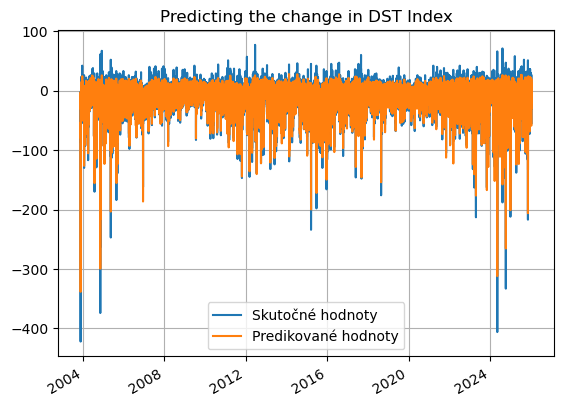

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9140550171478007
MCC=0.7420130558910888
Výkon NN:
MAE: 4.9519, MSE: 58.6942
Perzistentný model:
MAE: 5.2996, MSE: 68.9591
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 6.56%
MSE Improvement: 14.89%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step 

201/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step 

 69/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 9:10 615ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step  

  9/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step 

209/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 14s 15ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step 

  9/224 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step 

 53/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step


Shapes LSTM:
train: (229350,) (229350,)
val:   (57333,) (57333,)
test:  (194194,) (194194,)
Global sigma (LSTM errors, scaled): 0.41406742
Shapes GP:
X_gp_train: (286683, 6)
y_gp_train: (286683,)
X_test_gp: (194194, 6)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.83**2 * RBF(length_scale=0.338) + WhiteKernel(noise_level=0.685)


Global sigma (LSTM errors): 9.111102
Hybrid prediction with smoothed, inflated interval ready.


In [20]:
len(y_hybrid_upper)

194194

In [21]:
len(y_pred_persistence)

194189

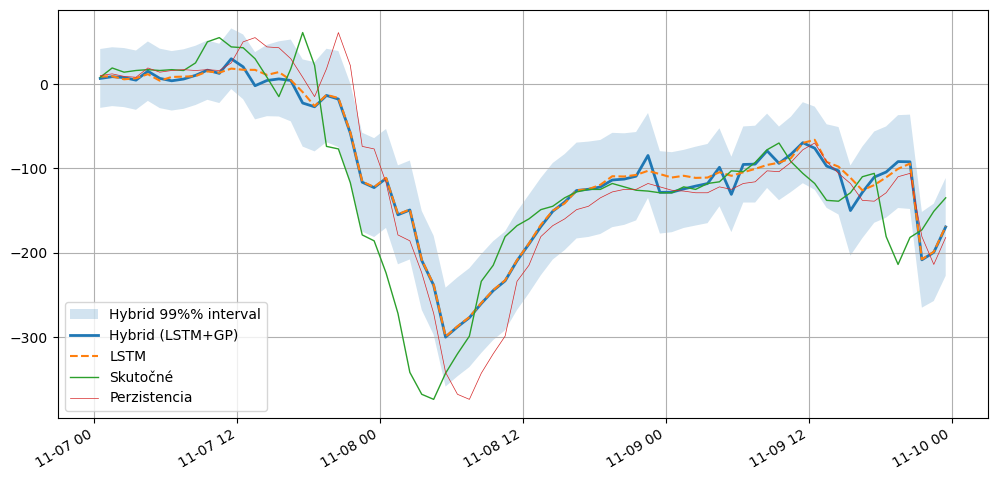

In [22]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})



start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [23]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 64.5222
MAE: 5.2324

--- Klasifikačné metriky (Prah: -19.1 nT) ---
Matthews Correlation Coefficient (MCC): 0.7263

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      143220 |        8837
Skutočná 1 |        9171 |       32961

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.94      0.94      0.94    152057
   Trieda 1 (Búrka)       0.79      0.78      0.79     42132

           accuracy                           0.91    194189
          macro avg       0.86      0.86      0.86    194189
       weighted avg       0.91      0.91      0.91    194189



In [24]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9140579538490852
MCC=0.7420157422652306
Výkon NN:
MAE: 4.9519, MSE: 58.6942
Perzistentný model:
MAE: 5.2996, MSE: 68.9591
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 6.56%
MSE Improvement: 14.89%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9378    0.9535    0.9456    152057
           1     0.8213    0.7719    0.7958     42132

    accuracy                         0.9141    194189
   macro avg     0.8795    0.8627    0.8707    194189
weighted avg     0.9125    0.9141    0.9131    194189


===== LSTM+GP =====
ACC=0.9072656020680883
MCC=0.7263011275648613
Výkon NN:
MAE: 5.2324, MSE: 64.5222
Perzistentný model:
MAE: 5.2996, MSE: 68.9591
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 1.27%
MSE Improvement: 6.43%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9398    0.9419    0.9409    152057
           1     0.7886    0.7823    0.7854     42132

   

/tmp/ipykernel_218280/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_218280/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
14,2026-04-26T00:26:45,LSTM,6.0,2.0,DST+2,OMNI2_all,-20.0,-19.7,0.931603,0.794943,"{""text"": "" precision recall f...",4.013647,37.395781,4.211529,43.255398,4.698564,13.546558
15,2026-04-26T00:26:45,LSTM+GP,6.0,2.0,DST+2,OMNI2_all,-20.0,-19.7,0.929441,0.789653,"{""text"": "" precision recall f...",4.134388,40.878004,4.211529,43.255398,1.831650,5.496179
16,2026-04-26T01:24:36,LSTM,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.8,0.915605,0.742928,"{""text"": "" precision recall f...",4.926662,57.962115,5.299650,68.960383,7.037980,15.948676
17,2026-04-26T01:24:36,LSTM+GP,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.8,0.908854,0.720692,"{""text"": "" precision recall f...",5.300624,65.438560,5.299650,68.960383,-0.018367,5.107023
18,2026-04-26T02:41:23,LSTM,18.0,3.0,DST+3,OMNI2_all,-20.0,-19.8,0.915804,0.744475,"{""text"": "" precision recall f...",4.898152,58.346062,5.299618,68.961051,7.575386,15.392732
19,2026-04-26T02:41:23,LSTM+GP,18.0,3.0,DST+3,OMNI2_all,-20.0,-19.8,0.912878,0.737819,"{""text"": "" precision recall f...",5.083607,62.097885,5.299618,68.961051,4.075971,9.952235
20,2026-04-26T04:04:34,LSTM,24.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.916816,0.745837,"{""text"": "" precision recall f...",4.866843,56.697818,5.299679,68.962605,8.167217,17.784692
21,2026-04-26T04:04:34,LSTM+GP,24.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.909513,0.723702,"{""text"": "" precision recall f...",5.186965,62.828067,5.299679,68.962605,2.126813,8.895455
22,2026-04-26T04:44:18,LSTM,6.0,3.0,DST+3,OMNI2_all,-20.0,-19.1,0.914058,0.742016,"{""text"": "" precision recall f...",4.951872,58.694205,5.299620,68.959107,6.561762,14.885492
23,2026-04-26T04:44:18,LSTM+GP,6.0,3.0,DST+3,OMNI2_all,-20.0,-19.1,0.907266,0.726301,"{""text"": "" precision recall f...",5.232369,64.522202,5.299620,68.959107,1.268994,6.434110
